# 데이터 다운로드

In [1]:
# !kaggle competitions download -c spaceship-titanic

# 필요 라이브러리 import

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import preprocessing

from catboost import CatBoostClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_validate
from sklearn.metrics import accuracy_score

In [3]:
pd.set_option('mode.chained_assignment',  None) # 판다스 경고 제거

# 데이터 로드

* <mark style='background-color: #f4f4f4'>PassengerId</mark> - A unique Id for each passenger. Each Id takes the form gggg_pp where gggg indicates a group the passenger is travelling with and pp is their number within the group. People in a group are often family members, but not always.
* <mark style='background-color: #f4f4f4'>HomePlanet</mark> - The planet the passenger departed from, typically their planet of permanent residence.
* <mark style='background-color: #f4f4f4'>CryoSleep</mark> - Indicates whether the passenger elected to be put into suspended animation for the duration of the voyage. Passengers in cryosleep are confined to their cabins.
* <mark style='background-color: #f4f4f4'>Cabin</mark> - The cabin number where the passenger is staying. Takes the form deck/num/side, where side can be either P for Port or S for Starboard.
* <mark style='background-color: #f4f4f4'>Destination</mark> - The planet the passenger will be debarking to.
* <mark style='background-color: #f4f4f4'>Age</mark> - The age of the passenger.
* <mark style='background-color: #f4f4f4'>VIP</mark> - Whether the passenger has paid for special VIP service during the voyage.
* <mark style='background-color: #f4f4f4'>RoomService, FoodCourt, ShoppingMall, Spa, VRDeck</mark> - Amount the passenger has billed at each of the Spaceship Titanic's many luxury amenities.
* <mark style='background-color: #f4f4f4'>Name</mark> - The first and last names of the passenger.


* <mark style='background-color: #f4f4f4'>Transported</mark> - Whether the passenger was transported to another dimension. This is the target, the column you are trying to predict.

In [4]:
train_data = pd.read_csv('./dataset/train.csv')
train_data

,PassengerId,HomePlanet,CryoSleep,Cabin,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Name,Transported
0,0001_01,Europa,False,B/0/P,TRAPPIST-1e,39.0,False,0.0,0.0,0.0,0.0,0.0,Maham Ofracculy,False
1,0002_01,Earth,False,F/0/S,TRAPPIST-1e,24.0,False,109.0,9.0,25.0,549.0,44.0,Juanna Vines,True
2,0003_01,Europa,False,A/0/S,TRAPPIST-1e,58.0,True,43.0,3576.0,0.0,6715.0,49.0,Altark Susent,False
3,0003_02,Europa,False,A/0/S,TRAPPIST-1e,33.0,False,0.0,1283.0,371.0,3329.0,193.0,Solam Susent,False
4,0004_01,Earth,False,F/1/S,TRAPPIST-1e,16.0,False,303.0,70.0,151.0,565.0,2.0,Willy Santantines,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8688,9276_01,Europa,False,A/98/P,55 Cancri e,41.0,True,0.0,6819.0,0.0,1643.0,74.0,Gravior Noxnuther,False
8689,9278_01,Earth,True,G/1499/S,PSO J318.5-22,18.0,False,0.0,0.0,0.0,0.0,0.0,Kurta Mondalley,False
8690,9279_01,Earth,False,G/1500/S,TRAPPIST-1e,26.0,False,0.0,0.0,1872.0,1.0,0.0,Fayey Connon,True
8691,9280_01,Europa,False,E/608/S,55 Cancri e,32.0,False,0.0,1049.0,0.0,353.0,3235.0,Celeon Hontichre,False


In [5]:
test_data = pd.read_csv('./dataset/test.csv')
test_data

,PassengerId,HomePlanet,CryoSleep,Cabin,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Name
0,0013_01,Earth,True,G/3/S,TRAPPIST-1e,27.0,False,0.0,0.0,0.0,0.0,0.0,Nelly Carsoning
1,0018_01,Earth,False,F/4/S,TRAPPIST-1e,19.0,False,0.0,9.0,0.0,2823.0,0.0,Lerome Peckers
2,0019_01,Europa,True,C/0/S,55 Cancri e,31.0,False,0.0,0.0,0.0,0.0,0.0,Sabih Unhearfus
3,0021_01,Europa,False,C/1/S,TRAPPIST-1e,38.0,False,0.0,6652.0,0.0,181.0,585.0,Meratz Caltilter
4,0023_01,Earth,False,F/5/S,TRAPPIST-1e,20.0,False,10.0,0.0,635.0,0.0,0.0,Brence Harperez
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4272,9266_02,Earth,True,G/1496/S,TRAPPIST-1e,34.0,False,0.0,0.0,0.0,0.0,0.0,Jeron Peter
4273,9269_01,Earth,False,NaN,TRAPPIST-1e,42.0,False,0.0,847.0,17.0,10.0,144.0,Matty Scheron
4274,9271_01,Mars,True,D/296/P,55 Cancri e,NaN,False,0.0,0.0,0.0,0.0,0.0,Jayrin Pore
4275,9273_01,Europa,False,D/297/P,NaN,NaN,False,0.0,2680.0,0.0,0.0,523.0,Kitakan Conale


In [6]:
train_data.describe()

,Age,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck
count,8514.000000,8512.000000,8510.000000,8485.000000,8510.000000,8505.000000
mean,28.827930,224.687617,458.077203,173.729169,311.138778,304.854791
std,14.489021,666.717663,1611.489240,604.696458,1136.705535,1145.717189
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,19.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,27.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,38.000000,47.000000,76.000000,27.000000,59.000000,46.000000
max,79.000000,14327.000000,29813.000000,23492.000000,22408.000000,24133.000000


In [7]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8693 entries, 0 to 8692
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   PassengerId   8693 non-null   object 
 1   HomePlanet    8492 non-null   object 
 2   CryoSleep     8476 non-null   object 
 3   Cabin         8494 non-null   object 
 4   Destination   8511 non-null   object 
 5   Age           8514 non-null   float64
 6   VIP           8490 non-null   object 
 7   RoomService   8512 non-null   float64
 8   FoodCourt     8510 non-null   float64
 9   ShoppingMall  8485 non-null   float64
 10  Spa           8510 non-null   float64
 11  VRDeck        8505 non-null   float64
 12  Name          8493 non-null   object 
 13  Transported   8693 non-null   bool   
dtypes: bool(1), float64(6), object(7)
memory usage: 891.5+ KB


In [8]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4277 entries, 0 to 4276
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   PassengerId   4277 non-null   object 
 1   HomePlanet    4190 non-null   object 
 2   CryoSleep     4184 non-null   object 
 3   Cabin         4177 non-null   object 
 4   Destination   4185 non-null   object 
 5   Age           4186 non-null   float64
 6   VIP           4184 non-null   object 
 7   RoomService   4195 non-null   float64
 8   FoodCourt     4171 non-null   float64
 9   ShoppingMall  4179 non-null   float64
 10  Spa           4176 non-null   float64
 11  VRDeck        4197 non-null   float64
 12  Name          4183 non-null   object 
dtypes: float64(6), object(7)
memory usage: 434.5+ KB


# 데이터 전처리

## 결측치 확인 및 제거
* 수치형 데이터는 결측치를 0으로 대체한다

In [9]:
train_data.isnull().sum()

PassengerId       0
HomePlanet      201
CryoSleep       217
Cabin           199
Destination     182
Age             179
VIP             203
RoomService     181
FoodCourt       183
ShoppingMall    208
Spa             183
VRDeck          188
Name            200
Transported       0
dtype: int64

### 불린 데이터 one-hot encoding
* CryoSleep, VIP 컬럼은 type이 object이나 실질적으로는 boolean이므로 boolean으로 간주

In [10]:
boolean_columns = ['CryoSleep', 'VIP']
train_data[boolean_columns] = train_data[boolean_columns].astype(float)
train_data[boolean_columns].head()

,CryoSleep,VIP
0,0.0,0.0
1,0.0,0.0
2,0.0,1.0
3,0.0,0.0
4,0.0,0.0


### 수치형 데이터

In [11]:
numeric_columns = train_data.describe().columns

In [12]:
train_data[numeric_columns].isnull().sum()

CryoSleep       217
Age             179
VIP             203
RoomService     181
FoodCourt       183
ShoppingMall    208
Spa             183
VRDeck          188
dtype: int64

In [13]:
train_data[numeric_columns] = train_data[numeric_columns].fillna(0)
train_data[numeric_columns].isnull().sum()

CryoSleep       0
Age             0
VIP             0
RoomService     0
FoodCourt       0
ShoppingMall    0
Spa             0
VRDeck          0
dtype: int64

### Object형 데이터
* 최빈값으로 대체한다.

In [14]:
object_columns = train_data.columns[train_data.dtypes==object]
train_data[object_columns].isnull().sum()

PassengerId      0
HomePlanet     201
Cabin          199
Destination    182
Name           200
dtype: int64

In [15]:
mode = train_data[object_columns].mode().iloc[0] # 최빈값 구하기
mode

PassengerId               0001_01
HomePlanet                  Earth
Cabin                     G/734/S
Destination           TRAPPIST-1e
Name           Alraium Disivering
Name: 0, dtype: object

In [16]:
mode_dict = {k:v for k,v in zip(object_columns,mode)}
mode_dict

{'PassengerId': '0001_01',
 'HomePlanet': 'Earth',
 'Cabin': 'G/734/S',
 'Destination': 'TRAPPIST-1e',
 'Name': 'Alraium Disivering'}

In [17]:
train_data[object_columns] = train_data[object_columns].fillna(mode_dict)
train_data[object_columns].isnull().sum()

PassengerId    0
HomePlanet     0
Cabin          0
Destination    0
Name           0
dtype: int64

In [18]:
train_data.isnull().sum()

PassengerId     0
HomePlanet      0
CryoSleep       0
Cabin           0
Destination     0
Age             0
VIP             0
RoomService     0
FoodCourt       0
ShoppingMall    0
Spa             0
VRDeck          0
Name            0
Transported     0
dtype: int64

## PassengerId 컬럼 분해
PassengerId = gggg_pp
* Group : gggg
* Number : pp

In [19]:
id_columns = ['Group', 'Number']

In [20]:
train_data[id_columns] = train_data['PassengerId'].str.split('_', expand=True)
train_data[id_columns] = train_data[id_columns].astype(float)
train_data[id_columns]

,Group,Number
0,1.0,1.0
1,2.0,1.0
2,3.0,1.0
3,3.0,2.0
4,4.0,1.0
...,...,...
8688,9276.0,1.0
8689,9278.0,1.0
8690,9279.0,1.0
8691,9280.0,1.0


## Cabin 컬럼 분해
Cabin = Deck/Num/Side
* Deck
* Num
* S1ide

In [21]:
cabin_columns = ['Deck', 'Num', 'Side']

In [22]:
train_data[cabin_columns] = train_data['Cabin'].str.split('/', expand=True)
train_data['Num'] = train_data['Num'].astype(float)
train_data[cabin_columns]

,Deck,Num,Side
0,B,0.0,P
1,F,0.0,S
2,A,0.0,S
3,A,0.0,S
4,F,1.0,S
...,...,...,...
8688,A,98.0,P
8689,G,1499.0,S
8690,G,1500.0,S
8691,E,608.0,S


In [23]:
sorted(train_data['Deck'].unique())

['A', 'B', 'C', 'D', 'E', 'F', 'G', 'T']

### Side 컬럼 one-hot encoding
Side 컬럼의 값이 P 또는 S 이므로 0, 1로 one-hot encoding

In [24]:
train_data['Side'] = train_data.loc[:, 'Side'].apply(lambda x: float(x == 'P'))

## 함께 탄 가족이 있는지를 나타내는 Family 컬럼 추가
* 성(last name, L 컬럼)이 같으면 가족으로 간주

In [25]:
train_data.loc[:, ['FirstName', 'LastName']] = train_data['Name'].str.split(' ', expand=True)
train_data[['FirstName', 'LastName']] = train_data['Name'].str.split(' ', expand=True)
train_data[['FirstName', 'LastName']]

,FirstName,LastName
0,Maham,Ofracculy
1,Juanna,Vines
2,Altark,Susent
3,Solam,Susent
4,Willy,Santantines
...,...,...
8688,Gravior,Noxnuther
8689,Kurta,Mondalley
8690,Fayey,Connon
8691,Celeon,Hontichre


In [26]:
train_data['Family'] = 0.

In [27]:
last_names = train_data['LastName'].value_counts()
last_names

Disivering    207
Casonston      18
Oneiles        16
Litthews       15
Domington      15
             ... 
Covale          1
Dun             1
Witalnerod      1
Deryplinet      1
Sionerorly      1
Name: LastName, Length: 2217, dtype: int64

In [28]:
for last_name in last_names[last_names > 1].index:
    train_data.loc[train_data['LastName'] == last_name, 'Family'] = 1.

In [29]:
train_data['Family'].value_counts()

1.0    8311
0.0     382
Name: Family, dtype: int64

## 	HomePlanet, Deck, Destination 컬럼 label encoding
* one-hot encoding 하기에는 개수가 많기 때문에 label encoding 사용

In [30]:
home_planets = train_data['HomePlanet'].unique()
home_planets

array(['Europa', 'Earth', 'Mars'], dtype=object)

In [31]:
for idx, home_planet in enumerate(home_planets):
    train_data.loc[train_data['HomePlanet'] == home_planet, 'HomePlanet'] = idx
train_data['HomePlanet'] = train_data['HomePlanet'].astype('float')

In [32]:
decks = train_data['Deck'].unique()
decks

array(['B', 'F', 'A', 'G', 'E', 'D', 'C', 'T'], dtype=object)

In [33]:
for idx, deck in enumerate(decks):
    train_data.loc[train_data['Deck'] == deck, 'Deck'] = idx
train_data['Deck'] =  train_data['Deck'].astype('float')

In [34]:
destinations = train_data['Destination'].unique()
destinations

array(['TRAPPIST-1e', 'PSO J318.5-22', '55 Cancri e'], dtype=object)

In [35]:
for idx, destination in enumerate(destinations):
    train_data.loc[train_data['Destination'] == destination, 'Destination'] = idx
train_data['Destination'] =  train_data['Destination'].astype('float')

## 불필요한 컬럼 제거

In [36]:
train_data = train_data[['Group', 'Number', 'HomePlanet', 'CryoSleep', 'Deck', 'Num', 'Side',
    'Destination', 'Age', 'VIP', 'RoomService', 'FoodCourt', 'ShoppingMall', 'Spa', 'VRDeck',
    'Family', 'Transported']]
train_data

,Group,Number,HomePlanet,CryoSleep,Deck,Num,Side,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Family,Transported
0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,39.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,False
1,2.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,24.0,0.0,109.0,9.0,25.0,549.0,44.0,1.0,True
2,3.0,1.0,0.0,0.0,2.0,0.0,0.0,0.0,58.0,1.0,43.0,3576.0,0.0,6715.0,49.0,1.0,False
3,3.0,2.0,0.0,0.0,2.0,0.0,0.0,0.0,33.0,0.0,0.0,1283.0,371.0,3329.0,193.0,1.0,False
4,4.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,16.0,0.0,303.0,70.0,151.0,565.0,2.0,1.0,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8688,9276.0,1.0,0.0,0.0,2.0,98.0,1.0,2.0,41.0,1.0,0.0,6819.0,0.0,1643.0,74.0,1.0,False
8689,9278.0,1.0,1.0,1.0,3.0,1499.0,0.0,1.0,18.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,False
8690,9279.0,1.0,1.0,0.0,3.0,1500.0,0.0,0.0,26.0,0.0,0.0,0.0,1872.0,1.0,0.0,1.0,True
8691,9280.0,1.0,0.0,0.0,4.0,608.0,0.0,2.0,32.0,0.0,0.0,1049.0,0.0,353.0,3235.0,1.0,False


In [37]:
train_data.dtypes # 타겟 데이터를 제외한 나머지 데이터를 모두 수치형 데이터로 변환 완료

Group           float64
Number          float64
HomePlanet      float64
CryoSleep       float64
Deck            float64
Num             float64
Side            float64
Destination     float64
Age             float64
VIP             float64
RoomService     float64
FoodCourt       float64
ShoppingMall    float64
Spa             float64
VRDeck          float64
Family          float64
Transported        bool
dtype: object

In [38]:
train_data

,Group,Number,HomePlanet,CryoSleep,Deck,Num,Side,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Family,Transported
0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,39.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,False
1,2.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,24.0,0.0,109.0,9.0,25.0,549.0,44.0,1.0,True
2,3.0,1.0,0.0,0.0,2.0,0.0,0.0,0.0,58.0,1.0,43.0,3576.0,0.0,6715.0,49.0,1.0,False
3,3.0,2.0,0.0,0.0,2.0,0.0,0.0,0.0,33.0,0.0,0.0,1283.0,371.0,3329.0,193.0,1.0,False
4,4.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,16.0,0.0,303.0,70.0,151.0,565.0,2.0,1.0,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8688,9276.0,1.0,0.0,0.0,2.0,98.0,1.0,2.0,41.0,1.0,0.0,6819.0,0.0,1643.0,74.0,1.0,False
8689,9278.0,1.0,1.0,1.0,3.0,1499.0,0.0,1.0,18.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,False
8690,9279.0,1.0,1.0,0.0,3.0,1500.0,0.0,0.0,26.0,0.0,0.0,0.0,1872.0,1.0,0.0,1.0,True
8691,9280.0,1.0,0.0,0.0,4.0,608.0,0.0,2.0,32.0,0.0,0.0,1049.0,0.0,353.0,3235.0,1.0,False


## 테스트 데이터 전처리

In [39]:
test_data[boolean_columns] = test_data[boolean_columns].astype(float)
test_data[numeric_columns] = test_data[numeric_columns].fillna(0)
object_columns = test_data.columns[test_data.dtypes==object]
mode = test_data[object_columns].mode().iloc[0]
mode_dict = {k:v for k,v in zip(object_columns,mode)}
test_data[object_columns] = test_data[object_columns].fillna(mode_dict)

test_data[id_columns] = test_data['PassengerId'].str.split('_', expand=True)
test_data[id_columns] = test_data[id_columns].astype(float)

test_data[cabin_columns] = test_data['Cabin'].str.split('/', expand=True)
test_data['Num'] = test_data['Num'].astype(float)

test_data['Side'] = test_data.loc[:, 'Side'].apply(lambda x: float(x == 'P'))

for idx, home_planet in enumerate(home_planets):
    test_data.loc[test_data['HomePlanet'] == home_planet, 'HomePlanet'] = idx
test_data['HomePlanet'] = test_data['HomePlanet'].astype(float)

for idx, deck in enumerate(decks):
    test_data.loc[test_data['Deck'] == deck, 'Deck'] = idx
test_data['Deck'] =  test_data['Deck'].astype(float)

for idx, destination in enumerate(destinations):
    test_data.loc[test_data['Destination'] == destination, 'Destination'] = idx
test_data['Destination'] =  test_data['Destination'].astype(float)

test_data.loc[:, ['FirstName', 'LastName']] = test_data['Name'].str.split(' ', expand=True)
test_data[['FirstName', 'LastName']] = test_data['Name'].str.split(' ', expand=True)

test_data['Family'] = 0.
last_names = test_data['LastName'].value_counts()

for last_name in last_names[last_names > 1].index:
    test_data.loc[test_data['LastName'] == last_name, 'Family'] = 1.

test_data = test_data[['Group', 'Number', 'HomePlanet', 'CryoSleep', 'Deck', 'Num',
'Side', 'Destination', 'Age', 'VIP', 'RoomService', 'FoodCourt', 'ShoppingMall',
'Spa', 'VRDeck', 'Family']]

test_data

,Group,Number,HomePlanet,CryoSleep,Deck,Num,Side,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Family
0,13.0,1.0,1.0,1.0,3.0,3.0,0.0,0.0,27.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,18.0,1.0,1.0,0.0,1.0,4.0,0.0,0.0,19.0,0.0,0.0,9.0,0.0,2823.0,0.0,0.0
2,19.0,1.0,0.0,1.0,6.0,0.0,0.0,2.0,31.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,21.0,1.0,0.0,0.0,6.0,1.0,0.0,0.0,38.0,0.0,0.0,6652.0,0.0,181.0,585.0,0.0
4,23.0,1.0,1.0,0.0,1.0,5.0,0.0,0.0,20.0,0.0,10.0,0.0,635.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4272,9266.0,2.0,1.0,1.0,3.0,1496.0,0.0,0.0,34.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4273,9269.0,1.0,1.0,0.0,3.0,160.0,1.0,0.0,42.0,0.0,0.0,847.0,17.0,10.0,144.0,1.0
4274,9271.0,1.0,2.0,1.0,5.0,296.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4275,9273.0,1.0,0.0,0.0,5.0,297.0,1.0,0.0,0.0,0.0,0.0,2680.0,0.0,0.0,523.0,1.0


# 데이터 분석

array([[<AxesSubplot:title={'center':'Group'}>,
        <AxesSubplot:title={'center':'Number'}>,
        <AxesSubplot:title={'center':'HomePlanet'}>,
        <AxesSubplot:title={'center':'CryoSleep'}>],
       [<AxesSubplot:title={'center':'Deck'}>,
        <AxesSubplot:title={'center':'Num'}>,
        <AxesSubplot:title={'center':'Side'}>,
        <AxesSubplot:title={'center':'Destination'}>],
       [<AxesSubplot:title={'center':'Age'}>,
        <AxesSubplot:title={'center':'VIP'}>,
        <AxesSubplot:title={'center':'RoomService'}>,
        <AxesSubplot:title={'center':'FoodCourt'}>],
       [<AxesSubplot:title={'center':'ShoppingMall'}>,
        <AxesSubplot:title={'center':'Spa'}>,
        <AxesSubplot:title={'center':'VRDeck'}>,
        <AxesSubplot:title={'center':'Family'}>]], dtype=object)

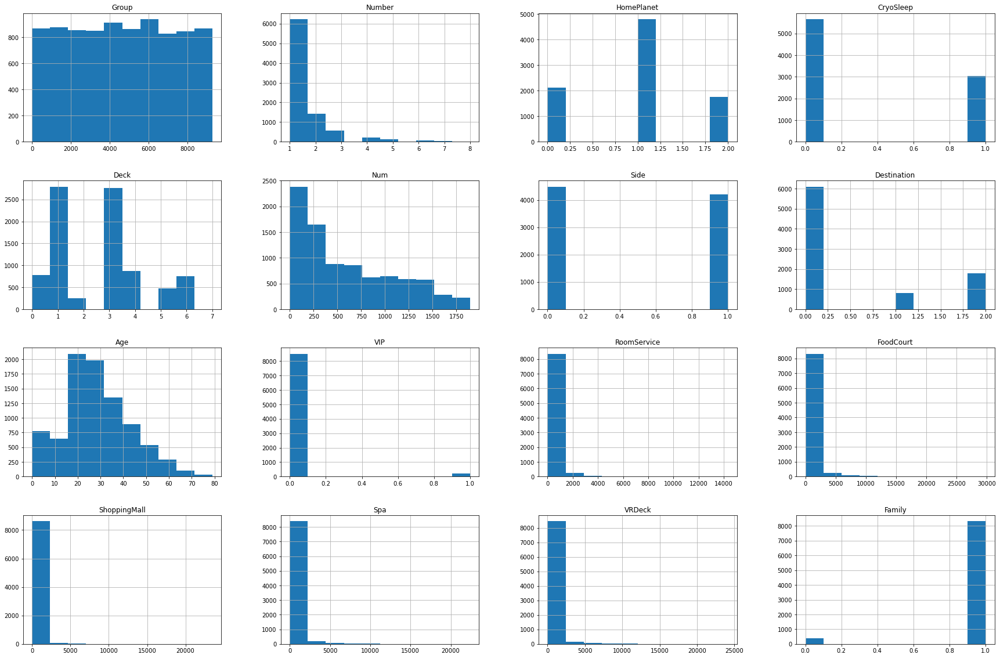

In [40]:
train_data.hist(figsize=(30,20))

## 선형성

## Correlation
* 상관계수로 히트맵을 그려 확인한 결과 선형성이 있다고 판단되는 0.5 이상의 값이 거의 없으므로 선형 모델은 적합하지 않다.

<AxesSubplot:>

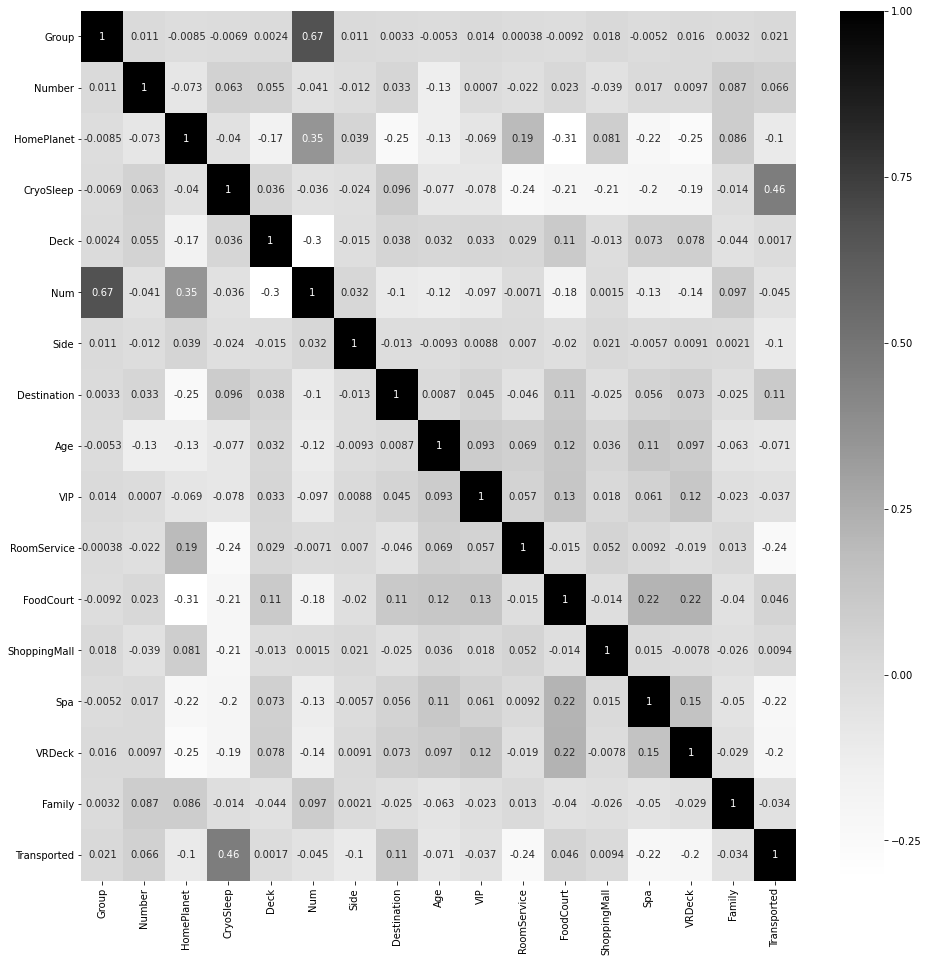

In [41]:
plt.figure(figsize = (16, 16))
sns.heatmap(train_data.corr(), cmap = 'Greys', annot = True)

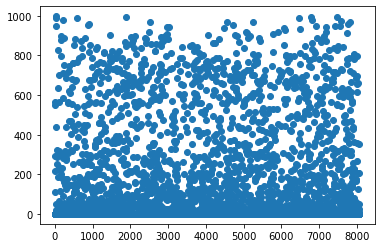

In [42]:
a = train_data['Spa']<1000
plt.scatter(range(len(train_data['Spa'][a])),train_data['Spa'][a])

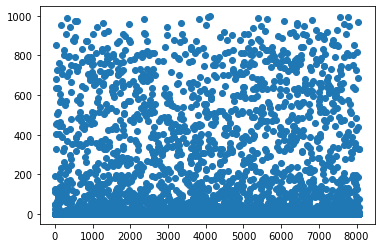

In [43]:
b = train_data['VRDeck']<1000
plt.scatter(range(len(train_data['VRDeck'][b])),train_data['VRDeck'][b])

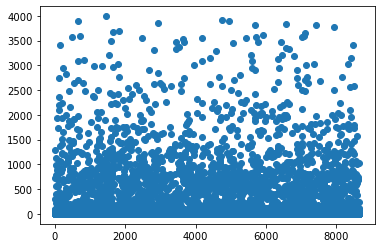

In [44]:
c = train_data['RoomService']<4000
plt.scatter(range(len(train_data['RoomService'][c])),train_data['RoomService'][c])

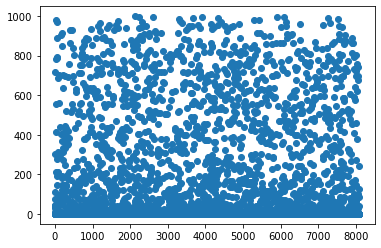

In [45]:
c = train_data['RoomService']<1000
plt.scatter(range(len(train_data['RoomService'][c])),train_data['RoomService'][c])

In [46]:
train_cond = (train_data['Spa']<1000) & (train_data['VRDeck']<1000) & (train_data['RoomService']<1000)

train_data = train_data[train_cond]

In [47]:
cat_model = CatBoostClassifier(
    iterations = 1000,
    #leaf_estimation_iterations = 100,
    #random_strength = 0.5,
    depth = 7,
    l2_leaf_reg = 5,
    learning_rate=0.001,
).fit(train_data.iloc[:,:-1], train_data.iloc[:,-1])

0:	learn: 0.6925213	total: 169ms	remaining: 2m 49s
1:	learn: 0.6918840	total: 229ms	remaining: 1m 54s
2:	learn: 0.6913831	total: 244ms	remaining: 1m 21s
3:	learn: 0.6907637	total: 258ms	remaining: 1m 4s
4:	learn: 0.6902174	total: 267ms	remaining: 53.1s
5:	learn: 0.6895917	total: 275ms	remaining: 45.5s
6:	learn: 0.6890555	total: 283ms	remaining: 40.1s
7:	learn: 0.6883877	total: 289ms	remaining: 35.8s
8:	learn: 0.6877504	total: 295ms	remaining: 32.5s
9:	learn: 0.6871131	total: 301ms	remaining: 29.8s
10:	learn: 0.6865312	total: 307ms	remaining: 27.6s
11:	learn: 0.6859169	total: 313ms	remaining: 25.7s
12:	learn: 0.6852942	total: 318ms	remaining: 24.1s
13:	learn: 0.6847585	total: 324ms	remaining: 22.8s
14:	learn: 0.6841158	total: 330ms	remaining: 21.6s
15:	learn: 0.6835758	total: 335ms	remaining: 20.6s
16:	learn: 0.6829514	total: 342ms	remaining: 19.8s
17:	learn: 0.6823571	total: 347ms	remaining: 18.9s
18:	learn: 0.6817378	total: 353ms	remaining: 18.3s
19:	learn: 0.6811463	total: 360ms	rema

173:	learn: 0.6094399	total: 1.25s	remaining: 5.93s
174:	learn: 0.6090934	total: 1.25s	remaining: 5.92s
175:	learn: 0.6087635	total: 1.26s	remaining: 5.9s
176:	learn: 0.6083527	total: 1.27s	remaining: 5.89s
177:	learn: 0.6079961	total: 1.27s	remaining: 5.88s
178:	learn: 0.6075887	total: 1.28s	remaining: 5.87s
179:	learn: 0.6072032	total: 1.29s	remaining: 5.87s
180:	learn: 0.6068843	total: 1.29s	remaining: 5.86s
181:	learn: 0.6064791	total: 1.3s	remaining: 5.85s
182:	learn: 0.6061442	total: 1.31s	remaining: 5.84s
183:	learn: 0.6057803	total: 1.31s	remaining: 5.83s
184:	learn: 0.6054337	total: 1.32s	remaining: 5.82s
185:	learn: 0.6051066	total: 1.33s	remaining: 5.8s
186:	learn: 0.6047409	total: 1.33s	remaining: 5.79s
187:	learn: 0.6043383	total: 1.34s	remaining: 5.78s
188:	learn: 0.6039596	total: 1.34s	remaining: 5.77s
189:	learn: 0.6035622	total: 1.35s	remaining: 5.75s
190:	learn: 0.6032395	total: 1.36s	remaining: 5.75s
191:	learn: 0.6028830	total: 1.36s	remaining: 5.74s
192:	learn: 0.6

345:	learn: 0.5606538	total: 2.34s	remaining: 4.42s
346:	learn: 0.5605042	total: 2.35s	remaining: 4.42s
347:	learn: 0.5602373	total: 2.35s	remaining: 4.41s
348:	learn: 0.5600535	total: 2.36s	remaining: 4.4s
349:	learn: 0.5598531	total: 2.36s	remaining: 4.39s
350:	learn: 0.5596555	total: 2.37s	remaining: 4.38s
351:	learn: 0.5593723	total: 2.37s	remaining: 4.37s
352:	learn: 0.5591169	total: 2.38s	remaining: 4.36s
353:	learn: 0.5588378	total: 2.38s	remaining: 4.35s
354:	learn: 0.5586186	total: 2.39s	remaining: 4.34s
355:	learn: 0.5583986	total: 2.4s	remaining: 4.33s
356:	learn: 0.5581720	total: 2.4s	remaining: 4.33s
357:	learn: 0.5579699	total: 2.41s	remaining: 4.32s
358:	learn: 0.5578144	total: 2.41s	remaining: 4.31s
359:	learn: 0.5576399	total: 2.42s	remaining: 4.3s
360:	learn: 0.5573923	total: 2.42s	remaining: 4.29s
361:	learn: 0.5571905	total: 2.43s	remaining: 4.29s
362:	learn: 0.5569304	total: 2.44s	remaining: 4.28s
363:	learn: 0.5567143	total: 2.44s	remaining: 4.27s
364:	learn: 0.55

504:	learn: 0.5306556	total: 3.43s	remaining: 3.36s
505:	learn: 0.5304952	total: 3.44s	remaining: 3.35s
506:	learn: 0.5303652	total: 3.44s	remaining: 3.35s
507:	learn: 0.5302350	total: 3.45s	remaining: 3.34s
508:	learn: 0.5300855	total: 3.45s	remaining: 3.33s
509:	learn: 0.5299444	total: 3.46s	remaining: 3.32s
510:	learn: 0.5297672	total: 3.46s	remaining: 3.31s
511:	learn: 0.5295605	total: 3.47s	remaining: 3.31s
512:	learn: 0.5293582	total: 3.48s	remaining: 3.3s
513:	learn: 0.5292308	total: 3.48s	remaining: 3.29s
514:	learn: 0.5290949	total: 3.49s	remaining: 3.29s
515:	learn: 0.5289439	total: 3.5s	remaining: 3.28s
516:	learn: 0.5287991	total: 3.5s	remaining: 3.27s
517:	learn: 0.5286219	total: 3.51s	remaining: 3.27s
518:	learn: 0.5284346	total: 3.52s	remaining: 3.26s
519:	learn: 0.5282422	total: 3.52s	remaining: 3.25s
520:	learn: 0.5280689	total: 3.53s	remaining: 3.25s
521:	learn: 0.5279614	total: 3.54s	remaining: 3.24s
522:	learn: 0.5278057	total: 3.54s	remaining: 3.23s
523:	learn: 0.5

680:	learn: 0.5067214	total: 4.68s	remaining: 2.19s
681:	learn: 0.5066054	total: 4.68s	remaining: 2.18s
682:	learn: 0.5064767	total: 4.69s	remaining: 2.18s
683:	learn: 0.5063318	total: 4.7s	remaining: 2.17s
684:	learn: 0.5062479	total: 4.71s	remaining: 2.16s
685:	learn: 0.5061316	total: 4.71s	remaining: 2.16s
686:	learn: 0.5060300	total: 4.72s	remaining: 2.15s
687:	learn: 0.5059364	total: 4.73s	remaining: 2.14s
688:	learn: 0.5058132	total: 4.73s	remaining: 2.13s
689:	learn: 0.5057073	total: 4.74s	remaining: 2.13s
690:	learn: 0.5056067	total: 4.75s	remaining: 2.12s
691:	learn: 0.5054667	total: 4.75s	remaining: 2.12s
692:	learn: 0.5053485	total: 4.76s	remaining: 2.11s
693:	learn: 0.5052057	total: 4.77s	remaining: 2.1s
694:	learn: 0.5050762	total: 4.77s	remaining: 2.09s
695:	learn: 0.5049436	total: 4.78s	remaining: 2.09s
696:	learn: 0.5048595	total: 4.79s	remaining: 2.08s
697:	learn: 0.5047555	total: 4.8s	remaining: 2.08s
698:	learn: 0.5046239	total: 4.81s	remaining: 2.07s
699:	learn: 0.5

859:	learn: 0.4885936	total: 5.94s	remaining: 968ms
860:	learn: 0.4884847	total: 5.95s	remaining: 961ms
861:	learn: 0.4883747	total: 5.96s	remaining: 954ms
862:	learn: 0.4882834	total: 5.96s	remaining: 946ms
863:	learn: 0.4881833	total: 5.97s	remaining: 939ms
864:	learn: 0.4881037	total: 5.97s	remaining: 932ms
865:	learn: 0.4880449	total: 5.98s	remaining: 925ms
866:	learn: 0.4879788	total: 5.99s	remaining: 918ms
867:	learn: 0.4878784	total: 5.99s	remaining: 911ms
868:	learn: 0.4877832	total: 6s	remaining: 904ms
869:	learn: 0.4877017	total: 6s	remaining: 897ms
870:	learn: 0.4876305	total: 6.01s	remaining: 891ms
871:	learn: 0.4875267	total: 6.02s	remaining: 884ms
872:	learn: 0.4874142	total: 6.03s	remaining: 877ms
873:	learn: 0.4873312	total: 6.03s	remaining: 870ms
874:	learn: 0.4872318	total: 6.04s	remaining: 863ms
875:	learn: 0.4871574	total: 6.05s	remaining: 856ms
876:	learn: 0.4870707	total: 6.05s	remaining: 849ms
877:	learn: 0.4870104	total: 6.06s	remaining: 842ms
878:	learn: 0.4869

In [48]:
import shap
explainer = shap.TreeExplainer(cat_model)
shap_values = explainer.shap_values(train_data)

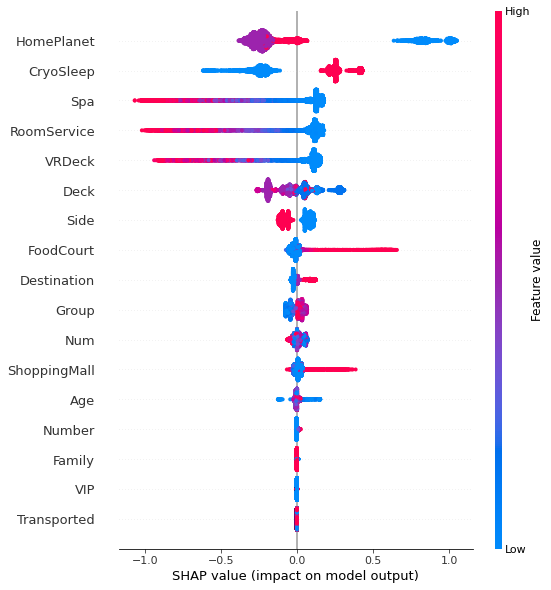

In [49]:
shap.initjs()
shap.summary_plot(shap_values, train_data)

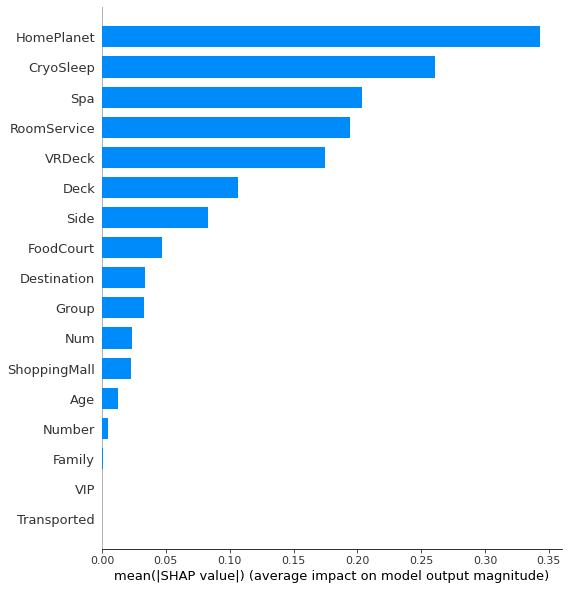

In [50]:
shap.summary_plot(shap_values, train_data, plot_type='bar')

## 컬럼 편집
* shap 분석 결과 VIP, Family, Number, Group의 4개 컬럼은 악영향을 미치거나 영향력이 거의 없으므로 제거한다.

In [51]:
train_data.drop(['VIP', 'Family', 'Number', 'Group'], inplace=True, axis=1)
test_data.drop(['VIP', 'Family', 'Number', 'Group'], inplace=True, axis=1)

# 모델 선택
* 속성들간의 선형성이 낮고, 데이터 분포를 보아도 어떠한 연관성을 찾기는 어려워 보이므로 트리 기반 모델이 적절해 보인다.
* label encoding을 사용했으므로 과대적합이 발생할 여지가 있다. 따라서 label encoding에 적합한 catboost를 선택했다.

In [52]:
data = train_data.iloc[:,:-1]
target = train_data.iloc[:,-1].astype(int)

## 모델학습 및 하이퍼파라미터 튜닝

In [53]:
model = CatBoostClassifier()

In [54]:
params = {
    'depth' : range(3,10,3),
    'n_estimators' : range(100,1100,100),
}

grid = GridSearchCV(
    model,
    params,
    scoring='accuracy',
    verbose=10
)
grid.fit(data, target)
grid.best_params_, grid.best_score_

Fitting 5 folds for each of 30 candidates, totalling 150 fits
[CV 1/5; 1/30] START depth=3, n_estimators=100..................................
Learning rate set to 0.178235
0:	learn: 0.6495002	total: 1.27ms	remaining: 126ms
1:	learn: 0.6180251	total: 2.59ms	remaining: 127ms
2:	learn: 0.5958171	total: 3.92ms	remaining: 127ms
3:	learn: 0.5738726	total: 5.85ms	remaining: 140ms
4:	learn: 0.5571548	total: 7.25ms	remaining: 138ms
5:	learn: 0.5428216	total: 8.57ms	remaining: 134ms
6:	learn: 0.5339392	total: 10.2ms	remaining: 135ms
7:	learn: 0.5238336	total: 11.5ms	remaining: 132ms
8:	learn: 0.5166131	total: 12.8ms	remaining: 130ms
9:	learn: 0.5108641	total: 14.1ms	remaining: 127ms
10:	learn: 0.5056049	total: 15.6ms	remaining: 126ms
11:	learn: 0.5008610	total: 16.9ms	remaining: 124ms
12:	learn: 0.4945475	total: 18.2ms	remaining: 122ms
13:	learn: 0.4890017	total: 19.6ms	remaining: 120ms
14:	learn: 0.4860588	total: 20.9ms	remaining: 119ms
15:	learn: 0.4827787	total: 22.2ms	remaining: 117ms
16:	l

[CV 2/5; 1/30] END ...depth=3, n_estimators=100;, score=0.770 total time=   0.2s
[CV 3/5; 1/30] START depth=3, n_estimators=100..................................
Learning rate set to 0.178235
0:	learn: 0.6478481	total: 1.4ms	remaining: 139ms
1:	learn: 0.6163691	total: 3.18ms	remaining: 156ms
2:	learn: 0.5926512	total: 4.73ms	remaining: 153ms
3:	learn: 0.5717821	total: 6.38ms	remaining: 153ms
4:	learn: 0.5543394	total: 8.08ms	remaining: 153ms
5:	learn: 0.5405495	total: 9.83ms	remaining: 154ms
6:	learn: 0.5294842	total: 11.4ms	remaining: 152ms
7:	learn: 0.5214259	total: 13.5ms	remaining: 155ms
8:	learn: 0.5137083	total: 15ms	remaining: 152ms
9:	learn: 0.5073579	total: 17.2ms	remaining: 155ms
10:	learn: 0.5022567	total: 19.1ms	remaining: 155ms
11:	learn: 0.4985471	total: 20.6ms	remaining: 151ms
12:	learn: 0.4942075	total: 22.1ms	remaining: 148ms
13:	learn: 0.4885004	total: 23.5ms	remaining: 144ms
14:	learn: 0.4851641	total: 24.9ms	remaining: 141ms
15:	learn: 0.4827801	total: 26.3ms	remain

[CV 4/5; 1/30] END ...depth=3, n_estimators=100;, score=0.790 total time=   0.2s
[CV 5/5; 1/30] START depth=3, n_estimators=100..................................
Learning rate set to 0.178235
0:	learn: 0.6500724	total: 1.32ms	remaining: 131ms
1:	learn: 0.6201483	total: 3.03ms	remaining: 148ms
2:	learn: 0.5956651	total: 4.41ms	remaining: 143ms
3:	learn: 0.5788365	total: 5.86ms	remaining: 141ms
4:	learn: 0.5620309	total: 17.2ms	remaining: 327ms
5:	learn: 0.5488249	total: 18.7ms	remaining: 293ms
6:	learn: 0.5399630	total: 20ms	remaining: 265ms
7:	learn: 0.5290778	total: 21.3ms	remaining: 245ms
8:	learn: 0.5212835	total: 22.8ms	remaining: 230ms
9:	learn: 0.5156367	total: 24.2ms	remaining: 218ms
10:	learn: 0.5073284	total: 25.6ms	remaining: 207ms
11:	learn: 0.5021962	total: 26.9ms	remaining: 197ms
12:	learn: 0.4978605	total: 28.4ms	remaining: 190ms
13:	learn: 0.4936218	total: 29.7ms	remaining: 182ms
14:	learn: 0.4908257	total: 31.3ms	remaining: 177ms
15:	learn: 0.4879055	total: 32.6ms	remai

72:	learn: 0.4200210	total: 173ms	remaining: 301ms
73:	learn: 0.4197399	total: 176ms	remaining: 299ms
74:	learn: 0.4194033	total: 178ms	remaining: 296ms
75:	learn: 0.4172327	total: 180ms	remaining: 294ms
76:	learn: 0.4168260	total: 182ms	remaining: 291ms
77:	learn: 0.4161881	total: 185ms	remaining: 289ms
78:	learn: 0.4159648	total: 187ms	remaining: 286ms
79:	learn: 0.4150071	total: 189ms	remaining: 283ms
80:	learn: 0.4145481	total: 191ms	remaining: 280ms
81:	learn: 0.4142630	total: 193ms	remaining: 278ms
82:	learn: 0.4138800	total: 195ms	remaining: 275ms
83:	learn: 0.4136674	total: 197ms	remaining: 273ms
84:	learn: 0.4131892	total: 200ms	remaining: 270ms
85:	learn: 0.4128773	total: 201ms	remaining: 267ms
86:	learn: 0.4115077	total: 204ms	remaining: 265ms
87:	learn: 0.4112734	total: 206ms	remaining: 262ms
88:	learn: 0.4108818	total: 208ms	remaining: 260ms
89:	learn: 0.4107013	total: 210ms	remaining: 257ms
90:	learn: 0.4104814	total: 213ms	remaining: 255ms
91:	learn: 0.4102381	total: 215

46:	learn: 0.4448350	total: 122ms	remaining: 397ms
47:	learn: 0.4439854	total: 124ms	remaining: 394ms
48:	learn: 0.4430478	total: 126ms	remaining: 389ms
49:	learn: 0.4422773	total: 129ms	remaining: 386ms
50:	learn: 0.4417383	total: 131ms	remaining: 384ms
51:	learn: 0.4408973	total: 134ms	remaining: 380ms
52:	learn: 0.4401342	total: 136ms	remaining: 378ms
53:	learn: 0.4394756	total: 138ms	remaining: 374ms
54:	learn: 0.4387525	total: 141ms	remaining: 372ms
55:	learn: 0.4382193	total: 143ms	remaining: 368ms
56:	learn: 0.4372061	total: 145ms	remaining: 364ms
57:	learn: 0.4364439	total: 147ms	remaining: 361ms
58:	learn: 0.4358993	total: 150ms	remaining: 357ms
59:	learn: 0.4350962	total: 152ms	remaining: 355ms
60:	learn: 0.4346428	total: 154ms	remaining: 352ms
61:	learn: 0.4343181	total: 157ms	remaining: 349ms
62:	learn: 0.4339784	total: 160ms	remaining: 347ms
63:	learn: 0.4331376	total: 162ms	remaining: 344ms
64:	learn: 0.4326423	total: 164ms	remaining: 341ms
65:	learn: 0.4318218	total: 166

45:	learn: 0.4454888	total: 114ms	remaining: 383ms
46:	learn: 0.4448686	total: 116ms	remaining: 379ms
47:	learn: 0.4439386	total: 119ms	remaining: 375ms
48:	learn: 0.4433598	total: 121ms	remaining: 372ms
49:	learn: 0.4425838	total: 123ms	remaining: 369ms
50:	learn: 0.4421298	total: 125ms	remaining: 366ms
51:	learn: 0.4412429	total: 127ms	remaining: 362ms
52:	learn: 0.4396527	total: 129ms	remaining: 359ms
53:	learn: 0.4392363	total: 132ms	remaining: 356ms
54:	learn: 0.4388056	total: 134ms	remaining: 353ms
55:	learn: 0.4384322	total: 136ms	remaining: 351ms
56:	learn: 0.4378804	total: 139ms	remaining: 348ms
57:	learn: 0.4373560	total: 141ms	remaining: 346ms
58:	learn: 0.4355780	total: 144ms	remaining: 344ms
59:	learn: 0.4348112	total: 146ms	remaining: 340ms
60:	learn: 0.4341381	total: 148ms	remaining: 337ms
61:	learn: 0.4335237	total: 150ms	remaining: 333ms
62:	learn: 0.4329816	total: 152ms	remaining: 330ms
63:	learn: 0.4324068	total: 154ms	remaining: 326ms
64:	learn: 0.4319065	total: 156

46:	learn: 0.4448906	total: 126ms	remaining: 411ms
47:	learn: 0.4438777	total: 129ms	remaining: 407ms
48:	learn: 0.4431050	total: 132ms	remaining: 406ms
49:	learn: 0.4425842	total: 134ms	remaining: 402ms
50:	learn: 0.4420375	total: 137ms	remaining: 399ms
51:	learn: 0.4412086	total: 139ms	remaining: 395ms
52:	learn: 0.4406532	total: 141ms	remaining: 392ms
53:	learn: 0.4402703	total: 144ms	remaining: 388ms
54:	learn: 0.4398113	total: 146ms	remaining: 385ms
55:	learn: 0.4394329	total: 148ms	remaining: 381ms
56:	learn: 0.4390608	total: 151ms	remaining: 378ms
57:	learn: 0.4383232	total: 153ms	remaining: 375ms
58:	learn: 0.4378712	total: 156ms	remaining: 372ms
59:	learn: 0.4374525	total: 158ms	remaining: 369ms
60:	learn: 0.4371005	total: 161ms	remaining: 367ms
61:	learn: 0.4363542	total: 164ms	remaining: 366ms
62:	learn: 0.4358421	total: 167ms	remaining: 364ms
63:	learn: 0.4350035	total: 180ms	remaining: 382ms
64:	learn: 0.4347262	total: 182ms	remaining: 379ms
65:	learn: 0.4342949	total: 185

39:	learn: 0.4547958	total: 125ms	remaining: 501ms
40:	learn: 0.4539609	total: 128ms	remaining: 496ms
41:	learn: 0.4526781	total: 131ms	remaining: 494ms
42:	learn: 0.4511361	total: 134ms	remaining: 490ms
43:	learn: 0.4503413	total: 137ms	remaining: 484ms
44:	learn: 0.4484565	total: 139ms	remaining: 477ms
45:	learn: 0.4479760	total: 141ms	remaining: 472ms
46:	learn: 0.4464864	total: 143ms	remaining: 465ms
47:	learn: 0.4451296	total: 146ms	remaining: 462ms
48:	learn: 0.4439288	total: 148ms	remaining: 457ms
49:	learn: 0.4422409	total: 150ms	remaining: 451ms
50:	learn: 0.4413966	total: 153ms	remaining: 446ms
51:	learn: 0.4401435	total: 155ms	remaining: 441ms
52:	learn: 0.4395229	total: 158ms	remaining: 437ms
53:	learn: 0.4388795	total: 160ms	remaining: 433ms
54:	learn: 0.4382437	total: 163ms	remaining: 428ms
55:	learn: 0.4376661	total: 165ms	remaining: 424ms
56:	learn: 0.4371972	total: 167ms	remaining: 419ms
57:	learn: 0.4366184	total: 169ms	remaining: 414ms
58:	learn: 0.4356901	total: 172

Learning rate set to 0.065084
0:	learn: 0.6654327	total: 2.31ms	remaining: 692ms
1:	learn: 0.6386957	total: 4.54ms	remaining: 677ms
2:	learn: 0.6228297	total: 6.96ms	remaining: 689ms
3:	learn: 0.6100829	total: 9.56ms	remaining: 708ms
4:	learn: 0.5960177	total: 12.1ms	remaining: 713ms
5:	learn: 0.5858509	total: 14.7ms	remaining: 719ms
6:	learn: 0.5775290	total: 16.8ms	remaining: 704ms
7:	learn: 0.5705975	total: 19.1ms	remaining: 696ms
8:	learn: 0.5643358	total: 21.6ms	remaining: 699ms
9:	learn: 0.5576329	total: 24.2ms	remaining: 702ms
10:	learn: 0.5506973	total: 26.7ms	remaining: 703ms
11:	learn: 0.5453276	total: 28.9ms	remaining: 693ms
12:	learn: 0.5401186	total: 31.6ms	remaining: 698ms
13:	learn: 0.5344221	total: 34.6ms	remaining: 707ms
14:	learn: 0.5290979	total: 36.8ms	remaining: 700ms
15:	learn: 0.5253503	total: 39.8ms	remaining: 707ms
16:	learn: 0.5213281	total: 42.7ms	remaining: 711ms
17:	learn: 0.5169281	total: 45.4ms	remaining: 711ms
18:	learn: 0.5137585	total: 48.5ms	remaining

206:	learn: 0.3882790	total: 507ms	remaining: 228ms
207:	learn: 0.3878726	total: 509ms	remaining: 225ms
208:	learn: 0.3876903	total: 511ms	remaining: 223ms
209:	learn: 0.3874089	total: 514ms	remaining: 220ms
210:	learn: 0.3872347	total: 516ms	remaining: 218ms
211:	learn: 0.3870855	total: 518ms	remaining: 215ms
212:	learn: 0.3869670	total: 521ms	remaining: 213ms
213:	learn: 0.3868145	total: 523ms	remaining: 210ms
214:	learn: 0.3865808	total: 525ms	remaining: 208ms
215:	learn: 0.3863510	total: 528ms	remaining: 205ms
216:	learn: 0.3862034	total: 530ms	remaining: 203ms
217:	learn: 0.3860003	total: 532ms	remaining: 200ms
218:	learn: 0.3856720	total: 535ms	remaining: 198ms
219:	learn: 0.3854522	total: 537ms	remaining: 195ms
220:	learn: 0.3852054	total: 539ms	remaining: 193ms
221:	learn: 0.3849916	total: 542ms	remaining: 190ms
222:	learn: 0.3848817	total: 544ms	remaining: 188ms
223:	learn: 0.3847482	total: 546ms	remaining: 185ms
224:	learn: 0.3846181	total: 549ms	remaining: 183ms
225:	learn: 

115:	learn: 0.4209763	total: 293ms	remaining: 465ms
116:	learn: 0.4200725	total: 295ms	remaining: 462ms
117:	learn: 0.4192431	total: 298ms	remaining: 459ms
118:	learn: 0.4189963	total: 300ms	remaining: 456ms
119:	learn: 0.4187902	total: 302ms	remaining: 453ms
120:	learn: 0.4186099	total: 304ms	remaining: 450ms
121:	learn: 0.4184580	total: 307ms	remaining: 448ms
122:	learn: 0.4183003	total: 309ms	remaining: 445ms
123:	learn: 0.4180648	total: 311ms	remaining: 442ms
124:	learn: 0.4177429	total: 313ms	remaining: 439ms
125:	learn: 0.4174406	total: 315ms	remaining: 435ms
126:	learn: 0.4172281	total: 318ms	remaining: 433ms
127:	learn: 0.4170235	total: 320ms	remaining: 430ms
128:	learn: 0.4165270	total: 322ms	remaining: 427ms
129:	learn: 0.4162623	total: 324ms	remaining: 424ms
130:	learn: 0.4156823	total: 326ms	remaining: 421ms
131:	learn: 0.4154045	total: 328ms	remaining: 418ms
132:	learn: 0.4151672	total: 331ms	remaining: 416ms
133:	learn: 0.4149293	total: 333ms	remaining: 413ms
134:	learn: 

[CV 2/5; 3/30] END ...depth=3, n_estimators=300;, score=0.756 total time=   0.9s
[CV 3/5; 3/30] START depth=3, n_estimators=300..................................
Learning rate set to 0.065084
0:	learn: 0.6626358	total: 2.18ms	remaining: 652ms
1:	learn: 0.6379506	total: 4.37ms	remaining: 651ms
2:	learn: 0.6245657	total: 6.32ms	remaining: 626ms
3:	learn: 0.6054031	total: 8.62ms	remaining: 638ms
4:	learn: 0.5919951	total: 11.1ms	remaining: 653ms
5:	learn: 0.5782773	total: 13.3ms	remaining: 653ms
6:	learn: 0.5716545	total: 15.7ms	remaining: 657ms
7:	learn: 0.5639691	total: 18.1ms	remaining: 662ms
8:	learn: 0.5576306	total: 20.5ms	remaining: 661ms
9:	learn: 0.5513140	total: 23.1ms	remaining: 670ms
10:	learn: 0.5455656	total: 25.7ms	remaining: 676ms
11:	learn: 0.5409376	total: 28ms	remaining: 673ms
12:	learn: 0.5338015	total: 30.3ms	remaining: 669ms
13:	learn: 0.5298505	total: 32.5ms	remaining: 663ms
14:	learn: 0.5248656	total: 34.9ms	remaining: 663ms
15:	learn: 0.5195791	total: 37.3ms	remai

203:	learn: 0.4018050	total: 477ms	remaining: 224ms
204:	learn: 0.4015773	total: 479ms	remaining: 222ms
205:	learn: 0.4012436	total: 482ms	remaining: 220ms
206:	learn: 0.4010027	total: 484ms	remaining: 217ms
207:	learn: 0.4008556	total: 486ms	remaining: 215ms
208:	learn: 0.4005655	total: 488ms	remaining: 213ms
209:	learn: 0.4003979	total: 491ms	remaining: 210ms
210:	learn: 0.4002061	total: 493ms	remaining: 208ms
211:	learn: 0.4000606	total: 495ms	remaining: 205ms
212:	learn: 0.3999591	total: 497ms	remaining: 203ms
213:	learn: 0.3998859	total: 500ms	remaining: 201ms
214:	learn: 0.3995028	total: 502ms	remaining: 199ms
215:	learn: 0.3993981	total: 505ms	remaining: 196ms
216:	learn: 0.3992131	total: 508ms	remaining: 194ms
217:	learn: 0.3990295	total: 510ms	remaining: 192ms
218:	learn: 0.3988251	total: 512ms	remaining: 189ms
219:	learn: 0.3986218	total: 515ms	remaining: 187ms
220:	learn: 0.3984275	total: 517ms	remaining: 185ms
221:	learn: 0.3982232	total: 519ms	remaining: 182ms
222:	learn: 

119:	learn: 0.4260091	total: 298ms	remaining: 447ms
120:	learn: 0.4258709	total: 300ms	remaining: 444ms
121:	learn: 0.4256686	total: 303ms	remaining: 442ms
122:	learn: 0.4254411	total: 305ms	remaining: 439ms
123:	learn: 0.4251390	total: 308ms	remaining: 437ms
124:	learn: 0.4246235	total: 311ms	remaining: 435ms
125:	learn: 0.4239446	total: 313ms	remaining: 433ms
126:	learn: 0.4233342	total: 316ms	remaining: 430ms
127:	learn: 0.4231673	total: 318ms	remaining: 428ms
128:	learn: 0.4227355	total: 320ms	remaining: 425ms
129:	learn: 0.4224726	total: 323ms	remaining: 422ms
130:	learn: 0.4223498	total: 325ms	remaining: 420ms
131:	learn: 0.4221521	total: 328ms	remaining: 417ms
132:	learn: 0.4215579	total: 330ms	remaining: 415ms
133:	learn: 0.4213378	total: 333ms	remaining: 412ms
134:	learn: 0.4211321	total: 335ms	remaining: 410ms
135:	learn: 0.4209149	total: 338ms	remaining: 408ms
136:	learn: 0.4206164	total: 340ms	remaining: 405ms
137:	learn: 0.4203734	total: 343ms	remaining: 403ms
138:	learn: 

[CV 4/5; 3/30] END ...depth=3, n_estimators=300;, score=0.784 total time=   1.0s
[CV 5/5; 3/30] START depth=3, n_estimators=300..................................
Learning rate set to 0.065084
0:	learn: 0.6665033	total: 2.14ms	remaining: 640ms
1:	learn: 0.6391347	total: 4.43ms	remaining: 660ms
2:	learn: 0.6223002	total: 6.57ms	remaining: 650ms
3:	learn: 0.6106568	total: 8.85ms	remaining: 655ms
4:	learn: 0.5965437	total: 11.9ms	remaining: 699ms
5:	learn: 0.5838377	total: 14.3ms	remaining: 703ms
6:	learn: 0.5761209	total: 16.7ms	remaining: 697ms
7:	learn: 0.5694115	total: 19.1ms	remaining: 697ms
8:	learn: 0.5605777	total: 21.7ms	remaining: 700ms
9:	learn: 0.5546844	total: 24.2ms	remaining: 702ms
10:	learn: 0.5476103	total: 26.6ms	remaining: 700ms
11:	learn: 0.5413624	total: 28.8ms	remaining: 692ms
12:	learn: 0.5369995	total: 31.2ms	remaining: 688ms
13:	learn: 0.5328407	total: 33.6ms	remaining: 687ms
14:	learn: 0.5285801	total: 36.1ms	remaining: 686ms
15:	learn: 0.5251794	total: 38.4ms	rem

196:	learn: 0.3983946	total: 478ms	remaining: 250ms
197:	learn: 0.3981802	total: 481ms	remaining: 248ms
198:	learn: 0.3979187	total: 483ms	remaining: 245ms
199:	learn: 0.3977940	total: 486ms	remaining: 243ms
200:	learn: 0.3976097	total: 488ms	remaining: 240ms
201:	learn: 0.3974203	total: 490ms	remaining: 238ms
202:	learn: 0.3972040	total: 493ms	remaining: 235ms
203:	learn: 0.3969707	total: 495ms	remaining: 233ms
204:	learn: 0.3966956	total: 497ms	remaining: 231ms
205:	learn: 0.3965656	total: 500ms	remaining: 228ms
206:	learn: 0.3964530	total: 503ms	remaining: 226ms
207:	learn: 0.3962415	total: 505ms	remaining: 223ms
208:	learn: 0.3958086	total: 508ms	remaining: 221ms
209:	learn: 0.3956280	total: 510ms	remaining: 219ms
210:	learn: 0.3954694	total: 512ms	remaining: 216ms
211:	learn: 0.3953011	total: 515ms	remaining: 214ms
212:	learn: 0.3951299	total: 517ms	remaining: 211ms
213:	learn: 0.3949569	total: 520ms	remaining: 209ms
214:	learn: 0.3947766	total: 522ms	remaining: 206ms
215:	learn: 

102:	learn: 0.4341560	total: 284ms	remaining: 819ms
103:	learn: 0.4338416	total: 287ms	remaining: 816ms
104:	learn: 0.4335412	total: 289ms	remaining: 812ms
105:	learn: 0.4329620	total: 292ms	remaining: 809ms
106:	learn: 0.4324468	total: 295ms	remaining: 809ms
107:	learn: 0.4322329	total: 298ms	remaining: 806ms
108:	learn: 0.4317235	total: 300ms	remaining: 801ms
109:	learn: 0.4315021	total: 302ms	remaining: 797ms
110:	learn: 0.4311880	total: 305ms	remaining: 794ms
111:	learn: 0.4297890	total: 307ms	remaining: 790ms
112:	learn: 0.4294705	total: 311ms	remaining: 789ms
113:	learn: 0.4291456	total: 313ms	remaining: 786ms
114:	learn: 0.4286155	total: 315ms	remaining: 782ms
115:	learn: 0.4283357	total: 318ms	remaining: 778ms
116:	learn: 0.4280941	total: 320ms	remaining: 774ms
117:	learn: 0.4272063	total: 323ms	remaining: 773ms
118:	learn: 0.4260888	total: 326ms	remaining: 770ms
119:	learn: 0.4257074	total: 329ms	remaining: 767ms
120:	learn: 0.4255587	total: 331ms	remaining: 763ms
121:	learn: 

298:	learn: 0.3844377	total: 793ms	remaining: 268ms
299:	learn: 0.3842528	total: 796ms	remaining: 265ms
300:	learn: 0.3841367	total: 798ms	remaining: 262ms
301:	learn: 0.3838257	total: 800ms	remaining: 260ms
302:	learn: 0.3837145	total: 803ms	remaining: 257ms
303:	learn: 0.3835670	total: 805ms	remaining: 254ms
304:	learn: 0.3834117	total: 809ms	remaining: 252ms
305:	learn: 0.3833399	total: 811ms	remaining: 249ms
306:	learn: 0.3832113	total: 814ms	remaining: 247ms
307:	learn: 0.3831220	total: 816ms	remaining: 244ms
308:	learn: 0.3830242	total: 819ms	remaining: 241ms
309:	learn: 0.3828565	total: 821ms	remaining: 238ms
310:	learn: 0.3827002	total: 824ms	remaining: 236ms
311:	learn: 0.3826111	total: 826ms	remaining: 233ms
312:	learn: 0.3824997	total: 829ms	remaining: 230ms
313:	learn: 0.3822931	total: 831ms	remaining: 228ms
314:	learn: 0.3821547	total: 833ms	remaining: 225ms
315:	learn: 0.3820798	total: 836ms	remaining: 222ms
316:	learn: 0.3819762	total: 838ms	remaining: 220ms
317:	learn: 

112:	learn: 0.4352969	total: 288ms	remaining: 732ms
113:	learn: 0.4351121	total: 291ms	remaining: 729ms
114:	learn: 0.4348807	total: 293ms	remaining: 727ms
115:	learn: 0.4347079	total: 297ms	remaining: 726ms
116:	learn: 0.4337528	total: 299ms	remaining: 724ms
117:	learn: 0.4335590	total: 302ms	remaining: 721ms
118:	learn: 0.4328672	total: 304ms	remaining: 717ms
119:	learn: 0.4325600	total: 306ms	remaining: 713ms
120:	learn: 0.4321502	total: 309ms	remaining: 714ms
121:	learn: 0.4320157	total: 312ms	remaining: 711ms
122:	learn: 0.4314656	total: 315ms	remaining: 709ms
123:	learn: 0.4309707	total: 317ms	remaining: 705ms
124:	learn: 0.4301706	total: 319ms	remaining: 702ms
125:	learn: 0.4298790	total: 321ms	remaining: 699ms
126:	learn: 0.4297074	total: 324ms	remaining: 697ms
127:	learn: 0.4292923	total: 327ms	remaining: 695ms
128:	learn: 0.4281241	total: 330ms	remaining: 692ms
129:	learn: 0.4279015	total: 332ms	remaining: 689ms
130:	learn: 0.4269650	total: 334ms	remaining: 686ms
131:	learn: 

306:	learn: 0.3894397	total: 795ms	remaining: 241ms
307:	learn: 0.3893018	total: 798ms	remaining: 238ms
308:	learn: 0.3892046	total: 800ms	remaining: 236ms
309:	learn: 0.3890725	total: 803ms	remaining: 233ms
310:	learn: 0.3889409	total: 805ms	remaining: 230ms
311:	learn: 0.3888483	total: 807ms	remaining: 228ms
312:	learn: 0.3887092	total: 810ms	remaining: 225ms
313:	learn: 0.3885691	total: 812ms	remaining: 222ms
314:	learn: 0.3884809	total: 814ms	remaining: 220ms
315:	learn: 0.3883633	total: 817ms	remaining: 217ms
316:	learn: 0.3882638	total: 821ms	remaining: 215ms
317:	learn: 0.3881281	total: 825ms	remaining: 213ms
318:	learn: 0.3879401	total: 830ms	remaining: 211ms
319:	learn: 0.3877586	total: 833ms	remaining: 208ms
320:	learn: 0.3876111	total: 836ms	remaining: 206ms
321:	learn: 0.3874676	total: 839ms	remaining: 203ms
322:	learn: 0.3873218	total: 841ms	remaining: 201ms
323:	learn: 0.3872140	total: 844ms	remaining: 198ms
324:	learn: 0.3870828	total: 846ms	remaining: 195ms
325:	learn: 

100:	learn: 0.4422666	total: 297ms	remaining: 879ms
101:	learn: 0.4419461	total: 305ms	remaining: 890ms
102:	learn: 0.4416112	total: 309ms	remaining: 891ms
103:	learn: 0.4410584	total: 322ms	remaining: 916ms
104:	learn: 0.4407698	total: 345ms	remaining: 970ms
105:	learn: 0.4402844	total: 349ms	remaining: 969ms
106:	learn: 0.4399933	total: 354ms	remaining: 969ms
107:	learn: 0.4394132	total: 361ms	remaining: 976ms
108:	learn: 0.4391227	total: 364ms	remaining: 972ms
109:	learn: 0.4388737	total: 369ms	remaining: 973ms
110:	learn: 0.4386732	total: 372ms	remaining: 968ms
111:	learn: 0.4381136	total: 375ms	remaining: 964ms
112:	learn: 0.4379884	total: 377ms	remaining: 958ms
113:	learn: 0.4374477	total: 380ms	remaining: 954ms
114:	learn: 0.4372705	total: 383ms	remaining: 949ms
115:	learn: 0.4370471	total: 389ms	remaining: 952ms
116:	learn: 0.4366604	total: 392ms	remaining: 949ms
117:	learn: 0.4361288	total: 395ms	remaining: 944ms
118:	learn: 0.4349838	total: 397ms	remaining: 938ms
119:	learn: 

275:	learn: 0.3993296	total: 801ms	remaining: 360ms
276:	learn: 0.3990818	total: 804ms	remaining: 357ms
277:	learn: 0.3990112	total: 806ms	remaining: 354ms
278:	learn: 0.3988907	total: 809ms	remaining: 351ms
279:	learn: 0.3987725	total: 811ms	remaining: 348ms
280:	learn: 0.3985146	total: 813ms	remaining: 344ms
281:	learn: 0.3983027	total: 816ms	remaining: 341ms
282:	learn: 0.3981247	total: 818ms	remaining: 338ms
283:	learn: 0.3979949	total: 821ms	remaining: 335ms
284:	learn: 0.3978842	total: 823ms	remaining: 332ms
285:	learn: 0.3977546	total: 826ms	remaining: 329ms
286:	learn: 0.3976076	total: 828ms	remaining: 326ms
287:	learn: 0.3973766	total: 831ms	remaining: 323ms
288:	learn: 0.3972763	total: 833ms	remaining: 320ms
289:	learn: 0.3971599	total: 836ms	remaining: 317ms
290:	learn: 0.3969957	total: 838ms	remaining: 314ms
291:	learn: 0.3968051	total: 840ms	remaining: 311ms
292:	learn: 0.3966951	total: 843ms	remaining: 308ms
293:	learn: 0.3965750	total: 845ms	remaining: 305ms
294:	learn: 

66:	learn: 0.4598548	total: 178ms	remaining: 884ms
67:	learn: 0.4586709	total: 180ms	remaining: 880ms
68:	learn: 0.4581381	total: 183ms	remaining: 876ms
69:	learn: 0.4577048	total: 185ms	remaining: 872ms
70:	learn: 0.4571317	total: 187ms	remaining: 868ms
71:	learn: 0.4566977	total: 189ms	remaining: 863ms
72:	learn: 0.4561685	total: 192ms	remaining: 858ms
73:	learn: 0.4556041	total: 194ms	remaining: 854ms
74:	learn: 0.4548709	total: 196ms	remaining: 849ms
75:	learn: 0.4542180	total: 198ms	remaining: 844ms
76:	learn: 0.4530800	total: 200ms	remaining: 840ms
77:	learn: 0.4527773	total: 203ms	remaining: 836ms
78:	learn: 0.4522465	total: 205ms	remaining: 833ms
79:	learn: 0.4519315	total: 207ms	remaining: 829ms
80:	learn: 0.4515641	total: 210ms	remaining: 826ms
81:	learn: 0.4510978	total: 212ms	remaining: 822ms
82:	learn: 0.4505743	total: 214ms	remaining: 819ms
83:	learn: 0.4494949	total: 217ms	remaining: 815ms
84:	learn: 0.4491330	total: 219ms	remaining: 811ms
85:	learn: 0.4486729	total: 221

285:	learn: 0.3995857	total: 690ms	remaining: 275ms
286:	learn: 0.3993901	total: 693ms	remaining: 273ms
287:	learn: 0.3993642	total: 695ms	remaining: 270ms
288:	learn: 0.3991922	total: 698ms	remaining: 268ms
289:	learn: 0.3990925	total: 700ms	remaining: 266ms
290:	learn: 0.3990238	total: 702ms	remaining: 263ms
291:	learn: 0.3989419	total: 705ms	remaining: 261ms
292:	learn: 0.3988166	total: 707ms	remaining: 258ms
293:	learn: 0.3987063	total: 709ms	remaining: 256ms
294:	learn: 0.3986001	total: 711ms	remaining: 253ms
295:	learn: 0.3985366	total: 713ms	remaining: 251ms
296:	learn: 0.3983976	total: 716ms	remaining: 248ms
297:	learn: 0.3982694	total: 718ms	remaining: 246ms
298:	learn: 0.3981191	total: 720ms	remaining: 243ms
299:	learn: 0.3980204	total: 722ms	remaining: 241ms
300:	learn: 0.3979781	total: 725ms	remaining: 238ms
301:	learn: 0.3978755	total: 727ms	remaining: 236ms
302:	learn: 0.3977190	total: 729ms	remaining: 233ms
303:	learn: 0.3975442	total: 731ms	remaining: 231ms
304:	learn: 

42:	learn: 0.4826272	total: 121ms	remaining: 1.01s
43:	learn: 0.4811541	total: 124ms	remaining: 1s
44:	learn: 0.4801791	total: 127ms	remaining: 998ms
45:	learn: 0.4790819	total: 129ms	remaining: 992ms
46:	learn: 0.4780385	total: 131ms	remaining: 987ms
47:	learn: 0.4769960	total: 134ms	remaining: 981ms
48:	learn: 0.4761602	total: 136ms	remaining: 975ms
49:	learn: 0.4753019	total: 138ms	remaining: 967ms
50:	learn: 0.4737097	total: 140ms	remaining: 961ms
51:	learn: 0.4728991	total: 143ms	remaining: 956ms
52:	learn: 0.4723662	total: 145ms	remaining: 952ms
53:	learn: 0.4718024	total: 148ms	remaining: 947ms
54:	learn: 0.4703388	total: 150ms	remaining: 941ms
55:	learn: 0.4694646	total: 152ms	remaining: 936ms
56:	learn: 0.4686250	total: 155ms	remaining: 931ms
57:	learn: 0.4677386	total: 157ms	remaining: 926ms
58:	learn: 0.4670140	total: 159ms	remaining: 922ms
59:	learn: 0.4645068	total: 162ms	remaining: 917ms
60:	learn: 0.4636763	total: 165ms	remaining: 914ms
61:	learn: 0.4629278	total: 167ms	

255:	learn: 0.3991373	total: 640ms	remaining: 360ms
256:	learn: 0.3987841	total: 643ms	remaining: 358ms
257:	learn: 0.3986549	total: 645ms	remaining: 355ms
258:	learn: 0.3984930	total: 648ms	remaining: 353ms
259:	learn: 0.3983154	total: 650ms	remaining: 350ms
260:	learn: 0.3982047	total: 652ms	remaining: 347ms
261:	learn: 0.3980205	total: 654ms	remaining: 344ms
262:	learn: 0.3978939	total: 656ms	remaining: 342ms
263:	learn: 0.3977352	total: 658ms	remaining: 339ms
264:	learn: 0.3976073	total: 661ms	remaining: 337ms
265:	learn: 0.3974580	total: 663ms	remaining: 334ms
266:	learn: 0.3973234	total: 665ms	remaining: 331ms
267:	learn: 0.3971469	total: 667ms	remaining: 329ms
268:	learn: 0.3969497	total: 670ms	remaining: 326ms
269:	learn: 0.3968020	total: 672ms	remaining: 324ms
270:	learn: 0.3966361	total: 674ms	remaining: 321ms
271:	learn: 0.3964808	total: 676ms	remaining: 318ms
272:	learn: 0.3963347	total: 678ms	remaining: 316ms
273:	learn: 0.3961876	total: 680ms	remaining: 313ms
274:	learn: 

57:	learn: 0.4773571	total: 137ms	remaining: 1.04s
58:	learn: 0.4756585	total: 140ms	remaining: 1.04s
59:	learn: 0.4751271	total: 142ms	remaining: 1.04s
60:	learn: 0.4740474	total: 144ms	remaining: 1.04s
61:	learn: 0.4730950	total: 147ms	remaining: 1.03s
62:	learn: 0.4725390	total: 149ms	remaining: 1.03s
63:	learn: 0.4715730	total: 151ms	remaining: 1.03s
64:	learn: 0.4708216	total: 154ms	remaining: 1.03s
65:	learn: 0.4700413	total: 156ms	remaining: 1.02s
66:	learn: 0.4695015	total: 158ms	remaining: 1.02s
67:	learn: 0.4680392	total: 161ms	remaining: 1.02s
68:	learn: 0.4674030	total: 163ms	remaining: 1.02s
69:	learn: 0.4667814	total: 165ms	remaining: 1.02s
70:	learn: 0.4659220	total: 168ms	remaining: 1.01s
71:	learn: 0.4652893	total: 170ms	remaining: 1.01s
72:	learn: 0.4647331	total: 173ms	remaining: 1.01s
73:	learn: 0.4642858	total: 175ms	remaining: 1.01s
74:	learn: 0.4631591	total: 177ms	remaining: 1s
75:	learn: 0.4626817	total: 180ms	remaining: 1s
76:	learn: 0.4611331	total: 182ms	rem

264:	learn: 0.3996700	total: 645ms	remaining: 572ms
265:	learn: 0.3993234	total: 648ms	remaining: 570ms
266:	learn: 0.3988070	total: 650ms	remaining: 567ms
267:	learn: 0.3987204	total: 652ms	remaining: 565ms
268:	learn: 0.3982564	total: 656ms	remaining: 563ms
269:	learn: 0.3979487	total: 659ms	remaining: 561ms
270:	learn: 0.3976101	total: 661ms	remaining: 558ms
271:	learn: 0.3974619	total: 663ms	remaining: 556ms
272:	learn: 0.3969545	total: 665ms	remaining: 553ms
273:	learn: 0.3967926	total: 668ms	remaining: 551ms
274:	learn: 0.3965931	total: 670ms	remaining: 548ms
275:	learn: 0.3964802	total: 672ms	remaining: 546ms
276:	learn: 0.3963274	total: 674ms	remaining: 543ms
277:	learn: 0.3962180	total: 677ms	remaining: 540ms
278:	learn: 0.3960753	total: 679ms	remaining: 538ms
279:	learn: 0.3958678	total: 681ms	remaining: 535ms
280:	learn: 0.3957411	total: 684ms	remaining: 533ms
281:	learn: 0.3956080	total: 686ms	remaining: 530ms
282:	learn: 0.3954716	total: 688ms	remaining: 528ms
283:	learn: 

480:	learn: 0.3720671	total: 1.16s	remaining: 45.6ms
481:	learn: 0.3719256	total: 1.16s	remaining: 43.2ms
482:	learn: 0.3718467	total: 1.16s	remaining: 40.8ms
483:	learn: 0.3717858	total: 1.16s	remaining: 38.4ms
484:	learn: 0.3717473	total: 1.16s	remaining: 36ms
485:	learn: 0.3716677	total: 1.17s	remaining: 33.6ms
486:	learn: 0.3716215	total: 1.17s	remaining: 31.2ms
487:	learn: 0.3715442	total: 1.17s	remaining: 28.8ms
488:	learn: 0.3714429	total: 1.17s	remaining: 26.4ms
489:	learn: 0.3713822	total: 1.18s	remaining: 24ms
490:	learn: 0.3713104	total: 1.18s	remaining: 21.6ms
491:	learn: 0.3711857	total: 1.18s	remaining: 19.2ms
492:	learn: 0.3711425	total: 1.18s	remaining: 16.8ms
493:	learn: 0.3708680	total: 1.19s	remaining: 14.4ms
494:	learn: 0.3708262	total: 1.19s	remaining: 12ms
495:	learn: 0.3707442	total: 1.19s	remaining: 9.6ms
496:	learn: 0.3706980	total: 1.19s	remaining: 7.2ms
497:	learn: 0.3705959	total: 1.2s	remaining: 4.8ms
498:	learn: 0.3705498	total: 1.2s	remaining: 2.4ms
499:	

202:	learn: 0.4176117	total: 479ms	remaining: 701ms
203:	learn: 0.4173978	total: 483ms	remaining: 700ms
204:	learn: 0.4172568	total: 485ms	remaining: 698ms
205:	learn: 0.4170620	total: 488ms	remaining: 696ms
206:	learn: 0.4167899	total: 490ms	remaining: 693ms
207:	learn: 0.4166295	total: 493ms	remaining: 692ms
208:	learn: 0.4164696	total: 496ms	remaining: 691ms
209:	learn: 0.4163807	total: 499ms	remaining: 689ms
210:	learn: 0.4162985	total: 501ms	remaining: 686ms
211:	learn: 0.4161872	total: 504ms	remaining: 684ms
212:	learn: 0.4159520	total: 509ms	remaining: 686ms
213:	learn: 0.4158489	total: 513ms	remaining: 686ms
214:	learn: 0.4156244	total: 516ms	remaining: 684ms
215:	learn: 0.4153961	total: 518ms	remaining: 681ms
216:	learn: 0.4152806	total: 522ms	remaining: 681ms
217:	learn: 0.4151975	total: 526ms	remaining: 681ms
218:	learn: 0.4149585	total: 529ms	remaining: 679ms
219:	learn: 0.4148534	total: 531ms	remaining: 676ms
220:	learn: 0.4147700	total: 534ms	remaining: 674ms
221:	learn: 

397:	learn: 0.3877589	total: 982ms	remaining: 252ms
398:	learn: 0.3876499	total: 984ms	remaining: 249ms
399:	learn: 0.3875306	total: 986ms	remaining: 247ms
400:	learn: 0.3874628	total: 989ms	remaining: 244ms
401:	learn: 0.3873648	total: 991ms	remaining: 242ms
402:	learn: 0.3873026	total: 993ms	remaining: 239ms
403:	learn: 0.3870843	total: 996ms	remaining: 237ms
404:	learn: 0.3869748	total: 998ms	remaining: 234ms
405:	learn: 0.3867445	total: 1s	remaining: 232ms
406:	learn: 0.3866329	total: 1s	remaining: 229ms
407:	learn: 0.3865641	total: 1s	remaining: 227ms
408:	learn: 0.3864780	total: 1.01s	remaining: 224ms
409:	learn: 0.3863725	total: 1.01s	remaining: 222ms
410:	learn: 0.3863025	total: 1.01s	remaining: 219ms
411:	learn: 0.3861346	total: 1.01s	remaining: 217ms
412:	learn: 0.3860586	total: 1.02s	remaining: 214ms
413:	learn: 0.3859517	total: 1.02s	remaining: 212ms
414:	learn: 0.3858474	total: 1.02s	remaining: 209ms
415:	learn: 0.3857118	total: 1.02s	remaining: 207ms
416:	learn: 0.3856473

108:	learn: 0.4472357	total: 283ms	remaining: 1.01s
109:	learn: 0.4469208	total: 285ms	remaining: 1.01s
110:	learn: 0.4462737	total: 288ms	remaining: 1.01s
111:	learn: 0.4459687	total: 290ms	remaining: 1s
112:	learn: 0.4456810	total: 294ms	remaining: 1.01s
113:	learn: 0.4452496	total: 297ms	remaining: 1.01s
114:	learn: 0.4450314	total: 300ms	remaining: 1s
115:	learn: 0.4446246	total: 302ms	remaining: 1s
116:	learn: 0.4442899	total: 305ms	remaining: 997ms
117:	learn: 0.4438404	total: 309ms	remaining: 1000ms
118:	learn: 0.4435288	total: 312ms	remaining: 1000ms
119:	learn: 0.4433453	total: 315ms	remaining: 996ms
120:	learn: 0.4430946	total: 317ms	remaining: 993ms
121:	learn: 0.4426805	total: 319ms	remaining: 989ms
122:	learn: 0.4421514	total: 322ms	remaining: 988ms
123:	learn: 0.4419947	total: 326ms	remaining: 989ms
124:	learn: 0.4417841	total: 329ms	remaining: 987ms
125:	learn: 0.4413638	total: 331ms	remaining: 983ms
126:	learn: 0.4408167	total: 333ms	remaining: 979ms
127:	learn: 0.44047

322:	learn: 0.4036681	total: 792ms	remaining: 434ms
323:	learn: 0.4035089	total: 795ms	remaining: 432ms
324:	learn: 0.4033917	total: 797ms	remaining: 429ms
325:	learn: 0.4032084	total: 800ms	remaining: 427ms
326:	learn: 0.4030610	total: 802ms	remaining: 424ms
327:	learn: 0.4029098	total: 804ms	remaining: 422ms
328:	learn: 0.4028409	total: 807ms	remaining: 419ms
329:	learn: 0.4027686	total: 809ms	remaining: 417ms
330:	learn: 0.4027051	total: 811ms	remaining: 414ms
331:	learn: 0.4025715	total: 814ms	remaining: 412ms
332:	learn: 0.4024710	total: 816ms	remaining: 409ms
333:	learn: 0.4022882	total: 818ms	remaining: 407ms
334:	learn: 0.4021555	total: 821ms	remaining: 404ms
335:	learn: 0.4020202	total: 823ms	remaining: 402ms
336:	learn: 0.4018957	total: 825ms	remaining: 399ms
337:	learn: 0.4017869	total: 827ms	remaining: 396ms
338:	learn: 0.4016502	total: 829ms	remaining: 394ms
339:	learn: 0.4015300	total: 832ms	remaining: 391ms
340:	learn: 0.4014246	total: 834ms	remaining: 389ms
341:	learn: 

[CV 3/5; 5/30] END ...depth=3, n_estimators=500;, score=0.768 total time=   1.5s
[CV 4/5; 5/30] START depth=3, n_estimators=500..................................
Learning rate set to 0.040742
0:	learn: 0.6740676	total: 2.26ms	remaining: 1.13s
1:	learn: 0.6577371	total: 6.35ms	remaining: 1.58s
2:	learn: 0.6440377	total: 10.5ms	remaining: 1.73s
3:	learn: 0.6314625	total: 12.9ms	remaining: 1.59s
4:	learn: 0.6197160	total: 15.2ms	remaining: 1.5s
5:	learn: 0.6096130	total: 17.5ms	remaining: 1.44s
6:	learn: 0.6026907	total: 21.6ms	remaining: 1.52s
7:	learn: 0.5910458	total: 25.1ms	remaining: 1.54s
8:	learn: 0.5838502	total: 27.1ms	remaining: 1.48s
9:	learn: 0.5786177	total: 29.3ms	remaining: 1.43s
10:	learn: 0.5719502	total: 31.5ms	remaining: 1.4s
11:	learn: 0.5672994	total: 35.4ms	remaining: 1.44s
12:	learn: 0.5631160	total: 38.1ms	remaining: 1.43s
13:	learn: 0.5593452	total: 40.6ms	remaining: 1.41s
14:	learn: 0.5555704	total: 43ms	remaining: 1.39s
15:	learn: 0.5522549	total: 45.1ms	remaini

172:	learn: 0.4303194	total: 462ms	remaining: 873ms
173:	learn: 0.4301734	total: 464ms	remaining: 870ms
174:	learn: 0.4299450	total: 467ms	remaining: 867ms
175:	learn: 0.4295133	total: 471ms	remaining: 867ms
176:	learn: 0.4289285	total: 474ms	remaining: 866ms
177:	learn: 0.4288168	total: 477ms	remaining: 863ms
178:	learn: 0.4284095	total: 480ms	remaining: 860ms
179:	learn: 0.4281008	total: 482ms	remaining: 857ms
180:	learn: 0.4278968	total: 486ms	remaining: 857ms
181:	learn: 0.4277130	total: 490ms	remaining: 856ms
182:	learn: 0.4275498	total: 492ms	remaining: 853ms
183:	learn: 0.4273529	total: 495ms	remaining: 850ms
184:	learn: 0.4271883	total: 497ms	remaining: 847ms
185:	learn: 0.4270149	total: 501ms	remaining: 846ms
186:	learn: 0.4268895	total: 505ms	remaining: 845ms
187:	learn: 0.4267342	total: 507ms	remaining: 842ms
188:	learn: 0.4265607	total: 510ms	remaining: 840ms
189:	learn: 0.4263668	total: 513ms	remaining: 837ms
190:	learn: 0.4261538	total: 517ms	remaining: 836ms
191:	learn: 

348:	learn: 0.4005301	total: 966ms	remaining: 418ms
349:	learn: 0.4004345	total: 968ms	remaining: 415ms
350:	learn: 0.4003081	total: 971ms	remaining: 412ms
351:	learn: 0.4002703	total: 973ms	remaining: 409ms
352:	learn: 0.4001632	total: 975ms	remaining: 406ms
353:	learn: 0.4000651	total: 978ms	remaining: 403ms
354:	learn: 0.3999882	total: 980ms	remaining: 400ms
355:	learn: 0.3998832	total: 982ms	remaining: 397ms
356:	learn: 0.3997753	total: 985ms	remaining: 394ms
357:	learn: 0.3996183	total: 987ms	remaining: 391ms
358:	learn: 0.3994727	total: 989ms	remaining: 388ms
359:	learn: 0.3993458	total: 991ms	remaining: 386ms
360:	learn: 0.3992589	total: 994ms	remaining: 383ms
361:	learn: 0.3991764	total: 996ms	remaining: 380ms
362:	learn: 0.3991113	total: 999ms	remaining: 377ms
363:	learn: 0.3990300	total: 1s	remaining: 374ms
364:	learn: 0.3989512	total: 1s	remaining: 371ms
365:	learn: 0.3988695	total: 1.01s	remaining: 368ms
366:	learn: 0.3988465	total: 1.01s	remaining: 366ms
367:	learn: 0.3987

68:	learn: 0.4714910	total: 168ms	remaining: 1.05s
69:	learn: 0.4701646	total: 170ms	remaining: 1.04s
70:	learn: 0.4693932	total: 172ms	remaining: 1.04s
71:	learn: 0.4689418	total: 174ms	remaining: 1.04s
72:	learn: 0.4682983	total: 177ms	remaining: 1.03s
73:	learn: 0.4677006	total: 179ms	remaining: 1.03s
74:	learn: 0.4670724	total: 181ms	remaining: 1.03s
75:	learn: 0.4660544	total: 184ms	remaining: 1.02s
76:	learn: 0.4654870	total: 186ms	remaining: 1.02s
77:	learn: 0.4646735	total: 188ms	remaining: 1.02s
78:	learn: 0.4640356	total: 190ms	remaining: 1.01s
79:	learn: 0.4633873	total: 192ms	remaining: 1.01s
80:	learn: 0.4625809	total: 194ms	remaining: 1.01s
81:	learn: 0.4620694	total: 197ms	remaining: 1s
82:	learn: 0.4614180	total: 199ms	remaining: 1s
83:	learn: 0.4609068	total: 201ms	remaining: 997ms
84:	learn: 0.4602723	total: 204ms	remaining: 996ms
85:	learn: 0.4597498	total: 206ms	remaining: 994ms
86:	learn: 0.4593205	total: 208ms	remaining: 989ms
87:	learn: 0.4586361	total: 210ms	rem

277:	learn: 0.4031503	total: 676ms	remaining: 540ms
278:	learn: 0.4028446	total: 679ms	remaining: 538ms
279:	learn: 0.4026884	total: 682ms	remaining: 536ms
280:	learn: 0.4026075	total: 684ms	remaining: 533ms
281:	learn: 0.4024598	total: 686ms	remaining: 531ms
282:	learn: 0.4023412	total: 689ms	remaining: 528ms
283:	learn: 0.4021896	total: 691ms	remaining: 526ms
284:	learn: 0.4019608	total: 693ms	remaining: 523ms
285:	learn: 0.4018457	total: 696ms	remaining: 521ms
286:	learn: 0.4016900	total: 698ms	remaining: 518ms
287:	learn: 0.4015048	total: 701ms	remaining: 516ms
288:	learn: 0.4013707	total: 703ms	remaining: 513ms
289:	learn: 0.4012215	total: 705ms	remaining: 511ms
290:	learn: 0.4010981	total: 708ms	remaining: 508ms
291:	learn: 0.4008193	total: 711ms	remaining: 507ms
292:	learn: 0.4007387	total: 714ms	remaining: 505ms
293:	learn: 0.4004235	total: 717ms	remaining: 502ms
294:	learn: 0.4003180	total: 719ms	remaining: 500ms
295:	learn: 0.4001912	total: 722ms	remaining: 497ms
296:	learn: 

480:	learn: 0.3802177	total: 1.19s	remaining: 46.9ms
481:	learn: 0.3801317	total: 1.19s	remaining: 44.4ms
482:	learn: 0.3800715	total: 1.19s	remaining: 41.9ms
483:	learn: 0.3798250	total: 1.19s	remaining: 39.4ms
484:	learn: 0.3797454	total: 1.2s	remaining: 37ms
485:	learn: 0.3796813	total: 1.2s	remaining: 34.5ms
486:	learn: 0.3795962	total: 1.2s	remaining: 32ms
487:	learn: 0.3794843	total: 1.2s	remaining: 29.6ms
488:	learn: 0.3794011	total: 1.21s	remaining: 27.1ms
489:	learn: 0.3793239	total: 1.21s	remaining: 24.7ms
490:	learn: 0.3792099	total: 1.21s	remaining: 22.2ms
491:	learn: 0.3790958	total: 1.21s	remaining: 19.7ms
492:	learn: 0.3790366	total: 1.22s	remaining: 17.3ms
493:	learn: 0.3788450	total: 1.22s	remaining: 14.8ms
494:	learn: 0.3787428	total: 1.22s	remaining: 12.3ms
495:	learn: 0.3785172	total: 1.22s	remaining: 9.87ms
496:	learn: 0.3784454	total: 1.23s	remaining: 7.4ms
497:	learn: 0.3783531	total: 1.23s	remaining: 4.94ms
498:	learn: 0.3782547	total: 1.23s	remaining: 2.47ms
49

194:	learn: 0.4229218	total: 465ms	remaining: 966ms
195:	learn: 0.4227197	total: 468ms	remaining: 964ms
196:	learn: 0.4223587	total: 470ms	remaining: 961ms
197:	learn: 0.4222539	total: 472ms	remaining: 959ms
198:	learn: 0.4221515	total: 474ms	remaining: 956ms
199:	learn: 0.4219783	total: 477ms	remaining: 953ms
200:	learn: 0.4218126	total: 479ms	remaining: 952ms
201:	learn: 0.4217439	total: 482ms	remaining: 950ms
202:	learn: 0.4216056	total: 485ms	remaining: 948ms
203:	learn: 0.4212422	total: 487ms	remaining: 945ms
204:	learn: 0.4210201	total: 489ms	remaining: 942ms
205:	learn: 0.4208465	total: 491ms	remaining: 939ms
206:	learn: 0.4206648	total: 494ms	remaining: 938ms
207:	learn: 0.4205308	total: 496ms	remaining: 935ms
208:	learn: 0.4203095	total: 499ms	remaining: 933ms
209:	learn: 0.4202284	total: 501ms	remaining: 930ms
210:	learn: 0.4201385	total: 503ms	remaining: 927ms
211:	learn: 0.4196234	total: 505ms	remaining: 925ms
212:	learn: 0.4195532	total: 508ms	remaining: 923ms
213:	learn: 

419:	learn: 0.3864735	total: 980ms	remaining: 420ms
420:	learn: 0.3863488	total: 982ms	remaining: 418ms
421:	learn: 0.3862708	total: 984ms	remaining: 415ms
422:	learn: 0.3861049	total: 987ms	remaining: 413ms
423:	learn: 0.3860489	total: 989ms	remaining: 411ms
424:	learn: 0.3859352	total: 992ms	remaining: 408ms
425:	learn: 0.3858551	total: 993ms	remaining: 406ms
426:	learn: 0.3857689	total: 996ms	remaining: 403ms
427:	learn: 0.3856634	total: 998ms	remaining: 401ms
428:	learn: 0.3855700	total: 1s	remaining: 399ms
429:	learn: 0.3853882	total: 1s	remaining: 397ms
430:	learn: 0.3853136	total: 1s	remaining: 394ms
431:	learn: 0.3852411	total: 1.01s	remaining: 392ms
432:	learn: 0.3851568	total: 1.01s	remaining: 390ms
433:	learn: 0.3849888	total: 1.01s	remaining: 388ms
434:	learn: 0.3849208	total: 1.01s	remaining: 385ms
435:	learn: 0.3848113	total: 1.02s	remaining: 383ms
436:	learn: 0.3847367	total: 1.02s	remaining: 381ms
437:	learn: 0.3846861	total: 1.02s	remaining: 378ms
438:	learn: 0.3845934

[CV 1/5; 6/30] END ...depth=3, n_estimators=600;, score=0.741 total time=   1.7s
[CV 2/5; 6/30] START depth=3, n_estimators=600..................................
Learning rate set to 0.034469
0:	learn: 0.6782848	total: 6.56ms	remaining: 3.93s
1:	learn: 0.6645902	total: 9.71ms	remaining: 2.9s
2:	learn: 0.6497237	total: 12.8ms	remaining: 2.55s
3:	learn: 0.6385569	total: 20.3ms	remaining: 3.02s
4:	learn: 0.6285420	total: 24.1ms	remaining: 2.87s
5:	learn: 0.6219456	total: 26.9ms	remaining: 2.66s
6:	learn: 0.6144399	total: 30.8ms	remaining: 2.61s
7:	learn: 0.6041686	total: 33.5ms	remaining: 2.48s
8:	learn: 0.5987099	total: 37ms	remaining: 2.43s
9:	learn: 0.5916507	total: 40.6ms	remaining: 2.4s
10:	learn: 0.5853035	total: 43.9ms	remaining: 2.35s
11:	learn: 0.5809156	total: 48.4ms	remaining: 2.37s
12:	learn: 0.5768991	total: 51ms	remaining: 2.3s
13:	learn: 0.5732703	total: 53.3ms	remaining: 2.23s
14:	learn: 0.5699513	total: 56.3ms	remaining: 2.2s
15:	learn: 0.5650867	total: 60ms	remaining: 2.

163:	learn: 0.4366747	total: 614ms	remaining: 1.63s
164:	learn: 0.4364183	total: 618ms	remaining: 1.63s
165:	learn: 0.4362582	total: 621ms	remaining: 1.62s
166:	learn: 0.4359478	total: 623ms	remaining: 1.62s
167:	learn: 0.4356194	total: 629ms	remaining: 1.62s
168:	learn: 0.4354656	total: 633ms	remaining: 1.61s
169:	learn: 0.4353051	total: 636ms	remaining: 1.61s
170:	learn: 0.4349887	total: 638ms	remaining: 1.6s
171:	learn: 0.4347545	total: 642ms	remaining: 1.6s
172:	learn: 0.4344603	total: 646ms	remaining: 1.59s
173:	learn: 0.4342551	total: 649ms	remaining: 1.59s
174:	learn: 0.4339728	total: 661ms	remaining: 1.6s
175:	learn: 0.4337445	total: 665ms	remaining: 1.6s
176:	learn: 0.4332836	total: 673ms	remaining: 1.61s
177:	learn: 0.4329502	total: 676ms	remaining: 1.6s
178:	learn: 0.4327487	total: 681ms	remaining: 1.6s
179:	learn: 0.4325922	total: 691ms	remaining: 1.61s
180:	learn: 0.4323895	total: 694ms	remaining: 1.61s
181:	learn: 0.4318806	total: 698ms	remaining: 1.6s
182:	learn: 0.43153

358:	learn: 0.4002580	total: 1.28s	remaining: 859ms
359:	learn: 0.4001039	total: 1.28s	remaining: 856ms
360:	learn: 0.4000092	total: 1.29s	remaining: 853ms
361:	learn: 0.3999355	total: 1.29s	remaining: 849ms
362:	learn: 0.3998316	total: 1.3s	remaining: 846ms
363:	learn: 0.3997297	total: 1.3s	remaining: 845ms
364:	learn: 0.3996612	total: 1.31s	remaining: 842ms
365:	learn: 0.3994939	total: 1.31s	remaining: 839ms
366:	learn: 0.3992814	total: 1.31s	remaining: 835ms
367:	learn: 0.3991636	total: 1.32s	remaining: 832ms
368:	learn: 0.3989835	total: 1.32s	remaining: 828ms
369:	learn: 0.3987099	total: 1.33s	remaining: 824ms
370:	learn: 0.3986049	total: 1.33s	remaining: 820ms
371:	learn: 0.3985304	total: 1.33s	remaining: 817ms
372:	learn: 0.3984613	total: 1.33s	remaining: 813ms
373:	learn: 0.3982918	total: 1.34s	remaining: 809ms
374:	learn: 0.3981578	total: 1.34s	remaining: 805ms
375:	learn: 0.3980253	total: 1.34s	remaining: 800ms
376:	learn: 0.3979532	total: 1.35s	remaining: 796ms
377:	learn: 0.

581:	learn: 0.3772623	total: 1.94s	remaining: 60.1ms
582:	learn: 0.3771917	total: 1.95s	remaining: 56.8ms
583:	learn: 0.3771290	total: 1.95s	remaining: 53.4ms
584:	learn: 0.3770419	total: 1.95s	remaining: 50ms
585:	learn: 0.3769664	total: 1.95s	remaining: 46.7ms
586:	learn: 0.3769200	total: 1.96s	remaining: 43.3ms
587:	learn: 0.3768393	total: 1.96s	remaining: 40ms
588:	learn: 0.3767590	total: 1.96s	remaining: 36.6ms
589:	learn: 0.3766745	total: 1.96s	remaining: 33.3ms
590:	learn: 0.3766154	total: 1.97s	remaining: 30ms
591:	learn: 0.3765264	total: 1.97s	remaining: 26.6ms
592:	learn: 0.3764509	total: 1.97s	remaining: 23.3ms
593:	learn: 0.3763750	total: 1.97s	remaining: 19.9ms
594:	learn: 0.3763314	total: 1.98s	remaining: 16.6ms
595:	learn: 0.3762518	total: 1.98s	remaining: 13.3ms
596:	learn: 0.3761836	total: 1.98s	remaining: 9.96ms
597:	learn: 0.3761240	total: 1.98s	remaining: 6.63ms
598:	learn: 0.3760450	total: 1.99s	remaining: 3.32ms
599:	learn: 0.3759720	total: 1.99s	remaining: 0us
[C

186:	learn: 0.4307385	total: 473ms	remaining: 1.04s
187:	learn: 0.4305928	total: 475ms	remaining: 1.04s
188:	learn: 0.4303068	total: 478ms	remaining: 1.04s
189:	learn: 0.4301526	total: 480ms	remaining: 1.03s
190:	learn: 0.4299914	total: 482ms	remaining: 1.03s
191:	learn: 0.4298110	total: 485ms	remaining: 1.03s
192:	learn: 0.4297127	total: 488ms	remaining: 1.03s
193:	learn: 0.4295347	total: 490ms	remaining: 1.02s
194:	learn: 0.4294004	total: 493ms	remaining: 1.02s
195:	learn: 0.4292888	total: 495ms	remaining: 1.02s
196:	learn: 0.4291723	total: 498ms	remaining: 1.02s
197:	learn: 0.4290673	total: 501ms	remaining: 1.02s
198:	learn: 0.4289731	total: 503ms	remaining: 1.01s
199:	learn: 0.4286710	total: 506ms	remaining: 1.01s
200:	learn: 0.4284926	total: 508ms	remaining: 1.01s
201:	learn: 0.4283956	total: 510ms	remaining: 1s
202:	learn: 0.4283308	total: 512ms	remaining: 1s
203:	learn: 0.4281644	total: 515ms	remaining: 999ms
204:	learn: 0.4280246	total: 518ms	remaining: 997ms
205:	learn: 0.4279

399:	learn: 0.4011230	total: 982ms	remaining: 491ms
400:	learn: 0.4010293	total: 985ms	remaining: 489ms
401:	learn: 0.4009785	total: 988ms	remaining: 486ms
402:	learn: 0.4009070	total: 990ms	remaining: 484ms
403:	learn: 0.4007759	total: 992ms	remaining: 481ms
404:	learn: 0.4006786	total: 995ms	remaining: 479ms
405:	learn: 0.4006184	total: 997ms	remaining: 476ms
406:	learn: 0.4004981	total: 1000ms	remaining: 474ms
407:	learn: 0.4003956	total: 1s	remaining: 472ms
408:	learn: 0.4003259	total: 1s	remaining: 469ms
409:	learn: 0.4002580	total: 1.01s	remaining: 467ms
410:	learn: 0.4001671	total: 1.01s	remaining: 464ms
411:	learn: 0.4000844	total: 1.01s	remaining: 462ms
412:	learn: 0.4000105	total: 1.01s	remaining: 460ms
413:	learn: 0.3998767	total: 1.02s	remaining: 457ms
414:	learn: 0.3998121	total: 1.02s	remaining: 455ms
415:	learn: 0.3997454	total: 1.02s	remaining: 452ms
416:	learn: 0.3996600	total: 1.02s	remaining: 450ms
417:	learn: 0.3995550	total: 1.03s	remaining: 448ms
418:	learn: 0.399

[CV 3/5; 6/30] END ...depth=3, n_estimators=600;, score=0.770 total time=   1.8s
[CV 4/5; 6/30] START depth=3, n_estimators=600..................................
Learning rate set to 0.034469
0:	learn: 0.6769086	total: 2.25ms	remaining: 1.34s
1:	learn: 0.6627397	total: 4.68ms	remaining: 1.4s
2:	learn: 0.6506093	total: 6.98ms	remaining: 1.39s
3:	learn: 0.6392929	total: 9.28ms	remaining: 1.38s
4:	learn: 0.6286995	total: 11.5ms	remaining: 1.37s
5:	learn: 0.6164913	total: 13.8ms	remaining: 1.36s
6:	learn: 0.6107296	total: 15.9ms	remaining: 1.34s
7:	learn: 0.6055852	total: 17.8ms	remaining: 1.31s
8:	learn: 0.5982246	total: 19.9ms	remaining: 1.3s
9:	learn: 0.5908874	total: 22.3ms	remaining: 1.31s
10:	learn: 0.5867786	total: 24.6ms	remaining: 1.32s
11:	learn: 0.5806291	total: 27ms	remaining: 1.32s
12:	learn: 0.5761555	total: 29.5ms	remaining: 1.33s
13:	learn: 0.5725678	total: 32.1ms	remaining: 1.34s
14:	learn: 0.5690349	total: 34.4ms	remaining: 1.34s
15:	learn: 0.5663501	total: 36.4ms	remaini

196:	learn: 0.4310509	total: 464ms	remaining: 949ms
197:	learn: 0.4308948	total: 466ms	remaining: 946ms
198:	learn: 0.4306689	total: 469ms	remaining: 944ms
199:	learn: 0.4305792	total: 471ms	remaining: 942ms
200:	learn: 0.4304238	total: 473ms	remaining: 938ms
201:	learn: 0.4303046	total: 475ms	remaining: 936ms
202:	learn: 0.4300692	total: 477ms	remaining: 933ms
203:	learn: 0.4296876	total: 479ms	remaining: 930ms
204:	learn: 0.4295821	total: 482ms	remaining: 928ms
205:	learn: 0.4294402	total: 484ms	remaining: 925ms
206:	learn: 0.4293515	total: 486ms	remaining: 923ms
207:	learn: 0.4291692	total: 488ms	remaining: 920ms
208:	learn: 0.4290239	total: 491ms	remaining: 918ms
209:	learn: 0.4288810	total: 493ms	remaining: 916ms
210:	learn: 0.4287580	total: 495ms	remaining: 913ms
211:	learn: 0.4286268	total: 497ms	remaining: 910ms
212:	learn: 0.4285165	total: 500ms	remaining: 908ms
213:	learn: 0.4284339	total: 502ms	remaining: 905ms
214:	learn: 0.4283323	total: 504ms	remaining: 903ms
215:	learn: 

417:	learn: 0.3995306	total: 976ms	remaining: 425ms
418:	learn: 0.3994508	total: 979ms	remaining: 423ms
419:	learn: 0.3992765	total: 981ms	remaining: 420ms
420:	learn: 0.3992239	total: 983ms	remaining: 418ms
421:	learn: 0.3991499	total: 985ms	remaining: 416ms
422:	learn: 0.3990673	total: 988ms	remaining: 413ms
423:	learn: 0.3989904	total: 990ms	remaining: 411ms
424:	learn: 0.3989503	total: 993ms	remaining: 409ms
425:	learn: 0.3988510	total: 995ms	remaining: 406ms
426:	learn: 0.3987548	total: 997ms	remaining: 404ms
427:	learn: 0.3986580	total: 999ms	remaining: 402ms
428:	learn: 0.3985362	total: 1s	remaining: 399ms
429:	learn: 0.3984892	total: 1s	remaining: 397ms
430:	learn: 0.3983591	total: 1.01s	remaining: 394ms
431:	learn: 0.3982394	total: 1.01s	remaining: 392ms
432:	learn: 0.3981764	total: 1.01s	remaining: 390ms
433:	learn: 0.3979952	total: 1.01s	remaining: 387ms
434:	learn: 0.3979403	total: 1.01s	remaining: 385ms
435:	learn: 0.3978050	total: 1.02s	remaining: 383ms
436:	learn: 0.3977

[CV 4/5; 6/30] END ...depth=3, n_estimators=600;, score=0.788 total time=   1.7s
[CV 5/5; 6/30] START depth=3, n_estimators=600..................................
Learning rate set to 0.034469
0:	learn: 0.6786356	total: 2.13ms	remaining: 1.28s
1:	learn: 0.6624375	total: 4.47ms	remaining: 1.34s
2:	learn: 0.6480540	total: 6.87ms	remaining: 1.37s
3:	learn: 0.6373291	total: 9.33ms	remaining: 1.39s
4:	learn: 0.6311537	total: 11.6ms	remaining: 1.38s
5:	learn: 0.6252150	total: 13.9ms	remaining: 1.37s
6:	learn: 0.6168394	total: 16.3ms	remaining: 1.38s
7:	learn: 0.6085995	total: 18.6ms	remaining: 1.37s
8:	learn: 0.6018077	total: 21.1ms	remaining: 1.38s
9:	learn: 0.5964887	total: 23.4ms	remaining: 1.38s
10:	learn: 0.5898195	total: 25.8ms	remaining: 1.38s
11:	learn: 0.5859594	total: 28.2ms	remaining: 1.38s
12:	learn: 0.5817591	total: 30.6ms	remaining: 1.38s
13:	learn: 0.5765356	total: 32.9ms	remaining: 1.38s
14:	learn: 0.5728090	total: 35.4ms	remaining: 1.38s
15:	learn: 0.5659380	total: 38.1ms	rem

198:	learn: 0.4258617	total: 469ms	remaining: 945ms
199:	learn: 0.4256405	total: 471ms	remaining: 943ms
200:	learn: 0.4254821	total: 474ms	remaining: 940ms
201:	learn: 0.4253599	total: 476ms	remaining: 938ms
202:	learn: 0.4252245	total: 478ms	remaining: 935ms
203:	learn: 0.4250315	total: 480ms	remaining: 932ms
204:	learn: 0.4247487	total: 483ms	remaining: 930ms
205:	learn: 0.4244913	total: 485ms	remaining: 927ms
206:	learn: 0.4243662	total: 487ms	remaining: 925ms
207:	learn: 0.4242040	total: 490ms	remaining: 923ms
208:	learn: 0.4239367	total: 492ms	remaining: 920ms
209:	learn: 0.4237936	total: 494ms	remaining: 917ms
210:	learn: 0.4236228	total: 496ms	remaining: 915ms
211:	learn: 0.4235025	total: 499ms	remaining: 912ms
212:	learn: 0.4234017	total: 501ms	remaining: 910ms
213:	learn: 0.4227665	total: 503ms	remaining: 907ms
214:	learn: 0.4226371	total: 505ms	remaining: 904ms
215:	learn: 0.4225483	total: 507ms	remaining: 902ms
216:	learn: 0.4224055	total: 509ms	remaining: 899ms
217:	learn: 

411:	learn: 0.3931289	total: 981ms	remaining: 448ms
412:	learn: 0.3930643	total: 984ms	remaining: 445ms
413:	learn: 0.3929639	total: 986ms	remaining: 443ms
414:	learn: 0.3928978	total: 988ms	remaining: 441ms
415:	learn: 0.3927990	total: 991ms	remaining: 438ms
416:	learn: 0.3927011	total: 993ms	remaining: 436ms
417:	learn: 0.3926485	total: 996ms	remaining: 434ms
418:	learn: 0.3925144	total: 998ms	remaining: 431ms
419:	learn: 0.3923949	total: 1s	remaining: 429ms
420:	learn: 0.3922997	total: 1s	remaining: 426ms
421:	learn: 0.3922104	total: 1s	remaining: 424ms
422:	learn: 0.3920942	total: 1.01s	remaining: 421ms
423:	learn: 0.3920348	total: 1.01s	remaining: 419ms
424:	learn: 0.3918929	total: 1.01s	remaining: 417ms
425:	learn: 0.3917926	total: 1.01s	remaining: 414ms
426:	learn: 0.3917118	total: 1.02s	remaining: 412ms
427:	learn: 0.3916020	total: 1.02s	remaining: 410ms
428:	learn: 0.3915019	total: 1.02s	remaining: 407ms
429:	learn: 0.3914170	total: 1.02s	remaining: 405ms
430:	learn: 0.3913285

[CV 5/5; 6/30] END ...depth=3, n_estimators=600;, score=0.746 total time=   1.7s
[CV 1/5; 7/30] START depth=3, n_estimators=700..................................
Learning rate set to 0.029925
0:	learn: 0.6799787	total: 3.11ms	remaining: 2.18s
1:	learn: 0.6658947	total: 5.94ms	remaining: 2.07s
2:	learn: 0.6550080	total: 8.58ms	remaining: 1.99s
3:	learn: 0.6448432	total: 11.8ms	remaining: 2.06s
4:	learn: 0.6389690	total: 15.1ms	remaining: 2.1s
5:	learn: 0.6301385	total: 17.8ms	remaining: 2.06s
6:	learn: 0.6202262	total: 20.3ms	remaining: 2.01s
7:	learn: 0.6148934	total: 22.7ms	remaining: 1.96s
8:	learn: 0.6097628	total: 26.3ms	remaining: 2.02s
9:	learn: 0.6033039	total: 29.2ms	remaining: 2.02s
10:	learn: 0.5954559	total: 31.9ms	remaining: 2s
11:	learn: 0.5902873	total: 34.3ms	remaining: 1.97s
12:	learn: 0.5848796	total: 36.9ms	remaining: 1.95s
13:	learn: 0.5803492	total: 40ms	remaining: 1.96s
14:	learn: 0.5767878	total: 43.5ms	remaining: 1.99s
15:	learn: 0.5728857	total: 46.5ms	remaining

172:	learn: 0.4343590	total: 446ms	remaining: 1.36s
173:	learn: 0.4341023	total: 449ms	remaining: 1.36s
174:	learn: 0.4339072	total: 451ms	remaining: 1.35s
175:	learn: 0.4336308	total: 453ms	remaining: 1.35s
176:	learn: 0.4329420	total: 456ms	remaining: 1.35s
177:	learn: 0.4323016	total: 458ms	remaining: 1.34s
178:	learn: 0.4321419	total: 461ms	remaining: 1.34s
179:	learn: 0.4319678	total: 463ms	remaining: 1.34s
180:	learn: 0.4317748	total: 466ms	remaining: 1.33s
181:	learn: 0.4315797	total: 468ms	remaining: 1.33s
182:	learn: 0.4314446	total: 470ms	remaining: 1.33s
183:	learn: 0.4313354	total: 472ms	remaining: 1.32s
184:	learn: 0.4311666	total: 475ms	remaining: 1.32s
185:	learn: 0.4308610	total: 478ms	remaining: 1.32s
186:	learn: 0.4306838	total: 480ms	remaining: 1.32s
187:	learn: 0.4304966	total: 482ms	remaining: 1.31s
188:	learn: 0.4303026	total: 485ms	remaining: 1.31s
189:	learn: 0.4299514	total: 487ms	remaining: 1.31s
190:	learn: 0.4297855	total: 490ms	remaining: 1.31s
191:	learn: 

384:	learn: 0.3961676	total: 956ms	remaining: 782ms
385:	learn: 0.3961140	total: 958ms	remaining: 779ms
386:	learn: 0.3959995	total: 960ms	remaining: 777ms
387:	learn: 0.3958482	total: 962ms	remaining: 774ms
388:	learn: 0.3957177	total: 964ms	remaining: 771ms
389:	learn: 0.3956335	total: 966ms	remaining: 768ms
390:	learn: 0.3953962	total: 969ms	remaining: 766ms
391:	learn: 0.3953267	total: 971ms	remaining: 763ms
392:	learn: 0.3952472	total: 973ms	remaining: 760ms
393:	learn: 0.3951664	total: 976ms	remaining: 758ms
394:	learn: 0.3950347	total: 978ms	remaining: 755ms
395:	learn: 0.3948710	total: 980ms	remaining: 752ms
396:	learn: 0.3947354	total: 982ms	remaining: 750ms
397:	learn: 0.3946601	total: 984ms	remaining: 747ms
398:	learn: 0.3945205	total: 987ms	remaining: 744ms
399:	learn: 0.3943717	total: 989ms	remaining: 742ms
400:	learn: 0.3943039	total: 991ms	remaining: 739ms
401:	learn: 0.3942208	total: 993ms	remaining: 736ms
402:	learn: 0.3941445	total: 996ms	remaining: 734ms
403:	learn: 

591:	learn: 0.3770472	total: 1.46s	remaining: 267ms
592:	learn: 0.3769664	total: 1.47s	remaining: 265ms
593:	learn: 0.3768899	total: 1.47s	remaining: 262ms
594:	learn: 0.3768289	total: 1.47s	remaining: 259ms
595:	learn: 0.3767924	total: 1.47s	remaining: 257ms
596:	learn: 0.3767122	total: 1.47s	remaining: 254ms
597:	learn: 0.3766400	total: 1.48s	remaining: 252ms
598:	learn: 0.3766121	total: 1.48s	remaining: 250ms
599:	learn: 0.3764934	total: 1.48s	remaining: 247ms
600:	learn: 0.3764381	total: 1.49s	remaining: 245ms
601:	learn: 0.3763646	total: 1.49s	remaining: 242ms
602:	learn: 0.3763463	total: 1.49s	remaining: 240ms
603:	learn: 0.3762890	total: 1.49s	remaining: 237ms
604:	learn: 0.3762045	total: 1.49s	remaining: 235ms
605:	learn: 0.3761554	total: 1.5s	remaining: 232ms
606:	learn: 0.3761074	total: 1.5s	remaining: 230ms
607:	learn: 0.3760458	total: 1.5s	remaining: 227ms
608:	learn: 0.3759223	total: 1.5s	remaining: 225ms
609:	learn: 0.3758665	total: 1.5s	remaining: 222ms
610:	learn: 0.375

92:	learn: 0.4724374	total: 251ms	remaining: 1.64s
93:	learn: 0.4721119	total: 254ms	remaining: 1.64s
94:	learn: 0.4714601	total: 257ms	remaining: 1.64s
95:	learn: 0.4708892	total: 262ms	remaining: 1.65s
96:	learn: 0.4705253	total: 266ms	remaining: 1.65s
97:	learn: 0.4700179	total: 269ms	remaining: 1.65s
98:	learn: 0.4694711	total: 273ms	remaining: 1.66s
99:	learn: 0.4691737	total: 277ms	remaining: 1.66s
100:	learn: 0.4682642	total: 283ms	remaining: 1.68s
101:	learn: 0.4672907	total: 287ms	remaining: 1.68s
102:	learn: 0.4668121	total: 292ms	remaining: 1.69s
103:	learn: 0.4664611	total: 296ms	remaining: 1.7s
104:	learn: 0.4661685	total: 302ms	remaining: 1.71s
105:	learn: 0.4658345	total: 305ms	remaining: 1.71s
106:	learn: 0.4653246	total: 308ms	remaining: 1.71s
107:	learn: 0.4650221	total: 311ms	remaining: 1.71s
108:	learn: 0.4645288	total: 315ms	remaining: 1.71s
109:	learn: 0.4638960	total: 317ms	remaining: 1.7s
110:	learn: 0.4628025	total: 320ms	remaining: 1.7s
111:	learn: 0.4624001	t

263:	learn: 0.4210866	total: 760ms	remaining: 1.25s
264:	learn: 0.4208327	total: 763ms	remaining: 1.25s
265:	learn: 0.4207406	total: 765ms	remaining: 1.25s
266:	learn: 0.4204895	total: 768ms	remaining: 1.25s
267:	learn: 0.4203868	total: 771ms	remaining: 1.24s
268:	learn: 0.4202304	total: 773ms	remaining: 1.24s
269:	learn: 0.4200530	total: 777ms	remaining: 1.24s
270:	learn: 0.4199078	total: 779ms	remaining: 1.23s
271:	learn: 0.4197156	total: 781ms	remaining: 1.23s
272:	learn: 0.4196100	total: 784ms	remaining: 1.23s
273:	learn: 0.4194527	total: 787ms	remaining: 1.22s
274:	learn: 0.4193431	total: 791ms	remaining: 1.22s
275:	learn: 0.4188690	total: 795ms	remaining: 1.22s
276:	learn: 0.4185872	total: 798ms	remaining: 1.22s
277:	learn: 0.4184581	total: 801ms	remaining: 1.22s
278:	learn: 0.4183831	total: 804ms	remaining: 1.21s
279:	learn: 0.4183046	total: 806ms	remaining: 1.21s
280:	learn: 0.4181479	total: 810ms	remaining: 1.21s
281:	learn: 0.4179794	total: 813ms	remaining: 1.2s
282:	learn: 0

456:	learn: 0.3961103	total: 1.27s	remaining: 674ms
457:	learn: 0.3959957	total: 1.27s	remaining: 671ms
458:	learn: 0.3959043	total: 1.27s	remaining: 668ms
459:	learn: 0.3958176	total: 1.28s	remaining: 666ms
460:	learn: 0.3956663	total: 1.28s	remaining: 663ms
461:	learn: 0.3955900	total: 1.28s	remaining: 660ms
462:	learn: 0.3954972	total: 1.28s	remaining: 657ms
463:	learn: 0.3953965	total: 1.29s	remaining: 654ms
464:	learn: 0.3953299	total: 1.29s	remaining: 651ms
465:	learn: 0.3952741	total: 1.29s	remaining: 648ms
466:	learn: 0.3951687	total: 1.29s	remaining: 645ms
467:	learn: 0.3950935	total: 1.3s	remaining: 643ms
468:	learn: 0.3950166	total: 1.3s	remaining: 640ms
469:	learn: 0.3949045	total: 1.3s	remaining: 637ms
470:	learn: 0.3948333	total: 1.3s	remaining: 634ms
471:	learn: 0.3946996	total: 1.31s	remaining: 631ms
472:	learn: 0.3946405	total: 1.31s	remaining: 628ms
473:	learn: 0.3945801	total: 1.31s	remaining: 625ms
474:	learn: 0.3945090	total: 1.31s	remaining: 622ms
475:	learn: 0.39

635:	learn: 0.3807553	total: 1.91s	remaining: 192ms
636:	learn: 0.3807185	total: 1.92s	remaining: 190ms
637:	learn: 0.3806126	total: 1.92s	remaining: 187ms
638:	learn: 0.3805412	total: 1.92s	remaining: 184ms
639:	learn: 0.3804203	total: 1.93s	remaining: 181ms
640:	learn: 0.3803290	total: 1.94s	remaining: 178ms
641:	learn: 0.3802283	total: 1.94s	remaining: 175ms
642:	learn: 0.3801562	total: 1.94s	remaining: 172ms
643:	learn: 0.3801097	total: 1.95s	remaining: 170ms
644:	learn: 0.3800108	total: 1.96s	remaining: 167ms
645:	learn: 0.3799201	total: 1.96s	remaining: 164ms
646:	learn: 0.3798558	total: 1.97s	remaining: 161ms
647:	learn: 0.3797773	total: 1.97s	remaining: 158ms
648:	learn: 0.3797235	total: 1.98s	remaining: 155ms
649:	learn: 0.3796905	total: 1.98s	remaining: 153ms
650:	learn: 0.3796343	total: 1.99s	remaining: 150ms
651:	learn: 0.3794889	total: 1.99s	remaining: 147ms
652:	learn: 0.3794201	total: 2s	remaining: 144ms
653:	learn: 0.3793399	total: 2s	remaining: 141ms
654:	learn: 0.3792

131:	learn: 0.4506600	total: 439ms	remaining: 1.89s
132:	learn: 0.4504352	total: 442ms	remaining: 1.89s
133:	learn: 0.4502618	total: 445ms	remaining: 1.88s
134:	learn: 0.4498493	total: 448ms	remaining: 1.88s
135:	learn: 0.4495795	total: 451ms	remaining: 1.87s
136:	learn: 0.4494046	total: 454ms	remaining: 1.86s
137:	learn: 0.4490368	total: 456ms	remaining: 1.86s
138:	learn: 0.4487524	total: 459ms	remaining: 1.85s
139:	learn: 0.4482692	total: 462ms	remaining: 1.85s
140:	learn: 0.4479174	total: 465ms	remaining: 1.84s
141:	learn: 0.4476565	total: 468ms	remaining: 1.84s
142:	learn: 0.4475212	total: 470ms	remaining: 1.83s
143:	learn: 0.4472121	total: 472ms	remaining: 1.82s
144:	learn: 0.4468032	total: 475ms	remaining: 1.82s
145:	learn: 0.4466101	total: 478ms	remaining: 1.81s
146:	learn: 0.4462324	total: 481ms	remaining: 1.81s
147:	learn: 0.4461045	total: 484ms	remaining: 1.8s
148:	learn: 0.4458665	total: 486ms	remaining: 1.8s
149:	learn: 0.4457095	total: 489ms	remaining: 1.79s
150:	learn: 0.

307:	learn: 0.4183425	total: 1.11s	remaining: 1.41s
308:	learn: 0.4182674	total: 1.11s	remaining: 1.4s
309:	learn: 0.4181287	total: 1.11s	remaining: 1.4s
310:	learn: 0.4180116	total: 1.12s	remaining: 1.4s
311:	learn: 0.4176762	total: 1.13s	remaining: 1.4s
312:	learn: 0.4175675	total: 1.13s	remaining: 1.4s
313:	learn: 0.4174669	total: 1.13s	remaining: 1.39s
314:	learn: 0.4173422	total: 1.14s	remaining: 1.39s
315:	learn: 0.4172172	total: 1.14s	remaining: 1.39s
316:	learn: 0.4171644	total: 1.15s	remaining: 1.39s
317:	learn: 0.4170663	total: 1.15s	remaining: 1.39s
318:	learn: 0.4166176	total: 1.16s	remaining: 1.38s
319:	learn: 0.4165172	total: 1.16s	remaining: 1.38s
320:	learn: 0.4164472	total: 1.17s	remaining: 1.38s
321:	learn: 0.4163768	total: 1.17s	remaining: 1.37s
322:	learn: 0.4162694	total: 1.17s	remaining: 1.37s
323:	learn: 0.4162014	total: 1.18s	remaining: 1.37s
324:	learn: 0.4160927	total: 1.18s	remaining: 1.36s
325:	learn: 0.4160224	total: 1.19s	remaining: 1.36s
326:	learn: 0.415

491:	learn: 0.3975125	total: 1.78s	remaining: 751ms
492:	learn: 0.3974395	total: 1.78s	remaining: 748ms
493:	learn: 0.3973415	total: 1.78s	remaining: 745ms
494:	learn: 0.3972439	total: 1.79s	remaining: 741ms
495:	learn: 0.3971419	total: 1.79s	remaining: 738ms
496:	learn: 0.3970681	total: 1.8s	remaining: 735ms
497:	learn: 0.3969631	total: 1.8s	remaining: 732ms
498:	learn: 0.3968368	total: 1.81s	remaining: 728ms
499:	learn: 0.3967547	total: 1.81s	remaining: 725ms
500:	learn: 0.3966526	total: 1.81s	remaining: 721ms
501:	learn: 0.3966104	total: 1.82s	remaining: 718ms
502:	learn: 0.3965486	total: 1.83s	remaining: 715ms
503:	learn: 0.3964928	total: 1.83s	remaining: 712ms
504:	learn: 0.3964390	total: 1.83s	remaining: 708ms
505:	learn: 0.3962365	total: 1.84s	remaining: 706ms
506:	learn: 0.3961173	total: 1.84s	remaining: 703ms
507:	learn: 0.3960332	total: 1.85s	remaining: 699ms
508:	learn: 0.3959699	total: 1.85s	remaining: 696ms
509:	learn: 0.3958726	total: 1.86s	remaining: 692ms
510:	learn: 0.

676:	learn: 0.3831369	total: 2.44s	remaining: 82.8ms
677:	learn: 0.3829740	total: 2.44s	remaining: 79.2ms
678:	learn: 0.3829039	total: 2.44s	remaining: 75.6ms
679:	learn: 0.3828723	total: 2.45s	remaining: 72.1ms
680:	learn: 0.3828445	total: 2.46s	remaining: 68.6ms
681:	learn: 0.3827790	total: 2.46s	remaining: 64.9ms
682:	learn: 0.3826967	total: 2.47s	remaining: 61.4ms
683:	learn: 0.3826495	total: 2.47s	remaining: 57.8ms
684:	learn: 0.3826191	total: 2.48s	remaining: 54.4ms
685:	learn: 0.3825849	total: 2.49s	remaining: 50.8ms
686:	learn: 0.3825421	total: 2.49s	remaining: 47.1ms
687:	learn: 0.3824708	total: 2.49s	remaining: 43.5ms
688:	learn: 0.3824266	total: 2.5s	remaining: 39.9ms
689:	learn: 0.3823803	total: 2.5s	remaining: 36.3ms
690:	learn: 0.3823198	total: 2.51s	remaining: 32.7ms
691:	learn: 0.3822946	total: 2.51s	remaining: 29.1ms
692:	learn: 0.3822092	total: 2.52s	remaining: 25.4ms
693:	learn: 0.3821586	total: 2.52s	remaining: 21.8ms
694:	learn: 0.3820651	total: 2.53s	remaining: 18

181:	learn: 0.4384901	total: 625ms	remaining: 1.78s
182:	learn: 0.4379853	total: 631ms	remaining: 1.78s
183:	learn: 0.4378147	total: 634ms	remaining: 1.78s
184:	learn: 0.4377169	total: 638ms	remaining: 1.77s
185:	learn: 0.4376183	total: 642ms	remaining: 1.77s
186:	learn: 0.4374951	total: 646ms	remaining: 1.77s
187:	learn: 0.4373191	total: 649ms	remaining: 1.77s
188:	learn: 0.4368258	total: 652ms	remaining: 1.76s
189:	learn: 0.4365758	total: 655ms	remaining: 1.76s
190:	learn: 0.4364532	total: 659ms	remaining: 1.75s
191:	learn: 0.4360639	total: 663ms	remaining: 1.75s
192:	learn: 0.4359542	total: 666ms	remaining: 1.75s
193:	learn: 0.4356605	total: 670ms	remaining: 1.75s
194:	learn: 0.4355407	total: 673ms	remaining: 1.74s
195:	learn: 0.4351002	total: 676ms	remaining: 1.74s
196:	learn: 0.4349498	total: 678ms	remaining: 1.73s
197:	learn: 0.4347941	total: 681ms	remaining: 1.73s
198:	learn: 0.4346202	total: 683ms	remaining: 1.72s
199:	learn: 0.4344939	total: 686ms	remaining: 1.71s
200:	learn: 

384:	learn: 0.4079856	total: 1.28s	remaining: 1.05s
385:	learn: 0.4077673	total: 1.29s	remaining: 1.05s
386:	learn: 0.4076928	total: 1.29s	remaining: 1.04s
387:	learn: 0.4076293	total: 1.29s	remaining: 1.04s
388:	learn: 0.4075169	total: 1.3s	remaining: 1.04s
389:	learn: 0.4074218	total: 1.3s	remaining: 1.03s
390:	learn: 0.4072956	total: 1.3s	remaining: 1.03s
391:	learn: 0.4072329	total: 1.3s	remaining: 1.02s
392:	learn: 0.4071021	total: 1.31s	remaining: 1.02s
393:	learn: 0.4070116	total: 1.31s	remaining: 1.02s
394:	learn: 0.4069797	total: 1.31s	remaining: 1.01s
395:	learn: 0.4068894	total: 1.32s	remaining: 1.01s
396:	learn: 0.4067928	total: 1.32s	remaining: 1.01s
397:	learn: 0.4066810	total: 1.32s	remaining: 1s
398:	learn: 0.4064850	total: 1.32s	remaining: 1000ms
399:	learn: 0.4064180	total: 1.33s	remaining: 997ms
400:	learn: 0.4063560	total: 1.33s	remaining: 993ms
401:	learn: 0.4062303	total: 1.33s	remaining: 990ms
402:	learn: 0.4061074	total: 1.34s	remaining: 986ms
403:	learn: 0.4059

600:	learn: 0.3905190	total: 1.96s	remaining: 324ms
601:	learn: 0.3904429	total: 1.97s	remaining: 321ms
602:	learn: 0.3903889	total: 1.97s	remaining: 317ms
603:	learn: 0.3903052	total: 1.97s	remaining: 314ms
604:	learn: 0.3902413	total: 1.98s	remaining: 310ms
605:	learn: 0.3901752	total: 1.98s	remaining: 307ms
606:	learn: 0.3900261	total: 1.98s	remaining: 304ms
607:	learn: 0.3899820	total: 1.98s	remaining: 300ms
608:	learn: 0.3897901	total: 1.99s	remaining: 297ms
609:	learn: 0.3897176	total: 1.99s	remaining: 294ms
610:	learn: 0.3897095	total: 1.99s	remaining: 290ms
611:	learn: 0.3896144	total: 1.99s	remaining: 287ms
612:	learn: 0.3895341	total: 2s	remaining: 283ms
613:	learn: 0.3894590	total: 2s	remaining: 280ms
614:	learn: 0.3893692	total: 2s	remaining: 277ms
615:	learn: 0.3892904	total: 2.01s	remaining: 274ms
616:	learn: 0.3892287	total: 2.01s	remaining: 270ms
617:	learn: 0.3891698	total: 2.01s	remaining: 267ms
618:	learn: 0.3891022	total: 2.02s	remaining: 264ms
619:	learn: 0.3890365

80:	learn: 0.4783691	total: 304ms	remaining: 2.32s
81:	learn: 0.4776725	total: 307ms	remaining: 2.31s
82:	learn: 0.4757777	total: 310ms	remaining: 2.31s
83:	learn: 0.4747673	total: 313ms	remaining: 2.3s
84:	learn: 0.4740861	total: 317ms	remaining: 2.29s
85:	learn: 0.4736525	total: 321ms	remaining: 2.29s
86:	learn: 0.4730546	total: 324ms	remaining: 2.28s
87:	learn: 0.4726119	total: 326ms	remaining: 2.27s
88:	learn: 0.4721853	total: 329ms	remaining: 2.26s
89:	learn: 0.4716837	total: 332ms	remaining: 2.25s
90:	learn: 0.4707325	total: 335ms	remaining: 2.24s
91:	learn: 0.4701861	total: 338ms	remaining: 2.23s
92:	learn: 0.4696577	total: 340ms	remaining: 2.22s
93:	learn: 0.4691733	total: 343ms	remaining: 2.21s
94:	learn: 0.4686942	total: 346ms	remaining: 2.21s
95:	learn: 0.4683311	total: 350ms	remaining: 2.2s
96:	learn: 0.4679628	total: 352ms	remaining: 2.19s
97:	learn: 0.4675168	total: 355ms	remaining: 2.18s
98:	learn: 0.4671531	total: 359ms	remaining: 2.18s
99:	learn: 0.4668158	total: 364ms

297:	learn: 0.4148584	total: 977ms	remaining: 1.32s
298:	learn: 0.4147466	total: 980ms	remaining: 1.31s
299:	learn: 0.4146202	total: 982ms	remaining: 1.31s
300:	learn: 0.4145194	total: 985ms	remaining: 1.3s
301:	learn: 0.4144141	total: 988ms	remaining: 1.3s
302:	learn: 0.4138288	total: 991ms	remaining: 1.3s
303:	learn: 0.4137219	total: 994ms	remaining: 1.29s
304:	learn: 0.4136702	total: 997ms	remaining: 1.29s
305:	learn: 0.4134633	total: 1000ms	remaining: 1.29s
306:	learn: 0.4131953	total: 1s	remaining: 1.28s
307:	learn: 0.4131019	total: 1s	remaining: 1.28s
308:	learn: 0.4130135	total: 1.01s	remaining: 1.27s
309:	learn: 0.4127920	total: 1.01s	remaining: 1.27s
310:	learn: 0.4125739	total: 1.01s	remaining: 1.27s
311:	learn: 0.4121452	total: 1.02s	remaining: 1.26s
312:	learn: 0.4120111	total: 1.02s	remaining: 1.26s
313:	learn: 0.4118425	total: 1.02s	remaining: 1.26s
314:	learn: 0.4117082	total: 1.03s	remaining: 1.25s
315:	learn: 0.4116329	total: 1.03s	remaining: 1.25s
316:	learn: 0.411553

475:	learn: 0.3926609	total: 1.5s	remaining: 706ms
476:	learn: 0.3925712	total: 1.5s	remaining: 703ms
477:	learn: 0.3923863	total: 1.51s	remaining: 700ms
478:	learn: 0.3923066	total: 1.51s	remaining: 696ms
479:	learn: 0.3921424	total: 1.51s	remaining: 693ms
480:	learn: 0.3920332	total: 1.51s	remaining: 690ms
481:	learn: 0.3918621	total: 1.52s	remaining: 686ms
482:	learn: 0.3917915	total: 1.52s	remaining: 683ms
483:	learn: 0.3917121	total: 1.52s	remaining: 680ms
484:	learn: 0.3916334	total: 1.52s	remaining: 676ms
485:	learn: 0.3915465	total: 1.53s	remaining: 673ms
486:	learn: 0.3914972	total: 1.53s	remaining: 669ms
487:	learn: 0.3914121	total: 1.53s	remaining: 666ms
488:	learn: 0.3912737	total: 1.53s	remaining: 663ms
489:	learn: 0.3911106	total: 1.54s	remaining: 659ms
490:	learn: 0.3909879	total: 1.54s	remaining: 656ms
491:	learn: 0.3909165	total: 1.54s	remaining: 652ms
492:	learn: 0.3908443	total: 1.54s	remaining: 649ms
493:	learn: 0.3907919	total: 1.55s	remaining: 646ms
494:	learn: 0.

675:	learn: 0.3779695	total: 2.01s	remaining: 71.3ms
676:	learn: 0.3778888	total: 2.01s	remaining: 68.3ms
677:	learn: 0.3778556	total: 2.01s	remaining: 65.3ms
678:	learn: 0.3777365	total: 2.02s	remaining: 62.3ms
679:	learn: 0.3776493	total: 2.02s	remaining: 59.3ms
680:	learn: 0.3775968	total: 2.02s	remaining: 56.4ms
681:	learn: 0.3775430	total: 2.02s	remaining: 53.4ms
682:	learn: 0.3774910	total: 2.02s	remaining: 50.4ms
683:	learn: 0.3774427	total: 2.03s	remaining: 47.4ms
684:	learn: 0.3773976	total: 2.03s	remaining: 44.4ms
685:	learn: 0.3773337	total: 2.03s	remaining: 41.5ms
686:	learn: 0.3772671	total: 2.03s	remaining: 38.5ms
687:	learn: 0.3771900	total: 2.04s	remaining: 35.5ms
688:	learn: 0.3771191	total: 2.04s	remaining: 32.6ms
689:	learn: 0.3770623	total: 2.04s	remaining: 29.6ms
690:	learn: 0.3769942	total: 2.04s	remaining: 26.6ms
691:	learn: 0.3769389	total: 2.05s	remaining: 23.7ms
692:	learn: 0.3767578	total: 2.05s	remaining: 20.7ms
693:	learn: 0.3766937	total: 2.05s	remaining: 

192:	learn: 0.4351090	total: 464ms	remaining: 1.46s
193:	learn: 0.4349330	total: 466ms	remaining: 1.46s
194:	learn: 0.4347866	total: 469ms	remaining: 1.45s
195:	learn: 0.4343581	total: 471ms	remaining: 1.45s
196:	learn: 0.4340490	total: 473ms	remaining: 1.45s
197:	learn: 0.4338608	total: 475ms	remaining: 1.44s
198:	learn: 0.4335253	total: 478ms	remaining: 1.44s
199:	learn: 0.4334026	total: 480ms	remaining: 1.44s
200:	learn: 0.4332604	total: 482ms	remaining: 1.44s
201:	learn: 0.4330951	total: 485ms	remaining: 1.43s
202:	learn: 0.4330605	total: 486ms	remaining: 1.43s
203:	learn: 0.4328335	total: 489ms	remaining: 1.43s
204:	learn: 0.4326676	total: 491ms	remaining: 1.43s
205:	learn: 0.4324907	total: 494ms	remaining: 1.42s
206:	learn: 0.4323182	total: 496ms	remaining: 1.42s
207:	learn: 0.4321075	total: 498ms	remaining: 1.42s
208:	learn: 0.4319674	total: 501ms	remaining: 1.42s
209:	learn: 0.4315083	total: 503ms	remaining: 1.41s
210:	learn: 0.4314159	total: 505ms	remaining: 1.41s
211:	learn: 

360:	learn: 0.4052911	total: 972ms	remaining: 1.18s
361:	learn: 0.4051081	total: 977ms	remaining: 1.18s
362:	learn: 0.4050210	total: 980ms	remaining: 1.18s
363:	learn: 0.4049549	total: 984ms	remaining: 1.18s
364:	learn: 0.4048333	total: 987ms	remaining: 1.18s
365:	learn: 0.4046261	total: 990ms	remaining: 1.17s
366:	learn: 0.4043201	total: 993ms	remaining: 1.17s
367:	learn: 0.4042326	total: 997ms	remaining: 1.17s
368:	learn: 0.4041207	total: 999ms	remaining: 1.17s
369:	learn: 0.4040344	total: 1s	remaining: 1.17s
370:	learn: 0.4039666	total: 1s	remaining: 1.16s
371:	learn: 0.4038789	total: 1.01s	remaining: 1.16s
372:	learn: 0.4036812	total: 1.01s	remaining: 1.16s
373:	learn: 0.4033464	total: 1.01s	remaining: 1.16s
374:	learn: 0.4032583	total: 1.02s	remaining: 1.15s
375:	learn: 0.4031899	total: 1.02s	remaining: 1.15s
376:	learn: 0.4029052	total: 1.02s	remaining: 1.15s
377:	learn: 0.4027454	total: 1.03s	remaining: 1.15s
378:	learn: 0.4024975	total: 1.03s	remaining: 1.15s
379:	learn: 0.4023

533:	learn: 0.3869776	total: 1.47s	remaining: 732ms
534:	learn: 0.3869151	total: 1.47s	remaining: 729ms
535:	learn: 0.3868707	total: 1.47s	remaining: 726ms
536:	learn: 0.3868082	total: 1.48s	remaining: 723ms
537:	learn: 0.3867064	total: 1.48s	remaining: 720ms
538:	learn: 0.3866179	total: 1.48s	remaining: 717ms
539:	learn: 0.3864844	total: 1.48s	remaining: 714ms
540:	learn: 0.3864323	total: 1.49s	remaining: 711ms
541:	learn: 0.3863892	total: 1.49s	remaining: 708ms
542:	learn: 0.3863467	total: 1.49s	remaining: 705ms
543:	learn: 0.3862851	total: 1.49s	remaining: 702ms
544:	learn: 0.3862173	total: 1.49s	remaining: 699ms
545:	learn: 0.3861297	total: 1.5s	remaining: 696ms
546:	learn: 0.3860667	total: 1.5s	remaining: 693ms
547:	learn: 0.3859981	total: 1.5s	remaining: 690ms
548:	learn: 0.3859332	total: 1.5s	remaining: 688ms
549:	learn: 0.3858413	total: 1.51s	remaining: 685ms
550:	learn: 0.3857224	total: 1.51s	remaining: 682ms
551:	learn: 0.3856608	total: 1.51s	remaining: 679ms
552:	learn: 0.38

744:	learn: 0.3726293	total: 1.98s	remaining: 146ms
745:	learn: 0.3725291	total: 1.98s	remaining: 143ms
746:	learn: 0.3723841	total: 1.98s	remaining: 141ms
747:	learn: 0.3723196	total: 1.99s	remaining: 138ms
748:	learn: 0.3721849	total: 1.99s	remaining: 135ms
749:	learn: 0.3721094	total: 1.99s	remaining: 133ms
750:	learn: 0.3720675	total: 1.99s	remaining: 130ms
751:	learn: 0.3720267	total: 2s	remaining: 127ms
752:	learn: 0.3719284	total: 2s	remaining: 125ms
753:	learn: 0.3718653	total: 2s	remaining: 122ms
754:	learn: 0.3718254	total: 2s	remaining: 119ms
755:	learn: 0.3716997	total: 2s	remaining: 117ms
756:	learn: 0.3716287	total: 2.01s	remaining: 114ms
757:	learn: 0.3715810	total: 2.01s	remaining: 111ms
758:	learn: 0.3715309	total: 2.01s	remaining: 109ms
759:	learn: 0.3715017	total: 2.01s	remaining: 106ms
760:	learn: 0.3714525	total: 2.02s	remaining: 103ms
761:	learn: 0.3713869	total: 2.02s	remaining: 101ms
762:	learn: 0.3713003	total: 2.02s	remaining: 98ms
763:	learn: 0.3712340	total:

122:	learn: 0.4648567	total: 293ms	remaining: 1.61s
123:	learn: 0.4645559	total: 295ms	remaining: 1.61s
124:	learn: 0.4640876	total: 297ms	remaining: 1.6s
125:	learn: 0.4636916	total: 299ms	remaining: 1.6s
126:	learn: 0.4625034	total: 301ms	remaining: 1.6s
127:	learn: 0.4620078	total: 304ms	remaining: 1.59s
128:	learn: 0.4616938	total: 306ms	remaining: 1.59s
129:	learn: 0.4609673	total: 308ms	remaining: 1.59s
130:	learn: 0.4607304	total: 310ms	remaining: 1.58s
131:	learn: 0.4604237	total: 313ms	remaining: 1.58s
132:	learn: 0.4598696	total: 315ms	remaining: 1.58s
133:	learn: 0.4595445	total: 318ms	remaining: 1.58s
134:	learn: 0.4591545	total: 320ms	remaining: 1.58s
135:	learn: 0.4588585	total: 323ms	remaining: 1.58s
136:	learn: 0.4586572	total: 325ms	remaining: 1.57s
137:	learn: 0.4583803	total: 328ms	remaining: 1.57s
138:	learn: 0.4579749	total: 330ms	remaining: 1.57s
139:	learn: 0.4575878	total: 333ms	remaining: 1.57s
140:	learn: 0.4573985	total: 335ms	remaining: 1.56s
141:	learn: 0.4

320:	learn: 0.4176360	total: 807ms	remaining: 1.2s
321:	learn: 0.4175760	total: 809ms	remaining: 1.2s
322:	learn: 0.4173259	total: 811ms	remaining: 1.2s
323:	learn: 0.4172438	total: 814ms	remaining: 1.2s
324:	learn: 0.4171095	total: 816ms	remaining: 1.19s
325:	learn: 0.4169873	total: 819ms	remaining: 1.19s
326:	learn: 0.4166983	total: 821ms	remaining: 1.19s
327:	learn: 0.4163805	total: 824ms	remaining: 1.19s
328:	learn: 0.4163024	total: 826ms	remaining: 1.18s
329:	learn: 0.4160338	total: 829ms	remaining: 1.18s
330:	learn: 0.4159038	total: 831ms	remaining: 1.18s
331:	learn: 0.4158281	total: 833ms	remaining: 1.17s
332:	learn: 0.4155713	total: 836ms	remaining: 1.17s
333:	learn: 0.4153282	total: 838ms	remaining: 1.17s
334:	learn: 0.4152572	total: 841ms	remaining: 1.17s
335:	learn: 0.4150368	total: 843ms	remaining: 1.16s
336:	learn: 0.4149565	total: 846ms	remaining: 1.16s
337:	learn: 0.4148952	total: 848ms	remaining: 1.16s
338:	learn: 0.4147637	total: 850ms	remaining: 1.16s
339:	learn: 0.41

532:	learn: 0.3936822	total: 1.31s	remaining: 656ms
533:	learn: 0.3936430	total: 1.31s	remaining: 653ms
534:	learn: 0.3935903	total: 1.31s	remaining: 651ms
535:	learn: 0.3935383	total: 1.32s	remaining: 649ms
536:	learn: 0.3934616	total: 1.32s	remaining: 646ms
537:	learn: 0.3933769	total: 1.32s	remaining: 643ms
538:	learn: 0.3932775	total: 1.32s	remaining: 641ms
539:	learn: 0.3932287	total: 1.32s	remaining: 638ms
540:	learn: 0.3931571	total: 1.33s	remaining: 636ms
541:	learn: 0.3930317	total: 1.33s	remaining: 633ms
542:	learn: 0.3929503	total: 1.33s	remaining: 631ms
543:	learn: 0.3928520	total: 1.33s	remaining: 628ms
544:	learn: 0.3927890	total: 1.34s	remaining: 626ms
545:	learn: 0.3927206	total: 1.34s	remaining: 623ms
546:	learn: 0.3926235	total: 1.34s	remaining: 621ms
547:	learn: 0.3925773	total: 1.34s	remaining: 618ms
548:	learn: 0.3925192	total: 1.35s	remaining: 616ms
549:	learn: 0.3924147	total: 1.35s	remaining: 613ms
550:	learn: 0.3923662	total: 1.35s	remaining: 611ms
551:	learn: 

739:	learn: 0.3778817	total: 1.82s	remaining: 147ms
740:	learn: 0.3777643	total: 1.82s	remaining: 145ms
741:	learn: 0.3777085	total: 1.82s	remaining: 143ms
742:	learn: 0.3776421	total: 1.83s	remaining: 140ms
743:	learn: 0.3776018	total: 1.83s	remaining: 138ms
744:	learn: 0.3774729	total: 1.83s	remaining: 135ms
745:	learn: 0.3774024	total: 1.84s	remaining: 133ms
746:	learn: 0.3773492	total: 1.84s	remaining: 131ms
747:	learn: 0.3772688	total: 1.84s	remaining: 128ms
748:	learn: 0.3772288	total: 1.84s	remaining: 126ms
749:	learn: 0.3771825	total: 1.85s	remaining: 123ms
750:	learn: 0.3770769	total: 1.85s	remaining: 121ms
751:	learn: 0.3767571	total: 1.86s	remaining: 119ms
752:	learn: 0.3766942	total: 1.86s	remaining: 116ms
753:	learn: 0.3766551	total: 1.86s	remaining: 114ms
754:	learn: 0.3765971	total: 1.87s	remaining: 111ms
755:	learn: 0.3765281	total: 1.87s	remaining: 109ms
756:	learn: 0.3764685	total: 1.87s	remaining: 106ms
757:	learn: 0.3764011	total: 1.88s	remaining: 104ms
758:	learn: 

129:	learn: 0.4590860	total: 302ms	remaining: 1.56s
130:	learn: 0.4586155	total: 305ms	remaining: 1.56s
131:	learn: 0.4581693	total: 307ms	remaining: 1.55s
132:	learn: 0.4578427	total: 309ms	remaining: 1.55s
133:	learn: 0.4575977	total: 312ms	remaining: 1.55s
134:	learn: 0.4572962	total: 314ms	remaining: 1.55s
135:	learn: 0.4565749	total: 317ms	remaining: 1.54s
136:	learn: 0.4563263	total: 319ms	remaining: 1.54s
137:	learn: 0.4555679	total: 321ms	remaining: 1.54s
138:	learn: 0.4550776	total: 324ms	remaining: 1.54s
139:	learn: 0.4548654	total: 326ms	remaining: 1.54s
140:	learn: 0.4546288	total: 329ms	remaining: 1.54s
141:	learn: 0.4543626	total: 331ms	remaining: 1.53s
142:	learn: 0.4539995	total: 334ms	remaining: 1.53s
143:	learn: 0.4536906	total: 336ms	remaining: 1.53s
144:	learn: 0.4526722	total: 339ms	remaining: 1.53s
145:	learn: 0.4524907	total: 341ms	remaining: 1.53s
146:	learn: 0.4523006	total: 343ms	remaining: 1.52s
147:	learn: 0.4520484	total: 346ms	remaining: 1.52s
148:	learn: 

341:	learn: 0.4184840	total: 811ms	remaining: 1.09s
342:	learn: 0.4184142	total: 814ms	remaining: 1.08s
343:	learn: 0.4183311	total: 816ms	remaining: 1.08s
344:	learn: 0.4182495	total: 818ms	remaining: 1.08s
345:	learn: 0.4181666	total: 821ms	remaining: 1.08s
346:	learn: 0.4180687	total: 823ms	remaining: 1.07s
347:	learn: 0.4178572	total: 825ms	remaining: 1.07s
348:	learn: 0.4177101	total: 828ms	remaining: 1.07s
349:	learn: 0.4176669	total: 830ms	remaining: 1.07s
350:	learn: 0.4176087	total: 833ms	remaining: 1.06s
351:	learn: 0.4174332	total: 835ms	remaining: 1.06s
352:	learn: 0.4173480	total: 837ms	remaining: 1.06s
353:	learn: 0.4172620	total: 840ms	remaining: 1.06s
354:	learn: 0.4171096	total: 842ms	remaining: 1.05s
355:	learn: 0.4168610	total: 845ms	remaining: 1.05s
356:	learn: 0.4167754	total: 847ms	remaining: 1.05s
357:	learn: 0.4166566	total: 850ms	remaining: 1.05s
358:	learn: 0.4165405	total: 852ms	remaining: 1.05s
359:	learn: 0.4164884	total: 854ms	remaining: 1.04s
360:	learn: 

561:	learn: 0.3968307	total: 1.32s	remaining: 561ms
562:	learn: 0.3967960	total: 1.33s	remaining: 559ms
563:	learn: 0.3967254	total: 1.33s	remaining: 557ms
564:	learn: 0.3966654	total: 1.33s	remaining: 554ms
565:	learn: 0.3966039	total: 1.33s	remaining: 552ms
566:	learn: 0.3965241	total: 1.34s	remaining: 549ms
567:	learn: 0.3964465	total: 1.34s	remaining: 547ms
568:	learn: 0.3963804	total: 1.34s	remaining: 544ms
569:	learn: 0.3963140	total: 1.34s	remaining: 542ms
570:	learn: 0.3962278	total: 1.34s	remaining: 540ms
571:	learn: 0.3961554	total: 1.35s	remaining: 537ms
572:	learn: 0.3961149	total: 1.35s	remaining: 535ms
573:	learn: 0.3960408	total: 1.35s	remaining: 532ms
574:	learn: 0.3959595	total: 1.35s	remaining: 530ms
575:	learn: 0.3959205	total: 1.36s	remaining: 528ms
576:	learn: 0.3958541	total: 1.36s	remaining: 525ms
577:	learn: 0.3957063	total: 1.36s	remaining: 523ms
578:	learn: 0.3956471	total: 1.36s	remaining: 521ms
579:	learn: 0.3954496	total: 1.37s	remaining: 518ms
580:	learn: 

784:	learn: 0.3819195	total: 1.84s	remaining: 35.2ms
785:	learn: 0.3818525	total: 1.84s	remaining: 32.8ms
786:	learn: 0.3817781	total: 1.85s	remaining: 30.5ms
787:	learn: 0.3817200	total: 1.85s	remaining: 28.2ms
788:	learn: 0.3816514	total: 1.85s	remaining: 25.8ms
789:	learn: 0.3815996	total: 1.85s	remaining: 23.5ms
790:	learn: 0.3815616	total: 1.86s	remaining: 21.1ms
791:	learn: 0.3815264	total: 1.86s	remaining: 18.8ms
792:	learn: 0.3814752	total: 1.86s	remaining: 16.4ms
793:	learn: 0.3814263	total: 1.86s	remaining: 14.1ms
794:	learn: 0.3813882	total: 1.87s	remaining: 11.7ms
795:	learn: 0.3813393	total: 1.87s	remaining: 9.39ms
796:	learn: 0.3812660	total: 1.87s	remaining: 7.04ms
797:	learn: 0.3812428	total: 1.87s	remaining: 4.7ms
798:	learn: 0.3811888	total: 1.88s	remaining: 2.35ms
799:	learn: 0.3811122	total: 1.88s	remaining: 0us
[CV 3/5; 8/30] END ...depth=3, n_estimators=800;, score=0.766 total time=   2.2s
[CV 4/5; 8/30] START depth=3, n_estimators=800.............................

163:	learn: 0.4492424	total: 449ms	remaining: 1.74s
164:	learn: 0.4487867	total: 452ms	remaining: 1.74s
165:	learn: 0.4483910	total: 454ms	remaining: 1.74s
166:	learn: 0.4482160	total: 457ms	remaining: 1.73s
167:	learn: 0.4480574	total: 459ms	remaining: 1.73s
168:	learn: 0.4478633	total: 462ms	remaining: 1.72s
169:	learn: 0.4477069	total: 464ms	remaining: 1.72s
170:	learn: 0.4475434	total: 466ms	remaining: 1.72s
171:	learn: 0.4473172	total: 469ms	remaining: 1.71s
172:	learn: 0.4470659	total: 472ms	remaining: 1.71s
173:	learn: 0.4468763	total: 474ms	remaining: 1.71s
174:	learn: 0.4467655	total: 476ms	remaining: 1.7s
175:	learn: 0.4465582	total: 479ms	remaining: 1.7s
176:	learn: 0.4464013	total: 481ms	remaining: 1.69s
177:	learn: 0.4462702	total: 484ms	remaining: 1.69s
178:	learn: 0.4461196	total: 487ms	remaining: 1.69s
179:	learn: 0.4458213	total: 489ms	remaining: 1.69s
180:	learn: 0.4456468	total: 492ms	remaining: 1.68s
181:	learn: 0.4454188	total: 494ms	remaining: 1.68s
182:	learn: 0.

371:	learn: 0.4136643	total: 958ms	remaining: 1.1s
372:	learn: 0.4135689	total: 961ms	remaining: 1.1s
373:	learn: 0.4134044	total: 963ms	remaining: 1.1s
374:	learn: 0.4133066	total: 967ms	remaining: 1.09s
375:	learn: 0.4132862	total: 969ms	remaining: 1.09s
376:	learn: 0.4130802	total: 971ms	remaining: 1.09s
377:	learn: 0.4130036	total: 974ms	remaining: 1.09s
378:	learn: 0.4129281	total: 976ms	remaining: 1.08s
379:	learn: 0.4128316	total: 979ms	remaining: 1.08s
380:	learn: 0.4127353	total: 981ms	remaining: 1.08s
381:	learn: 0.4126302	total: 984ms	remaining: 1.08s
382:	learn: 0.4125816	total: 986ms	remaining: 1.07s
383:	learn: 0.4124822	total: 988ms	remaining: 1.07s
384:	learn: 0.4123367	total: 990ms	remaining: 1.07s
385:	learn: 0.4122930	total: 993ms	remaining: 1.06s
386:	learn: 0.4122509	total: 995ms	remaining: 1.06s
387:	learn: 0.4121632	total: 998ms	remaining: 1.06s
388:	learn: 0.4120317	total: 1s	remaining: 1.06s
389:	learn: 0.4119582	total: 1s	remaining: 1.05s
390:	learn: 0.4118819

577:	learn: 0.3966725	total: 1.47s	remaining: 564ms
578:	learn: 0.3966238	total: 1.47s	remaining: 561ms
579:	learn: 0.3965506	total: 1.47s	remaining: 559ms
580:	learn: 0.3965126	total: 1.47s	remaining: 556ms
581:	learn: 0.3964539	total: 1.48s	remaining: 553ms
582:	learn: 0.3964376	total: 1.48s	remaining: 551ms
583:	learn: 0.3963643	total: 1.48s	remaining: 548ms
584:	learn: 0.3962984	total: 1.48s	remaining: 546ms
585:	learn: 0.3962271	total: 1.49s	remaining: 543ms
586:	learn: 0.3961960	total: 1.49s	remaining: 541ms
587:	learn: 0.3961291	total: 1.49s	remaining: 538ms
588:	learn: 0.3959887	total: 1.49s	remaining: 535ms
589:	learn: 0.3959252	total: 1.5s	remaining: 533ms
590:	learn: 0.3958618	total: 1.5s	remaining: 530ms
591:	learn: 0.3957909	total: 1.5s	remaining: 528ms
592:	learn: 0.3957437	total: 1.5s	remaining: 525ms
593:	learn: 0.3956994	total: 1.51s	remaining: 523ms
594:	learn: 0.3956034	total: 1.51s	remaining: 520ms
595:	learn: 0.3955250	total: 1.51s	remaining: 517ms
596:	learn: 0.39

786:	learn: 0.3845149	total: 1.98s	remaining: 32.7ms
787:	learn: 0.3844732	total: 1.98s	remaining: 30.2ms
788:	learn: 0.3844194	total: 1.98s	remaining: 27.7ms
789:	learn: 0.3843674	total: 1.99s	remaining: 25.1ms
790:	learn: 0.3843379	total: 1.99s	remaining: 22.6ms
791:	learn: 0.3842829	total: 1.99s	remaining: 20.1ms
792:	learn: 0.3842382	total: 1.99s	remaining: 17.6ms
793:	learn: 0.3842233	total: 2s	remaining: 15.1ms
794:	learn: 0.3841628	total: 2s	remaining: 12.6ms
795:	learn: 0.3841280	total: 2s	remaining: 10.1ms
796:	learn: 0.3840560	total: 2s	remaining: 7.54ms
797:	learn: 0.3839742	total: 2.01s	remaining: 5.03ms
798:	learn: 0.3839382	total: 2.01s	remaining: 2.51ms
799:	learn: 0.3838709	total: 2.01s	remaining: 0us
[CV 4/5; 8/30] END ...depth=3, n_estimators=800;, score=0.785 total time=   2.3s
[CV 5/5; 8/30] START depth=3, n_estimators=800..................................
Learning rate set to 0.026476
0:	learn: 0.6819174	total: 2.32ms	remaining: 1.86s
1:	learn: 0.6691233	total: 4.5

208:	learn: 0.4345721	total: 506ms	remaining: 1.43s
209:	learn: 0.4344863	total: 509ms	remaining: 1.43s
210:	learn: 0.4342337	total: 511ms	remaining: 1.43s
211:	learn: 0.4340555	total: 513ms	remaining: 1.42s
212:	learn: 0.4338793	total: 516ms	remaining: 1.42s
213:	learn: 0.4336899	total: 518ms	remaining: 1.42s
214:	learn: 0.4331522	total: 520ms	remaining: 1.42s
215:	learn: 0.4329243	total: 523ms	remaining: 1.41s
216:	learn: 0.4327253	total: 525ms	remaining: 1.41s
217:	learn: 0.4326216	total: 527ms	remaining: 1.41s
218:	learn: 0.4325118	total: 529ms	remaining: 1.4s
219:	learn: 0.4322517	total: 532ms	remaining: 1.4s
220:	learn: 0.4320332	total: 534ms	remaining: 1.4s
221:	learn: 0.4318993	total: 537ms	remaining: 1.4s
222:	learn: 0.4317650	total: 539ms	remaining: 1.4s
223:	learn: 0.4316790	total: 542ms	remaining: 1.39s
224:	learn: 0.4313140	total: 544ms	remaining: 1.39s
225:	learn: 0.4310833	total: 546ms	remaining: 1.39s
226:	learn: 0.4308643	total: 549ms	remaining: 1.39s
227:	learn: 0.430

422:	learn: 0.4021983	total: 1.02s	remaining: 906ms
423:	learn: 0.4021370	total: 1.02s	remaining: 904ms
424:	learn: 0.4020466	total: 1.02s	remaining: 902ms
425:	learn: 0.4019538	total: 1.02s	remaining: 899ms
426:	learn: 0.4019050	total: 1.03s	remaining: 897ms
427:	learn: 0.4018139	total: 1.03s	remaining: 894ms
428:	learn: 0.4017579	total: 1.03s	remaining: 892ms
429:	learn: 0.4015880	total: 1.03s	remaining: 890ms
430:	learn: 0.4015028	total: 1.04s	remaining: 887ms
431:	learn: 0.4013740	total: 1.04s	remaining: 885ms
432:	learn: 0.4012889	total: 1.04s	remaining: 882ms
433:	learn: 0.4012219	total: 1.04s	remaining: 880ms
434:	learn: 0.4011509	total: 1.04s	remaining: 877ms
435:	learn: 0.4010781	total: 1.05s	remaining: 875ms
436:	learn: 0.4010024	total: 1.05s	remaining: 873ms
437:	learn: 0.4009252	total: 1.05s	remaining: 870ms
438:	learn: 0.4008263	total: 1.05s	remaining: 868ms
439:	learn: 0.4007272	total: 1.06s	remaining: 866ms
440:	learn: 0.4006343	total: 1.06s	remaining: 863ms
441:	learn: 

619:	learn: 0.3866710	total: 1.53s	remaining: 444ms
620:	learn: 0.3865891	total: 1.53s	remaining: 441ms
621:	learn: 0.3865300	total: 1.53s	remaining: 439ms
622:	learn: 0.3864699	total: 1.53s	remaining: 436ms
623:	learn: 0.3864025	total: 1.54s	remaining: 434ms
624:	learn: 0.3863416	total: 1.54s	remaining: 431ms
625:	learn: 0.3862812	total: 1.54s	remaining: 429ms
626:	learn: 0.3861986	total: 1.54s	remaining: 426ms
627:	learn: 0.3861425	total: 1.55s	remaining: 424ms
628:	learn: 0.3860740	total: 1.55s	remaining: 421ms
629:	learn: 0.3859999	total: 1.55s	remaining: 419ms
630:	learn: 0.3859520	total: 1.55s	remaining: 416ms
631:	learn: 0.3858995	total: 1.56s	remaining: 414ms
632:	learn: 0.3858580	total: 1.56s	remaining: 412ms
633:	learn: 0.3858020	total: 1.56s	remaining: 409ms
634:	learn: 0.3857539	total: 1.56s	remaining: 407ms
635:	learn: 0.3857041	total: 1.57s	remaining: 404ms
636:	learn: 0.3856374	total: 1.57s	remaining: 402ms
637:	learn: 0.3855765	total: 1.57s	remaining: 399ms
638:	learn: 

[CV 5/5; 8/30] END ...depth=3, n_estimators=800;, score=0.754 total time=   2.4s
[CV 1/5; 9/30] START depth=3, n_estimators=900..................................
Learning rate set to 0.023766
0:	learn: 0.6826289	total: 2.32ms	remaining: 2.09s
1:	learn: 0.6711890	total: 4.7ms	remaining: 2.11s
2:	learn: 0.6621338	total: 7.11ms	remaining: 2.13s
3:	learn: 0.6535474	total: 9.45ms	remaining: 2.12s
4:	learn: 0.6485536	total: 11.6ms	remaining: 2.08s
5:	learn: 0.6411155	total: 14.2ms	remaining: 2.11s
6:	learn: 0.6339940	total: 16.9ms	remaining: 2.15s
7:	learn: 0.6273283	total: 19.2ms	remaining: 2.14s
8:	learn: 0.6210335	total: 21.5ms	remaining: 2.13s
9:	learn: 0.6169109	total: 23.5ms	remaining: 2.1s
10:	learn: 0.6131587	total: 25.6ms	remaining: 2.07s
11:	learn: 0.6077109	total: 28.4ms	remaining: 2.1s
12:	learn: 0.6029654	total: 31ms	remaining: 2.11s
13:	learn: 0.5966401	total: 33.4ms	remaining: 2.11s
14:	learn: 0.5936047	total: 36ms	remaining: 2.12s
15:	learn: 0.5906410	total: 38.2ms	remaining:

191:	learn: 0.4412756	total: 458ms	remaining: 1.69s
192:	learn: 0.4411057	total: 461ms	remaining: 1.69s
193:	learn: 0.4408214	total: 463ms	remaining: 1.69s
194:	learn: 0.4401551	total: 466ms	remaining: 1.68s
195:	learn: 0.4399762	total: 468ms	remaining: 1.68s
196:	learn: 0.4396777	total: 470ms	remaining: 1.68s
197:	learn: 0.4392666	total: 472ms	remaining: 1.67s
198:	learn: 0.4390312	total: 474ms	remaining: 1.67s
199:	learn: 0.4388559	total: 476ms	remaining: 1.67s
200:	learn: 0.4386593	total: 479ms	remaining: 1.66s
201:	learn: 0.4382633	total: 481ms	remaining: 1.66s
202:	learn: 0.4381075	total: 483ms	remaining: 1.66s
203:	learn: 0.4378995	total: 486ms	remaining: 1.66s
204:	learn: 0.4376703	total: 488ms	remaining: 1.66s
205:	learn: 0.4375398	total: 490ms	remaining: 1.65s
206:	learn: 0.4374002	total: 493ms	remaining: 1.65s
207:	learn: 0.4372130	total: 495ms	remaining: 1.65s
208:	learn: 0.4370476	total: 498ms	remaining: 1.65s
209:	learn: 0.4368666	total: 500ms	remaining: 1.64s
210:	learn: 

405:	learn: 0.4063604	total: 971ms	remaining: 1.18s
406:	learn: 0.4063075	total: 974ms	remaining: 1.18s
407:	learn: 0.4062152	total: 977ms	remaining: 1.18s
408:	learn: 0.4061268	total: 980ms	remaining: 1.18s
409:	learn: 0.4060168	total: 982ms	remaining: 1.17s
410:	learn: 0.4058566	total: 985ms	remaining: 1.17s
411:	learn: 0.4057950	total: 988ms	remaining: 1.17s
412:	learn: 0.4055273	total: 991ms	remaining: 1.17s
413:	learn: 0.4054618	total: 993ms	remaining: 1.17s
414:	learn: 0.4053634	total: 996ms	remaining: 1.16s
415:	learn: 0.4053311	total: 999ms	remaining: 1.16s
416:	learn: 0.4051942	total: 1s	remaining: 1.16s
417:	learn: 0.4051149	total: 1s	remaining: 1.16s
418:	learn: 0.4050596	total: 1.01s	remaining: 1.16s
419:	learn: 0.4049946	total: 1.01s	remaining: 1.16s
420:	learn: 0.4048780	total: 1.01s	remaining: 1.16s
421:	learn: 0.4044972	total: 1.02s	remaining: 1.15s
422:	learn: 0.4041774	total: 1.02s	remaining: 1.15s
423:	learn: 0.4041260	total: 1.02s	remaining: 1.15s
424:	learn: 0.4040

606:	learn: 0.3868154	total: 1.48s	remaining: 715ms
607:	learn: 0.3867488	total: 1.48s	remaining: 712ms
608:	learn: 0.3866888	total: 1.49s	remaining: 710ms
609:	learn: 0.3865094	total: 1.49s	remaining: 707ms
610:	learn: 0.3863679	total: 1.49s	remaining: 705ms
611:	learn: 0.3862703	total: 1.49s	remaining: 702ms
612:	learn: 0.3862256	total: 1.49s	remaining: 700ms
613:	learn: 0.3860614	total: 1.5s	remaining: 697ms
614:	learn: 0.3859986	total: 1.5s	remaining: 695ms
615:	learn: 0.3859211	total: 1.5s	remaining: 692ms
616:	learn: 0.3857881	total: 1.5s	remaining: 690ms
617:	learn: 0.3857461	total: 1.51s	remaining: 687ms
618:	learn: 0.3857012	total: 1.51s	remaining: 685ms
619:	learn: 0.3856181	total: 1.51s	remaining: 683ms
620:	learn: 0.3855388	total: 1.51s	remaining: 680ms
621:	learn: 0.3854743	total: 1.51s	remaining: 677ms
622:	learn: 0.3854094	total: 1.52s	remaining: 675ms
623:	learn: 0.3853304	total: 1.52s	remaining: 672ms
624:	learn: 0.3852811	total: 1.52s	remaining: 670ms
625:	learn: 0.38

816:	learn: 0.3735881	total: 1.99s	remaining: 203ms
817:	learn: 0.3735457	total: 2s	remaining: 200ms
818:	learn: 0.3734090	total: 2s	remaining: 198ms
819:	learn: 0.3732668	total: 2s	remaining: 195ms
820:	learn: 0.3732200	total: 2s	remaining: 193ms
821:	learn: 0.3731881	total: 2s	remaining: 190ms
822:	learn: 0.3731173	total: 2.01s	remaining: 188ms
823:	learn: 0.3730834	total: 2.01s	remaining: 185ms
824:	learn: 0.3730450	total: 2.01s	remaining: 183ms
825:	learn: 0.3729168	total: 2.01s	remaining: 181ms
826:	learn: 0.3728588	total: 2.02s	remaining: 178ms
827:	learn: 0.3728257	total: 2.02s	remaining: 176ms
828:	learn: 0.3727033	total: 2.02s	remaining: 173ms
829:	learn: 0.3726546	total: 2.02s	remaining: 171ms
830:	learn: 0.3726035	total: 2.03s	remaining: 168ms
831:	learn: 0.3725584	total: 2.03s	remaining: 166ms
832:	learn: 0.3725168	total: 2.03s	remaining: 163ms
833:	learn: 0.3724493	total: 2.03s	remaining: 161ms
834:	learn: 0.3723999	total: 2.04s	remaining: 158ms
835:	learn: 0.3723600	total

114:	learn: 0.4721571	total: 285ms	remaining: 1.95s
115:	learn: 0.4718307	total: 287ms	remaining: 1.94s
116:	learn: 0.4713546	total: 290ms	remaining: 1.94s
117:	learn: 0.4708088	total: 292ms	remaining: 1.93s
118:	learn: 0.4704488	total: 294ms	remaining: 1.93s
119:	learn: 0.4701458	total: 297ms	remaining: 1.93s
120:	learn: 0.4696149	total: 299ms	remaining: 1.92s
121:	learn: 0.4692936	total: 301ms	remaining: 1.92s
122:	learn: 0.4689929	total: 304ms	remaining: 1.92s
123:	learn: 0.4686028	total: 306ms	remaining: 1.91s
124:	learn: 0.4683635	total: 308ms	remaining: 1.91s
125:	learn: 0.4680016	total: 310ms	remaining: 1.9s
126:	learn: 0.4677365	total: 312ms	remaining: 1.9s
127:	learn: 0.4672270	total: 315ms	remaining: 1.9s
128:	learn: 0.4668194	total: 317ms	remaining: 1.89s
129:	learn: 0.4665103	total: 319ms	remaining: 1.89s
130:	learn: 0.4659939	total: 321ms	remaining: 1.88s
131:	learn: 0.4653910	total: 323ms	remaining: 1.88s
132:	learn: 0.4647124	total: 326ms	remaining: 1.88s
133:	learn: 0.4

310:	learn: 0.4229126	total: 778ms	remaining: 1.47s
311:	learn: 0.4227593	total: 780ms	remaining: 1.47s
312:	learn: 0.4226545	total: 783ms	remaining: 1.47s
313:	learn: 0.4223181	total: 785ms	remaining: 1.47s
314:	learn: 0.4222439	total: 787ms	remaining: 1.46s
315:	learn: 0.4221523	total: 790ms	remaining: 1.46s
316:	learn: 0.4220853	total: 792ms	remaining: 1.46s
317:	learn: 0.4217446	total: 794ms	remaining: 1.45s
318:	learn: 0.4214606	total: 797ms	remaining: 1.45s
319:	learn: 0.4213085	total: 800ms	remaining: 1.45s
320:	learn: 0.4212015	total: 802ms	remaining: 1.45s
321:	learn: 0.4211281	total: 805ms	remaining: 1.44s
322:	learn: 0.4210616	total: 807ms	remaining: 1.44s
323:	learn: 0.4209807	total: 809ms	remaining: 1.44s
324:	learn: 0.4209015	total: 812ms	remaining: 1.44s
325:	learn: 0.4207393	total: 814ms	remaining: 1.43s
326:	learn: 0.4206412	total: 816ms	remaining: 1.43s
327:	learn: 0.4205459	total: 818ms	remaining: 1.43s
328:	learn: 0.4204713	total: 820ms	remaining: 1.42s
329:	learn: 

524:	learn: 0.3988309	total: 1.28s	remaining: 918ms
525:	learn: 0.3987397	total: 1.29s	remaining: 916ms
526:	learn: 0.3986654	total: 1.29s	remaining: 913ms
527:	learn: 0.3985648	total: 1.29s	remaining: 911ms
528:	learn: 0.3984946	total: 1.29s	remaining: 908ms
529:	learn: 0.3984207	total: 1.3s	remaining: 906ms
530:	learn: 0.3983529	total: 1.3s	remaining: 903ms
531:	learn: 0.3982627	total: 1.3s	remaining: 901ms
532:	learn: 0.3982157	total: 1.3s	remaining: 898ms
533:	learn: 0.3981696	total: 1.31s	remaining: 896ms
534:	learn: 0.3980807	total: 1.31s	remaining: 893ms
535:	learn: 0.3980304	total: 1.31s	remaining: 891ms
536:	learn: 0.3979423	total: 1.31s	remaining: 889ms
537:	learn: 0.3978587	total: 1.32s	remaining: 886ms
538:	learn: 0.3977929	total: 1.32s	remaining: 884ms
539:	learn: 0.3977213	total: 1.32s	remaining: 881ms
540:	learn: 0.3975535	total: 1.32s	remaining: 878ms
541:	learn: 0.3975012	total: 1.33s	remaining: 876ms
542:	learn: 0.3974270	total: 1.33s	remaining: 874ms
543:	learn: 0.39

727:	learn: 0.3841247	total: 1.79s	remaining: 424ms
728:	learn: 0.3840711	total: 1.8s	remaining: 422ms
729:	learn: 0.3840072	total: 1.8s	remaining: 419ms
730:	learn: 0.3839113	total: 1.8s	remaining: 417ms
731:	learn: 0.3838704	total: 1.8s	remaining: 414ms
732:	learn: 0.3838171	total: 1.81s	remaining: 412ms
733:	learn: 0.3836379	total: 1.81s	remaining: 410ms
734:	learn: 0.3835600	total: 1.81s	remaining: 407ms
735:	learn: 0.3835228	total: 1.81s	remaining: 405ms
736:	learn: 0.3834133	total: 1.82s	remaining: 402ms
737:	learn: 0.3833379	total: 1.82s	remaining: 399ms
738:	learn: 0.3832426	total: 1.82s	remaining: 397ms
739:	learn: 0.3831969	total: 1.82s	remaining: 394ms
740:	learn: 0.3831162	total: 1.83s	remaining: 392ms
741:	learn: 0.3830604	total: 1.83s	remaining: 390ms
742:	learn: 0.3829656	total: 1.83s	remaining: 387ms
743:	learn: 0.3828920	total: 1.83s	remaining: 385ms
744:	learn: 0.3827684	total: 1.84s	remaining: 382ms
745:	learn: 0.3827321	total: 1.84s	remaining: 380ms
746:	learn: 0.38

[CV 2/5; 9/30] END ...depth=3, n_estimators=900;, score=0.749 total time=   2.6s
[CV 3/5; 9/30] START depth=3, n_estimators=900..................................
Learning rate set to 0.023766
0:	learn: 0.6815279	total: 2.06ms	remaining: 1.86s
1:	learn: 0.6708454	total: 4.11ms	remaining: 1.84s
2:	learn: 0.6611151	total: 6.56ms	remaining: 1.96s
3:	learn: 0.6519502	total: 8.99ms	remaining: 2.01s
4:	learn: 0.6416957	total: 11.2ms	remaining: 2s
5:	learn: 0.6341034	total: 13.5ms	remaining: 2s
6:	learn: 0.6267232	total: 15.6ms	remaining: 1.99s
7:	learn: 0.6196741	total: 17.9ms	remaining: 1.99s
8:	learn: 0.6133074	total: 19.8ms	remaining: 1.96s
9:	learn: 0.6074893	total: 21.8ms	remaining: 1.94s
10:	learn: 0.6033752	total: 23.9ms	remaining: 1.93s
11:	learn: 0.5994207	total: 26ms	remaining: 1.92s
12:	learn: 0.5945952	total: 28.6ms	remaining: 1.95s
13:	learn: 0.5910910	total: 30.7ms	remaining: 1.94s
14:	learn: 0.5877693	total: 32.8ms	remaining: 1.94s
15:	learn: 0.5843514	total: 35.2ms	remaining: 

182:	learn: 0.4471854	total: 463ms	remaining: 1.81s
183:	learn: 0.4470789	total: 465ms	remaining: 1.81s
184:	learn: 0.4468661	total: 468ms	remaining: 1.81s
185:	learn: 0.4466338	total: 470ms	remaining: 1.8s
186:	learn: 0.4463655	total: 475ms	remaining: 1.81s
187:	learn: 0.4462434	total: 478ms	remaining: 1.81s
188:	learn: 0.4460715	total: 480ms	remaining: 1.81s
189:	learn: 0.4457773	total: 482ms	remaining: 1.8s
190:	learn: 0.4456422	total: 485ms	remaining: 1.8s
191:	learn: 0.4454454	total: 490ms	remaining: 1.81s
192:	learn: 0.4451634	total: 493ms	remaining: 1.8s
193:	learn: 0.4449970	total: 495ms	remaining: 1.8s
194:	learn: 0.4448082	total: 497ms	remaining: 1.8s
195:	learn: 0.4446226	total: 499ms	remaining: 1.79s
196:	learn: 0.4445012	total: 503ms	remaining: 1.79s
197:	learn: 0.4443767	total: 506ms	remaining: 1.79s
198:	learn: 0.4440857	total: 508ms	remaining: 1.79s
199:	learn: 0.4439233	total: 511ms	remaining: 1.79s
200:	learn: 0.4438177	total: 513ms	remaining: 1.78s
201:	learn: 0.4436

395:	learn: 0.4181771	total: 970ms	remaining: 1.23s
396:	learn: 0.4181081	total: 972ms	remaining: 1.23s
397:	learn: 0.4180530	total: 974ms	remaining: 1.23s
398:	learn: 0.4180036	total: 976ms	remaining: 1.23s
399:	learn: 0.4179464	total: 978ms	remaining: 1.22s
400:	learn: 0.4178816	total: 981ms	remaining: 1.22s
401:	learn: 0.4178119	total: 983ms	remaining: 1.22s
402:	learn: 0.4177239	total: 986ms	remaining: 1.22s
403:	learn: 0.4176217	total: 988ms	remaining: 1.21s
404:	learn: 0.4174780	total: 990ms	remaining: 1.21s
405:	learn: 0.4173991	total: 992ms	remaining: 1.21s
406:	learn: 0.4172119	total: 995ms	remaining: 1.21s
407:	learn: 0.4171054	total: 997ms	remaining: 1.2s
408:	learn: 0.4170633	total: 999ms	remaining: 1.2s
409:	learn: 0.4169778	total: 1s	remaining: 1.2s
410:	learn: 0.4169118	total: 1s	remaining: 1.2s
411:	learn: 0.4167875	total: 1.01s	remaining: 1.19s
412:	learn: 0.4167236	total: 1.01s	remaining: 1.19s
413:	learn: 0.4166536	total: 1.01s	remaining: 1.19s
414:	learn: 0.4166017	

597:	learn: 0.4003896	total: 1.48s	remaining: 748ms
598:	learn: 0.4003337	total: 1.48s	remaining: 746ms
599:	learn: 0.4002618	total: 1.49s	remaining: 743ms
600:	learn: 0.4002182	total: 1.49s	remaining: 740ms
601:	learn: 0.4001710	total: 1.49s	remaining: 738ms
602:	learn: 0.4000954	total: 1.49s	remaining: 735ms
603:	learn: 0.4000325	total: 1.5s	remaining: 733ms
604:	learn: 0.3998211	total: 1.5s	remaining: 730ms
605:	learn: 0.3997435	total: 1.5s	remaining: 728ms
606:	learn: 0.3996904	total: 1.5s	remaining: 725ms
607:	learn: 0.3996651	total: 1.5s	remaining: 723ms
608:	learn: 0.3995889	total: 1.51s	remaining: 720ms
609:	learn: 0.3994463	total: 1.51s	remaining: 718ms
610:	learn: 0.3994152	total: 1.51s	remaining: 715ms
611:	learn: 0.3993490	total: 1.51s	remaining: 713ms
612:	learn: 0.3993083	total: 1.52s	remaining: 710ms
613:	learn: 0.3992509	total: 1.52s	remaining: 708ms
614:	learn: 0.3991500	total: 1.52s	remaining: 705ms
615:	learn: 0.3991081	total: 1.52s	remaining: 703ms
616:	learn: 0.399

786:	learn: 0.3879331	total: 1.99s	remaining: 285ms
787:	learn: 0.3878717	total: 1.99s	remaining: 283ms
788:	learn: 0.3877992	total: 1.99s	remaining: 280ms
789:	learn: 0.3877461	total: 2s	remaining: 278ms
790:	learn: 0.3876991	total: 2s	remaining: 275ms
791:	learn: 0.3876434	total: 2s	remaining: 273ms
792:	learn: 0.3875704	total: 2s	remaining: 270ms
793:	learn: 0.3875419	total: 2s	remaining: 268ms
794:	learn: 0.3874884	total: 2.01s	remaining: 265ms
795:	learn: 0.3874178	total: 2.01s	remaining: 263ms
796:	learn: 0.3873579	total: 2.01s	remaining: 260ms
797:	learn: 0.3872925	total: 2.02s	remaining: 258ms
798:	learn: 0.3872712	total: 2.02s	remaining: 255ms
799:	learn: 0.3872315	total: 2.02s	remaining: 252ms
800:	learn: 0.3871909	total: 2.02s	remaining: 250ms
801:	learn: 0.3871469	total: 2.02s	remaining: 247ms
802:	learn: 0.3870859	total: 2.03s	remaining: 245ms
803:	learn: 0.3870293	total: 2.03s	remaining: 242ms
804:	learn: 0.3870014	total: 2.03s	remaining: 240ms
805:	learn: 0.3869689	total

108:	learn: 0.4725412	total: 284ms	remaining: 2.06s
109:	learn: 0.4722339	total: 286ms	remaining: 2.06s
110:	learn: 0.4719290	total: 288ms	remaining: 2.05s
111:	learn: 0.4715516	total: 291ms	remaining: 2.04s
112:	learn: 0.4711210	total: 293ms	remaining: 2.04s
113:	learn: 0.4706600	total: 296ms	remaining: 2.04s
114:	learn: 0.4702796	total: 299ms	remaining: 2.04s
115:	learn: 0.4697900	total: 301ms	remaining: 2.03s
116:	learn: 0.4695558	total: 303ms	remaining: 2.03s
117:	learn: 0.4693276	total: 306ms	remaining: 2.03s
118:	learn: 0.4688807	total: 308ms	remaining: 2.02s
119:	learn: 0.4685606	total: 312ms	remaining: 2.03s
120:	learn: 0.4680222	total: 314ms	remaining: 2.02s
121:	learn: 0.4677208	total: 316ms	remaining: 2.02s
122:	learn: 0.4673872	total: 319ms	remaining: 2.01s
123:	learn: 0.4671161	total: 321ms	remaining: 2.01s
124:	learn: 0.4666523	total: 323ms	remaining: 2s
125:	learn: 0.4663649	total: 326ms	remaining: 2s
126:	learn: 0.4660219	total: 329ms	remaining: 2s
127:	learn: 0.4657488

322:	learn: 0.4269726	total: 792ms	remaining: 1.42s
323:	learn: 0.4268020	total: 794ms	remaining: 1.41s
324:	learn: 0.4267404	total: 797ms	remaining: 1.41s
325:	learn: 0.4266856	total: 800ms	remaining: 1.41s
326:	learn: 0.4266006	total: 802ms	remaining: 1.41s
327:	learn: 0.4263668	total: 805ms	remaining: 1.4s
328:	learn: 0.4263076	total: 807ms	remaining: 1.4s
329:	learn: 0.4260963	total: 809ms	remaining: 1.4s
330:	learn: 0.4258983	total: 812ms	remaining: 1.4s
331:	learn: 0.4258559	total: 814ms	remaining: 1.39s
332:	learn: 0.4257959	total: 816ms	remaining: 1.39s
333:	learn: 0.4256531	total: 818ms	remaining: 1.39s
334:	learn: 0.4255834	total: 820ms	remaining: 1.38s
335:	learn: 0.4254058	total: 823ms	remaining: 1.38s
336:	learn: 0.4251637	total: 825ms	remaining: 1.38s
337:	learn: 0.4250909	total: 827ms	remaining: 1.38s
338:	learn: 0.4247099	total: 830ms	remaining: 1.37s
339:	learn: 0.4246470	total: 832ms	remaining: 1.37s
340:	learn: 0.4245897	total: 835ms	remaining: 1.37s
341:	learn: 0.42

527:	learn: 0.4050824	total: 1.3s	remaining: 920ms
528:	learn: 0.4050149	total: 1.31s	remaining: 917ms
529:	learn: 0.4048850	total: 1.31s	remaining: 914ms
530:	learn: 0.4047763	total: 1.31s	remaining: 912ms
531:	learn: 0.4047207	total: 1.31s	remaining: 909ms
532:	learn: 0.4046613	total: 1.32s	remaining: 906ms
533:	learn: 0.4045060	total: 1.32s	remaining: 904ms
534:	learn: 0.4044642	total: 1.32s	remaining: 901ms
535:	learn: 0.4044136	total: 1.32s	remaining: 898ms
536:	learn: 0.4043341	total: 1.32s	remaining: 896ms
537:	learn: 0.4042641	total: 1.33s	remaining: 893ms
538:	learn: 0.4041588	total: 1.33s	remaining: 891ms
539:	learn: 0.4039592	total: 1.33s	remaining: 888ms
540:	learn: 0.4038859	total: 1.33s	remaining: 886ms
541:	learn: 0.4038410	total: 1.34s	remaining: 883ms
542:	learn: 0.4038009	total: 1.34s	remaining: 880ms
543:	learn: 0.4037001	total: 1.34s	remaining: 878ms
544:	learn: 0.4036139	total: 1.34s	remaining: 875ms
545:	learn: 0.4035733	total: 1.35s	remaining: 873ms
546:	learn: 0

724:	learn: 0.3928903	total: 1.81s	remaining: 438ms
725:	learn: 0.3928858	total: 1.82s	remaining: 436ms
726:	learn: 0.3928149	total: 1.82s	remaining: 433ms
727:	learn: 0.3927593	total: 1.82s	remaining: 430ms
728:	learn: 0.3926804	total: 1.82s	remaining: 428ms
729:	learn: 0.3926045	total: 1.83s	remaining: 425ms
730:	learn: 0.3925769	total: 1.83s	remaining: 423ms
731:	learn: 0.3925253	total: 1.83s	remaining: 420ms
732:	learn: 0.3924724	total: 1.83s	remaining: 418ms
733:	learn: 0.3924136	total: 1.83s	remaining: 415ms
734:	learn: 0.3923508	total: 1.84s	remaining: 413ms
735:	learn: 0.3923003	total: 1.84s	remaining: 410ms
736:	learn: 0.3922857	total: 1.84s	remaining: 407ms
737:	learn: 0.3922297	total: 1.84s	remaining: 405ms
738:	learn: 0.3921770	total: 1.85s	remaining: 402ms
739:	learn: 0.3921498	total: 1.85s	remaining: 400ms
740:	learn: 0.3920933	total: 1.85s	remaining: 397ms
741:	learn: 0.3920494	total: 1.85s	remaining: 395ms
742:	learn: 0.3920138	total: 1.86s	remaining: 392ms
743:	learn: 

[CV 4/5; 9/30] END ...depth=3, n_estimators=900;, score=0.781 total time=   2.6s
[CV 5/5; 9/30] START depth=3, n_estimators=900..................................
Learning rate set to 0.023766
0:	learn: 0.6830410	total: 2.12ms	remaining: 1.91s
1:	learn: 0.6714551	total: 4.37ms	remaining: 1.96s
2:	learn: 0.6607688	total: 6.68ms	remaining: 2s
3:	learn: 0.6525470	total: 8.97ms	remaining: 2.01s
4:	learn: 0.6447878	total: 11.1ms	remaining: 1.99s
5:	learn: 0.6398924	total: 13.1ms	remaining: 1.96s
6:	learn: 0.6330364	total: 15.5ms	remaining: 1.98s
7:	learn: 0.6287202	total: 17.6ms	remaining: 1.96s
8:	learn: 0.6244278	total: 19.7ms	remaining: 1.95s
9:	learn: 0.6186800	total: 21.7ms	remaining: 1.93s
10:	learn: 0.6129928	total: 23.9ms	remaining: 1.93s
11:	learn: 0.6082777	total: 26.3ms	remaining: 1.95s
12:	learn: 0.6032864	total: 28.6ms	remaining: 1.95s
13:	learn: 0.5997932	total: 31ms	remaining: 1.96s
14:	learn: 0.5954203	total: 33.2ms	remaining: 1.96s
15:	learn: 0.5921683	total: 35.6ms	remainin

209:	learn: 0.4400276	total: 479ms	remaining: 1.57s
210:	learn: 0.4399106	total: 481ms	remaining: 1.57s
211:	learn: 0.4397486	total: 483ms	remaining: 1.57s
212:	learn: 0.4396063	total: 486ms	remaining: 1.57s
213:	learn: 0.4392749	total: 488ms	remaining: 1.56s
214:	learn: 0.4391352	total: 490ms	remaining: 1.56s
215:	learn: 0.4390201	total: 493ms	remaining: 1.56s
216:	learn: 0.4389001	total: 495ms	remaining: 1.56s
217:	learn: 0.4386873	total: 497ms	remaining: 1.56s
218:	learn: 0.4385332	total: 500ms	remaining: 1.55s
219:	learn: 0.4383699	total: 502ms	remaining: 1.55s
220:	learn: 0.4380123	total: 504ms	remaining: 1.55s
221:	learn: 0.4378735	total: 506ms	remaining: 1.55s
222:	learn: 0.4373032	total: 509ms	remaining: 1.54s
223:	learn: 0.4371348	total: 511ms	remaining: 1.54s
224:	learn: 0.4369847	total: 513ms	remaining: 1.54s
225:	learn: 0.4368827	total: 515ms	remaining: 1.54s
226:	learn: 0.4367054	total: 517ms	remaining: 1.53s
227:	learn: 0.4364698	total: 520ms	remaining: 1.53s
228:	learn: 

420:	learn: 0.4093446	total: 993ms	remaining: 1.13s
421:	learn: 0.4092430	total: 997ms	remaining: 1.13s
422:	learn: 0.4091897	total: 1s	remaining: 1.13s
423:	learn: 0.4090923	total: 1.01s	remaining: 1.13s
424:	learn: 0.4089434	total: 1.01s	remaining: 1.13s
425:	learn: 0.4088071	total: 1.02s	remaining: 1.13s
426:	learn: 0.4087317	total: 1.02s	remaining: 1.13s
427:	learn: 0.4086347	total: 1.03s	remaining: 1.13s
428:	learn: 0.4085548	total: 1.03s	remaining: 1.13s
429:	learn: 0.4084639	total: 1.03s	remaining: 1.13s
430:	learn: 0.4083352	total: 1.04s	remaining: 1.13s
431:	learn: 0.4082493	total: 1.04s	remaining: 1.13s
432:	learn: 0.4081824	total: 1.05s	remaining: 1.13s
433:	learn: 0.4078635	total: 1.05s	remaining: 1.13s
434:	learn: 0.4076238	total: 1.05s	remaining: 1.13s
435:	learn: 0.4075076	total: 1.06s	remaining: 1.13s
436:	learn: 0.4074079	total: 1.06s	remaining: 1.12s
437:	learn: 0.4073068	total: 1.06s	remaining: 1.12s
438:	learn: 0.4071894	total: 1.07s	remaining: 1.12s
439:	learn: 0.4

593:	learn: 0.3937487	total: 1.5s	remaining: 770ms
594:	learn: 0.3937063	total: 1.5s	remaining: 768ms
595:	learn: 0.3936207	total: 1.5s	remaining: 765ms
596:	learn: 0.3935568	total: 1.5s	remaining: 763ms
597:	learn: 0.3934863	total: 1.51s	remaining: 761ms
598:	learn: 0.3933490	total: 1.51s	remaining: 758ms
599:	learn: 0.3932794	total: 1.51s	remaining: 756ms
600:	learn: 0.3932089	total: 1.51s	remaining: 753ms
601:	learn: 0.3931612	total: 1.51s	remaining: 750ms
602:	learn: 0.3931160	total: 1.52s	remaining: 748ms
603:	learn: 0.3930321	total: 1.52s	remaining: 746ms
604:	learn: 0.3929733	total: 1.52s	remaining: 744ms
605:	learn: 0.3929088	total: 1.53s	remaining: 741ms
606:	learn: 0.3928229	total: 1.53s	remaining: 738ms
607:	learn: 0.3927566	total: 1.53s	remaining: 736ms
608:	learn: 0.3926705	total: 1.53s	remaining: 733ms
609:	learn: 0.3926072	total: 1.54s	remaining: 731ms
610:	learn: 0.3925534	total: 1.54s	remaining: 729ms
611:	learn: 0.3924890	total: 1.54s	remaining: 726ms
612:	learn: 0.39

792:	learn: 0.3814887	total: 2s	remaining: 271ms
793:	learn: 0.3814432	total: 2.01s	remaining: 268ms
794:	learn: 0.3813566	total: 2.01s	remaining: 266ms
795:	learn: 0.3813123	total: 2.01s	remaining: 263ms
796:	learn: 0.3812788	total: 2.02s	remaining: 261ms
797:	learn: 0.3812285	total: 2.02s	remaining: 258ms
798:	learn: 0.3811865	total: 2.02s	remaining: 256ms
799:	learn: 0.3811248	total: 2.02s	remaining: 253ms
800:	learn: 0.3810705	total: 2.03s	remaining: 251ms
801:	learn: 0.3810254	total: 2.03s	remaining: 248ms
802:	learn: 0.3809668	total: 2.03s	remaining: 246ms
803:	learn: 0.3809230	total: 2.04s	remaining: 243ms
804:	learn: 0.3808888	total: 2.04s	remaining: 240ms
805:	learn: 0.3808402	total: 2.04s	remaining: 238ms
806:	learn: 0.3807926	total: 2.04s	remaining: 235ms
807:	learn: 0.3807219	total: 2.04s	remaining: 233ms
808:	learn: 0.3806831	total: 2.05s	remaining: 230ms
809:	learn: 0.3806547	total: 2.05s	remaining: 228ms
810:	learn: 0.3806109	total: 2.05s	remaining: 225ms
811:	learn: 0.3

103:	learn: 0.4810519	total: 301ms	remaining: 2.59s
104:	learn: 0.4804381	total: 304ms	remaining: 2.59s
105:	learn: 0.4792529	total: 306ms	remaining: 2.58s
106:	learn: 0.4782802	total: 309ms	remaining: 2.58s
107:	learn: 0.4778503	total: 311ms	remaining: 2.57s
108:	learn: 0.4769137	total: 314ms	remaining: 2.56s
109:	learn: 0.4765376	total: 316ms	remaining: 2.56s
110:	learn: 0.4761888	total: 318ms	remaining: 2.55s
111:	learn: 0.4757515	total: 321ms	remaining: 2.54s
112:	learn: 0.4752215	total: 323ms	remaining: 2.54s
113:	learn: 0.4747914	total: 326ms	remaining: 2.53s
114:	learn: 0.4738934	total: 329ms	remaining: 2.53s
115:	learn: 0.4733937	total: 332ms	remaining: 2.53s
116:	learn: 0.4729916	total: 334ms	remaining: 2.52s
117:	learn: 0.4727373	total: 336ms	remaining: 2.51s
118:	learn: 0.4722827	total: 343ms	remaining: 2.54s
119:	learn: 0.4719957	total: 346ms	remaining: 2.53s
120:	learn: 0.4715007	total: 348ms	remaining: 2.52s
121:	learn: 0.4711227	total: 350ms	remaining: 2.52s
122:	learn: 

302:	learn: 0.4240603	total: 813ms	remaining: 1.87s
303:	learn: 0.4237161	total: 815ms	remaining: 1.87s
304:	learn: 0.4235979	total: 818ms	remaining: 1.86s
305:	learn: 0.4234885	total: 820ms	remaining: 1.86s
306:	learn: 0.4233865	total: 823ms	remaining: 1.86s
307:	learn: 0.4232746	total: 826ms	remaining: 1.85s
308:	learn: 0.4232090	total: 830ms	remaining: 1.86s
309:	learn: 0.4231135	total: 833ms	remaining: 1.85s
310:	learn: 0.4229662	total: 835ms	remaining: 1.85s
311:	learn: 0.4229038	total: 838ms	remaining: 1.85s
312:	learn: 0.4228095	total: 840ms	remaining: 1.84s
313:	learn: 0.4226702	total: 843ms	remaining: 1.84s
314:	learn: 0.4225899	total: 845ms	remaining: 1.84s
315:	learn: 0.4224918	total: 847ms	remaining: 1.83s
316:	learn: 0.4224334	total: 850ms	remaining: 1.83s
317:	learn: 0.4223666	total: 852ms	remaining: 1.83s
318:	learn: 0.4222738	total: 855ms	remaining: 1.82s
319:	learn: 0.4222007	total: 857ms	remaining: 1.82s
320:	learn: 0.4220942	total: 860ms	remaining: 1.82s
321:	learn: 

508:	learn: 0.3994473	total: 1.32s	remaining: 1.27s
509:	learn: 0.3993867	total: 1.32s	remaining: 1.27s
510:	learn: 0.3992175	total: 1.32s	remaining: 1.27s
511:	learn: 0.3991078	total: 1.33s	remaining: 1.26s
512:	learn: 0.3990662	total: 1.33s	remaining: 1.26s
513:	learn: 0.3989827	total: 1.33s	remaining: 1.26s
514:	learn: 0.3989102	total: 1.33s	remaining: 1.26s
515:	learn: 0.3988712	total: 1.34s	remaining: 1.25s
516:	learn: 0.3988250	total: 1.34s	remaining: 1.25s
517:	learn: 0.3987390	total: 1.34s	remaining: 1.25s
518:	learn: 0.3986573	total: 1.34s	remaining: 1.25s
519:	learn: 0.3986273	total: 1.34s	remaining: 1.24s
520:	learn: 0.3985817	total: 1.35s	remaining: 1.24s
521:	learn: 0.3984761	total: 1.35s	remaining: 1.24s
522:	learn: 0.3983574	total: 1.35s	remaining: 1.23s
523:	learn: 0.3982654	total: 1.35s	remaining: 1.23s
524:	learn: 0.3981305	total: 1.36s	remaining: 1.23s
525:	learn: 0.3980431	total: 1.36s	remaining: 1.23s
526:	learn: 0.3979794	total: 1.36s	remaining: 1.22s
527:	learn: 

704:	learn: 0.3846715	total: 1.83s	remaining: 766ms
705:	learn: 0.3846260	total: 1.83s	remaining: 764ms
706:	learn: 0.3845804	total: 1.84s	remaining: 762ms
707:	learn: 0.3845158	total: 1.84s	remaining: 760ms
708:	learn: 0.3843834	total: 1.85s	remaining: 758ms
709:	learn: 0.3843488	total: 1.85s	remaining: 755ms
710:	learn: 0.3842925	total: 1.85s	remaining: 753ms
711:	learn: 0.3842149	total: 1.85s	remaining: 750ms
712:	learn: 0.3841662	total: 1.86s	remaining: 747ms
713:	learn: 0.3840312	total: 1.86s	remaining: 745ms
714:	learn: 0.3839833	total: 1.86s	remaining: 742ms
715:	learn: 0.3839231	total: 1.89s	remaining: 750ms
716:	learn: 0.3838325	total: 1.89s	remaining: 747ms
717:	learn: 0.3837861	total: 1.9s	remaining: 745ms
718:	learn: 0.3837432	total: 1.9s	remaining: 742ms
719:	learn: 0.3836532	total: 1.91s	remaining: 741ms
720:	learn: 0.3835670	total: 1.91s	remaining: 739ms
721:	learn: 0.3834997	total: 1.92s	remaining: 737ms
722:	learn: 0.3834553	total: 1.92s	remaining: 735ms
723:	learn: 0.

897:	learn: 0.3739137	total: 2.34s	remaining: 266ms
898:	learn: 0.3738489	total: 2.35s	remaining: 264ms
899:	learn: 0.3738058	total: 2.35s	remaining: 261ms
900:	learn: 0.3737605	total: 2.36s	remaining: 259ms
901:	learn: 0.3736774	total: 2.36s	remaining: 256ms
902:	learn: 0.3736157	total: 2.36s	remaining: 254ms
903:	learn: 0.3735576	total: 2.37s	remaining: 251ms
904:	learn: 0.3735283	total: 2.37s	remaining: 249ms
905:	learn: 0.3735008	total: 2.37s	remaining: 246ms
906:	learn: 0.3734728	total: 2.37s	remaining: 243ms
907:	learn: 0.3734318	total: 2.37s	remaining: 241ms
908:	learn: 0.3733619	total: 2.38s	remaining: 238ms
909:	learn: 0.3733386	total: 2.38s	remaining: 235ms
910:	learn: 0.3733115	total: 2.38s	remaining: 233ms
911:	learn: 0.3732634	total: 2.38s	remaining: 230ms
912:	learn: 0.3731978	total: 2.39s	remaining: 227ms
913:	learn: 0.3731399	total: 2.39s	remaining: 225ms
914:	learn: 0.3731099	total: 2.39s	remaining: 222ms
915:	learn: 0.3730704	total: 2.39s	remaining: 219ms
916:	learn: 

115:	learn: 0.4751870	total: 289ms	remaining: 2.2s
116:	learn: 0.4748291	total: 294ms	remaining: 2.21s
117:	learn: 0.4743272	total: 296ms	remaining: 2.21s
118:	learn: 0.4739700	total: 298ms	remaining: 2.21s
119:	learn: 0.4736322	total: 301ms	remaining: 2.21s
120:	learn: 0.4733813	total: 304ms	remaining: 2.21s
121:	learn: 0.4726419	total: 306ms	remaining: 2.2s
122:	learn: 0.4721093	total: 308ms	remaining: 2.2s
123:	learn: 0.4717086	total: 311ms	remaining: 2.19s
124:	learn: 0.4713864	total: 313ms	remaining: 2.19s
125:	learn: 0.4710725	total: 315ms	remaining: 2.19s
126:	learn: 0.4704548	total: 318ms	remaining: 2.18s
127:	learn: 0.4701054	total: 320ms	remaining: 2.18s
128:	learn: 0.4697768	total: 323ms	remaining: 2.18s
129:	learn: 0.4694281	total: 325ms	remaining: 2.18s
130:	learn: 0.4684899	total: 328ms	remaining: 2.17s
131:	learn: 0.4681282	total: 330ms	remaining: 2.17s
132:	learn: 0.4676052	total: 333ms	remaining: 2.17s
133:	learn: 0.4672684	total: 335ms	remaining: 2.16s
134:	learn: 0.4

334:	learn: 0.4234448	total: 797ms	remaining: 1.58s
335:	learn: 0.4234052	total: 800ms	remaining: 1.58s
336:	learn: 0.4231774	total: 802ms	remaining: 1.58s
337:	learn: 0.4230440	total: 804ms	remaining: 1.57s
338:	learn: 0.4229583	total: 807ms	remaining: 1.57s
339:	learn: 0.4228045	total: 809ms	remaining: 1.57s
340:	learn: 0.4227154	total: 812ms	remaining: 1.57s
341:	learn: 0.4226424	total: 814ms	remaining: 1.57s
342:	learn: 0.4225402	total: 817ms	remaining: 1.56s
343:	learn: 0.4224050	total: 819ms	remaining: 1.56s
344:	learn: 0.4223119	total: 822ms	remaining: 1.56s
345:	learn: 0.4222236	total: 825ms	remaining: 1.56s
346:	learn: 0.4221596	total: 827ms	remaining: 1.56s
347:	learn: 0.4220872	total: 829ms	remaining: 1.55s
348:	learn: 0.4220151	total: 831ms	remaining: 1.55s
349:	learn: 0.4218924	total: 834ms	remaining: 1.55s
350:	learn: 0.4218212	total: 836ms	remaining: 1.54s
351:	learn: 0.4214179	total: 838ms	remaining: 1.54s
352:	learn: 0.4212876	total: 841ms	remaining: 1.54s
353:	learn: 

519:	learn: 0.4043047	total: 1.31s	remaining: 1.21s
520:	learn: 0.4041897	total: 1.31s	remaining: 1.21s
521:	learn: 0.4041221	total: 1.31s	remaining: 1.2s
522:	learn: 0.4040327	total: 1.32s	remaining: 1.2s
523:	learn: 0.4039648	total: 1.32s	remaining: 1.2s
524:	learn: 0.4039171	total: 1.32s	remaining: 1.2s
525:	learn: 0.4038401	total: 1.33s	remaining: 1.2s
526:	learn: 0.4037546	total: 1.33s	remaining: 1.2s
527:	learn: 0.4036131	total: 1.33s	remaining: 1.19s
528:	learn: 0.4035365	total: 1.34s	remaining: 1.19s
529:	learn: 0.4034757	total: 1.34s	remaining: 1.19s
530:	learn: 0.4032600	total: 1.35s	remaining: 1.19s
531:	learn: 0.4031493	total: 1.35s	remaining: 1.19s
532:	learn: 0.4031025	total: 1.35s	remaining: 1.19s
533:	learn: 0.4030419	total: 1.36s	remaining: 1.18s
534:	learn: 0.4029876	total: 1.36s	remaining: 1.18s
535:	learn: 0.4029316	total: 1.36s	remaining: 1.18s
536:	learn: 0.4028550	total: 1.36s	remaining: 1.18s
537:	learn: 0.4027936	total: 1.37s	remaining: 1.17s
538:	learn: 0.4027

705:	learn: 0.3905822	total: 1.81s	remaining: 756ms
706:	learn: 0.3905395	total: 1.82s	remaining: 754ms
707:	learn: 0.3905021	total: 1.82s	remaining: 751ms
708:	learn: 0.3904505	total: 1.82s	remaining: 749ms
709:	learn: 0.3903869	total: 1.83s	remaining: 746ms
710:	learn: 0.3903352	total: 1.83s	remaining: 743ms
711:	learn: 0.3902798	total: 1.83s	remaining: 741ms
712:	learn: 0.3902428	total: 1.83s	remaining: 738ms
713:	learn: 0.3902018	total: 1.83s	remaining: 735ms
714:	learn: 0.3901453	total: 1.84s	remaining: 733ms
715:	learn: 0.3901116	total: 1.84s	remaining: 730ms
716:	learn: 0.3900591	total: 1.84s	remaining: 727ms
717:	learn: 0.3899725	total: 1.84s	remaining: 725ms
718:	learn: 0.3899323	total: 1.85s	remaining: 722ms
719:	learn: 0.3898294	total: 1.85s	remaining: 719ms
720:	learn: 0.3897560	total: 1.85s	remaining: 717ms
721:	learn: 0.3897203	total: 1.85s	remaining: 714ms
722:	learn: 0.3896657	total: 1.86s	remaining: 711ms
723:	learn: 0.3896187	total: 1.86s	remaining: 709ms
724:	learn: 

913:	learn: 0.3784240	total: 2.33s	remaining: 219ms
914:	learn: 0.3783647	total: 2.33s	remaining: 216ms
915:	learn: 0.3782908	total: 2.33s	remaining: 214ms
916:	learn: 0.3782014	total: 2.33s	remaining: 211ms
917:	learn: 0.3781459	total: 2.34s	remaining: 209ms
918:	learn: 0.3781138	total: 2.34s	remaining: 206ms
919:	learn: 0.3781061	total: 2.34s	remaining: 204ms
920:	learn: 0.3780605	total: 2.34s	remaining: 201ms
921:	learn: 0.3779583	total: 2.35s	remaining: 199ms
922:	learn: 0.3779052	total: 2.35s	remaining: 196ms
923:	learn: 0.3778566	total: 2.35s	remaining: 194ms
924:	learn: 0.3777994	total: 2.36s	remaining: 191ms
925:	learn: 0.3777247	total: 2.36s	remaining: 189ms
926:	learn: 0.3776989	total: 2.36s	remaining: 186ms
927:	learn: 0.3776553	total: 2.37s	remaining: 184ms
928:	learn: 0.3775094	total: 2.37s	remaining: 181ms
929:	learn: 0.3774720	total: 2.37s	remaining: 179ms
930:	learn: 0.3774309	total: 2.38s	remaining: 176ms
931:	learn: 0.3773569	total: 2.38s	remaining: 174ms
932:	learn: 

105:	learn: 0.4758871	total: 326ms	remaining: 2.75s
106:	learn: 0.4755174	total: 330ms	remaining: 2.76s
107:	learn: 0.4751900	total: 333ms	remaining: 2.75s
108:	learn: 0.4748134	total: 338ms	remaining: 2.76s
109:	learn: 0.4743052	total: 341ms	remaining: 2.76s
110:	learn: 0.4739599	total: 344ms	remaining: 2.75s
111:	learn: 0.4736131	total: 346ms	remaining: 2.75s
112:	learn: 0.4725669	total: 349ms	remaining: 2.74s
113:	learn: 0.4722405	total: 352ms	remaining: 2.73s
114:	learn: 0.4719720	total: 355ms	remaining: 2.73s
115:	learn: 0.4715094	total: 358ms	remaining: 2.73s
116:	learn: 0.4712427	total: 361ms	remaining: 2.72s
117:	learn: 0.4707081	total: 365ms	remaining: 2.73s
118:	learn: 0.4703211	total: 368ms	remaining: 2.73s
119:	learn: 0.4700462	total: 371ms	remaining: 2.72s
120:	learn: 0.4698044	total: 374ms	remaining: 2.71s
121:	learn: 0.4695956	total: 377ms	remaining: 2.71s
122:	learn: 0.4692532	total: 379ms	remaining: 2.71s
123:	learn: 0.4689931	total: 382ms	remaining: 2.7s
124:	learn: 0

271:	learn: 0.4364536	total: 830ms	remaining: 2.22s
272:	learn: 0.4363069	total: 834ms	remaining: 2.22s
273:	learn: 0.4361021	total: 840ms	remaining: 2.22s
274:	learn: 0.4359343	total: 842ms	remaining: 2.22s
275:	learn: 0.4355693	total: 846ms	remaining: 2.22s
276:	learn: 0.4354357	total: 850ms	remaining: 2.22s
277:	learn: 0.4353574	total: 854ms	remaining: 2.22s
278:	learn: 0.4352898	total: 857ms	remaining: 2.21s
279:	learn: 0.4352120	total: 859ms	remaining: 2.21s
280:	learn: 0.4350691	total: 863ms	remaining: 2.21s
281:	learn: 0.4348353	total: 868ms	remaining: 2.21s
282:	learn: 0.4347157	total: 871ms	remaining: 2.21s
283:	learn: 0.4345781	total: 875ms	remaining: 2.2s
284:	learn: 0.4344884	total: 878ms	remaining: 2.2s
285:	learn: 0.4343408	total: 882ms	remaining: 2.2s
286:	learn: 0.4342488	total: 886ms	remaining: 2.2s
287:	learn: 0.4341402	total: 889ms	remaining: 2.2s
288:	learn: 0.4339656	total: 893ms	remaining: 2.2s
289:	learn: 0.4338994	total: 895ms	remaining: 2.19s
290:	learn: 0.4333

457:	learn: 0.4157660	total: 1.34s	remaining: 1.58s
458:	learn: 0.4156924	total: 1.34s	remaining: 1.58s
459:	learn: 0.4156023	total: 1.34s	remaining: 1.58s
460:	learn: 0.4155471	total: 1.35s	remaining: 1.57s
461:	learn: 0.4154676	total: 1.35s	remaining: 1.57s
462:	learn: 0.4153902	total: 1.35s	remaining: 1.57s
463:	learn: 0.4153310	total: 1.35s	remaining: 1.57s
464:	learn: 0.4152619	total: 1.36s	remaining: 1.56s
465:	learn: 0.4152214	total: 1.36s	remaining: 1.56s
466:	learn: 0.4151313	total: 1.36s	remaining: 1.56s
467:	learn: 0.4150760	total: 1.37s	remaining: 1.55s
468:	learn: 0.4149680	total: 1.37s	remaining: 1.55s
469:	learn: 0.4148226	total: 1.37s	remaining: 1.55s
470:	learn: 0.4147382	total: 1.38s	remaining: 1.54s
471:	learn: 0.4146367	total: 1.38s	remaining: 1.54s
472:	learn: 0.4143576	total: 1.38s	remaining: 1.54s
473:	learn: 0.4142855	total: 1.39s	remaining: 1.54s
474:	learn: 0.4142143	total: 1.39s	remaining: 1.53s
475:	learn: 0.4141400	total: 1.39s	remaining: 1.53s
476:	learn: 

628:	learn: 0.4013552	total: 1.84s	remaining: 1.09s
629:	learn: 0.4012902	total: 1.84s	remaining: 1.08s
630:	learn: 0.4012365	total: 1.85s	remaining: 1.08s
631:	learn: 0.4011962	total: 1.85s	remaining: 1.08s
632:	learn: 0.4010808	total: 1.85s	remaining: 1.07s
633:	learn: 0.4009967	total: 1.85s	remaining: 1.07s
634:	learn: 0.4009373	total: 1.86s	remaining: 1.07s
635:	learn: 0.4008442	total: 1.86s	remaining: 1.06s
636:	learn: 0.4007907	total: 1.86s	remaining: 1.06s
637:	learn: 0.4007534	total: 1.86s	remaining: 1.06s
638:	learn: 0.4006810	total: 1.87s	remaining: 1.05s
639:	learn: 0.4006050	total: 1.87s	remaining: 1.05s
640:	learn: 0.4005334	total: 1.87s	remaining: 1.05s
641:	learn: 0.4004572	total: 1.88s	remaining: 1.04s
642:	learn: 0.4003224	total: 1.88s	remaining: 1.04s
643:	learn: 0.4002485	total: 1.88s	remaining: 1.04s
644:	learn: 0.4001378	total: 1.88s	remaining: 1.03s
645:	learn: 0.4000720	total: 1.88s	remaining: 1.03s
646:	learn: 0.3999418	total: 1.89s	remaining: 1.03s
647:	learn: 

837:	learn: 0.3883632	total: 2.35s	remaining: 455ms
838:	learn: 0.3883320	total: 2.35s	remaining: 452ms
839:	learn: 0.3882702	total: 2.36s	remaining: 449ms
840:	learn: 0.3881773	total: 2.36s	remaining: 446ms
841:	learn: 0.3881135	total: 2.36s	remaining: 443ms
842:	learn: 0.3880765	total: 2.37s	remaining: 440ms
843:	learn: 0.3880272	total: 2.37s	remaining: 438ms
844:	learn: 0.3879755	total: 2.37s	remaining: 435ms
845:	learn: 0.3878753	total: 2.37s	remaining: 432ms
846:	learn: 0.3878359	total: 2.38s	remaining: 429ms
847:	learn: 0.3878110	total: 2.38s	remaining: 426ms
848:	learn: 0.3876733	total: 2.38s	remaining: 423ms
849:	learn: 0.3876320	total: 2.38s	remaining: 421ms
850:	learn: 0.3875715	total: 2.38s	remaining: 418ms
851:	learn: 0.3875333	total: 2.39s	remaining: 415ms
852:	learn: 0.3874934	total: 2.39s	remaining: 412ms
853:	learn: 0.3874462	total: 2.39s	remaining: 409ms
854:	learn: 0.3873952	total: 2.4s	remaining: 406ms
855:	learn: 0.3873570	total: 2.4s	remaining: 403ms
856:	learn: 0.

[CV 3/5; 10/30] END .depth=3, n_estimators=1000;, score=0.768 total time=   3.2s
[CV 4/5; 10/30] START depth=3, n_estimators=1000................................
Learning rate set to 0.021577
0:	learn: 0.6828532	total: 9.07ms	remaining: 9.06s
1:	learn: 0.6735252	total: 12.3ms	remaining: 6.12s
2:	learn: 0.6651934	total: 15.1ms	remaining: 5.03s
3:	learn: 0.6570716	total: 17.7ms	remaining: 4.4s
4:	learn: 0.6494126	total: 20ms	remaining: 3.98s
5:	learn: 0.6402409	total: 22.6ms	remaining: 3.75s
6:	learn: 0.6338790	total: 25.1ms	remaining: 3.56s
7:	learn: 0.6257679	total: 28.3ms	remaining: 3.51s
8:	learn: 0.6182460	total: 30.6ms	remaining: 3.37s
9:	learn: 0.6128386	total: 32.9ms	remaining: 3.26s
10:	learn: 0.6078147	total: 35.5ms	remaining: 3.19s
11:	learn: 0.6030272	total: 38ms	remaining: 3.13s
12:	learn: 0.5987800	total: 40.6ms	remaining: 3.09s
13:	learn: 0.5954516	total: 43.5ms	remaining: 3.06s
14:	learn: 0.5921058	total: 45.8ms	remaining: 3.01s
15:	learn: 0.5894767	total: 48.1ms	remainin

172:	learn: 0.4556851	total: 458ms	remaining: 2.19s
173:	learn: 0.4554212	total: 461ms	remaining: 2.19s
174:	learn: 0.4552083	total: 463ms	remaining: 2.18s
175:	learn: 0.4549921	total: 467ms	remaining: 2.18s
176:	learn: 0.4546245	total: 469ms	remaining: 2.18s
177:	learn: 0.4544242	total: 473ms	remaining: 2.18s
178:	learn: 0.4542321	total: 475ms	remaining: 2.18s
179:	learn: 0.4540257	total: 477ms	remaining: 2.17s
180:	learn: 0.4537937	total: 491ms	remaining: 2.22s
181:	learn: 0.4534706	total: 493ms	remaining: 2.22s
182:	learn: 0.4532441	total: 497ms	remaining: 2.22s
183:	learn: 0.4531343	total: 500ms	remaining: 2.22s
184:	learn: 0.4527641	total: 503ms	remaining: 2.21s
185:	learn: 0.4525481	total: 505ms	remaining: 2.21s
186:	learn: 0.4523452	total: 507ms	remaining: 2.21s
187:	learn: 0.4521913	total: 510ms	remaining: 2.2s
188:	learn: 0.4517734	total: 513ms	remaining: 2.2s
189:	learn: 0.4515495	total: 516ms	remaining: 2.2s
190:	learn: 0.4513175	total: 518ms	remaining: 2.19s
191:	learn: 0.4

375:	learn: 0.4231937	total: 972ms	remaining: 1.61s
376:	learn: 0.4231538	total: 974ms	remaining: 1.61s
377:	learn: 0.4230964	total: 977ms	remaining: 1.61s
378:	learn: 0.4229654	total: 979ms	remaining: 1.6s
379:	learn: 0.4229030	total: 982ms	remaining: 1.6s
380:	learn: 0.4228239	total: 985ms	remaining: 1.6s
381:	learn: 0.4227741	total: 987ms	remaining: 1.6s
382:	learn: 0.4226521	total: 989ms	remaining: 1.59s
383:	learn: 0.4225617	total: 991ms	remaining: 1.59s
384:	learn: 0.4225010	total: 993ms	remaining: 1.59s
385:	learn: 0.4223054	total: 996ms	remaining: 1.58s
386:	learn: 0.4221956	total: 998ms	remaining: 1.58s
387:	learn: 0.4220535	total: 1s	remaining: 1.58s
388:	learn: 0.4219441	total: 1s	remaining: 1.57s
389:	learn: 0.4218664	total: 1s	remaining: 1.57s
390:	learn: 0.4218121	total: 1.01s	remaining: 1.57s
391:	learn: 0.4215528	total: 1.01s	remaining: 1.56s
392:	learn: 0.4214296	total: 1.01s	remaining: 1.56s
393:	learn: 0.4213993	total: 1.01s	remaining: 1.56s
394:	learn: 0.4212865	tot

594:	learn: 0.4042766	total: 1.48s	remaining: 1.01s
595:	learn: 0.4042236	total: 1.49s	remaining: 1.01s
596:	learn: 0.4041744	total: 1.49s	remaining: 1s
597:	learn: 0.4041116	total: 1.49s	remaining: 1s
598:	learn: 0.4039540	total: 1.49s	remaining: 1s
599:	learn: 0.4039481	total: 1.5s	remaining: 997ms
600:	learn: 0.4038855	total: 1.5s	remaining: 995ms
601:	learn: 0.4038341	total: 1.5s	remaining: 992ms
602:	learn: 0.4037755	total: 1.5s	remaining: 989ms
603:	learn: 0.4036879	total: 1.5s	remaining: 987ms
604:	learn: 0.4036277	total: 1.51s	remaining: 984ms
605:	learn: 0.4035804	total: 1.51s	remaining: 981ms
606:	learn: 0.4035209	total: 1.51s	remaining: 979ms
607:	learn: 0.4034288	total: 1.51s	remaining: 976ms
608:	learn: 0.4033557	total: 1.52s	remaining: 973ms
609:	learn: 0.4032023	total: 1.52s	remaining: 971ms
610:	learn: 0.4031666	total: 1.52s	remaining: 968ms
611:	learn: 0.4031096	total: 1.52s	remaining: 966ms
612:	learn: 0.4030866	total: 1.52s	remaining: 963ms
613:	learn: 0.4030319	tota

784:	learn: 0.3933467	total: 2s	remaining: 547ms
785:	learn: 0.3932886	total: 2s	remaining: 545ms
786:	learn: 0.3932422	total: 2s	remaining: 543ms
787:	learn: 0.3932144	total: 2.01s	remaining: 540ms
788:	learn: 0.3931588	total: 2.01s	remaining: 538ms
789:	learn: 0.3930932	total: 2.01s	remaining: 535ms
790:	learn: 0.3930586	total: 2.02s	remaining: 533ms
791:	learn: 0.3930215	total: 2.02s	remaining: 531ms
792:	learn: 0.3929045	total: 2.02s	remaining: 528ms
793:	learn: 0.3928448	total: 2.02s	remaining: 525ms
794:	learn: 0.3927917	total: 2.03s	remaining: 523ms
795:	learn: 0.3927501	total: 2.03s	remaining: 521ms
796:	learn: 0.3927103	total: 2.04s	remaining: 518ms
797:	learn: 0.3926750	total: 2.04s	remaining: 516ms
798:	learn: 0.3926494	total: 2.04s	remaining: 513ms
799:	learn: 0.3925763	total: 2.04s	remaining: 511ms
800:	learn: 0.3925231	total: 2.05s	remaining: 508ms
801:	learn: 0.3924965	total: 2.05s	remaining: 506ms
802:	learn: 0.3924465	total: 2.05s	remaining: 504ms
803:	learn: 0.3923955

967:	learn: 0.3841744	total: 2.5s	remaining: 82.6ms
968:	learn: 0.3841203	total: 2.5s	remaining: 80ms
969:	learn: 0.3840719	total: 2.5s	remaining: 77.5ms
970:	learn: 0.3840400	total: 2.51s	remaining: 74.9ms
971:	learn: 0.3840280	total: 2.51s	remaining: 72.3ms
972:	learn: 0.3839346	total: 2.51s	remaining: 69.7ms
973:	learn: 0.3838888	total: 2.51s	remaining: 67.1ms
974:	learn: 0.3838481	total: 2.52s	remaining: 64.5ms
975:	learn: 0.3838066	total: 2.52s	remaining: 61.9ms
976:	learn: 0.3837657	total: 2.52s	remaining: 59.4ms
977:	learn: 0.3837485	total: 2.52s	remaining: 56.8ms
978:	learn: 0.3837103	total: 2.53s	remaining: 54.2ms
979:	learn: 0.3836766	total: 2.53s	remaining: 51.6ms
980:	learn: 0.3836280	total: 2.53s	remaining: 49ms
981:	learn: 0.3835927	total: 2.53s	remaining: 46.4ms
982:	learn: 0.3835651	total: 2.54s	remaining: 43.9ms
983:	learn: 0.3835258	total: 2.54s	remaining: 41.3ms
984:	learn: 0.3834766	total: 2.54s	remaining: 38.7ms
985:	learn: 0.3833956	total: 2.54s	remaining: 36.1ms


196:	learn: 0.4471657	total: 475ms	remaining: 1.94s
197:	learn: 0.4469660	total: 478ms	remaining: 1.94s
198:	learn: 0.4467366	total: 480ms	remaining: 1.93s
199:	learn: 0.4465837	total: 483ms	remaining: 1.93s
200:	learn: 0.4464212	total: 485ms	remaining: 1.93s
201:	learn: 0.4461063	total: 487ms	remaining: 1.93s
202:	learn: 0.4458188	total: 490ms	remaining: 1.92s
203:	learn: 0.4456066	total: 492ms	remaining: 1.92s
204:	learn: 0.4453340	total: 495ms	remaining: 1.92s
205:	learn: 0.4451477	total: 497ms	remaining: 1.92s
206:	learn: 0.4450165	total: 499ms	remaining: 1.91s
207:	learn: 0.4448371	total: 502ms	remaining: 1.91s
208:	learn: 0.4446848	total: 504ms	remaining: 1.91s
209:	learn: 0.4445269	total: 507ms	remaining: 1.91s
210:	learn: 0.4443943	total: 509ms	remaining: 1.9s
211:	learn: 0.4442478	total: 511ms	remaining: 1.9s
212:	learn: 0.4439759	total: 513ms	remaining: 1.9s
213:	learn: 0.4437438	total: 516ms	remaining: 1.89s
214:	learn: 0.4436174	total: 518ms	remaining: 1.89s
215:	learn: 0.4

387:	learn: 0.4182266	total: 988ms	remaining: 1.56s
388:	learn: 0.4180761	total: 990ms	remaining: 1.55s
389:	learn: 0.4179913	total: 992ms	remaining: 1.55s
390:	learn: 0.4178953	total: 995ms	remaining: 1.55s
391:	learn: 0.4178309	total: 997ms	remaining: 1.55s
392:	learn: 0.4177452	total: 999ms	remaining: 1.54s
393:	learn: 0.4176474	total: 1s	remaining: 1.54s
394:	learn: 0.4175306	total: 1s	remaining: 1.54s
395:	learn: 0.4174745	total: 1.01s	remaining: 1.53s
396:	learn: 0.4174301	total: 1.01s	remaining: 1.53s
397:	learn: 0.4173372	total: 1.01s	remaining: 1.53s
398:	learn: 0.4172326	total: 1.01s	remaining: 1.53s
399:	learn: 0.4170737	total: 1.02s	remaining: 1.52s
400:	learn: 0.4169052	total: 1.02s	remaining: 1.52s
401:	learn: 0.4168421	total: 1.02s	remaining: 1.52s
402:	learn: 0.4167888	total: 1.02s	remaining: 1.52s
403:	learn: 0.4166933	total: 1.03s	remaining: 1.51s
404:	learn: 0.4166062	total: 1.03s	remaining: 1.51s
405:	learn: 0.4165558	total: 1.03s	remaining: 1.51s
406:	learn: 0.4164

579:	learn: 0.3989833	total: 1.49s	remaining: 1.08s
580:	learn: 0.3989206	total: 1.49s	remaining: 1.08s
581:	learn: 0.3988443	total: 1.5s	remaining: 1.07s
582:	learn: 0.3987461	total: 1.5s	remaining: 1.07s
583:	learn: 0.3986753	total: 1.5s	remaining: 1.07s
584:	learn: 0.3985964	total: 1.51s	remaining: 1.07s
585:	learn: 0.3985225	total: 1.51s	remaining: 1.06s
586:	learn: 0.3984522	total: 1.51s	remaining: 1.06s
587:	learn: 0.3983747	total: 1.51s	remaining: 1.06s
588:	learn: 0.3983228	total: 1.52s	remaining: 1.06s
589:	learn: 0.3982490	total: 1.52s	remaining: 1.06s
590:	learn: 0.3981747	total: 1.52s	remaining: 1.05s
591:	learn: 0.3981132	total: 1.52s	remaining: 1.05s
592:	learn: 0.3980443	total: 1.53s	remaining: 1.05s
593:	learn: 0.3979756	total: 1.53s	remaining: 1.05s
594:	learn: 0.3979317	total: 1.53s	remaining: 1.04s
595:	learn: 0.3978952	total: 1.54s	remaining: 1.04s
596:	learn: 0.3978315	total: 1.54s	remaining: 1.04s
597:	learn: 0.3977766	total: 1.54s	remaining: 1.04s
598:	learn: 0.3

781:	learn: 0.3866033	total: 2s	remaining: 557ms
782:	learn: 0.3865475	total: 2s	remaining: 555ms
783:	learn: 0.3865136	total: 2s	remaining: 552ms
784:	learn: 0.3864031	total: 2s	remaining: 549ms
785:	learn: 0.3863411	total: 2.01s	remaining: 547ms
786:	learn: 0.3862803	total: 2.01s	remaining: 544ms
787:	learn: 0.3861939	total: 2.01s	remaining: 542ms
788:	learn: 0.3861275	total: 2.02s	remaining: 539ms
789:	learn: 0.3860900	total: 2.02s	remaining: 537ms
790:	learn: 0.3860369	total: 2.02s	remaining: 534ms
791:	learn: 0.3859982	total: 2.02s	remaining: 531ms
792:	learn: 0.3859542	total: 2.02s	remaining: 529ms
793:	learn: 0.3858869	total: 2.03s	remaining: 526ms
794:	learn: 0.3857986	total: 2.03s	remaining: 524ms
795:	learn: 0.3857557	total: 2.03s	remaining: 521ms
796:	learn: 0.3857151	total: 2.04s	remaining: 518ms
797:	learn: 0.3856470	total: 2.04s	remaining: 516ms
798:	learn: 0.3855785	total: 2.04s	remaining: 513ms
799:	learn: 0.3855318	total: 2.04s	remaining: 511ms
800:	learn: 0.3854825	to

990:	learn: 0.3758522	total: 2.51s	remaining: 22.8ms
991:	learn: 0.3758162	total: 2.51s	remaining: 20.3ms
992:	learn: 0.3757598	total: 2.52s	remaining: 17.7ms
993:	learn: 0.3757138	total: 2.52s	remaining: 15.2ms
994:	learn: 0.3756850	total: 2.52s	remaining: 12.7ms
995:	learn: 0.3756411	total: 2.52s	remaining: 10.1ms
996:	learn: 0.3756113	total: 2.52s	remaining: 7.6ms
997:	learn: 0.3755556	total: 2.53s	remaining: 5.07ms
998:	learn: 0.3755140	total: 2.53s	remaining: 2.53ms
999:	learn: 0.3754751	total: 2.53s	remaining: 0us
[CV 5/5; 10/30] END .depth=3, n_estimators=1000;, score=0.756 total time=   3.0s
[CV 1/5; 11/30] START depth=6, n_estimators=100.................................
Learning rate set to 0.178235
0:	learn: 0.6403150	total: 2.61ms	remaining: 258ms
1:	learn: 0.6064559	total: 5ms	remaining: 245ms
2:	learn: 0.5737338	total: 7.52ms	remaining: 243ms
3:	learn: 0.5476692	total: 10.3ms	remaining: 248ms
4:	learn: 0.5288467	total: 12.8ms	remaining: 243ms
5:	learn: 0.5117226	total: 15.

46:	learn: 0.3905842	total: 126ms	remaining: 142ms
47:	learn: 0.3901414	total: 128ms	remaining: 139ms
48:	learn: 0.3897052	total: 131ms	remaining: 137ms
49:	learn: 0.3877617	total: 134ms	remaining: 134ms
50:	learn: 0.3860304	total: 136ms	remaining: 131ms
51:	learn: 0.3848363	total: 139ms	remaining: 128ms
52:	learn: 0.3838797	total: 141ms	remaining: 125ms
53:	learn: 0.3826660	total: 144ms	remaining: 123ms
54:	learn: 0.3821339	total: 146ms	remaining: 120ms
55:	learn: 0.3809322	total: 149ms	remaining: 117ms
56:	learn: 0.3795578	total: 151ms	remaining: 114ms
57:	learn: 0.3790271	total: 154ms	remaining: 111ms
58:	learn: 0.3784032	total: 156ms	remaining: 109ms
59:	learn: 0.3779106	total: 159ms	remaining: 106ms
60:	learn: 0.3768650	total: 162ms	remaining: 103ms
61:	learn: 0.3763410	total: 164ms	remaining: 101ms
62:	learn: 0.3750297	total: 167ms	remaining: 97.8ms
63:	learn: 0.3737371	total: 169ms	remaining: 95.1ms
64:	learn: 0.3726903	total: 172ms	remaining: 92.5ms
65:	learn: 0.3716565	total: 

46:	learn: 0.3973080	total: 126ms	remaining: 142ms
47:	learn: 0.3967389	total: 129ms	remaining: 139ms
48:	learn: 0.3960844	total: 131ms	remaining: 137ms
49:	learn: 0.3951526	total: 134ms	remaining: 134ms
50:	learn: 0.3942270	total: 137ms	remaining: 131ms
51:	learn: 0.3937856	total: 140ms	remaining: 129ms
52:	learn: 0.3924665	total: 142ms	remaining: 126ms
53:	learn: 0.3916016	total: 145ms	remaining: 123ms
54:	learn: 0.3911273	total: 147ms	remaining: 120ms
55:	learn: 0.3899019	total: 150ms	remaining: 118ms
56:	learn: 0.3895356	total: 152ms	remaining: 115ms
57:	learn: 0.3886725	total: 155ms	remaining: 112ms
58:	learn: 0.3884694	total: 157ms	remaining: 109ms
59:	learn: 0.3879535	total: 160ms	remaining: 107ms
60:	learn: 0.3870523	total: 162ms	remaining: 104ms
61:	learn: 0.3866875	total: 164ms	remaining: 101ms
62:	learn: 0.3859148	total: 167ms	remaining: 98.1ms
63:	learn: 0.3850415	total: 170ms	remaining: 95.4ms
64:	learn: 0.3842584	total: 172ms	remaining: 92.6ms
65:	learn: 0.3840032	total: 

28:	learn: 0.4105294	total: 140ms	remaining: 828ms
29:	learn: 0.4089503	total: 146ms	remaining: 829ms
30:	learn: 0.4069446	total: 150ms	remaining: 819ms
31:	learn: 0.4056014	total: 155ms	remaining: 812ms
32:	learn: 0.4043358	total: 159ms	remaining: 803ms
33:	learn: 0.4014863	total: 165ms	remaining: 806ms
34:	learn: 0.3993009	total: 169ms	remaining: 797ms
35:	learn: 0.3983678	total: 173ms	remaining: 789ms
36:	learn: 0.3963990	total: 180ms	remaining: 794ms
37:	learn: 0.3954493	total: 184ms	remaining: 786ms
38:	learn: 0.3946420	total: 188ms	remaining: 777ms
39:	learn: 0.3935786	total: 195ms	remaining: 778ms
40:	learn: 0.3927647	total: 199ms	remaining: 771ms
41:	learn: 0.3920968	total: 203ms	remaining: 763ms
42:	learn: 0.3900743	total: 211ms	remaining: 769ms
43:	learn: 0.3886764	total: 215ms	remaining: 762ms
44:	learn: 0.3867535	total: 219ms	remaining: 755ms
45:	learn: 0.3861962	total: 228ms	remaining: 764ms
46:	learn: 0.3854235	total: 232ms	remaining: 756ms
47:	learn: 0.3847718	total: 237

[CV 1/5; 12/30] END ..depth=6, n_estimators=200;, score=0.726 total time=   1.2s
[CV 2/5; 12/30] START depth=6, n_estimators=200.................................
Learning rate set to 0.094395
0:	learn: 0.6396546	total: 3.91ms	remaining: 779ms
1:	learn: 0.6047244	total: 7.59ms	remaining: 751ms
2:	learn: 0.5788453	total: 11.7ms	remaining: 769ms
3:	learn: 0.5625595	total: 15.3ms	remaining: 752ms
4:	learn: 0.5455409	total: 19.1ms	remaining: 746ms
5:	learn: 0.5338736	total: 23.3ms	remaining: 754ms
6:	learn: 0.5220870	total: 27.1ms	remaining: 748ms
7:	learn: 0.5090610	total: 31.1ms	remaining: 747ms
8:	learn: 0.4984437	total: 35ms	remaining: 743ms
9:	learn: 0.4881215	total: 39ms	remaining: 740ms
10:	learn: 0.4811855	total: 43ms	remaining: 739ms
11:	learn: 0.4753436	total: 47ms	remaining: 736ms
12:	learn: 0.4672048	total: 50.9ms	remaining: 733ms
13:	learn: 0.4631081	total: 54.7ms	remaining: 726ms
14:	learn: 0.4567903	total: 58.6ms	remaining: 723ms
15:	learn: 0.4536137	total: 62.5ms	remaining: 

191:	learn: 0.3001342	total: 842ms	remaining: 35.1ms
192:	learn: 0.2998991	total: 849ms	remaining: 30.8ms
193:	learn: 0.2996996	total: 854ms	remaining: 26.4ms
194:	learn: 0.2992392	total: 859ms	remaining: 22ms
195:	learn: 0.2991398	total: 864ms	remaining: 17.6ms
196:	learn: 0.2988704	total: 867ms	remaining: 13.2ms
197:	learn: 0.2984302	total: 871ms	remaining: 8.8ms
198:	learn: 0.2979789	total: 875ms	remaining: 4.4ms
199:	learn: 0.2975905	total: 879ms	remaining: 0us
[CV 2/5; 12/30] END ..depth=6, n_estimators=200;, score=0.704 total time=   1.0s
[CV 3/5; 12/30] START depth=6, n_estimators=200.................................
Learning rate set to 0.094395
0:	learn: 0.6353441	total: 4.35ms	remaining: 865ms
1:	learn: 0.5964706	total: 8.31ms	remaining: 822ms
2:	learn: 0.5668077	total: 12.4ms	remaining: 816ms
3:	learn: 0.5465223	total: 16.6ms	remaining: 812ms
4:	learn: 0.5266440	total: 20.6ms	remaining: 802ms
5:	learn: 0.5159190	total: 24.7ms	remaining: 799ms
6:	learn: 0.5059229	total: 28.9m

168:	learn: 0.3176772	total: 697ms	remaining: 128ms
169:	learn: 0.3169572	total: 701ms	remaining: 124ms
170:	learn: 0.3164798	total: 704ms	remaining: 119ms
171:	learn: 0.3160824	total: 709ms	remaining: 115ms
172:	learn: 0.3154523	total: 712ms	remaining: 111ms
173:	learn: 0.3150884	total: 716ms	remaining: 107ms
174:	learn: 0.3144327	total: 720ms	remaining: 103ms
175:	learn: 0.3140117	total: 724ms	remaining: 98.7ms
176:	learn: 0.3133346	total: 727ms	remaining: 94.5ms
177:	learn: 0.3129977	total: 731ms	remaining: 90.3ms
178:	learn: 0.3127422	total: 735ms	remaining: 86.2ms
179:	learn: 0.3123114	total: 739ms	remaining: 82.1ms
180:	learn: 0.3120389	total: 743ms	remaining: 78ms
181:	learn: 0.3115557	total: 746ms	remaining: 73.8ms
182:	learn: 0.3109419	total: 750ms	remaining: 69.7ms
183:	learn: 0.3105897	total: 754ms	remaining: 65.6ms
184:	learn: 0.3102886	total: 758ms	remaining: 61.4ms
185:	learn: 0.3096531	total: 761ms	remaining: 57.3ms
186:	learn: 0.3090726	total: 765ms	remaining: 53.2ms
18

129:	learn: 0.3490993	total: 483ms	remaining: 260ms
130:	learn: 0.3482637	total: 487ms	remaining: 257ms
131:	learn: 0.3480157	total: 491ms	remaining: 253ms
132:	learn: 0.3475437	total: 494ms	remaining: 249ms
133:	learn: 0.3470891	total: 498ms	remaining: 245ms
134:	learn: 0.3465275	total: 509ms	remaining: 245ms
135:	learn: 0.3462296	total: 513ms	remaining: 241ms
136:	learn: 0.3456579	total: 516ms	remaining: 237ms
137:	learn: 0.3451705	total: 520ms	remaining: 233ms
138:	learn: 0.3449669	total: 524ms	remaining: 230ms
139:	learn: 0.3444655	total: 528ms	remaining: 226ms
140:	learn: 0.3436170	total: 538ms	remaining: 225ms
141:	learn: 0.3431327	total: 541ms	remaining: 221ms
142:	learn: 0.3427227	total: 545ms	remaining: 217ms
143:	learn: 0.3422374	total: 548ms	remaining: 213ms
144:	learn: 0.3417298	total: 552ms	remaining: 209ms
145:	learn: 0.3414176	total: 556ms	remaining: 206ms
146:	learn: 0.3407649	total: 559ms	remaining: 202ms
147:	learn: 0.3404343	total: 563ms	remaining: 198ms
148:	learn: 

126:	learn: 0.3342391	total: 484ms	remaining: 278ms
127:	learn: 0.3337965	total: 488ms	remaining: 275ms
128:	learn: 0.3332554	total: 492ms	remaining: 271ms
129:	learn: 0.3326722	total: 495ms	remaining: 267ms
130:	learn: 0.3321982	total: 499ms	remaining: 263ms
131:	learn: 0.3316410	total: 503ms	remaining: 259ms
132:	learn: 0.3309222	total: 507ms	remaining: 255ms
133:	learn: 0.3305982	total: 511ms	remaining: 252ms
134:	learn: 0.3301605	total: 515ms	remaining: 248ms
135:	learn: 0.3295795	total: 518ms	remaining: 244ms
136:	learn: 0.3289580	total: 522ms	remaining: 240ms
137:	learn: 0.3284014	total: 525ms	remaining: 236ms
138:	learn: 0.3281113	total: 529ms	remaining: 232ms
139:	learn: 0.3275103	total: 533ms	remaining: 228ms
140:	learn: 0.3270683	total: 537ms	remaining: 225ms
141:	learn: 0.3265417	total: 540ms	remaining: 221ms
142:	learn: 0.3260331	total: 544ms	remaining: 217ms
143:	learn: 0.3257629	total: 547ms	remaining: 213ms
144:	learn: 0.3253462	total: 551ms	remaining: 209ms
145:	learn: 

113:	learn: 0.3604218	total: 477ms	remaining: 779ms
114:	learn: 0.3595735	total: 481ms	remaining: 774ms
115:	learn: 0.3592901	total: 485ms	remaining: 769ms
116:	learn: 0.3589875	total: 489ms	remaining: 765ms
117:	learn: 0.3587480	total: 493ms	remaining: 760ms
118:	learn: 0.3584138	total: 497ms	remaining: 755ms
119:	learn: 0.3580168	total: 501ms	remaining: 751ms
120:	learn: 0.3576810	total: 505ms	remaining: 747ms
121:	learn: 0.3573567	total: 509ms	remaining: 743ms
122:	learn: 0.3569715	total: 513ms	remaining: 738ms
123:	learn: 0.3565429	total: 517ms	remaining: 734ms
124:	learn: 0.3562270	total: 520ms	remaining: 729ms
125:	learn: 0.3550556	total: 525ms	remaining: 725ms
126:	learn: 0.3546563	total: 528ms	remaining: 720ms
127:	learn: 0.3543409	total: 532ms	remaining: 715ms
128:	learn: 0.3540890	total: 536ms	remaining: 711ms
129:	learn: 0.3536975	total: 540ms	remaining: 706ms
130:	learn: 0.3531725	total: 544ms	remaining: 702ms
131:	learn: 0.3527795	total: 547ms	remaining: 697ms
132:	learn: 

293:	learn: 0.2964321	total: 1.2s	remaining: 24.5ms
294:	learn: 0.2960656	total: 1.2s	remaining: 20.4ms
295:	learn: 0.2957214	total: 1.21s	remaining: 16.3ms
296:	learn: 0.2955294	total: 1.21s	remaining: 12.2ms
297:	learn: 0.2954782	total: 1.22s	remaining: 8.15ms
298:	learn: 0.2950668	total: 1.22s	remaining: 4.08ms
299:	learn: 0.2946923	total: 1.23s	remaining: 0us
[CV 1/5; 13/30] END ..depth=6, n_estimators=300;, score=0.739 total time=   1.5s
[CV 2/5; 13/30] START depth=6, n_estimators=300.................................
Learning rate set to 0.065084
0:	learn: 0.6550455	total: 7.23ms	remaining: 2.16s
1:	learn: 0.6277886	total: 10.7ms	remaining: 1.59s
2:	learn: 0.6050125	total: 14.2ms	remaining: 1.4s
3:	learn: 0.5909215	total: 17.8ms	remaining: 1.32s
4:	learn: 0.5748215	total: 21.6ms	remaining: 1.27s
5:	learn: 0.5635864	total: 25.1ms	remaining: 1.23s
6:	learn: 0.5506620	total: 28.6ms	remaining: 1.2s
7:	learn: 0.5380565	total: 32.5ms	remaining: 1.18s
8:	learn: 0.5278413	total: 36.5ms	re

173:	learn: 0.3387516	total: 654ms	remaining: 473ms
174:	learn: 0.3379265	total: 658ms	remaining: 470ms
175:	learn: 0.3376001	total: 662ms	remaining: 467ms
176:	learn: 0.3370762	total: 666ms	remaining: 463ms
177:	learn: 0.3365897	total: 671ms	remaining: 460ms
178:	learn: 0.3361321	total: 675ms	remaining: 456ms
179:	learn: 0.3356421	total: 679ms	remaining: 453ms
180:	learn: 0.3352368	total: 683ms	remaining: 449ms
181:	learn: 0.3346721	total: 688ms	remaining: 446ms
182:	learn: 0.3341595	total: 692ms	remaining: 443ms
183:	learn: 0.3335894	total: 696ms	remaining: 439ms
184:	learn: 0.3330673	total: 700ms	remaining: 435ms
185:	learn: 0.3323907	total: 705ms	remaining: 432ms
186:	learn: 0.3319179	total: 709ms	remaining: 428ms
187:	learn: 0.3311581	total: 724ms	remaining: 432ms
188:	learn: 0.3307756	total: 729ms	remaining: 428ms
189:	learn: 0.3303593	total: 732ms	remaining: 424ms
190:	learn: 0.3299253	total: 736ms	remaining: 420ms
191:	learn: 0.3295523	total: 741ms	remaining: 417ms
192:	learn: 

31:	learn: 0.4365109	total: 139ms	remaining: 1.16s
32:	learn: 0.4347533	total: 142ms	remaining: 1.15s
33:	learn: 0.4338705	total: 146ms	remaining: 1.14s
34:	learn: 0.4316662	total: 150ms	remaining: 1.14s
35:	learn: 0.4303276	total: 154ms	remaining: 1.13s
36:	learn: 0.4278207	total: 157ms	remaining: 1.12s
37:	learn: 0.4265571	total: 161ms	remaining: 1.11s
38:	learn: 0.4258824	total: 164ms	remaining: 1.1s
39:	learn: 0.4246279	total: 168ms	remaining: 1.09s
40:	learn: 0.4235611	total: 172ms	remaining: 1.09s
41:	learn: 0.4220186	total: 176ms	remaining: 1.08s
42:	learn: 0.4205454	total: 180ms	remaining: 1.07s
43:	learn: 0.4193771	total: 183ms	remaining: 1.07s
44:	learn: 0.4168718	total: 187ms	remaining: 1.06s
45:	learn: 0.4163945	total: 191ms	remaining: 1.05s
46:	learn: 0.4154415	total: 195ms	remaining: 1.05s
47:	learn: 0.4144285	total: 198ms	remaining: 1.04s
48:	learn: 0.4136858	total: 202ms	remaining: 1.03s
49:	learn: 0.4131222	total: 205ms	remaining: 1.03s
50:	learn: 0.4123480	total: 209m

220:	learn: 0.3284839	total: 838ms	remaining: 300ms
221:	learn: 0.3281700	total: 842ms	remaining: 296ms
222:	learn: 0.3276469	total: 846ms	remaining: 292ms
223:	learn: 0.3273775	total: 849ms	remaining: 288ms
224:	learn: 0.3269977	total: 853ms	remaining: 284ms
225:	learn: 0.3265449	total: 857ms	remaining: 281ms
226:	learn: 0.3262042	total: 861ms	remaining: 277ms
227:	learn: 0.3258366	total: 864ms	remaining: 273ms
228:	learn: 0.3255509	total: 867ms	remaining: 269ms
229:	learn: 0.3252744	total: 871ms	remaining: 265ms
230:	learn: 0.3250867	total: 874ms	remaining: 261ms
231:	learn: 0.3243062	total: 878ms	remaining: 257ms
232:	learn: 0.3239990	total: 881ms	remaining: 253ms
233:	learn: 0.3237218	total: 885ms	remaining: 250ms
234:	learn: 0.3234074	total: 889ms	remaining: 246ms
235:	learn: 0.3230084	total: 892ms	remaining: 242ms
236:	learn: 0.3224290	total: 896ms	remaining: 238ms
237:	learn: 0.3220883	total: 900ms	remaining: 234ms
238:	learn: 0.3217732	total: 903ms	remaining: 231ms
239:	learn: 

82:	learn: 0.3908558	total: 308ms	remaining: 806ms
83:	learn: 0.3904525	total: 312ms	remaining: 803ms
84:	learn: 0.3901505	total: 316ms	remaining: 799ms
85:	learn: 0.3897006	total: 319ms	remaining: 795ms
86:	learn: 0.3894277	total: 322ms	remaining: 789ms
87:	learn: 0.3890539	total: 326ms	remaining: 785ms
88:	learn: 0.3885818	total: 329ms	remaining: 781ms
89:	learn: 0.3879518	total: 333ms	remaining: 777ms
90:	learn: 0.3874111	total: 337ms	remaining: 775ms
91:	learn: 0.3869115	total: 341ms	remaining: 771ms
92:	learn: 0.3865513	total: 344ms	remaining: 766ms
93:	learn: 0.3861154	total: 349ms	remaining: 765ms
94:	learn: 0.3855743	total: 353ms	remaining: 762ms
95:	learn: 0.3850418	total: 357ms	remaining: 759ms
96:	learn: 0.3847187	total: 361ms	remaining: 756ms
97:	learn: 0.3842001	total: 365ms	remaining: 752ms
98:	learn: 0.3839893	total: 369ms	remaining: 749ms
99:	learn: 0.3833628	total: 372ms	remaining: 744ms
100:	learn: 0.3828218	total: 376ms	remaining: 741ms
101:	learn: 0.3824515	total: 3

269:	learn: 0.3224637	total: 1.01s	remaining: 112ms
270:	learn: 0.3221843	total: 1.01s	remaining: 109ms
271:	learn: 0.3219222	total: 1.02s	remaining: 105ms
272:	learn: 0.3216256	total: 1.02s	remaining: 101ms
273:	learn: 0.3213449	total: 1.03s	remaining: 97.4ms
274:	learn: 0.3210996	total: 1.03s	remaining: 93.6ms
275:	learn: 0.3209287	total: 1.03s	remaining: 89.8ms
276:	learn: 0.3206045	total: 1.04s	remaining: 86.1ms
277:	learn: 0.3203606	total: 1.04s	remaining: 82.3ms
278:	learn: 0.3201971	total: 1.04s	remaining: 78.6ms
279:	learn: 0.3200061	total: 1.05s	remaining: 74.8ms
280:	learn: 0.3197429	total: 1.05s	remaining: 71.1ms
281:	learn: 0.3194423	total: 1.05s	remaining: 67.3ms
282:	learn: 0.3193061	total: 1.06s	remaining: 63.6ms
283:	learn: 0.3190123	total: 1.06s	remaining: 59.8ms
284:	learn: 0.3188120	total: 1.06s	remaining: 56.1ms
285:	learn: 0.3185981	total: 1.07s	remaining: 52.3ms
286:	learn: 0.3183413	total: 1.07s	remaining: 48.6ms
287:	learn: 0.3179709	total: 1.08s	remaining: 44.8

130:	learn: 0.3596612	total: 495ms	remaining: 638ms
131:	learn: 0.3593454	total: 499ms	remaining: 635ms
132:	learn: 0.3589484	total: 502ms	remaining: 631ms
133:	learn: 0.3586093	total: 506ms	remaining: 627ms
134:	learn: 0.3580966	total: 510ms	remaining: 623ms
135:	learn: 0.3577286	total: 514ms	remaining: 620ms
136:	learn: 0.3572654	total: 518ms	remaining: 616ms
137:	learn: 0.3566823	total: 521ms	remaining: 612ms
138:	learn: 0.3563774	total: 525ms	remaining: 608ms
139:	learn: 0.3558540	total: 529ms	remaining: 604ms
140:	learn: 0.3555309	total: 532ms	remaining: 600ms
141:	learn: 0.3551062	total: 536ms	remaining: 596ms
142:	learn: 0.3546950	total: 539ms	remaining: 592ms
143:	learn: 0.3542417	total: 543ms	remaining: 588ms
144:	learn: 0.3539944	total: 547ms	remaining: 584ms
145:	learn: 0.3535019	total: 550ms	remaining: 580ms
146:	learn: 0.3529710	total: 554ms	remaining: 576ms
147:	learn: 0.3525755	total: 557ms	remaining: 572ms
148:	learn: 0.3521345	total: 561ms	remaining: 568ms
149:	learn: 

[CV 5/5; 13/30] END ..depth=6, n_estimators=300;, score=0.742 total time=   1.3s
[CV 1/5; 14/30] START depth=6, n_estimators=400.................................
Learning rate set to 0.049992
0:	learn: 0.6627553	total: 4.01ms	remaining: 1.6s
1:	learn: 0.6410564	total: 7.74ms	remaining: 1.54s
2:	learn: 0.6217762	total: 11.3ms	remaining: 1.5s
3:	learn: 0.6091858	total: 15ms	remaining: 1.48s
4:	learn: 0.5946057	total: 18.8ms	remaining: 1.49s
5:	learn: 0.5796275	total: 22.6ms	remaining: 1.48s
6:	learn: 0.5682424	total: 26.4ms	remaining: 1.48s
7:	learn: 0.5602031	total: 30.5ms	remaining: 1.49s
8:	learn: 0.5490786	total: 34.3ms	remaining: 1.49s
9:	learn: 0.5404533	total: 37.9ms	remaining: 1.48s
10:	learn: 0.5313983	total: 41.5ms	remaining: 1.47s
11:	learn: 0.5234972	total: 45.1ms	remaining: 1.46s
12:	learn: 0.5178572	total: 48.6ms	remaining: 1.45s
13:	learn: 0.5130087	total: 52.4ms	remaining: 1.44s
14:	learn: 0.5078647	total: 56.3ms	remaining: 1.45s
15:	learn: 0.5024304	total: 60.1ms	remaini

175:	learn: 0.3518350	total: 661ms	remaining: 842ms
176:	learn: 0.3515016	total: 665ms	remaining: 838ms
177:	learn: 0.3512028	total: 669ms	remaining: 834ms
178:	learn: 0.3508047	total: 672ms	remaining: 830ms
179:	learn: 0.3504196	total: 676ms	remaining: 826ms
180:	learn: 0.3499665	total: 679ms	remaining: 822ms
181:	learn: 0.3495493	total: 683ms	remaining: 818ms
182:	learn: 0.3492609	total: 687ms	remaining: 814ms
183:	learn: 0.3488719	total: 690ms	remaining: 810ms
184:	learn: 0.3486500	total: 694ms	remaining: 806ms
185:	learn: 0.3483003	total: 697ms	remaining: 802ms
186:	learn: 0.3480076	total: 701ms	remaining: 798ms
187:	learn: 0.3477314	total: 704ms	remaining: 794ms
188:	learn: 0.3473318	total: 708ms	remaining: 790ms
189:	learn: 0.3471914	total: 711ms	remaining: 786ms
190:	learn: 0.3466973	total: 715ms	remaining: 782ms
191:	learn: 0.3464073	total: 719ms	remaining: 778ms
192:	learn: 0.3461591	total: 722ms	remaining: 775ms
193:	learn: 0.3455741	total: 726ms	remaining: 771ms
194:	learn: 

352:	learn: 0.3037329	total: 1.36s	remaining: 181ms
353:	learn: 0.3034146	total: 1.36s	remaining: 177ms
354:	learn: 0.3032254	total: 1.37s	remaining: 174ms
355:	learn: 0.3030401	total: 1.37s	remaining: 170ms
356:	learn: 0.3028887	total: 1.38s	remaining: 166ms
357:	learn: 0.3025908	total: 1.38s	remaining: 162ms
358:	learn: 0.3024309	total: 1.39s	remaining: 158ms
359:	learn: 0.3021487	total: 1.39s	remaining: 154ms
360:	learn: 0.3018593	total: 1.39s	remaining: 151ms
361:	learn: 0.3017494	total: 1.4s	remaining: 147ms
362:	learn: 0.3015187	total: 1.4s	remaining: 143ms
363:	learn: 0.3012774	total: 1.41s	remaining: 139ms
364:	learn: 0.3011284	total: 1.41s	remaining: 135ms
365:	learn: 0.3008602	total: 1.41s	remaining: 131ms
366:	learn: 0.3006208	total: 1.42s	remaining: 127ms
367:	learn: 0.3004616	total: 1.42s	remaining: 124ms
368:	learn: 0.3002546	total: 1.43s	remaining: 120ms
369:	learn: 0.3000691	total: 1.43s	remaining: 116ms
370:	learn: 0.2998170	total: 1.43s	remaining: 112ms
371:	learn: 0.

119:	learn: 0.3755314	total: 485ms	remaining: 1.13s
120:	learn: 0.3749992	total: 488ms	remaining: 1.13s
121:	learn: 0.3748166	total: 492ms	remaining: 1.12s
122:	learn: 0.3742424	total: 496ms	remaining: 1.11s
123:	learn: 0.3739066	total: 499ms	remaining: 1.11s
124:	learn: 0.3735381	total: 502ms	remaining: 1.1s
125:	learn: 0.3732129	total: 506ms	remaining: 1.1s
126:	learn: 0.3727663	total: 509ms	remaining: 1.09s
127:	learn: 0.3724229	total: 513ms	remaining: 1.09s
128:	learn: 0.3721344	total: 517ms	remaining: 1.08s
129:	learn: 0.3719289	total: 520ms	remaining: 1.08s
130:	learn: 0.3713946	total: 540ms	remaining: 1.11s
131:	learn: 0.3712161	total: 543ms	remaining: 1.1s
132:	learn: 0.3709406	total: 547ms	remaining: 1.1s
133:	learn: 0.3706278	total: 550ms	remaining: 1.09s
134:	learn: 0.3702585	total: 554ms	remaining: 1.09s
135:	learn: 0.3701185	total: 558ms	remaining: 1.08s
136:	learn: 0.3698353	total: 562ms	remaining: 1.08s
137:	learn: 0.3695184	total: 565ms	remaining: 1.07s
138:	learn: 0.36

283:	learn: 0.3199123	total: 1.21s	remaining: 494ms
284:	learn: 0.3196226	total: 1.21s	remaining: 489ms
285:	learn: 0.3193439	total: 1.22s	remaining: 485ms
286:	learn: 0.3190947	total: 1.22s	remaining: 481ms
287:	learn: 0.3187923	total: 1.22s	remaining: 476ms
288:	learn: 0.3184714	total: 1.23s	remaining: 472ms
289:	learn: 0.3181017	total: 1.23s	remaining: 467ms
290:	learn: 0.3179251	total: 1.24s	remaining: 463ms
291:	learn: 0.3175785	total: 1.24s	remaining: 458ms
292:	learn: 0.3173381	total: 1.24s	remaining: 454ms
293:	learn: 0.3170661	total: 1.25s	remaining: 449ms
294:	learn: 0.3168604	total: 1.25s	remaining: 446ms
295:	learn: 0.3165106	total: 1.25s	remaining: 441ms
296:	learn: 0.3162521	total: 1.26s	remaining: 437ms
297:	learn: 0.3160534	total: 1.26s	remaining: 432ms
298:	learn: 0.3157015	total: 1.27s	remaining: 428ms
299:	learn: 0.3153774	total: 1.27s	remaining: 424ms
300:	learn: 0.3150571	total: 1.28s	remaining: 420ms
301:	learn: 0.3147030	total: 1.28s	remaining: 416ms
302:	learn: 

78:	learn: 0.4033412	total: 317ms	remaining: 1.29s
79:	learn: 0.4028295	total: 321ms	remaining: 1.28s
80:	learn: 0.4016984	total: 324ms	remaining: 1.28s
81:	learn: 0.4006891	total: 328ms	remaining: 1.27s
82:	learn: 0.4003134	total: 331ms	remaining: 1.26s
83:	learn: 0.3999395	total: 335ms	remaining: 1.26s
84:	learn: 0.3995520	total: 338ms	remaining: 1.25s
85:	learn: 0.3989564	total: 342ms	remaining: 1.25s
86:	learn: 0.3985044	total: 345ms	remaining: 1.24s
87:	learn: 0.3980403	total: 349ms	remaining: 1.24s
88:	learn: 0.3974289	total: 353ms	remaining: 1.23s
89:	learn: 0.3969532	total: 356ms	remaining: 1.23s
90:	learn: 0.3963141	total: 360ms	remaining: 1.22s
91:	learn: 0.3956259	total: 364ms	remaining: 1.22s
92:	learn: 0.3953310	total: 367ms	remaining: 1.21s
93:	learn: 0.3951674	total: 371ms	remaining: 1.21s
94:	learn: 0.3942150	total: 374ms	remaining: 1.2s
95:	learn: 0.3937816	total: 378ms	remaining: 1.2s
96:	learn: 0.3933141	total: 382ms	remaining: 1.19s
97:	learn: 0.3929258	total: 386ms

260:	learn: 0.3345719	total: 1.02s	remaining: 543ms
261:	learn: 0.3343791	total: 1.02s	remaining: 540ms
262:	learn: 0.3337671	total: 1.03s	remaining: 536ms
263:	learn: 0.3335732	total: 1.03s	remaining: 532ms
264:	learn: 0.3333251	total: 1.04s	remaining: 528ms
265:	learn: 0.3331050	total: 1.04s	remaining: 524ms
266:	learn: 0.3328256	total: 1.04s	remaining: 521ms
267:	learn: 0.3326539	total: 1.05s	remaining: 517ms
268:	learn: 0.3325279	total: 1.05s	remaining: 513ms
269:	learn: 0.3321174	total: 1.06s	remaining: 510ms
270:	learn: 0.3319465	total: 1.06s	remaining: 506ms
271:	learn: 0.3317309	total: 1.07s	remaining: 502ms
272:	learn: 0.3314522	total: 1.07s	remaining: 498ms
273:	learn: 0.3314084	total: 1.07s	remaining: 494ms
274:	learn: 0.3310368	total: 1.08s	remaining: 491ms
275:	learn: 0.3307278	total: 1.08s	remaining: 487ms
276:	learn: 0.3304573	total: 1.09s	remaining: 483ms
277:	learn: 0.3302549	total: 1.09s	remaining: 479ms
278:	learn: 0.3300556	total: 1.09s	remaining: 475ms
279:	learn: 

28:	learn: 0.4591653	total: 117ms	remaining: 1.49s
29:	learn: 0.4574760	total: 120ms	remaining: 1.49s
30:	learn: 0.4557603	total: 124ms	remaining: 1.48s
31:	learn: 0.4537947	total: 128ms	remaining: 1.47s
32:	learn: 0.4509353	total: 132ms	remaining: 1.47s
33:	learn: 0.4495127	total: 136ms	remaining: 1.46s
34:	learn: 0.4477971	total: 140ms	remaining: 1.46s
35:	learn: 0.4465009	total: 143ms	remaining: 1.45s
36:	learn: 0.4443401	total: 147ms	remaining: 1.44s
37:	learn: 0.4427234	total: 150ms	remaining: 1.43s
38:	learn: 0.4415024	total: 154ms	remaining: 1.43s
39:	learn: 0.4393978	total: 158ms	remaining: 1.42s
40:	learn: 0.4382981	total: 161ms	remaining: 1.41s
41:	learn: 0.4370959	total: 165ms	remaining: 1.4s
42:	learn: 0.4353222	total: 168ms	remaining: 1.4s
43:	learn: 0.4343641	total: 172ms	remaining: 1.39s
44:	learn: 0.4333226	total: 175ms	remaining: 1.38s
45:	learn: 0.4315846	total: 179ms	remaining: 1.38s
46:	learn: 0.4300356	total: 183ms	remaining: 1.37s
47:	learn: 0.4287106	total: 187ms

202:	learn: 0.3587304	total: 817ms	remaining: 793ms
203:	learn: 0.3583879	total: 820ms	remaining: 788ms
204:	learn: 0.3579637	total: 824ms	remaining: 784ms
205:	learn: 0.3576412	total: 828ms	remaining: 780ms
206:	learn: 0.3573923	total: 832ms	remaining: 775ms
207:	learn: 0.3571470	total: 835ms	remaining: 771ms
208:	learn: 0.3568316	total: 839ms	remaining: 767ms
209:	learn: 0.3565618	total: 843ms	remaining: 763ms
210:	learn: 0.3561407	total: 847ms	remaining: 758ms
211:	learn: 0.3559303	total: 851ms	remaining: 755ms
212:	learn: 0.3557164	total: 855ms	remaining: 751ms
213:	learn: 0.3553001	total: 859ms	remaining: 746ms
214:	learn: 0.3550927	total: 863ms	remaining: 742ms
215:	learn: 0.3548348	total: 867ms	remaining: 738ms
216:	learn: 0.3545049	total: 871ms	remaining: 735ms
217:	learn: 0.3541947	total: 875ms	remaining: 731ms
218:	learn: 0.3537865	total: 879ms	remaining: 727ms
219:	learn: 0.3537029	total: 884ms	remaining: 723ms
220:	learn: 0.3533504	total: 888ms	remaining: 719ms
221:	learn: 

376:	learn: 0.3169469	total: 1.52s	remaining: 92.8ms
377:	learn: 0.3167491	total: 1.53s	remaining: 88.8ms
378:	learn: 0.3165010	total: 1.53s	remaining: 84.8ms
379:	learn: 0.3163233	total: 1.53s	remaining: 80.8ms
380:	learn: 0.3162448	total: 1.54s	remaining: 76.8ms
381:	learn: 0.3160467	total: 1.54s	remaining: 72.8ms
382:	learn: 0.3158947	total: 1.55s	remaining: 68.8ms
383:	learn: 0.3156906	total: 1.55s	remaining: 64.8ms
384:	learn: 0.3155363	total: 1.56s	remaining: 60.7ms
385:	learn: 0.3154312	total: 1.56s	remaining: 56.7ms
386:	learn: 0.3151554	total: 1.57s	remaining: 52.7ms
387:	learn: 0.3150614	total: 1.57s	remaining: 48.6ms
388:	learn: 0.3147827	total: 1.58s	remaining: 44.6ms
389:	learn: 0.3145629	total: 1.58s	remaining: 40.5ms
390:	learn: 0.3143384	total: 1.58s	remaining: 36.5ms
391:	learn: 0.3140873	total: 1.59s	remaining: 32.4ms
392:	learn: 0.3138860	total: 1.59s	remaining: 28.4ms
393:	learn: 0.3135636	total: 1.6s	remaining: 24.3ms
394:	learn: 0.3133712	total: 1.6s	remaining: 20

154:	learn: 0.3643686	total: 657ms	remaining: 1.04s
155:	learn: 0.3641597	total: 661ms	remaining: 1.03s
156:	learn: 0.3638233	total: 665ms	remaining: 1.03s
157:	learn: 0.3635856	total: 669ms	remaining: 1.02s
158:	learn: 0.3634113	total: 673ms	remaining: 1.02s
159:	learn: 0.3631445	total: 678ms	remaining: 1.02s
160:	learn: 0.3628390	total: 681ms	remaining: 1.01s
161:	learn: 0.3622753	total: 686ms	remaining: 1.01s
162:	learn: 0.3619015	total: 690ms	remaining: 1s
163:	learn: 0.3614693	total: 693ms	remaining: 998ms
164:	learn: 0.3612347	total: 697ms	remaining: 993ms
165:	learn: 0.3609204	total: 701ms	remaining: 988ms
166:	learn: 0.3606352	total: 705ms	remaining: 984ms
167:	learn: 0.3603586	total: 709ms	remaining: 979ms
168:	learn: 0.3600956	total: 712ms	remaining: 974ms
169:	learn: 0.3597829	total: 716ms	remaining: 969ms
170:	learn: 0.3593530	total: 720ms	remaining: 964ms
171:	learn: 0.3587937	total: 724ms	remaining: 960ms
172:	learn: 0.3584809	total: 729ms	remaining: 956ms
173:	learn: 0.3

314:	learn: 0.3150422	total: 1.36s	remaining: 367ms
315:	learn: 0.3147243	total: 1.36s	remaining: 363ms
316:	learn: 0.3145506	total: 1.37s	remaining: 359ms
317:	learn: 0.3142317	total: 1.38s	remaining: 355ms
318:	learn: 0.3139487	total: 1.39s	remaining: 354ms
319:	learn: 0.3136626	total: 1.4s	remaining: 350ms
320:	learn: 0.3133866	total: 1.4s	remaining: 345ms
321:	learn: 0.3131381	total: 1.41s	remaining: 341ms
322:	learn: 0.3129402	total: 1.41s	remaining: 337ms
323:	learn: 0.3127513	total: 1.42s	remaining: 333ms
324:	learn: 0.3124625	total: 1.43s	remaining: 329ms
325:	learn: 0.3122854	total: 1.43s	remaining: 325ms
326:	learn: 0.3120544	total: 1.44s	remaining: 320ms
327:	learn: 0.3117962	total: 1.44s	remaining: 316ms
328:	learn: 0.3114972	total: 1.44s	remaining: 312ms
329:	learn: 0.3112555	total: 1.45s	remaining: 307ms
330:	learn: 0.3110237	total: 1.45s	remaining: 303ms
331:	learn: 0.3108683	total: 1.46s	remaining: 299ms
332:	learn: 0.3106152	total: 1.47s	remaining: 295ms
333:	learn: 0.

75:	learn: 0.4061042	total: 482ms	remaining: 2.69s
76:	learn: 0.4051972	total: 490ms	remaining: 2.69s
77:	learn: 0.4044527	total: 495ms	remaining: 2.68s
78:	learn: 0.4038735	total: 502ms	remaining: 2.67s
79:	learn: 0.4031869	total: 509ms	remaining: 2.67s
80:	learn: 0.4027253	total: 517ms	remaining: 2.67s
81:	learn: 0.4017260	total: 523ms	remaining: 2.67s
82:	learn: 0.4011532	total: 528ms	remaining: 2.65s
83:	learn: 0.4005688	total: 533ms	remaining: 2.64s
84:	learn: 0.4001754	total: 538ms	remaining: 2.63s
85:	learn: 0.3997758	total: 543ms	remaining: 2.61s
86:	learn: 0.3992058	total: 549ms	remaining: 2.6s
87:	learn: 0.3988545	total: 554ms	remaining: 2.59s
88:	learn: 0.3980513	total: 559ms	remaining: 2.58s
89:	learn: 0.3976722	total: 565ms	remaining: 2.57s
90:	learn: 0.3970780	total: 569ms	remaining: 2.56s
91:	learn: 0.3967168	total: 576ms	remaining: 2.55s
92:	learn: 0.3963257	total: 582ms	remaining: 2.54s
93:	learn: 0.3959906	total: 587ms	remaining: 2.53s
94:	learn: 0.3952799	total: 595m

234:	learn: 0.3478782	total: 1.36s	remaining: 1.54s
235:	learn: 0.3476601	total: 1.37s	remaining: 1.53s
236:	learn: 0.3472676	total: 1.38s	remaining: 1.53s
237:	learn: 0.3470446	total: 1.38s	remaining: 1.52s
238:	learn: 0.3467435	total: 1.39s	remaining: 1.51s
239:	learn: 0.3463493	total: 1.39s	remaining: 1.51s
240:	learn: 0.3461692	total: 1.39s	remaining: 1.5s
241:	learn: 0.3459859	total: 1.4s	remaining: 1.49s
242:	learn: 0.3456740	total: 1.41s	remaining: 1.49s
243:	learn: 0.3454325	total: 1.41s	remaining: 1.48s
244:	learn: 0.3450395	total: 1.42s	remaining: 1.47s
245:	learn: 0.3447886	total: 1.42s	remaining: 1.47s
246:	learn: 0.3445226	total: 1.42s	remaining: 1.46s
247:	learn: 0.3443314	total: 1.44s	remaining: 1.47s
248:	learn: 0.3440713	total: 1.45s	remaining: 1.46s
249:	learn: 0.3437619	total: 1.45s	remaining: 1.45s
250:	learn: 0.3435038	total: 1.46s	remaining: 1.45s
251:	learn: 0.3433633	total: 1.47s	remaining: 1.44s
252:	learn: 0.3432020	total: 1.47s	remaining: 1.43s
253:	learn: 0.

393:	learn: 0.3113344	total: 2.06s	remaining: 555ms
394:	learn: 0.3110979	total: 2.07s	remaining: 550ms
395:	learn: 0.3108624	total: 2.07s	remaining: 545ms
396:	learn: 0.3106382	total: 2.08s	remaining: 539ms
397:	learn: 0.3104572	total: 2.08s	remaining: 533ms
398:	learn: 0.3101549	total: 2.08s	remaining: 528ms
399:	learn: 0.3099201	total: 2.09s	remaining: 522ms
400:	learn: 0.3096836	total: 2.09s	remaining: 516ms
401:	learn: 0.3095191	total: 2.1s	remaining: 511ms
402:	learn: 0.3093621	total: 2.1s	remaining: 505ms
403:	learn: 0.3091450	total: 2.1s	remaining: 500ms
404:	learn: 0.3088914	total: 2.11s	remaining: 494ms
405:	learn: 0.3086819	total: 2.11s	remaining: 489ms
406:	learn: 0.3085734	total: 2.11s	remaining: 483ms
407:	learn: 0.3083892	total: 2.12s	remaining: 478ms
408:	learn: 0.3081851	total: 2.12s	remaining: 472ms
409:	learn: 0.3079008	total: 2.13s	remaining: 467ms
410:	learn: 0.3076955	total: 2.13s	remaining: 462ms
411:	learn: 0.3074759	total: 2.14s	remaining: 457ms
412:	learn: 0.3

72:	learn: 0.4118372	total: 310ms	remaining: 1.81s
73:	learn: 0.4110267	total: 314ms	remaining: 1.81s
74:	learn: 0.4101589	total: 318ms	remaining: 1.8s
75:	learn: 0.4092478	total: 321ms	remaining: 1.79s
76:	learn: 0.4086501	total: 325ms	remaining: 1.78s
77:	learn: 0.4077422	total: 329ms	remaining: 1.78s
78:	learn: 0.4071369	total: 333ms	remaining: 1.77s
79:	learn: 0.4067689	total: 337ms	remaining: 1.77s
80:	learn: 0.4058759	total: 340ms	remaining: 1.76s
81:	learn: 0.4054762	total: 345ms	remaining: 1.76s
82:	learn: 0.4048362	total: 349ms	remaining: 1.75s
83:	learn: 0.4045692	total: 354ms	remaining: 1.75s
84:	learn: 0.4042144	total: 357ms	remaining: 1.74s
85:	learn: 0.4037587	total: 362ms	remaining: 1.74s
86:	learn: 0.4029594	total: 366ms	remaining: 1.74s
87:	learn: 0.4020717	total: 370ms	remaining: 1.73s
88:	learn: 0.4017082	total: 375ms	remaining: 1.73s
89:	learn: 0.4013211	total: 380ms	remaining: 1.73s
90:	learn: 0.4011339	total: 383ms	remaining: 1.72s
91:	learn: 0.4007313	total: 387m

246:	learn: 0.3468592	total: 1.01s	remaining: 1.03s
247:	learn: 0.3465947	total: 1.01s	remaining: 1.03s
248:	learn: 0.3463640	total: 1.02s	remaining: 1.03s
249:	learn: 0.3460033	total: 1.02s	remaining: 1.02s
250:	learn: 0.3457145	total: 1.03s	remaining: 1.02s
251:	learn: 0.3454231	total: 1.03s	remaining: 1.01s
252:	learn: 0.3452009	total: 1.03s	remaining: 1.01s
253:	learn: 0.3450026	total: 1.04s	remaining: 1s
254:	learn: 0.3446506	total: 1.04s	remaining: 1s
255:	learn: 0.3443132	total: 1.04s	remaining: 996ms
256:	learn: 0.3440475	total: 1.05s	remaining: 991ms
257:	learn: 0.3436080	total: 1.05s	remaining: 987ms
258:	learn: 0.3434252	total: 1.06s	remaining: 983ms
259:	learn: 0.3431980	total: 1.06s	remaining: 979ms
260:	learn: 0.3429533	total: 1.06s	remaining: 974ms
261:	learn: 0.3426384	total: 1.07s	remaining: 970ms
262:	learn: 0.3424397	total: 1.07s	remaining: 966ms
263:	learn: 0.3423119	total: 1.07s	remaining: 962ms
264:	learn: 0.3420809	total: 1.08s	remaining: 957ms
265:	learn: 0.3418

413:	learn: 0.3063263	total: 1.73s	remaining: 358ms
414:	learn: 0.3059395	total: 1.73s	remaining: 354ms
415:	learn: 0.3056234	total: 1.73s	remaining: 350ms
416:	learn: 0.3053904	total: 1.74s	remaining: 346ms
417:	learn: 0.3051526	total: 1.74s	remaining: 341ms
418:	learn: 0.3049856	total: 1.74s	remaining: 337ms
419:	learn: 0.3047044	total: 1.75s	remaining: 333ms
420:	learn: 0.3045089	total: 1.75s	remaining: 329ms
421:	learn: 0.3042560	total: 1.76s	remaining: 325ms
422:	learn: 0.3040611	total: 1.76s	remaining: 320ms
423:	learn: 0.3038030	total: 1.76s	remaining: 316ms
424:	learn: 0.3036167	total: 1.77s	remaining: 312ms
425:	learn: 0.3034958	total: 1.77s	remaining: 308ms
426:	learn: 0.3032194	total: 1.78s	remaining: 304ms
427:	learn: 0.3030362	total: 1.78s	remaining: 299ms
428:	learn: 0.3028000	total: 1.78s	remaining: 295ms
429:	learn: 0.3026263	total: 1.79s	remaining: 291ms
430:	learn: 0.3025014	total: 1.79s	remaining: 287ms
431:	learn: 0.3023098	total: 1.8s	remaining: 283ms
432:	learn: 0

71:	learn: 0.4173183	total: 317ms	remaining: 1.89s
72:	learn: 0.4163827	total: 321ms	remaining: 1.88s
73:	learn: 0.4157312	total: 325ms	remaining: 1.87s
74:	learn: 0.4145906	total: 330ms	remaining: 1.87s
75:	learn: 0.4142992	total: 333ms	remaining: 1.86s
76:	learn: 0.4135766	total: 338ms	remaining: 1.85s
77:	learn: 0.4127544	total: 342ms	remaining: 1.85s
78:	learn: 0.4122016	total: 346ms	remaining: 1.84s
79:	learn: 0.4116535	total: 350ms	remaining: 1.84s
80:	learn: 0.4113040	total: 354ms	remaining: 1.83s
81:	learn: 0.4102877	total: 358ms	remaining: 1.83s
82:	learn: 0.4098872	total: 363ms	remaining: 1.82s
83:	learn: 0.4094173	total: 367ms	remaining: 1.82s
84:	learn: 0.4090764	total: 371ms	remaining: 1.81s
85:	learn: 0.4086525	total: 376ms	remaining: 1.81s
86:	learn: 0.4081541	total: 380ms	remaining: 1.8s
87:	learn: 0.4077884	total: 384ms	remaining: 1.8s
88:	learn: 0.4073404	total: 388ms	remaining: 1.79s
89:	learn: 0.4068910	total: 393ms	remaining: 1.79s
90:	learn: 0.4062552	total: 397ms

246:	learn: 0.3542546	total: 1.02s	remaining: 1.04s
247:	learn: 0.3540527	total: 1.02s	remaining: 1.04s
248:	learn: 0.3536094	total: 1.02s	remaining: 1.03s
249:	learn: 0.3532641	total: 1.03s	remaining: 1.03s
250:	learn: 0.3530244	total: 1.03s	remaining: 1.02s
251:	learn: 0.3527465	total: 1.03s	remaining: 1.02s
252:	learn: 0.3525088	total: 1.04s	remaining: 1.01s
253:	learn: 0.3522141	total: 1.04s	remaining: 1.01s
254:	learn: 0.3518567	total: 1.05s	remaining: 1.01s
255:	learn: 0.3515736	total: 1.05s	remaining: 1s
256:	learn: 0.3512395	total: 1.05s	remaining: 997ms
257:	learn: 0.3509216	total: 1.06s	remaining: 993ms
258:	learn: 0.3506697	total: 1.06s	remaining: 989ms
259:	learn: 0.3504787	total: 1.07s	remaining: 984ms
260:	learn: 0.3499912	total: 1.07s	remaining: 980ms
261:	learn: 0.3498079	total: 1.07s	remaining: 976ms
262:	learn: 0.3496206	total: 1.08s	remaining: 971ms
263:	learn: 0.3493260	total: 1.08s	remaining: 966ms
264:	learn: 0.3489559	total: 1.08s	remaining: 963ms
265:	learn: 0.3

405:	learn: 0.3163553	total: 1.71s	remaining: 397ms
406:	learn: 0.3162149	total: 1.72s	remaining: 393ms
407:	learn: 0.3159955	total: 1.72s	remaining: 388ms
408:	learn: 0.3158309	total: 1.73s	remaining: 384ms
409:	learn: 0.3156068	total: 1.73s	remaining: 380ms
410:	learn: 0.3154555	total: 1.73s	remaining: 375ms
411:	learn: 0.3151137	total: 1.74s	remaining: 371ms
412:	learn: 0.3148305	total: 1.74s	remaining: 367ms
413:	learn: 0.3145660	total: 1.74s	remaining: 362ms
414:	learn: 0.3144293	total: 1.75s	remaining: 358ms
415:	learn: 0.3142052	total: 1.75s	remaining: 354ms
416:	learn: 0.3140504	total: 1.75s	remaining: 349ms
417:	learn: 0.3138300	total: 1.76s	remaining: 345ms
418:	learn: 0.3137395	total: 1.76s	remaining: 341ms
419:	learn: 0.3136548	total: 1.77s	remaining: 336ms
420:	learn: 0.3134047	total: 1.77s	remaining: 332ms
421:	learn: 0.3132397	total: 1.77s	remaining: 328ms
422:	learn: 0.3129375	total: 1.78s	remaining: 324ms
423:	learn: 0.3127254	total: 1.78s	remaining: 319ms
424:	learn: 

98:	learn: 0.4050331	total: 444ms	remaining: 1.8s
99:	learn: 0.4044255	total: 447ms	remaining: 1.79s
100:	learn: 0.4039612	total: 452ms	remaining: 1.79s
101:	learn: 0.4036849	total: 456ms	remaining: 1.78s
102:	learn: 0.4029257	total: 460ms	remaining: 1.77s
103:	learn: 0.4023999	total: 463ms	remaining: 1.76s
104:	learn: 0.4015178	total: 469ms	remaining: 1.76s
105:	learn: 0.4009986	total: 473ms	remaining: 1.76s
106:	learn: 0.4006980	total: 476ms	remaining: 1.75s
107:	learn: 0.4002249	total: 480ms	remaining: 1.74s
108:	learn: 0.3997651	total: 485ms	remaining: 1.74s
109:	learn: 0.3992687	total: 488ms	remaining: 1.73s
110:	learn: 0.3989382	total: 492ms	remaining: 1.72s
111:	learn: 0.3986186	total: 495ms	remaining: 1.72s
112:	learn: 0.3982667	total: 500ms	remaining: 1.71s
113:	learn: 0.3980500	total: 504ms	remaining: 1.71s
114:	learn: 0.3976615	total: 507ms	remaining: 1.7s
115:	learn: 0.3972490	total: 511ms	remaining: 1.69s
116:	learn: 0.3966891	total: 515ms	remaining: 1.69s
117:	learn: 0.39

266:	learn: 0.3551615	total: 1.18s	remaining: 1.02s
267:	learn: 0.3548186	total: 1.18s	remaining: 1.02s
268:	learn: 0.3545735	total: 1.18s	remaining: 1.02s
269:	learn: 0.3542804	total: 1.19s	remaining: 1.01s
270:	learn: 0.3540045	total: 1.19s	remaining: 1.01s
271:	learn: 0.3539092	total: 1.2s	remaining: 1s
272:	learn: 0.3536415	total: 1.2s	remaining: 998ms
273:	learn: 0.3533563	total: 1.2s	remaining: 993ms
274:	learn: 0.3531520	total: 1.21s	remaining: 987ms
275:	learn: 0.3529114	total: 1.21s	remaining: 983ms
276:	learn: 0.3524989	total: 1.22s	remaining: 978ms
277:	learn: 0.3520930	total: 1.22s	remaining: 973ms
278:	learn: 0.3518211	total: 1.22s	remaining: 968ms
279:	learn: 0.3517138	total: 1.23s	remaining: 964ms
280:	learn: 0.3514477	total: 1.23s	remaining: 959ms
281:	learn: 0.3512763	total: 1.23s	remaining: 954ms
282:	learn: 0.3508939	total: 1.24s	remaining: 949ms
283:	learn: 0.3507090	total: 1.24s	remaining: 944ms
284:	learn: 0.3505678	total: 1.25s	remaining: 940ms
285:	learn: 0.3503

443:	learn: 0.3207913	total: 1.88s	remaining: 237ms
444:	learn: 0.3206709	total: 1.88s	remaining: 232ms
445:	learn: 0.3205976	total: 1.88s	remaining: 228ms
446:	learn: 0.3203582	total: 1.89s	remaining: 224ms
447:	learn: 0.3202742	total: 1.89s	remaining: 219ms
448:	learn: 0.3200548	total: 1.89s	remaining: 215ms
449:	learn: 0.3199403	total: 1.9s	remaining: 211ms
450:	learn: 0.3197816	total: 1.9s	remaining: 207ms
451:	learn: 0.3196362	total: 1.91s	remaining: 202ms
452:	learn: 0.3193874	total: 1.91s	remaining: 198ms
453:	learn: 0.3192402	total: 1.91s	remaining: 194ms
454:	learn: 0.3189828	total: 1.92s	remaining: 190ms
455:	learn: 0.3188869	total: 1.92s	remaining: 185ms
456:	learn: 0.3186961	total: 1.92s	remaining: 181ms
457:	learn: 0.3184977	total: 1.93s	remaining: 177ms
458:	learn: 0.3183435	total: 1.93s	remaining: 173ms
459:	learn: 0.3180573	total: 1.94s	remaining: 168ms
460:	learn: 0.3179413	total: 1.94s	remaining: 164ms
461:	learn: 0.3178318	total: 1.94s	remaining: 160ms
462:	learn: 0.

108:	learn: 0.3920208	total: 481ms	remaining: 1.73s
109:	learn: 0.3913820	total: 485ms	remaining: 1.72s
110:	learn: 0.3911516	total: 493ms	remaining: 1.73s
111:	learn: 0.3908772	total: 497ms	remaining: 1.72s
112:	learn: 0.3903344	total: 500ms	remaining: 1.71s
113:	learn: 0.3898118	total: 505ms	remaining: 1.71s
114:	learn: 0.3893483	total: 511ms	remaining: 1.71s
115:	learn: 0.3890262	total: 515ms	remaining: 1.7s
116:	learn: 0.3888191	total: 521ms	remaining: 1.71s
117:	learn: 0.3883849	total: 526ms	remaining: 1.7s
118:	learn: 0.3881301	total: 530ms	remaining: 1.7s
119:	learn: 0.3876810	total: 536ms	remaining: 1.7s
120:	learn: 0.3874765	total: 540ms	remaining: 1.69s
121:	learn: 0.3871489	total: 544ms	remaining: 1.68s
122:	learn: 0.3868656	total: 547ms	remaining: 1.68s
123:	learn: 0.3864936	total: 552ms	remaining: 1.67s
124:	learn: 0.3860350	total: 559ms	remaining: 1.68s
125:	learn: 0.3856903	total: 567ms	remaining: 1.68s
126:	learn: 0.3849864	total: 574ms	remaining: 1.68s
127:	learn: 0.38

273:	learn: 0.3414381	total: 1.19s	remaining: 983ms
274:	learn: 0.3412500	total: 1.2s	remaining: 979ms
275:	learn: 0.3408547	total: 1.2s	remaining: 974ms
276:	learn: 0.3406213	total: 1.2s	remaining: 970ms
277:	learn: 0.3404402	total: 1.21s	remaining: 965ms
278:	learn: 0.3401056	total: 1.21s	remaining: 960ms
279:	learn: 0.3397991	total: 1.22s	remaining: 955ms
280:	learn: 0.3396752	total: 1.22s	remaining: 951ms
281:	learn: 0.3393398	total: 1.22s	remaining: 946ms
282:	learn: 0.3392018	total: 1.23s	remaining: 941ms
283:	learn: 0.3389925	total: 1.23s	remaining: 936ms
284:	learn: 0.3387156	total: 1.23s	remaining: 932ms
285:	learn: 0.3383911	total: 1.24s	remaining: 927ms
286:	learn: 0.3381420	total: 1.24s	remaining: 922ms
287:	learn: 0.3377164	total: 1.25s	remaining: 917ms
288:	learn: 0.3373924	total: 1.25s	remaining: 912ms
289:	learn: 0.3371820	total: 1.25s	remaining: 908ms
290:	learn: 0.3368775	total: 1.26s	remaining: 903ms
291:	learn: 0.3365008	total: 1.26s	remaining: 898ms
292:	learn: 0.3

450:	learn: 0.3035851	total: 1.9s	remaining: 206ms
451:	learn: 0.3033542	total: 1.9s	remaining: 202ms
452:	learn: 0.3031557	total: 1.9s	remaining: 197ms
453:	learn: 0.3029818	total: 1.91s	remaining: 193ms
454:	learn: 0.3028306	total: 1.91s	remaining: 189ms
455:	learn: 0.3026844	total: 1.91s	remaining: 185ms
456:	learn: 0.3025069	total: 1.92s	remaining: 180ms
457:	learn: 0.3023318	total: 1.92s	remaining: 176ms
458:	learn: 0.3021863	total: 1.92s	remaining: 172ms
459:	learn: 0.3019854	total: 1.93s	remaining: 168ms
460:	learn: 0.3018523	total: 1.93s	remaining: 163ms
461:	learn: 0.3016675	total: 1.94s	remaining: 159ms
462:	learn: 0.3014875	total: 1.94s	remaining: 155ms
463:	learn: 0.3013797	total: 1.94s	remaining: 151ms
464:	learn: 0.3011431	total: 1.95s	remaining: 147ms
465:	learn: 0.3009197	total: 1.95s	remaining: 142ms
466:	learn: 0.3007849	total: 1.95s	remaining: 138ms
467:	learn: 0.3006299	total: 1.96s	remaining: 134ms
468:	learn: 0.3004843	total: 1.96s	remaining: 130ms
469:	learn: 0.3

112:	learn: 0.3938254	total: 483ms	remaining: 2.08s
113:	learn: 0.3935025	total: 486ms	remaining: 2.07s
114:	learn: 0.3927598	total: 490ms	remaining: 2.07s
115:	learn: 0.3924820	total: 494ms	remaining: 2.06s
116:	learn: 0.3921400	total: 498ms	remaining: 2.05s
117:	learn: 0.3913745	total: 501ms	remaining: 2.05s
118:	learn: 0.3912123	total: 505ms	remaining: 2.04s
119:	learn: 0.3908862	total: 508ms	remaining: 2.03s
120:	learn: 0.3905811	total: 512ms	remaining: 2.03s
121:	learn: 0.3900550	total: 516ms	remaining: 2.02s
122:	learn: 0.3896735	total: 520ms	remaining: 2.02s
123:	learn: 0.3891482	total: 523ms	remaining: 2.01s
124:	learn: 0.3887744	total: 527ms	remaining: 2s
125:	learn: 0.3881208	total: 531ms	remaining: 2s
126:	learn: 0.3878099	total: 536ms	remaining: 2s
127:	learn: 0.3873148	total: 540ms	remaining: 1.99s
128:	learn: 0.3868547	total: 544ms	remaining: 1.99s
129:	learn: 0.3864833	total: 547ms	remaining: 1.98s
130:	learn: 0.3861872	total: 552ms	remaining: 1.98s
131:	learn: 0.3857372

294:	learn: 0.3432032	total: 1.18s	remaining: 1.22s
295:	learn: 0.3428961	total: 1.19s	remaining: 1.22s
296:	learn: 0.3427629	total: 1.19s	remaining: 1.21s
297:	learn: 0.3425753	total: 1.19s	remaining: 1.21s
298:	learn: 0.3423700	total: 1.2s	remaining: 1.21s
299:	learn: 0.3420997	total: 1.2s	remaining: 1.2s
300:	learn: 0.3419218	total: 1.2s	remaining: 1.2s
301:	learn: 0.3417185	total: 1.21s	remaining: 1.19s
302:	learn: 0.3414928	total: 1.21s	remaining: 1.19s
303:	learn: 0.3413255	total: 1.22s	remaining: 1.18s
304:	learn: 0.3410468	total: 1.22s	remaining: 1.18s
305:	learn: 0.3407890	total: 1.22s	remaining: 1.17s
306:	learn: 0.3406317	total: 1.23s	remaining: 1.17s
307:	learn: 0.3404205	total: 1.23s	remaining: 1.17s
308:	learn: 0.3402448	total: 1.23s	remaining: 1.16s
309:	learn: 0.3399081	total: 1.24s	remaining: 1.16s
310:	learn: 0.3396882	total: 1.24s	remaining: 1.15s
311:	learn: 0.3395219	total: 1.24s	remaining: 1.15s
312:	learn: 0.3393862	total: 1.25s	remaining: 1.14s
313:	learn: 0.339

473:	learn: 0.3099369	total: 1.89s	remaining: 502ms
474:	learn: 0.3096931	total: 1.89s	remaining: 498ms
475:	learn: 0.3095242	total: 1.9s	remaining: 494ms
476:	learn: 0.3094344	total: 1.9s	remaining: 490ms
477:	learn: 0.3092278	total: 1.91s	remaining: 486ms
478:	learn: 0.3091303	total: 1.91s	remaining: 483ms
479:	learn: 0.3089163	total: 1.92s	remaining: 479ms
480:	learn: 0.3088292	total: 1.92s	remaining: 475ms
481:	learn: 0.3086229	total: 1.92s	remaining: 471ms
482:	learn: 0.3084728	total: 1.93s	remaining: 467ms
483:	learn: 0.3083939	total: 1.93s	remaining: 463ms
484:	learn: 0.3082399	total: 1.94s	remaining: 459ms
485:	learn: 0.3081696	total: 1.94s	remaining: 455ms
486:	learn: 0.3080183	total: 1.95s	remaining: 451ms
487:	learn: 0.3079374	total: 1.95s	remaining: 447ms
488:	learn: 0.3078509	total: 1.95s	remaining: 443ms
489:	learn: 0.3076608	total: 1.96s	remaining: 439ms
490:	learn: 0.3074853	total: 1.96s	remaining: 435ms
491:	learn: 0.3072900	total: 1.97s	remaining: 432ms
492:	learn: 0.

31:	learn: 0.4790163	total: 132ms	remaining: 2.35s
32:	learn: 0.4759166	total: 136ms	remaining: 2.34s
33:	learn: 0.4741626	total: 140ms	remaining: 2.33s
34:	learn: 0.4722097	total: 144ms	remaining: 2.32s
35:	learn: 0.4704902	total: 147ms	remaining: 2.31s
36:	learn: 0.4682394	total: 151ms	remaining: 2.29s
37:	learn: 0.4653395	total: 154ms	remaining: 2.28s
38:	learn: 0.4633108	total: 157ms	remaining: 2.26s
39:	learn: 0.4606306	total: 161ms	remaining: 2.25s
40:	learn: 0.4592328	total: 165ms	remaining: 2.24s
41:	learn: 0.4569334	total: 168ms	remaining: 2.23s
42:	learn: 0.4551873	total: 172ms	remaining: 2.22s
43:	learn: 0.4528709	total: 175ms	remaining: 2.21s
44:	learn: 0.4516513	total: 179ms	remaining: 2.21s
45:	learn: 0.4506729	total: 182ms	remaining: 2.2s
46:	learn: 0.4494499	total: 186ms	remaining: 2.19s
47:	learn: 0.4485486	total: 190ms	remaining: 2.18s
48:	learn: 0.4474642	total: 194ms	remaining: 2.18s
49:	learn: 0.4461622	total: 197ms	remaining: 2.17s
50:	learn: 0.4450122	total: 200m

219:	learn: 0.3656758	total: 848ms	remaining: 1.46s
220:	learn: 0.3655306	total: 852ms	remaining: 1.46s
221:	learn: 0.3650952	total: 855ms	remaining: 1.46s
222:	learn: 0.3647692	total: 858ms	remaining: 1.45s
223:	learn: 0.3646070	total: 862ms	remaining: 1.45s
224:	learn: 0.3643772	total: 866ms	remaining: 1.44s
225:	learn: 0.3640789	total: 869ms	remaining: 1.44s
226:	learn: 0.3639385	total: 873ms	remaining: 1.43s
227:	learn: 0.3635824	total: 876ms	remaining: 1.43s
228:	learn: 0.3633998	total: 880ms	remaining: 1.43s
229:	learn: 0.3628102	total: 884ms	remaining: 1.42s
230:	learn: 0.3626782	total: 887ms	remaining: 1.42s
231:	learn: 0.3624314	total: 891ms	remaining: 1.41s
232:	learn: 0.3621252	total: 894ms	remaining: 1.41s
233:	learn: 0.3619254	total: 898ms	remaining: 1.4s
234:	learn: 0.3615439	total: 902ms	remaining: 1.4s
235:	learn: 0.3611016	total: 905ms	remaining: 1.4s
236:	learn: 0.3609507	total: 909ms	remaining: 1.39s
237:	learn: 0.3607324	total: 912ms	remaining: 1.39s
238:	learn: 0.3

406:	learn: 0.3192569	total: 1.55s	remaining: 735ms
407:	learn: 0.3191113	total: 1.55s	remaining: 731ms
408:	learn: 0.3188627	total: 1.56s	remaining: 727ms
409:	learn: 0.3186213	total: 1.56s	remaining: 723ms
410:	learn: 0.3184212	total: 1.56s	remaining: 719ms
411:	learn: 0.3182625	total: 1.57s	remaining: 715ms
412:	learn: 0.3181158	total: 1.57s	remaining: 711ms
413:	learn: 0.3178543	total: 1.57s	remaining: 707ms
414:	learn: 0.3176255	total: 1.58s	remaining: 703ms
415:	learn: 0.3173735	total: 1.58s	remaining: 700ms
416:	learn: 0.3171682	total: 1.58s	remaining: 696ms
417:	learn: 0.3170222	total: 1.59s	remaining: 692ms
418:	learn: 0.3168103	total: 1.59s	remaining: 688ms
419:	learn: 0.3166879	total: 1.6s	remaining: 684ms
420:	learn: 0.3164530	total: 1.6s	remaining: 680ms
421:	learn: 0.3161993	total: 1.6s	remaining: 676ms
422:	learn: 0.3159943	total: 1.61s	remaining: 672ms
423:	learn: 0.3158712	total: 1.61s	remaining: 668ms
424:	learn: 0.3156839	total: 1.61s	remaining: 664ms
425:	learn: 0.3

591:	learn: 0.2892023	total: 2.26s	remaining: 30.5ms
592:	learn: 0.2890494	total: 2.26s	remaining: 26.7ms
593:	learn: 0.2890035	total: 2.26s	remaining: 22.9ms
594:	learn: 0.2888387	total: 2.27s	remaining: 19.1ms
595:	learn: 0.2886541	total: 2.27s	remaining: 15.2ms
596:	learn: 0.2885839	total: 2.27s	remaining: 11.4ms
597:	learn: 0.2884475	total: 2.28s	remaining: 7.62ms
598:	learn: 0.2883262	total: 2.28s	remaining: 3.81ms
599:	learn: 0.2882515	total: 2.29s	remaining: 0us
[CV 2/5; 16/30] END ..depth=6, n_estimators=600;, score=0.694 total time=   2.6s
[CV 3/5; 16/30] START depth=6, n_estimators=600.................................
Learning rate set to 0.034469
0:	learn: 0.6705491	total: 3.86ms	remaining: 2.31s
1:	learn: 0.6520413	total: 7.55ms	remaining: 2.26s
2:	learn: 0.6354208	total: 11.2ms	remaining: 2.22s
3:	learn: 0.6212692	total: 14.6ms	remaining: 2.17s
4:	learn: 0.6096551	total: 18.3ms	remaining: 2.18s
5:	learn: 0.5971962	total: 21.9ms	remaining: 2.17s
6:	learn: 0.5840081	total: 2

171:	learn: 0.3840535	total: 661ms	remaining: 1.64s
172:	learn: 0.3838501	total: 664ms	remaining: 1.64s
173:	learn: 0.3836449	total: 668ms	remaining: 1.63s
174:	learn: 0.3834903	total: 671ms	remaining: 1.63s
175:	learn: 0.3833000	total: 675ms	remaining: 1.63s
176:	learn: 0.3830249	total: 679ms	remaining: 1.62s
177:	learn: 0.3828157	total: 682ms	remaining: 1.62s
178:	learn: 0.3824594	total: 686ms	remaining: 1.61s
179:	learn: 0.3822409	total: 690ms	remaining: 1.61s
180:	learn: 0.3820345	total: 694ms	remaining: 1.61s
181:	learn: 0.3818667	total: 697ms	remaining: 1.6s
182:	learn: 0.3815744	total: 701ms	remaining: 1.6s
183:	learn: 0.3813693	total: 716ms	remaining: 1.62s
184:	learn: 0.3812074	total: 719ms	remaining: 1.61s
185:	learn: 0.3810173	total: 723ms	remaining: 1.61s
186:	learn: 0.3807760	total: 726ms	remaining: 1.6s
187:	learn: 0.3805650	total: 730ms	remaining: 1.6s
188:	learn: 0.3804822	total: 733ms	remaining: 1.59s
189:	learn: 0.3802133	total: 737ms	remaining: 1.59s
190:	learn: 0.38

342:	learn: 0.3440222	total: 1.36s	remaining: 1.02s
343:	learn: 0.3438249	total: 1.37s	remaining: 1.02s
344:	learn: 0.3435210	total: 1.37s	remaining: 1.01s
345:	learn: 0.3433057	total: 1.38s	remaining: 1.01s
346:	learn: 0.3431111	total: 1.38s	remaining: 1s
347:	learn: 0.3428095	total: 1.38s	remaining: 1s
348:	learn: 0.3426366	total: 1.39s	remaining: 997ms
349:	learn: 0.3423822	total: 1.39s	remaining: 993ms
350:	learn: 0.3422214	total: 1.39s	remaining: 989ms
351:	learn: 0.3420523	total: 1.4s	remaining: 984ms
352:	learn: 0.3418684	total: 1.4s	remaining: 980ms
353:	learn: 0.3416527	total: 1.41s	remaining: 976ms
354:	learn: 0.3414408	total: 1.41s	remaining: 973ms
355:	learn: 0.3413612	total: 1.41s	remaining: 969ms
356:	learn: 0.3411536	total: 1.42s	remaining: 967ms
357:	learn: 0.3405855	total: 1.43s	remaining: 964ms
358:	learn: 0.3404670	total: 1.43s	remaining: 960ms
359:	learn: 0.3402631	total: 1.43s	remaining: 956ms
360:	learn: 0.3401198	total: 1.44s	remaining: 952ms
361:	learn: 0.339971

517:	learn: 0.3120963	total: 2.06s	remaining: 327ms
518:	learn: 0.3119104	total: 2.07s	remaining: 323ms
519:	learn: 0.3116767	total: 2.07s	remaining: 319ms
520:	learn: 0.3114512	total: 2.08s	remaining: 315ms
521:	learn: 0.3113149	total: 2.08s	remaining: 311ms
522:	learn: 0.3111714	total: 2.08s	remaining: 307ms
523:	learn: 0.3108375	total: 2.09s	remaining: 303ms
524:	learn: 0.3106739	total: 2.09s	remaining: 299ms
525:	learn: 0.3105492	total: 2.1s	remaining: 295ms
526:	learn: 0.3103911	total: 2.1s	remaining: 291ms
527:	learn: 0.3102045	total: 2.1s	remaining: 287ms
528:	learn: 0.3099591	total: 2.11s	remaining: 283ms
529:	learn: 0.3097460	total: 2.11s	remaining: 279ms
530:	learn: 0.3096076	total: 2.12s	remaining: 275ms
531:	learn: 0.3094537	total: 2.12s	remaining: 271ms
532:	learn: 0.3093474	total: 2.12s	remaining: 267ms
533:	learn: 0.3091654	total: 2.13s	remaining: 263ms
534:	learn: 0.3090008	total: 2.13s	remaining: 259ms
535:	learn: 0.3087510	total: 2.13s	remaining: 255ms
536:	learn: 0.3

76:	learn: 0.4248114	total: 305ms	remaining: 2.07s
77:	learn: 0.4238770	total: 309ms	remaining: 2.07s
78:	learn: 0.4231167	total: 313ms	remaining: 2.07s
79:	learn: 0.4226117	total: 318ms	remaining: 2.06s
80:	learn: 0.4221331	total: 321ms	remaining: 2.06s
81:	learn: 0.4211033	total: 325ms	remaining: 2.05s
82:	learn: 0.4206457	total: 328ms	remaining: 2.04s
83:	learn: 0.4202388	total: 333ms	remaining: 2.04s
84:	learn: 0.4196879	total: 337ms	remaining: 2.04s
85:	learn: 0.4192981	total: 340ms	remaining: 2.03s
86:	learn: 0.4189086	total: 343ms	remaining: 2.02s
87:	learn: 0.4184478	total: 347ms	remaining: 2.02s
88:	learn: 0.4178884	total: 351ms	remaining: 2.02s
89:	learn: 0.4174219	total: 355ms	remaining: 2.01s
90:	learn: 0.4169583	total: 359ms	remaining: 2s
91:	learn: 0.4162644	total: 362ms	remaining: 2s
92:	learn: 0.4159928	total: 366ms	remaining: 1.99s
93:	learn: 0.4154006	total: 369ms	remaining: 1.99s
94:	learn: 0.4147469	total: 373ms	remaining: 1.98s
95:	learn: 0.4139243	total: 376ms	rem

246:	learn: 0.3693293	total: 1.01s	remaining: 1.44s
247:	learn: 0.3690365	total: 1.01s	remaining: 1.44s
248:	learn: 0.3689407	total: 1.02s	remaining: 1.43s
249:	learn: 0.3686005	total: 1.02s	remaining: 1.43s
250:	learn: 0.3685013	total: 1.02s	remaining: 1.43s
251:	learn: 0.3683066	total: 1.03s	remaining: 1.42s
252:	learn: 0.3679802	total: 1.03s	remaining: 1.42s
253:	learn: 0.3677314	total: 1.04s	remaining: 1.41s
254:	learn: 0.3675475	total: 1.04s	remaining: 1.41s
255:	learn: 0.3672485	total: 1.04s	remaining: 1.4s
256:	learn: 0.3670348	total: 1.05s	remaining: 1.4s
257:	learn: 0.3668630	total: 1.05s	remaining: 1.39s
258:	learn: 0.3665476	total: 1.05s	remaining: 1.39s
259:	learn: 0.3663855	total: 1.06s	remaining: 1.39s
260:	learn: 0.3662586	total: 1.06s	remaining: 1.38s
261:	learn: 0.3661163	total: 1.07s	remaining: 1.38s
262:	learn: 0.3659344	total: 1.07s	remaining: 1.37s
263:	learn: 0.3657321	total: 1.07s	remaining: 1.37s
264:	learn: 0.3655872	total: 1.08s	remaining: 1.36s
265:	learn: 0.

410:	learn: 0.3377962	total: 1.71s	remaining: 785ms
411:	learn: 0.3375987	total: 1.71s	remaining: 781ms
412:	learn: 0.3373867	total: 1.72s	remaining: 777ms
413:	learn: 0.3371750	total: 1.72s	remaining: 772ms
414:	learn: 0.3371241	total: 1.72s	remaining: 768ms
415:	learn: 0.3369045	total: 1.73s	remaining: 764ms
416:	learn: 0.3367911	total: 1.73s	remaining: 760ms
417:	learn: 0.3366439	total: 1.73s	remaining: 755ms
418:	learn: 0.3364557	total: 1.74s	remaining: 751ms
419:	learn: 0.3363376	total: 1.74s	remaining: 747ms
420:	learn: 0.3361678	total: 1.76s	remaining: 747ms
421:	learn: 0.3360440	total: 1.76s	remaining: 744ms
422:	learn: 0.3358670	total: 1.77s	remaining: 739ms
423:	learn: 0.3356838	total: 1.77s	remaining: 736ms
424:	learn: 0.3355476	total: 1.78s	remaining: 731ms
425:	learn: 0.3354495	total: 1.78s	remaining: 727ms
426:	learn: 0.3352185	total: 1.78s	remaining: 723ms
427:	learn: 0.3351482	total: 1.79s	remaining: 718ms
428:	learn: 0.3349295	total: 1.79s	remaining: 714ms
429:	learn: 

577:	learn: 0.3130686	total: 2.41s	remaining: 91.7ms
578:	learn: 0.3129956	total: 2.41s	remaining: 87.5ms
579:	learn: 0.3128675	total: 2.42s	remaining: 83.3ms
580:	learn: 0.3127190	total: 2.42s	remaining: 79.2ms
581:	learn: 0.3126783	total: 2.43s	remaining: 75.1ms
582:	learn: 0.3125423	total: 2.43s	remaining: 70.9ms
583:	learn: 0.3124061	total: 2.44s	remaining: 66.8ms
584:	learn: 0.3122618	total: 2.44s	remaining: 62.6ms
585:	learn: 0.3121898	total: 2.45s	remaining: 58.4ms
586:	learn: 0.3120358	total: 2.45s	remaining: 54.3ms
587:	learn: 0.3119182	total: 2.45s	remaining: 50.1ms
588:	learn: 0.3117421	total: 2.46s	remaining: 45.9ms
589:	learn: 0.3116550	total: 2.46s	remaining: 41.7ms
590:	learn: 0.3114791	total: 2.46s	remaining: 37.5ms
591:	learn: 0.3113589	total: 2.47s	remaining: 33.4ms
592:	learn: 0.3112460	total: 2.47s	remaining: 29.2ms
593:	learn: 0.3111217	total: 2.48s	remaining: 25ms
594:	learn: 0.3109801	total: 2.48s	remaining: 20.8ms
595:	learn: 0.3107774	total: 2.48s	remaining: 16

167:	learn: 0.3805558	total: 651ms	remaining: 1.67s
168:	learn: 0.3801510	total: 655ms	remaining: 1.67s
169:	learn: 0.3797560	total: 658ms	remaining: 1.67s
170:	learn: 0.3795227	total: 662ms	remaining: 1.66s
171:	learn: 0.3793285	total: 666ms	remaining: 1.66s
172:	learn: 0.3790736	total: 669ms	remaining: 1.65s
173:	learn: 0.3789232	total: 673ms	remaining: 1.65s
174:	learn: 0.3788188	total: 676ms	remaining: 1.64s
175:	learn: 0.3785948	total: 680ms	remaining: 1.64s
176:	learn: 0.3782940	total: 683ms	remaining: 1.63s
177:	learn: 0.3779587	total: 687ms	remaining: 1.63s
178:	learn: 0.3775758	total: 691ms	remaining: 1.62s
179:	learn: 0.3773179	total: 695ms	remaining: 1.62s
180:	learn: 0.3770761	total: 699ms	remaining: 1.62s
181:	learn: 0.3769320	total: 702ms	remaining: 1.61s
182:	learn: 0.3767113	total: 706ms	remaining: 1.61s
183:	learn: 0.3763972	total: 710ms	remaining: 1.6s
184:	learn: 0.3761164	total: 714ms	remaining: 1.6s
185:	learn: 0.3759339	total: 718ms	remaining: 1.6s
186:	learn: 0.3

339:	learn: 0.3383519	total: 1.35s	remaining: 1.03s
340:	learn: 0.3380999	total: 1.36s	remaining: 1.03s
341:	learn: 0.3378977	total: 1.36s	remaining: 1.03s
342:	learn: 0.3376581	total: 1.37s	remaining: 1.02s
343:	learn: 0.3374034	total: 1.37s	remaining: 1.02s
344:	learn: 0.3372461	total: 1.37s	remaining: 1.01s
345:	learn: 0.3370236	total: 1.38s	remaining: 1.01s
346:	learn: 0.3367835	total: 1.38s	remaining: 1.01s
347:	learn: 0.3366566	total: 1.39s	remaining: 1s
348:	learn: 0.3364046	total: 1.39s	remaining: 1s
349:	learn: 0.3361688	total: 1.4s	remaining: 997ms
350:	learn: 0.3359866	total: 1.4s	remaining: 993ms
351:	learn: 0.3357173	total: 1.4s	remaining: 989ms
352:	learn: 0.3355190	total: 1.42s	remaining: 995ms
353:	learn: 0.3353005	total: 1.43s	remaining: 991ms
354:	learn: 0.3350781	total: 1.43s	remaining: 987ms
355:	learn: 0.3348795	total: 1.45s	remaining: 994ms
356:	learn: 0.3347472	total: 1.45s	remaining: 990ms
357:	learn: 0.3345244	total: 1.46s	remaining: 985ms
358:	learn: 0.3342932

508:	learn: 0.3072108	total: 2.06s	remaining: 368ms
509:	learn: 0.3070747	total: 2.06s	remaining: 364ms
510:	learn: 0.3068989	total: 2.06s	remaining: 360ms
511:	learn: 0.3067586	total: 2.07s	remaining: 356ms
512:	learn: 0.3065809	total: 2.07s	remaining: 351ms
513:	learn: 0.3064245	total: 2.08s	remaining: 347ms
514:	learn: 0.3062544	total: 2.08s	remaining: 343ms
515:	learn: 0.3061377	total: 2.08s	remaining: 339ms
516:	learn: 0.3059878	total: 2.08s	remaining: 335ms
517:	learn: 0.3058611	total: 2.09s	remaining: 331ms
518:	learn: 0.3056757	total: 2.09s	remaining: 327ms
519:	learn: 0.3055317	total: 2.1s	remaining: 323ms
520:	learn: 0.3053451	total: 2.1s	remaining: 318ms
521:	learn: 0.3051759	total: 2.1s	remaining: 314ms
522:	learn: 0.3050145	total: 2.11s	remaining: 310ms
523:	learn: 0.3048666	total: 2.11s	remaining: 306ms
524:	learn: 0.3047395	total: 2.12s	remaining: 302ms
525:	learn: 0.3046270	total: 2.12s	remaining: 298ms
526:	learn: 0.3044673	total: 2.12s	remaining: 294ms
527:	learn: 0.3

70:	learn: 0.4283621	total: 304ms	remaining: 2.69s
71:	learn: 0.4278028	total: 308ms	remaining: 2.69s
72:	learn: 0.4265009	total: 313ms	remaining: 2.68s
73:	learn: 0.4252402	total: 316ms	remaining: 2.67s
74:	learn: 0.4245332	total: 320ms	remaining: 2.66s
75:	learn: 0.4238210	total: 323ms	remaining: 2.65s
76:	learn: 0.4230689	total: 328ms	remaining: 2.65s
77:	learn: 0.4219939	total: 331ms	remaining: 2.64s
78:	learn: 0.4213070	total: 335ms	remaining: 2.63s
79:	learn: 0.4207459	total: 339ms	remaining: 2.62s
80:	learn: 0.4196572	total: 343ms	remaining: 2.62s
81:	learn: 0.4192431	total: 347ms	remaining: 2.61s
82:	learn: 0.4188119	total: 350ms	remaining: 2.6s
83:	learn: 0.4181877	total: 354ms	remaining: 2.59s
84:	learn: 0.4177921	total: 358ms	remaining: 2.59s
85:	learn: 0.4167273	total: 363ms	remaining: 2.59s
86:	learn: 0.4163687	total: 367ms	remaining: 2.59s
87:	learn: 0.4158091	total: 371ms	remaining: 2.58s
88:	learn: 0.4148682	total: 376ms	remaining: 2.58s
89:	learn: 0.4143035	total: 380m

263:	learn: 0.3598712	total: 1.18s	remaining: 1.95s
264:	learn: 0.3596908	total: 1.18s	remaining: 1.94s
265:	learn: 0.3594781	total: 1.19s	remaining: 1.94s
266:	learn: 0.3592759	total: 1.19s	remaining: 1.93s
267:	learn: 0.3591593	total: 1.19s	remaining: 1.92s
268:	learn: 0.3589957	total: 1.2s	remaining: 1.92s
269:	learn: 0.3589095	total: 1.2s	remaining: 1.91s
270:	learn: 0.3586933	total: 1.2s	remaining: 1.91s
271:	learn: 0.3584226	total: 1.21s	remaining: 1.9s
272:	learn: 0.3579562	total: 1.21s	remaining: 1.9s
273:	learn: 0.3577486	total: 1.22s	remaining: 1.89s
274:	learn: 0.3575185	total: 1.22s	remaining: 1.89s
275:	learn: 0.3572239	total: 1.22s	remaining: 1.88s
276:	learn: 0.3570418	total: 1.23s	remaining: 1.87s
277:	learn: 0.3568881	total: 1.23s	remaining: 1.87s
278:	learn: 0.3567532	total: 1.23s	remaining: 1.86s
279:	learn: 0.3565927	total: 1.24s	remaining: 1.86s
280:	learn: 0.3563943	total: 1.24s	remaining: 1.85s
281:	learn: 0.3562109	total: 1.25s	remaining: 1.85s
282:	learn: 0.356

445:	learn: 0.3257354	total: 1.86s	remaining: 1.06s
446:	learn: 0.3255934	total: 1.87s	remaining: 1.06s
447:	learn: 0.3253523	total: 1.87s	remaining: 1.05s
448:	learn: 0.3252346	total: 1.88s	remaining: 1.05s
449:	learn: 0.3251118	total: 1.88s	remaining: 1.04s
450:	learn: 0.3250134	total: 1.88s	remaining: 1.04s
451:	learn: 0.3248006	total: 1.89s	remaining: 1.03s
452:	learn: 0.3246871	total: 1.89s	remaining: 1.03s
453:	learn: 0.3246482	total: 1.89s	remaining: 1.03s
454:	learn: 0.3243963	total: 1.9s	remaining: 1.02s
455:	learn: 0.3242112	total: 1.9s	remaining: 1.02s
456:	learn: 0.3240688	total: 1.9s	remaining: 1.01s
457:	learn: 0.3239483	total: 1.91s	remaining: 1.01s
458:	learn: 0.3237747	total: 1.91s	remaining: 1s
459:	learn: 0.3235677	total: 1.92s	remaining: 1000ms
460:	learn: 0.3234632	total: 1.92s	remaining: 996ms
461:	learn: 0.3234018	total: 1.93s	remaining: 992ms
462:	learn: 0.3233176	total: 1.93s	remaining: 988ms
463:	learn: 0.3232574	total: 1.93s	remaining: 984ms
464:	learn: 0.323

623:	learn: 0.3005041	total: 2.75s	remaining: 335ms
624:	learn: 0.3003458	total: 2.76s	remaining: 331ms
625:	learn: 0.3002208	total: 2.76s	remaining: 327ms
626:	learn: 0.3001130	total: 2.77s	remaining: 323ms
627:	learn: 0.2999200	total: 2.78s	remaining: 319ms
628:	learn: 0.2998305	total: 2.79s	remaining: 314ms
629:	learn: 0.2997097	total: 2.79s	remaining: 310ms
630:	learn: 0.2996454	total: 2.79s	remaining: 306ms
631:	learn: 0.2995856	total: 2.8s	remaining: 302ms
632:	learn: 0.2994667	total: 2.81s	remaining: 297ms
633:	learn: 0.2993433	total: 2.81s	remaining: 293ms
634:	learn: 0.2991679	total: 2.82s	remaining: 288ms
635:	learn: 0.2990807	total: 2.82s	remaining: 284ms
636:	learn: 0.2990221	total: 2.83s	remaining: 280ms
637:	learn: 0.2988510	total: 2.84s	remaining: 276ms
638:	learn: 0.2987279	total: 2.84s	remaining: 271ms
639:	learn: 0.2985350	total: 2.85s	remaining: 267ms
640:	learn: 0.2984277	total: 2.85s	remaining: 262ms
641:	learn: 0.2982786	total: 2.85s	remaining: 258ms
642:	learn: 0

80:	learn: 0.4230690	total: 477ms	remaining: 3.64s
81:	learn: 0.4222435	total: 481ms	remaining: 3.63s
82:	learn: 0.4217100	total: 485ms	remaining: 3.61s
83:	learn: 0.4211377	total: 489ms	remaining: 3.59s
84:	learn: 0.4205433	total: 501ms	remaining: 3.62s
85:	learn: 0.4197071	total: 506ms	remaining: 3.62s
86:	learn: 0.4191958	total: 511ms	remaining: 3.6s
87:	learn: 0.4186245	total: 517ms	remaining: 3.59s
88:	learn: 0.4180082	total: 521ms	remaining: 3.58s
89:	learn: 0.4173730	total: 526ms	remaining: 3.56s
90:	learn: 0.4172173	total: 528ms	remaining: 3.53s
91:	learn: 0.4166047	total: 533ms	remaining: 3.52s
92:	learn: 0.4162262	total: 537ms	remaining: 3.5s
93:	learn: 0.4154122	total: 541ms	remaining: 3.49s
94:	learn: 0.4148786	total: 546ms	remaining: 3.48s
95:	learn: 0.4142440	total: 550ms	remaining: 3.46s
96:	learn: 0.4136400	total: 553ms	remaining: 3.44s
97:	learn: 0.4131212	total: 557ms	remaining: 3.42s
98:	learn: 0.4124600	total: 561ms	remaining: 3.41s
99:	learn: 0.4117857	total: 565ms

278:	learn: 0.3604276	total: 1.36s	remaining: 2.06s
279:	learn: 0.3602138	total: 1.37s	remaining: 2.05s
280:	learn: 0.3600806	total: 1.37s	remaining: 2.05s
281:	learn: 0.3599147	total: 1.38s	remaining: 2.05s
282:	learn: 0.3597473	total: 1.39s	remaining: 2.04s
283:	learn: 0.3595982	total: 1.39s	remaining: 2.04s
284:	learn: 0.3594317	total: 1.4s	remaining: 2.03s
285:	learn: 0.3591398	total: 1.4s	remaining: 2.02s
286:	learn: 0.3589917	total: 1.4s	remaining: 2.02s
287:	learn: 0.3587704	total: 1.41s	remaining: 2.01s
288:	learn: 0.3585493	total: 1.41s	remaining: 2.01s
289:	learn: 0.3583446	total: 1.42s	remaining: 2s
290:	learn: 0.3581949	total: 1.42s	remaining: 1.99s
291:	learn: 0.3580186	total: 1.42s	remaining: 1.99s
292:	learn: 0.3578074	total: 1.43s	remaining: 1.98s
293:	learn: 0.3576597	total: 1.43s	remaining: 1.97s
294:	learn: 0.3574871	total: 1.43s	remaining: 1.97s
295:	learn: 0.3571766	total: 1.44s	remaining: 1.96s
296:	learn: 0.3569246	total: 1.44s	remaining: 1.96s
297:	learn: 0.3567

445:	learn: 0.3252900	total: 2.06s	remaining: 1.17s
446:	learn: 0.3251694	total: 2.07s	remaining: 1.17s
447:	learn: 0.3249658	total: 2.07s	remaining: 1.16s
448:	learn: 0.3246861	total: 2.08s	remaining: 1.16s
449:	learn: 0.3244188	total: 2.08s	remaining: 1.16s
450:	learn: 0.3241887	total: 2.08s	remaining: 1.15s
451:	learn: 0.3240617	total: 2.09s	remaining: 1.15s
452:	learn: 0.3239082	total: 2.09s	remaining: 1.14s
453:	learn: 0.3237800	total: 2.09s	remaining: 1.14s
454:	learn: 0.3235657	total: 2.1s	remaining: 1.13s
455:	learn: 0.3233839	total: 2.1s	remaining: 1.13s
456:	learn: 0.3231924	total: 2.11s	remaining: 1.12s
457:	learn: 0.3230403	total: 2.11s	remaining: 1.11s
458:	learn: 0.3227810	total: 2.11s	remaining: 1.11s
459:	learn: 0.3226056	total: 2.12s	remaining: 1.1s
460:	learn: 0.3224769	total: 2.12s	remaining: 1.1s
461:	learn: 0.3222158	total: 2.13s	remaining: 1.09s
462:	learn: 0.3219511	total: 2.13s	remaining: 1.09s
463:	learn: 0.3217584	total: 2.14s	remaining: 1.09s
464:	learn: 0.32

616:	learn: 0.2981961	total: 2.76s	remaining: 372ms
617:	learn: 0.2980600	total: 2.77s	remaining: 367ms
618:	learn: 0.2979462	total: 2.77s	remaining: 363ms
619:	learn: 0.2978268	total: 2.78s	remaining: 358ms
620:	learn: 0.2976422	total: 2.78s	remaining: 354ms
621:	learn: 0.2975560	total: 2.78s	remaining: 349ms
622:	learn: 0.2974144	total: 2.79s	remaining: 345ms
623:	learn: 0.2972713	total: 2.79s	remaining: 340ms
624:	learn: 0.2971336	total: 2.8s	remaining: 336ms
625:	learn: 0.2970529	total: 2.8s	remaining: 331ms
626:	learn: 0.2968907	total: 2.81s	remaining: 327ms
627:	learn: 0.2967118	total: 2.81s	remaining: 322ms
628:	learn: 0.2965916	total: 2.81s	remaining: 318ms
629:	learn: 0.2964937	total: 2.82s	remaining: 313ms
630:	learn: 0.2963877	total: 2.82s	remaining: 309ms
631:	learn: 0.2962908	total: 2.83s	remaining: 304ms
632:	learn: 0.2962029	total: 2.83s	remaining: 300ms
633:	learn: 0.2960992	total: 2.83s	remaining: 295ms
634:	learn: 0.2960014	total: 2.84s	remaining: 291ms
635:	learn: 0.

74:	learn: 0.4308972	total: 307ms	remaining: 2.56s
75:	learn: 0.4300640	total: 311ms	remaining: 2.55s
76:	learn: 0.4297075	total: 314ms	remaining: 2.54s
77:	learn: 0.4290913	total: 318ms	remaining: 2.54s
78:	learn: 0.4282983	total: 322ms	remaining: 2.53s
79:	learn: 0.4277424	total: 325ms	remaining: 2.52s
80:	learn: 0.4270705	total: 329ms	remaining: 2.51s
81:	learn: 0.4266409	total: 332ms	remaining: 2.5s
82:	learn: 0.4259939	total: 336ms	remaining: 2.5s
83:	learn: 0.4255228	total: 339ms	remaining: 2.49s
84:	learn: 0.4250410	total: 343ms	remaining: 2.48s
85:	learn: 0.4239644	total: 346ms	remaining: 2.47s
86:	learn: 0.4233162	total: 350ms	remaining: 2.46s
87:	learn: 0.4230092	total: 353ms	remaining: 2.46s
88:	learn: 0.4224035	total: 357ms	remaining: 2.45s
89:	learn: 0.4213246	total: 360ms	remaining: 2.44s
90:	learn: 0.4210119	total: 364ms	remaining: 2.43s
91:	learn: 0.4206144	total: 367ms	remaining: 2.43s
92:	learn: 0.4201505	total: 371ms	remaining: 2.42s
93:	learn: 0.4195866	total: 375ms

237:	learn: 0.3748914	total: 1.01s	remaining: 1.96s
238:	learn: 0.3747431	total: 1.01s	remaining: 1.96s
239:	learn: 0.3745391	total: 1.02s	remaining: 1.95s
240:	learn: 0.3743364	total: 1.02s	remaining: 1.95s
241:	learn: 0.3741854	total: 1.03s	remaining: 1.94s
242:	learn: 0.3739392	total: 1.03s	remaining: 1.94s
243:	learn: 0.3738301	total: 1.03s	remaining: 1.93s
244:	learn: 0.3734710	total: 1.04s	remaining: 1.93s
245:	learn: 0.3729559	total: 1.04s	remaining: 1.93s
246:	learn: 0.3727897	total: 1.05s	remaining: 1.92s
247:	learn: 0.3726850	total: 1.05s	remaining: 1.92s
248:	learn: 0.3725226	total: 1.06s	remaining: 1.91s
249:	learn: 0.3723624	total: 1.06s	remaining: 1.91s
250:	learn: 0.3721512	total: 1.06s	remaining: 1.91s
251:	learn: 0.3719659	total: 1.07s	remaining: 1.9s
252:	learn: 0.3717727	total: 1.07s	remaining: 1.9s
253:	learn: 0.3715762	total: 1.08s	remaining: 1.89s
254:	learn: 0.3714300	total: 1.08s	remaining: 1.89s
255:	learn: 0.3712553	total: 1.08s	remaining: 1.88s
256:	learn: 0.

420:	learn: 0.3379682	total: 1.71s	remaining: 1.14s
421:	learn: 0.3378274	total: 1.72s	remaining: 1.13s
422:	learn: 0.3375728	total: 1.72s	remaining: 1.13s
423:	learn: 0.3374444	total: 1.72s	remaining: 1.12s
424:	learn: 0.3373917	total: 1.73s	remaining: 1.12s
425:	learn: 0.3372020	total: 1.73s	remaining: 1.11s
426:	learn: 0.3370300	total: 1.74s	remaining: 1.11s
427:	learn: 0.3366487	total: 1.74s	remaining: 1.1s
428:	learn: 0.3364952	total: 1.74s	remaining: 1.1s
429:	learn: 0.3363453	total: 1.75s	remaining: 1.1s
430:	learn: 0.3361666	total: 1.75s	remaining: 1.09s
431:	learn: 0.3361087	total: 1.75s	remaining: 1.09s
432:	learn: 0.3359296	total: 1.76s	remaining: 1.08s
433:	learn: 0.3357892	total: 1.76s	remaining: 1.08s
434:	learn: 0.3355871	total: 1.76s	remaining: 1.07s
435:	learn: 0.3352952	total: 1.77s	remaining: 1.07s
436:	learn: 0.3351083	total: 1.77s	remaining: 1.07s
437:	learn: 0.3349770	total: 1.77s	remaining: 1.06s
438:	learn: 0.3348578	total: 1.78s	remaining: 1.06s
439:	learn: 0.3

596:	learn: 0.3111910	total: 2.43s	remaining: 419ms
597:	learn: 0.3110917	total: 2.43s	remaining: 415ms
598:	learn: 0.3109156	total: 2.44s	remaining: 411ms
599:	learn: 0.3108465	total: 2.44s	remaining: 407ms
600:	learn: 0.3107463	total: 2.44s	remaining: 403ms
601:	learn: 0.3106288	total: 2.45s	remaining: 398ms
602:	learn: 0.3103736	total: 2.45s	remaining: 394ms
603:	learn: 0.3102654	total: 2.45s	remaining: 390ms
604:	learn: 0.3101453	total: 2.46s	remaining: 386ms
605:	learn: 0.3099976	total: 2.46s	remaining: 382ms
606:	learn: 0.3098259	total: 2.47s	remaining: 378ms
607:	learn: 0.3097069	total: 2.47s	remaining: 374ms
608:	learn: 0.3095782	total: 2.47s	remaining: 370ms
609:	learn: 0.3093890	total: 2.48s	remaining: 366ms
610:	learn: 0.3092249	total: 2.48s	remaining: 362ms
611:	learn: 0.3090754	total: 2.49s	remaining: 358ms
612:	learn: 0.3088375	total: 2.49s	remaining: 354ms
613:	learn: 0.3087072	total: 2.49s	remaining: 349ms
614:	learn: 0.3085908	total: 2.5s	remaining: 345ms
615:	learn: 0

66:	learn: 0.4405202	total: 300ms	remaining: 2.83s
67:	learn: 0.4399788	total: 303ms	remaining: 2.82s
68:	learn: 0.4392500	total: 308ms	remaining: 2.82s
69:	learn: 0.4385301	total: 312ms	remaining: 2.81s
70:	learn: 0.4378335	total: 315ms	remaining: 2.79s
71:	learn: 0.4373065	total: 319ms	remaining: 2.78s
72:	learn: 0.4364580	total: 323ms	remaining: 2.77s
73:	learn: 0.4355901	total: 327ms	remaining: 2.76s
74:	learn: 0.4350362	total: 331ms	remaining: 2.76s
75:	learn: 0.4342529	total: 336ms	remaining: 2.76s
76:	learn: 0.4336087	total: 341ms	remaining: 2.76s
77:	learn: 0.4324449	total: 345ms	remaining: 2.75s
78:	learn: 0.4318960	total: 349ms	remaining: 2.74s
79:	learn: 0.4314077	total: 353ms	remaining: 2.73s
80:	learn: 0.4305830	total: 357ms	remaining: 2.73s
81:	learn: 0.4300353	total: 361ms	remaining: 2.72s
82:	learn: 0.4293978	total: 365ms	remaining: 2.71s
83:	learn: 0.4287153	total: 369ms	remaining: 2.71s
84:	learn: 0.4282411	total: 373ms	remaining: 2.7s
85:	learn: 0.4275623	total: 377m

242:	learn: 0.3776105	total: 990ms	remaining: 1.86s
243:	learn: 0.3774150	total: 994ms	remaining: 1.86s
244:	learn: 0.3771738	total: 999ms	remaining: 1.85s
245:	learn: 0.3769506	total: 1s	remaining: 1.85s
246:	learn: 0.3768435	total: 1.01s	remaining: 1.84s
247:	learn: 0.3767033	total: 1.01s	remaining: 1.84s
248:	learn: 0.3765915	total: 1.01s	remaining: 1.83s
249:	learn: 0.3762361	total: 1.02s	remaining: 1.83s
250:	learn: 0.3761587	total: 1.02s	remaining: 1.82s
251:	learn: 0.3758717	total: 1.02s	remaining: 1.82s
252:	learn: 0.3756088	total: 1.03s	remaining: 1.81s
253:	learn: 0.3754721	total: 1.03s	remaining: 1.81s
254:	learn: 0.3753768	total: 1.03s	remaining: 1.8s
255:	learn: 0.3751760	total: 1.04s	remaining: 1.8s
256:	learn: 0.3750453	total: 1.04s	remaining: 1.8s
257:	learn: 0.3748833	total: 1.04s	remaining: 1.79s
258:	learn: 0.3746120	total: 1.05s	remaining: 1.79s
259:	learn: 0.3744227	total: 1.05s	remaining: 1.78s
260:	learn: 0.3742186	total: 1.06s	remaining: 1.78s
261:	learn: 0.3741

424:	learn: 0.3453864	total: 1.67s	remaining: 1.08s
425:	learn: 0.3452655	total: 1.68s	remaining: 1.08s
426:	learn: 0.3450338	total: 1.68s	remaining: 1.07s
427:	learn: 0.3449508	total: 1.69s	remaining: 1.07s
428:	learn: 0.3447895	total: 1.69s	remaining: 1.07s
429:	learn: 0.3447063	total: 1.69s	remaining: 1.06s
430:	learn: 0.3445438	total: 1.7s	remaining: 1.06s
431:	learn: 0.3443064	total: 1.72s	remaining: 1.06s
432:	learn: 0.3442024	total: 1.72s	remaining: 1.06s
433:	learn: 0.3440889	total: 1.73s	remaining: 1.06s
434:	learn: 0.3439065	total: 1.73s	remaining: 1.05s
435:	learn: 0.3437412	total: 1.73s	remaining: 1.05s
436:	learn: 0.3435558	total: 1.74s	remaining: 1.04s
437:	learn: 0.3433588	total: 1.74s	remaining: 1.04s
438:	learn: 0.3432527	total: 1.75s	remaining: 1.04s
439:	learn: 0.3430534	total: 1.75s	remaining: 1.03s
440:	learn: 0.3429330	total: 1.75s	remaining: 1.03s
441:	learn: 0.3427683	total: 1.76s	remaining: 1.02s
442:	learn: 0.3426510	total: 1.76s	remaining: 1.02s
443:	learn: 0

606:	learn: 0.3212456	total: 2.38s	remaining: 364ms
607:	learn: 0.3211361	total: 2.38s	remaining: 360ms
608:	learn: 0.3210251	total: 2.38s	remaining: 356ms
609:	learn: 0.3208857	total: 2.39s	remaining: 352ms
610:	learn: 0.3208382	total: 2.39s	remaining: 348ms
611:	learn: 0.3207176	total: 2.4s	remaining: 344ms
612:	learn: 0.3206155	total: 2.4s	remaining: 340ms
613:	learn: 0.3205342	total: 2.4s	remaining: 336ms
614:	learn: 0.3204560	total: 2.4s	remaining: 333ms
615:	learn: 0.3203015	total: 2.41s	remaining: 329ms
616:	learn: 0.3202075	total: 2.41s	remaining: 325ms
617:	learn: 0.3200874	total: 2.42s	remaining: 321ms
618:	learn: 0.3199314	total: 2.42s	remaining: 317ms
619:	learn: 0.3198043	total: 2.42s	remaining: 313ms
620:	learn: 0.3196871	total: 2.43s	remaining: 309ms
621:	learn: 0.3196190	total: 2.43s	remaining: 305ms
622:	learn: 0.3194634	total: 2.43s	remaining: 301ms
623:	learn: 0.3193378	total: 2.44s	remaining: 297ms
624:	learn: 0.3192384	total: 2.44s	remaining: 293ms
625:	learn: 0.31

91:	learn: 0.4183553	total: 350ms	remaining: 2.31s
92:	learn: 0.4176743	total: 354ms	remaining: 2.31s
93:	learn: 0.4170288	total: 358ms	remaining: 2.3s
94:	learn: 0.4163636	total: 361ms	remaining: 2.3s
95:	learn: 0.4157211	total: 365ms	remaining: 2.3s
96:	learn: 0.4151111	total: 369ms	remaining: 2.29s
97:	learn: 0.4145441	total: 373ms	remaining: 2.29s
98:	learn: 0.4137288	total: 377ms	remaining: 2.29s
99:	learn: 0.4133477	total: 381ms	remaining: 2.29s
100:	learn: 0.4125716	total: 385ms	remaining: 2.28s
101:	learn: 0.4122426	total: 388ms	remaining: 2.28s
102:	learn: 0.4115923	total: 392ms	remaining: 2.27s
103:	learn: 0.4111590	total: 396ms	remaining: 2.27s
104:	learn: 0.4107771	total: 400ms	remaining: 2.26s
105:	learn: 0.4102781	total: 403ms	remaining: 2.26s
106:	learn: 0.4093222	total: 408ms	remaining: 2.26s
107:	learn: 0.4087637	total: 412ms	remaining: 2.26s
108:	learn: 0.4083850	total: 416ms	remaining: 2.25s
109:	learn: 0.4078322	total: 421ms	remaining: 2.26s
110:	learn: 0.4076099	to

279:	learn: 0.3621467	total: 1.05s	remaining: 1.58s
280:	learn: 0.3618596	total: 1.05s	remaining: 1.57s
281:	learn: 0.3616736	total: 1.06s	remaining: 1.57s
282:	learn: 0.3614812	total: 1.06s	remaining: 1.56s
283:	learn: 0.3613133	total: 1.07s	remaining: 1.56s
284:	learn: 0.3610861	total: 1.07s	remaining: 1.56s
285:	learn: 0.3608757	total: 1.07s	remaining: 1.55s
286:	learn: 0.3607463	total: 1.08s	remaining: 1.55s
287:	learn: 0.3605994	total: 1.08s	remaining: 1.54s
288:	learn: 0.3603733	total: 1.08s	remaining: 1.54s
289:	learn: 0.3601044	total: 1.09s	remaining: 1.54s
290:	learn: 0.3599174	total: 1.09s	remaining: 1.53s
291:	learn: 0.3596737	total: 1.09s	remaining: 1.53s
292:	learn: 0.3595189	total: 1.1s	remaining: 1.52s
293:	learn: 0.3592560	total: 1.1s	remaining: 1.52s
294:	learn: 0.3590695	total: 1.1s	remaining: 1.52s
295:	learn: 0.3588581	total: 1.11s	remaining: 1.51s
296:	learn: 0.3586283	total: 1.11s	remaining: 1.51s
297:	learn: 0.3584357	total: 1.12s	remaining: 1.51s
298:	learn: 0.3

462:	learn: 0.3265887	total: 1.75s	remaining: 897ms
463:	learn: 0.3264545	total: 1.75s	remaining: 893ms
464:	learn: 0.3263125	total: 1.76s	remaining: 889ms
465:	learn: 0.3261733	total: 1.76s	remaining: 886ms
466:	learn: 0.3260507	total: 1.77s	remaining: 882ms
467:	learn: 0.3258716	total: 1.77s	remaining: 878ms
468:	learn: 0.3256679	total: 1.77s	remaining: 874ms
469:	learn: 0.3254158	total: 1.78s	remaining: 871ms
470:	learn: 0.3252093	total: 1.78s	remaining: 867ms
471:	learn: 0.3250272	total: 1.79s	remaining: 863ms
472:	learn: 0.3248564	total: 1.79s	remaining: 859ms
473:	learn: 0.3246839	total: 1.79s	remaining: 855ms
474:	learn: 0.3244535	total: 1.8s	remaining: 852ms
475:	learn: 0.3242518	total: 1.8s	remaining: 848ms
476:	learn: 0.3240728	total: 1.8s	remaining: 844ms
477:	learn: 0.3238732	total: 1.81s	remaining: 840ms
478:	learn: 0.3237110	total: 1.81s	remaining: 836ms
479:	learn: 0.3235570	total: 1.82s	remaining: 832ms
480:	learn: 0.3233448	total: 1.82s	remaining: 829ms
481:	learn: 0.3

639:	learn: 0.3018690	total: 2.45s	remaining: 230ms
640:	learn: 0.3017404	total: 2.46s	remaining: 226ms
641:	learn: 0.3016209	total: 2.46s	remaining: 222ms
642:	learn: 0.3014675	total: 2.46s	remaining: 219ms
643:	learn: 0.3012947	total: 2.47s	remaining: 215ms
644:	learn: 0.3011273	total: 2.47s	remaining: 211ms
645:	learn: 0.3010085	total: 2.48s	remaining: 207ms
646:	learn: 0.3009010	total: 2.48s	remaining: 203ms
647:	learn: 0.3007930	total: 2.48s	remaining: 199ms
648:	learn: 0.3006403	total: 2.49s	remaining: 196ms
649:	learn: 0.3005520	total: 2.49s	remaining: 192ms
650:	learn: 0.3004524	total: 2.5s	remaining: 188ms
651:	learn: 0.3002966	total: 2.5s	remaining: 184ms
652:	learn: 0.3001679	total: 2.5s	remaining: 180ms
653:	learn: 0.3000236	total: 2.51s	remaining: 176ms
654:	learn: 0.2999036	total: 2.51s	remaining: 173ms
655:	learn: 0.2997545	total: 2.52s	remaining: 169ms
656:	learn: 0.2995745	total: 2.52s	remaining: 165ms
657:	learn: 0.2994976	total: 2.52s	remaining: 161ms
658:	learn: 0.2

113:	learn: 0.4099194	total: 486ms	remaining: 2.92s
114:	learn: 0.4092340	total: 490ms	remaining: 2.92s
115:	learn: 0.4086899	total: 494ms	remaining: 2.91s
116:	learn: 0.4078779	total: 498ms	remaining: 2.9s
117:	learn: 0.4072037	total: 502ms	remaining: 2.9s
118:	learn: 0.4067173	total: 505ms	remaining: 2.89s
119:	learn: 0.4064062	total: 509ms	remaining: 2.89s
120:	learn: 0.4059216	total: 514ms	remaining: 2.88s
121:	learn: 0.4053950	total: 518ms	remaining: 2.88s
122:	learn: 0.4048945	total: 521ms	remaining: 2.87s
123:	learn: 0.4045689	total: 525ms	remaining: 2.86s
124:	learn: 0.4039502	total: 529ms	remaining: 2.86s
125:	learn: 0.4036927	total: 533ms	remaining: 2.85s
126:	learn: 0.4032463	total: 536ms	remaining: 2.84s
127:	learn: 0.4026163	total: 540ms	remaining: 2.83s
128:	learn: 0.4022148	total: 544ms	remaining: 2.83s
129:	learn: 0.4017066	total: 547ms	remaining: 2.82s
130:	learn: 0.4012564	total: 551ms	remaining: 2.81s
131:	learn: 0.4008255	total: 555ms	remaining: 2.81s
132:	learn: 0.

297:	learn: 0.3600224	total: 1.19s	remaining: 2s
298:	learn: 0.3599309	total: 1.19s	remaining: 1.99s
299:	learn: 0.3598297	total: 1.19s	remaining: 1.99s
300:	learn: 0.3596854	total: 1.21s	remaining: 2s
301:	learn: 0.3595620	total: 1.21s	remaining: 2s
302:	learn: 0.3594411	total: 1.22s	remaining: 2s
303:	learn: 0.3592419	total: 1.22s	remaining: 1.99s
304:	learn: 0.3590777	total: 1.22s	remaining: 1.99s
305:	learn: 0.3589348	total: 1.23s	remaining: 1.98s
306:	learn: 0.3588174	total: 1.23s	remaining: 1.98s
307:	learn: 0.3584613	total: 1.24s	remaining: 1.97s
308:	learn: 0.3583538	total: 1.24s	remaining: 1.97s
309:	learn: 0.3581417	total: 1.24s	remaining: 1.97s
310:	learn: 0.3577518	total: 1.25s	remaining: 1.96s
311:	learn: 0.3576697	total: 1.25s	remaining: 1.96s
312:	learn: 0.3575066	total: 1.25s	remaining: 1.95s
313:	learn: 0.3573962	total: 1.26s	remaining: 1.95s
314:	learn: 0.3572216	total: 1.26s	remaining: 1.94s
315:	learn: 0.3570577	total: 1.27s	remaining: 1.94s
316:	learn: 0.3569187	to

471:	learn: 0.3304527	total: 1.9s	remaining: 1.32s
472:	learn: 0.3302223	total: 1.9s	remaining: 1.32s
473:	learn: 0.3300442	total: 1.91s	remaining: 1.31s
474:	learn: 0.3298643	total: 1.91s	remaining: 1.31s
475:	learn: 0.3297668	total: 1.92s	remaining: 1.3s
476:	learn: 0.3296432	total: 1.92s	remaining: 1.3s
477:	learn: 0.3295767	total: 1.92s	remaining: 1.29s
478:	learn: 0.3292572	total: 1.93s	remaining: 1.29s
479:	learn: 0.3290821	total: 1.93s	remaining: 1.29s
480:	learn: 0.3289240	total: 1.93s	remaining: 1.28s
481:	learn: 0.3288142	total: 1.94s	remaining: 1.28s
482:	learn: 0.3285944	total: 1.94s	remaining: 1.27s
483:	learn: 0.3284983	total: 1.94s	remaining: 1.27s
484:	learn: 0.3283702	total: 1.95s	remaining: 1.26s
485:	learn: 0.3281943	total: 1.95s	remaining: 1.26s
486:	learn: 0.3279840	total: 1.96s	remaining: 1.26s
487:	learn: 0.3277865	total: 1.96s	remaining: 1.25s
488:	learn: 0.3276010	total: 1.96s	remaining: 1.25s
489:	learn: 0.3273923	total: 1.97s	remaining: 1.24s
490:	learn: 0.32

649:	learn: 0.3076667	total: 2.6s	remaining: 601ms
650:	learn: 0.3075967	total: 2.61s	remaining: 597ms
651:	learn: 0.3074223	total: 2.61s	remaining: 593ms
652:	learn: 0.3072639	total: 2.61s	remaining: 589ms
653:	learn: 0.3071210	total: 2.62s	remaining: 585ms
654:	learn: 0.3070147	total: 2.62s	remaining: 580ms
655:	learn: 0.3069153	total: 2.63s	remaining: 576ms
656:	learn: 0.3067601	total: 2.63s	remaining: 572ms
657:	learn: 0.3065899	total: 2.63s	remaining: 568ms
658:	learn: 0.3064175	total: 2.64s	remaining: 564ms
659:	learn: 0.3063081	total: 2.64s	remaining: 560ms
660:	learn: 0.3062049	total: 2.64s	remaining: 556ms
661:	learn: 0.3060775	total: 2.65s	remaining: 552ms
662:	learn: 0.3059498	total: 2.65s	remaining: 548ms
663:	learn: 0.3058407	total: 2.65s	remaining: 544ms
664:	learn: 0.3057706	total: 2.66s	remaining: 540ms
665:	learn: 0.3057021	total: 2.66s	remaining: 536ms
666:	learn: 0.3056642	total: 2.67s	remaining: 532ms
667:	learn: 0.3055924	total: 2.67s	remaining: 528ms
668:	learn: 0

32:	learn: 0.4966244	total: 139ms	remaining: 3.24s
33:	learn: 0.4948106	total: 143ms	remaining: 3.23s
34:	learn: 0.4927909	total: 147ms	remaining: 3.21s
35:	learn: 0.4910546	total: 150ms	remaining: 3.19s
36:	learn: 0.4886121	total: 154ms	remaining: 3.18s
37:	learn: 0.4857544	total: 158ms	remaining: 3.16s
38:	learn: 0.4838881	total: 161ms	remaining: 3.15s
39:	learn: 0.4812521	total: 165ms	remaining: 3.13s
40:	learn: 0.4795653	total: 169ms	remaining: 3.13s
41:	learn: 0.4777859	total: 173ms	remaining: 3.11s
42:	learn: 0.4759601	total: 176ms	remaining: 3.1s
43:	learn: 0.4735668	total: 179ms	remaining: 3.08s
44:	learn: 0.4722399	total: 183ms	remaining: 3.07s
45:	learn: 0.4705954	total: 186ms	remaining: 3.06s
46:	learn: 0.4692240	total: 190ms	remaining: 3.05s
47:	learn: 0.4681134	total: 194ms	remaining: 3.04s
48:	learn: 0.4671703	total: 198ms	remaining: 3.03s
49:	learn: 0.4658303	total: 201ms	remaining: 3.02s
50:	learn: 0.4646050	total: 205ms	remaining: 3.01s
51:	learn: 0.4634471	total: 209m

222:	learn: 0.3778180	total: 841ms	remaining: 2.18s
223:	learn: 0.3776999	total: 845ms	remaining: 2.17s
224:	learn: 0.3774986	total: 849ms	remaining: 2.17s
225:	learn: 0.3772045	total: 853ms	remaining: 2.17s
226:	learn: 0.3770624	total: 857ms	remaining: 2.16s
227:	learn: 0.3769979	total: 860ms	remaining: 2.16s
228:	learn: 0.3768022	total: 864ms	remaining: 2.15s
229:	learn: 0.3761424	total: 867ms	remaining: 2.15s
230:	learn: 0.3758522	total: 871ms	remaining: 2.15s
231:	learn: 0.3755204	total: 875ms	remaining: 2.14s
232:	learn: 0.3753305	total: 878ms	remaining: 2.14s
233:	learn: 0.3752026	total: 882ms	remaining: 2.13s
234:	learn: 0.3750363	total: 885ms	remaining: 2.13s
235:	learn: 0.3746405	total: 889ms	remaining: 2.12s
236:	learn: 0.3745062	total: 892ms	remaining: 2.12s
237:	learn: 0.3742262	total: 896ms	remaining: 2.12s
238:	learn: 0.3740996	total: 900ms	remaining: 2.11s
239:	learn: 0.3737879	total: 903ms	remaining: 2.11s
240:	learn: 0.3736173	total: 907ms	remaining: 2.1s
241:	learn: 0

409:	learn: 0.3401506	total: 1.54s	remaining: 1.47s
410:	learn: 0.3398249	total: 1.55s	remaining: 1.46s
411:	learn: 0.3396508	total: 1.55s	remaining: 1.46s
412:	learn: 0.3394891	total: 1.55s	remaining: 1.46s
413:	learn: 0.3393891	total: 1.56s	remaining: 1.45s
414:	learn: 0.3392332	total: 1.56s	remaining: 1.45s
415:	learn: 0.3390743	total: 1.57s	remaining: 1.45s
416:	learn: 0.3388498	total: 1.57s	remaining: 1.44s
417:	learn: 0.3383273	total: 1.58s	remaining: 1.44s
418:	learn: 0.3382041	total: 1.58s	remaining: 1.44s
419:	learn: 0.3380374	total: 1.58s	remaining: 1.43s
420:	learn: 0.3377581	total: 1.59s	remaining: 1.43s
421:	learn: 0.3376112	total: 1.59s	remaining: 1.43s
422:	learn: 0.3374454	total: 1.6s	remaining: 1.42s
423:	learn: 0.3372575	total: 1.6s	remaining: 1.42s
424:	learn: 0.3371282	total: 1.6s	remaining: 1.42s
425:	learn: 0.3369942	total: 1.61s	remaining: 1.41s
426:	learn: 0.3368061	total: 1.61s	remaining: 1.41s
427:	learn: 0.3365732	total: 1.62s	remaining: 1.41s
428:	learn: 0.3

596:	learn: 0.3104144	total: 2.26s	remaining: 769ms
597:	learn: 0.3102675	total: 2.26s	remaining: 765ms
598:	learn: 0.3101362	total: 2.27s	remaining: 761ms
599:	learn: 0.3100089	total: 2.27s	remaining: 757ms
600:	learn: 0.3098914	total: 2.27s	remaining: 753ms
601:	learn: 0.3096991	total: 2.28s	remaining: 750ms
602:	learn: 0.3095557	total: 2.28s	remaining: 746ms
603:	learn: 0.3094127	total: 2.29s	remaining: 742ms
604:	learn: 0.3092091	total: 2.29s	remaining: 738ms
605:	learn: 0.3090479	total: 2.29s	remaining: 734ms
606:	learn: 0.3089351	total: 2.3s	remaining: 731ms
607:	learn: 0.3088385	total: 2.3s	remaining: 727ms
608:	learn: 0.3086545	total: 2.31s	remaining: 723ms
609:	learn: 0.3085701	total: 2.31s	remaining: 719ms
610:	learn: 0.3084729	total: 2.31s	remaining: 715ms
611:	learn: 0.3083374	total: 2.33s	remaining: 715ms
612:	learn: 0.3082506	total: 2.33s	remaining: 711ms
613:	learn: 0.3080563	total: 2.33s	remaining: 707ms
614:	learn: 0.3079406	total: 2.34s	remaining: 703ms
615:	learn: 0.

777:	learn: 0.2889516	total: 2.97s	remaining: 83.9ms
778:	learn: 0.2888266	total: 2.97s	remaining: 80.1ms
779:	learn: 0.2887120	total: 2.97s	remaining: 76.2ms
780:	learn: 0.2885818	total: 2.98s	remaining: 72.4ms
781:	learn: 0.2884147	total: 2.98s	remaining: 68.6ms
782:	learn: 0.2883309	total: 2.98s	remaining: 64.8ms
783:	learn: 0.2882269	total: 2.99s	remaining: 61ms
784:	learn: 0.2880715	total: 2.99s	remaining: 57.2ms
785:	learn: 0.2879323	total: 3s	remaining: 53.4ms
786:	learn: 0.2878300	total: 3s	remaining: 49.5ms
787:	learn: 0.2877100	total: 3s	remaining: 45.7ms
788:	learn: 0.2876275	total: 3.01s	remaining: 41.9ms
789:	learn: 0.2874841	total: 3.01s	remaining: 38.1ms
790:	learn: 0.2873715	total: 3.01s	remaining: 34.3ms
791:	learn: 0.2872514	total: 3.02s	remaining: 30.5ms
792:	learn: 0.2871825	total: 3.02s	remaining: 26.7ms
793:	learn: 0.2870716	total: 3.02s	remaining: 22.9ms
794:	learn: 0.2869626	total: 3.03s	remaining: 19ms
795:	learn: 0.2868610	total: 3.03s	remaining: 15.2ms
796:	l

177:	learn: 0.3947093	total: 664ms	remaining: 2.32s
178:	learn: 0.3945393	total: 668ms	remaining: 2.32s
179:	learn: 0.3943254	total: 671ms	remaining: 2.31s
180:	learn: 0.3941605	total: 674ms	remaining: 2.31s
181:	learn: 0.3939177	total: 678ms	remaining: 2.3s
182:	learn: 0.3936436	total: 682ms	remaining: 2.3s
183:	learn: 0.3935313	total: 686ms	remaining: 2.29s
184:	learn: 0.3933714	total: 689ms	remaining: 2.29s
185:	learn: 0.3932183	total: 693ms	remaining: 2.29s
186:	learn: 0.3930616	total: 697ms	remaining: 2.28s
187:	learn: 0.3926854	total: 700ms	remaining: 2.28s
188:	learn: 0.3922699	total: 704ms	remaining: 2.27s
189:	learn: 0.3920991	total: 707ms	remaining: 2.27s
190:	learn: 0.3920074	total: 710ms	remaining: 2.26s
191:	learn: 0.3918552	total: 714ms	remaining: 2.26s
192:	learn: 0.3916142	total: 717ms	remaining: 2.26s
193:	learn: 0.3915134	total: 722ms	remaining: 2.25s
194:	learn: 0.3913209	total: 725ms	remaining: 2.25s
195:	learn: 0.3909674	total: 729ms	remaining: 2.25s
196:	learn: 0.

355:	learn: 0.3598399	total: 1.36s	remaining: 1.7s
356:	learn: 0.3596524	total: 1.37s	remaining: 1.7s
357:	learn: 0.3594532	total: 1.37s	remaining: 1.69s
358:	learn: 0.3592409	total: 1.37s	remaining: 1.69s
359:	learn: 0.3590636	total: 1.38s	remaining: 1.68s
360:	learn: 0.3589461	total: 1.38s	remaining: 1.68s
361:	learn: 0.3587865	total: 1.39s	remaining: 1.68s
362:	learn: 0.3587053	total: 1.39s	remaining: 1.67s
363:	learn: 0.3585489	total: 1.39s	remaining: 1.67s
364:	learn: 0.3581334	total: 1.4s	remaining: 1.66s
365:	learn: 0.3578686	total: 1.4s	remaining: 1.66s
366:	learn: 0.3575934	total: 1.4s	remaining: 1.66s
367:	learn: 0.3574783	total: 1.41s	remaining: 1.65s
368:	learn: 0.3573698	total: 1.41s	remaining: 1.65s
369:	learn: 0.3569075	total: 1.41s	remaining: 1.64s
370:	learn: 0.3567703	total: 1.42s	remaining: 1.64s
371:	learn: 0.3566136	total: 1.42s	remaining: 1.64s
372:	learn: 0.3564378	total: 1.43s	remaining: 1.63s
373:	learn: 0.3563435	total: 1.43s	remaining: 1.63s
374:	learn: 0.356

546:	learn: 0.3282638	total: 2.06s	remaining: 953ms
547:	learn: 0.3281229	total: 2.06s	remaining: 950ms
548:	learn: 0.3279970	total: 2.07s	remaining: 946ms
549:	learn: 0.3277988	total: 2.07s	remaining: 942ms
550:	learn: 0.3276174	total: 2.08s	remaining: 939ms
551:	learn: 0.3274996	total: 2.08s	remaining: 935ms
552:	learn: 0.3273414	total: 2.08s	remaining: 931ms
553:	learn: 0.3273186	total: 2.09s	remaining: 927ms
554:	learn: 0.3271793	total: 2.09s	remaining: 923ms
555:	learn: 0.3271301	total: 2.1s	remaining: 919ms
556:	learn: 0.3269915	total: 2.1s	remaining: 916ms
557:	learn: 0.3268874	total: 2.1s	remaining: 912ms
558:	learn: 0.3267479	total: 2.1s	remaining: 908ms
559:	learn: 0.3267001	total: 2.11s	remaining: 904ms
560:	learn: 0.3265126	total: 2.11s	remaining: 900ms
561:	learn: 0.3264092	total: 2.12s	remaining: 896ms
562:	learn: 0.3262871	total: 2.12s	remaining: 892ms
563:	learn: 0.3261022	total: 2.12s	remaining: 889ms
564:	learn: 0.3258789	total: 2.13s	remaining: 885ms
565:	learn: 0.32

716:	learn: 0.3073836	total: 2.77s	remaining: 320ms
717:	learn: 0.3072307	total: 2.77s	remaining: 317ms
718:	learn: 0.3070497	total: 2.78s	remaining: 313ms
719:	learn: 0.3069314	total: 2.78s	remaining: 309ms
720:	learn: 0.3068261	total: 2.78s	remaining: 305ms
721:	learn: 0.3066804	total: 2.79s	remaining: 301ms
722:	learn: 0.3065179	total: 2.79s	remaining: 297ms
723:	learn: 0.3064123	total: 2.8s	remaining: 294ms
724:	learn: 0.3063013	total: 2.8s	remaining: 290ms
725:	learn: 0.3062351	total: 2.81s	remaining: 286ms
726:	learn: 0.3061202	total: 2.81s	remaining: 282ms
727:	learn: 0.3060086	total: 2.81s	remaining: 278ms
728:	learn: 0.3058899	total: 2.82s	remaining: 274ms
729:	learn: 0.3057722	total: 2.82s	remaining: 271ms
730:	learn: 0.3056514	total: 2.82s	remaining: 267ms
731:	learn: 0.3055493	total: 2.83s	remaining: 263ms
732:	learn: 0.3054081	total: 2.83s	remaining: 259ms
733:	learn: 0.3052760	total: 2.83s	remaining: 255ms
734:	learn: 0.3051485	total: 2.84s	remaining: 251ms
735:	learn: 0.

77:	learn: 0.4389706	total: 305ms	remaining: 2.82s
78:	learn: 0.4385443	total: 308ms	remaining: 2.81s
79:	learn: 0.4380548	total: 312ms	remaining: 2.81s
80:	learn: 0.4374765	total: 315ms	remaining: 2.8s
81:	learn: 0.4366743	total: 319ms	remaining: 2.79s
82:	learn: 0.4360326	total: 323ms	remaining: 2.79s
83:	learn: 0.4354777	total: 326ms	remaining: 2.78s
84:	learn: 0.4350491	total: 330ms	remaining: 2.77s
85:	learn: 0.4345654	total: 334ms	remaining: 2.77s
86:	learn: 0.4340208	total: 338ms	remaining: 2.77s
87:	learn: 0.4330531	total: 342ms	remaining: 2.77s
88:	learn: 0.4324898	total: 345ms	remaining: 2.76s
89:	learn: 0.4319066	total: 349ms	remaining: 2.75s
90:	learn: 0.4313934	total: 353ms	remaining: 2.75s
91:	learn: 0.4308357	total: 356ms	remaining: 2.74s
92:	learn: 0.4303536	total: 360ms	remaining: 2.74s
93:	learn: 0.4295357	total: 364ms	remaining: 2.73s
94:	learn: 0.4287211	total: 367ms	remaining: 2.73s
95:	learn: 0.4279265	total: 371ms	remaining: 2.72s
96:	learn: 0.4274384	total: 375m

266:	learn: 0.3784497	total: 1s	remaining: 2.01s
267:	learn: 0.3782665	total: 1.01s	remaining: 2s
268:	learn: 0.3781174	total: 1.01s	remaining: 2s
269:	learn: 0.3779079	total: 1.02s	remaining: 2s
270:	learn: 0.3777585	total: 1.02s	remaining: 1.99s
271:	learn: 0.3775661	total: 1.02s	remaining: 1.99s
272:	learn: 0.3774908	total: 1.03s	remaining: 1.98s
273:	learn: 0.3774187	total: 1.03s	remaining: 1.98s
274:	learn: 0.3771776	total: 1.03s	remaining: 1.97s
275:	learn: 0.3770297	total: 1.04s	remaining: 1.97s
276:	learn: 0.3767826	total: 1.04s	remaining: 1.97s
277:	learn: 0.3766511	total: 1.04s	remaining: 1.96s
278:	learn: 0.3765612	total: 1.05s	remaining: 1.96s
279:	learn: 0.3764002	total: 1.05s	remaining: 1.95s
280:	learn: 0.3762160	total: 1.05s	remaining: 1.95s
281:	learn: 0.3761322	total: 1.06s	remaining: 1.95s
282:	learn: 0.3760940	total: 1.06s	remaining: 1.94s
283:	learn: 0.3759027	total: 1.07s	remaining: 1.94s
284:	learn: 0.3756768	total: 1.07s	remaining: 1.93s
285:	learn: 0.3754974	to

459:	learn: 0.3476860	total: 1.71s	remaining: 1.26s
460:	learn: 0.3476375	total: 1.71s	remaining: 1.26s
461:	learn: 0.3474314	total: 1.72s	remaining: 1.25s
462:	learn: 0.3473679	total: 1.72s	remaining: 1.25s
463:	learn: 0.3471850	total: 1.72s	remaining: 1.25s
464:	learn: 0.3470202	total: 1.73s	remaining: 1.24s
465:	learn: 0.3469232	total: 1.73s	remaining: 1.24s
466:	learn: 0.3469125	total: 1.73s	remaining: 1.24s
467:	learn: 0.3467618	total: 1.74s	remaining: 1.23s
468:	learn: 0.3466238	total: 1.74s	remaining: 1.23s
469:	learn: 0.3463903	total: 1.74s	remaining: 1.22s
470:	learn: 0.3462435	total: 1.75s	remaining: 1.22s
471:	learn: 0.3460236	total: 1.75s	remaining: 1.22s
472:	learn: 0.3458444	total: 1.75s	remaining: 1.21s
473:	learn: 0.3457427	total: 1.76s	remaining: 1.21s
474:	learn: 0.3456767	total: 1.76s	remaining: 1.21s
475:	learn: 0.3455469	total: 1.77s	remaining: 1.2s
476:	learn: 0.3454171	total: 1.77s	remaining: 1.2s
477:	learn: 0.3452748	total: 1.77s	remaining: 1.2s
478:	learn: 0.3

646:	learn: 0.3247417	total: 2.41s	remaining: 570ms
647:	learn: 0.3246133	total: 2.41s	remaining: 566ms
648:	learn: 0.3245104	total: 2.42s	remaining: 562ms
649:	learn: 0.3244748	total: 2.42s	remaining: 559ms
650:	learn: 0.3243481	total: 2.42s	remaining: 555ms
651:	learn: 0.3242439	total: 2.43s	remaining: 551ms
652:	learn: 0.3241122	total: 2.43s	remaining: 547ms
653:	learn: 0.3239396	total: 2.44s	remaining: 544ms
654:	learn: 0.3238389	total: 2.44s	remaining: 540ms
655:	learn: 0.3237597	total: 2.44s	remaining: 536ms
656:	learn: 0.3236355	total: 2.45s	remaining: 532ms
657:	learn: 0.3234591	total: 2.45s	remaining: 529ms
658:	learn: 0.3234398	total: 2.45s	remaining: 525ms
659:	learn: 0.3233280	total: 2.46s	remaining: 521ms
660:	learn: 0.3231873	total: 2.46s	remaining: 517ms
661:	learn: 0.3230777	total: 2.46s	remaining: 514ms
662:	learn: 0.3229771	total: 2.47s	remaining: 510ms
663:	learn: 0.3228165	total: 2.47s	remaining: 506ms
664:	learn: 0.3227359	total: 2.47s	remaining: 502ms
665:	learn: 

34:	learn: 0.4898761	total: 133ms	remaining: 2.91s
35:	learn: 0.4866454	total: 137ms	remaining: 2.91s
36:	learn: 0.4845483	total: 141ms	remaining: 2.9s
37:	learn: 0.4821636	total: 144ms	remaining: 2.89s
38:	learn: 0.4806314	total: 148ms	remaining: 2.88s
39:	learn: 0.4792813	total: 151ms	remaining: 2.88s
40:	learn: 0.4777016	total: 155ms	remaining: 2.87s
41:	learn: 0.4743792	total: 158ms	remaining: 2.86s
42:	learn: 0.4724053	total: 162ms	remaining: 2.85s
43:	learn: 0.4700435	total: 166ms	remaining: 2.86s
44:	learn: 0.4689021	total: 170ms	remaining: 2.85s
45:	learn: 0.4676250	total: 173ms	remaining: 2.84s
46:	learn: 0.4663419	total: 177ms	remaining: 2.83s
47:	learn: 0.4652279	total: 181ms	remaining: 2.83s
48:	learn: 0.4643938	total: 185ms	remaining: 2.83s
49:	learn: 0.4627395	total: 188ms	remaining: 2.83s
50:	learn: 0.4616185	total: 192ms	remaining: 2.82s
51:	learn: 0.4602274	total: 196ms	remaining: 2.82s
52:	learn: 0.4589481	total: 200ms	remaining: 2.81s
53:	learn: 0.4574598	total: 203m

220:	learn: 0.3794667	total: 833ms	remaining: 2.18s
221:	learn: 0.3793026	total: 837ms	remaining: 2.18s
222:	learn: 0.3790987	total: 841ms	remaining: 2.17s
223:	learn: 0.3789619	total: 844ms	remaining: 2.17s
224:	learn: 0.3788187	total: 848ms	remaining: 2.17s
225:	learn: 0.3786740	total: 851ms	remaining: 2.16s
226:	learn: 0.3783379	total: 855ms	remaining: 2.16s
227:	learn: 0.3781697	total: 859ms	remaining: 2.15s
228:	learn: 0.3779985	total: 862ms	remaining: 2.15s
229:	learn: 0.3778575	total: 866ms	remaining: 2.15s
230:	learn: 0.3777387	total: 870ms	remaining: 2.14s
231:	learn: 0.3776273	total: 873ms	remaining: 2.14s
232:	learn: 0.3773956	total: 877ms	remaining: 2.13s
233:	learn: 0.3772384	total: 880ms	remaining: 2.13s
234:	learn: 0.3771467	total: 884ms	remaining: 2.13s
235:	learn: 0.3771342	total: 886ms	remaining: 2.12s
236:	learn: 0.3769465	total: 890ms	remaining: 2.11s
237:	learn: 0.3767348	total: 894ms	remaining: 2.11s
238:	learn: 0.3765541	total: 898ms	remaining: 2.11s
239:	learn: 

406:	learn: 0.3435322	total: 1.53s	remaining: 1.48s
407:	learn: 0.3433509	total: 1.54s	remaining: 1.48s
408:	learn: 0.3432158	total: 1.54s	remaining: 1.48s
409:	learn: 0.3430510	total: 1.55s	remaining: 1.47s
410:	learn: 0.3428701	total: 1.55s	remaining: 1.47s
411:	learn: 0.3426606	total: 1.55s	remaining: 1.46s
412:	learn: 0.3424870	total: 1.56s	remaining: 1.46s
413:	learn: 0.3422690	total: 1.56s	remaining: 1.46s
414:	learn: 0.3421073	total: 1.57s	remaining: 1.45s
415:	learn: 0.3419330	total: 1.57s	remaining: 1.45s
416:	learn: 0.3417812	total: 1.57s	remaining: 1.45s
417:	learn: 0.3416336	total: 1.58s	remaining: 1.44s
418:	learn: 0.3415034	total: 1.58s	remaining: 1.44s
419:	learn: 0.3413469	total: 1.59s	remaining: 1.44s
420:	learn: 0.3411780	total: 1.59s	remaining: 1.43s
421:	learn: 0.3409944	total: 1.59s	remaining: 1.43s
422:	learn: 0.3408452	total: 1.6s	remaining: 1.42s
423:	learn: 0.3406805	total: 1.6s	remaining: 1.42s
424:	learn: 0.3404625	total: 1.61s	remaining: 1.42s
425:	learn: 0.

586:	learn: 0.3165715	total: 2.24s	remaining: 812ms
587:	learn: 0.3164530	total: 2.24s	remaining: 809ms
588:	learn: 0.3162952	total: 2.25s	remaining: 805ms
589:	learn: 0.3161568	total: 2.25s	remaining: 801ms
590:	learn: 0.3160805	total: 2.25s	remaining: 797ms
591:	learn: 0.3159471	total: 2.26s	remaining: 794ms
592:	learn: 0.3157883	total: 2.26s	remaining: 790ms
593:	learn: 0.3157285	total: 2.27s	remaining: 786ms
594:	learn: 0.3155990	total: 2.27s	remaining: 782ms
595:	learn: 0.3154904	total: 2.27s	remaining: 778ms
596:	learn: 0.3153412	total: 2.28s	remaining: 775ms
597:	learn: 0.3151769	total: 2.28s	remaining: 771ms
598:	learn: 0.3150341	total: 2.29s	remaining: 767ms
599:	learn: 0.3149059	total: 2.29s	remaining: 763ms
600:	learn: 0.3147825	total: 2.29s	remaining: 760ms
601:	learn: 0.3146802	total: 2.3s	remaining: 756ms
602:	learn: 0.3145272	total: 2.3s	remaining: 752ms
603:	learn: 0.3144046	total: 2.31s	remaining: 748ms
604:	learn: 0.3143126	total: 2.31s	remaining: 745ms
605:	learn: 0.

766:	learn: 0.2954128	total: 2.94s	remaining: 127ms
767:	learn: 0.2953123	total: 2.95s	remaining: 123ms
768:	learn: 0.2952378	total: 2.95s	remaining: 119ms
769:	learn: 0.2951489	total: 2.96s	remaining: 115ms
770:	learn: 0.2950439	total: 2.96s	remaining: 111ms
771:	learn: 0.2949598	total: 2.96s	remaining: 108ms
772:	learn: 0.2949000	total: 2.97s	remaining: 104ms
773:	learn: 0.2947903	total: 2.97s	remaining: 99.8ms
774:	learn: 0.2946996	total: 2.98s	remaining: 96ms
775:	learn: 0.2946197	total: 2.98s	remaining: 92.2ms
776:	learn: 0.2944742	total: 2.98s	remaining: 88.3ms
777:	learn: 0.2943735	total: 2.99s	remaining: 84.5ms
778:	learn: 0.2942995	total: 2.99s	remaining: 80.7ms
779:	learn: 0.2942068	total: 3s	remaining: 76.8ms
780:	learn: 0.2940669	total: 3s	remaining: 73ms
781:	learn: 0.2939723	total: 3s	remaining: 69.1ms
782:	learn: 0.2938470	total: 3.01s	remaining: 65.3ms
783:	learn: 0.2937313	total: 3.01s	remaining: 61.5ms
784:	learn: 0.2936033	total: 3.02s	remaining: 57.6ms
785:	learn: 0

163:	learn: 0.3938492	total: 669ms	remaining: 3s
164:	learn: 0.3935724	total: 673ms	remaining: 3s
165:	learn: 0.3931242	total: 677ms	remaining: 2.99s
166:	learn: 0.3926885	total: 680ms	remaining: 2.99s
167:	learn: 0.3921881	total: 684ms	remaining: 2.98s
168:	learn: 0.3917960	total: 688ms	remaining: 2.97s
169:	learn: 0.3912160	total: 691ms	remaining: 2.97s
170:	learn: 0.3908982	total: 695ms	remaining: 2.96s
171:	learn: 0.3906571	total: 698ms	remaining: 2.96s
172:	learn: 0.3904707	total: 702ms	remaining: 2.95s
173:	learn: 0.3900957	total: 705ms	remaining: 2.94s
174:	learn: 0.3898158	total: 709ms	remaining: 2.94s
175:	learn: 0.3895038	total: 712ms	remaining: 2.93s
176:	learn: 0.3891915	total: 716ms	remaining: 2.92s
177:	learn: 0.3889046	total: 719ms	remaining: 2.92s
178:	learn: 0.3887538	total: 722ms	remaining: 2.91s
179:	learn: 0.3884213	total: 726ms	remaining: 2.9s
180:	learn: 0.3882162	total: 730ms	remaining: 2.9s
181:	learn: 0.3880172	total: 733ms	remaining: 2.89s
182:	learn: 0.387624

338:	learn: 0.3577689	total: 1.37s	remaining: 2.27s
339:	learn: 0.3576602	total: 1.37s	remaining: 2.26s
340:	learn: 0.3575003	total: 1.38s	remaining: 2.26s
341:	learn: 0.3572100	total: 1.38s	remaining: 2.25s
342:	learn: 0.3570258	total: 1.39s	remaining: 2.25s
343:	learn: 0.3568881	total: 1.39s	remaining: 2.25s
344:	learn: 0.3566751	total: 1.39s	remaining: 2.24s
345:	learn: 0.3565293	total: 1.4s	remaining: 2.24s
346:	learn: 0.3563760	total: 1.4s	remaining: 2.23s
347:	learn: 0.3562416	total: 1.41s	remaining: 2.23s
348:	learn: 0.3560908	total: 1.41s	remaining: 2.23s
349:	learn: 0.3558174	total: 1.41s	remaining: 2.22s
350:	learn: 0.3555351	total: 1.42s	remaining: 2.22s
351:	learn: 0.3552820	total: 1.42s	remaining: 2.22s
352:	learn: 0.3551844	total: 1.43s	remaining: 2.21s
353:	learn: 0.3550080	total: 1.43s	remaining: 2.21s
354:	learn: 0.3548900	total: 1.45s	remaining: 2.22s
355:	learn: 0.3547021	total: 1.45s	remaining: 2.22s
356:	learn: 0.3546030	total: 1.46s	remaining: 2.21s
357:	learn: 0.

506:	learn: 0.3323729	total: 2.07s	remaining: 1.6s
507:	learn: 0.3323184	total: 2.07s	remaining: 1.6s
508:	learn: 0.3321868	total: 2.08s	remaining: 1.59s
509:	learn: 0.3319685	total: 2.08s	remaining: 1.59s
510:	learn: 0.3316668	total: 2.08s	remaining: 1.59s
511:	learn: 0.3315426	total: 2.09s	remaining: 1.58s
512:	learn: 0.3314499	total: 2.09s	remaining: 1.58s
513:	learn: 0.3313089	total: 2.09s	remaining: 1.57s
514:	learn: 0.3311936	total: 2.1s	remaining: 1.57s
515:	learn: 0.3309897	total: 2.1s	remaining: 1.56s
516:	learn: 0.3307850	total: 2.1s	remaining: 1.56s
517:	learn: 0.3305639	total: 2.11s	remaining: 1.55s
518:	learn: 0.3304456	total: 2.11s	remaining: 1.55s
519:	learn: 0.3303112	total: 2.12s	remaining: 1.55s
520:	learn: 0.3301628	total: 2.12s	remaining: 1.54s
521:	learn: 0.3300779	total: 2.12s	remaining: 1.54s
522:	learn: 0.3299215	total: 2.13s	remaining: 1.53s
523:	learn: 0.3298417	total: 2.13s	remaining: 1.53s
524:	learn: 0.3296932	total: 2.13s	remaining: 1.52s
525:	learn: 0.329

687:	learn: 0.3099647	total: 2.77s	remaining: 854ms
688:	learn: 0.3098597	total: 2.77s	remaining: 850ms
689:	learn: 0.3096857	total: 2.8s	remaining: 851ms
690:	learn: 0.3095574	total: 2.8s	remaining: 847ms
691:	learn: 0.3095048	total: 2.8s	remaining: 843ms
692:	learn: 0.3094284	total: 2.81s	remaining: 838ms
693:	learn: 0.3093075	total: 2.81s	remaining: 835ms
694:	learn: 0.3091653	total: 2.82s	remaining: 831ms
695:	learn: 0.3090231	total: 2.82s	remaining: 827ms
696:	learn: 0.3088974	total: 2.82s	remaining: 822ms
697:	learn: 0.3088183	total: 2.83s	remaining: 819ms
698:	learn: 0.3086796	total: 2.83s	remaining: 815ms
699:	learn: 0.3085669	total: 2.84s	remaining: 811ms
700:	learn: 0.3084988	total: 2.85s	remaining: 808ms
701:	learn: 0.3083439	total: 2.86s	remaining: 808ms
702:	learn: 0.3082378	total: 2.87s	remaining: 804ms
703:	learn: 0.3081364	total: 2.87s	remaining: 800ms
704:	learn: 0.3080555	total: 2.88s	remaining: 796ms
705:	learn: 0.3078909	total: 2.88s	remaining: 792ms
706:	learn: 0.3

892:	learn: 0.2900412	total: 3.63s	remaining: 28.5ms
893:	learn: 0.2900090	total: 3.64s	remaining: 24.4ms
894:	learn: 0.2899753	total: 3.64s	remaining: 20.3ms
895:	learn: 0.2898244	total: 3.64s	remaining: 16.3ms
896:	learn: 0.2897388	total: 3.65s	remaining: 12.2ms
897:	learn: 0.2896368	total: 3.65s	remaining: 8.13ms
898:	learn: 0.2895078	total: 3.65s	remaining: 4.07ms
899:	learn: 0.2893754	total: 3.66s	remaining: 0us
[CV 1/5; 19/30] END ..depth=6, n_estimators=900;, score=0.731 total time=   4.0s
[CV 2/5; 19/30] START depth=6, n_estimators=900.................................
Learning rate set to 0.023766
0:	learn: 0.6786149	total: 3.8ms	remaining: 3.42s
1:	learn: 0.6668074	total: 7.65ms	remaining: 3.44s
2:	learn: 0.6555975	total: 11.4ms	remaining: 3.41s
3:	learn: 0.6454760	total: 15.1ms	remaining: 3.39s
4:	learn: 0.6359012	total: 19.6ms	remaining: 3.51s
5:	learn: 0.6263876	total: 23.3ms	remaining: 3.46s
6:	learn: 0.6159499	total: 26.9ms	remaining: 3.42s
7:	learn: 0.6092385	total: 30.5

169:	learn: 0.3965741	total: 662ms	remaining: 2.84s
170:	learn: 0.3961574	total: 666ms	remaining: 2.84s
171:	learn: 0.3961125	total: 669ms	remaining: 2.83s
172:	learn: 0.3958703	total: 673ms	remaining: 2.83s
173:	learn: 0.3955848	total: 677ms	remaining: 2.82s
174:	learn: 0.3953933	total: 681ms	remaining: 2.82s
175:	learn: 0.3952149	total: 685ms	remaining: 2.82s
176:	learn: 0.3949043	total: 688ms	remaining: 2.81s
177:	learn: 0.3947019	total: 692ms	remaining: 2.81s
178:	learn: 0.3945060	total: 696ms	remaining: 2.8s
179:	learn: 0.3940564	total: 699ms	remaining: 2.8s
180:	learn: 0.3938108	total: 703ms	remaining: 2.79s
181:	learn: 0.3935870	total: 706ms	remaining: 2.79s
182:	learn: 0.3933129	total: 710ms	remaining: 2.78s
183:	learn: 0.3928898	total: 714ms	remaining: 2.78s
184:	learn: 0.3927841	total: 717ms	remaining: 2.77s
185:	learn: 0.3925861	total: 721ms	remaining: 2.77s
186:	learn: 0.3922919	total: 724ms	remaining: 2.76s
187:	learn: 0.3920708	total: 729ms	remaining: 2.76s
188:	learn: 0.

356:	learn: 0.3578424	total: 1.37s	remaining: 2.08s
357:	learn: 0.3577091	total: 1.37s	remaining: 2.08s
358:	learn: 0.3575894	total: 1.37s	remaining: 2.07s
359:	learn: 0.3570452	total: 1.38s	remaining: 2.07s
360:	learn: 0.3568888	total: 1.38s	remaining: 2.06s
361:	learn: 0.3567602	total: 1.39s	remaining: 2.06s
362:	learn: 0.3565818	total: 1.39s	remaining: 2.06s
363:	learn: 0.3563687	total: 1.39s	remaining: 2.05s
364:	learn: 0.3562188	total: 1.4s	remaining: 2.05s
365:	learn: 0.3560506	total: 1.4s	remaining: 2.04s
366:	learn: 0.3558384	total: 1.4s	remaining: 2.04s
367:	learn: 0.3557707	total: 1.41s	remaining: 2.03s
368:	learn: 0.3556347	total: 1.41s	remaining: 2.03s
369:	learn: 0.3555037	total: 1.41s	remaining: 2.03s
370:	learn: 0.3553825	total: 1.42s	remaining: 2.02s
371:	learn: 0.3552437	total: 1.42s	remaining: 2.02s
372:	learn: 0.3550533	total: 1.43s	remaining: 2.01s
373:	learn: 0.3549049	total: 1.43s	remaining: 2.01s
374:	learn: 0.3547387	total: 1.43s	remaining: 2.01s
375:	learn: 0.3

545:	learn: 0.3268938	total: 2.07s	remaining: 1.34s
546:	learn: 0.3267636	total: 2.07s	remaining: 1.34s
547:	learn: 0.3265709	total: 2.07s	remaining: 1.33s
548:	learn: 0.3263585	total: 2.08s	remaining: 1.33s
549:	learn: 0.3261913	total: 2.08s	remaining: 1.32s
550:	learn: 0.3258423	total: 2.09s	remaining: 1.32s
551:	learn: 0.3256782	total: 2.09s	remaining: 1.32s
552:	learn: 0.3255052	total: 2.09s	remaining: 1.31s
553:	learn: 0.3253784	total: 2.1s	remaining: 1.31s
554:	learn: 0.3252722	total: 2.1s	remaining: 1.31s
555:	learn: 0.3251398	total: 2.11s	remaining: 1.3s
556:	learn: 0.3250337	total: 2.11s	remaining: 1.3s
557:	learn: 0.3248797	total: 2.11s	remaining: 1.29s
558:	learn: 0.3247476	total: 2.12s	remaining: 1.29s
559:	learn: 0.3246273	total: 2.12s	remaining: 1.29s
560:	learn: 0.3244962	total: 2.13s	remaining: 1.28s
561:	learn: 0.3243027	total: 2.13s	remaining: 1.28s
562:	learn: 0.3241781	total: 2.13s	remaining: 1.28s
563:	learn: 0.3240728	total: 2.14s	remaining: 1.27s
564:	learn: 0.32

733:	learn: 0.3030696	total: 2.77s	remaining: 626ms
734:	learn: 0.3029948	total: 2.77s	remaining: 623ms
735:	learn: 0.3028861	total: 2.79s	remaining: 622ms
736:	learn: 0.3027703	total: 2.79s	remaining: 618ms
737:	learn: 0.3026230	total: 2.8s	remaining: 614ms
738:	learn: 0.3024926	total: 2.8s	remaining: 610ms
739:	learn: 0.3024348	total: 2.81s	remaining: 607ms
740:	learn: 0.3022895	total: 2.81s	remaining: 603ms
741:	learn: 0.3021878	total: 2.81s	remaining: 599ms
742:	learn: 0.3020336	total: 2.82s	remaining: 595ms
743:	learn: 0.3019176	total: 2.82s	remaining: 591ms
744:	learn: 0.3018032	total: 2.82s	remaining: 587ms
745:	learn: 0.3016737	total: 2.83s	remaining: 584ms
746:	learn: 0.3016139	total: 2.83s	remaining: 580ms
747:	learn: 0.3014576	total: 2.83s	remaining: 576ms
748:	learn: 0.3012445	total: 2.84s	remaining: 572ms
749:	learn: 0.3011574	total: 2.84s	remaining: 568ms
750:	learn: 0.3010582	total: 2.84s	remaining: 564ms
751:	learn: 0.3009705	total: 2.85s	remaining: 561ms
752:	learn: 0.

[CV 2/5; 19/30] END ..depth=6, n_estimators=900;, score=0.701 total time=   3.8s
[CV 3/5; 19/30] START depth=6, n_estimators=900.................................
Learning rate set to 0.023766
0:	learn: 0.6773887	total: 4.03ms	remaining: 3.63s
1:	learn: 0.6638690	total: 7.69ms	remaining: 3.45s
2:	learn: 0.6514357	total: 11.5ms	remaining: 3.43s
3:	learn: 0.6405857	total: 15.1ms	remaining: 3.39s
4:	learn: 0.6302988	total: 18.9ms	remaining: 3.38s
5:	learn: 0.6201996	total: 22.8ms	remaining: 3.4s
6:	learn: 0.6093491	total: 26.4ms	remaining: 3.36s
7:	learn: 0.6024171	total: 29.9ms	remaining: 3.33s
8:	learn: 0.5933288	total: 33.6ms	remaining: 3.33s
9:	learn: 0.5858916	total: 37.3ms	remaining: 3.32s
10:	learn: 0.5798489	total: 41.1ms	remaining: 3.32s
11:	learn: 0.5732660	total: 44.7ms	remaining: 3.31s
12:	learn: 0.5672520	total: 48.3ms	remaining: 3.29s
13:	learn: 0.5624525	total: 52.3ms	remaining: 3.31s
14:	learn: 0.5573947	total: 55.9ms	remaining: 3.3s
15:	learn: 0.5516683	total: 60.1ms	remai

176:	learn: 0.4004909	total: 657ms	remaining: 2.68s
177:	learn: 0.4001831	total: 661ms	remaining: 2.68s
178:	learn: 0.3999179	total: 664ms	remaining: 2.67s
179:	learn: 0.3995588	total: 668ms	remaining: 2.67s
180:	learn: 0.3993899	total: 671ms	remaining: 2.67s
181:	learn: 0.3991162	total: 675ms	remaining: 2.66s
182:	learn: 0.3987539	total: 679ms	remaining: 2.66s
183:	learn: 0.3985453	total: 682ms	remaining: 2.65s
184:	learn: 0.3983352	total: 686ms	remaining: 2.65s
185:	learn: 0.3981386	total: 690ms	remaining: 2.65s
186:	learn: 0.3979092	total: 693ms	remaining: 2.64s
187:	learn: 0.3978110	total: 697ms	remaining: 2.64s
188:	learn: 0.3975496	total: 701ms	remaining: 2.64s
189:	learn: 0.3973773	total: 705ms	remaining: 2.63s
190:	learn: 0.3971466	total: 708ms	remaining: 2.63s
191:	learn: 0.3969117	total: 712ms	remaining: 2.63s
192:	learn: 0.3967098	total: 716ms	remaining: 2.62s
193:	learn: 0.3965761	total: 720ms	remaining: 2.62s
194:	learn: 0.3963137	total: 724ms	remaining: 2.62s
195:	learn: 

363:	learn: 0.3650203	total: 1.36s	remaining: 2.01s
364:	learn: 0.3648599	total: 1.37s	remaining: 2s
365:	learn: 0.3646861	total: 1.37s	remaining: 2s
366:	learn: 0.3645115	total: 1.38s	remaining: 2s
367:	learn: 0.3642984	total: 1.38s	remaining: 2s
368:	learn: 0.3641551	total: 1.39s	remaining: 1.99s
369:	learn: 0.3639611	total: 1.39s	remaining: 1.99s
370:	learn: 0.3637662	total: 1.39s	remaining: 1.99s
371:	learn: 0.3636469	total: 1.4s	remaining: 1.98s
372:	learn: 0.3631766	total: 1.4s	remaining: 1.98s
373:	learn: 0.3630001	total: 1.41s	remaining: 1.98s
374:	learn: 0.3628818	total: 1.41s	remaining: 1.97s
375:	learn: 0.3625868	total: 1.41s	remaining: 1.97s
376:	learn: 0.3624126	total: 1.42s	remaining: 1.97s
377:	learn: 0.3623432	total: 1.42s	remaining: 1.96s
378:	learn: 0.3622397	total: 1.42s	remaining: 1.96s
379:	learn: 0.3621373	total: 1.43s	remaining: 1.95s
380:	learn: 0.3620092	total: 1.43s	remaining: 1.95s
381:	learn: 0.3617980	total: 1.44s	remaining: 1.95s
382:	learn: 0.3616811	tota

548:	learn: 0.3353899	total: 2.06s	remaining: 1.32s
549:	learn: 0.3352772	total: 2.06s	remaining: 1.31s
550:	learn: 0.3350575	total: 2.07s	remaining: 1.31s
551:	learn: 0.3350360	total: 2.07s	remaining: 1.31s
552:	learn: 0.3348441	total: 2.08s	remaining: 1.3s
553:	learn: 0.3347360	total: 2.08s	remaining: 1.3s
554:	learn: 0.3345977	total: 2.08s	remaining: 1.29s
555:	learn: 0.3344866	total: 2.09s	remaining: 1.29s
556:	learn: 0.3344138	total: 2.09s	remaining: 1.29s
557:	learn: 0.3342692	total: 2.1s	remaining: 1.28s
558:	learn: 0.3340977	total: 2.1s	remaining: 1.28s
559:	learn: 0.3339183	total: 2.1s	remaining: 1.28s
560:	learn: 0.3337860	total: 2.11s	remaining: 1.27s
561:	learn: 0.3336661	total: 2.11s	remaining: 1.27s
562:	learn: 0.3335691	total: 2.11s	remaining: 1.26s
563:	learn: 0.3333839	total: 2.12s	remaining: 1.26s
564:	learn: 0.3332714	total: 2.12s	remaining: 1.26s
565:	learn: 0.3331194	total: 2.12s	remaining: 1.25s
566:	learn: 0.3329889	total: 2.13s	remaining: 1.25s
567:	learn: 0.332

736:	learn: 0.3133077	total: 2.76s	remaining: 611ms
737:	learn: 0.3131834	total: 2.77s	remaining: 607ms
738:	learn: 0.3131006	total: 2.77s	remaining: 604ms
739:	learn: 0.3129721	total: 2.77s	remaining: 600ms
740:	learn: 0.3128776	total: 2.78s	remaining: 596ms
741:	learn: 0.3127336	total: 2.78s	remaining: 592ms
742:	learn: 0.3126048	total: 2.79s	remaining: 589ms
743:	learn: 0.3124965	total: 2.79s	remaining: 585ms
744:	learn: 0.3123578	total: 2.79s	remaining: 581ms
745:	learn: 0.3122373	total: 2.8s	remaining: 577ms
746:	learn: 0.3121488	total: 2.8s	remaining: 573ms
747:	learn: 0.3120734	total: 2.8s	remaining: 570ms
748:	learn: 0.3119392	total: 2.81s	remaining: 566ms
749:	learn: 0.3118298	total: 2.81s	remaining: 562ms
750:	learn: 0.3117119	total: 2.81s	remaining: 558ms
751:	learn: 0.3116617	total: 2.82s	remaining: 555ms
752:	learn: 0.3115039	total: 2.82s	remaining: 551ms
753:	learn: 0.3113967	total: 2.82s	remaining: 547ms
754:	learn: 0.3112871	total: 2.83s	remaining: 543ms
755:	learn: 0.3

[CV 3/5; 19/30] END ..depth=6, n_estimators=900;, score=0.750 total time=   3.7s
[CV 4/5; 19/30] START depth=6, n_estimators=900.................................
Learning rate set to 0.023766
0:	learn: 0.6778988	total: 7.36ms	remaining: 6.61s
1:	learn: 0.6640158	total: 11.5ms	remaining: 5.16s
2:	learn: 0.6516475	total: 15.1ms	remaining: 4.52s
3:	learn: 0.6413128	total: 18.8ms	remaining: 4.21s
4:	learn: 0.6324390	total: 23.3ms	remaining: 4.17s
5:	learn: 0.6226019	total: 26.9ms	remaining: 4.01s
6:	learn: 0.6118141	total: 31.2ms	remaining: 3.98s
7:	learn: 0.6026458	total: 35ms	remaining: 3.9s
8:	learn: 0.5948730	total: 38.4ms	remaining: 3.81s
9:	learn: 0.5875411	total: 42.3ms	remaining: 3.76s
10:	learn: 0.5815949	total: 46.1ms	remaining: 3.72s
11:	learn: 0.5752504	total: 49.8ms	remaining: 3.68s
12:	learn: 0.5694068	total: 53.3ms	remaining: 3.64s
13:	learn: 0.5643668	total: 57ms	remaining: 3.61s
14:	learn: 0.5590575	total: 60.7ms	remaining: 3.58s
15:	learn: 0.5542913	total: 64.7ms	remainin

188:	learn: 0.3997648	total: 734ms	remaining: 2.76s
189:	learn: 0.3996151	total: 737ms	remaining: 2.75s
190:	learn: 0.3992687	total: 741ms	remaining: 2.75s
191:	learn: 0.3988665	total: 745ms	remaining: 2.75s
192:	learn: 0.3986436	total: 748ms	remaining: 2.74s
193:	learn: 0.3982506	total: 752ms	remaining: 2.74s
194:	learn: 0.3980282	total: 756ms	remaining: 2.73s
195:	learn: 0.3978817	total: 760ms	remaining: 2.73s
196:	learn: 0.3977014	total: 763ms	remaining: 2.72s
197:	learn: 0.3975247	total: 767ms	remaining: 2.72s
198:	learn: 0.3971038	total: 770ms	remaining: 2.71s
199:	learn: 0.3966410	total: 774ms	remaining: 2.71s
200:	learn: 0.3963994	total: 778ms	remaining: 2.71s
201:	learn: 0.3962089	total: 782ms	remaining: 2.7s
202:	learn: 0.3960908	total: 786ms	remaining: 2.7s
203:	learn: 0.3958394	total: 801ms	remaining: 2.73s
204:	learn: 0.3954216	total: 804ms	remaining: 2.73s
205:	learn: 0.3952216	total: 808ms	remaining: 2.72s
206:	learn: 0.3949997	total: 811ms	remaining: 2.72s
207:	learn: 0.

367:	learn: 0.3672092	total: 1.44s	remaining: 2.08s
368:	learn: 0.3670861	total: 1.45s	remaining: 2.08s
369:	learn: 0.3670103	total: 1.45s	remaining: 2.08s
370:	learn: 0.3668221	total: 1.46s	remaining: 2.07s
371:	learn: 0.3666888	total: 1.46s	remaining: 2.07s
372:	learn: 0.3665122	total: 1.46s	remaining: 2.07s
373:	learn: 0.3663451	total: 1.47s	remaining: 2.06s
374:	learn: 0.3661913	total: 1.47s	remaining: 2.06s
375:	learn: 0.3660699	total: 1.47s	remaining: 2.05s
376:	learn: 0.3659770	total: 1.48s	remaining: 2.05s
377:	learn: 0.3658940	total: 1.48s	remaining: 2.04s
378:	learn: 0.3656453	total: 1.48s	remaining: 2.04s
379:	learn: 0.3654982	total: 1.49s	remaining: 2.04s
380:	learn: 0.3653459	total: 1.49s	remaining: 2.03s
381:	learn: 0.3651875	total: 1.5s	remaining: 2.03s
382:	learn: 0.3650396	total: 1.5s	remaining: 2.02s
383:	learn: 0.3649188	total: 1.5s	remaining: 2.02s
384:	learn: 0.3648312	total: 1.5s	remaining: 2.01s
385:	learn: 0.3646700	total: 1.51s	remaining: 2.01s
386:	learn: 0.36

553:	learn: 0.3424045	total: 2.14s	remaining: 1.34s
554:	learn: 0.3423236	total: 2.15s	remaining: 1.33s
555:	learn: 0.3421654	total: 2.15s	remaining: 1.33s
556:	learn: 0.3420672	total: 2.15s	remaining: 1.32s
557:	learn: 0.3420485	total: 2.15s	remaining: 1.32s
558:	learn: 0.3418994	total: 2.16s	remaining: 1.32s
559:	learn: 0.3417503	total: 2.16s	remaining: 1.31s
560:	learn: 0.3415772	total: 2.17s	remaining: 1.31s
561:	learn: 0.3415413	total: 2.17s	remaining: 1.3s
562:	learn: 0.3413264	total: 2.17s	remaining: 1.3s
563:	learn: 0.3412083	total: 2.18s	remaining: 1.3s
564:	learn: 0.3411907	total: 2.18s	remaining: 1.29s
565:	learn: 0.3411374	total: 2.19s	remaining: 1.29s
566:	learn: 0.3410040	total: 2.19s	remaining: 1.28s
567:	learn: 0.3409332	total: 2.19s	remaining: 1.28s
568:	learn: 0.3407979	total: 2.19s	remaining: 1.28s
569:	learn: 0.3407212	total: 2.2s	remaining: 1.27s
570:	learn: 0.3406545	total: 2.2s	remaining: 1.27s
571:	learn: 0.3405141	total: 2.21s	remaining: 1.26s
572:	learn: 0.340

745:	learn: 0.3219922	total: 2.85s	remaining: 587ms
746:	learn: 0.3219002	total: 2.85s	remaining: 584ms
747:	learn: 0.3217785	total: 2.85s	remaining: 580ms
748:	learn: 0.3217127	total: 2.86s	remaining: 576ms
749:	learn: 0.3216060	total: 2.86s	remaining: 572ms
750:	learn: 0.3214764	total: 2.86s	remaining: 568ms
751:	learn: 0.3213173	total: 2.87s	remaining: 564ms
752:	learn: 0.3212272	total: 2.87s	remaining: 561ms
753:	learn: 0.3210678	total: 2.88s	remaining: 557ms
754:	learn: 0.3209664	total: 2.88s	remaining: 553ms
755:	learn: 0.3208801	total: 2.88s	remaining: 549ms
756:	learn: 0.3207520	total: 2.89s	remaining: 545ms
757:	learn: 0.3207024	total: 2.89s	remaining: 541ms
758:	learn: 0.3205695	total: 2.89s	remaining: 538ms
759:	learn: 0.3205067	total: 2.9s	remaining: 534ms
760:	learn: 0.3204339	total: 2.9s	remaining: 530ms
761:	learn: 0.3202927	total: 2.9s	remaining: 526ms
762:	learn: 0.3201994	total: 2.91s	remaining: 522ms
763:	learn: 0.3201037	total: 2.91s	remaining: 518ms
764:	learn: 0.3

31:	learn: 0.5051161	total: 130ms	remaining: 3.52s
32:	learn: 0.5031184	total: 134ms	remaining: 3.52s
33:	learn: 0.5014030	total: 138ms	remaining: 3.51s
34:	learn: 0.4993655	total: 142ms	remaining: 3.5s
35:	learn: 0.4967401	total: 146ms	remaining: 3.51s
36:	learn: 0.4945561	total: 151ms	remaining: 3.52s
37:	learn: 0.4920663	total: 155ms	remaining: 3.5s
38:	learn: 0.4904477	total: 158ms	remaining: 3.5s
39:	learn: 0.4891627	total: 163ms	remaining: 3.49s
40:	learn: 0.4873305	total: 166ms	remaining: 3.49s
41:	learn: 0.4858454	total: 171ms	remaining: 3.48s
42:	learn: 0.4844673	total: 175ms	remaining: 3.48s
43:	learn: 0.4819105	total: 178ms	remaining: 3.47s
44:	learn: 0.4806844	total: 182ms	remaining: 3.46s
45:	learn: 0.4787302	total: 185ms	remaining: 3.44s
46:	learn: 0.4763766	total: 189ms	remaining: 3.43s
47:	learn: 0.4750568	total: 193ms	remaining: 3.43s
48:	learn: 0.4723766	total: 197ms	remaining: 3.42s
49:	learn: 0.4706194	total: 201ms	remaining: 3.41s
50:	learn: 0.4684038	total: 205ms	

200:	learn: 0.3908030	total: 833ms	remaining: 2.9s
201:	learn: 0.3905199	total: 837ms	remaining: 2.89s
202:	learn: 0.3902453	total: 841ms	remaining: 2.89s
203:	learn: 0.3899987	total: 845ms	remaining: 2.88s
204:	learn: 0.3896451	total: 848ms	remaining: 2.88s
205:	learn: 0.3893791	total: 852ms	remaining: 2.87s
206:	learn: 0.3889964	total: 856ms	remaining: 2.87s
207:	learn: 0.3888155	total: 860ms	remaining: 2.86s
208:	learn: 0.3886393	total: 863ms	remaining: 2.85s
209:	learn: 0.3882895	total: 867ms	remaining: 2.85s
210:	learn: 0.3881094	total: 871ms	remaining: 2.85s
211:	learn: 0.3876359	total: 875ms	remaining: 2.84s
212:	learn: 0.3874130	total: 879ms	remaining: 2.83s
213:	learn: 0.3870362	total: 882ms	remaining: 2.83s
214:	learn: 0.3868607	total: 887ms	remaining: 2.83s
215:	learn: 0.3864168	total: 891ms	remaining: 2.82s
216:	learn: 0.3862367	total: 894ms	remaining: 2.81s
217:	learn: 0.3859824	total: 898ms	remaining: 2.81s
218:	learn: 0.3858119	total: 902ms	remaining: 2.8s
219:	learn: 0.

385:	learn: 0.3551993	total: 1.53s	remaining: 2.04s
386:	learn: 0.3551181	total: 1.53s	remaining: 2.03s
387:	learn: 0.3550186	total: 1.54s	remaining: 2.03s
388:	learn: 0.3548522	total: 1.54s	remaining: 2.02s
389:	learn: 0.3547283	total: 1.54s	remaining: 2.02s
390:	learn: 0.3545163	total: 1.55s	remaining: 2.02s
391:	learn: 0.3543690	total: 1.55s	remaining: 2.01s
392:	learn: 0.3542312	total: 1.56s	remaining: 2.01s
393:	learn: 0.3540812	total: 1.56s	remaining: 2s
394:	learn: 0.3539559	total: 1.56s	remaining: 2s
395:	learn: 0.3537500	total: 1.57s	remaining: 2s
396:	learn: 0.3535307	total: 1.57s	remaining: 1.99s
397:	learn: 0.3533370	total: 1.57s	remaining: 1.99s
398:	learn: 0.3532043	total: 1.58s	remaining: 1.98s
399:	learn: 0.3531009	total: 1.58s	remaining: 1.98s
400:	learn: 0.3529553	total: 1.58s	remaining: 1.97s
401:	learn: 0.3527376	total: 1.59s	remaining: 1.97s
402:	learn: 0.3526595	total: 1.59s	remaining: 1.96s
403:	learn: 0.3524778	total: 1.6s	remaining: 1.96s
404:	learn: 0.3522261	

573:	learn: 0.3261497	total: 2.23s	remaining: 1.27s
574:	learn: 0.3260089	total: 2.24s	remaining: 1.26s
575:	learn: 0.3259014	total: 2.24s	remaining: 1.26s
576:	learn: 0.3257859	total: 2.25s	remaining: 1.26s
577:	learn: 0.3256555	total: 2.25s	remaining: 1.25s
578:	learn: 0.3254693	total: 2.25s	remaining: 1.25s
579:	learn: 0.3252895	total: 2.26s	remaining: 1.25s
580:	learn: 0.3251287	total: 2.26s	remaining: 1.24s
581:	learn: 0.3250459	total: 2.27s	remaining: 1.24s
582:	learn: 0.3249065	total: 2.27s	remaining: 1.23s
583:	learn: 0.3247998	total: 2.27s	remaining: 1.23s
584:	learn: 0.3246619	total: 2.28s	remaining: 1.23s
585:	learn: 0.3245516	total: 2.28s	remaining: 1.22s
586:	learn: 0.3244294	total: 2.28s	remaining: 1.22s
587:	learn: 0.3243092	total: 2.29s	remaining: 1.21s
588:	learn: 0.3241944	total: 2.29s	remaining: 1.21s
589:	learn: 0.3240450	total: 2.29s	remaining: 1.21s
590:	learn: 0.3238845	total: 2.3s	remaining: 1.2s
591:	learn: 0.3237059	total: 2.3s	remaining: 1.2s
592:	learn: 0.32

752:	learn: 0.3054147	total: 2.95s	remaining: 577ms
753:	learn: 0.3053360	total: 2.96s	remaining: 573ms
754:	learn: 0.3052440	total: 2.96s	remaining: 569ms
755:	learn: 0.3051668	total: 2.96s	remaining: 565ms
756:	learn: 0.3050598	total: 2.97s	remaining: 561ms
757:	learn: 0.3049863	total: 2.97s	remaining: 557ms
758:	learn: 0.3048745	total: 2.98s	remaining: 553ms
759:	learn: 0.3047851	total: 2.98s	remaining: 549ms
760:	learn: 0.3046998	total: 2.98s	remaining: 545ms
761:	learn: 0.3045974	total: 2.99s	remaining: 541ms
762:	learn: 0.3045053	total: 2.99s	remaining: 537ms
763:	learn: 0.3044181	total: 2.99s	remaining: 533ms
764:	learn: 0.3042989	total: 3s	remaining: 529ms
765:	learn: 0.3042033	total: 3s	remaining: 525ms
766:	learn: 0.3041109	total: 3.01s	remaining: 521ms
767:	learn: 0.3039903	total: 3.01s	remaining: 517ms
768:	learn: 0.3039085	total: 3.01s	remaining: 513ms
769:	learn: 0.3038183	total: 3.02s	remaining: 509ms
770:	learn: 0.3036898	total: 3.02s	remaining: 505ms
771:	learn: 0.3035

30:	learn: 0.5160368	total: 130ms	remaining: 4.07s
31:	learn: 0.5138042	total: 134ms	remaining: 4.06s
32:	learn: 0.5109279	total: 138ms	remaining: 4.04s
33:	learn: 0.5090323	total: 141ms	remaining: 4.01s
34:	learn: 0.5068931	total: 145ms	remaining: 4s
35:	learn: 0.5048658	total: 149ms	remaining: 3.98s
36:	learn: 0.5030134	total: 153ms	remaining: 3.97s
37:	learn: 0.5013286	total: 157ms	remaining: 3.97s
38:	learn: 0.4996822	total: 160ms	remaining: 3.95s
39:	learn: 0.4981075	total: 164ms	remaining: 3.94s
40:	learn: 0.4960771	total: 168ms	remaining: 3.92s
41:	learn: 0.4942480	total: 172ms	remaining: 3.92s
42:	learn: 0.4927517	total: 176ms	remaining: 3.91s
43:	learn: 0.4910775	total: 180ms	remaining: 3.91s
44:	learn: 0.4895940	total: 186ms	remaining: 3.95s
45:	learn: 0.4880172	total: 192ms	remaining: 3.98s
46:	learn: 0.4865588	total: 197ms	remaining: 4s
47:	learn: 0.4851775	total: 203ms	remaining: 4.02s
48:	learn: 0.4840352	total: 207ms	remaining: 4.02s
49:	learn: 0.4823967	total: 212ms	rem

198:	learn: 0.3883433	total: 834ms	remaining: 3.35s
199:	learn: 0.3881918	total: 839ms	remaining: 3.35s
200:	learn: 0.3880589	total: 845ms	remaining: 3.36s
201:	learn: 0.3878771	total: 851ms	remaining: 3.36s
202:	learn: 0.3875799	total: 856ms	remaining: 3.36s
203:	learn: 0.3873455	total: 862ms	remaining: 3.36s
204:	learn: 0.3871313	total: 867ms	remaining: 3.36s
205:	learn: 0.3869096	total: 873ms	remaining: 3.36s
206:	learn: 0.3866289	total: 878ms	remaining: 3.36s
207:	learn: 0.3865677	total: 882ms	remaining: 3.36s
208:	learn: 0.3862373	total: 887ms	remaining: 3.35s
209:	learn: 0.3860041	total: 891ms	remaining: 3.35s
210:	learn: 0.3856756	total: 895ms	remaining: 3.35s
211:	learn: 0.3855489	total: 899ms	remaining: 3.34s
212:	learn: 0.3851595	total: 903ms	remaining: 3.34s
213:	learn: 0.3849874	total: 907ms	remaining: 3.33s
214:	learn: 0.3848453	total: 911ms	remaining: 3.33s
215:	learn: 0.3847058	total: 916ms	remaining: 3.32s
216:	learn: 0.3845476	total: 920ms	remaining: 3.32s
217:	learn: 

357:	learn: 0.3594681	total: 1.53s	remaining: 2.74s
358:	learn: 0.3593430	total: 1.53s	remaining: 2.74s
359:	learn: 0.3592130	total: 1.54s	remaining: 2.73s
360:	learn: 0.3590429	total: 1.54s	remaining: 2.73s
361:	learn: 0.3589021	total: 1.54s	remaining: 2.72s
362:	learn: 0.3587599	total: 1.55s	remaining: 2.72s
363:	learn: 0.3585743	total: 1.55s	remaining: 2.71s
364:	learn: 0.3583853	total: 1.55s	remaining: 2.71s
365:	learn: 0.3582861	total: 1.56s	remaining: 2.7s
366:	learn: 0.3582071	total: 1.56s	remaining: 2.69s
367:	learn: 0.3579819	total: 1.57s	remaining: 2.69s
368:	learn: 0.3579344	total: 1.57s	remaining: 2.68s
369:	learn: 0.3578388	total: 1.57s	remaining: 2.68s
370:	learn: 0.3577054	total: 1.59s	remaining: 2.7s
371:	learn: 0.3575319	total: 1.59s	remaining: 2.69s
372:	learn: 0.3573536	total: 1.6s	remaining: 2.69s
373:	learn: 0.3570936	total: 1.6s	remaining: 2.68s
374:	learn: 0.3570188	total: 1.6s	remaining: 2.67s
375:	learn: 0.3569166	total: 1.61s	remaining: 2.67s
376:	learn: 0.356

537:	learn: 0.3346924	total: 2.23s	remaining: 1.92s
538:	learn: 0.3345610	total: 2.24s	remaining: 1.91s
539:	learn: 0.3344858	total: 2.24s	remaining: 1.91s
540:	learn: 0.3343547	total: 2.25s	remaining: 1.91s
541:	learn: 0.3342323	total: 2.25s	remaining: 1.9s
542:	learn: 0.3340403	total: 2.26s	remaining: 1.9s
543:	learn: 0.3339425	total: 2.26s	remaining: 1.9s
544:	learn: 0.3338274	total: 2.27s	remaining: 1.89s
545:	learn: 0.3336356	total: 2.27s	remaining: 1.89s
546:	learn: 0.3335040	total: 2.28s	remaining: 1.89s
547:	learn: 0.3333818	total: 2.28s	remaining: 1.88s
548:	learn: 0.3332736	total: 2.29s	remaining: 1.88s
549:	learn: 0.3331991	total: 2.29s	remaining: 1.87s
550:	learn: 0.3330672	total: 2.29s	remaining: 1.87s
551:	learn: 0.3330023	total: 2.3s	remaining: 1.86s
552:	learn: 0.3329131	total: 2.3s	remaining: 1.86s
553:	learn: 0.3328149	total: 2.31s	remaining: 1.86s
554:	learn: 0.3326945	total: 2.31s	remaining: 1.85s
555:	learn: 0.3325272	total: 2.32s	remaining: 1.85s
556:	learn: 0.332

701:	learn: 0.3159321	total: 2.94s	remaining: 1.25s
702:	learn: 0.3158739	total: 2.95s	remaining: 1.25s
703:	learn: 0.3158042	total: 2.95s	remaining: 1.24s
704:	learn: 0.3156752	total: 2.96s	remaining: 1.24s
705:	learn: 0.3156162	total: 2.96s	remaining: 1.23s
706:	learn: 0.3155326	total: 2.96s	remaining: 1.23s
707:	learn: 0.3154241	total: 2.97s	remaining: 1.22s
708:	learn: 0.3152890	total: 2.97s	remaining: 1.22s
709:	learn: 0.3151656	total: 2.98s	remaining: 1.22s
710:	learn: 0.3150614	total: 2.98s	remaining: 1.21s
711:	learn: 0.3149598	total: 2.98s	remaining: 1.21s
712:	learn: 0.3147751	total: 2.99s	remaining: 1.2s
713:	learn: 0.3146863	total: 2.99s	remaining: 1.2s
714:	learn: 0.3146108	total: 2.99s	remaining: 1.19s
715:	learn: 0.3144757	total: 3s	remaining: 1.19s
716:	learn: 0.3144079	total: 3s	remaining: 1.18s
717:	learn: 0.3143436	total: 3s	remaining: 1.18s
718:	learn: 0.3142580	total: 3.01s	remaining: 1.18s
719:	learn: 0.3141200	total: 3.01s	remaining: 1.17s
720:	learn: 0.3140468	t

866:	learn: 0.2995550	total: 3.64s	remaining: 559ms
867:	learn: 0.2994400	total: 3.65s	remaining: 555ms
868:	learn: 0.2993761	total: 3.65s	remaining: 551ms
869:	learn: 0.2993427	total: 3.65s	remaining: 546ms
870:	learn: 0.2992632	total: 3.66s	remaining: 542ms
871:	learn: 0.2992393	total: 3.66s	remaining: 538ms
872:	learn: 0.2991100	total: 3.67s	remaining: 534ms
873:	learn: 0.2990419	total: 3.67s	remaining: 530ms
874:	learn: 0.2989570	total: 3.68s	remaining: 526ms
875:	learn: 0.2988879	total: 3.69s	remaining: 522ms
876:	learn: 0.2988419	total: 3.69s	remaining: 518ms
877:	learn: 0.2987438	total: 3.71s	remaining: 515ms
878:	learn: 0.2986458	total: 3.72s	remaining: 512ms
879:	learn: 0.2985091	total: 3.73s	remaining: 508ms
880:	learn: 0.2984090	total: 3.74s	remaining: 505ms
881:	learn: 0.2982876	total: 3.74s	remaining: 501ms
882:	learn: 0.2981600	total: 3.75s	remaining: 497ms
883:	learn: 0.2980403	total: 3.75s	remaining: 493ms
884:	learn: 0.2979369	total: 3.76s	remaining: 488ms
885:	learn: 

30:	learn: 0.5149980	total: 123ms	remaining: 3.84s
31:	learn: 0.5123489	total: 127ms	remaining: 3.84s
32:	learn: 0.5095039	total: 131ms	remaining: 3.83s
33:	learn: 0.5076333	total: 134ms	remaining: 3.82s
34:	learn: 0.5052688	total: 138ms	remaining: 3.81s
35:	learn: 0.5032953	total: 142ms	remaining: 3.81s
36:	learn: 0.5008613	total: 146ms	remaining: 3.79s
37:	learn: 0.4988397	total: 149ms	remaining: 3.78s
38:	learn: 0.4971219	total: 153ms	remaining: 3.77s
39:	learn: 0.4957996	total: 157ms	remaining: 3.76s
40:	learn: 0.4939825	total: 161ms	remaining: 3.75s
41:	learn: 0.4921037	total: 166ms	remaining: 3.79s
42:	learn: 0.4906473	total: 170ms	remaining: 3.79s
43:	learn: 0.4889423	total: 175ms	remaining: 3.81s
44:	learn: 0.4875541	total: 179ms	remaining: 3.81s
45:	learn: 0.4859789	total: 185ms	remaining: 3.84s
46:	learn: 0.4845745	total: 190ms	remaining: 3.84s
47:	learn: 0.4828571	total: 194ms	remaining: 3.84s
48:	learn: 0.4818550	total: 198ms	remaining: 3.85s
49:	learn: 0.4803919	total: 203

231:	learn: 0.3853964	total: 1000ms	remaining: 3.31s
232:	learn: 0.3851823	total: 1s	remaining: 3.3s
233:	learn: 0.3849820	total: 1.01s	remaining: 3.3s
234:	learn: 0.3848753	total: 1.01s	remaining: 3.29s
235:	learn: 0.3847539	total: 1.01s	remaining: 3.28s
236:	learn: 0.3845691	total: 1.02s	remaining: 3.28s
237:	learn: 0.3843415	total: 1.02s	remaining: 3.27s
238:	learn: 0.3841352	total: 1.03s	remaining: 3.27s
239:	learn: 0.3839418	total: 1.03s	remaining: 3.26s
240:	learn: 0.3835903	total: 1.03s	remaining: 3.26s
241:	learn: 0.3833412	total: 1.04s	remaining: 3.25s
242:	learn: 0.3830876	total: 1.04s	remaining: 3.25s
243:	learn: 0.3828868	total: 1.05s	remaining: 3.25s
244:	learn: 0.3825560	total: 1.05s	remaining: 3.24s
245:	learn: 0.3821349	total: 1.06s	remaining: 3.24s
246:	learn: 0.3819692	total: 1.06s	remaining: 3.23s
247:	learn: 0.3817136	total: 1.06s	remaining: 3.23s
248:	learn: 0.3815924	total: 1.07s	remaining: 3.22s
249:	learn: 0.3813857	total: 1.07s	remaining: 3.23s
250:	learn: 0.38

409:	learn: 0.3547973	total: 1.7s	remaining: 2.45s
410:	learn: 0.3547135	total: 1.7s	remaining: 2.44s
411:	learn: 0.3546280	total: 1.71s	remaining: 2.44s
412:	learn: 0.3544688	total: 1.71s	remaining: 2.43s
413:	learn: 0.3543419	total: 1.72s	remaining: 2.43s
414:	learn: 0.3542632	total: 1.72s	remaining: 2.43s
415:	learn: 0.3541530	total: 1.73s	remaining: 2.42s
416:	learn: 0.3539403	total: 1.73s	remaining: 2.42s
417:	learn: 0.3537978	total: 1.73s	remaining: 2.41s
418:	learn: 0.3536484	total: 1.74s	remaining: 2.41s
419:	learn: 0.3534832	total: 1.74s	remaining: 2.41s
420:	learn: 0.3533561	total: 1.75s	remaining: 2.4s
421:	learn: 0.3531187	total: 1.75s	remaining: 2.4s
422:	learn: 0.3529504	total: 1.76s	remaining: 2.4s
423:	learn: 0.3528372	total: 1.76s	remaining: 2.4s
424:	learn: 0.3526620	total: 1.77s	remaining: 2.39s
425:	learn: 0.3525647	total: 1.77s	remaining: 2.39s
426:	learn: 0.3523801	total: 1.78s	remaining: 2.38s
427:	learn: 0.3522638	total: 1.78s	remaining: 2.38s
428:	learn: 0.3520

596:	learn: 0.3268647	total: 2.4s	remaining: 1.62s
597:	learn: 0.3266851	total: 2.43s	remaining: 1.64s
598:	learn: 0.3265277	total: 2.44s	remaining: 1.63s
599:	learn: 0.3263358	total: 2.44s	remaining: 1.63s
600:	learn: 0.3262143	total: 2.45s	remaining: 1.63s
601:	learn: 0.3260633	total: 2.46s	remaining: 1.62s
602:	learn: 0.3259435	total: 2.46s	remaining: 1.62s
603:	learn: 0.3258250	total: 2.46s	remaining: 1.61s
604:	learn: 0.3257478	total: 2.47s	remaining: 1.61s
605:	learn: 0.3256552	total: 2.47s	remaining: 1.6s
606:	learn: 0.3255212	total: 2.47s	remaining: 1.6s
607:	learn: 0.3253943	total: 2.48s	remaining: 1.6s
608:	learn: 0.3252300	total: 2.48s	remaining: 1.59s
609:	learn: 0.3251085	total: 2.48s	remaining: 1.59s
610:	learn: 0.3249888	total: 2.49s	remaining: 1.58s
611:	learn: 0.3248358	total: 2.49s	remaining: 1.58s
612:	learn: 0.3247354	total: 2.49s	remaining: 1.57s
613:	learn: 0.3246645	total: 2.5s	remaining: 1.57s
614:	learn: 0.3244813	total: 2.5s	remaining: 1.57s
615:	learn: 0.3243

773:	learn: 0.3064985	total: 3.11s	remaining: 907ms
774:	learn: 0.3063996	total: 3.11s	remaining: 903ms
775:	learn: 0.3063074	total: 3.12s	remaining: 899ms
776:	learn: 0.3062734	total: 3.12s	remaining: 895ms
777:	learn: 0.3061756	total: 3.12s	remaining: 891ms
778:	learn: 0.3060353	total: 3.13s	remaining: 887ms
779:	learn: 0.3059331	total: 3.13s	remaining: 883ms
780:	learn: 0.3058208	total: 3.13s	remaining: 879ms
781:	learn: 0.3056961	total: 3.14s	remaining: 875ms
782:	learn: 0.3056002	total: 3.14s	remaining: 871ms
783:	learn: 0.3055478	total: 3.15s	remaining: 867ms
784:	learn: 0.3054461	total: 3.15s	remaining: 863ms
785:	learn: 0.3053473	total: 3.15s	remaining: 859ms
786:	learn: 0.3052565	total: 3.16s	remaining: 855ms
787:	learn: 0.3051715	total: 3.16s	remaining: 851ms
788:	learn: 0.3050836	total: 3.17s	remaining: 846ms
789:	learn: 0.3050108	total: 3.17s	remaining: 842ms
790:	learn: 0.3048096	total: 3.17s	remaining: 838ms
791:	learn: 0.3047510	total: 3.18s	remaining: 834ms
792:	learn: 

957:	learn: 0.2889859	total: 3.81s	remaining: 167ms
958:	learn: 0.2888983	total: 3.81s	remaining: 163ms
959:	learn: 0.2888299	total: 3.81s	remaining: 159ms
960:	learn: 0.2887592	total: 3.82s	remaining: 155ms
961:	learn: 0.2886985	total: 3.82s	remaining: 151ms
962:	learn: 0.2886374	total: 3.83s	remaining: 147ms
963:	learn: 0.2885721	total: 3.83s	remaining: 143ms
964:	learn: 0.2885025	total: 3.83s	remaining: 139ms
965:	learn: 0.2884254	total: 3.84s	remaining: 135ms
966:	learn: 0.2883361	total: 3.84s	remaining: 131ms
967:	learn: 0.2882443	total: 3.85s	remaining: 127ms
968:	learn: 0.2881604	total: 3.85s	remaining: 123ms
969:	learn: 0.2880822	total: 3.85s	remaining: 119ms
970:	learn: 0.2880186	total: 3.85s	remaining: 115ms
971:	learn: 0.2879273	total: 3.86s	remaining: 111ms
972:	learn: 0.2878204	total: 3.86s	remaining: 107ms
973:	learn: 0.2877267	total: 3.87s	remaining: 103ms
974:	learn: 0.2876367	total: 3.87s	remaining: 99.2ms
975:	learn: 0.2875393	total: 3.87s	remaining: 95.3ms
976:	learn

127:	learn: 0.4210413	total: 493ms	remaining: 3.36s
128:	learn: 0.4207801	total: 497ms	remaining: 3.36s
129:	learn: 0.4201112	total: 501ms	remaining: 3.35s
130:	learn: 0.4196479	total: 505ms	remaining: 3.35s
131:	learn: 0.4194204	total: 508ms	remaining: 3.34s
132:	learn: 0.4191297	total: 512ms	remaining: 3.33s
133:	learn: 0.4187307	total: 515ms	remaining: 3.33s
134:	learn: 0.4182761	total: 519ms	remaining: 3.32s
135:	learn: 0.4178922	total: 522ms	remaining: 3.32s
136:	learn: 0.4175492	total: 526ms	remaining: 3.31s
137:	learn: 0.4172663	total: 530ms	remaining: 3.31s
138:	learn: 0.4167399	total: 534ms	remaining: 3.31s
139:	learn: 0.4162947	total: 537ms	remaining: 3.3s
140:	learn: 0.4158216	total: 541ms	remaining: 3.29s
141:	learn: 0.4154326	total: 545ms	remaining: 3.29s
142:	learn: 0.4152533	total: 549ms	remaining: 3.29s
143:	learn: 0.4147932	total: 552ms	remaining: 3.28s
144:	learn: 0.4145690	total: 556ms	remaining: 3.28s
145:	learn: 0.4143808	total: 559ms	remaining: 3.27s
146:	learn: 0

316:	learn: 0.3778399	total: 1.19s	remaining: 2.57s
317:	learn: 0.3774600	total: 1.2s	remaining: 2.57s
318:	learn: 0.3773761	total: 1.2s	remaining: 2.56s
319:	learn: 0.3771533	total: 1.2s	remaining: 2.56s
320:	learn: 0.3770200	total: 1.21s	remaining: 2.55s
321:	learn: 0.3769150	total: 1.21s	remaining: 2.55s
322:	learn: 0.3767094	total: 1.21s	remaining: 2.54s
323:	learn: 0.3763179	total: 1.22s	remaining: 2.54s
324:	learn: 0.3761115	total: 1.22s	remaining: 2.54s
325:	learn: 0.3759738	total: 1.23s	remaining: 2.53s
326:	learn: 0.3757735	total: 1.23s	remaining: 2.53s
327:	learn: 0.3755018	total: 1.23s	remaining: 2.52s
328:	learn: 0.3754525	total: 1.24s	remaining: 2.52s
329:	learn: 0.3752868	total: 1.24s	remaining: 2.52s
330:	learn: 0.3751587	total: 1.24s	remaining: 2.51s
331:	learn: 0.3750150	total: 1.25s	remaining: 2.51s
332:	learn: 0.3748967	total: 1.25s	remaining: 2.5s
333:	learn: 0.3746956	total: 1.25s	remaining: 2.5s
334:	learn: 0.3745477	total: 1.26s	remaining: 2.5s
335:	learn: 0.3744

502:	learn: 0.3488811	total: 1.88s	remaining: 1.85s
503:	learn: 0.3487678	total: 1.88s	remaining: 1.85s
504:	learn: 0.3486465	total: 1.88s	remaining: 1.85s
505:	learn: 0.3485281	total: 1.89s	remaining: 1.84s
506:	learn: 0.3483714	total: 1.89s	remaining: 1.84s
507:	learn: 0.3482326	total: 1.9s	remaining: 1.84s
508:	learn: 0.3481001	total: 1.9s	remaining: 1.83s
509:	learn: 0.3479194	total: 1.9s	remaining: 1.83s
510:	learn: 0.3478030	total: 1.91s	remaining: 1.82s
511:	learn: 0.3476510	total: 1.91s	remaining: 1.82s
512:	learn: 0.3475461	total: 1.91s	remaining: 1.82s
513:	learn: 0.3474085	total: 1.92s	remaining: 1.81s
514:	learn: 0.3473161	total: 1.92s	remaining: 1.81s
515:	learn: 0.3471722	total: 1.92s	remaining: 1.8s
516:	learn: 0.3468824	total: 1.93s	remaining: 1.8s
517:	learn: 0.3466788	total: 1.93s	remaining: 1.8s
518:	learn: 0.3464401	total: 1.94s	remaining: 1.79s
519:	learn: 0.3463169	total: 1.94s	remaining: 1.79s
520:	learn: 0.3458982	total: 1.94s	remaining: 1.79s
521:	learn: 0.3457

690:	learn: 0.3248790	total: 2.58s	remaining: 1.15s
691:	learn: 0.3247551	total: 2.58s	remaining: 1.15s
692:	learn: 0.3246351	total: 2.59s	remaining: 1.15s
693:	learn: 0.3244938	total: 2.59s	remaining: 1.14s
694:	learn: 0.3243847	total: 2.59s	remaining: 1.14s
695:	learn: 0.3242715	total: 2.6s	remaining: 1.13s
696:	learn: 0.3242358	total: 2.6s	remaining: 1.13s
697:	learn: 0.3241235	total: 2.61s	remaining: 1.13s
698:	learn: 0.3240234	total: 2.61s	remaining: 1.12s
699:	learn: 0.3239026	total: 2.61s	remaining: 1.12s
700:	learn: 0.3238116	total: 2.62s	remaining: 1.12s
701:	learn: 0.3236975	total: 2.62s	remaining: 1.11s
702:	learn: 0.3236345	total: 2.63s	remaining: 1.11s
703:	learn: 0.3235258	total: 2.63s	remaining: 1.1s
704:	learn: 0.3234631	total: 2.63s	remaining: 1.1s
705:	learn: 0.3233981	total: 2.64s	remaining: 1.1s
706:	learn: 0.3233319	total: 2.64s	remaining: 1.09s
707:	learn: 0.3232572	total: 2.64s	remaining: 1.09s
708:	learn: 0.3231132	total: 2.65s	remaining: 1.09s
709:	learn: 0.323

871:	learn: 0.3059385	total: 3.28s	remaining: 482ms
872:	learn: 0.3058464	total: 3.29s	remaining: 478ms
873:	learn: 0.3057919	total: 3.29s	remaining: 474ms
874:	learn: 0.3057098	total: 3.29s	remaining: 471ms
875:	learn: 0.3056211	total: 3.3s	remaining: 467ms
876:	learn: 0.3055370	total: 3.3s	remaining: 463ms
877:	learn: 0.3054806	total: 3.31s	remaining: 459ms
878:	learn: 0.3053464	total: 3.31s	remaining: 456ms
879:	learn: 0.3052850	total: 3.31s	remaining: 452ms
880:	learn: 0.3051427	total: 3.32s	remaining: 448ms
881:	learn: 0.3050177	total: 3.32s	remaining: 444ms
882:	learn: 0.3049196	total: 3.32s	remaining: 440ms
883:	learn: 0.3047952	total: 3.33s	remaining: 437ms
884:	learn: 0.3047386	total: 3.33s	remaining: 433ms
885:	learn: 0.3046836	total: 3.33s	remaining: 429ms
886:	learn: 0.3045936	total: 3.34s	remaining: 425ms
887:	learn: 0.3045443	total: 3.34s	remaining: 422ms
888:	learn: 0.3044612	total: 3.35s	remaining: 418ms
889:	learn: 0.3043487	total: 3.35s	remaining: 414ms
890:	learn: 0.

36:	learn: 0.4988958	total: 137ms	remaining: 3.56s
37:	learn: 0.4969878	total: 140ms	remaining: 3.56s
38:	learn: 0.4955781	total: 144ms	remaining: 3.55s
39:	learn: 0.4940137	total: 147ms	remaining: 3.54s
40:	learn: 0.4922162	total: 151ms	remaining: 3.54s
41:	learn: 0.4903470	total: 155ms	remaining: 3.53s
42:	learn: 0.4883024	total: 158ms	remaining: 3.52s
43:	learn: 0.4868095	total: 162ms	remaining: 3.52s
44:	learn: 0.4855037	total: 166ms	remaining: 3.52s
45:	learn: 0.4833804	total: 169ms	remaining: 3.51s
46:	learn: 0.4820402	total: 173ms	remaining: 3.51s
47:	learn: 0.4807260	total: 176ms	remaining: 3.5s
48:	learn: 0.4790849	total: 180ms	remaining: 3.5s
49:	learn: 0.4778707	total: 184ms	remaining: 3.49s
50:	learn: 0.4765864	total: 187ms	remaining: 3.49s
51:	learn: 0.4753150	total: 191ms	remaining: 3.48s
52:	learn: 0.4742219	total: 195ms	remaining: 3.48s
53:	learn: 0.4726548	total: 199ms	remaining: 3.48s
54:	learn: 0.4713833	total: 202ms	remaining: 3.48s
55:	learn: 0.4704410	total: 206ms

224:	learn: 0.3956904	total: 842ms	remaining: 2.9s
225:	learn: 0.3954478	total: 846ms	remaining: 2.9s
226:	learn: 0.3952686	total: 850ms	remaining: 2.89s
227:	learn: 0.3952169	total: 853ms	remaining: 2.89s
228:	learn: 0.3948943	total: 857ms	remaining: 2.89s
229:	learn: 0.3946787	total: 861ms	remaining: 2.88s
230:	learn: 0.3945074	total: 865ms	remaining: 2.88s
231:	learn: 0.3943201	total: 868ms	remaining: 2.87s
232:	learn: 0.3940859	total: 872ms	remaining: 2.87s
233:	learn: 0.3939169	total: 876ms	remaining: 2.87s
234:	learn: 0.3937355	total: 879ms	remaining: 2.86s
235:	learn: 0.3936327	total: 882ms	remaining: 2.86s
236:	learn: 0.3933856	total: 886ms	remaining: 2.85s
237:	learn: 0.3932303	total: 890ms	remaining: 2.85s
238:	learn: 0.3929909	total: 893ms	remaining: 2.84s
239:	learn: 0.3928219	total: 897ms	remaining: 2.84s
240:	learn: 0.3927147	total: 901ms	remaining: 2.84s
241:	learn: 0.3925314	total: 904ms	remaining: 2.83s
242:	learn: 0.3923540	total: 908ms	remaining: 2.83s
243:	learn: 0.

410:	learn: 0.3665956	total: 1.54s	remaining: 2.21s
411:	learn: 0.3665349	total: 1.54s	remaining: 2.21s
412:	learn: 0.3664324	total: 1.55s	remaining: 2.2s
413:	learn: 0.3662340	total: 1.55s	remaining: 2.2s
414:	learn: 0.3661529	total: 1.56s	remaining: 2.19s
415:	learn: 0.3659403	total: 1.56s	remaining: 2.19s
416:	learn: 0.3657010	total: 1.56s	remaining: 2.19s
417:	learn: 0.3655028	total: 1.57s	remaining: 2.19s
418:	learn: 0.3653571	total: 1.57s	remaining: 2.18s
419:	learn: 0.3653515	total: 1.57s	remaining: 2.18s
420:	learn: 0.3652700	total: 1.58s	remaining: 2.17s
421:	learn: 0.3651996	total: 1.58s	remaining: 2.17s
422:	learn: 0.3650743	total: 1.59s	remaining: 2.17s
423:	learn: 0.3649565	total: 1.6s	remaining: 2.17s
424:	learn: 0.3647673	total: 1.6s	remaining: 2.17s
425:	learn: 0.3647117	total: 1.61s	remaining: 2.17s
426:	learn: 0.3646085	total: 1.61s	remaining: 2.16s
427:	learn: 0.3645062	total: 1.62s	remaining: 2.17s
428:	learn: 0.3643178	total: 1.63s	remaining: 2.17s
429:	learn: 0.36

593:	learn: 0.3440908	total: 2.25s	remaining: 1.53s
594:	learn: 0.3439819	total: 2.25s	remaining: 1.53s
595:	learn: 0.3438105	total: 2.25s	remaining: 1.53s
596:	learn: 0.3436407	total: 2.26s	remaining: 1.52s
597:	learn: 0.3435418	total: 2.26s	remaining: 1.52s
598:	learn: 0.3434309	total: 2.26s	remaining: 1.51s
599:	learn: 0.3433837	total: 2.27s	remaining: 1.51s
600:	learn: 0.3431894	total: 2.27s	remaining: 1.51s
601:	learn: 0.3430651	total: 2.27s	remaining: 1.5s
602:	learn: 0.3429852	total: 2.28s	remaining: 1.5s
603:	learn: 0.3428751	total: 2.28s	remaining: 1.5s
604:	learn: 0.3427541	total: 2.29s	remaining: 1.49s
605:	learn: 0.3426391	total: 2.29s	remaining: 1.49s
606:	learn: 0.3425878	total: 2.29s	remaining: 1.48s
607:	learn: 0.3424617	total: 2.3s	remaining: 1.48s
608:	learn: 0.3422839	total: 2.3s	remaining: 1.48s
609:	learn: 0.3422375	total: 2.3s	remaining: 1.47s
610:	learn: 0.3422153	total: 2.31s	remaining: 1.47s
611:	learn: 0.3420766	total: 2.31s	remaining: 1.46s
612:	learn: 0.3420

779:	learn: 0.3254730	total: 2.95s	remaining: 833ms
780:	learn: 0.3253856	total: 2.96s	remaining: 829ms
781:	learn: 0.3252673	total: 2.96s	remaining: 825ms
782:	learn: 0.3251943	total: 2.96s	remaining: 821ms
783:	learn: 0.3251011	total: 2.96s	remaining: 817ms
784:	learn: 0.3249787	total: 2.97s	remaining: 813ms
785:	learn: 0.3249194	total: 2.97s	remaining: 809ms
786:	learn: 0.3248123	total: 2.98s	remaining: 806ms
787:	learn: 0.3246874	total: 2.98s	remaining: 802ms
788:	learn: 0.3246016	total: 2.98s	remaining: 798ms
789:	learn: 0.3245701	total: 2.99s	remaining: 794ms
790:	learn: 0.3244410	total: 2.99s	remaining: 790ms
791:	learn: 0.3243463	total: 2.99s	remaining: 786ms
792:	learn: 0.3242641	total: 3s	remaining: 783ms
793:	learn: 0.3241650	total: 3s	remaining: 779ms
794:	learn: 0.3240500	total: 3s	remaining: 775ms
795:	learn: 0.3239067	total: 3.01s	remaining: 771ms
796:	learn: 0.3238608	total: 3.01s	remaining: 767ms
797:	learn: 0.3237092	total: 3.02s	remaining: 763ms
798:	learn: 0.3236196

969:	learn: 0.3090201	total: 3.65s	remaining: 113ms
970:	learn: 0.3089161	total: 3.65s	remaining: 109ms
971:	learn: 0.3088624	total: 3.66s	remaining: 105ms
972:	learn: 0.3087861	total: 3.66s	remaining: 102ms
973:	learn: 0.3087036	total: 3.66s	remaining: 97.8ms
974:	learn: 0.3085919	total: 3.67s	remaining: 94ms
975:	learn: 0.3085025	total: 3.67s	remaining: 90.3ms
976:	learn: 0.3084266	total: 3.67s	remaining: 86.5ms
977:	learn: 0.3083544	total: 3.68s	remaining: 82.7ms
978:	learn: 0.3082627	total: 3.68s	remaining: 79ms
979:	learn: 0.3081965	total: 3.69s	remaining: 75.2ms
980:	learn: 0.3081243	total: 3.69s	remaining: 71.5ms
981:	learn: 0.3080390	total: 3.69s	remaining: 67.7ms
982:	learn: 0.3079279	total: 3.7s	remaining: 63.9ms
983:	learn: 0.3078915	total: 3.7s	remaining: 60.2ms
984:	learn: 0.3077840	total: 3.7s	remaining: 56.4ms
985:	learn: 0.3077380	total: 3.71s	remaining: 52.7ms
986:	learn: 0.3076773	total: 3.71s	remaining: 48.9ms
987:	learn: 0.3076260	total: 3.71s	remaining: 45.1ms
988:

126:	learn: 0.4175201	total: 487ms	remaining: 3.35s
127:	learn: 0.4169578	total: 492ms	remaining: 3.35s
128:	learn: 0.4165255	total: 495ms	remaining: 3.35s
129:	learn: 0.4161929	total: 500ms	remaining: 3.35s
130:	learn: 0.4159289	total: 505ms	remaining: 3.35s
131:	learn: 0.4156879	total: 509ms	remaining: 3.35s
132:	learn: 0.4153065	total: 513ms	remaining: 3.34s
133:	learn: 0.4149382	total: 517ms	remaining: 3.34s
134:	learn: 0.4144442	total: 521ms	remaining: 3.34s
135:	learn: 0.4136159	total: 525ms	remaining: 3.34s
136:	learn: 0.4133831	total: 529ms	remaining: 3.33s
137:	learn: 0.4130590	total: 534ms	remaining: 3.33s
138:	learn: 0.4125579	total: 537ms	remaining: 3.33s
139:	learn: 0.4123039	total: 541ms	remaining: 3.32s
140:	learn: 0.4119630	total: 545ms	remaining: 3.32s
141:	learn: 0.4115710	total: 548ms	remaining: 3.31s
142:	learn: 0.4109721	total: 552ms	remaining: 3.31s
143:	learn: 0.4107299	total: 557ms	remaining: 3.31s
144:	learn: 0.4103670	total: 561ms	remaining: 3.31s
145:	learn: 

311:	learn: 0.3741205	total: 1.19s	remaining: 2.62s
312:	learn: 0.3740054	total: 1.19s	remaining: 2.62s
313:	learn: 0.3738533	total: 1.2s	remaining: 2.62s
314:	learn: 0.3737525	total: 1.2s	remaining: 2.61s
315:	learn: 0.3736252	total: 1.21s	remaining: 2.61s
316:	learn: 0.3734816	total: 1.21s	remaining: 2.61s
317:	learn: 0.3732890	total: 1.21s	remaining: 2.6s
318:	learn: 0.3730733	total: 1.22s	remaining: 2.6s
319:	learn: 0.3729470	total: 1.22s	remaining: 2.6s
320:	learn: 0.3727494	total: 1.23s	remaining: 2.6s
321:	learn: 0.3726455	total: 1.23s	remaining: 2.59s
322:	learn: 0.3724336	total: 1.24s	remaining: 2.59s
323:	learn: 0.3722719	total: 1.24s	remaining: 2.59s
324:	learn: 0.3721106	total: 1.25s	remaining: 2.58s
325:	learn: 0.3719507	total: 1.25s	remaining: 2.58s
326:	learn: 0.3718472	total: 1.26s	remaining: 2.6s
327:	learn: 0.3717238	total: 1.27s	remaining: 2.6s
328:	learn: 0.3716140	total: 1.27s	remaining: 2.59s
329:	learn: 0.3714676	total: 1.27s	remaining: 2.59s
330:	learn: 0.371215

487:	learn: 0.3462250	total: 1.89s	remaining: 1.98s
488:	learn: 0.3460493	total: 1.89s	remaining: 1.98s
489:	learn: 0.3458654	total: 1.9s	remaining: 1.97s
490:	learn: 0.3456643	total: 1.9s	remaining: 1.97s
491:	learn: 0.3454847	total: 1.9s	remaining: 1.96s
492:	learn: 0.3453932	total: 1.91s	remaining: 1.96s
493:	learn: 0.3452627	total: 1.91s	remaining: 1.96s
494:	learn: 0.3450975	total: 1.91s	remaining: 1.95s
495:	learn: 0.3449370	total: 1.92s	remaining: 1.95s
496:	learn: 0.3447943	total: 1.92s	remaining: 1.94s
497:	learn: 0.3446406	total: 1.93s	remaining: 1.94s
498:	learn: 0.3444754	total: 1.93s	remaining: 1.94s
499:	learn: 0.3442556	total: 1.93s	remaining: 1.93s
500:	learn: 0.3440847	total: 1.94s	remaining: 1.93s
501:	learn: 0.3438995	total: 1.94s	remaining: 1.93s
502:	learn: 0.3438141	total: 1.94s	remaining: 1.92s
503:	learn: 0.3437042	total: 1.95s	remaining: 1.92s
504:	learn: 0.3435553	total: 1.95s	remaining: 1.91s
505:	learn: 0.3434212	total: 1.96s	remaining: 1.91s
506:	learn: 0.3

669:	learn: 0.3223516	total: 2.59s	remaining: 1.27s
670:	learn: 0.3222319	total: 2.59s	remaining: 1.27s
671:	learn: 0.3220655	total: 2.6s	remaining: 1.27s
672:	learn: 0.3219515	total: 2.6s	remaining: 1.26s
673:	learn: 0.3218622	total: 2.6s	remaining: 1.26s
674:	learn: 0.3217444	total: 2.61s	remaining: 1.26s
675:	learn: 0.3216531	total: 2.61s	remaining: 1.25s
676:	learn: 0.3215289	total: 2.62s	remaining: 1.25s
677:	learn: 0.3214011	total: 2.62s	remaining: 1.24s
678:	learn: 0.3212376	total: 2.62s	remaining: 1.24s
679:	learn: 0.3211160	total: 2.63s	remaining: 1.24s
680:	learn: 0.3209713	total: 2.63s	remaining: 1.23s
681:	learn: 0.3209007	total: 2.63s	remaining: 1.23s
682:	learn: 0.3207781	total: 2.64s	remaining: 1.22s
683:	learn: 0.3206270	total: 2.64s	remaining: 1.22s
684:	learn: 0.3205251	total: 2.65s	remaining: 1.22s
685:	learn: 0.3204488	total: 2.65s	remaining: 1.21s
686:	learn: 0.3203228	total: 2.65s	remaining: 1.21s
687:	learn: 0.3201664	total: 2.66s	remaining: 1.2s
688:	learn: 0.32

845:	learn: 0.3041109	total: 3.29s	remaining: 600ms
846:	learn: 0.3039828	total: 3.3s	remaining: 596ms
847:	learn: 0.3038821	total: 3.31s	remaining: 593ms
848:	learn: 0.3038102	total: 3.31s	remaining: 589ms
849:	learn: 0.3037124	total: 3.31s	remaining: 585ms
850:	learn: 0.3035757	total: 3.32s	remaining: 581ms
851:	learn: 0.3034296	total: 3.32s	remaining: 577ms
852:	learn: 0.3033489	total: 3.33s	remaining: 574ms
853:	learn: 0.3032525	total: 3.33s	remaining: 570ms
854:	learn: 0.3031645	total: 3.34s	remaining: 567ms
855:	learn: 0.3031155	total: 3.35s	remaining: 563ms
856:	learn: 0.3029856	total: 3.35s	remaining: 559ms
857:	learn: 0.3029111	total: 3.36s	remaining: 556ms
858:	learn: 0.3028082	total: 3.36s	remaining: 552ms
859:	learn: 0.3027153	total: 3.37s	remaining: 548ms
860:	learn: 0.3026337	total: 3.37s	remaining: 545ms
861:	learn: 0.3025299	total: 3.38s	remaining: 541ms
862:	learn: 0.3024177	total: 3.38s	remaining: 537ms
863:	learn: 0.3023477	total: 3.39s	remaining: 533ms
864:	learn: 0

14:	learn: 0.4306450	total: 160ms	remaining: 908ms
15:	learn: 0.4273802	total: 171ms	remaining: 897ms
16:	learn: 0.4201241	total: 181ms	remaining: 883ms
17:	learn: 0.4170272	total: 191ms	remaining: 869ms
18:	learn: 0.4140910	total: 203ms	remaining: 864ms
19:	learn: 0.4097285	total: 215ms	remaining: 858ms
20:	learn: 0.4071890	total: 227ms	remaining: 852ms
21:	learn: 0.4025805	total: 238ms	remaining: 845ms
22:	learn: 0.4010777	total: 250ms	remaining: 835ms
23:	learn: 0.3981631	total: 261ms	remaining: 826ms
24:	learn: 0.3947569	total: 271ms	remaining: 813ms
25:	learn: 0.3905888	total: 293ms	remaining: 834ms
26:	learn: 0.3889573	total: 304ms	remaining: 821ms
27:	learn: 0.3873434	total: 314ms	remaining: 807ms
28:	learn: 0.3858267	total: 324ms	remaining: 792ms
29:	learn: 0.3850903	total: 334ms	remaining: 779ms
30:	learn: 0.3828718	total: 344ms	remaining: 767ms
31:	learn: 0.3810500	total: 357ms	remaining: 758ms
32:	learn: 0.3783382	total: 368ms	remaining: 747ms
33:	learn: 0.3765083	total: 379

86:	learn: 0.3177636	total: 956ms	remaining: 143ms
87:	learn: 0.3173353	total: 967ms	remaining: 132ms
88:	learn: 0.3167913	total: 979ms	remaining: 121ms
89:	learn: 0.3158309	total: 992ms	remaining: 110ms
90:	learn: 0.3153699	total: 1s	remaining: 99.3ms
91:	learn: 0.3146088	total: 1.01s	remaining: 88.3ms
92:	learn: 0.3134707	total: 1.03s	remaining: 77.2ms
93:	learn: 0.3127552	total: 1.04s	remaining: 66.2ms
94:	learn: 0.3119228	total: 1.05s	remaining: 55.2ms
95:	learn: 0.3110175	total: 1.06s	remaining: 44.2ms
96:	learn: 0.3098751	total: 1.07s	remaining: 33.1ms
97:	learn: 0.3090496	total: 1.08s	remaining: 22.1ms
98:	learn: 0.3081459	total: 1.09s	remaining: 11ms
99:	learn: 0.3072324	total: 1.1s	remaining: 0us
[CV 2/5; 21/30] END ..depth=9, n_estimators=100;, score=0.703 total time=   1.3s
[CV 3/5; 21/30] START depth=9, n_estimators=100.................................
Learning rate set to 0.178235
0:	learn: 0.6367416	total: 12.5ms	remaining: 1.23s
1:	learn: 0.5960977	total: 22.3ms	remainin

43:	learn: 0.3768956	total: 526ms	remaining: 669ms
44:	learn: 0.3750440	total: 536ms	remaining: 655ms
45:	learn: 0.3735153	total: 548ms	remaining: 643ms
46:	learn: 0.3721894	total: 559ms	remaining: 630ms
47:	learn: 0.3712367	total: 568ms	remaining: 616ms
48:	learn: 0.3702330	total: 589ms	remaining: 613ms
49:	learn: 0.3689266	total: 600ms	remaining: 600ms
50:	learn: 0.3686683	total: 602ms	remaining: 578ms
51:	learn: 0.3673418	total: 613ms	remaining: 566ms
52:	learn: 0.3665509	total: 625ms	remaining: 554ms
53:	learn: 0.3656807	total: 637ms	remaining: 543ms
54:	learn: 0.3651086	total: 648ms	remaining: 530ms
55:	learn: 0.3642275	total: 661ms	remaining: 519ms
56:	learn: 0.3629835	total: 676ms	remaining: 510ms
57:	learn: 0.3622318	total: 689ms	remaining: 499ms
58:	learn: 0.3606520	total: 704ms	remaining: 489ms
59:	learn: 0.3601703	total: 724ms	remaining: 483ms
60:	learn: 0.3585721	total: 742ms	remaining: 475ms
61:	learn: 0.3577212	total: 756ms	remaining: 463ms
62:	learn: 0.3570167	total: 768

[CV 5/5; 21/30] END ..depth=9, n_estimators=100;, score=0.771 total time=   1.3s
[CV 1/5; 22/30] START depth=9, n_estimators=200.................................
Learning rate set to 0.094395
0:	learn: 0.6314005	total: 12.1ms	remaining: 2.4s
1:	learn: 0.5879871	total: 24.3ms	remaining: 2.4s
2:	learn: 0.5655112	total: 36.2ms	remaining: 2.38s
3:	learn: 0.5350051	total: 48.6ms	remaining: 2.38s
4:	learn: 0.5145592	total: 60.8ms	remaining: 2.37s
5:	learn: 0.5009954	total: 71.7ms	remaining: 2.32s
6:	learn: 0.4886596	total: 83.5ms	remaining: 2.3s
7:	learn: 0.4772929	total: 106ms	remaining: 2.53s
8:	learn: 0.4701436	total: 109ms	remaining: 2.32s
9:	learn: 0.4591812	total: 122ms	remaining: 2.32s
10:	learn: 0.4536294	total: 136ms	remaining: 2.34s
11:	learn: 0.4456129	total: 150ms	remaining: 2.34s
12:	learn: 0.4364036	total: 161ms	remaining: 2.32s
13:	learn: 0.4305696	total: 173ms	remaining: 2.29s
14:	learn: 0.4216043	total: 186ms	remaining: 2.29s
15:	learn: 0.4132144	total: 197ms	remaining: 2.26

170:	learn: 0.2244914	total: 2.11s	remaining: 357ms
171:	learn: 0.2241177	total: 2.12s	remaining: 345ms
172:	learn: 0.2230670	total: 2.13s	remaining: 333ms
173:	learn: 0.2227424	total: 2.15s	remaining: 321ms
174:	learn: 0.2222297	total: 2.16s	remaining: 309ms
175:	learn: 0.2218203	total: 2.17s	remaining: 296ms
176:	learn: 0.2214026	total: 2.19s	remaining: 284ms
177:	learn: 0.2209720	total: 2.2s	remaining: 272ms
178:	learn: 0.2201651	total: 2.21s	remaining: 259ms
179:	learn: 0.2198593	total: 2.23s	remaining: 247ms
180:	learn: 0.2187872	total: 2.25s	remaining: 236ms
181:	learn: 0.2182187	total: 2.27s	remaining: 224ms
182:	learn: 0.2178490	total: 2.28s	remaining: 212ms
183:	learn: 0.2173065	total: 2.29s	remaining: 200ms
184:	learn: 0.2163802	total: 2.32s	remaining: 188ms
185:	learn: 0.2157025	total: 2.33s	remaining: 176ms
186:	learn: 0.2152022	total: 2.35s	remaining: 163ms
187:	learn: 0.2147486	total: 2.36s	remaining: 151ms
188:	learn: 0.2142354	total: 2.37s	remaining: 138ms
189:	learn: 0

141:	learn: 0.2411055	total: 1.71s	remaining: 698ms
142:	learn: 0.2403878	total: 1.72s	remaining: 687ms
143:	learn: 0.2398923	total: 1.74s	remaining: 675ms
144:	learn: 0.2392109	total: 1.75s	remaining: 664ms
145:	learn: 0.2385032	total: 1.76s	remaining: 652ms
146:	learn: 0.2379908	total: 1.77s	remaining: 640ms
147:	learn: 0.2374961	total: 1.79s	remaining: 629ms
148:	learn: 0.2367482	total: 1.8s	remaining: 617ms
149:	learn: 0.2360660	total: 1.81s	remaining: 605ms
150:	learn: 0.2353195	total: 1.83s	remaining: 593ms
151:	learn: 0.2345542	total: 1.84s	remaining: 582ms
152:	learn: 0.2339077	total: 1.85s	remaining: 569ms
153:	learn: 0.2331069	total: 1.86s	remaining: 557ms
154:	learn: 0.2324087	total: 1.88s	remaining: 545ms
155:	learn: 0.2319622	total: 1.89s	remaining: 533ms
156:	learn: 0.2316932	total: 1.91s	remaining: 522ms
157:	learn: 0.2313014	total: 1.92s	remaining: 511ms
158:	learn: 0.2307202	total: 1.93s	remaining: 499ms
159:	learn: 0.2298126	total: 1.95s	remaining: 487ms
160:	learn: 0

105:	learn: 0.2779971	total: 1.31s	remaining: 1.16s
106:	learn: 0.2765462	total: 1.32s	remaining: 1.15s
107:	learn: 0.2758504	total: 1.34s	remaining: 1.14s
108:	learn: 0.2752186	total: 1.35s	remaining: 1.13s
109:	learn: 0.2751678	total: 1.36s	remaining: 1.11s
110:	learn: 0.2740012	total: 1.37s	remaining: 1.1s
111:	learn: 0.2729317	total: 1.39s	remaining: 1.09s
112:	learn: 0.2719245	total: 1.4s	remaining: 1.08s
113:	learn: 0.2712481	total: 1.41s	remaining: 1.07s
114:	learn: 0.2705173	total: 1.43s	remaining: 1.05s
115:	learn: 0.2697000	total: 1.45s	remaining: 1.05s
116:	learn: 0.2689120	total: 1.46s	remaining: 1.04s
117:	learn: 0.2677676	total: 1.48s	remaining: 1.02s
118:	learn: 0.2669758	total: 1.49s	remaining: 1.01s
119:	learn: 0.2658581	total: 1.5s	remaining: 1s
120:	learn: 0.2649245	total: 1.52s	remaining: 992ms
121:	learn: 0.2647153	total: 1.53s	remaining: 980ms
122:	learn: 0.2640627	total: 1.54s	remaining: 966ms
123:	learn: 0.2632904	total: 1.56s	remaining: 955ms
124:	learn: 0.2623

74:	learn: 0.3174748	total: 944ms	remaining: 1.57s
75:	learn: 0.3166115	total: 956ms	remaining: 1.56s
76:	learn: 0.3160350	total: 982ms	remaining: 1.57s
77:	learn: 0.3150163	total: 994ms	remaining: 1.55s
78:	learn: 0.3143774	total: 1s	remaining: 1.54s
79:	learn: 0.3133782	total: 1.02s	remaining: 1.53s
80:	learn: 0.3123527	total: 1.03s	remaining: 1.52s
81:	learn: 0.3110511	total: 1.04s	remaining: 1.5s
82:	learn: 0.3102192	total: 1.06s	remaining: 1.5s
83:	learn: 0.3093599	total: 1.07s	remaining: 1.48s
84:	learn: 0.3088963	total: 1.09s	remaining: 1.47s
85:	learn: 0.3083083	total: 1.1s	remaining: 1.46s
86:	learn: 0.3074052	total: 1.11s	remaining: 1.45s
87:	learn: 0.3067236	total: 1.13s	remaining: 1.44s
88:	learn: 0.3061350	total: 1.14s	remaining: 1.42s
89:	learn: 0.3055072	total: 1.16s	remaining: 1.41s
90:	learn: 0.3039227	total: 1.17s	remaining: 1.4s
91:	learn: 0.3028329	total: 1.19s	remaining: 1.4s
92:	learn: 0.3021653	total: 1.2s	remaining: 1.39s
93:	learn: 0.3014961	total: 1.22s	remain

39:	learn: 0.3542721	total: 550ms	remaining: 2.2s
40:	learn: 0.3517667	total: 566ms	remaining: 2.19s
41:	learn: 0.3502471	total: 578ms	remaining: 2.17s
42:	learn: 0.3478563	total: 590ms	remaining: 2.15s
43:	learn: 0.3464766	total: 603ms	remaining: 2.14s
44:	learn: 0.3448341	total: 617ms	remaining: 2.12s
45:	learn: 0.3427204	total: 631ms	remaining: 2.11s
46:	learn: 0.3413165	total: 646ms	remaining: 2.1s
47:	learn: 0.3397631	total: 659ms	remaining: 2.09s
48:	learn: 0.3393956	total: 662ms	remaining: 2.04s
49:	learn: 0.3378943	total: 676ms	remaining: 2.03s
50:	learn: 0.3364123	total: 688ms	remaining: 2.01s
51:	learn: 0.3356073	total: 699ms	remaining: 1.99s
52:	learn: 0.3350634	total: 711ms	remaining: 1.97s
53:	learn: 0.3336339	total: 725ms	remaining: 1.96s
54:	learn: 0.3317442	total: 738ms	remaining: 1.94s
55:	learn: 0.3296123	total: 751ms	remaining: 1.93s
56:	learn: 0.3291464	total: 771ms	remaining: 1.93s
57:	learn: 0.3268395	total: 783ms	remaining: 1.92s
58:	learn: 0.3248400	total: 794ms

[CV 5/5; 22/30] END ..depth=9, n_estimators=200;, score=0.734 total time=   2.8s
[CV 1/5; 23/30] START depth=9, n_estimators=300.................................
Learning rate set to 0.065084
0:	learn: 0.6491868	total: 13.4ms	remaining: 4s
1:	learn: 0.6152723	total: 26.4ms	remaining: 3.94s
2:	learn: 0.5964935	total: 40.1ms	remaining: 3.97s
3:	learn: 0.5700027	total: 53.3ms	remaining: 3.95s
4:	learn: 0.5486968	total: 67.6ms	remaining: 3.99s
5:	learn: 0.5327136	total: 82.1ms	remaining: 4.02s
6:	learn: 0.5191177	total: 96.4ms	remaining: 4.03s
7:	learn: 0.5074313	total: 112ms	remaining: 4.08s
8:	learn: 0.4933446	total: 125ms	remaining: 4.05s
9:	learn: 0.4832103	total: 139ms	remaining: 4.04s
10:	learn: 0.4748757	total: 153ms	remaining: 4.02s
11:	learn: 0.4671232	total: 166ms	remaining: 3.98s
12:	learn: 0.4608108	total: 180ms	remaining: 3.97s
13:	learn: 0.4544951	total: 195ms	remaining: 3.98s
14:	learn: 0.4485570	total: 213ms	remaining: 4.04s
15:	learn: 0.4401198	total: 228ms	remaining: 4.05

170:	learn: 0.2639055	total: 2.13s	remaining: 1.6s
171:	learn: 0.2634624	total: 2.14s	remaining: 1.59s
172:	learn: 0.2631775	total: 2.15s	remaining: 1.58s
173:	learn: 0.2625436	total: 2.16s	remaining: 1.56s
174:	learn: 0.2619397	total: 2.18s	remaining: 1.55s
175:	learn: 0.2612745	total: 2.19s	remaining: 1.54s
176:	learn: 0.2607431	total: 2.2s	remaining: 1.53s
177:	learn: 0.2601567	total: 2.22s	remaining: 1.52s
178:	learn: 0.2597641	total: 2.23s	remaining: 1.51s
179:	learn: 0.2594407	total: 2.24s	remaining: 1.5s
180:	learn: 0.2590738	total: 2.25s	remaining: 1.48s
181:	learn: 0.2587799	total: 2.27s	remaining: 1.47s
182:	learn: 0.2583007	total: 2.28s	remaining: 1.46s
183:	learn: 0.2579775	total: 2.29s	remaining: 1.44s
184:	learn: 0.2576251	total: 2.3s	remaining: 1.43s
185:	learn: 0.2570508	total: 2.31s	remaining: 1.42s
186:	learn: 0.2565370	total: 2.33s	remaining: 1.41s
187:	learn: 0.2558979	total: 2.34s	remaining: 1.39s
188:	learn: 0.2551125	total: 2.35s	remaining: 1.38s
189:	learn: 0.25

29:	learn: 0.3944747	total: 361ms	remaining: 3.25s
30:	learn: 0.3924025	total: 374ms	remaining: 3.24s
31:	learn: 0.3905098	total: 386ms	remaining: 3.23s
32:	learn: 0.3882181	total: 399ms	remaining: 3.23s
33:	learn: 0.3869544	total: 410ms	remaining: 3.21s
34:	learn: 0.3851625	total: 422ms	remaining: 3.19s
35:	learn: 0.3834443	total: 433ms	remaining: 3.18s
36:	learn: 0.3822086	total: 445ms	remaining: 3.16s
37:	learn: 0.3802145	total: 459ms	remaining: 3.17s
38:	learn: 0.3781616	total: 473ms	remaining: 3.16s
39:	learn: 0.3766063	total: 480ms	remaining: 3.12s
40:	learn: 0.3752455	total: 492ms	remaining: 3.11s
41:	learn: 0.3736375	total: 504ms	remaining: 3.1s
42:	learn: 0.3715868	total: 515ms	remaining: 3.08s
43:	learn: 0.3696898	total: 527ms	remaining: 3.07s
44:	learn: 0.3683443	total: 539ms	remaining: 3.06s
45:	learn: 0.3673880	total: 552ms	remaining: 3.05s
46:	learn: 0.3658363	total: 563ms	remaining: 3.03s
47:	learn: 0.3650321	total: 567ms	remaining: 2.98s
48:	learn: 0.3633708	total: 578m

191:	learn: 0.2495932	total: 2.58s	remaining: 1.45s
192:	learn: 0.2490126	total: 2.59s	remaining: 1.44s
193:	learn: 0.2486248	total: 2.6s	remaining: 1.42s
194:	learn: 0.2481273	total: 2.62s	remaining: 1.41s
195:	learn: 0.2477352	total: 2.63s	remaining: 1.39s
196:	learn: 0.2473095	total: 2.64s	remaining: 1.38s
197:	learn: 0.2467925	total: 2.65s	remaining: 1.36s
198:	learn: 0.2462070	total: 2.66s	remaining: 1.35s
199:	learn: 0.2455356	total: 2.67s	remaining: 1.34s
200:	learn: 0.2451850	total: 2.69s	remaining: 1.32s
201:	learn: 0.2446397	total: 2.7s	remaining: 1.31s
202:	learn: 0.2440412	total: 2.71s	remaining: 1.29s
203:	learn: 0.2436980	total: 2.72s	remaining: 1.28s
204:	learn: 0.2432701	total: 2.73s	remaining: 1.27s
205:	learn: 0.2428171	total: 2.75s	remaining: 1.25s
206:	learn: 0.2423769	total: 2.76s	remaining: 1.24s
207:	learn: 0.2419334	total: 2.77s	remaining: 1.23s
208:	learn: 0.2414513	total: 2.78s	remaining: 1.21s
209:	learn: 0.2409393	total: 2.79s	remaining: 1.2s
210:	learn: 0.2

58:	learn: 0.3533702	total: 746ms	remaining: 3.05s
59:	learn: 0.3524843	total: 757ms	remaining: 3.03s
60:	learn: 0.3519950	total: 768ms	remaining: 3.01s
61:	learn: 0.3506828	total: 782ms	remaining: 3s
62:	learn: 0.3496864	total: 794ms	remaining: 2.99s
63:	learn: 0.3492375	total: 806ms	remaining: 2.97s
64:	learn: 0.3470283	total: 818ms	remaining: 2.96s
65:	learn: 0.3463339	total: 831ms	remaining: 2.94s
66:	learn: 0.3449365	total: 843ms	remaining: 2.93s
67:	learn: 0.3447558	total: 846ms	remaining: 2.89s
68:	learn: 0.3436601	total: 858ms	remaining: 2.87s
69:	learn: 0.3431108	total: 869ms	remaining: 2.85s
70:	learn: 0.3430646	total: 872ms	remaining: 2.81s
71:	learn: 0.3424024	total: 884ms	remaining: 2.8s
72:	learn: 0.3415878	total: 895ms	remaining: 2.78s
73:	learn: 0.3406149	total: 906ms	remaining: 2.77s
74:	learn: 0.3394912	total: 917ms	remaining: 2.75s
75:	learn: 0.3388734	total: 929ms	remaining: 2.74s
76:	learn: 0.3375470	total: 942ms	remaining: 2.73s
77:	learn: 0.3366293	total: 953ms	r

220:	learn: 0.2448441	total: 2.66s	remaining: 952ms
221:	learn: 0.2444228	total: 2.67s	remaining: 940ms
222:	learn: 0.2439455	total: 2.69s	remaining: 927ms
223:	learn: 0.2436112	total: 2.7s	remaining: 915ms
224:	learn: 0.2430283	total: 2.72s	remaining: 907ms
225:	learn: 0.2425949	total: 2.73s	remaining: 895ms
226:	learn: 0.2420535	total: 2.74s	remaining: 882ms
227:	learn: 0.2413851	total: 2.75s	remaining: 870ms
228:	learn: 0.2409316	total: 2.77s	remaining: 858ms
229:	learn: 0.2404644	total: 2.78s	remaining: 845ms
230:	learn: 0.2399498	total: 2.79s	remaining: 834ms
231:	learn: 0.2396515	total: 2.81s	remaining: 822ms
232:	learn: 0.2393631	total: 2.83s	remaining: 814ms
233:	learn: 0.2390995	total: 2.84s	remaining: 802ms
234:	learn: 0.2387530	total: 2.86s	remaining: 792ms
235:	learn: 0.2383014	total: 2.89s	remaining: 784ms
236:	learn: 0.2378543	total: 2.92s	remaining: 776ms
237:	learn: 0.2375320	total: 2.96s	remaining: 771ms
238:	learn: 0.2370310	total: 2.98s	remaining: 760ms
239:	learn: 0

90:	learn: 0.3291065	total: 1.14s	remaining: 2.62s
91:	learn: 0.3286108	total: 1.15s	remaining: 2.6s
92:	learn: 0.3279281	total: 1.16s	remaining: 2.59s
93:	learn: 0.3269191	total: 1.18s	remaining: 2.58s
94:	learn: 0.3259653	total: 1.19s	remaining: 2.56s
95:	learn: 0.3249672	total: 1.2s	remaining: 2.55s
96:	learn: 0.3242067	total: 1.21s	remaining: 2.53s
97:	learn: 0.3232898	total: 1.22s	remaining: 2.52s
98:	learn: 0.3223624	total: 1.23s	remaining: 2.51s
99:	learn: 0.3219787	total: 1.25s	remaining: 2.49s
100:	learn: 0.3209973	total: 1.26s	remaining: 2.48s
101:	learn: 0.3203521	total: 1.27s	remaining: 2.46s
102:	learn: 0.3192298	total: 1.28s	remaining: 2.44s
103:	learn: 0.3186851	total: 1.29s	remaining: 2.43s
104:	learn: 0.3182393	total: 1.3s	remaining: 2.42s
105:	learn: 0.3178273	total: 1.31s	remaining: 2.41s
106:	learn: 0.3175064	total: 1.33s	remaining: 2.39s
107:	learn: 0.3170318	total: 1.34s	remaining: 2.38s
108:	learn: 0.3161886	total: 1.35s	remaining: 2.36s
109:	learn: 0.3154084	tot

261:	learn: 0.2391617	total: 3.28s	remaining: 476ms
262:	learn: 0.2388055	total: 3.29s	remaining: 464ms
263:	learn: 0.2380927	total: 3.31s	remaining: 451ms
264:	learn: 0.2379984	total: 3.31s	remaining: 437ms
265:	learn: 0.2374480	total: 3.33s	remaining: 425ms
266:	learn: 0.2369992	total: 3.34s	remaining: 413ms
267:	learn: 0.2367125	total: 3.35s	remaining: 400ms
268:	learn: 0.2359442	total: 3.36s	remaining: 388ms
269:	learn: 0.2357006	total: 3.38s	remaining: 375ms
270:	learn: 0.2354806	total: 3.39s	remaining: 363ms
271:	learn: 0.2351573	total: 3.4s	remaining: 350ms
272:	learn: 0.2347517	total: 3.41s	remaining: 338ms
273:	learn: 0.2344155	total: 3.42s	remaining: 325ms
274:	learn: 0.2341089	total: 3.44s	remaining: 313ms
275:	learn: 0.2337894	total: 3.45s	remaining: 300ms
276:	learn: 0.2333477	total: 3.46s	remaining: 288ms
277:	learn: 0.2328978	total: 3.48s	remaining: 275ms
278:	learn: 0.2324492	total: 3.49s	remaining: 263ms
279:	learn: 0.2320921	total: 3.5s	remaining: 250ms
280:	learn: 0.

130:	learn: 0.2877882	total: 1.51s	remaining: 1.95s
131:	learn: 0.2870215	total: 1.52s	remaining: 1.94s
132:	learn: 0.2863277	total: 1.53s	remaining: 1.93s
133:	learn: 0.2859730	total: 1.55s	remaining: 1.92s
134:	learn: 0.2856173	total: 1.56s	remaining: 1.91s
135:	learn: 0.2850893	total: 1.57s	remaining: 1.89s
136:	learn: 0.2845919	total: 1.58s	remaining: 1.88s
137:	learn: 0.2842744	total: 1.59s	remaining: 1.87s
138:	learn: 0.2837318	total: 1.6s	remaining: 1.86s
139:	learn: 0.2833939	total: 1.62s	remaining: 1.85s
140:	learn: 0.2825398	total: 1.63s	remaining: 1.83s
141:	learn: 0.2819124	total: 1.64s	remaining: 1.82s
142:	learn: 0.2813014	total: 1.65s	remaining: 1.81s
143:	learn: 0.2807552	total: 1.66s	remaining: 1.8s
144:	learn: 0.2798709	total: 1.67s	remaining: 1.79s
145:	learn: 0.2790680	total: 1.68s	remaining: 1.78s
146:	learn: 0.2785843	total: 1.7s	remaining: 1.77s
147:	learn: 0.2780033	total: 1.71s	remaining: 1.76s
148:	learn: 0.2773646	total: 1.72s	remaining: 1.75s
149:	learn: 0.2

295:	learn: 0.2081759	total: 3.46s	remaining: 46.7ms
296:	learn: 0.2079677	total: 3.47s	remaining: 35ms
297:	learn: 0.2076171	total: 3.48s	remaining: 23.4ms
298:	learn: 0.2074635	total: 3.5s	remaining: 11.7ms
299:	learn: 0.2072662	total: 3.51s	remaining: 0us
[CV 5/5; 23/30] END ..depth=9, n_estimators=300;, score=0.736 total time=   3.7s
[CV 1/5; 24/30] START depth=9, n_estimators=400.................................
Learning rate set to 0.049992
0:	learn: 0.6588333	total: 11.6ms	remaining: 4.64s
1:	learn: 0.6292827	total: 23.2ms	remaining: 4.62s
2:	learn: 0.6135875	total: 34.6ms	remaining: 4.58s
3:	learn: 0.5917686	total: 45.7ms	remaining: 4.52s
4:	learn: 0.5746778	total: 56.6ms	remaining: 4.47s
5:	learn: 0.5599335	total: 68.1ms	remaining: 4.47s
6:	learn: 0.5454898	total: 79.4ms	remaining: 4.46s
7:	learn: 0.5320557	total: 92.9ms	remaining: 4.55s
8:	learn: 0.5195038	total: 106ms	remaining: 4.61s
9:	learn: 0.5101524	total: 118ms	remaining: 4.6s
10:	learn: 0.5018388	total: 132ms	remainin

153:	learn: 0.2961311	total: 1.92s	remaining: 3.07s
154:	learn: 0.2955140	total: 1.93s	remaining: 3.06s
155:	learn: 0.2951516	total: 1.95s	remaining: 3.04s
156:	learn: 0.2944675	total: 1.96s	remaining: 3.03s
157:	learn: 0.2941961	total: 1.97s	remaining: 3.02s
158:	learn: 0.2938868	total: 1.99s	remaining: 3.01s
159:	learn: 0.2933448	total: 2s	remaining: 3s
160:	learn: 0.2931479	total: 2s	remaining: 2.98s
161:	learn: 0.2927739	total: 2.02s	remaining: 2.96s
162:	learn: 0.2924143	total: 2.03s	remaining: 2.95s
163:	learn: 0.2921620	total: 2.04s	remaining: 2.94s
164:	learn: 0.2918081	total: 2.06s	remaining: 2.93s
165:	learn: 0.2914528	total: 2.07s	remaining: 2.92s
166:	learn: 0.2909057	total: 2.09s	remaining: 2.91s
167:	learn: 0.2906336	total: 2.1s	remaining: 2.9s
168:	learn: 0.2902246	total: 2.11s	remaining: 2.89s
169:	learn: 0.2897458	total: 2.13s	remaining: 2.88s
170:	learn: 0.2891726	total: 2.14s	remaining: 2.86s
171:	learn: 0.2882613	total: 2.15s	remaining: 2.85s
172:	learn: 0.2878678	t

326:	learn: 0.2240831	total: 4.07s	remaining: 908ms
327:	learn: 0.2238151	total: 4.08s	remaining: 895ms
328:	learn: 0.2235602	total: 4.09s	remaining: 882ms
329:	learn: 0.2233989	total: 4.1s	remaining: 870ms
330:	learn: 0.2231053	total: 4.11s	remaining: 857ms
331:	learn: 0.2227841	total: 4.12s	remaining: 844ms
332:	learn: 0.2225898	total: 4.13s	remaining: 832ms
333:	learn: 0.2223445	total: 4.14s	remaining: 819ms
334:	learn: 0.2220401	total: 4.16s	remaining: 806ms
335:	learn: 0.2218871	total: 4.17s	remaining: 794ms
336:	learn: 0.2215712	total: 4.18s	remaining: 781ms
337:	learn: 0.2214555	total: 4.19s	remaining: 769ms
338:	learn: 0.2209220	total: 4.21s	remaining: 758ms
339:	learn: 0.2206308	total: 4.22s	remaining: 745ms
340:	learn: 0.2203413	total: 4.23s	remaining: 732ms
341:	learn: 0.2200905	total: 4.24s	remaining: 720ms
342:	learn: 0.2198492	total: 4.26s	remaining: 707ms
343:	learn: 0.2196084	total: 4.27s	remaining: 695ms
344:	learn: 0.2192965	total: 4.28s	remaining: 682ms
345:	learn: 0

99:	learn: 0.3306674	total: 1.12s	remaining: 3.36s
100:	learn: 0.3296372	total: 1.13s	remaining: 3.35s
101:	learn: 0.3288479	total: 1.15s	remaining: 3.35s
102:	learn: 0.3287357	total: 1.15s	remaining: 3.31s
103:	learn: 0.3276690	total: 1.16s	remaining: 3.3s
104:	learn: 0.3269795	total: 1.17s	remaining: 3.29s
105:	learn: 0.3261918	total: 1.18s	remaining: 3.28s
106:	learn: 0.3256415	total: 1.2s	remaining: 3.27s
107:	learn: 0.3251704	total: 1.21s	remaining: 3.26s
108:	learn: 0.3247685	total: 1.22s	remaining: 3.25s
109:	learn: 0.3238540	total: 1.23s	remaining: 3.24s
110:	learn: 0.3233856	total: 1.24s	remaining: 3.23s
111:	learn: 0.3228616	total: 1.25s	remaining: 3.22s
112:	learn: 0.3221164	total: 1.27s	remaining: 3.22s
113:	learn: 0.3215583	total: 1.28s	remaining: 3.21s
114:	learn: 0.3212505	total: 1.29s	remaining: 3.19s
115:	learn: 0.3209264	total: 1.3s	remaining: 3.18s
116:	learn: 0.3206397	total: 1.31s	remaining: 3.18s
117:	learn: 0.3195117	total: 1.32s	remaining: 3.17s
118:	learn: 0.31

260:	learn: 0.2449517	total: 3.06s	remaining: 1.63s
261:	learn: 0.2445733	total: 3.07s	remaining: 1.62s
262:	learn: 0.2442284	total: 3.08s	remaining: 1.6s
263:	learn: 0.2436369	total: 3.09s	remaining: 1.59s
264:	learn: 0.2431751	total: 3.1s	remaining: 1.58s
265:	learn: 0.2425472	total: 3.12s	remaining: 1.57s
266:	learn: 0.2422614	total: 3.13s	remaining: 1.56s
267:	learn: 0.2418472	total: 3.14s	remaining: 1.54s
268:	learn: 0.2413691	total: 3.15s	remaining: 1.53s
269:	learn: 0.2405771	total: 3.16s	remaining: 1.52s
270:	learn: 0.2400908	total: 3.17s	remaining: 1.51s
271:	learn: 0.2397617	total: 3.18s	remaining: 1.5s
272:	learn: 0.2391658	total: 3.19s	remaining: 1.49s
273:	learn: 0.2385172	total: 3.21s	remaining: 1.47s
274:	learn: 0.2381804	total: 3.22s	remaining: 1.46s
275:	learn: 0.2379779	total: 3.23s	remaining: 1.45s
276:	learn: 0.2374982	total: 3.25s	remaining: 1.44s
277:	learn: 0.2369804	total: 3.27s	remaining: 1.44s
278:	learn: 0.2366297	total: 3.28s	remaining: 1.42s
279:	learn: 0.2

28:	learn: 0.4181111	total: 349ms	remaining: 4.47s
29:	learn: 0.4156163	total: 361ms	remaining: 4.45s
30:	learn: 0.4142348	total: 371ms	remaining: 4.42s
31:	learn: 0.4122154	total: 383ms	remaining: 4.4s
32:	learn: 0.4097983	total: 394ms	remaining: 4.38s
33:	learn: 0.4073177	total: 405ms	remaining: 4.36s
34:	learn: 0.4052227	total: 416ms	remaining: 4.34s
35:	learn: 0.4030199	total: 427ms	remaining: 4.32s
36:	learn: 0.4015421	total: 439ms	remaining: 4.3s
37:	learn: 0.3996879	total: 450ms	remaining: 4.29s
38:	learn: 0.3977065	total: 462ms	remaining: 4.28s
39:	learn: 0.3962054	total: 473ms	remaining: 4.26s
40:	learn: 0.3944773	total: 485ms	remaining: 4.25s
41:	learn: 0.3928995	total: 497ms	remaining: 4.24s
42:	learn: 0.3909492	total: 509ms	remaining: 4.22s
43:	learn: 0.3894424	total: 520ms	remaining: 4.2s
44:	learn: 0.3885240	total: 531ms	remaining: 4.19s
45:	learn: 0.3872644	total: 543ms	remaining: 4.18s
46:	learn: 0.3864671	total: 554ms	remaining: 4.16s
47:	learn: 0.3848972	total: 565ms	

191:	learn: 0.2867024	total: 2.27s	remaining: 2.46s
192:	learn: 0.2864803	total: 2.28s	remaining: 2.45s
193:	learn: 0.2855336	total: 2.29s	remaining: 2.44s
194:	learn: 0.2849489	total: 2.31s	remaining: 2.42s
195:	learn: 0.2843752	total: 2.32s	remaining: 2.41s
196:	learn: 0.2838147	total: 2.33s	remaining: 2.4s
197:	learn: 0.2832772	total: 2.34s	remaining: 2.39s
198:	learn: 0.2826907	total: 2.35s	remaining: 2.38s
199:	learn: 0.2820201	total: 2.36s	remaining: 2.36s
200:	learn: 0.2815417	total: 2.37s	remaining: 2.35s
201:	learn: 0.2808635	total: 2.38s	remaining: 2.34s
202:	learn: 0.2804118	total: 2.4s	remaining: 2.33s
203:	learn: 0.2797143	total: 2.41s	remaining: 2.31s
204:	learn: 0.2790045	total: 2.42s	remaining: 2.3s
205:	learn: 0.2786045	total: 2.43s	remaining: 2.29s
206:	learn: 0.2783552	total: 2.45s	remaining: 2.28s
207:	learn: 0.2777270	total: 2.46s	remaining: 2.27s
208:	learn: 0.2771965	total: 2.47s	remaining: 2.26s
209:	learn: 0.2769178	total: 2.48s	remaining: 2.25s
210:	learn: 0.2

352:	learn: 0.2238821	total: 4.26s	remaining: 567ms
353:	learn: 0.2236541	total: 4.27s	remaining: 555ms
354:	learn: 0.2232456	total: 4.28s	remaining: 543ms
355:	learn: 0.2231156	total: 4.29s	remaining: 531ms
356:	learn: 0.2228439	total: 4.3s	remaining: 518ms
357:	learn: 0.2224759	total: 4.31s	remaining: 506ms
358:	learn: 0.2220315	total: 4.33s	remaining: 494ms
359:	learn: 0.2217739	total: 4.34s	remaining: 482ms
360:	learn: 0.2215480	total: 4.35s	remaining: 470ms
361:	learn: 0.2212187	total: 4.36s	remaining: 457ms
362:	learn: 0.2209948	total: 4.37s	remaining: 445ms
363:	learn: 0.2206127	total: 4.38s	remaining: 433ms
364:	learn: 0.2203634	total: 4.39s	remaining: 421ms
365:	learn: 0.2198679	total: 4.4s	remaining: 409ms
366:	learn: 0.2196446	total: 4.42s	remaining: 397ms
367:	learn: 0.2193272	total: 4.43s	remaining: 385ms
368:	learn: 0.2191307	total: 4.44s	remaining: 373ms
369:	learn: 0.2186968	total: 4.45s	remaining: 361ms
370:	learn: 0.2183406	total: 4.46s	remaining: 349ms
371:	learn: 0.

113:	learn: 0.3288994	total: 1.55s	remaining: 3.9s
114:	learn: 0.3282990	total: 1.57s	remaining: 3.88s
115:	learn: 0.3280486	total: 1.58s	remaining: 3.87s
116:	learn: 0.3276150	total: 1.59s	remaining: 3.85s
117:	learn: 0.3273080	total: 1.61s	remaining: 3.84s
118:	learn: 0.3262693	total: 1.63s	remaining: 3.84s
119:	learn: 0.3255197	total: 1.65s	remaining: 3.85s
120:	learn: 0.3248986	total: 1.67s	remaining: 3.84s
121:	learn: 0.3246051	total: 1.68s	remaining: 3.83s
122:	learn: 0.3241616	total: 1.69s	remaining: 3.81s
123:	learn: 0.3238126	total: 1.71s	remaining: 3.8s
124:	learn: 0.3233133	total: 1.72s	remaining: 3.78s
125:	learn: 0.3222344	total: 1.73s	remaining: 3.76s
126:	learn: 0.3216868	total: 1.74s	remaining: 3.74s
127:	learn: 0.3208496	total: 1.75s	remaining: 3.72s
128:	learn: 0.3204716	total: 1.76s	remaining: 3.71s
129:	learn: 0.3196680	total: 1.78s	remaining: 3.69s
130:	learn: 0.3193729	total: 1.79s	remaining: 3.67s
131:	learn: 0.3188414	total: 1.8s	remaining: 3.65s
132:	learn: 0.3

279:	learn: 0.2569979	total: 3.73s	remaining: 1.6s
280:	learn: 0.2567191	total: 3.74s	remaining: 1.58s
281:	learn: 0.2566514	total: 3.75s	remaining: 1.57s
282:	learn: 0.2565063	total: 3.76s	remaining: 1.56s
283:	learn: 0.2561591	total: 3.77s	remaining: 1.54s
284:	learn: 0.2560293	total: 3.79s	remaining: 1.53s
285:	learn: 0.2556961	total: 3.8s	remaining: 1.51s
286:	learn: 0.2554504	total: 3.81s	remaining: 1.5s
287:	learn: 0.2550381	total: 3.82s	remaining: 1.49s
288:	learn: 0.2546537	total: 3.84s	remaining: 1.47s
289:	learn: 0.2543370	total: 3.85s	remaining: 1.46s
290:	learn: 0.2540484	total: 3.86s	remaining: 1.45s
291:	learn: 0.2537287	total: 3.88s	remaining: 1.43s
292:	learn: 0.2534063	total: 3.89s	remaining: 1.42s
293:	learn: 0.2532032	total: 3.9s	remaining: 1.41s
294:	learn: 0.2529986	total: 3.92s	remaining: 1.4s
295:	learn: 0.2526434	total: 3.93s	remaining: 1.38s
296:	learn: 0.2523728	total: 3.95s	remaining: 1.37s
297:	learn: 0.2519698	total: 3.96s	remaining: 1.35s
298:	learn: 0.251

44:	learn: 0.3839226	total: 541ms	remaining: 4.27s
45:	learn: 0.3831136	total: 552ms	remaining: 4.25s
46:	learn: 0.3825183	total: 563ms	remaining: 4.23s
47:	learn: 0.3808391	total: 575ms	remaining: 4.22s
48:	learn: 0.3792766	total: 587ms	remaining: 4.2s
49:	learn: 0.3775832	total: 599ms	remaining: 4.19s
50:	learn: 0.3760054	total: 609ms	remaining: 4.17s
51:	learn: 0.3745833	total: 620ms	remaining: 4.15s
52:	learn: 0.3738763	total: 631ms	remaining: 4.13s
53:	learn: 0.3727417	total: 642ms	remaining: 4.12s
54:	learn: 0.3716332	total: 653ms	remaining: 4.1s
55:	learn: 0.3706534	total: 665ms	remaining: 4.08s
56:	learn: 0.3694504	total: 677ms	remaining: 4.08s
57:	learn: 0.3693387	total: 681ms	remaining: 4.01s
58:	learn: 0.3683658	total: 695ms	remaining: 4.01s
59:	learn: 0.3668680	total: 709ms	remaining: 4.01s
60:	learn: 0.3660984	total: 722ms	remaining: 4.01s
61:	learn: 0.3652267	total: 742ms	remaining: 4.04s
62:	learn: 0.3642317	total: 755ms	remaining: 4.04s
63:	learn: 0.3625907	total: 769ms

205:	learn: 0.2726785	total: 2.55s	remaining: 2.4s
206:	learn: 0.2722264	total: 2.56s	remaining: 2.39s
207:	learn: 0.2718779	total: 2.58s	remaining: 2.38s
208:	learn: 0.2710982	total: 2.59s	remaining: 2.37s
209:	learn: 0.2704477	total: 2.6s	remaining: 2.35s
210:	learn: 0.2697437	total: 2.61s	remaining: 2.34s
211:	learn: 0.2691563	total: 2.62s	remaining: 2.33s
212:	learn: 0.2686588	total: 2.64s	remaining: 2.31s
213:	learn: 0.2681879	total: 2.65s	remaining: 2.3s
214:	learn: 0.2674880	total: 2.66s	remaining: 2.29s
215:	learn: 0.2668801	total: 2.67s	remaining: 2.28s
216:	learn: 0.2662238	total: 2.68s	remaining: 2.26s
217:	learn: 0.2656588	total: 2.7s	remaining: 2.25s
218:	learn: 0.2650421	total: 2.71s	remaining: 2.24s
219:	learn: 0.2647240	total: 2.73s	remaining: 2.23s
220:	learn: 0.2643912	total: 2.74s	remaining: 2.22s
221:	learn: 0.2639978	total: 2.75s	remaining: 2.21s
222:	learn: 0.2635645	total: 2.76s	remaining: 2.19s
223:	learn: 0.2632200	total: 2.77s	remaining: 2.18s
224:	learn: 0.26

369:	learn: 0.2132848	total: 4.72s	remaining: 383ms
370:	learn: 0.2128004	total: 4.73s	remaining: 370ms
371:	learn: 0.2125807	total: 4.75s	remaining: 357ms
372:	learn: 0.2123760	total: 4.76s	remaining: 344ms
373:	learn: 0.2120561	total: 4.77s	remaining: 332ms
374:	learn: 0.2116773	total: 4.78s	remaining: 319ms
375:	learn: 0.2114495	total: 4.8s	remaining: 306ms
376:	learn: 0.2112017	total: 4.81s	remaining: 294ms
377:	learn: 0.2108255	total: 4.83s	remaining: 281ms
378:	learn: 0.2105553	total: 4.84s	remaining: 268ms
379:	learn: 0.2104477	total: 4.85s	remaining: 255ms
380:	learn: 0.2101723	total: 4.86s	remaining: 243ms
381:	learn: 0.2099641	total: 4.88s	remaining: 230ms
382:	learn: 0.2097294	total: 4.89s	remaining: 217ms
383:	learn: 0.2095120	total: 4.9s	remaining: 204ms
384:	learn: 0.2093343	total: 4.91s	remaining: 191ms
385:	learn: 0.2091535	total: 4.92s	remaining: 179ms
386:	learn: 0.2090333	total: 4.94s	remaining: 166ms
387:	learn: 0.2088405	total: 4.95s	remaining: 153ms
388:	learn: 0.

128:	learn: 0.3194611	total: 1.77s	remaining: 5.08s
129:	learn: 0.3191538	total: 1.78s	remaining: 5.06s
130:	learn: 0.3184356	total: 1.79s	remaining: 5.04s
131:	learn: 0.3179404	total: 1.8s	remaining: 5.02s
132:	learn: 0.3175833	total: 1.81s	remaining: 5s
133:	learn: 0.3167784	total: 1.82s	remaining: 4.98s
134:	learn: 0.3161922	total: 1.83s	remaining: 4.96s
135:	learn: 0.3158749	total: 1.85s	remaining: 4.94s
136:	learn: 0.3152088	total: 1.86s	remaining: 4.93s
137:	learn: 0.3148642	total: 1.88s	remaining: 4.92s
138:	learn: 0.3141904	total: 1.89s	remaining: 4.9s
139:	learn: 0.3136786	total: 1.9s	remaining: 4.89s
140:	learn: 0.3131933	total: 1.92s	remaining: 4.88s
141:	learn: 0.3127691	total: 1.93s	remaining: 4.86s
142:	learn: 0.3125973	total: 1.93s	remaining: 4.83s
143:	learn: 0.3123298	total: 1.95s	remaining: 4.81s
144:	learn: 0.3121284	total: 1.96s	remaining: 4.8s
145:	learn: 0.3115851	total: 1.98s	remaining: 4.8s
146:	learn: 0.3113499	total: 2s	remaining: 4.79s
147:	learn: 0.3105852	t

288:	learn: 0.2543454	total: 3.74s	remaining: 2.73s
289:	learn: 0.2539142	total: 3.75s	remaining: 2.72s
290:	learn: 0.2533683	total: 3.77s	remaining: 2.71s
291:	learn: 0.2530760	total: 3.78s	remaining: 2.69s
292:	learn: 0.2527986	total: 3.79s	remaining: 2.68s
293:	learn: 0.2525586	total: 3.81s	remaining: 2.67s
294:	learn: 0.2521720	total: 3.82s	remaining: 2.65s
295:	learn: 0.2518874	total: 3.83s	remaining: 2.64s
296:	learn: 0.2515777	total: 3.85s	remaining: 2.63s
297:	learn: 0.2512867	total: 3.86s	remaining: 2.62s
298:	learn: 0.2511390	total: 3.88s	remaining: 2.6s
299:	learn: 0.2508564	total: 3.89s	remaining: 2.59s
300:	learn: 0.2505783	total: 3.9s	remaining: 2.58s
301:	learn: 0.2502862	total: 3.91s	remaining: 2.56s
302:	learn: 0.2501053	total: 3.93s	remaining: 2.55s
303:	learn: 0.2498713	total: 3.94s	remaining: 2.54s
304:	learn: 0.2494623	total: 3.95s	remaining: 2.53s
305:	learn: 0.2491894	total: 3.97s	remaining: 2.52s
306:	learn: 0.2488807	total: 3.98s	remaining: 2.5s
307:	learn: 0.2

459:	learn: 0.2081767	total: 5.85s	remaining: 509ms
460:	learn: 0.2079645	total: 5.86s	remaining: 496ms
461:	learn: 0.2077699	total: 5.87s	remaining: 483ms
462:	learn: 0.2075520	total: 5.88s	remaining: 470ms
463:	learn: 0.2073427	total: 5.9s	remaining: 458ms
464:	learn: 0.2072681	total: 5.91s	remaining: 445ms
465:	learn: 0.2070027	total: 5.92s	remaining: 432ms
466:	learn: 0.2067624	total: 5.94s	remaining: 420ms
467:	learn: 0.2065725	total: 5.95s	remaining: 407ms
468:	learn: 0.2063924	total: 5.96s	remaining: 394ms
469:	learn: 0.2061170	total: 5.97s	remaining: 381ms
470:	learn: 0.2060422	total: 5.98s	remaining: 368ms
471:	learn: 0.2059307	total: 6s	remaining: 356ms
472:	learn: 0.2056965	total: 6.01s	remaining: 343ms
473:	learn: 0.2053178	total: 6.02s	remaining: 330ms
474:	learn: 0.2050548	total: 6.03s	remaining: 317ms
475:	learn: 0.2049145	total: 6.04s	remaining: 305ms
476:	learn: 0.2046285	total: 6.05s	remaining: 292ms
477:	learn: 0.2045357	total: 6.06s	remaining: 279ms
478:	learn: 0.20

130:	learn: 0.3240904	total: 1.69s	remaining: 4.76s
131:	learn: 0.3235025	total: 1.71s	remaining: 4.76s
132:	learn: 0.3226994	total: 1.72s	remaining: 4.75s
133:	learn: 0.3222756	total: 1.74s	remaining: 4.76s
134:	learn: 0.3217066	total: 1.76s	remaining: 4.77s
135:	learn: 0.3211932	total: 1.78s	remaining: 4.77s
136:	learn: 0.3208401	total: 1.8s	remaining: 4.77s
137:	learn: 0.3202637	total: 1.82s	remaining: 4.76s
138:	learn: 0.3197419	total: 1.83s	remaining: 4.76s
139:	learn: 0.3193005	total: 1.86s	remaining: 4.79s
140:	learn: 0.3181524	total: 1.88s	remaining: 4.79s
141:	learn: 0.3179679	total: 1.89s	remaining: 4.76s
142:	learn: 0.3176157	total: 1.91s	remaining: 4.76s
143:	learn: 0.3174197	total: 1.92s	remaining: 4.76s
144:	learn: 0.3165420	total: 1.94s	remaining: 4.76s
145:	learn: 0.3162508	total: 1.96s	remaining: 4.75s
146:	learn: 0.3155582	total: 1.98s	remaining: 4.76s
147:	learn: 0.3147209	total: 1.99s	remaining: 4.74s
148:	learn: 0.3143281	total: 2.01s	remaining: 4.75s
149:	learn: 0

289:	learn: 0.2540880	total: 3.85s	remaining: 2.79s
290:	learn: 0.2537907	total: 3.86s	remaining: 2.77s
291:	learn: 0.2535384	total: 3.87s	remaining: 2.76s
292:	learn: 0.2531987	total: 3.88s	remaining: 2.74s
293:	learn: 0.2529090	total: 3.9s	remaining: 2.73s
294:	learn: 0.2526201	total: 3.9s	remaining: 2.71s
295:	learn: 0.2521553	total: 3.92s	remaining: 2.7s
296:	learn: 0.2517353	total: 3.93s	remaining: 2.69s
297:	learn: 0.2514035	total: 3.95s	remaining: 2.68s
298:	learn: 0.2511752	total: 3.97s	remaining: 2.67s
299:	learn: 0.2507827	total: 3.99s	remaining: 2.66s
300:	learn: 0.2505593	total: 4.01s	remaining: 2.65s
301:	learn: 0.2502982	total: 4.02s	remaining: 2.64s
302:	learn: 0.2499893	total: 4.04s	remaining: 2.62s
303:	learn: 0.2496957	total: 4.05s	remaining: 2.61s
304:	learn: 0.2493771	total: 4.07s	remaining: 2.6s
305:	learn: 0.2491085	total: 4.08s	remaining: 2.59s
306:	learn: 0.2487135	total: 4.1s	remaining: 2.58s
307:	learn: 0.2483563	total: 4.11s	remaining: 2.56s
308:	learn: 0.248

453:	learn: 0.2087532	total: 5.99s	remaining: 607ms
454:	learn: 0.2086042	total: 6s	remaining: 594ms
455:	learn: 0.2084616	total: 6.02s	remaining: 581ms
456:	learn: 0.2082703	total: 6.03s	remaining: 567ms
457:	learn: 0.2080379	total: 6.04s	remaining: 554ms
458:	learn: 0.2078545	total: 6.05s	remaining: 540ms
459:	learn: 0.2076678	total: 6.06s	remaining: 527ms
460:	learn: 0.2075617	total: 6.07s	remaining: 514ms
461:	learn: 0.2073706	total: 6.09s	remaining: 501ms
462:	learn: 0.2071704	total: 6.1s	remaining: 487ms
463:	learn: 0.2069552	total: 6.11s	remaining: 474ms
464:	learn: 0.2066077	total: 6.13s	remaining: 461ms
465:	learn: 0.2065023	total: 6.14s	remaining: 448ms
466:	learn: 0.2063914	total: 6.16s	remaining: 435ms
467:	learn: 0.2061750	total: 6.17s	remaining: 422ms
468:	learn: 0.2060408	total: 6.18s	remaining: 409ms
469:	learn: 0.2057997	total: 6.2s	remaining: 396ms
470:	learn: 0.2055457	total: 6.21s	remaining: 382ms
471:	learn: 0.2053264	total: 6.22s	remaining: 369ms
472:	learn: 0.205

112:	learn: 0.3410825	total: 1.34s	remaining: 4.6s
113:	learn: 0.3401098	total: 1.35s	remaining: 4.59s
114:	learn: 0.3390719	total: 1.37s	remaining: 4.57s
115:	learn: 0.3386218	total: 1.38s	remaining: 4.56s
116:	learn: 0.3380268	total: 1.39s	remaining: 4.54s
117:	learn: 0.3368604	total: 1.4s	remaining: 4.53s
118:	learn: 0.3361392	total: 1.41s	remaining: 4.52s
119:	learn: 0.3359014	total: 1.42s	remaining: 4.51s
120:	learn: 0.3354936	total: 1.44s	remaining: 4.5s
121:	learn: 0.3347656	total: 1.45s	remaining: 4.48s
122:	learn: 0.3339092	total: 1.46s	remaining: 4.47s
123:	learn: 0.3334967	total: 1.47s	remaining: 4.46s
124:	learn: 0.3328652	total: 1.48s	remaining: 4.44s
125:	learn: 0.3324982	total: 1.49s	remaining: 4.43s
126:	learn: 0.3319608	total: 1.5s	remaining: 4.42s
127:	learn: 0.3315727	total: 1.51s	remaining: 4.4s
128:	learn: 0.3311127	total: 1.53s	remaining: 4.39s
129:	learn: 0.3305072	total: 1.54s	remaining: 4.38s
130:	learn: 0.3298919	total: 1.55s	remaining: 4.37s
131:	learn: 0.329

274:	learn: 0.2680041	total: 3.27s	remaining: 2.68s
275:	learn: 0.2675793	total: 3.29s	remaining: 2.67s
276:	learn: 0.2672508	total: 3.3s	remaining: 2.66s
277:	learn: 0.2668299	total: 3.32s	remaining: 2.65s
278:	learn: 0.2663168	total: 3.33s	remaining: 2.64s
279:	learn: 0.2662604	total: 3.35s	remaining: 2.63s
280:	learn: 0.2660076	total: 3.36s	remaining: 2.62s
281:	learn: 0.2658420	total: 3.37s	remaining: 2.61s
282:	learn: 0.2654040	total: 3.39s	remaining: 2.6s
283:	learn: 0.2646626	total: 3.4s	remaining: 2.59s
284:	learn: 0.2644513	total: 3.42s	remaining: 2.58s
285:	learn: 0.2641718	total: 3.43s	remaining: 2.57s
286:	learn: 0.2640652	total: 3.44s	remaining: 2.56s
287:	learn: 0.2635858	total: 3.46s	remaining: 2.54s
288:	learn: 0.2631058	total: 3.47s	remaining: 2.53s
289:	learn: 0.2630589	total: 3.48s	remaining: 2.52s
290:	learn: 0.2626121	total: 3.5s	remaining: 2.51s
291:	learn: 0.2622497	total: 3.51s	remaining: 2.5s
292:	learn: 0.2618136	total: 3.52s	remaining: 2.49s
293:	learn: 0.261

439:	learn: 0.2208545	total: 5.43s	remaining: 741ms
440:	learn: 0.2205702	total: 5.45s	remaining: 729ms
441:	learn: 0.2204050	total: 5.46s	remaining: 717ms
442:	learn: 0.2201870	total: 5.48s	remaining: 705ms
443:	learn: 0.2199118	total: 5.49s	remaining: 693ms
444:	learn: 0.2196153	total: 5.51s	remaining: 681ms
445:	learn: 0.2195184	total: 5.52s	remaining: 668ms
446:	learn: 0.2192217	total: 5.53s	remaining: 656ms
447:	learn: 0.2190457	total: 5.55s	remaining: 644ms
448:	learn: 0.2187245	total: 5.56s	remaining: 632ms
449:	learn: 0.2183730	total: 5.57s	remaining: 619ms
450:	learn: 0.2181565	total: 5.58s	remaining: 607ms
451:	learn: 0.2180165	total: 5.59s	remaining: 594ms
452:	learn: 0.2178778	total: 5.61s	remaining: 582ms
453:	learn: 0.2176342	total: 5.62s	remaining: 569ms
454:	learn: 0.2173899	total: 5.63s	remaining: 557ms
455:	learn: 0.2171389	total: 5.64s	remaining: 544ms
456:	learn: 0.2170135	total: 5.65s	remaining: 532ms
457:	learn: 0.2166120	total: 5.66s	remaining: 519ms
458:	learn: 

97:	learn: 0.3576801	total: 1.14s	remaining: 4.68s
98:	learn: 0.3565582	total: 1.15s	remaining: 4.67s
99:	learn: 0.3556501	total: 1.17s	remaining: 4.66s
100:	learn: 0.3547265	total: 1.18s	remaining: 4.65s
101:	learn: 0.3536830	total: 1.19s	remaining: 4.64s
102:	learn: 0.3529615	total: 1.21s	remaining: 4.66s
103:	learn: 0.3525013	total: 1.22s	remaining: 4.65s
104:	learn: 0.3519789	total: 1.23s	remaining: 4.63s
105:	learn: 0.3515765	total: 1.24s	remaining: 4.62s
106:	learn: 0.3507437	total: 1.25s	remaining: 4.61s
107:	learn: 0.3497368	total: 1.26s	remaining: 4.59s
108:	learn: 0.3489076	total: 1.28s	remaining: 4.58s
109:	learn: 0.3484516	total: 1.29s	remaining: 4.57s
110:	learn: 0.3478617	total: 1.3s	remaining: 4.55s
111:	learn: 0.3471772	total: 1.31s	remaining: 4.54s
112:	learn: 0.3469387	total: 1.31s	remaining: 4.5s
113:	learn: 0.3463563	total: 1.33s	remaining: 4.5s
114:	learn: 0.3455201	total: 1.34s	remaining: 4.48s
115:	learn: 0.3451800	total: 1.35s	remaining: 4.47s
116:	learn: 0.3451

258:	learn: 0.2825745	total: 3.26s	remaining: 3.03s
259:	learn: 0.2823324	total: 3.27s	remaining: 3.02s
260:	learn: 0.2820849	total: 3.28s	remaining: 3s
261:	learn: 0.2814702	total: 3.29s	remaining: 2.99s
262:	learn: 0.2810570	total: 3.3s	remaining: 2.98s
263:	learn: 0.2807200	total: 3.32s	remaining: 2.96s
264:	learn: 0.2805943	total: 3.33s	remaining: 2.95s
265:	learn: 0.2803563	total: 3.34s	remaining: 2.94s
266:	learn: 0.2799779	total: 3.35s	remaining: 2.92s
267:	learn: 0.2797530	total: 3.36s	remaining: 2.91s
268:	learn: 0.2792727	total: 3.37s	remaining: 2.9s
269:	learn: 0.2790899	total: 3.39s	remaining: 2.89s
270:	learn: 0.2785090	total: 3.4s	remaining: 2.88s
271:	learn: 0.2779486	total: 3.42s	remaining: 2.86s
272:	learn: 0.2776197	total: 3.43s	remaining: 2.85s
273:	learn: 0.2772497	total: 3.45s	remaining: 2.84s
274:	learn: 0.2768962	total: 3.46s	remaining: 2.83s
275:	learn: 0.2767058	total: 3.47s	remaining: 2.82s
276:	learn: 0.2763527	total: 3.49s	remaining: 2.81s
277:	learn: 0.2757

423:	learn: 0.2351800	total: 5.2s	remaining: 933ms
424:	learn: 0.2349294	total: 5.21s	remaining: 920ms
425:	learn: 0.2346971	total: 5.22s	remaining: 908ms
426:	learn: 0.2344491	total: 5.24s	remaining: 895ms
427:	learn: 0.2339710	total: 5.25s	remaining: 883ms
428:	learn: 0.2338513	total: 5.26s	remaining: 870ms
429:	learn: 0.2337181	total: 5.27s	remaining: 858ms
430:	learn: 0.2334638	total: 5.28s	remaining: 845ms
431:	learn: 0.2331690	total: 5.29s	remaining: 833ms
432:	learn: 0.2328736	total: 5.3s	remaining: 820ms
433:	learn: 0.2326702	total: 5.31s	remaining: 808ms
434:	learn: 0.2324181	total: 5.32s	remaining: 796ms
435:	learn: 0.2321765	total: 5.33s	remaining: 783ms
436:	learn: 0.2317853	total: 5.35s	remaining: 771ms
437:	learn: 0.2315975	total: 5.36s	remaining: 758ms
438:	learn: 0.2313832	total: 5.37s	remaining: 746ms
439:	learn: 0.2312317	total: 5.38s	remaining: 734ms
440:	learn: 0.2309608	total: 5.39s	remaining: 721ms
441:	learn: 0.2307187	total: 5.4s	remaining: 709ms
442:	learn: 0.2

79:	learn: 0.3626728	total: 918ms	remaining: 4.82s
80:	learn: 0.3618535	total: 931ms	remaining: 4.81s
81:	learn: 0.3613095	total: 942ms	remaining: 4.8s
82:	learn: 0.3604092	total: 954ms	remaining: 4.79s
83:	learn: 0.3595661	total: 965ms	remaining: 4.78s
84:	learn: 0.3590300	total: 976ms	remaining: 4.77s
85:	learn: 0.3579656	total: 987ms	remaining: 4.75s
86:	learn: 0.3568536	total: 999ms	remaining: 4.74s
87:	learn: 0.3561434	total: 1.01s	remaining: 4.73s
88:	learn: 0.3550406	total: 1.02s	remaining: 4.72s
89:	learn: 0.3544427	total: 1.03s	remaining: 4.71s
90:	learn: 0.3533408	total: 1.04s	remaining: 4.7s
91:	learn: 0.3524600	total: 1.06s	remaining: 4.68s
92:	learn: 0.3515343	total: 1.07s	remaining: 4.68s
93:	learn: 0.3509977	total: 1.08s	remaining: 4.67s
94:	learn: 0.3504231	total: 1.09s	remaining: 4.66s
95:	learn: 0.3498370	total: 1.1s	remaining: 4.65s
96:	learn: 0.3494729	total: 1.11s	remaining: 4.63s
97:	learn: 0.3487736	total: 1.13s	remaining: 4.62s
98:	learn: 0.3487382	total: 1.13s	

241:	learn: 0.2767846	total: 2.82s	remaining: 3.01s
242:	learn: 0.2764698	total: 2.83s	remaining: 3s
243:	learn: 0.2762174	total: 2.85s	remaining: 2.99s
244:	learn: 0.2756996	total: 2.86s	remaining: 2.98s
245:	learn: 0.2752896	total: 2.87s	remaining: 2.96s
246:	learn: 0.2748710	total: 2.88s	remaining: 2.95s
247:	learn: 0.2744562	total: 2.89s	remaining: 2.94s
248:	learn: 0.2741168	total: 2.9s	remaining: 2.93s
249:	learn: 0.2738219	total: 2.92s	remaining: 2.92s
250:	learn: 0.2734877	total: 2.93s	remaining: 2.9s
251:	learn: 0.2731153	total: 2.94s	remaining: 2.89s
252:	learn: 0.2726854	total: 2.95s	remaining: 2.88s
253:	learn: 0.2722694	total: 2.96s	remaining: 2.87s
254:	learn: 0.2719957	total: 2.97s	remaining: 2.86s
255:	learn: 0.2714088	total: 2.98s	remaining: 2.84s
256:	learn: 0.2711381	total: 3s	remaining: 2.83s
257:	learn: 0.2706004	total: 3.01s	remaining: 2.82s
258:	learn: 0.2704225	total: 3.02s	remaining: 2.81s
259:	learn: 0.2701971	total: 3.04s	remaining: 2.8s
260:	learn: 0.2696065

416:	learn: 0.2229322	total: 4.98s	remaining: 991ms
417:	learn: 0.2227233	total: 4.99s	remaining: 979ms
418:	learn: 0.2224821	total: 5s	remaining: 967ms
419:	learn: 0.2221645	total: 5.01s	remaining: 955ms
420:	learn: 0.2218840	total: 5.02s	remaining: 943ms
421:	learn: 0.2215940	total: 5.04s	remaining: 931ms
422:	learn: 0.2212534	total: 5.05s	remaining: 919ms
423:	learn: 0.2211017	total: 5.06s	remaining: 907ms
424:	learn: 0.2207850	total: 5.07s	remaining: 895ms
425:	learn: 0.2205309	total: 5.08s	remaining: 883ms
426:	learn: 0.2202541	total: 5.09s	remaining: 870ms
427:	learn: 0.2200511	total: 5.1s	remaining: 858ms
428:	learn: 0.2198517	total: 5.11s	remaining: 846ms
429:	learn: 0.2196657	total: 5.13s	remaining: 834ms
430:	learn: 0.2193974	total: 5.14s	remaining: 822ms
431:	learn: 0.2192282	total: 5.15s	remaining: 810ms
432:	learn: 0.2190320	total: 5.16s	remaining: 799ms
433:	learn: 0.2188251	total: 5.17s	remaining: 787ms
434:	learn: 0.2185815	total: 5.18s	remaining: 775ms
435:	learn: 0.21

78:	learn: 0.3654363	total: 929ms	remaining: 6.13s
79:	learn: 0.3646679	total: 941ms	remaining: 6.12s
80:	learn: 0.3640183	total: 954ms	remaining: 6.11s
81:	learn: 0.3633391	total: 967ms	remaining: 6.11s
82:	learn: 0.3622748	total: 980ms	remaining: 6.1s
83:	learn: 0.3613737	total: 993ms	remaining: 6.1s
84:	learn: 0.3599824	total: 1s	remaining: 6.09s
85:	learn: 0.3594781	total: 1.02s	remaining: 6.08s
86:	learn: 0.3589318	total: 1.03s	remaining: 6.08s
87:	learn: 0.3578633	total: 1.04s	remaining: 6.07s
88:	learn: 0.3573332	total: 1.05s	remaining: 6.05s
89:	learn: 0.3566745	total: 1.06s	remaining: 6.04s
90:	learn: 0.3558503	total: 1.08s	remaining: 6.03s
91:	learn: 0.3551175	total: 1.09s	remaining: 6.01s
92:	learn: 0.3545574	total: 1.1s	remaining: 6s
93:	learn: 0.3537457	total: 1.11s	remaining: 5.99s
94:	learn: 0.3531674	total: 1.12s	remaining: 5.97s
95:	learn: 0.3527169	total: 1.14s	remaining: 5.96s
96:	learn: 0.3519572	total: 1.15s	remaining: 5.94s
97:	learn: 0.3512430	total: 1.16s	remain

238:	learn: 0.2876409	total: 2.85s	remaining: 4.31s
239:	learn: 0.2874310	total: 2.86s	remaining: 4.3s
240:	learn: 0.2870501	total: 2.88s	remaining: 4.28s
241:	learn: 0.2866151	total: 2.89s	remaining: 4.27s
242:	learn: 0.2861598	total: 2.9s	remaining: 4.26s
243:	learn: 0.2858375	total: 2.91s	remaining: 4.24s
244:	learn: 0.2855969	total: 2.92s	remaining: 4.23s
245:	learn: 0.2853459	total: 2.93s	remaining: 4.22s
246:	learn: 0.2850085	total: 2.94s	remaining: 4.21s
247:	learn: 0.2846517	total: 2.95s	remaining: 4.19s
248:	learn: 0.2842948	total: 2.96s	remaining: 4.18s
249:	learn: 0.2839179	total: 2.98s	remaining: 4.17s
250:	learn: 0.2837262	total: 2.99s	remaining: 4.15s
251:	learn: 0.2834849	total: 3s	remaining: 4.14s
252:	learn: 0.2827688	total: 3.01s	remaining: 4.13s
253:	learn: 0.2824334	total: 3.03s	remaining: 4.12s
254:	learn: 0.2822543	total: 3.04s	remaining: 4.11s
255:	learn: 0.2818417	total: 3.05s	remaining: 4.1s
256:	learn: 0.2815035	total: 3.07s	remaining: 4.09s
257:	learn: 0.2812

405:	learn: 0.2381913	total: 4.83s	remaining: 2.31s
406:	learn: 0.2378127	total: 4.85s	remaining: 2.3s
407:	learn: 0.2375740	total: 4.86s	remaining: 2.29s
408:	learn: 0.2373943	total: 4.87s	remaining: 2.27s
409:	learn: 0.2370976	total: 4.88s	remaining: 2.26s
410:	learn: 0.2368956	total: 4.89s	remaining: 2.25s
411:	learn: 0.2367393	total: 4.91s	remaining: 2.24s
412:	learn: 0.2364034	total: 4.92s	remaining: 2.23s
413:	learn: 0.2361254	total: 4.93s	remaining: 2.21s
414:	learn: 0.2358472	total: 4.94s	remaining: 2.2s
415:	learn: 0.2357438	total: 4.95s	remaining: 2.19s
416:	learn: 0.2355752	total: 4.96s	remaining: 2.18s
417:	learn: 0.2352264	total: 4.97s	remaining: 2.17s
418:	learn: 0.2350340	total: 4.99s	remaining: 2.15s
419:	learn: 0.2347484	total: 5s	remaining: 2.14s
420:	learn: 0.2345259	total: 5.01s	remaining: 2.13s
421:	learn: 0.2342436	total: 5.02s	remaining: 2.12s
422:	learn: 0.2339678	total: 5.03s	remaining: 2.11s
423:	learn: 0.2337500	total: 5.04s	remaining: 2.09s
424:	learn: 0.233

566:	learn: 0.2047210	total: 6.76s	remaining: 393ms
567:	learn: 0.2046260	total: 6.77s	remaining: 381ms
568:	learn: 0.2044349	total: 6.78s	remaining: 369ms
569:	learn: 0.2043358	total: 6.79s	remaining: 358ms
570:	learn: 0.2042153	total: 6.8s	remaining: 346ms
571:	learn: 0.2041133	total: 6.81s	remaining: 334ms
572:	learn: 0.2040363	total: 6.83s	remaining: 322ms
573:	learn: 0.2039117	total: 6.84s	remaining: 310ms
574:	learn: 0.2037363	total: 6.86s	remaining: 298ms
575:	learn: 0.2035416	total: 6.87s	remaining: 286ms
576:	learn: 0.2034332	total: 6.88s	remaining: 274ms
577:	learn: 0.2031861	total: 6.89s	remaining: 262ms
578:	learn: 0.2030503	total: 6.91s	remaining: 250ms
579:	learn: 0.2028352	total: 6.92s	remaining: 239ms
580:	learn: 0.2026569	total: 6.93s	remaining: 227ms
581:	learn: 0.2024900	total: 6.94s	remaining: 215ms
582:	learn: 0.2023945	total: 6.95s	remaining: 203ms
583:	learn: 0.2022349	total: 6.96s	remaining: 191ms
584:	learn: 0.2022303	total: 6.98s	remaining: 179ms
585:	learn: 0

128:	learn: 0.3372686	total: 1.5s	remaining: 5.49s
129:	learn: 0.3368785	total: 1.51s	remaining: 5.47s
130:	learn: 0.3365542	total: 1.53s	remaining: 5.46s
131:	learn: 0.3361515	total: 1.54s	remaining: 5.46s
132:	learn: 0.3357343	total: 1.55s	remaining: 5.46s
133:	learn: 0.3352514	total: 1.57s	remaining: 5.46s
134:	learn: 0.3347736	total: 1.58s	remaining: 5.45s
135:	learn: 0.3343199	total: 1.6s	remaining: 5.45s
136:	learn: 0.3339296	total: 1.61s	remaining: 5.44s
137:	learn: 0.3335920	total: 1.62s	remaining: 5.41s
138:	learn: 0.3329401	total: 1.63s	remaining: 5.41s
139:	learn: 0.3325537	total: 1.66s	remaining: 5.44s
140:	learn: 0.3320924	total: 1.67s	remaining: 5.43s
141:	learn: 0.3315602	total: 1.68s	remaining: 5.42s
142:	learn: 0.3307727	total: 1.69s	remaining: 5.41s
143:	learn: 0.3303697	total: 1.7s	remaining: 5.39s
144:	learn: 0.3297841	total: 1.71s	remaining: 5.38s
145:	learn: 0.3294633	total: 1.73s	remaining: 5.36s
146:	learn: 0.3287163	total: 1.74s	remaining: 5.36s
147:	learn: 0.3

291:	learn: 0.2702509	total: 3.42s	remaining: 3.61s
292:	learn: 0.2698743	total: 3.43s	remaining: 3.59s
293:	learn: 0.2695224	total: 3.44s	remaining: 3.58s
294:	learn: 0.2692575	total: 3.45s	remaining: 3.57s
295:	learn: 0.2687099	total: 3.46s	remaining: 3.56s
296:	learn: 0.2683794	total: 3.48s	remaining: 3.55s
297:	learn: 0.2679654	total: 3.49s	remaining: 3.53s
298:	learn: 0.2675658	total: 3.5s	remaining: 3.52s
299:	learn: 0.2673546	total: 3.51s	remaining: 3.51s
300:	learn: 0.2668973	total: 3.52s	remaining: 3.5s
301:	learn: 0.2666280	total: 3.54s	remaining: 3.49s
302:	learn: 0.2662508	total: 3.55s	remaining: 3.48s
303:	learn: 0.2658845	total: 3.56s	remaining: 3.46s
304:	learn: 0.2654352	total: 3.57s	remaining: 3.45s
305:	learn: 0.2650783	total: 3.58s	remaining: 3.44s
306:	learn: 0.2646021	total: 3.59s	remaining: 3.43s
307:	learn: 0.2644461	total: 3.6s	remaining: 3.42s
308:	learn: 0.2640121	total: 3.62s	remaining: 3.41s
309:	learn: 0.2637737	total: 3.63s	remaining: 3.39s
310:	learn: 0.2

456:	learn: 0.2260990	total: 5.39s	remaining: 1.69s
457:	learn: 0.2258028	total: 5.4s	remaining: 1.67s
458:	learn: 0.2255514	total: 5.41s	remaining: 1.66s
459:	learn: 0.2253396	total: 5.42s	remaining: 1.65s
460:	learn: 0.2251864	total: 5.43s	remaining: 1.64s
461:	learn: 0.2250695	total: 5.45s	remaining: 1.63s
462:	learn: 0.2248936	total: 5.46s	remaining: 1.61s
463:	learn: 0.2247206	total: 5.47s	remaining: 1.6s
464:	learn: 0.2245486	total: 5.48s	remaining: 1.59s
465:	learn: 0.2244264	total: 5.49s	remaining: 1.58s
466:	learn: 0.2241374	total: 5.5s	remaining: 1.57s
467:	learn: 0.2238147	total: 5.52s	remaining: 1.55s
468:	learn: 0.2236322	total: 5.53s	remaining: 1.54s
469:	learn: 0.2234161	total: 5.54s	remaining: 1.53s
470:	learn: 0.2232107	total: 5.55s	remaining: 1.52s
471:	learn: 0.2230562	total: 5.56s	remaining: 1.51s
472:	learn: 0.2229018	total: 5.57s	remaining: 1.5s
473:	learn: 0.2225812	total: 5.59s	remaining: 1.49s
474:	learn: 0.2224271	total: 5.6s	remaining: 1.47s
475:	learn: 0.222

12:	learn: 0.5145075	total: 154ms	remaining: 6.94s
13:	learn: 0.5087055	total: 165ms	remaining: 6.91s
14:	learn: 0.5040131	total: 177ms	remaining: 6.9s
15:	learn: 0.4983056	total: 189ms	remaining: 6.88s
16:	learn: 0.4939336	total: 195ms	remaining: 6.7s
17:	learn: 0.4881692	total: 207ms	remaining: 6.68s
18:	learn: 0.4835841	total: 220ms	remaining: 6.71s
19:	learn: 0.4798161	total: 233ms	remaining: 6.75s
20:	learn: 0.4753312	total: 246ms	remaining: 6.78s
21:	learn: 0.4710965	total: 258ms	remaining: 6.79s
22:	learn: 0.4675542	total: 272ms	remaining: 6.81s
23:	learn: 0.4641744	total: 286ms	remaining: 6.87s
24:	learn: 0.4606045	total: 300ms	remaining: 6.89s
25:	learn: 0.4575417	total: 312ms	remaining: 6.89s
26:	learn: 0.4550166	total: 325ms	remaining: 6.9s
27:	learn: 0.4512935	total: 338ms	remaining: 6.91s
28:	learn: 0.4487911	total: 353ms	remaining: 6.94s
29:	learn: 0.4453277	total: 366ms	remaining: 6.95s
30:	learn: 0.4434933	total: 378ms	remaining: 6.93s
31:	learn: 0.4409233	total: 393ms	

177:	learn: 0.3241677	total: 2.08s	remaining: 4.92s
178:	learn: 0.3235457	total: 2.09s	remaining: 4.91s
179:	learn: 0.3233361	total: 2.1s	remaining: 4.9s
180:	learn: 0.3228813	total: 2.11s	remaining: 4.88s
181:	learn: 0.3223630	total: 2.12s	remaining: 4.87s
182:	learn: 0.3219731	total: 2.13s	remaining: 4.86s
183:	learn: 0.3214018	total: 2.14s	remaining: 4.85s
184:	learn: 0.3211224	total: 2.15s	remaining: 4.83s
185:	learn: 0.3206531	total: 2.17s	remaining: 4.82s
186:	learn: 0.3203137	total: 2.18s	remaining: 4.81s
187:	learn: 0.3199932	total: 2.19s	remaining: 4.8s
188:	learn: 0.3195729	total: 2.2s	remaining: 4.79s
189:	learn: 0.3190933	total: 2.21s	remaining: 4.77s
190:	learn: 0.3187277	total: 2.22s	remaining: 4.76s
191:	learn: 0.3183287	total: 2.23s	remaining: 4.75s
192:	learn: 0.3181286	total: 2.25s	remaining: 4.73s
193:	learn: 0.3171655	total: 2.26s	remaining: 4.72s
194:	learn: 0.3168428	total: 2.27s	remaining: 4.71s
195:	learn: 0.3159862	total: 2.28s	remaining: 4.7s
196:	learn: 0.315

337:	learn: 0.2643178	total: 4.02s	remaining: 3.12s
338:	learn: 0.2639437	total: 4.04s	remaining: 3.11s
339:	learn: 0.2636715	total: 4.05s	remaining: 3.1s
340:	learn: 0.2634171	total: 4.06s	remaining: 3.08s
341:	learn: 0.2632580	total: 4.07s	remaining: 3.07s
342:	learn: 0.2629702	total: 4.08s	remaining: 3.06s
343:	learn: 0.2626840	total: 4.09s	remaining: 3.04s
344:	learn: 0.2624530	total: 4.1s	remaining: 3.03s
345:	learn: 0.2621294	total: 4.11s	remaining: 3.02s
346:	learn: 0.2617477	total: 4.13s	remaining: 3.01s
347:	learn: 0.2614614	total: 4.14s	remaining: 3s
348:	learn: 0.2612633	total: 4.15s	remaining: 2.98s
349:	learn: 0.2609661	total: 4.16s	remaining: 2.97s
350:	learn: 0.2605618	total: 4.17s	remaining: 2.96s
351:	learn: 0.2603131	total: 4.18s	remaining: 2.95s
352:	learn: 0.2600865	total: 4.2s	remaining: 2.94s
353:	learn: 0.2598519	total: 4.21s	remaining: 2.92s
354:	learn: 0.2596883	total: 4.22s	remaining: 2.91s
355:	learn: 0.2593262	total: 4.23s	remaining: 2.9s
356:	learn: 0.25898

499:	learn: 0.2257970	total: 5.93s	remaining: 1.19s
500:	learn: 0.2254856	total: 5.94s	remaining: 1.17s
501:	learn: 0.2250946	total: 5.95s	remaining: 1.16s
502:	learn: 0.2249729	total: 5.97s	remaining: 1.15s
503:	learn: 0.2248153	total: 5.98s	remaining: 1.14s
504:	learn: 0.2246710	total: 5.99s	remaining: 1.13s
505:	learn: 0.2243490	total: 6.01s	remaining: 1.11s
506:	learn: 0.2242024	total: 6.02s	remaining: 1.1s
507:	learn: 0.2240085	total: 6.03s	remaining: 1.09s
508:	learn: 0.2237610	total: 6.04s	remaining: 1.08s
509:	learn: 0.2234402	total: 6.06s	remaining: 1.07s
510:	learn: 0.2232444	total: 6.07s	remaining: 1.06s
511:	learn: 0.2230290	total: 6.08s	remaining: 1.04s
512:	learn: 0.2228625	total: 6.1s	remaining: 1.03s
513:	learn: 0.2226140	total: 6.11s	remaining: 1.02s
514:	learn: 0.2224806	total: 6.12s	remaining: 1.01s
515:	learn: 0.2222925	total: 6.13s	remaining: 999ms
516:	learn: 0.2221101	total: 6.15s	remaining: 988ms
517:	learn: 0.2218996	total: 6.16s	remaining: 976ms
518:	learn: 0.

62:	learn: 0.3971973	total: 753ms	remaining: 6.42s
63:	learn: 0.3960116	total: 765ms	remaining: 6.41s
64:	learn: 0.3958897	total: 768ms	remaining: 6.32s
65:	learn: 0.3947568	total: 779ms	remaining: 6.3s
66:	learn: 0.3939925	total: 790ms	remaining: 6.29s
67:	learn: 0.3931522	total: 808ms	remaining: 6.32s
68:	learn: 0.3919318	total: 820ms	remaining: 6.31s
69:	learn: 0.3911636	total: 829ms	remaining: 6.28s
70:	learn: 0.3905277	total: 844ms	remaining: 6.28s
71:	learn: 0.3898528	total: 855ms	remaining: 6.27s
72:	learn: 0.3886316	total: 867ms	remaining: 6.26s
73:	learn: 0.3874429	total: 879ms	remaining: 6.25s
74:	learn: 0.3863134	total: 895ms	remaining: 6.26s
75:	learn: 0.3856297	total: 911ms	remaining: 6.28s
76:	learn: 0.3853874	total: 916ms	remaining: 6.22s
77:	learn: 0.3842585	total: 935ms	remaining: 6.26s
78:	learn: 0.3835604	total: 960ms	remaining: 6.33s
79:	learn: 0.3829792	total: 974ms	remaining: 6.33s
80:	learn: 0.3820701	total: 988ms	remaining: 6.33s
81:	learn: 0.3813893	total: 1s	r

227:	learn: 0.3095209	total: 3s	remaining: 4.9s
228:	learn: 0.3091526	total: 3.01s	remaining: 4.88s
229:	learn: 0.3088879	total: 3.02s	remaining: 4.86s
230:	learn: 0.3086843	total: 3.04s	remaining: 4.85s
231:	learn: 0.3083009	total: 3.05s	remaining: 4.83s
232:	learn: 0.3079394	total: 3.06s	remaining: 4.82s
233:	learn: 0.3076690	total: 3.07s	remaining: 4.8s
234:	learn: 0.3072477	total: 3.08s	remaining: 4.79s
235:	learn: 0.3070305	total: 3.09s	remaining: 4.77s
236:	learn: 0.3067698	total: 3.1s	remaining: 4.75s
237:	learn: 0.3065066	total: 3.12s	remaining: 4.74s
238:	learn: 0.3062412	total: 3.13s	remaining: 4.72s
239:	learn: 0.3061616	total: 3.13s	remaining: 4.7s
240:	learn: 0.3056804	total: 3.14s	remaining: 4.68s
241:	learn: 0.3055017	total: 3.15s	remaining: 4.67s
242:	learn: 0.3050937	total: 3.17s	remaining: 4.65s
243:	learn: 0.3048695	total: 3.18s	remaining: 4.63s
244:	learn: 0.3045971	total: 3.19s	remaining: 4.62s
245:	learn: 0.3041869	total: 3.2s	remaining: 4.61s
246:	learn: 0.303751

400:	learn: 0.2582240	total: 5.16s	remaining: 2.56s
401:	learn: 0.2580784	total: 5.17s	remaining: 2.54s
402:	learn: 0.2578871	total: 5.18s	remaining: 2.53s
403:	learn: 0.2577054	total: 5.19s	remaining: 2.52s
404:	learn: 0.2574313	total: 5.2s	remaining: 2.5s
405:	learn: 0.2572345	total: 5.21s	remaining: 2.49s
406:	learn: 0.2568157	total: 5.22s	remaining: 2.48s
407:	learn: 0.2565409	total: 5.24s	remaining: 2.46s
408:	learn: 0.2563123	total: 5.26s	remaining: 2.46s
409:	learn: 0.2561089	total: 5.29s	remaining: 2.45s
410:	learn: 0.2558112	total: 5.3s	remaining: 2.44s
411:	learn: 0.2556282	total: 5.31s	remaining: 2.42s
412:	learn: 0.2554413	total: 5.33s	remaining: 2.41s
413:	learn: 0.2552678	total: 5.34s	remaining: 2.4s
414:	learn: 0.2549845	total: 5.35s	remaining: 2.38s
415:	learn: 0.2548299	total: 5.36s	remaining: 2.37s
416:	learn: 0.2545800	total: 5.37s	remaining: 2.36s
417:	learn: 0.2541435	total: 5.39s	remaining: 2.35s
418:	learn: 0.2539220	total: 5.4s	remaining: 2.33s
419:	learn: 0.253

559:	learn: 0.2269627	total: 7.34s	remaining: 524ms
560:	learn: 0.2268514	total: 7.35s	remaining: 511ms
561:	learn: 0.2267137	total: 7.36s	remaining: 498ms
562:	learn: 0.2265372	total: 7.37s	remaining: 485ms
563:	learn: 0.2263705	total: 7.39s	remaining: 471ms
564:	learn: 0.2262949	total: 7.4s	remaining: 458ms
565:	learn: 0.2260938	total: 7.41s	remaining: 445ms
566:	learn: 0.2259927	total: 7.42s	remaining: 432ms
567:	learn: 0.2257435	total: 7.43s	remaining: 419ms
568:	learn: 0.2256036	total: 7.44s	remaining: 406ms
569:	learn: 0.2253760	total: 7.45s	remaining: 392ms
570:	learn: 0.2252654	total: 7.46s	remaining: 379ms
571:	learn: 0.2250688	total: 7.48s	remaining: 366ms
572:	learn: 0.2248800	total: 7.49s	remaining: 353ms
573:	learn: 0.2246922	total: 7.5s	remaining: 340ms
574:	learn: 0.2245118	total: 7.52s	remaining: 327ms
575:	learn: 0.2242287	total: 7.54s	remaining: 314ms
576:	learn: 0.2240363	total: 7.55s	remaining: 301ms
577:	learn: 0.2237612	total: 7.56s	remaining: 288ms
578:	learn: 0.

123:	learn: 0.3402648	total: 1.54s	remaining: 5.9s
124:	learn: 0.3396378	total: 1.55s	remaining: 5.89s
125:	learn: 0.3390743	total: 1.56s	remaining: 5.88s
126:	learn: 0.3384002	total: 1.57s	remaining: 5.87s
127:	learn: 0.3378644	total: 1.59s	remaining: 5.85s
128:	learn: 0.3371804	total: 1.6s	remaining: 5.83s
129:	learn: 0.3367872	total: 1.61s	remaining: 5.82s
130:	learn: 0.3365057	total: 1.62s	remaining: 5.8s
131:	learn: 0.3358502	total: 1.63s	remaining: 5.78s
132:	learn: 0.3354486	total: 1.64s	remaining: 5.76s
133:	learn: 0.3347346	total: 1.65s	remaining: 5.75s
134:	learn: 0.3338438	total: 1.66s	remaining: 5.73s
135:	learn: 0.3332831	total: 1.68s	remaining: 5.71s
136:	learn: 0.3328596	total: 1.69s	remaining: 5.71s
137:	learn: 0.3323315	total: 1.7s	remaining: 5.69s
138:	learn: 0.3318295	total: 1.71s	remaining: 5.68s
139:	learn: 0.3314182	total: 1.72s	remaining: 5.66s
140:	learn: 0.3307414	total: 1.74s	remaining: 5.65s
141:	learn: 0.3305601	total: 1.74s	remaining: 5.61s
142:	learn: 0.33

284:	learn: 0.2753817	total: 3.69s	remaining: 4.07s
285:	learn: 0.2749751	total: 3.7s	remaining: 4.06s
286:	learn: 0.2746470	total: 3.71s	remaining: 4.04s
287:	learn: 0.2743411	total: 3.72s	remaining: 4.03s
288:	learn: 0.2739277	total: 3.73s	remaining: 4.02s
289:	learn: 0.2736579	total: 3.75s	remaining: 4.01s
290:	learn: 0.2732850	total: 3.76s	remaining: 3.99s
291:	learn: 0.2729824	total: 3.77s	remaining: 3.98s
292:	learn: 0.2727441	total: 3.78s	remaining: 3.96s
293:	learn: 0.2724228	total: 3.79s	remaining: 3.95s
294:	learn: 0.2720163	total: 3.81s	remaining: 3.94s
295:	learn: 0.2717133	total: 3.82s	remaining: 3.92s
296:	learn: 0.2714897	total: 3.83s	remaining: 3.91s
297:	learn: 0.2711718	total: 3.84s	remaining: 3.9s
298:	learn: 0.2709426	total: 3.85s	remaining: 3.88s
299:	learn: 0.2706210	total: 3.87s	remaining: 3.87s
300:	learn: 0.2702183	total: 3.88s	remaining: 3.86s
301:	learn: 0.2698297	total: 3.9s	remaining: 3.84s
302:	learn: 0.2696215	total: 3.91s	remaining: 3.83s
303:	learn: 0.2

447:	learn: 0.2310916	total: 5.85s	remaining: 1.99s
448:	learn: 0.2307710	total: 5.87s	remaining: 1.97s
449:	learn: 0.2305463	total: 5.88s	remaining: 1.96s
450:	learn: 0.2303647	total: 5.89s	remaining: 1.95s
451:	learn: 0.2302122	total: 5.91s	remaining: 1.93s
452:	learn: 0.2299276	total: 5.92s	remaining: 1.92s
453:	learn: 0.2297974	total: 5.93s	remaining: 1.91s
454:	learn: 0.2296374	total: 5.94s	remaining: 1.89s
455:	learn: 0.2294382	total: 5.96s	remaining: 1.88s
456:	learn: 0.2291523	total: 5.97s	remaining: 1.87s
457:	learn: 0.2290032	total: 5.99s	remaining: 1.86s
458:	learn: 0.2288580	total: 6s	remaining: 1.84s
459:	learn: 0.2286772	total: 6.02s	remaining: 1.83s
460:	learn: 0.2285164	total: 6.03s	remaining: 1.82s
461:	learn: 0.2283584	total: 6.04s	remaining: 1.8s
462:	learn: 0.2280179	total: 6.05s	remaining: 1.79s
463:	learn: 0.2277744	total: 6.06s	remaining: 1.78s
464:	learn: 0.2274945	total: 6.08s	remaining: 1.76s
465:	learn: 0.2272729	total: 6.09s	remaining: 1.75s
466:	learn: 0.22

12:	learn: 0.5319995	total: 150ms	remaining: 7.93s
13:	learn: 0.5249489	total: 161ms	remaining: 7.91s
14:	learn: 0.5187381	total: 173ms	remaining: 7.88s
15:	learn: 0.5128668	total: 183ms	remaining: 7.84s
16:	learn: 0.5067965	total: 194ms	remaining: 7.81s
17:	learn: 0.5039521	total: 197ms	remaining: 7.48s
18:	learn: 0.4980338	total: 208ms	remaining: 7.47s
19:	learn: 0.4933109	total: 219ms	remaining: 7.46s
20:	learn: 0.4894162	total: 231ms	remaining: 7.47s
21:	learn: 0.4856372	total: 242ms	remaining: 7.46s
22:	learn: 0.4820693	total: 253ms	remaining: 7.46s
23:	learn: 0.4782282	total: 266ms	remaining: 7.48s
24:	learn: 0.4745353	total: 276ms	remaining: 7.46s
25:	learn: 0.4719426	total: 288ms	remaining: 7.47s
26:	learn: 0.4662367	total: 301ms	remaining: 7.51s
27:	learn: 0.4634682	total: 314ms	remaining: 7.53s
28:	learn: 0.4608574	total: 327ms	remaining: 7.56s
29:	learn: 0.4579303	total: 340ms	remaining: 7.59s
30:	learn: 0.4542856	total: 353ms	remaining: 7.62s
31:	learn: 0.4513577	total: 365

173:	learn: 0.3240483	total: 2.29s	remaining: 6.93s
174:	learn: 0.3235521	total: 2.31s	remaining: 6.92s
175:	learn: 0.3232445	total: 2.32s	remaining: 6.89s
176:	learn: 0.3229485	total: 2.33s	remaining: 6.88s
177:	learn: 0.3226775	total: 2.34s	remaining: 6.87s
178:	learn: 0.3223213	total: 2.35s	remaining: 6.85s
179:	learn: 0.3222394	total: 2.36s	remaining: 6.81s
180:	learn: 0.3220009	total: 2.37s	remaining: 6.79s
181:	learn: 0.3214827	total: 2.38s	remaining: 6.77s
182:	learn: 0.3210043	total: 2.39s	remaining: 6.76s
183:	learn: 0.3205484	total: 2.41s	remaining: 6.75s
184:	learn: 0.3201345	total: 2.42s	remaining: 6.73s
185:	learn: 0.3198165	total: 2.43s	remaining: 6.71s
186:	learn: 0.3194435	total: 2.44s	remaining: 6.7s
187:	learn: 0.3191139	total: 2.46s	remaining: 6.69s
188:	learn: 0.3183193	total: 2.47s	remaining: 6.67s
189:	learn: 0.3178711	total: 2.48s	remaining: 6.65s
190:	learn: 0.3175005	total: 2.49s	remaining: 6.65s
191:	learn: 0.3170865	total: 2.51s	remaining: 6.65s
192:	learn: 0

332:	learn: 0.2730290	total: 4.24s	remaining: 4.67s
333:	learn: 0.2728583	total: 4.25s	remaining: 4.66s
334:	learn: 0.2725363	total: 4.26s	remaining: 4.64s
335:	learn: 0.2723378	total: 4.28s	remaining: 4.63s
336:	learn: 0.2721646	total: 4.29s	remaining: 4.62s
337:	learn: 0.2718757	total: 4.3s	remaining: 4.6s
338:	learn: 0.2717141	total: 4.31s	remaining: 4.59s
339:	learn: 0.2713415	total: 4.32s	remaining: 4.57s
340:	learn: 0.2711326	total: 4.33s	remaining: 4.56s
341:	learn: 0.2709557	total: 4.34s	remaining: 4.54s
342:	learn: 0.2706401	total: 4.35s	remaining: 4.53s
343:	learn: 0.2702592	total: 4.37s	remaining: 4.52s
344:	learn: 0.2699678	total: 4.38s	remaining: 4.51s
345:	learn: 0.2695715	total: 4.39s	remaining: 4.49s
346:	learn: 0.2693627	total: 4.4s	remaining: 4.48s
347:	learn: 0.2691253	total: 4.41s	remaining: 4.46s
348:	learn: 0.2688812	total: 4.43s	remaining: 4.45s
349:	learn: 0.2685840	total: 4.44s	remaining: 4.44s
350:	learn: 0.2683931	total: 4.45s	remaining: 4.42s
351:	learn: 0.2

505:	learn: 0.2305608	total: 6.4s	remaining: 2.46s
506:	learn: 0.2303323	total: 6.42s	remaining: 2.44s
507:	learn: 0.2301204	total: 6.43s	remaining: 2.43s
508:	learn: 0.2299147	total: 6.44s	remaining: 2.42s
509:	learn: 0.2297534	total: 6.45s	remaining: 2.4s
510:	learn: 0.2295624	total: 6.46s	remaining: 2.39s
511:	learn: 0.2293430	total: 6.48s	remaining: 2.38s
512:	learn: 0.2291496	total: 6.49s	remaining: 2.37s
513:	learn: 0.2289749	total: 6.5s	remaining: 2.35s
514:	learn: 0.2287795	total: 6.51s	remaining: 2.34s
515:	learn: 0.2286340	total: 6.52s	remaining: 2.33s
516:	learn: 0.2283526	total: 6.53s	remaining: 2.31s
517:	learn: 0.2281782	total: 6.54s	remaining: 2.3s
518:	learn: 0.2280144	total: 6.55s	remaining: 2.29s
519:	learn: 0.2278483	total: 6.57s	remaining: 2.27s
520:	learn: 0.2277066	total: 6.58s	remaining: 2.26s
521:	learn: 0.2274864	total: 6.61s	remaining: 2.25s
522:	learn: 0.2272269	total: 6.62s	remaining: 2.24s
523:	learn: 0.2270108	total: 6.63s	remaining: 2.23s
524:	learn: 0.22

665:	learn: 0.2039897	total: 8.37s	remaining: 427ms
666:	learn: 0.2039311	total: 8.38s	remaining: 415ms
667:	learn: 0.2037486	total: 8.4s	remaining: 402ms
668:	learn: 0.2036252	total: 8.41s	remaining: 390ms
669:	learn: 0.2035215	total: 8.43s	remaining: 377ms
670:	learn: 0.2034524	total: 8.44s	remaining: 365ms
671:	learn: 0.2033296	total: 8.45s	remaining: 352ms
672:	learn: 0.2031835	total: 8.46s	remaining: 340ms
673:	learn: 0.2030964	total: 8.48s	remaining: 327ms
674:	learn: 0.2029493	total: 8.49s	remaining: 315ms
675:	learn: 0.2027640	total: 8.5s	remaining: 302ms
676:	learn: 0.2026759	total: 8.51s	remaining: 289ms
677:	learn: 0.2025755	total: 8.53s	remaining: 277ms
678:	learn: 0.2023952	total: 8.54s	remaining: 264ms
679:	learn: 0.2022882	total: 8.57s	remaining: 252ms
680:	learn: 0.2021228	total: 8.59s	remaining: 240ms
681:	learn: 0.2020024	total: 8.6s	remaining: 227ms
682:	learn: 0.2019057	total: 8.62s	remaining: 214ms
683:	learn: 0.2016820	total: 8.63s	remaining: 202ms
684:	learn: 0.2

132:	learn: 0.3443984	total: 2.66s	remaining: 11.4s
133:	learn: 0.3438387	total: 2.71s	remaining: 11.5s
134:	learn: 0.3432116	total: 2.74s	remaining: 11.5s
135:	learn: 0.3427010	total: 2.76s	remaining: 11.5s
136:	learn: 0.3423568	total: 2.78s	remaining: 11.4s
137:	learn: 0.3417505	total: 2.79s	remaining: 11.4s
138:	learn: 0.3411208	total: 2.81s	remaining: 11.3s
139:	learn: 0.3406836	total: 2.82s	remaining: 11.3s
140:	learn: 0.3401419	total: 2.84s	remaining: 11.2s
141:	learn: 0.3400165	total: 2.84s	remaining: 11.2s
142:	learn: 0.3396438	total: 2.86s	remaining: 11.1s
143:	learn: 0.3394365	total: 2.87s	remaining: 11.1s
144:	learn: 0.3386340	total: 2.88s	remaining: 11s
145:	learn: 0.3383563	total: 2.9s	remaining: 11s
146:	learn: 0.3378922	total: 2.91s	remaining: 10.9s
147:	learn: 0.3371356	total: 2.92s	remaining: 10.9s
148:	learn: 0.3367687	total: 2.93s	remaining: 10.8s
149:	learn: 0.3361976	total: 2.94s	remaining: 10.8s
150:	learn: 0.3359246	total: 2.96s	remaining: 10.8s
151:	learn: 0.335

302:	learn: 0.2804420	total: 5.02s	remaining: 6.57s
303:	learn: 0.2802884	total: 5.03s	remaining: 6.55s
304:	learn: 0.2799959	total: 5.04s	remaining: 6.53s
305:	learn: 0.2797295	total: 5.05s	remaining: 6.51s
306:	learn: 0.2793735	total: 5.07s	remaining: 6.49s
307:	learn: 0.2790076	total: 5.08s	remaining: 6.47s
308:	learn: 0.2786630	total: 5.1s	remaining: 6.45s
309:	learn: 0.2784780	total: 5.11s	remaining: 6.43s
310:	learn: 0.2780798	total: 5.12s	remaining: 6.41s
311:	learn: 0.2778121	total: 5.13s	remaining: 6.39s
312:	learn: 0.2774260	total: 5.15s	remaining: 6.37s
313:	learn: 0.2770651	total: 5.16s	remaining: 6.34s
314:	learn: 0.2767599	total: 5.17s	remaining: 6.33s
315:	learn: 0.2764422	total: 5.19s	remaining: 6.3s
316:	learn: 0.2762424	total: 5.2s	remaining: 6.28s
317:	learn: 0.2759243	total: 5.21s	remaining: 6.26s
318:	learn: 0.2756077	total: 5.23s	remaining: 6.24s
319:	learn: 0.2751279	total: 5.24s	remaining: 6.22s
320:	learn: 0.2749153	total: 5.25s	remaining: 6.2s
321:	learn: 0.27

461:	learn: 0.2380083	total: 7.21s	remaining: 3.71s
462:	learn: 0.2378382	total: 7.22s	remaining: 3.7s
463:	learn: 0.2376901	total: 7.24s	remaining: 3.68s
464:	learn: 0.2374653	total: 7.25s	remaining: 3.67s
465:	learn: 0.2373309	total: 7.27s	remaining: 3.65s
466:	learn: 0.2371638	total: 7.28s	remaining: 3.63s
467:	learn: 0.2370050	total: 7.29s	remaining: 3.62s
468:	learn: 0.2366505	total: 7.31s	remaining: 3.6s
469:	learn: 0.2364557	total: 7.32s	remaining: 3.58s
470:	learn: 0.2362745	total: 7.34s	remaining: 3.57s
471:	learn: 0.2359768	total: 7.35s	remaining: 3.55s
472:	learn: 0.2357522	total: 7.37s	remaining: 3.54s
473:	learn: 0.2354214	total: 7.38s	remaining: 3.52s
474:	learn: 0.2351751	total: 7.4s	remaining: 3.5s
475:	learn: 0.2350631	total: 7.41s	remaining: 3.49s
476:	learn: 0.2348964	total: 7.43s	remaining: 3.47s
477:	learn: 0.2347718	total: 7.44s	remaining: 3.45s
478:	learn: 0.2344103	total: 7.45s	remaining: 3.44s
479:	learn: 0.2341568	total: 7.47s	remaining: 3.42s
480:	learn: 0.23

620:	learn: 0.2081210	total: 9.16s	remaining: 1.17s
621:	learn: 0.2079430	total: 9.17s	remaining: 1.15s
622:	learn: 0.2077902	total: 9.19s	remaining: 1.14s
623:	learn: 0.2076669	total: 9.2s	remaining: 1.12s
624:	learn: 0.2075807	total: 9.21s	remaining: 1.1s
625:	learn: 0.2074501	total: 9.22s	remaining: 1.09s
626:	learn: 0.2073578	total: 9.24s	remaining: 1.07s
627:	learn: 0.2071729	total: 9.25s	remaining: 1.06s
628:	learn: 0.2070134	total: 9.26s	remaining: 1.04s
629:	learn: 0.2069372	total: 9.27s	remaining: 1.03s
630:	learn: 0.2067292	total: 9.3s	remaining: 1.02s
631:	learn: 0.2065924	total: 9.31s	remaining: 1s
632:	learn: 0.2064805	total: 9.32s	remaining: 987ms
633:	learn: 0.2062920	total: 9.34s	remaining: 972ms
634:	learn: 0.2061234	total: 9.36s	remaining: 958ms
635:	learn: 0.2060403	total: 9.37s	remaining: 943ms
636:	learn: 0.2058483	total: 9.39s	remaining: 928ms
637:	learn: 0.2055991	total: 9.41s	remaining: 914ms
638:	learn: 0.2054922	total: 9.42s	remaining: 899ms
639:	learn: 0.2053

90:	learn: 0.3777270	total: 1.16s	remaining: 7.77s
91:	learn: 0.3769623	total: 1.17s	remaining: 7.76s
92:	learn: 0.3764143	total: 1.19s	remaining: 7.75s
93:	learn: 0.3760440	total: 1.2s	remaining: 7.72s
94:	learn: 0.3753013	total: 1.21s	remaining: 7.7s
95:	learn: 0.3743197	total: 1.22s	remaining: 7.68s
96:	learn: 0.3739502	total: 1.23s	remaining: 7.66s
97:	learn: 0.3732330	total: 1.24s	remaining: 7.64s
98:	learn: 0.3723520	total: 1.25s	remaining: 7.61s
99:	learn: 0.3714085	total: 1.26s	remaining: 7.59s
100:	learn: 0.3707316	total: 1.28s	remaining: 7.58s
101:	learn: 0.3698926	total: 1.29s	remaining: 7.56s
102:	learn: 0.3693156	total: 1.3s	remaining: 7.54s
103:	learn: 0.3688718	total: 1.31s	remaining: 7.52s
104:	learn: 0.3682916	total: 1.32s	remaining: 7.5s
105:	learn: 0.3674782	total: 1.34s	remaining: 7.5s
106:	learn: 0.3669346	total: 1.35s	remaining: 7.49s
107:	learn: 0.3664655	total: 1.36s	remaining: 7.47s
108:	learn: 0.3657310	total: 1.37s	remaining: 7.45s
109:	learn: 0.3648855	total

251:	learn: 0.3057911	total: 3.12s	remaining: 5.54s
252:	learn: 0.3054099	total: 3.13s	remaining: 5.53s
253:	learn: 0.3048727	total: 3.14s	remaining: 5.51s
254:	learn: 0.3045928	total: 3.15s	remaining: 5.5s
255:	learn: 0.3042729	total: 3.16s	remaining: 5.49s
256:	learn: 0.3040235	total: 3.17s	remaining: 5.47s
257:	learn: 0.3035348	total: 3.19s	remaining: 5.46s
258:	learn: 0.3033610	total: 3.2s	remaining: 5.44s
259:	learn: 0.3030242	total: 3.21s	remaining: 5.43s
260:	learn: 0.3028491	total: 3.22s	remaining: 5.41s
261:	learn: 0.3026251	total: 3.23s	remaining: 5.4s
262:	learn: 0.3024537	total: 3.24s	remaining: 5.38s
263:	learn: 0.3022593	total: 3.25s	remaining: 5.37s
264:	learn: 0.3021164	total: 3.26s	remaining: 5.36s
265:	learn: 0.3018982	total: 3.27s	remaining: 5.34s
266:	learn: 0.3015332	total: 3.29s	remaining: 5.33s
267:	learn: 0.3009347	total: 3.3s	remaining: 5.31s
268:	learn: 0.3007446	total: 3.31s	remaining: 5.3s
269:	learn: 0.3003261	total: 3.32s	remaining: 5.29s
270:	learn: 0.300

420:	learn: 0.2561606	total: 5.24s	remaining: 3.47s
421:	learn: 0.2560397	total: 5.25s	remaining: 3.46s
422:	learn: 0.2558814	total: 5.26s	remaining: 3.44s
423:	learn: 0.2556559	total: 5.27s	remaining: 3.43s
424:	learn: 0.2554186	total: 5.29s	remaining: 3.42s
425:	learn: 0.2551680	total: 5.3s	remaining: 3.41s
426:	learn: 0.2549896	total: 5.31s	remaining: 3.4s
427:	learn: 0.2545331	total: 5.33s	remaining: 3.38s
428:	learn: 0.2541566	total: 5.34s	remaining: 3.37s
429:	learn: 0.2538010	total: 5.35s	remaining: 3.36s
430:	learn: 0.2536315	total: 5.37s	remaining: 3.35s
431:	learn: 0.2534035	total: 5.38s	remaining: 3.34s
432:	learn: 0.2532992	total: 5.39s	remaining: 3.32s
433:	learn: 0.2531429	total: 5.41s	remaining: 3.31s
434:	learn: 0.2529607	total: 5.42s	remaining: 3.3s
435:	learn: 0.2527702	total: 5.43s	remaining: 3.29s
436:	learn: 0.2524375	total: 5.45s	remaining: 3.28s
437:	learn: 0.2520969	total: 5.46s	remaining: 3.27s
438:	learn: 0.2518943	total: 5.47s	remaining: 3.25s
439:	learn: 0.2

583:	learn: 0.2243438	total: 7.39s	remaining: 1.47s
584:	learn: 0.2241529	total: 7.4s	remaining: 1.46s
585:	learn: 0.2240087	total: 7.42s	remaining: 1.44s
586:	learn: 0.2237949	total: 7.43s	remaining: 1.43s
587:	learn: 0.2236472	total: 7.44s	remaining: 1.42s
588:	learn: 0.2233601	total: 7.45s	remaining: 1.4s
589:	learn: 0.2231648	total: 7.46s	remaining: 1.39s
590:	learn: 0.2230078	total: 7.47s	remaining: 1.38s
591:	learn: 0.2227989	total: 7.49s	remaining: 1.37s
592:	learn: 0.2226766	total: 7.5s	remaining: 1.35s
593:	learn: 0.2224077	total: 7.51s	remaining: 1.34s
594:	learn: 0.2222557	total: 7.53s	remaining: 1.33s
595:	learn: 0.2221664	total: 7.54s	remaining: 1.31s
596:	learn: 0.2220436	total: 7.55s	remaining: 1.3s
597:	learn: 0.2218324	total: 7.57s	remaining: 1.29s
598:	learn: 0.2216967	total: 7.58s	remaining: 1.28s
599:	learn: 0.2215225	total: 7.6s	remaining: 1.27s
600:	learn: 0.2214130	total: 7.61s	remaining: 1.25s
601:	learn: 0.2212594	total: 7.62s	remaining: 1.24s
602:	learn: 0.221

39:	learn: 0.4369809	total: 520ms	remaining: 8.58s
40:	learn: 0.4346666	total: 536ms	remaining: 8.61s
41:	learn: 0.4329344	total: 550ms	remaining: 8.61s
42:	learn: 0.4317596	total: 562ms	remaining: 8.59s
43:	learn: 0.4303623	total: 575ms	remaining: 8.57s
44:	learn: 0.4283386	total: 587ms	remaining: 8.55s
45:	learn: 0.4263835	total: 598ms	remaining: 8.5s
46:	learn: 0.4249001	total: 610ms	remaining: 8.48s
47:	learn: 0.4236396	total: 624ms	remaining: 8.48s
48:	learn: 0.4217155	total: 640ms	remaining: 8.5s
49:	learn: 0.4205333	total: 652ms	remaining: 8.48s
50:	learn: 0.4192270	total: 664ms	remaining: 8.45s
51:	learn: 0.4179675	total: 675ms	remaining: 8.41s
52:	learn: 0.4171885	total: 686ms	remaining: 8.38s
53:	learn: 0.4157221	total: 698ms	remaining: 8.35s
54:	learn: 0.4147361	total: 711ms	remaining: 8.34s
55:	learn: 0.4133536	total: 725ms	remaining: 8.33s
56:	learn: 0.4118028	total: 737ms	remaining: 8.31s
57:	learn: 0.4113311	total: 742ms	remaining: 8.21s
58:	learn: 0.4102978	total: 754ms

200:	learn: 0.3312178	total: 2.71s	remaining: 6.74s
201:	learn: 0.3308310	total: 2.73s	remaining: 6.74s
202:	learn: 0.3303982	total: 2.75s	remaining: 6.74s
203:	learn: 0.3299132	total: 2.77s	remaining: 6.74s
204:	learn: 0.3295745	total: 2.79s	remaining: 6.73s
205:	learn: 0.3293614	total: 2.8s	remaining: 6.72s
206:	learn: 0.3289277	total: 2.82s	remaining: 6.72s
207:	learn: 0.3284943	total: 2.84s	remaining: 6.72s
208:	learn: 0.3281510	total: 2.86s	remaining: 6.71s
209:	learn: 0.3276058	total: 2.87s	remaining: 6.7s
210:	learn: 0.3274009	total: 2.89s	remaining: 6.7s
211:	learn: 0.3272680	total: 2.9s	remaining: 6.68s
212:	learn: 0.3269001	total: 2.92s	remaining: 6.67s
213:	learn: 0.3263987	total: 2.93s	remaining: 6.66s
214:	learn: 0.3261492	total: 2.94s	remaining: 6.64s
215:	learn: 0.3257001	total: 2.95s	remaining: 6.62s
216:	learn: 0.3254150	total: 2.96s	remaining: 6.6s
217:	learn: 0.3250347	total: 2.98s	remaining: 6.58s
218:	learn: 0.3249159	total: 2.98s	remaining: 6.54s
219:	learn: 0.324

368:	learn: 0.2814084	total: 4.9s	remaining: 4.4s
369:	learn: 0.2809328	total: 4.91s	remaining: 4.38s
370:	learn: 0.2805516	total: 4.92s	remaining: 4.37s
371:	learn: 0.2801764	total: 4.94s	remaining: 4.35s
372:	learn: 0.2799424	total: 4.95s	remaining: 4.34s
373:	learn: 0.2797398	total: 4.96s	remaining: 4.32s
374:	learn: 0.2794733	total: 4.97s	remaining: 4.31s
375:	learn: 0.2791488	total: 4.98s	remaining: 4.29s
376:	learn: 0.2788929	total: 4.99s	remaining: 4.28s
377:	learn: 0.2786092	total: 5s	remaining: 4.26s
378:	learn: 0.2783828	total: 5.02s	remaining: 4.25s
379:	learn: 0.2781387	total: 5.03s	remaining: 4.23s
380:	learn: 0.2779420	total: 5.04s	remaining: 4.22s
381:	learn: 0.2776947	total: 5.05s	remaining: 4.2s
382:	learn: 0.2774814	total: 5.06s	remaining: 4.19s
383:	learn: 0.2771349	total: 5.07s	remaining: 4.17s
384:	learn: 0.2768254	total: 5.08s	remaining: 4.16s
385:	learn: 0.2765701	total: 5.1s	remaining: 4.15s
386:	learn: 0.2761820	total: 5.11s	remaining: 4.13s
387:	learn: 0.27595

534:	learn: 0.2465673	total: 7.13s	remaining: 2.2s
535:	learn: 0.2464565	total: 7.15s	remaining: 2.19s
536:	learn: 0.2462304	total: 7.16s	remaining: 2.17s
537:	learn: 0.2460515	total: 7.17s	remaining: 2.16s
538:	learn: 0.2459586	total: 7.19s	remaining: 2.15s
539:	learn: 0.2458769	total: 7.2s	remaining: 2.13s
540:	learn: 0.2457611	total: 7.21s	remaining: 2.12s
541:	learn: 0.2455471	total: 7.22s	remaining: 2.1s
542:	learn: 0.2453589	total: 7.23s	remaining: 2.09s
543:	learn: 0.2452462	total: 7.25s	remaining: 2.08s
544:	learn: 0.2451450	total: 7.26s	remaining: 2.06s
545:	learn: 0.2449795	total: 7.27s	remaining: 2.05s
546:	learn: 0.2447994	total: 7.28s	remaining: 2.04s
547:	learn: 0.2444701	total: 7.29s	remaining: 2.02s
548:	learn: 0.2443012	total: 7.3s	remaining: 2.01s
549:	learn: 0.2442156	total: 7.31s	remaining: 1.99s
550:	learn: 0.2440838	total: 7.33s	remaining: 1.98s
551:	learn: 0.2439219	total: 7.34s	remaining: 1.97s
552:	learn: 0.2437776	total: 7.35s	remaining: 1.95s
553:	learn: 0.24

[CV 4/5; 27/30] END ..depth=9, n_estimators=700;, score=0.786 total time=   9.9s
[CV 5/5; 27/30] START depth=9, n_estimators=700.................................
Learning rate set to 0.029925
0:	learn: 0.6731805	total: 16.4ms	remaining: 11.4s
1:	learn: 0.6541738	total: 28.1ms	remaining: 9.8s
2:	learn: 0.6373824	total: 39.5ms	remaining: 9.19s
3:	learn: 0.6227315	total: 51ms	remaining: 8.87s
4:	learn: 0.6085798	total: 62.6ms	remaining: 8.7s
5:	learn: 0.5983084	total: 74.6ms	remaining: 8.63s
6:	learn: 0.5841239	total: 86.1ms	remaining: 8.52s
7:	learn: 0.5719330	total: 99.2ms	remaining: 8.58s
8:	learn: 0.5609468	total: 110ms	remaining: 8.48s
9:	learn: 0.5544923	total: 124ms	remaining: 8.53s
10:	learn: 0.5464668	total: 136ms	remaining: 8.5s
11:	learn: 0.5385446	total: 148ms	remaining: 8.47s
12:	learn: 0.5307359	total: 161ms	remaining: 8.5s
13:	learn: 0.5246245	total: 175ms	remaining: 8.6s
14:	learn: 0.5201520	total: 191ms	remaining: 8.74s
15:	learn: 0.5140373	total: 212ms	remaining: 9.06s
1

158:	learn: 0.3358394	total: 2.22s	remaining: 7.54s
159:	learn: 0.3353380	total: 2.23s	remaining: 7.53s
160:	learn: 0.3347136	total: 2.24s	remaining: 7.51s
161:	learn: 0.3343606	total: 2.26s	remaining: 7.5s
162:	learn: 0.3338832	total: 2.27s	remaining: 7.48s
163:	learn: 0.3334860	total: 2.29s	remaining: 7.47s
164:	learn: 0.3330898	total: 2.3s	remaining: 7.45s
165:	learn: 0.3325989	total: 2.32s	remaining: 7.47s
166:	learn: 0.3320865	total: 2.33s	remaining: 7.45s
167:	learn: 0.3316081	total: 2.35s	remaining: 7.43s
168:	learn: 0.3311175	total: 2.36s	remaining: 7.41s
169:	learn: 0.3306051	total: 2.37s	remaining: 7.39s
170:	learn: 0.3302406	total: 2.4s	remaining: 7.41s
171:	learn: 0.3299672	total: 2.41s	remaining: 7.39s
172:	learn: 0.3297455	total: 2.42s	remaining: 7.37s
173:	learn: 0.3295312	total: 2.43s	remaining: 7.35s
174:	learn: 0.3291575	total: 2.44s	remaining: 7.33s
175:	learn: 0.3285907	total: 2.45s	remaining: 7.3s
176:	learn: 0.3281454	total: 2.46s	remaining: 7.29s
177:	learn: 0.32

318:	learn: 0.2803341	total: 4.41s	remaining: 5.27s
319:	learn: 0.2799466	total: 4.43s	remaining: 5.26s
320:	learn: 0.2797021	total: 4.44s	remaining: 5.25s
321:	learn: 0.2795173	total: 4.46s	remaining: 5.24s
322:	learn: 0.2791353	total: 4.48s	remaining: 5.23s
323:	learn: 0.2787658	total: 4.51s	remaining: 5.24s
324:	learn: 0.2784182	total: 4.53s	remaining: 5.22s
325:	learn: 0.2780902	total: 4.54s	remaining: 5.21s
326:	learn: 0.2778166	total: 4.56s	remaining: 5.2s
327:	learn: 0.2771359	total: 4.59s	remaining: 5.21s
328:	learn: 0.2767004	total: 4.62s	remaining: 5.21s
329:	learn: 0.2765301	total: 4.65s	remaining: 5.21s
330:	learn: 0.2762168	total: 4.68s	remaining: 5.21s
331:	learn: 0.2759381	total: 4.71s	remaining: 5.22s
332:	learn: 0.2757628	total: 4.75s	remaining: 5.23s
333:	learn: 0.2756063	total: 4.78s	remaining: 5.23s
334:	learn: 0.2753548	total: 4.8s	remaining: 5.24s
335:	learn: 0.2750143	total: 4.84s	remaining: 5.24s
336:	learn: 0.2745019	total: 4.87s	remaining: 5.24s
337:	learn: 0.

478:	learn: 0.2390350	total: 7.55s	remaining: 3.48s
479:	learn: 0.2388090	total: 7.56s	remaining: 3.47s
480:	learn: 0.2386293	total: 7.58s	remaining: 3.45s
481:	learn: 0.2384361	total: 7.59s	remaining: 3.44s
482:	learn: 0.2382031	total: 7.61s	remaining: 3.42s
483:	learn: 0.2380472	total: 7.62s	remaining: 3.4s
484:	learn: 0.2378458	total: 7.63s	remaining: 3.38s
485:	learn: 0.2374990	total: 7.65s	remaining: 3.37s
486:	learn: 0.2371751	total: 7.66s	remaining: 3.35s
487:	learn: 0.2369747	total: 7.67s	remaining: 3.33s
488:	learn: 0.2366565	total: 7.69s	remaining: 3.32s
489:	learn: 0.2364806	total: 7.7s	remaining: 3.3s
490:	learn: 0.2362841	total: 7.71s	remaining: 3.28s
491:	learn: 0.2361289	total: 7.72s	remaining: 3.27s
492:	learn: 0.2358140	total: 7.74s	remaining: 3.25s
493:	learn: 0.2355968	total: 7.75s	remaining: 3.23s
494:	learn: 0.2353902	total: 7.76s	remaining: 3.21s
495:	learn: 0.2352610	total: 7.77s	remaining: 3.2s
496:	learn: 0.2350236	total: 7.78s	remaining: 3.18s
497:	learn: 0.23

641:	learn: 0.2095702	total: 9.7s	remaining: 876ms
642:	learn: 0.2092811	total: 9.71s	remaining: 861ms
643:	learn: 0.2091644	total: 9.72s	remaining: 845ms
644:	learn: 0.2090179	total: 9.74s	remaining: 830ms
645:	learn: 0.2088868	total: 9.75s	remaining: 815ms
646:	learn: 0.2087424	total: 9.76s	remaining: 800ms
647:	learn: 0.2085985	total: 9.77s	remaining: 784ms
648:	learn: 0.2084902	total: 9.79s	remaining: 769ms
649:	learn: 0.2082654	total: 9.8s	remaining: 754ms
650:	learn: 0.2080529	total: 9.81s	remaining: 739ms
651:	learn: 0.2078371	total: 9.83s	remaining: 723ms
652:	learn: 0.2075505	total: 9.85s	remaining: 709ms
653:	learn: 0.2074023	total: 9.86s	remaining: 693ms
654:	learn: 0.2071760	total: 9.87s	remaining: 678ms
655:	learn: 0.2070184	total: 9.88s	remaining: 663ms
656:	learn: 0.2068975	total: 9.89s	remaining: 648ms
657:	learn: 0.2067217	total: 9.91s	remaining: 632ms
658:	learn: 0.2065824	total: 9.92s	remaining: 617ms
659:	learn: 0.2064332	total: 9.93s	remaining: 602ms
660:	learn: 0.

104:	learn: 0.3667215	total: 1.54s	remaining: 10.2s
105:	learn: 0.3663589	total: 1.55s	remaining: 10.2s
106:	learn: 0.3658166	total: 1.57s	remaining: 10.2s
107:	learn: 0.3653902	total: 1.58s	remaining: 10.1s
108:	learn: 0.3650447	total: 1.59s	remaining: 10.1s
109:	learn: 0.3644976	total: 1.61s	remaining: 10.1s
110:	learn: 0.3641020	total: 1.62s	remaining: 10.1s
111:	learn: 0.3632973	total: 1.64s	remaining: 10.1s
112:	learn: 0.3627631	total: 1.65s	remaining: 10.1s
113:	learn: 0.3623870	total: 1.67s	remaining: 10s
114:	learn: 0.3619837	total: 1.68s	remaining: 9.99s
115:	learn: 0.3615503	total: 1.69s	remaining: 9.96s
116:	learn: 0.3609259	total: 1.7s	remaining: 9.93s
117:	learn: 0.3602432	total: 1.71s	remaining: 9.9s
118:	learn: 0.3597464	total: 1.72s	remaining: 9.87s
119:	learn: 0.3589384	total: 1.74s	remaining: 9.84s
120:	learn: 0.3582647	total: 1.75s	remaining: 9.81s
121:	learn: 0.3575404	total: 1.76s	remaining: 9.78s
122:	learn: 0.3572460	total: 1.77s	remaining: 9.74s
123:	learn: 0.35

264:	learn: 0.3033781	total: 3.51s	remaining: 7.08s
265:	learn: 0.3031177	total: 3.52s	remaining: 7.06s
266:	learn: 0.3029535	total: 3.53s	remaining: 7.05s
267:	learn: 0.3026710	total: 3.54s	remaining: 7.03s
268:	learn: 0.3024499	total: 3.56s	remaining: 7.02s
269:	learn: 0.3021646	total: 3.57s	remaining: 7s
270:	learn: 0.3018990	total: 3.58s	remaining: 6.99s
271:	learn: 0.3017178	total: 3.59s	remaining: 6.97s
272:	learn: 0.3014783	total: 3.6s	remaining: 6.95s
273:	learn: 0.3011586	total: 3.61s	remaining: 6.94s
274:	learn: 0.3009054	total: 3.63s	remaining: 6.93s
275:	learn: 0.3005382	total: 3.64s	remaining: 6.92s
276:	learn: 0.3002427	total: 3.66s	remaining: 6.9s
277:	learn: 0.2998860	total: 3.67s	remaining: 6.89s
278:	learn: 0.2993496	total: 3.68s	remaining: 6.87s
279:	learn: 0.2992015	total: 3.69s	remaining: 6.86s
280:	learn: 0.2989585	total: 3.72s	remaining: 6.87s
281:	learn: 0.2987643	total: 3.73s	remaining: 6.85s
282:	learn: 0.2985594	total: 3.74s	remaining: 6.83s
283:	learn: 0.298

430:	learn: 0.2615865	total: 5.92s	remaining: 5.07s
431:	learn: 0.2614329	total: 5.93s	remaining: 5.05s
432:	learn: 0.2611358	total: 5.95s	remaining: 5.05s
433:	learn: 0.2608523	total: 5.97s	remaining: 5.03s
434:	learn: 0.2607121	total: 5.98s	remaining: 5.02s
435:	learn: 0.2605450	total: 6s	remaining: 5.01s
436:	learn: 0.2604064	total: 6.02s	remaining: 5s
437:	learn: 0.2599264	total: 6.04s	remaining: 4.99s
438:	learn: 0.2596461	total: 6.05s	remaining: 4.98s
439:	learn: 0.2594060	total: 6.07s	remaining: 4.97s
440:	learn: 0.2591745	total: 6.09s	remaining: 4.96s
441:	learn: 0.2589958	total: 6.12s	remaining: 4.96s
442:	learn: 0.2588746	total: 6.15s	remaining: 4.95s
443:	learn: 0.2587246	total: 6.17s	remaining: 4.95s
444:	learn: 0.2585182	total: 6.19s	remaining: 4.94s
445:	learn: 0.2583141	total: 6.21s	remaining: 4.93s
446:	learn: 0.2580709	total: 6.23s	remaining: 4.92s
447:	learn: 0.2578387	total: 6.25s	remaining: 4.91s
448:	learn: 0.2576318	total: 6.27s	remaining: 4.9s
449:	learn: 0.25749

593:	learn: 0.2284029	total: 8.8s	remaining: 3.05s
594:	learn: 0.2282726	total: 8.82s	remaining: 3.04s
595:	learn: 0.2280713	total: 8.84s	remaining: 3.02s
596:	learn: 0.2279035	total: 8.85s	remaining: 3.01s
597:	learn: 0.2277185	total: 8.86s	remaining: 2.99s
598:	learn: 0.2275257	total: 8.88s	remaining: 2.98s
599:	learn: 0.2273142	total: 8.89s	remaining: 2.96s
600:	learn: 0.2271361	total: 8.91s	remaining: 2.95s
601:	learn: 0.2270781	total: 8.93s	remaining: 2.94s
602:	learn: 0.2269690	total: 8.94s	remaining: 2.92s
603:	learn: 0.2267174	total: 8.96s	remaining: 2.91s
604:	learn: 0.2265130	total: 8.97s	remaining: 2.89s
605:	learn: 0.2263435	total: 8.98s	remaining: 2.88s
606:	learn: 0.2262342	total: 9s	remaining: 2.86s
607:	learn: 0.2261184	total: 9.01s	remaining: 2.85s
608:	learn: 0.2260035	total: 9.02s	remaining: 2.83s
609:	learn: 0.2258413	total: 9.04s	remaining: 2.81s
610:	learn: 0.2256420	total: 9.05s	remaining: 2.8s
611:	learn: 0.2253918	total: 9.06s	remaining: 2.78s
612:	learn: 0.225

764:	learn: 0.2033283	total: 11.7s	remaining: 533ms
765:	learn: 0.2032536	total: 11.7s	remaining: 518ms
766:	learn: 0.2031186	total: 11.7s	remaining: 504ms
767:	learn: 0.2029786	total: 11.7s	remaining: 489ms
768:	learn: 0.2028906	total: 11.7s	remaining: 473ms
769:	learn: 0.2027598	total: 11.8s	remaining: 458ms
770:	learn: 0.2026624	total: 11.8s	remaining: 443ms
771:	learn: 0.2025375	total: 11.8s	remaining: 428ms
772:	learn: 0.2024160	total: 11.8s	remaining: 412ms
773:	learn: 0.2022586	total: 11.8s	remaining: 397ms
774:	learn: 0.2020705	total: 11.8s	remaining: 382ms
775:	learn: 0.2019393	total: 11.9s	remaining: 367ms
776:	learn: 0.2018446	total: 11.9s	remaining: 352ms
777:	learn: 0.2016679	total: 11.9s	remaining: 337ms
778:	learn: 0.2015567	total: 11.9s	remaining: 322ms
779:	learn: 0.2014743	total: 12s	remaining: 307ms
780:	learn: 0.2013788	total: 12s	remaining: 292ms
781:	learn: 0.2012624	total: 12s	remaining: 277ms
782:	learn: 0.2011681	total: 12.1s	remaining: 262ms
783:	learn: 0.2009

129:	learn: 0.3563562	total: 1.96s	remaining: 10.1s
130:	learn: 0.3559633	total: 1.97s	remaining: 10.1s
131:	learn: 0.3553205	total: 1.99s	remaining: 10.1s
132:	learn: 0.3546256	total: 2s	remaining: 10s
133:	learn: 0.3541828	total: 2.01s	remaining: 10s
134:	learn: 0.3537624	total: 2.03s	remaining: 9.99s
135:	learn: 0.3532668	total: 2.06s	remaining: 10s
136:	learn: 0.3530722	total: 2.06s	remaining: 9.99s
137:	learn: 0.3522635	total: 2.08s	remaining: 9.97s
138:	learn: 0.3518870	total: 2.09s	remaining: 9.96s
139:	learn: 0.3514208	total: 2.11s	remaining: 9.95s
140:	learn: 0.3508426	total: 2.13s	remaining: 9.94s
141:	learn: 0.3502526	total: 2.15s	remaining: 9.94s
142:	learn: 0.3497943	total: 2.16s	remaining: 9.93s
143:	learn: 0.3491011	total: 2.18s	remaining: 9.92s
144:	learn: 0.3487374	total: 2.19s	remaining: 9.9s
145:	learn: 0.3483921	total: 2.21s	remaining: 9.9s
146:	learn: 0.3478970	total: 2.23s	remaining: 9.89s
147:	learn: 0.3473911	total: 2.24s	remaining: 9.88s
148:	learn: 0.3467704	t

288:	learn: 0.2950187	total: 4.33s	remaining: 7.65s
289:	learn: 0.2946794	total: 4.34s	remaining: 7.64s
290:	learn: 0.2944573	total: 4.36s	remaining: 7.62s
291:	learn: 0.2940630	total: 4.37s	remaining: 7.61s
292:	learn: 0.2938144	total: 4.39s	remaining: 7.59s
293:	learn: 0.2934965	total: 4.4s	remaining: 7.58s
294:	learn: 0.2933013	total: 4.42s	remaining: 7.56s
295:	learn: 0.2930838	total: 4.43s	remaining: 7.54s
296:	learn: 0.2928872	total: 4.44s	remaining: 7.53s
297:	learn: 0.2927331	total: 4.46s	remaining: 7.51s
298:	learn: 0.2922807	total: 4.47s	remaining: 7.49s
299:	learn: 0.2919522	total: 4.48s	remaining: 7.47s
300:	learn: 0.2917309	total: 4.49s	remaining: 7.45s
301:	learn: 0.2915391	total: 4.5s	remaining: 7.43s
302:	learn: 0.2910388	total: 4.51s	remaining: 7.41s
303:	learn: 0.2908501	total: 4.53s	remaining: 7.39s
304:	learn: 0.2904570	total: 4.54s	remaining: 7.37s
305:	learn: 0.2900210	total: 4.56s	remaining: 7.36s
306:	learn: 0.2896227	total: 4.57s	remaining: 7.34s
307:	learn: 0.

448:	learn: 0.2545877	total: 6.31s	remaining: 4.93s
449:	learn: 0.2544822	total: 6.33s	remaining: 4.92s
450:	learn: 0.2542224	total: 6.34s	remaining: 4.9s
451:	learn: 0.2540331	total: 6.35s	remaining: 4.89s
452:	learn: 0.2537428	total: 6.36s	remaining: 4.87s
453:	learn: 0.2535583	total: 6.37s	remaining: 4.86s
454:	learn: 0.2534346	total: 6.38s	remaining: 4.84s
455:	learn: 0.2532096	total: 6.4s	remaining: 4.83s
456:	learn: 0.2529920	total: 6.41s	remaining: 4.81s
457:	learn: 0.2528135	total: 6.42s	remaining: 4.79s
458:	learn: 0.2526182	total: 6.43s	remaining: 4.78s
459:	learn: 0.2523148	total: 6.44s	remaining: 4.76s
460:	learn: 0.2521282	total: 6.46s	remaining: 4.75s
461:	learn: 0.2518846	total: 6.47s	remaining: 4.73s
462:	learn: 0.2516369	total: 6.49s	remaining: 4.72s
463:	learn: 0.2514145	total: 6.5s	remaining: 4.71s
464:	learn: 0.2512551	total: 6.52s	remaining: 4.7s
465:	learn: 0.2510781	total: 6.54s	remaining: 4.68s
466:	learn: 0.2509150	total: 6.55s	remaining: 4.67s
467:	learn: 0.25

623:	learn: 0.2208534	total: 8.51s	remaining: 2.4s
624:	learn: 0.2206225	total: 8.53s	remaining: 2.39s
625:	learn: 0.2204978	total: 8.54s	remaining: 2.37s
626:	learn: 0.2203213	total: 8.55s	remaining: 2.36s
627:	learn: 0.2202130	total: 8.56s	remaining: 2.35s
628:	learn: 0.2200487	total: 8.58s	remaining: 2.33s
629:	learn: 0.2199600	total: 8.59s	remaining: 2.32s
630:	learn: 0.2197790	total: 8.6s	remaining: 2.3s
631:	learn: 0.2197061	total: 8.61s	remaining: 2.29s
632:	learn: 0.2195565	total: 8.62s	remaining: 2.27s
633:	learn: 0.2193669	total: 8.63s	remaining: 2.26s
634:	learn: 0.2191760	total: 8.64s	remaining: 2.25s
635:	learn: 0.2190439	total: 8.65s	remaining: 2.23s
636:	learn: 0.2188118	total: 8.67s	remaining: 2.22s
637:	learn: 0.2186657	total: 8.68s	remaining: 2.2s
638:	learn: 0.2185529	total: 8.69s	remaining: 2.19s
639:	learn: 0.2183541	total: 8.7s	remaining: 2.17s
640:	learn: 0.2182514	total: 8.73s	remaining: 2.16s
641:	learn: 0.2181147	total: 8.74s	remaining: 2.15s
642:	learn: 0.217

783:	learn: 0.1988569	total: 10.5s	remaining: 214ms
784:	learn: 0.1986932	total: 10.5s	remaining: 201ms
785:	learn: 0.1985453	total: 10.5s	remaining: 187ms
786:	learn: 0.1984781	total: 10.5s	remaining: 174ms
787:	learn: 0.1983724	total: 10.6s	remaining: 161ms
788:	learn: 0.1982996	total: 10.6s	remaining: 147ms
789:	learn: 0.1982069	total: 10.6s	remaining: 134ms
790:	learn: 0.1980800	total: 10.6s	remaining: 120ms
791:	learn: 0.1979924	total: 10.6s	remaining: 107ms
792:	learn: 0.1978957	total: 10.6s	remaining: 93.7ms
793:	learn: 0.1978340	total: 10.6s	remaining: 80.3ms
794:	learn: 0.1977112	total: 10.6s	remaining: 66.9ms
795:	learn: 0.1976470	total: 10.6s	remaining: 53.5ms
796:	learn: 0.1975642	total: 10.7s	remaining: 40.1ms
797:	learn: 0.1974428	total: 10.7s	remaining: 26.7ms
798:	learn: 0.1973370	total: 10.7s	remaining: 13.4ms
799:	learn: 0.1972308	total: 10.7s	remaining: 0us
[CV 2/5; 28/30] END ..depth=9, n_estimators=800;, score=0.693 total time=  11.1s
[CV 3/5; 28/30] START depth=9,

143:	learn: 0.3556922	total: 1.73s	remaining: 7.86s
144:	learn: 0.3551406	total: 1.74s	remaining: 7.85s
145:	learn: 0.3545333	total: 1.75s	remaining: 7.85s
146:	learn: 0.3540788	total: 1.76s	remaining: 7.83s
147:	learn: 0.3536667	total: 1.77s	remaining: 7.82s
148:	learn: 0.3533440	total: 1.78s	remaining: 7.8s
149:	learn: 0.3532850	total: 1.79s	remaining: 7.75s
150:	learn: 0.3529502	total: 1.8s	remaining: 7.74s
151:	learn: 0.3525053	total: 1.81s	remaining: 7.72s
152:	learn: 0.3518981	total: 1.82s	remaining: 7.71s
153:	learn: 0.3516707	total: 1.83s	remaining: 7.7s
154:	learn: 0.3512849	total: 1.85s	remaining: 7.68s
155:	learn: 0.3509809	total: 1.86s	remaining: 7.67s
156:	learn: 0.3505407	total: 1.87s	remaining: 7.66s
157:	learn: 0.3501407	total: 1.88s	remaining: 7.65s
158:	learn: 0.3497424	total: 1.89s	remaining: 7.64s
159:	learn: 0.3490964	total: 1.91s	remaining: 7.63s
160:	learn: 0.3487967	total: 1.92s	remaining: 7.62s
161:	learn: 0.3479456	total: 1.94s	remaining: 7.62s
162:	learn: 0.3

305:	learn: 0.3013592	total: 3.92s	remaining: 6.33s
306:	learn: 0.3010060	total: 3.94s	remaining: 6.32s
307:	learn: 0.3005391	total: 3.95s	remaining: 6.31s
308:	learn: 0.3002957	total: 3.98s	remaining: 6.32s
309:	learn: 0.3000646	total: 3.99s	remaining: 6.31s
310:	learn: 0.2999826	total: 4.01s	remaining: 6.31s
311:	learn: 0.2994823	total: 4.03s	remaining: 6.3s
312:	learn: 0.2992817	total: 4.04s	remaining: 6.29s
313:	learn: 0.2986764	total: 4.06s	remaining: 6.28s
314:	learn: 0.2983811	total: 4.08s	remaining: 6.28s
315:	learn: 0.2980561	total: 4.09s	remaining: 6.26s
316:	learn: 0.2977279	total: 4.11s	remaining: 6.26s
317:	learn: 0.2975568	total: 4.12s	remaining: 6.25s
318:	learn: 0.2973608	total: 4.14s	remaining: 6.24s
319:	learn: 0.2971591	total: 4.15s	remaining: 6.23s
320:	learn: 0.2968597	total: 4.17s	remaining: 6.22s
321:	learn: 0.2966277	total: 4.18s	remaining: 6.21s
322:	learn: 0.2963365	total: 4.2s	remaining: 6.2s
323:	learn: 0.2959883	total: 4.21s	remaining: 6.19s
324:	learn: 0.2

466:	learn: 0.2581241	total: 6.11s	remaining: 4.36s
467:	learn: 0.2579601	total: 6.12s	remaining: 4.34s
468:	learn: 0.2577645	total: 6.14s	remaining: 4.33s
469:	learn: 0.2575384	total: 6.15s	remaining: 4.32s
470:	learn: 0.2574248	total: 6.17s	remaining: 4.31s
471:	learn: 0.2572329	total: 6.18s	remaining: 4.29s
472:	learn: 0.2570166	total: 6.19s	remaining: 4.28s
473:	learn: 0.2569347	total: 6.21s	remaining: 4.27s
474:	learn: 0.2565501	total: 6.22s	remaining: 4.25s
475:	learn: 0.2562938	total: 6.23s	remaining: 4.24s
476:	learn: 0.2560485	total: 6.25s	remaining: 4.23s
477:	learn: 0.2558892	total: 6.26s	remaining: 4.22s
478:	learn: 0.2556730	total: 6.27s	remaining: 4.2s
479:	learn: 0.2554631	total: 6.28s	remaining: 4.19s
480:	learn: 0.2552617	total: 6.29s	remaining: 4.17s
481:	learn: 0.2550323	total: 6.31s	remaining: 4.16s
482:	learn: 0.2546721	total: 6.32s	remaining: 4.15s
483:	learn: 0.2545806	total: 6.33s	remaining: 4.13s
484:	learn: 0.2544011	total: 6.35s	remaining: 4.12s
485:	learn: 0

629:	learn: 0.2288398	total: 8.29s	remaining: 2.23s
630:	learn: 0.2286668	total: 8.3s	remaining: 2.22s
631:	learn: 0.2285053	total: 8.31s	remaining: 2.21s
632:	learn: 0.2283206	total: 8.32s	remaining: 2.19s
633:	learn: 0.2281641	total: 8.33s	remaining: 2.18s
634:	learn: 0.2280700	total: 8.34s	remaining: 2.17s
635:	learn: 0.2279401	total: 8.35s	remaining: 2.15s
636:	learn: 0.2277751	total: 8.36s	remaining: 2.14s
637:	learn: 0.2275699	total: 8.38s	remaining: 2.13s
638:	learn: 0.2274512	total: 8.39s	remaining: 2.11s
639:	learn: 0.2273375	total: 8.4s	remaining: 2.1s
640:	learn: 0.2272362	total: 8.41s	remaining: 2.09s
641:	learn: 0.2270543	total: 8.42s	remaining: 2.07s
642:	learn: 0.2269163	total: 8.43s	remaining: 2.06s
643:	learn: 0.2268429	total: 8.44s	remaining: 2.04s
644:	learn: 0.2267223	total: 8.45s	remaining: 2.03s
645:	learn: 0.2265843	total: 8.47s	remaining: 2.02s
646:	learn: 0.2264009	total: 8.48s	remaining: 2s
647:	learn: 0.2262816	total: 8.49s	remaining: 1.99s
648:	learn: 0.2260

790:	learn: 0.2060600	total: 10.2s	remaining: 116ms
791:	learn: 0.2058728	total: 10.2s	remaining: 103ms
792:	learn: 0.2057489	total: 10.2s	remaining: 90ms
793:	learn: 0.2056103	total: 10.2s	remaining: 77.2ms
794:	learn: 0.2054952	total: 10.2s	remaining: 64.3ms
795:	learn: 0.2053576	total: 10.2s	remaining: 51.4ms
796:	learn: 0.2052204	total: 10.2s	remaining: 38.6ms
797:	learn: 0.2051455	total: 10.3s	remaining: 25.7ms
798:	learn: 0.2050642	total: 10.3s	remaining: 12.8ms
799:	learn: 0.2049351	total: 10.3s	remaining: 0us
[CV 3/5; 28/30] END ..depth=9, n_estimators=800;, score=0.761 total time=  10.7s
[CV 4/5; 28/30] START depth=9, n_estimators=800.................................
Learning rate set to 0.026476
0:	learn: 0.6744002	total: 12.6ms	remaining: 10s
1:	learn: 0.6574101	total: 23.9ms	remaining: 9.53s
2:	learn: 0.6414895	total: 35.7ms	remaining: 9.47s
3:	learn: 0.6272610	total: 48.2ms	remaining: 9.59s
4:	learn: 0.6165631	total: 54.7ms	remaining: 8.7s
5:	learn: 0.6039357	total: 66ms	r

155:	learn: 0.3535967	total: 1.86s	remaining: 7.68s
156:	learn: 0.3529764	total: 1.87s	remaining: 7.67s
157:	learn: 0.3526345	total: 1.89s	remaining: 7.66s
158:	learn: 0.3522541	total: 1.9s	remaining: 7.65s
159:	learn: 0.3519661	total: 1.91s	remaining: 7.63s
160:	learn: 0.3516147	total: 1.92s	remaining: 7.63s
161:	learn: 0.3511306	total: 1.94s	remaining: 7.62s
162:	learn: 0.3507257	total: 1.95s	remaining: 7.61s
163:	learn: 0.3504455	total: 1.96s	remaining: 7.6s
164:	learn: 0.3501602	total: 1.98s	remaining: 7.6s
165:	learn: 0.3500898	total: 1.98s	remaining: 7.56s
166:	learn: 0.3496744	total: 1.99s	remaining: 7.55s
167:	learn: 0.3493840	total: 2s	remaining: 7.54s
168:	learn: 0.3490278	total: 2.01s	remaining: 7.52s
169:	learn: 0.3485907	total: 2.03s	remaining: 7.51s
170:	learn: 0.3482465	total: 2.04s	remaining: 7.5s
171:	learn: 0.3477812	total: 2.05s	remaining: 7.5s
172:	learn: 0.3474992	total: 2.06s	remaining: 7.49s
173:	learn: 0.3468222	total: 2.08s	remaining: 7.48s
174:	learn: 0.346409

317:	learn: 0.3038870	total: 3.84s	remaining: 5.83s
318:	learn: 0.3036595	total: 3.86s	remaining: 5.81s
319:	learn: 0.3034850	total: 3.87s	remaining: 5.8s
320:	learn: 0.3032935	total: 3.88s	remaining: 5.79s
321:	learn: 0.3029633	total: 3.9s	remaining: 5.79s
322:	learn: 0.3027192	total: 3.91s	remaining: 5.78s
323:	learn: 0.3023886	total: 3.93s	remaining: 5.77s
324:	learn: 0.3022377	total: 3.94s	remaining: 5.76s
325:	learn: 0.3020329	total: 3.95s	remaining: 5.75s
326:	learn: 0.3016767	total: 3.97s	remaining: 5.74s
327:	learn: 0.3014284	total: 3.98s	remaining: 5.73s
328:	learn: 0.3013035	total: 4s	remaining: 5.73s
329:	learn: 0.3009756	total: 4.02s	remaining: 5.72s
330:	learn: 0.3007649	total: 4.04s	remaining: 5.72s
331:	learn: 0.3005214	total: 4.05s	remaining: 5.71s
332:	learn: 0.3003696	total: 4.07s	remaining: 5.7s
333:	learn: 0.3001210	total: 4.08s	remaining: 5.69s
334:	learn: 0.2998138	total: 4.09s	remaining: 5.68s
335:	learn: 0.2995403	total: 4.11s	remaining: 5.67s
336:	learn: 0.2992

490:	learn: 0.2648888	total: 6.01s	remaining: 3.78s
491:	learn: 0.2647297	total: 6.02s	remaining: 3.77s
492:	learn: 0.2645239	total: 6.03s	remaining: 3.76s
493:	learn: 0.2642728	total: 6.04s	remaining: 3.74s
494:	learn: 0.2640981	total: 6.06s	remaining: 3.73s
495:	learn: 0.2638027	total: 6.07s	remaining: 3.72s
496:	learn: 0.2636195	total: 6.08s	remaining: 3.71s
497:	learn: 0.2634617	total: 6.09s	remaining: 3.69s
498:	learn: 0.2633062	total: 6.12s	remaining: 3.69s
499:	learn: 0.2632194	total: 6.14s	remaining: 3.68s
500:	learn: 0.2630810	total: 6.15s	remaining: 3.67s
501:	learn: 0.2628767	total: 6.16s	remaining: 3.66s
502:	learn: 0.2625667	total: 6.17s	remaining: 3.64s
503:	learn: 0.2623547	total: 6.18s	remaining: 3.63s
504:	learn: 0.2622469	total: 6.2s	remaining: 3.62s
505:	learn: 0.2620588	total: 6.21s	remaining: 3.61s
506:	learn: 0.2618681	total: 6.22s	remaining: 3.6s
507:	learn: 0.2616356	total: 6.23s	remaining: 3.58s
508:	learn: 0.2613955	total: 6.25s	remaining: 3.57s
509:	learn: 0.

658:	learn: 0.2356123	total: 8.16s	remaining: 1.75s
659:	learn: 0.2354268	total: 8.17s	remaining: 1.73s
660:	learn: 0.2352173	total: 8.18s	remaining: 1.72s
661:	learn: 0.2350355	total: 8.2s	remaining: 1.71s
662:	learn: 0.2349042	total: 8.21s	remaining: 1.7s
663:	learn: 0.2347146	total: 8.24s	remaining: 1.69s
664:	learn: 0.2346031	total: 8.29s	remaining: 1.68s
665:	learn: 0.2344562	total: 8.33s	remaining: 1.68s
666:	learn: 0.2344258	total: 8.35s	remaining: 1.66s
667:	learn: 0.2342364	total: 8.38s	remaining: 1.66s
668:	learn: 0.2341067	total: 8.4s	remaining: 1.65s
669:	learn: 0.2339137	total: 8.42s	remaining: 1.63s
670:	learn: 0.2337943	total: 8.45s	remaining: 1.62s
671:	learn: 0.2336891	total: 8.47s	remaining: 1.61s
672:	learn: 0.2335525	total: 8.49s	remaining: 1.6s
673:	learn: 0.2332785	total: 8.5s	remaining: 1.59s
674:	learn: 0.2331642	total: 8.52s	remaining: 1.58s
675:	learn: 0.2329160	total: 8.53s	remaining: 1.56s
676:	learn: 0.2328007	total: 8.55s	remaining: 1.55s
677:	learn: 0.232

26:	learn: 0.4733156	total: 348ms	remaining: 9.97s
27:	learn: 0.4698712	total: 362ms	remaining: 9.97s
28:	learn: 0.4664923	total: 375ms	remaining: 9.96s
29:	learn: 0.4637488	total: 385ms	remaining: 9.89s
30:	learn: 0.4609965	total: 397ms	remaining: 9.86s
31:	learn: 0.4583260	total: 409ms	remaining: 9.82s
32:	learn: 0.4556244	total: 421ms	remaining: 9.77s
33:	learn: 0.4529132	total: 432ms	remaining: 9.72s
34:	learn: 0.4509248	total: 442ms	remaining: 9.67s
35:	learn: 0.4477641	total: 454ms	remaining: 9.64s
36:	learn: 0.4452658	total: 468ms	remaining: 9.64s
37:	learn: 0.4433584	total: 480ms	remaining: 9.62s
38:	learn: 0.4414560	total: 491ms	remaining: 9.58s
39:	learn: 0.4389289	total: 502ms	remaining: 9.54s
40:	learn: 0.4368922	total: 513ms	remaining: 9.49s
41:	learn: 0.4353002	total: 524ms	remaining: 9.45s
42:	learn: 0.4339994	total: 535ms	remaining: 9.41s
43:	learn: 0.4318648	total: 548ms	remaining: 9.42s
44:	learn: 0.4299004	total: 562ms	remaining: 9.42s
45:	learn: 0.4287042	total: 574

192:	learn: 0.3302035	total: 2.32s	remaining: 7.3s
193:	learn: 0.3298333	total: 2.33s	remaining: 7.28s
194:	learn: 0.3294289	total: 2.34s	remaining: 7.27s
195:	learn: 0.3290482	total: 2.35s	remaining: 7.25s
196:	learn: 0.3285254	total: 2.36s	remaining: 7.24s
197:	learn: 0.3281009	total: 2.38s	remaining: 7.22s
198:	learn: 0.3275258	total: 2.39s	remaining: 7.21s
199:	learn: 0.3270832	total: 2.4s	remaining: 7.2s
200:	learn: 0.3267310	total: 2.41s	remaining: 7.19s
201:	learn: 0.3263699	total: 2.42s	remaining: 7.18s
202:	learn: 0.3261182	total: 2.44s	remaining: 7.17s
203:	learn: 0.3259249	total: 2.45s	remaining: 7.15s
204:	learn: 0.3256624	total: 2.46s	remaining: 7.14s
205:	learn: 0.3253049	total: 2.47s	remaining: 7.13s
206:	learn: 0.3249470	total: 2.48s	remaining: 7.11s
207:	learn: 0.3246759	total: 2.49s	remaining: 7.1s
208:	learn: 0.3244487	total: 2.51s	remaining: 7.09s
209:	learn: 0.3240704	total: 2.52s	remaining: 7.08s
210:	learn: 0.3238869	total: 2.54s	remaining: 7.08s
211:	learn: 0.32

366:	learn: 0.2780816	total: 4.49s	remaining: 5.3s
367:	learn: 0.2776850	total: 4.5s	remaining: 5.29s
368:	learn: 0.2773253	total: 4.52s	remaining: 5.28s
369:	learn: 0.2771354	total: 4.53s	remaining: 5.26s
370:	learn: 0.2768058	total: 4.54s	remaining: 5.25s
371:	learn: 0.2764606	total: 4.55s	remaining: 5.24s
372:	learn: 0.2762637	total: 4.57s	remaining: 5.23s
373:	learn: 0.2759450	total: 4.58s	remaining: 5.21s
374:	learn: 0.2754747	total: 4.59s	remaining: 5.2s
375:	learn: 0.2753081	total: 4.6s	remaining: 5.19s
376:	learn: 0.2751088	total: 4.62s	remaining: 5.18s
377:	learn: 0.2747857	total: 4.63s	remaining: 5.17s
378:	learn: 0.2745174	total: 4.64s	remaining: 5.16s
379:	learn: 0.2742064	total: 4.66s	remaining: 5.15s
380:	learn: 0.2739838	total: 4.67s	remaining: 5.14s
381:	learn: 0.2736429	total: 4.69s	remaining: 5.13s
382:	learn: 0.2732986	total: 4.7s	remaining: 5.12s
383:	learn: 0.2729553	total: 4.72s	remaining: 5.11s
384:	learn: 0.2726456	total: 4.73s	remaining: 5.1s
385:	learn: 0.2723

533:	learn: 0.2395220	total: 6.68s	remaining: 3.33s
534:	learn: 0.2393932	total: 6.69s	remaining: 3.31s
535:	learn: 0.2392681	total: 6.7s	remaining: 3.3s
536:	learn: 0.2390469	total: 6.72s	remaining: 3.29s
537:	learn: 0.2388748	total: 6.74s	remaining: 3.28s
538:	learn: 0.2386606	total: 6.75s	remaining: 3.27s
539:	learn: 0.2384847	total: 6.77s	remaining: 3.26s
540:	learn: 0.2383344	total: 6.78s	remaining: 3.25s
541:	learn: 0.2381649	total: 6.79s	remaining: 3.23s
542:	learn: 0.2379219	total: 6.8s	remaining: 3.22s
543:	learn: 0.2378066	total: 6.82s	remaining: 3.21s
544:	learn: 0.2375742	total: 6.83s	remaining: 3.19s
545:	learn: 0.2374194	total: 6.84s	remaining: 3.18s
546:	learn: 0.2372470	total: 6.85s	remaining: 3.17s
547:	learn: 0.2370220	total: 6.86s	remaining: 3.15s
548:	learn: 0.2368606	total: 6.88s	remaining: 3.14s
549:	learn: 0.2366432	total: 6.89s	remaining: 3.13s
550:	learn: 0.2365291	total: 6.9s	remaining: 3.12s
551:	learn: 0.2364598	total: 6.91s	remaining: 3.1s
552:	learn: 0.236

696:	learn: 0.2141199	total: 8.79s	remaining: 1.3s
697:	learn: 0.2139810	total: 8.8s	remaining: 1.29s
698:	learn: 0.2138744	total: 8.81s	remaining: 1.27s
699:	learn: 0.2137583	total: 8.82s	remaining: 1.26s
700:	learn: 0.2136295	total: 8.84s	remaining: 1.25s
701:	learn: 0.2134840	total: 8.85s	remaining: 1.24s
702:	learn: 0.2133053	total: 8.87s	remaining: 1.22s
703:	learn: 0.2131749	total: 8.88s	remaining: 1.21s
704:	learn: 0.2130564	total: 8.89s	remaining: 1.2s
705:	learn: 0.2129009	total: 8.91s	remaining: 1.19s
706:	learn: 0.2128021	total: 8.92s	remaining: 1.17s
707:	learn: 0.2126443	total: 8.93s	remaining: 1.16s
708:	learn: 0.2124464	total: 8.95s	remaining: 1.15s
709:	learn: 0.2123272	total: 8.96s	remaining: 1.14s
710:	learn: 0.2122032	total: 8.97s	remaining: 1.12s
711:	learn: 0.2119779	total: 8.99s	remaining: 1.11s
712:	learn: 0.2118523	total: 9s	remaining: 1.1s
713:	learn: 0.2117124	total: 9.01s	remaining: 1.08s
714:	learn: 0.2116287	total: 9.03s	remaining: 1.07s
715:	learn: 0.21146

67:	learn: 0.4036131	total: 901ms	remaining: 11s
68:	learn: 0.4024996	total: 913ms	remaining: 11s
69:	learn: 0.4017423	total: 926ms	remaining: 11s
70:	learn: 0.4007397	total: 938ms	remaining: 10.9s
71:	learn: 0.3996276	total: 949ms	remaining: 10.9s
72:	learn: 0.3987727	total: 960ms	remaining: 10.9s
73:	learn: 0.3980098	total: 971ms	remaining: 10.8s
74:	learn: 0.3969914	total: 982ms	remaining: 10.8s
75:	learn: 0.3961248	total: 993ms	remaining: 10.8s
76:	learn: 0.3954887	total: 1s	remaining: 10.7s
77:	learn: 0.3944388	total: 1.02s	remaining: 10.7s
78:	learn: 0.3934840	total: 1.03s	remaining: 10.7s
79:	learn: 0.3925970	total: 1.04s	remaining: 10.7s
80:	learn: 0.3913809	total: 1.05s	remaining: 10.6s
81:	learn: 0.3908510	total: 1.06s	remaining: 10.6s
82:	learn: 0.3898312	total: 1.07s	remaining: 10.6s
83:	learn: 0.3889248	total: 1.08s	remaining: 10.5s
84:	learn: 0.3881662	total: 1.1s	remaining: 10.5s
85:	learn: 0.3872939	total: 1.11s	remaining: 10.5s
86:	learn: 0.3867344	total: 1.12s	remaini

231:	learn: 0.3196365	total: 3.08s	remaining: 8.87s
232:	learn: 0.3193959	total: 3.09s	remaining: 8.86s
233:	learn: 0.3192010	total: 3.1s	remaining: 8.84s
234:	learn: 0.3188510	total: 3.12s	remaining: 8.82s
235:	learn: 0.3185963	total: 3.14s	remaining: 8.84s
236:	learn: 0.3181991	total: 3.15s	remaining: 8.83s
237:	learn: 0.3179264	total: 3.17s	remaining: 8.81s
238:	learn: 0.3176615	total: 3.18s	remaining: 8.79s
239:	learn: 0.3174110	total: 3.19s	remaining: 8.77s
240:	learn: 0.3170621	total: 3.2s	remaining: 8.75s
241:	learn: 0.3167589	total: 3.21s	remaining: 8.73s
242:	learn: 0.3164916	total: 3.22s	remaining: 8.71s
243:	learn: 0.3161215	total: 3.23s	remaining: 8.69s
244:	learn: 0.3158431	total: 3.25s	remaining: 8.68s
245:	learn: 0.3155344	total: 3.26s	remaining: 8.66s
246:	learn: 0.3153832	total: 3.27s	remaining: 8.64s
247:	learn: 0.3150177	total: 3.28s	remaining: 8.63s
248:	learn: 0.3146896	total: 3.3s	remaining: 8.63s
249:	learn: 0.3139037	total: 3.32s	remaining: 8.62s
250:	learn: 0.3

403:	learn: 0.2772752	total: 5.2s	remaining: 6.38s
404:	learn: 0.2769322	total: 5.21s	remaining: 6.37s
405:	learn: 0.2767883	total: 5.23s	remaining: 6.36s
406:	learn: 0.2766496	total: 5.24s	remaining: 6.35s
407:	learn: 0.2764348	total: 5.26s	remaining: 6.34s
408:	learn: 0.2762434	total: 5.27s	remaining: 6.33s
409:	learn: 0.2761238	total: 5.28s	remaining: 6.32s
410:	learn: 0.2759184	total: 5.3s	remaining: 6.3s
411:	learn: 0.2756438	total: 5.31s	remaining: 6.29s
412:	learn: 0.2755179	total: 5.33s	remaining: 6.29s
413:	learn: 0.2752914	total: 5.34s	remaining: 6.27s
414:	learn: 0.2751052	total: 5.36s	remaining: 6.26s
415:	learn: 0.2749518	total: 5.37s	remaining: 6.25s
416:	learn: 0.2747626	total: 5.38s	remaining: 6.24s
417:	learn: 0.2745594	total: 5.4s	remaining: 6.22s
418:	learn: 0.2744614	total: 5.41s	remaining: 6.21s
419:	learn: 0.2741766	total: 5.42s	remaining: 6.19s
420:	learn: 0.2738782	total: 5.43s	remaining: 6.18s
421:	learn: 0.2735644	total: 5.44s	remaining: 6.17s
422:	learn: 0.27

567:	learn: 0.2450988	total: 7.34s	remaining: 4.29s
568:	learn: 0.2449537	total: 7.36s	remaining: 4.28s
569:	learn: 0.2448146	total: 7.37s	remaining: 4.26s
570:	learn: 0.2446645	total: 7.38s	remaining: 4.25s
571:	learn: 0.2444641	total: 7.39s	remaining: 4.24s
572:	learn: 0.2443236	total: 7.41s	remaining: 4.23s
573:	learn: 0.2439941	total: 7.42s	remaining: 4.21s
574:	learn: 0.2439076	total: 7.43s	remaining: 4.2s
575:	learn: 0.2437044	total: 7.45s	remaining: 4.19s
576:	learn: 0.2434654	total: 7.46s	remaining: 4.18s
577:	learn: 0.2433101	total: 7.47s	remaining: 4.16s
578:	learn: 0.2431456	total: 7.49s	remaining: 4.15s
579:	learn: 0.2429143	total: 7.5s	remaining: 4.14s
580:	learn: 0.2427855	total: 7.51s	remaining: 4.13s
581:	learn: 0.2425906	total: 7.53s	remaining: 4.11s
582:	learn: 0.2423279	total: 7.54s	remaining: 4.1s
583:	learn: 0.2421459	total: 7.55s	remaining: 4.08s
584:	learn: 0.2419308	total: 7.56s	remaining: 4.07s
585:	learn: 0.2417317	total: 7.57s	remaining: 4.06s
586:	learn: 0.2

733:	learn: 0.2185080	total: 9.76s	remaining: 2.21s
734:	learn: 0.2184055	total: 9.8s	remaining: 2.2s
735:	learn: 0.2181642	total: 9.82s	remaining: 2.19s
736:	learn: 0.2180727	total: 9.84s	remaining: 2.18s
737:	learn: 0.2179219	total: 9.89s	remaining: 2.17s
738:	learn: 0.2177086	total: 9.93s	remaining: 2.16s
739:	learn: 0.2175983	total: 9.95s	remaining: 2.15s
740:	learn: 0.2174834	total: 9.98s	remaining: 2.14s
741:	learn: 0.2173160	total: 10s	remaining: 2.13s
742:	learn: 0.2171515	total: 10s	remaining: 2.12s
743:	learn: 0.2170837	total: 10.1s	remaining: 2.11s
744:	learn: 0.2169542	total: 10.1s	remaining: 2.1s
745:	learn: 0.2169288	total: 10.1s	remaining: 2.08s
746:	learn: 0.2167627	total: 10.1s	remaining: 2.07s
747:	learn: 0.2165167	total: 10.1s	remaining: 2.06s
748:	learn: 0.2163891	total: 10.1s	remaining: 2.05s
749:	learn: 0.2161972	total: 10.2s	remaining: 2.03s
750:	learn: 0.2160425	total: 10.2s	remaining: 2.02s
751:	learn: 0.2158992	total: 10.2s	remaining: 2.01s
752:	learn: 0.21574

895:	learn: 0.1983282	total: 13.1s	remaining: 58.3ms
896:	learn: 0.1982242	total: 13.1s	remaining: 43.7ms
897:	learn: 0.1981716	total: 13.1s	remaining: 29.2ms
898:	learn: 0.1981112	total: 13.1s	remaining: 14.6ms
899:	learn: 0.1980124	total: 13.1s	remaining: 0us
[CV 1/5; 29/30] END ..depth=9, n_estimators=900;, score=0.732 total time=  13.7s
[CV 2/5; 29/30] START depth=9, n_estimators=900.................................
Learning rate set to 0.023766
0:	learn: 0.6765160	total: 31.7ms	remaining: 28.5s
1:	learn: 0.6619243	total: 80.6ms	remaining: 36.2s
2:	learn: 0.6477554	total: 124ms	remaining: 36.9s
3:	learn: 0.6352890	total: 147ms	remaining: 32.9s
4:	learn: 0.6232745	total: 175ms	remaining: 31.4s
5:	learn: 0.6133563	total: 237ms	remaining: 35.3s
6:	learn: 0.6034416	total: 280ms	remaining: 35.8s
7:	learn: 0.5930332	total: 325ms	remaining: 36.3s
8:	learn: 0.5834701	total: 361ms	remaining: 35.8s
9:	learn: 0.5748112	total: 390ms	remaining: 34.7s
10:	learn: 0.5668129	total: 436ms	remaining:

158:	learn: 0.3517357	total: 3.11s	remaining: 14.5s
159:	learn: 0.3514786	total: 3.14s	remaining: 14.5s
160:	learn: 0.3512136	total: 3.15s	remaining: 14.5s
161:	learn: 0.3508963	total: 3.17s	remaining: 14.5s
162:	learn: 0.3504758	total: 3.19s	remaining: 14.4s
163:	learn: 0.3496877	total: 3.21s	remaining: 14.4s
164:	learn: 0.3492903	total: 3.22s	remaining: 14.4s
165:	learn: 0.3489014	total: 3.24s	remaining: 14.3s
166:	learn: 0.3482417	total: 3.25s	remaining: 14.3s
167:	learn: 0.3479958	total: 3.27s	remaining: 14.2s
168:	learn: 0.3476669	total: 3.29s	remaining: 14.2s
169:	learn: 0.3469932	total: 3.31s	remaining: 14.2s
170:	learn: 0.3468199	total: 3.33s	remaining: 14.2s
171:	learn: 0.3467358	total: 3.33s	remaining: 14.1s
172:	learn: 0.3462290	total: 3.35s	remaining: 14.1s
173:	learn: 0.3458207	total: 3.36s	remaining: 14s
174:	learn: 0.3454423	total: 3.38s	remaining: 14s
175:	learn: 0.3448508	total: 3.39s	remaining: 13.9s
176:	learn: 0.3441240	total: 3.4s	remaining: 13.9s
177:	learn: 0.343

328:	learn: 0.2947795	total: 6.18s	remaining: 10.7s
329:	learn: 0.2946413	total: 6.2s	remaining: 10.7s
330:	learn: 0.2943596	total: 6.22s	remaining: 10.7s
331:	learn: 0.2941390	total: 6.24s	remaining: 10.7s
332:	learn: 0.2936371	total: 6.26s	remaining: 10.7s
333:	learn: 0.2934083	total: 6.28s	remaining: 10.6s
334:	learn: 0.2932107	total: 6.29s	remaining: 10.6s
335:	learn: 0.2930460	total: 6.31s	remaining: 10.6s
336:	learn: 0.2927996	total: 6.33s	remaining: 10.6s
337:	learn: 0.2925977	total: 6.35s	remaining: 10.6s
338:	learn: 0.2924415	total: 6.37s	remaining: 10.5s
339:	learn: 0.2921875	total: 6.38s	remaining: 10.5s
340:	learn: 0.2917050	total: 6.4s	remaining: 10.5s
341:	learn: 0.2913910	total: 6.42s	remaining: 10.5s
342:	learn: 0.2912562	total: 6.43s	remaining: 10.4s
343:	learn: 0.2907008	total: 6.45s	remaining: 10.4s
344:	learn: 0.2905361	total: 6.47s	remaining: 10.4s
345:	learn: 0.2900500	total: 6.48s	remaining: 10.4s
346:	learn: 0.2898123	total: 6.5s	remaining: 10.4s
347:	learn: 0.2

494:	learn: 0.2564251	total: 9.02s	remaining: 7.38s
495:	learn: 0.2562249	total: 9.03s	remaining: 7.36s
496:	learn: 0.2560556	total: 9.05s	remaining: 7.34s
497:	learn: 0.2558772	total: 9.07s	remaining: 7.32s
498:	learn: 0.2556177	total: 9.09s	remaining: 7.3s
499:	learn: 0.2553695	total: 9.1s	remaining: 7.28s
500:	learn: 0.2551937	total: 9.12s	remaining: 7.26s
501:	learn: 0.2550501	total: 9.16s	remaining: 7.26s
502:	learn: 0.2549062	total: 9.18s	remaining: 7.25s
503:	learn: 0.2545910	total: 9.21s	remaining: 7.23s
504:	learn: 0.2544171	total: 9.22s	remaining: 7.21s
505:	learn: 0.2541893	total: 9.24s	remaining: 7.2s
506:	learn: 0.2540206	total: 9.26s	remaining: 7.18s
507:	learn: 0.2538894	total: 9.28s	remaining: 7.16s
508:	learn: 0.2537533	total: 9.29s	remaining: 7.14s
509:	learn: 0.2536210	total: 9.31s	remaining: 7.12s
510:	learn: 0.2535028	total: 9.32s	remaining: 7.1s
511:	learn: 0.2532708	total: 9.34s	remaining: 7.08s
512:	learn: 0.2531194	total: 9.36s	remaining: 7.06s
513:	learn: 0.25

665:	learn: 0.2258812	total: 11.6s	remaining: 4.08s
666:	learn: 0.2257584	total: 11.6s	remaining: 4.06s
667:	learn: 0.2255718	total: 11.6s	remaining: 4.04s
668:	learn: 0.2254803	total: 11.7s	remaining: 4.02s
669:	learn: 0.2253498	total: 11.7s	remaining: 4s
670:	learn: 0.2252269	total: 11.7s	remaining: 3.98s
671:	learn: 0.2250737	total: 11.7s	remaining: 3.96s
672:	learn: 0.2248769	total: 11.7s	remaining: 3.94s
673:	learn: 0.2247501	total: 11.7s	remaining: 3.93s
674:	learn: 0.2246456	total: 11.7s	remaining: 3.91s
675:	learn: 0.2244930	total: 11.7s	remaining: 3.89s
676:	learn: 0.2243140	total: 11.7s	remaining: 3.87s
677:	learn: 0.2241257	total: 11.8s	remaining: 3.85s
678:	learn: 0.2239124	total: 11.8s	remaining: 3.83s
679:	learn: 0.2236971	total: 11.8s	remaining: 3.81s
680:	learn: 0.2235788	total: 11.8s	remaining: 3.79s
681:	learn: 0.2233255	total: 11.8s	remaining: 3.77s
682:	learn: 0.2232734	total: 11.8s	remaining: 3.75s
683:	learn: 0.2230816	total: 11.8s	remaining: 3.73s
684:	learn: 0.2

826:	learn: 0.2043989	total: 13.8s	remaining: 1.22s
827:	learn: 0.2043234	total: 13.8s	remaining: 1.2s
828:	learn: 0.2041323	total: 13.8s	remaining: 1.18s
829:	learn: 0.2039611	total: 13.8s	remaining: 1.17s
830:	learn: 0.2037695	total: 13.8s	remaining: 1.15s
831:	learn: 0.2036844	total: 13.8s	remaining: 1.13s
832:	learn: 0.2035695	total: 13.9s	remaining: 1.11s
833:	learn: 0.2034016	total: 13.9s	remaining: 1.1s
834:	learn: 0.2032854	total: 13.9s	remaining: 1.08s
835:	learn: 0.2031644	total: 13.9s	remaining: 1.06s
836:	learn: 0.2030869	total: 13.9s	remaining: 1.05s
837:	learn: 0.2029550	total: 13.9s	remaining: 1.03s
838:	learn: 0.2028035	total: 13.9s	remaining: 1.01s
839:	learn: 0.2026357	total: 13.9s	remaining: 996ms
840:	learn: 0.2025300	total: 14s	remaining: 979ms
841:	learn: 0.2024685	total: 14s	remaining: 962ms
842:	learn: 0.2022947	total: 14s	remaining: 946ms
843:	learn: 0.2021770	total: 14s	remaining: 929ms
844:	learn: 0.2020498	total: 14s	remaining: 912ms
845:	learn: 0.2018845	to

96:	learn: 0.3897895	total: 1.1s	remaining: 9.15s
97:	learn: 0.3889676	total: 1.12s	remaining: 9.14s
98:	learn: 0.3879499	total: 1.13s	remaining: 9.12s
99:	learn: 0.3875248	total: 1.14s	remaining: 9.12s
100:	learn: 0.3869426	total: 1.15s	remaining: 9.11s
101:	learn: 0.3861549	total: 1.16s	remaining: 9.1s
102:	learn: 0.3852769	total: 1.18s	remaining: 9.1s
103:	learn: 0.3843933	total: 1.19s	remaining: 9.09s
104:	learn: 0.3838230	total: 1.2s	remaining: 9.1s
105:	learn: 0.3833936	total: 1.22s	remaining: 9.1s
106:	learn: 0.3828179	total: 1.23s	remaining: 9.11s
107:	learn: 0.3821731	total: 1.24s	remaining: 9.11s
108:	learn: 0.3814832	total: 1.25s	remaining: 9.1s
109:	learn: 0.3809287	total: 1.27s	remaining: 9.1s
110:	learn: 0.3804323	total: 1.28s	remaining: 9.1s
111:	learn: 0.3799674	total: 1.29s	remaining: 9.11s
112:	learn: 0.3791912	total: 1.31s	remaining: 9.13s
113:	learn: 0.3791205	total: 1.31s	remaining: 9.06s
114:	learn: 0.3783547	total: 1.33s	remaining: 9.06s
115:	learn: 0.3779757	tot

269:	learn: 0.3168846	total: 3.25s	remaining: 7.58s
270:	learn: 0.3167164	total: 3.26s	remaining: 7.58s
271:	learn: 0.3161831	total: 3.28s	remaining: 7.56s
272:	learn: 0.3159923	total: 3.29s	remaining: 7.55s
273:	learn: 0.3156119	total: 3.3s	remaining: 7.54s
274:	learn: 0.3152034	total: 3.31s	remaining: 7.53s
275:	learn: 0.3150913	total: 3.32s	remaining: 7.51s
276:	learn: 0.3147410	total: 3.33s	remaining: 7.5s
277:	learn: 0.3145063	total: 3.35s	remaining: 7.49s
278:	learn: 0.3142118	total: 3.36s	remaining: 7.47s
279:	learn: 0.3139804	total: 3.37s	remaining: 7.46s
280:	learn: 0.3139624	total: 3.37s	remaining: 7.42s
281:	learn: 0.3137392	total: 3.38s	remaining: 7.42s
282:	learn: 0.3133892	total: 3.39s	remaining: 7.4s
283:	learn: 0.3132023	total: 3.41s	remaining: 7.39s
284:	learn: 0.3129485	total: 3.42s	remaining: 7.38s
285:	learn: 0.3127570	total: 3.43s	remaining: 7.37s
286:	learn: 0.3125574	total: 3.44s	remaining: 7.36s
287:	learn: 0.3118830	total: 3.46s	remaining: 7.34s
288:	learn: 0.3

429:	learn: 0.2777480	total: 5.2s	remaining: 5.68s
430:	learn: 0.2774233	total: 5.21s	remaining: 5.67s
431:	learn: 0.2771394	total: 5.23s	remaining: 5.66s
432:	learn: 0.2769266	total: 5.24s	remaining: 5.65s
433:	learn: 0.2766375	total: 5.25s	remaining: 5.64s
434:	learn: 0.2763972	total: 5.26s	remaining: 5.62s
435:	learn: 0.2762409	total: 5.27s	remaining: 5.61s
436:	learn: 0.2759018	total: 5.28s	remaining: 5.6s
437:	learn: 0.2757564	total: 5.29s	remaining: 5.58s
438:	learn: 0.2755516	total: 5.31s	remaining: 5.57s
439:	learn: 0.2753531	total: 5.32s	remaining: 5.56s
440:	learn: 0.2750306	total: 5.33s	remaining: 5.55s
441:	learn: 0.2748222	total: 5.34s	remaining: 5.53s
442:	learn: 0.2746700	total: 5.35s	remaining: 5.52s
443:	learn: 0.2744312	total: 5.36s	remaining: 5.51s
444:	learn: 0.2742517	total: 5.37s	remaining: 5.5s
445:	learn: 0.2740604	total: 5.38s	remaining: 5.48s
446:	learn: 0.2738684	total: 5.4s	remaining: 5.47s
447:	learn: 0.2736194	total: 5.41s	remaining: 5.46s
448:	learn: 0.27

599:	learn: 0.2446709	total: 7.34s	remaining: 3.67s
600:	learn: 0.2445777	total: 7.36s	remaining: 3.66s
601:	learn: 0.2443252	total: 7.38s	remaining: 3.65s
602:	learn: 0.2442003	total: 7.39s	remaining: 3.64s
603:	learn: 0.2441072	total: 7.4s	remaining: 3.63s
604:	learn: 0.2439526	total: 7.41s	remaining: 3.61s
605:	learn: 0.2437538	total: 7.42s	remaining: 3.6s
606:	learn: 0.2435729	total: 7.43s	remaining: 3.59s
607:	learn: 0.2434057	total: 7.45s	remaining: 3.58s
608:	learn: 0.2432022	total: 7.46s	remaining: 3.56s
609:	learn: 0.2430164	total: 7.47s	remaining: 3.55s
610:	learn: 0.2428781	total: 7.49s	remaining: 3.54s
611:	learn: 0.2427185	total: 7.5s	remaining: 3.53s
612:	learn: 0.2425300	total: 7.51s	remaining: 3.52s
613:	learn: 0.2423585	total: 7.53s	remaining: 3.5s
614:	learn: 0.2422132	total: 7.54s	remaining: 3.49s
615:	learn: 0.2420939	total: 7.55s	remaining: 3.48s
616:	learn: 0.2418726	total: 7.56s	remaining: 3.47s
617:	learn: 0.2416708	total: 7.58s	remaining: 3.46s
618:	learn: 0.24

766:	learn: 0.2202178	total: 9.74s	remaining: 1.69s
767:	learn: 0.2201330	total: 9.75s	remaining: 1.68s
768:	learn: 0.2200116	total: 9.77s	remaining: 1.66s
769:	learn: 0.2198872	total: 9.78s	remaining: 1.65s
770:	learn: 0.2198296	total: 9.79s	remaining: 1.64s
771:	learn: 0.2197197	total: 9.81s	remaining: 1.63s
772:	learn: 0.2196486	total: 9.82s	remaining: 1.61s
773:	learn: 0.2195037	total: 9.84s	remaining: 1.6s
774:	learn: 0.2193741	total: 9.85s	remaining: 1.59s
775:	learn: 0.2192316	total: 9.87s	remaining: 1.58s
776:	learn: 0.2190636	total: 9.88s	remaining: 1.56s
777:	learn: 0.2189586	total: 9.89s	remaining: 1.55s
778:	learn: 0.2188381	total: 9.91s	remaining: 1.54s
779:	learn: 0.2187094	total: 9.92s	remaining: 1.53s
780:	learn: 0.2185917	total: 9.94s	remaining: 1.51s
781:	learn: 0.2184056	total: 9.96s	remaining: 1.5s
782:	learn: 0.2183325	total: 9.98s	remaining: 1.49s
783:	learn: 0.2182072	total: 9.99s	remaining: 1.48s
784:	learn: 0.2180880	total: 10s	remaining: 1.47s
785:	learn: 0.21

25:	learn: 0.4912279	total: 355ms	remaining: 11.9s
26:	learn: 0.4876397	total: 369ms	remaining: 11.9s
27:	learn: 0.4851829	total: 381ms	remaining: 11.9s
28:	learn: 0.4823346	total: 393ms	remaining: 11.8s
29:	learn: 0.4794114	total: 409ms	remaining: 11.9s
30:	learn: 0.4766074	total: 422ms	remaining: 11.8s
31:	learn: 0.4734341	total: 437ms	remaining: 11.8s
32:	learn: 0.4708777	total: 450ms	remaining: 11.8s
33:	learn: 0.4683571	total: 463ms	remaining: 11.8s
34:	learn: 0.4655142	total: 474ms	remaining: 11.7s
35:	learn: 0.4635777	total: 487ms	remaining: 11.7s
36:	learn: 0.4613363	total: 501ms	remaining: 11.7s
37:	learn: 0.4594109	total: 516ms	remaining: 11.7s
38:	learn: 0.4576886	total: 530ms	remaining: 11.7s
39:	learn: 0.4554207	total: 543ms	remaining: 11.7s
40:	learn: 0.4537835	total: 559ms	remaining: 11.7s
41:	learn: 0.4520069	total: 574ms	remaining: 11.7s
42:	learn: 0.4501960	total: 588ms	remaining: 11.7s
43:	learn: 0.4484947	total: 600ms	remaining: 11.7s
44:	learn: 0.4469939	total: 613

187:	learn: 0.3491916	total: 2.77s	remaining: 10.5s
188:	learn: 0.3489730	total: 2.79s	remaining: 10.5s
189:	learn: 0.3483906	total: 2.8s	remaining: 10.5s
190:	learn: 0.3481638	total: 2.82s	remaining: 10.5s
191:	learn: 0.3478891	total: 2.83s	remaining: 10.5s
192:	learn: 0.3474610	total: 2.85s	remaining: 10.4s
193:	learn: 0.3471561	total: 2.86s	remaining: 10.4s
194:	learn: 0.3466750	total: 2.88s	remaining: 10.4s
195:	learn: 0.3464196	total: 2.9s	remaining: 10.4s
196:	learn: 0.3459981	total: 2.91s	remaining: 10.4s
197:	learn: 0.3454601	total: 2.93s	remaining: 10.4s
198:	learn: 0.3451715	total: 2.95s	remaining: 10.4s
199:	learn: 0.3446590	total: 2.97s	remaining: 10.4s
200:	learn: 0.3444675	total: 2.98s	remaining: 10.4s
201:	learn: 0.3440875	total: 3s	remaining: 10.4s
202:	learn: 0.3437256	total: 3.02s	remaining: 10.4s
203:	learn: 0.3434221	total: 3.04s	remaining: 10.4s
204:	learn: 0.3429383	total: 3.06s	remaining: 10.4s
205:	learn: 0.3427045	total: 3.09s	remaining: 10.4s
206:	learn: 0.342

357:	learn: 0.3030207	total: 5.11s	remaining: 7.74s
358:	learn: 0.3027849	total: 5.12s	remaining: 7.72s
359:	learn: 0.3023895	total: 5.13s	remaining: 7.7s
360:	learn: 0.3022791	total: 5.14s	remaining: 7.68s
361:	learn: 0.3020719	total: 5.16s	remaining: 7.66s
362:	learn: 0.3018382	total: 5.17s	remaining: 7.65s
363:	learn: 0.3016759	total: 5.18s	remaining: 7.63s
364:	learn: 0.3013270	total: 5.2s	remaining: 7.62s
365:	learn: 0.3010346	total: 5.21s	remaining: 7.6s
366:	learn: 0.3008156	total: 5.22s	remaining: 7.58s
367:	learn: 0.3006174	total: 5.23s	remaining: 7.56s
368:	learn: 0.3003944	total: 5.24s	remaining: 7.54s
369:	learn: 0.3000752	total: 5.25s	remaining: 7.53s
370:	learn: 0.2998097	total: 5.26s	remaining: 7.51s
371:	learn: 0.2996527	total: 5.28s	remaining: 7.49s
372:	learn: 0.2992766	total: 5.29s	remaining: 7.47s
373:	learn: 0.2989540	total: 5.3s	remaining: 7.45s
374:	learn: 0.2988004	total: 5.31s	remaining: 7.43s
375:	learn: 0.2984897	total: 5.32s	remaining: 7.42s
376:	learn: 0.29

516:	learn: 0.2702329	total: 7.07s	remaining: 5.24s
517:	learn: 0.2701291	total: 7.08s	remaining: 5.22s
518:	learn: 0.2699240	total: 7.1s	remaining: 5.21s
519:	learn: 0.2698064	total: 7.11s	remaining: 5.19s
520:	learn: 0.2696232	total: 7.12s	remaining: 5.18s
521:	learn: 0.2694307	total: 7.13s	remaining: 5.16s
522:	learn: 0.2692776	total: 7.14s	remaining: 5.15s
523:	learn: 0.2691365	total: 7.16s	remaining: 5.13s
524:	learn: 0.2687821	total: 7.17s	remaining: 5.12s
525:	learn: 0.2685772	total: 7.18s	remaining: 5.11s
526:	learn: 0.2684254	total: 7.19s	remaining: 5.09s
527:	learn: 0.2682173	total: 7.21s	remaining: 5.08s
528:	learn: 0.2681438	total: 7.22s	remaining: 5.06s
529:	learn: 0.2679996	total: 7.23s	remaining: 5.05s
530:	learn: 0.2678802	total: 7.24s	remaining: 5.03s
531:	learn: 0.2676852	total: 7.25s	remaining: 5.02s
532:	learn: 0.2675028	total: 7.26s	remaining: 5s
533:	learn: 0.2672343	total: 7.28s	remaining: 4.99s
534:	learn: 0.2671011	total: 7.29s	remaining: 4.97s
535:	learn: 0.26

675:	learn: 0.2446508	total: 9s	remaining: 2.98s
676:	learn: 0.2444870	total: 9.02s	remaining: 2.97s
677:	learn: 0.2444154	total: 9.03s	remaining: 2.96s
678:	learn: 0.2443592	total: 9.04s	remaining: 2.94s
679:	learn: 0.2442242	total: 9.05s	remaining: 2.93s
680:	learn: 0.2440655	total: 9.06s	remaining: 2.91s
681:	learn: 0.2438937	total: 9.07s	remaining: 2.9s
682:	learn: 0.2438304	total: 9.09s	remaining: 2.89s
683:	learn: 0.2436694	total: 9.1s	remaining: 2.87s
684:	learn: 0.2434761	total: 9.11s	remaining: 2.86s
685:	learn: 0.2433122	total: 9.13s	remaining: 2.85s
686:	learn: 0.2431904	total: 9.14s	remaining: 2.83s
687:	learn: 0.2431108	total: 9.15s	remaining: 2.82s
688:	learn: 0.2430078	total: 9.16s	remaining: 2.81s
689:	learn: 0.2429084	total: 9.17s	remaining: 2.79s
690:	learn: 0.2427522	total: 9.19s	remaining: 2.78s
691:	learn: 0.2426001	total: 9.2s	remaining: 2.77s
692:	learn: 0.2424496	total: 9.21s	remaining: 2.75s
693:	learn: 0.2422446	total: 9.22s	remaining: 2.74s
694:	learn: 0.2421

836:	learn: 0.2246076	total: 11s	remaining: 824ms
837:	learn: 0.2245759	total: 11s	remaining: 811ms
838:	learn: 0.2244544	total: 11s	remaining: 798ms
839:	learn: 0.2243843	total: 11s	remaining: 785ms
840:	learn: 0.2243276	total: 11s	remaining: 771ms
841:	learn: 0.2242361	total: 11s	remaining: 758ms
842:	learn: 0.2240840	total: 11s	remaining: 745ms
843:	learn: 0.2239401	total: 11s	remaining: 732ms
844:	learn: 0.2238551	total: 11s	remaining: 719ms
845:	learn: 0.2236947	total: 11.1s	remaining: 706ms
846:	learn: 0.2236169	total: 11.1s	remaining: 692ms
847:	learn: 0.2235078	total: 11.1s	remaining: 679ms
848:	learn: 0.2234215	total: 11.1s	remaining: 666ms
849:	learn: 0.2233331	total: 11.1s	remaining: 653ms
850:	learn: 0.2232439	total: 11.1s	remaining: 640ms
851:	learn: 0.2231422	total: 11.1s	remaining: 627ms
852:	learn: 0.2230608	total: 11.1s	remaining: 614ms
853:	learn: 0.2230236	total: 11.1s	remaining: 600ms
854:	learn: 0.2229371	total: 11.2s	remaining: 587ms
855:	learn: 0.2228497	total: 1

99:	learn: 0.3826847	total: 1.11s	remaining: 8.93s
100:	learn: 0.3820770	total: 1.13s	remaining: 8.92s
101:	learn: 0.3815859	total: 1.14s	remaining: 8.92s
102:	learn: 0.3809314	total: 1.15s	remaining: 8.91s
103:	learn: 0.3803106	total: 1.16s	remaining: 8.89s
104:	learn: 0.3796075	total: 1.17s	remaining: 8.88s
105:	learn: 0.3787583	total: 1.19s	remaining: 8.88s
106:	learn: 0.3781577	total: 1.2s	remaining: 8.87s
107:	learn: 0.3776865	total: 1.21s	remaining: 8.86s
108:	learn: 0.3769180	total: 1.22s	remaining: 8.88s
109:	learn: 0.3763663	total: 1.24s	remaining: 8.89s
110:	learn: 0.3756564	total: 1.25s	remaining: 8.9s
111:	learn: 0.3749914	total: 1.26s	remaining: 8.9s
112:	learn: 0.3745025	total: 1.27s	remaining: 8.88s
113:	learn: 0.3738607	total: 1.29s	remaining: 8.88s
114:	learn: 0.3733797	total: 1.3s	remaining: 8.87s
115:	learn: 0.3728122	total: 1.31s	remaining: 8.87s
116:	learn: 0.3720742	total: 1.32s	remaining: 8.86s
117:	learn: 0.3712464	total: 1.33s	remaining: 8.85s
118:	learn: 0.370

262:	learn: 0.3152920	total: 3.07s	remaining: 7.44s
263:	learn: 0.3151523	total: 3.08s	remaining: 7.43s
264:	learn: 0.3148912	total: 3.1s	remaining: 7.42s
265:	learn: 0.3146579	total: 3.11s	remaining: 7.42s
266:	learn: 0.3144281	total: 3.15s	remaining: 7.47s
267:	learn: 0.3141525	total: 3.17s	remaining: 7.47s
268:	learn: 0.3139123	total: 3.18s	remaining: 7.47s
269:	learn: 0.3137104	total: 3.19s	remaining: 7.46s
270:	learn: 0.3132925	total: 3.21s	remaining: 7.45s
271:	learn: 0.3130184	total: 3.22s	remaining: 7.44s
272:	learn: 0.3127479	total: 3.23s	remaining: 7.43s
273:	learn: 0.3124872	total: 3.25s	remaining: 7.42s
274:	learn: 0.3122271	total: 3.26s	remaining: 7.41s
275:	learn: 0.3120155	total: 3.27s	remaining: 7.4s
276:	learn: 0.3118415	total: 3.28s	remaining: 7.39s
277:	learn: 0.3116425	total: 3.29s	remaining: 7.37s
278:	learn: 0.3113782	total: 3.31s	remaining: 7.36s
279:	learn: 0.3111403	total: 3.32s	remaining: 7.35s
280:	learn: 0.3109535	total: 3.33s	remaining: 7.33s
281:	learn: 0.

425:	learn: 0.2739499	total: 5.04s	remaining: 5.61s
426:	learn: 0.2737329	total: 5.05s	remaining: 5.59s
427:	learn: 0.2735197	total: 5.06s	remaining: 5.58s
428:	learn: 0.2732470	total: 5.07s	remaining: 5.57s
429:	learn: 0.2730661	total: 5.08s	remaining: 5.56s
430:	learn: 0.2727838	total: 5.09s	remaining: 5.54s
431:	learn: 0.2726002	total: 5.11s	remaining: 5.53s
432:	learn: 0.2724031	total: 5.12s	remaining: 5.52s
433:	learn: 0.2721093	total: 5.13s	remaining: 5.51s
434:	learn: 0.2719163	total: 5.14s	remaining: 5.5s
435:	learn: 0.2717877	total: 5.15s	remaining: 5.48s
436:	learn: 0.2715139	total: 5.17s	remaining: 5.47s
437:	learn: 0.2712156	total: 5.18s	remaining: 5.46s
438:	learn: 0.2709586	total: 5.19s	remaining: 5.45s
439:	learn: 0.2706866	total: 5.2s	remaining: 5.44s
440:	learn: 0.2704873	total: 5.21s	remaining: 5.42s
441:	learn: 0.2703326	total: 5.23s	remaining: 5.42s
442:	learn: 0.2701245	total: 5.24s	remaining: 5.41s
443:	learn: 0.2698129	total: 5.25s	remaining: 5.4s
444:	learn: 0.2

588:	learn: 0.2418888	total: 6.97s	remaining: 3.68s
589:	learn: 0.2417197	total: 6.99s	remaining: 3.67s
590:	learn: 0.2415560	total: 7s	remaining: 3.66s
591:	learn: 0.2413601	total: 7.01s	remaining: 3.65s
592:	learn: 0.2412676	total: 7.02s	remaining: 3.63s
593:	learn: 0.2411255	total: 7.03s	remaining: 3.62s
594:	learn: 0.2409772	total: 7.04s	remaining: 3.61s
595:	learn: 0.2407946	total: 7.05s	remaining: 3.6s
596:	learn: 0.2406375	total: 7.07s	remaining: 3.59s
597:	learn: 0.2404984	total: 7.08s	remaining: 3.57s
598:	learn: 0.2403790	total: 7.09s	remaining: 3.56s
599:	learn: 0.2402616	total: 7.1s	remaining: 3.55s
600:	learn: 0.2400375	total: 7.12s	remaining: 3.54s
601:	learn: 0.2397843	total: 7.13s	remaining: 3.53s
602:	learn: 0.2396614	total: 7.13s	remaining: 3.51s
603:	learn: 0.2395659	total: 7.14s	remaining: 3.5s
604:	learn: 0.2393677	total: 7.16s	remaining: 3.49s
605:	learn: 0.2392063	total: 7.17s	remaining: 3.48s
606:	learn: 0.2390124	total: 7.18s	remaining: 3.46s
607:	learn: 0.2388

749:	learn: 0.2182338	total: 8.9s	remaining: 1.78s
750:	learn: 0.2181465	total: 8.91s	remaining: 1.77s
751:	learn: 0.2180044	total: 8.93s	remaining: 1.76s
752:	learn: 0.2178562	total: 8.94s	remaining: 1.75s
753:	learn: 0.2176459	total: 8.95s	remaining: 1.73s
754:	learn: 0.2175593	total: 8.97s	remaining: 1.72s
755:	learn: 0.2174742	total: 8.99s	remaining: 1.71s
756:	learn: 0.2174178	total: 9s	remaining: 1.7s
757:	learn: 0.2173117	total: 9.02s	remaining: 1.69s
758:	learn: 0.2171449	total: 9.03s	remaining: 1.68s
759:	learn: 0.2170347	total: 9.05s	remaining: 1.67s
760:	learn: 0.2168843	total: 9.06s	remaining: 1.66s
761:	learn: 0.2167822	total: 9.07s	remaining: 1.64s
762:	learn: 0.2166895	total: 9.09s	remaining: 1.63s
763:	learn: 0.2165483	total: 9.1s	remaining: 1.62s
764:	learn: 0.2164325	total: 9.11s	remaining: 1.61s
765:	learn: 0.2163143	total: 9.12s	remaining: 1.59s
766:	learn: 0.2161849	total: 9.13s	remaining: 1.58s
767:	learn: 0.2160407	total: 9.14s	remaining: 1.57s
768:	learn: 0.2158

10:	learn: 0.5744649	total: 137ms	remaining: 12.3s
11:	learn: 0.5685350	total: 148ms	remaining: 12.2s
12:	learn: 0.5611947	total: 159ms	remaining: 12.1s
13:	learn: 0.5548033	total: 170ms	remaining: 12s
14:	learn: 0.5487973	total: 181ms	remaining: 11.9s
15:	learn: 0.5433070	total: 192ms	remaining: 11.8s
16:	learn: 0.5372282	total: 203ms	remaining: 11.8s
17:	learn: 0.5342873	total: 207ms	remaining: 11.3s
18:	learn: 0.5287106	total: 218ms	remaining: 11.3s
19:	learn: 0.5230956	total: 229ms	remaining: 11.2s
20:	learn: 0.5187127	total: 241ms	remaining: 11.2s
21:	learn: 0.5143544	total: 252ms	remaining: 11.2s
22:	learn: 0.5110948	total: 266ms	remaining: 11.3s
23:	learn: 0.5068663	total: 279ms	remaining: 11.3s
24:	learn: 0.5033491	total: 292ms	remaining: 11.4s
25:	learn: 0.4992890	total: 303ms	remaining: 11.3s
26:	learn: 0.4955986	total: 314ms	remaining: 11.3s
27:	learn: 0.4928129	total: 327ms	remaining: 11.3s
28:	learn: 0.4901833	total: 338ms	remaining: 11.3s
29:	learn: 0.4872260	total: 349ms

178:	learn: 0.3456300	total: 2.07s	remaining: 9.48s
179:	learn: 0.3452332	total: 2.08s	remaining: 9.47s
180:	learn: 0.3448398	total: 2.09s	remaining: 9.47s
181:	learn: 0.3446150	total: 2.1s	remaining: 9.46s
182:	learn: 0.3442917	total: 2.12s	remaining: 9.44s
183:	learn: 0.3439582	total: 2.13s	remaining: 9.44s
184:	learn: 0.3435729	total: 2.14s	remaining: 9.42s
185:	learn: 0.3429467	total: 2.15s	remaining: 9.41s
186:	learn: 0.3428002	total: 2.16s	remaining: 9.4s
187:	learn: 0.3425588	total: 2.17s	remaining: 9.39s
188:	learn: 0.3422034	total: 2.18s	remaining: 9.37s
189:	learn: 0.3418716	total: 2.2s	remaining: 9.37s
190:	learn: 0.3416532	total: 2.21s	remaining: 9.35s
191:	learn: 0.3412964	total: 2.22s	remaining: 9.34s
192:	learn: 0.3409129	total: 2.25s	remaining: 9.41s
193:	learn: 0.3402943	total: 2.27s	remaining: 9.41s
194:	learn: 0.3398125	total: 2.29s	remaining: 9.44s
195:	learn: 0.3396766	total: 2.3s	remaining: 9.43s
196:	learn: 0.3391776	total: 2.31s	remaining: 9.42s
197:	learn: 0.33

338:	learn: 0.2996581	total: 4.02s	remaining: 7.84s
339:	learn: 0.2993416	total: 4.03s	remaining: 7.83s
340:	learn: 0.2990839	total: 4.04s	remaining: 7.81s
341:	learn: 0.2986837	total: 4.05s	remaining: 7.8s
342:	learn: 0.2983791	total: 4.07s	remaining: 7.79s
343:	learn: 0.2982361	total: 4.08s	remaining: 7.78s
344:	learn: 0.2980615	total: 4.09s	remaining: 7.76s
345:	learn: 0.2978701	total: 4.1s	remaining: 7.75s
346:	learn: 0.2977019	total: 4.11s	remaining: 7.74s
347:	learn: 0.2975713	total: 4.12s	remaining: 7.72s
348:	learn: 0.2974352	total: 4.13s	remaining: 7.71s
349:	learn: 0.2971480	total: 4.15s	remaining: 7.7s
350:	learn: 0.2968852	total: 4.16s	remaining: 7.69s
351:	learn: 0.2966129	total: 4.17s	remaining: 7.68s
352:	learn: 0.2963326	total: 4.19s	remaining: 7.67s
353:	learn: 0.2961295	total: 4.2s	remaining: 7.67s
354:	learn: 0.2958457	total: 4.22s	remaining: 7.67s
355:	learn: 0.2957494	total: 4.23s	remaining: 7.66s
356:	learn: 0.2954989	total: 4.25s	remaining: 7.65s
357:	learn: 0.29

503:	learn: 0.2660528	total: 5.99s	remaining: 5.89s
504:	learn: 0.2658966	total: 6s	remaining: 5.88s
505:	learn: 0.2656733	total: 6.02s	remaining: 5.88s
506:	learn: 0.2654471	total: 6.03s	remaining: 5.87s
507:	learn: 0.2650864	total: 6.05s	remaining: 5.86s
508:	learn: 0.2649061	total: 6.06s	remaining: 5.84s
509:	learn: 0.2647900	total: 6.07s	remaining: 5.83s
510:	learn: 0.2646251	total: 6.08s	remaining: 5.82s
511:	learn: 0.2644458	total: 6.09s	remaining: 5.8s
512:	learn: 0.2641447	total: 6.1s	remaining: 5.79s
513:	learn: 0.2637363	total: 6.11s	remaining: 5.78s
514:	learn: 0.2634826	total: 6.12s	remaining: 5.77s
515:	learn: 0.2632784	total: 6.13s	remaining: 5.75s
516:	learn: 0.2631703	total: 6.15s	remaining: 5.74s
517:	learn: 0.2629605	total: 6.16s	remaining: 5.73s
518:	learn: 0.2627779	total: 6.17s	remaining: 5.72s
519:	learn: 0.2626101	total: 6.18s	remaining: 5.71s
520:	learn: 0.2623116	total: 6.19s	remaining: 5.69s
521:	learn: 0.2621050	total: 6.21s	remaining: 5.68s
522:	learn: 0.261

667:	learn: 0.2368117	total: 7.95s	remaining: 3.95s
668:	learn: 0.2365637	total: 7.96s	remaining: 3.94s
669:	learn: 0.2364499	total: 7.97s	remaining: 3.93s
670:	learn: 0.2362208	total: 7.99s	remaining: 3.92s
671:	learn: 0.2360009	total: 8s	remaining: 3.9s
672:	learn: 0.2358219	total: 8.01s	remaining: 3.89s
673:	learn: 0.2356596	total: 8.02s	remaining: 3.88s
674:	learn: 0.2354810	total: 8.03s	remaining: 3.87s
675:	learn: 0.2352356	total: 8.04s	remaining: 3.85s
676:	learn: 0.2351019	total: 8.05s	remaining: 3.84s
677:	learn: 0.2350018	total: 8.06s	remaining: 3.83s
678:	learn: 0.2348760	total: 8.08s	remaining: 3.82s
679:	learn: 0.2346923	total: 8.09s	remaining: 3.81s
680:	learn: 0.2345569	total: 8.12s	remaining: 3.8s
681:	learn: 0.2343753	total: 8.13s	remaining: 3.79s
682:	learn: 0.2342754	total: 8.14s	remaining: 3.78s
683:	learn: 0.2341778	total: 8.15s	remaining: 3.77s
684:	learn: 0.2340601	total: 8.16s	remaining: 3.75s
685:	learn: 0.2339145	total: 8.18s	remaining: 3.74s
686:	learn: 0.233

841:	learn: 0.2135802	total: 10.1s	remaining: 1.89s
842:	learn: 0.2134966	total: 10.1s	remaining: 1.88s
843:	learn: 0.2133673	total: 10.1s	remaining: 1.87s
844:	learn: 0.2132101	total: 10.1s	remaining: 1.86s
845:	learn: 0.2131138	total: 10.1s	remaining: 1.84s
846:	learn: 0.2129942	total: 10.2s	remaining: 1.83s
847:	learn: 0.2129198	total: 10.2s	remaining: 1.82s
848:	learn: 0.2128272	total: 10.2s	remaining: 1.81s
849:	learn: 0.2127162	total: 10.2s	remaining: 1.8s
850:	learn: 0.2125587	total: 10.2s	remaining: 1.78s
851:	learn: 0.2124164	total: 10.2s	remaining: 1.77s
852:	learn: 0.2123311	total: 10.2s	remaining: 1.76s
853:	learn: 0.2122453	total: 10.2s	remaining: 1.75s
854:	learn: 0.2121073	total: 10.2s	remaining: 1.74s
855:	learn: 0.2119567	total: 10.3s	remaining: 1.73s
856:	learn: 0.2118519	total: 10.3s	remaining: 1.71s
857:	learn: 0.2117288	total: 10.3s	remaining: 1.7s
858:	learn: 0.2116602	total: 10.3s	remaining: 1.69s
859:	learn: 0.2115757	total: 10.3s	remaining: 1.68s
860:	learn: 0.

[CV 1/5; 30/30] END .depth=9, n_estimators=1000;, score=0.741 total time=  12.5s
[CV 2/5; 30/30] START depth=9, n_estimators=1000................................
Learning rate set to 0.021577
0:	learn: 0.6780122	total: 11.9ms	remaining: 11.9s
1:	learn: 0.6646454	total: 22.8ms	remaining: 11.4s
2:	learn: 0.6515870	total: 40.5ms	remaining: 13.5s
3:	learn: 0.6400148	total: 52.7ms	remaining: 13.1s
4:	learn: 0.6287978	total: 64.5ms	remaining: 12.8s
5:	learn: 0.6179595	total: 82ms	remaining: 13.6s
6:	learn: 0.6087187	total: 92.4ms	remaining: 13.1s
7:	learn: 0.5989429	total: 103ms	remaining: 12.8s
8:	learn: 0.5898965	total: 114ms	remaining: 12.5s
9:	learn: 0.5813794	total: 126ms	remaining: 12.4s
10:	learn: 0.5737557	total: 137ms	remaining: 12.3s
11:	learn: 0.5674808	total: 148ms	remaining: 12.2s
12:	learn: 0.5604896	total: 160ms	remaining: 12.2s
13:	learn: 0.5554110	total: 174ms	remaining: 12.3s
14:	learn: 0.5504574	total: 185ms	remaining: 12.2s
15:	learn: 0.5433916	total: 196ms	remaining: 12.

161:	learn: 0.3547029	total: 1.93s	remaining: 9.98s
162:	learn: 0.3539915	total: 1.94s	remaining: 9.97s
163:	learn: 0.3536500	total: 1.95s	remaining: 9.96s
164:	learn: 0.3533941	total: 1.97s	remaining: 9.95s
165:	learn: 0.3530560	total: 1.98s	remaining: 9.94s
166:	learn: 0.3527647	total: 1.99s	remaining: 9.93s
167:	learn: 0.3523161	total: 2s	remaining: 9.92s
168:	learn: 0.3519477	total: 2.02s	remaining: 9.91s
169:	learn: 0.3515271	total: 2.03s	remaining: 9.9s
170:	learn: 0.3510290	total: 2.04s	remaining: 9.89s
171:	learn: 0.3506683	total: 2.05s	remaining: 9.87s
172:	learn: 0.3503040	total: 2.06s	remaining: 9.86s
173:	learn: 0.3496210	total: 2.07s	remaining: 9.85s
174:	learn: 0.3491998	total: 2.08s	remaining: 9.83s
175:	learn: 0.3485838	total: 2.1s	remaining: 9.82s
176:	learn: 0.3481649	total: 2.11s	remaining: 9.8s
177:	learn: 0.3477714	total: 2.12s	remaining: 9.79s
178:	learn: 0.3475609	total: 2.13s	remaining: 9.78s
179:	learn: 0.3471354	total: 2.14s	remaining: 9.77s
180:	learn: 0.3468

326:	learn: 0.3022787	total: 4.09s	remaining: 8.41s
327:	learn: 0.3019506	total: 4.1s	remaining: 8.4s
328:	learn: 0.3018593	total: 4.1s	remaining: 8.37s
329:	learn: 0.3016515	total: 4.12s	remaining: 8.36s
330:	learn: 0.3014666	total: 4.13s	remaining: 8.34s
331:	learn: 0.3012871	total: 4.14s	remaining: 8.34s
332:	learn: 0.3008269	total: 4.16s	remaining: 8.32s
333:	learn: 0.3006142	total: 4.17s	remaining: 8.31s
334:	learn: 0.3002739	total: 4.18s	remaining: 8.31s
335:	learn: 0.3001320	total: 4.2s	remaining: 8.29s
336:	learn: 0.2997566	total: 4.21s	remaining: 8.29s
337:	learn: 0.2995647	total: 4.23s	remaining: 8.28s
338:	learn: 0.2994374	total: 4.24s	remaining: 8.27s
339:	learn: 0.2991770	total: 4.26s	remaining: 8.27s
340:	learn: 0.2990143	total: 4.28s	remaining: 8.27s
341:	learn: 0.2986331	total: 4.3s	remaining: 8.27s
342:	learn: 0.2984105	total: 4.32s	remaining: 8.27s
343:	learn: 0.2978905	total: 4.34s	remaining: 8.28s
344:	learn: 0.2976961	total: 4.36s	remaining: 8.28s
345:	learn: 0.297

494:	learn: 0.2637219	total: 6.26s	remaining: 6.39s
495:	learn: 0.2635517	total: 6.28s	remaining: 6.38s
496:	learn: 0.2633003	total: 6.29s	remaining: 6.37s
497:	learn: 0.2630754	total: 6.3s	remaining: 6.35s
498:	learn: 0.2628909	total: 6.31s	remaining: 6.34s
499:	learn: 0.2626852	total: 6.32s	remaining: 6.32s
500:	learn: 0.2624461	total: 6.33s	remaining: 6.31s
501:	learn: 0.2622101	total: 6.35s	remaining: 6.3s
502:	learn: 0.2620072	total: 6.36s	remaining: 6.28s
503:	learn: 0.2618794	total: 6.37s	remaining: 6.27s
504:	learn: 0.2616561	total: 6.38s	remaining: 6.25s
505:	learn: 0.2614713	total: 6.39s	remaining: 6.24s
506:	learn: 0.2611494	total: 6.4s	remaining: 6.23s
507:	learn: 0.2609155	total: 6.42s	remaining: 6.21s
508:	learn: 0.2606993	total: 6.43s	remaining: 6.2s
509:	learn: 0.2605613	total: 6.44s	remaining: 6.19s
510:	learn: 0.2603965	total: 6.45s	remaining: 6.17s
511:	learn: 0.2602549	total: 6.46s	remaining: 6.16s
512:	learn: 0.2601249	total: 6.48s	remaining: 6.15s
513:	learn: 0.25

653:	learn: 0.2369115	total: 8.22s	remaining: 4.35s
654:	learn: 0.2368036	total: 8.23s	remaining: 4.34s
655:	learn: 0.2366413	total: 8.24s	remaining: 4.32s
656:	learn: 0.2364796	total: 8.26s	remaining: 4.31s
657:	learn: 0.2363792	total: 8.27s	remaining: 4.3s
658:	learn: 0.2362353	total: 8.28s	remaining: 4.28s
659:	learn: 0.2359394	total: 8.29s	remaining: 4.27s
660:	learn: 0.2357899	total: 8.3s	remaining: 4.26s
661:	learn: 0.2356637	total: 8.32s	remaining: 4.25s
662:	learn: 0.2355449	total: 8.33s	remaining: 4.23s
663:	learn: 0.2354693	total: 8.34s	remaining: 4.22s
664:	learn: 0.2353523	total: 8.35s	remaining: 4.21s
665:	learn: 0.2352572	total: 8.36s	remaining: 4.19s
666:	learn: 0.2351610	total: 8.37s	remaining: 4.18s
667:	learn: 0.2350394	total: 8.38s	remaining: 4.17s
668:	learn: 0.2347741	total: 8.4s	remaining: 4.15s
669:	learn: 0.2345512	total: 8.41s	remaining: 4.14s
670:	learn: 0.2344437	total: 8.42s	remaining: 4.13s
671:	learn: 0.2343221	total: 8.44s	remaining: 4.12s
672:	learn: 0.2

824:	learn: 0.2137990	total: 10.4s	remaining: 2.2s
825:	learn: 0.2136685	total: 10.4s	remaining: 2.19s
826:	learn: 0.2135051	total: 10.4s	remaining: 2.17s
827:	learn: 0.2133586	total: 10.4s	remaining: 2.16s
828:	learn: 0.2132907	total: 10.4s	remaining: 2.15s
829:	learn: 0.2132029	total: 10.4s	remaining: 2.14s
830:	learn: 0.2131139	total: 10.4s	remaining: 2.13s
831:	learn: 0.2130246	total: 10.5s	remaining: 2.11s
832:	learn: 0.2128699	total: 10.5s	remaining: 2.1s
833:	learn: 0.2127357	total: 10.5s	remaining: 2.09s
834:	learn: 0.2126118	total: 10.5s	remaining: 2.08s
835:	learn: 0.2124554	total: 10.5s	remaining: 2.06s
836:	learn: 0.2123338	total: 10.5s	remaining: 2.05s
837:	learn: 0.2122215	total: 10.5s	remaining: 2.04s
838:	learn: 0.2120786	total: 10.6s	remaining: 2.02s
839:	learn: 0.2119524	total: 10.6s	remaining: 2.01s
840:	learn: 0.2118777	total: 10.6s	remaining: 2s
841:	learn: 0.2117747	total: 10.6s	remaining: 1.99s
842:	learn: 0.2117166	total: 10.6s	remaining: 1.97s
843:	learn: 0.211

986:	learn: 0.1962419	total: 12.3s	remaining: 162ms
987:	learn: 0.1961147	total: 12.3s	remaining: 150ms
988:	learn: 0.1960036	total: 12.3s	remaining: 137ms
989:	learn: 0.1958239	total: 12.3s	remaining: 125ms
990:	learn: 0.1957690	total: 12.3s	remaining: 112ms
991:	learn: 0.1956763	total: 12.4s	remaining: 99.7ms
992:	learn: 0.1955646	total: 12.4s	remaining: 87.3ms
993:	learn: 0.1954523	total: 12.4s	remaining: 74.8ms
994:	learn: 0.1953637	total: 12.4s	remaining: 62.3ms
995:	learn: 0.1952010	total: 12.4s	remaining: 49.9ms
996:	learn: 0.1950748	total: 12.4s	remaining: 37.4ms
997:	learn: 0.1949554	total: 12.4s	remaining: 24.9ms
998:	learn: 0.1949012	total: 12.5s	remaining: 12.5ms
999:	learn: 0.1948214	total: 12.5s	remaining: 0us
[CV 2/5; 30/30] END .depth=9, n_estimators=1000;, score=0.691 total time=  12.9s
[CV 3/5; 30/30] START depth=9, n_estimators=1000................................
Learning rate set to 0.021577
0:	learn: 0.6772496	total: 11.9ms	remaining: 11.9s
1:	learn: 0.6626186	tot

145:	learn: 0.3688249	total: 1.74s	remaining: 10.2s
146:	learn: 0.3686091	total: 1.75s	remaining: 10.2s
147:	learn: 0.3681354	total: 1.77s	remaining: 10.2s
148:	learn: 0.3675115	total: 1.78s	remaining: 10.2s
149:	learn: 0.3671845	total: 1.79s	remaining: 10.2s
150:	learn: 0.3663916	total: 1.81s	remaining: 10.2s
151:	learn: 0.3658133	total: 1.82s	remaining: 10.2s
152:	learn: 0.3654488	total: 1.83s	remaining: 10.2s
153:	learn: 0.3650539	total: 1.85s	remaining: 10.1s
154:	learn: 0.3648003	total: 1.85s	remaining: 10.1s
155:	learn: 0.3643619	total: 1.87s	remaining: 10.1s
156:	learn: 0.3639800	total: 1.88s	remaining: 10.1s
157:	learn: 0.3636533	total: 1.89s	remaining: 10.1s
158:	learn: 0.3633116	total: 1.9s	remaining: 10.1s
159:	learn: 0.3630251	total: 1.92s	remaining: 10.1s
160:	learn: 0.3628645	total: 1.92s	remaining: 10s
161:	learn: 0.3621555	total: 1.93s	remaining: 10s
162:	learn: 0.3617412	total: 1.95s	remaining: 9.99s
163:	learn: 0.3611608	total: 1.96s	remaining: 9.98s
164:	learn: 0.360

313:	learn: 0.3136152	total: 3.94s	remaining: 8.6s
314:	learn: 0.3134514	total: 3.97s	remaining: 8.64s
315:	learn: 0.3131405	total: 4.02s	remaining: 8.71s
316:	learn: 0.3129108	total: 4.06s	remaining: 8.75s
317:	learn: 0.3126203	total: 4.08s	remaining: 8.74s
318:	learn: 0.3124387	total: 4.09s	remaining: 8.74s
319:	learn: 0.3121952	total: 4.12s	remaining: 8.74s
320:	learn: 0.3120725	total: 4.13s	remaining: 8.74s
321:	learn: 0.3118306	total: 4.15s	remaining: 8.74s
322:	learn: 0.3115333	total: 4.16s	remaining: 8.73s
323:	learn: 0.3113989	total: 4.17s	remaining: 8.7s
324:	learn: 0.3110811	total: 4.18s	remaining: 8.69s
325:	learn: 0.3106884	total: 4.2s	remaining: 8.68s
326:	learn: 0.3104510	total: 4.21s	remaining: 8.66s
327:	learn: 0.3102493	total: 4.22s	remaining: 8.64s
328:	learn: 0.3101055	total: 4.23s	remaining: 8.63s
329:	learn: 0.3098674	total: 4.24s	remaining: 8.61s
330:	learn: 0.3095613	total: 4.25s	remaining: 8.6s
331:	learn: 0.3093811	total: 4.27s	remaining: 8.58s
332:	learn: 0.30

477:	learn: 0.2768048	total: 6.16s	remaining: 6.72s
478:	learn: 0.2765683	total: 6.18s	remaining: 6.72s
479:	learn: 0.2764479	total: 6.19s	remaining: 6.71s
480:	learn: 0.2762808	total: 6.21s	remaining: 6.7s
481:	learn: 0.2761122	total: 6.22s	remaining: 6.69s
482:	learn: 0.2759704	total: 6.24s	remaining: 6.68s
483:	learn: 0.2757826	total: 6.25s	remaining: 6.67s
484:	learn: 0.2756476	total: 6.27s	remaining: 6.66s
485:	learn: 0.2754840	total: 6.28s	remaining: 6.64s
486:	learn: 0.2752896	total: 6.3s	remaining: 6.63s
487:	learn: 0.2749798	total: 6.31s	remaining: 6.62s
488:	learn: 0.2747442	total: 6.32s	remaining: 6.61s
489:	learn: 0.2744693	total: 6.33s	remaining: 6.59s
490:	learn: 0.2743063	total: 6.34s	remaining: 6.58s
491:	learn: 0.2740441	total: 6.36s	remaining: 6.57s
492:	learn: 0.2737823	total: 6.37s	remaining: 6.55s
493:	learn: 0.2735910	total: 6.38s	remaining: 6.54s
494:	learn: 0.2733987	total: 6.39s	remaining: 6.52s
495:	learn: 0.2732355	total: 6.4s	remaining: 6.51s
496:	learn: 0.2

647:	learn: 0.2474795	total: 8.33s	remaining: 4.52s
648:	learn: 0.2472605	total: 8.34s	remaining: 4.51s
649:	learn: 0.2470516	total: 8.35s	remaining: 4.5s
650:	learn: 0.2468926	total: 8.36s	remaining: 4.48s
651:	learn: 0.2468272	total: 8.37s	remaining: 4.47s
652:	learn: 0.2466594	total: 8.38s	remaining: 4.45s
653:	learn: 0.2465015	total: 8.39s	remaining: 4.44s
654:	learn: 0.2463333	total: 8.4s	remaining: 4.43s
655:	learn: 0.2462404	total: 8.42s	remaining: 4.41s
656:	learn: 0.2461080	total: 8.43s	remaining: 4.4s
657:	learn: 0.2459793	total: 8.44s	remaining: 4.39s
658:	learn: 0.2459238	total: 8.45s	remaining: 4.37s
659:	learn: 0.2459095	total: 8.46s	remaining: 4.36s
660:	learn: 0.2459000	total: 8.47s	remaining: 4.35s
661:	learn: 0.2458115	total: 8.49s	remaining: 4.33s
662:	learn: 0.2456028	total: 8.5s	remaining: 4.32s
663:	learn: 0.2454963	total: 8.52s	remaining: 4.31s
664:	learn: 0.2452756	total: 8.53s	remaining: 4.3s
665:	learn: 0.2451930	total: 8.54s	remaining: 4.28s
666:	learn: 0.245

814:	learn: 0.2253502	total: 10.3s	remaining: 2.33s
815:	learn: 0.2252455	total: 10.3s	remaining: 2.32s
816:	learn: 0.2251349	total: 10.3s	remaining: 2.31s
817:	learn: 0.2249590	total: 10.3s	remaining: 2.3s
818:	learn: 0.2247307	total: 10.3s	remaining: 2.28s
819:	learn: 0.2246386	total: 10.3s	remaining: 2.27s
820:	learn: 0.2245505	total: 10.4s	remaining: 2.26s
821:	learn: 0.2244259	total: 10.4s	remaining: 2.25s
822:	learn: 0.2243601	total: 10.4s	remaining: 2.23s
823:	learn: 0.2242233	total: 10.4s	remaining: 2.22s
824:	learn: 0.2240589	total: 10.4s	remaining: 2.21s
825:	learn: 0.2239682	total: 10.4s	remaining: 2.19s
826:	learn: 0.2238807	total: 10.4s	remaining: 2.18s
827:	learn: 0.2237201	total: 10.4s	remaining: 2.17s
828:	learn: 0.2236382	total: 10.5s	remaining: 2.16s
829:	learn: 0.2234828	total: 10.5s	remaining: 2.14s
830:	learn: 0.2232686	total: 10.5s	remaining: 2.13s
831:	learn: 0.2231915	total: 10.5s	remaining: 2.12s
832:	learn: 0.2230711	total: 10.5s	remaining: 2.11s
833:	learn: 0

980:	learn: 0.2067557	total: 12.5s	remaining: 241ms
981:	learn: 0.2066286	total: 12.5s	remaining: 229ms
982:	learn: 0.2066040	total: 12.5s	remaining: 216ms
983:	learn: 0.2064350	total: 12.5s	remaining: 203ms
984:	learn: 0.2063318	total: 12.5s	remaining: 190ms
985:	learn: 0.2062791	total: 12.5s	remaining: 178ms
986:	learn: 0.2061370	total: 12.5s	remaining: 165ms
987:	learn: 0.2060660	total: 12.5s	remaining: 152ms
988:	learn: 0.2059283	total: 12.6s	remaining: 140ms
989:	learn: 0.2058581	total: 12.6s	remaining: 127ms
990:	learn: 0.2057680	total: 12.6s	remaining: 114ms
991:	learn: 0.2056449	total: 12.6s	remaining: 101ms
992:	learn: 0.2055435	total: 12.6s	remaining: 88.8ms
993:	learn: 0.2054624	total: 12.6s	remaining: 76.1ms
994:	learn: 0.2053452	total: 12.6s	remaining: 63.4ms
995:	learn: 0.2051580	total: 12.6s	remaining: 50.7ms
996:	learn: 0.2050715	total: 12.6s	remaining: 38.1ms
997:	learn: 0.2050023	total: 12.7s	remaining: 25.4ms
998:	learn: 0.2048776	total: 12.7s	remaining: 12.7ms
999:	

149:	learn: 0.3730474	total: 1.92s	remaining: 10.9s
150:	learn: 0.3723911	total: 1.93s	remaining: 10.9s
151:	learn: 0.3721007	total: 1.95s	remaining: 10.9s
152:	learn: 0.3718544	total: 1.96s	remaining: 10.8s
153:	learn: 0.3715726	total: 1.97s	remaining: 10.8s
154:	learn: 0.3710970	total: 1.98s	remaining: 10.8s
155:	learn: 0.3706967	total: 1.99s	remaining: 10.8s
156:	learn: 0.3704032	total: 2.01s	remaining: 10.8s
157:	learn: 0.3700067	total: 2.02s	remaining: 10.8s
158:	learn: 0.3696791	total: 2.03s	remaining: 10.7s
159:	learn: 0.3692978	total: 2.04s	remaining: 10.7s
160:	learn: 0.3690728	total: 2.05s	remaining: 10.7s
161:	learn: 0.3685584	total: 2.06s	remaining: 10.7s
162:	learn: 0.3682306	total: 2.08s	remaining: 10.7s
163:	learn: 0.3676711	total: 2.09s	remaining: 10.6s
164:	learn: 0.3671126	total: 2.1s	remaining: 10.6s
165:	learn: 0.3665656	total: 2.11s	remaining: 10.6s
166:	learn: 0.3661434	total: 2.12s	remaining: 10.6s
167:	learn: 0.3654322	total: 2.14s	remaining: 10.6s
168:	learn: 0

310:	learn: 0.3210071	total: 3.9s	remaining: 8.65s
311:	learn: 0.3208402	total: 3.92s	remaining: 8.64s
312:	learn: 0.3205575	total: 3.93s	remaining: 8.62s
313:	learn: 0.3201356	total: 3.94s	remaining: 8.6s
314:	learn: 0.3197368	total: 3.95s	remaining: 8.59s
315:	learn: 0.3194584	total: 3.96s	remaining: 8.58s
316:	learn: 0.3192404	total: 3.97s	remaining: 8.56s
317:	learn: 0.3190779	total: 3.99s	remaining: 8.55s
318:	learn: 0.3189259	total: 4s	remaining: 8.54s
319:	learn: 0.3186137	total: 4.01s	remaining: 8.52s
320:	learn: 0.3183939	total: 4.02s	remaining: 8.51s
321:	learn: 0.3181547	total: 4.03s	remaining: 8.49s
322:	learn: 0.3180568	total: 4.04s	remaining: 8.48s
323:	learn: 0.3176993	total: 4.06s	remaining: 8.47s
324:	learn: 0.3173210	total: 4.07s	remaining: 8.46s
325:	learn: 0.3171477	total: 4.08s	remaining: 8.44s
326:	learn: 0.3170510	total: 4.1s	remaining: 8.43s
327:	learn: 0.3168733	total: 4.11s	remaining: 8.42s
328:	learn: 0.3167724	total: 4.12s	remaining: 8.4s
329:	learn: 0.31655

473:	learn: 0.2873664	total: 5.83s	remaining: 6.47s
474:	learn: 0.2870799	total: 5.85s	remaining: 6.47s
475:	learn: 0.2869124	total: 5.87s	remaining: 6.46s
476:	learn: 0.2867156	total: 5.88s	remaining: 6.45s
477:	learn: 0.2864627	total: 5.89s	remaining: 6.43s
478:	learn: 0.2862345	total: 5.9s	remaining: 6.42s
479:	learn: 0.2860722	total: 5.91s	remaining: 6.41s
480:	learn: 0.2859450	total: 5.92s	remaining: 6.39s
481:	learn: 0.2858140	total: 5.94s	remaining: 6.38s
482:	learn: 0.2856479	total: 5.95s	remaining: 6.37s
483:	learn: 0.2854871	total: 5.96s	remaining: 6.35s
484:	learn: 0.2854268	total: 5.97s	remaining: 6.34s
485:	learn: 0.2851665	total: 5.98s	remaining: 6.33s
486:	learn: 0.2849637	total: 6s	remaining: 6.32s
487:	learn: 0.2848518	total: 6s	remaining: 6.3s
488:	learn: 0.2846465	total: 6.02s	remaining: 6.29s
489:	learn: 0.2845424	total: 6.03s	remaining: 6.28s
490:	learn: 0.2843702	total: 6.04s	remaining: 6.26s
491:	learn: 0.2842316	total: 6.05s	remaining: 6.25s
492:	learn: 0.284129

633:	learn: 0.2619612	total: 7.77s	remaining: 4.48s
634:	learn: 0.2618475	total: 7.78s	remaining: 4.47s
635:	learn: 0.2617108	total: 7.79s	remaining: 4.46s
636:	learn: 0.2615286	total: 7.8s	remaining: 4.45s
637:	learn: 0.2614373	total: 7.81s	remaining: 4.43s
638:	learn: 0.2613353	total: 7.83s	remaining: 4.42s
639:	learn: 0.2611663	total: 7.84s	remaining: 4.41s
640:	learn: 0.2610417	total: 7.85s	remaining: 4.39s
641:	learn: 0.2608541	total: 7.86s	remaining: 4.38s
642:	learn: 0.2606939	total: 7.87s	remaining: 4.37s
643:	learn: 0.2605221	total: 7.88s	remaining: 4.36s
644:	learn: 0.2603647	total: 7.89s	remaining: 4.34s
645:	learn: 0.2602677	total: 7.91s	remaining: 4.33s
646:	learn: 0.2600939	total: 7.92s	remaining: 4.32s
647:	learn: 0.2599126	total: 7.93s	remaining: 4.31s
648:	learn: 0.2598665	total: 7.94s	remaining: 4.3s
649:	learn: 0.2597342	total: 7.96s	remaining: 4.28s
650:	learn: 0.2595802	total: 7.97s	remaining: 4.27s
651:	learn: 0.2593272	total: 7.98s	remaining: 4.26s
652:	learn: 0.

797:	learn: 0.2397843	total: 9.71s	remaining: 2.46s
798:	learn: 0.2396292	total: 9.73s	remaining: 2.45s
799:	learn: 0.2393876	total: 9.74s	remaining: 2.43s
800:	learn: 0.2391827	total: 9.75s	remaining: 2.42s
801:	learn: 0.2389796	total: 9.77s	remaining: 2.41s
802:	learn: 0.2389081	total: 9.78s	remaining: 2.4s
803:	learn: 0.2387531	total: 9.79s	remaining: 2.39s
804:	learn: 0.2386042	total: 9.81s	remaining: 2.38s
805:	learn: 0.2385928	total: 9.82s	remaining: 2.36s
806:	learn: 0.2383798	total: 9.83s	remaining: 2.35s
807:	learn: 0.2382289	total: 9.84s	remaining: 2.34s
808:	learn: 0.2380918	total: 9.85s	remaining: 2.33s
809:	learn: 0.2379363	total: 9.86s	remaining: 2.31s
810:	learn: 0.2377790	total: 9.87s	remaining: 2.3s
811:	learn: 0.2376937	total: 9.89s	remaining: 2.29s
812:	learn: 0.2375797	total: 9.9s	remaining: 2.28s
813:	learn: 0.2374599	total: 9.91s	remaining: 2.27s
814:	learn: 0.2373391	total: 9.92s	remaining: 2.25s
815:	learn: 0.2372510	total: 9.94s	remaining: 2.24s
816:	learn: 0.2

960:	learn: 0.2207376	total: 11.6s	remaining: 472ms
961:	learn: 0.2206144	total: 11.6s	remaining: 460ms
962:	learn: 0.2204647	total: 11.7s	remaining: 448ms
963:	learn: 0.2203803	total: 11.7s	remaining: 436ms
964:	learn: 0.2202671	total: 11.7s	remaining: 424ms
965:	learn: 0.2201454	total: 11.7s	remaining: 411ms
966:	learn: 0.2200014	total: 11.7s	remaining: 399ms
967:	learn: 0.2198788	total: 11.7s	remaining: 387ms
968:	learn: 0.2197760	total: 11.7s	remaining: 375ms
969:	learn: 0.2196698	total: 11.7s	remaining: 363ms
970:	learn: 0.2195746	total: 11.7s	remaining: 351ms
971:	learn: 0.2194493	total: 11.8s	remaining: 339ms
972:	learn: 0.2193585	total: 11.8s	remaining: 327ms
973:	learn: 0.2193101	total: 11.8s	remaining: 314ms
974:	learn: 0.2192471	total: 11.8s	remaining: 302ms
975:	learn: 0.2191166	total: 11.8s	remaining: 290ms
976:	learn: 0.2190301	total: 11.8s	remaining: 278ms
977:	learn: 0.2189732	total: 11.8s	remaining: 266ms
978:	learn: 0.2188796	total: 11.8s	remaining: 254ms
979:	learn: 

125:	learn: 0.3730388	total: 1.48s	remaining: 10.3s
126:	learn: 0.3724436	total: 1.49s	remaining: 10.3s
127:	learn: 0.3718662	total: 1.5s	remaining: 10.3s
128:	learn: 0.3714873	total: 1.52s	remaining: 10.3s
129:	learn: 0.3711059	total: 1.53s	remaining: 10.3s
130:	learn: 0.3705431	total: 1.54s	remaining: 10.2s
131:	learn: 0.3700192	total: 1.55s	remaining: 10.2s
132:	learn: 0.3696430	total: 1.57s	remaining: 10.2s
133:	learn: 0.3691568	total: 1.58s	remaining: 10.2s
134:	learn: 0.3688704	total: 1.59s	remaining: 10.2s
135:	learn: 0.3682245	total: 1.6s	remaining: 10.2s
136:	learn: 0.3679339	total: 1.61s	remaining: 10.2s
137:	learn: 0.3675595	total: 1.62s	remaining: 10.1s
138:	learn: 0.3668243	total: 1.64s	remaining: 10.1s
139:	learn: 0.3663787	total: 1.65s	remaining: 10.1s
140:	learn: 0.3659674	total: 1.66s	remaining: 10.1s
141:	learn: 0.3654884	total: 1.67s	remaining: 10.1s
142:	learn: 0.3652788	total: 1.68s	remaining: 10.1s
143:	learn: 0.3649361	total: 1.69s	remaining: 10s
144:	learn: 0.36

290:	learn: 0.3167416	total: 3.64s	remaining: 8.86s
291:	learn: 0.3163440	total: 3.65s	remaining: 8.85s
292:	learn: 0.3161456	total: 3.66s	remaining: 8.84s
293:	learn: 0.3159181	total: 3.68s	remaining: 8.83s
294:	learn: 0.3155959	total: 3.69s	remaining: 8.82s
295:	learn: 0.3152826	total: 3.7s	remaining: 8.81s
296:	learn: 0.3150244	total: 3.71s	remaining: 8.79s
297:	learn: 0.3148084	total: 3.73s	remaining: 8.79s
298:	learn: 0.3146557	total: 3.74s	remaining: 8.78s
299:	learn: 0.3145648	total: 3.75s	remaining: 8.75s
300:	learn: 0.3142963	total: 3.76s	remaining: 8.73s
301:	learn: 0.3141557	total: 3.77s	remaining: 8.72s
302:	learn: 0.3138823	total: 3.78s	remaining: 8.71s
303:	learn: 0.3137144	total: 3.8s	remaining: 8.69s
304:	learn: 0.3133404	total: 3.81s	remaining: 8.68s
305:	learn: 0.3132238	total: 3.82s	remaining: 8.65s
306:	learn: 0.3129674	total: 3.83s	remaining: 8.64s
307:	learn: 0.3126194	total: 3.84s	remaining: 8.63s
308:	learn: 0.3122412	total: 3.85s	remaining: 8.62s
309:	learn: 0.

453:	learn: 0.2770751	total: 5.57s	remaining: 6.7s
454:	learn: 0.2766938	total: 5.58s	remaining: 6.69s
455:	learn: 0.2765421	total: 5.6s	remaining: 6.68s
456:	learn: 0.2762570	total: 5.61s	remaining: 6.66s
457:	learn: 0.2760640	total: 5.62s	remaining: 6.65s
458:	learn: 0.2758117	total: 5.63s	remaining: 6.64s
459:	learn: 0.2756257	total: 5.65s	remaining: 6.63s
460:	learn: 0.2754567	total: 5.66s	remaining: 6.62s
461:	learn: 0.2752293	total: 5.67s	remaining: 6.61s
462:	learn: 0.2749610	total: 5.68s	remaining: 6.59s
463:	learn: 0.2747205	total: 5.7s	remaining: 6.58s
464:	learn: 0.2744912	total: 5.71s	remaining: 6.57s
465:	learn: 0.2742678	total: 5.72s	remaining: 6.55s
466:	learn: 0.2740379	total: 5.73s	remaining: 6.54s
467:	learn: 0.2737946	total: 5.74s	remaining: 6.53s
468:	learn: 0.2734052	total: 5.75s	remaining: 6.51s
469:	learn: 0.2730242	total: 5.76s	remaining: 6.5s
470:	learn: 0.2728288	total: 5.78s	remaining: 6.49s
471:	learn: 0.2726275	total: 5.79s	remaining: 6.47s
472:	learn: 0.27

616:	learn: 0.2457139	total: 7.54s	remaining: 4.68s
617:	learn: 0.2455678	total: 7.55s	remaining: 4.67s
618:	learn: 0.2454550	total: 7.56s	remaining: 4.66s
619:	learn: 0.2453029	total: 7.58s	remaining: 4.64s
620:	learn: 0.2452087	total: 7.59s	remaining: 4.63s
621:	learn: 0.2450488	total: 7.6s	remaining: 4.62s
622:	learn: 0.2449119	total: 7.61s	remaining: 4.6s
623:	learn: 0.2447533	total: 7.62s	remaining: 4.59s
624:	learn: 0.2446013	total: 7.63s	remaining: 4.58s
625:	learn: 0.2443625	total: 7.64s	remaining: 4.57s
626:	learn: 0.2441663	total: 7.66s	remaining: 4.55s
627:	learn: 0.2440321	total: 7.67s	remaining: 4.54s
628:	learn: 0.2438608	total: 7.68s	remaining: 4.53s
629:	learn: 0.2437613	total: 7.69s	remaining: 4.52s
630:	learn: 0.2436208	total: 7.7s	remaining: 4.5s
631:	learn: 0.2434993	total: 7.71s	remaining: 4.49s
632:	learn: 0.2433611	total: 7.72s	remaining: 4.48s
633:	learn: 0.2431989	total: 7.74s	remaining: 4.47s
634:	learn: 0.2430599	total: 7.75s	remaining: 4.46s
635:	learn: 0.24

780:	learn: 0.2227959	total: 9.51s	remaining: 2.67s
781:	learn: 0.2227235	total: 9.52s	remaining: 2.65s
782:	learn: 0.2226375	total: 9.53s	remaining: 2.64s
783:	learn: 0.2224229	total: 9.54s	remaining: 2.63s
784:	learn: 0.2223509	total: 9.55s	remaining: 2.62s
785:	learn: 0.2222266	total: 9.56s	remaining: 2.6s
786:	learn: 0.2221218	total: 9.58s	remaining: 2.59s
787:	learn: 0.2219420	total: 9.59s	remaining: 2.58s
788:	learn: 0.2218199	total: 9.6s	remaining: 2.57s
789:	learn: 0.2217090	total: 9.61s	remaining: 2.55s
790:	learn: 0.2215898	total: 9.62s	remaining: 2.54s
791:	learn: 0.2214641	total: 9.63s	remaining: 2.53s
792:	learn: 0.2213820	total: 9.64s	remaining: 2.52s
793:	learn: 0.2212841	total: 9.66s	remaining: 2.5s
794:	learn: 0.2211116	total: 9.67s	remaining: 2.49s
795:	learn: 0.2209246	total: 9.68s	remaining: 2.48s
796:	learn: 0.2208401	total: 9.7s	remaining: 2.47s
797:	learn: 0.2206818	total: 9.71s	remaining: 2.46s
798:	learn: 0.2205262	total: 9.72s	remaining: 2.45s
799:	learn: 0.22

939:	learn: 0.2042606	total: 11.7s	remaining: 749ms
940:	learn: 0.2042172	total: 11.8s	remaining: 737ms
941:	learn: 0.2040894	total: 11.8s	remaining: 724ms
942:	learn: 0.2039932	total: 11.8s	remaining: 712ms
943:	learn: 0.2038076	total: 11.8s	remaining: 700ms
944:	learn: 0.2036730	total: 11.8s	remaining: 688ms
945:	learn: 0.2036185	total: 11.8s	remaining: 675ms
946:	learn: 0.2034930	total: 11.8s	remaining: 663ms
947:	learn: 0.2034256	total: 11.9s	remaining: 650ms
948:	learn: 0.2033496	total: 11.9s	remaining: 638ms
949:	learn: 0.2032381	total: 11.9s	remaining: 625ms
950:	learn: 0.2031340	total: 11.9s	remaining: 613ms
951:	learn: 0.2030613	total: 11.9s	remaining: 600ms
952:	learn: 0.2029509	total: 11.9s	remaining: 588ms
953:	learn: 0.2028836	total: 11.9s	remaining: 575ms
954:	learn: 0.2027782	total: 11.9s	remaining: 563ms
955:	learn: 0.2026707	total: 12s	remaining: 550ms
956:	learn: 0.2025547	total: 12s	remaining: 538ms
957:	learn: 0.2023851	total: 12s	remaining: 526ms
958:	learn: 0.2022

({'depth': 3, 'n_estimators': 100}, 0.7651558073654391)

In [55]:
params = {
    'one_hot_max_size' : range(2,9),
}

grid = GridSearchCV(
    CatBoostClassifier(),
    params,
    scoring='accuracy',
    verbose=10
)
grid.fit(data, target)
grid.best_params_, grid.best_score_

Fitting 5 folds for each of 7 candidates, totalling 35 fits
[CV 1/5; 1/7] START one_hot_max_size=2..........................................
Learning rate set to 0.021577
0:	learn: 0.6796381	total: 3.65ms	remaining: 3.65s
1:	learn: 0.6686205	total: 7.36ms	remaining: 3.67s
2:	learn: 0.6584894	total: 11.1ms	remaining: 3.68s
3:	learn: 0.6490772	total: 14.8ms	remaining: 3.7s
4:	learn: 0.6403701	total: 18.7ms	remaining: 3.71s
5:	learn: 0.6311740	total: 22.3ms	remaining: 3.69s
6:	learn: 0.6216403	total: 26.2ms	remaining: 3.72s
7:	learn: 0.6140208	total: 29.8ms	remaining: 3.7s
8:	learn: 0.6059763	total: 33.6ms	remaining: 3.7s
9:	learn: 0.5995680	total: 37.3ms	remaining: 3.69s
10:	learn: 0.5933147	total: 40.9ms	remaining: 3.67s
11:	learn: 0.5872341	total: 44.3ms	remaining: 3.65s
12:	learn: 0.5819144	total: 48.2ms	remaining: 3.66s
13:	learn: 0.5775809	total: 52.2ms	remaining: 3.67s
14:	learn: 0.5726086	total: 56.2ms	remaining: 3.69s
15:	learn: 0.5668918	total: 59.7ms	remaining: 3.67s
16:	learn:

169:	learn: 0.3964650	total: 658ms	remaining: 3.21s
170:	learn: 0.3960629	total: 662ms	remaining: 3.21s
171:	learn: 0.3958229	total: 665ms	remaining: 3.2s
172:	learn: 0.3956908	total: 669ms	remaining: 3.2s
173:	learn: 0.3953376	total: 673ms	remaining: 3.19s
174:	learn: 0.3949150	total: 677ms	remaining: 3.19s
175:	learn: 0.3946726	total: 680ms	remaining: 3.18s
176:	learn: 0.3942329	total: 684ms	remaining: 3.18s
177:	learn: 0.3939509	total: 688ms	remaining: 3.18s
178:	learn: 0.3937022	total: 692ms	remaining: 3.17s
179:	learn: 0.3933308	total: 696ms	remaining: 3.17s
180:	learn: 0.3931260	total: 700ms	remaining: 3.17s
181:	learn: 0.3928981	total: 704ms	remaining: 3.16s
182:	learn: 0.3924982	total: 708ms	remaining: 3.16s
183:	learn: 0.3920440	total: 711ms	remaining: 3.15s
184:	learn: 0.3917854	total: 715ms	remaining: 3.15s
185:	learn: 0.3916610	total: 719ms	remaining: 3.15s
186:	learn: 0.3913413	total: 723ms	remaining: 3.14s
187:	learn: 0.3910288	total: 727ms	remaining: 3.14s
188:	learn: 0.

353:	learn: 0.3600903	total: 1.36s	remaining: 2.48s
354:	learn: 0.3600307	total: 1.36s	remaining: 2.48s
355:	learn: 0.3597740	total: 1.37s	remaining: 2.47s
356:	learn: 0.3596031	total: 1.37s	remaining: 2.47s
357:	learn: 0.3594681	total: 1.37s	remaining: 2.46s
358:	learn: 0.3593430	total: 1.38s	remaining: 2.46s
359:	learn: 0.3592130	total: 1.38s	remaining: 2.45s
360:	learn: 0.3590429	total: 1.38s	remaining: 2.45s
361:	learn: 0.3589021	total: 1.39s	remaining: 2.45s
362:	learn: 0.3587599	total: 1.39s	remaining: 2.44s
363:	learn: 0.3585743	total: 1.4s	remaining: 2.44s
364:	learn: 0.3583853	total: 1.4s	remaining: 2.43s
365:	learn: 0.3582861	total: 1.4s	remaining: 2.43s
366:	learn: 0.3582071	total: 1.41s	remaining: 2.42s
367:	learn: 0.3579819	total: 1.41s	remaining: 2.42s
368:	learn: 0.3579344	total: 1.41s	remaining: 2.42s
369:	learn: 0.3578388	total: 1.42s	remaining: 2.41s
370:	learn: 0.3577054	total: 1.42s	remaining: 2.41s
371:	learn: 0.3575319	total: 1.43s	remaining: 2.41s
372:	learn: 0.3

543:	learn: 0.3339425	total: 2.06s	remaining: 1.73s
544:	learn: 0.3338274	total: 2.06s	remaining: 1.72s
545:	learn: 0.3336356	total: 2.07s	remaining: 1.72s
546:	learn: 0.3335040	total: 2.07s	remaining: 1.72s
547:	learn: 0.3333818	total: 2.08s	remaining: 1.71s
548:	learn: 0.3332736	total: 2.08s	remaining: 1.71s
549:	learn: 0.3331991	total: 2.08s	remaining: 1.71s
550:	learn: 0.3330672	total: 2.09s	remaining: 1.7s
551:	learn: 0.3330023	total: 2.09s	remaining: 1.7s
552:	learn: 0.3329131	total: 2.09s	remaining: 1.69s
553:	learn: 0.3328149	total: 2.1s	remaining: 1.69s
554:	learn: 0.3326945	total: 2.1s	remaining: 1.69s
555:	learn: 0.3325272	total: 2.1s	remaining: 1.68s
556:	learn: 0.3324298	total: 2.11s	remaining: 1.68s
557:	learn: 0.3322972	total: 2.11s	remaining: 1.67s
558:	learn: 0.3321508	total: 2.12s	remaining: 1.67s
559:	learn: 0.3320214	total: 2.12s	remaining: 1.67s
560:	learn: 0.3319755	total: 2.12s	remaining: 1.66s
561:	learn: 0.3318080	total: 2.13s	remaining: 1.66s
562:	learn: 0.331

722:	learn: 0.3138441	total: 2.78s	remaining: 1.07s
723:	learn: 0.3137098	total: 2.79s	remaining: 1.06s
724:	learn: 0.3136705	total: 2.79s	remaining: 1.06s
725:	learn: 0.3136085	total: 2.8s	remaining: 1.05s
726:	learn: 0.3134948	total: 2.8s	remaining: 1.05s
727:	learn: 0.3134423	total: 2.8s	remaining: 1.05s
728:	learn: 0.3132892	total: 2.81s	remaining: 1.04s
729:	learn: 0.3131954	total: 2.81s	remaining: 1.04s
730:	learn: 0.3130989	total: 2.82s	remaining: 1.04s
731:	learn: 0.3129819	total: 2.82s	remaining: 1.03s
732:	learn: 0.3128308	total: 2.82s	remaining: 1.03s
733:	learn: 0.3127521	total: 2.83s	remaining: 1.02s
734:	learn: 0.3126564	total: 2.83s	remaining: 1.02s
735:	learn: 0.3126009	total: 2.83s	remaining: 1.02s
736:	learn: 0.3124570	total: 2.84s	remaining: 1.01s
737:	learn: 0.3123561	total: 2.84s	remaining: 1.01s
738:	learn: 0.3122417	total: 2.85s	remaining: 1s
739:	learn: 0.3121229	total: 2.85s	remaining: 1s
740:	learn: 0.3120235	total: 2.85s	remaining: 997ms
741:	learn: 0.3119182

906:	learn: 0.2959986	total: 3.49s	remaining: 358ms
907:	learn: 0.2959216	total: 3.49s	remaining: 354ms
908:	learn: 0.2958416	total: 3.5s	remaining: 350ms
909:	learn: 0.2957803	total: 3.5s	remaining: 346ms
910:	learn: 0.2956873	total: 3.5s	remaining: 342ms
911:	learn: 0.2955924	total: 3.51s	remaining: 339ms
912:	learn: 0.2955765	total: 3.51s	remaining: 335ms
913:	learn: 0.2954726	total: 3.52s	remaining: 331ms
914:	learn: 0.2953630	total: 3.52s	remaining: 327ms
915:	learn: 0.2952982	total: 3.52s	remaining: 323ms
916:	learn: 0.2951607	total: 3.53s	remaining: 319ms
917:	learn: 0.2950486	total: 3.53s	remaining: 315ms
918:	learn: 0.2949395	total: 3.53s	remaining: 311ms
919:	learn: 0.2948255	total: 3.54s	remaining: 308ms
920:	learn: 0.2947187	total: 3.54s	remaining: 304ms
921:	learn: 0.2946765	total: 3.54s	remaining: 300ms
922:	learn: 0.2945568	total: 3.55s	remaining: 296ms
923:	learn: 0.2944988	total: 3.55s	remaining: 292ms
924:	learn: 0.2943793	total: 3.56s	remaining: 288ms
925:	learn: 0.2

82:	learn: 0.4438276	total: 318ms	remaining: 3.52s
83:	learn: 0.4431903	total: 322ms	remaining: 3.51s
84:	learn: 0.4424243	total: 325ms	remaining: 3.5s
85:	learn: 0.4415980	total: 329ms	remaining: 3.5s
86:	learn: 0.4409651	total: 333ms	remaining: 3.49s
87:	learn: 0.4404370	total: 336ms	remaining: 3.48s
88:	learn: 0.4392627	total: 340ms	remaining: 3.48s
89:	learn: 0.4384806	total: 343ms	remaining: 3.47s
90:	learn: 0.4378389	total: 347ms	remaining: 3.47s
91:	learn: 0.4372528	total: 351ms	remaining: 3.46s
92:	learn: 0.4368386	total: 355ms	remaining: 3.46s
93:	learn: 0.4360103	total: 358ms	remaining: 3.45s
94:	learn: 0.4352465	total: 362ms	remaining: 3.44s
95:	learn: 0.4347076	total: 365ms	remaining: 3.44s
96:	learn: 0.4342290	total: 369ms	remaining: 3.43s
97:	learn: 0.4336856	total: 372ms	remaining: 3.43s
98:	learn: 0.4329861	total: 376ms	remaining: 3.42s
99:	learn: 0.4322565	total: 380ms	remaining: 3.42s
100:	learn: 0.4318927	total: 384ms	remaining: 3.41s
101:	learn: 0.4314026	total: 388

257:	learn: 0.3797352	total: 1.01s	remaining: 2.91s
258:	learn: 0.3795129	total: 1.01s	remaining: 2.9s
259:	learn: 0.3794271	total: 1.02s	remaining: 2.9s
260:	learn: 0.3793504	total: 1.02s	remaining: 2.9s
261:	learn: 0.3792370	total: 1.03s	remaining: 2.89s
262:	learn: 0.3789287	total: 1.03s	remaining: 2.89s
263:	learn: 0.3786312	total: 1.03s	remaining: 2.88s
264:	learn: 0.3784418	total: 1.04s	remaining: 2.88s
265:	learn: 0.3782445	total: 1.04s	remaining: 2.88s
266:	learn: 0.3778085	total: 1.05s	remaining: 2.87s
267:	learn: 0.3775220	total: 1.05s	remaining: 2.87s
268:	learn: 0.3773686	total: 1.05s	remaining: 2.87s
269:	learn: 0.3771471	total: 1.06s	remaining: 2.86s
270:	learn: 0.3770436	total: 1.06s	remaining: 2.86s
271:	learn: 0.3768710	total: 1.07s	remaining: 2.86s
272:	learn: 0.3767493	total: 1.07s	remaining: 2.85s
273:	learn: 0.3766311	total: 1.07s	remaining: 2.85s
274:	learn: 0.3764572	total: 1.08s	remaining: 2.85s
275:	learn: 0.3762777	total: 1.08s	remaining: 2.84s
276:	learn: 0.3

431:	learn: 0.3517070	total: 1.71s	remaining: 2.25s
432:	learn: 0.3516182	total: 1.72s	remaining: 2.25s
433:	learn: 0.3514131	total: 1.72s	remaining: 2.24s
434:	learn: 0.3509734	total: 1.73s	remaining: 2.24s
435:	learn: 0.3508274	total: 1.73s	remaining: 2.24s
436:	learn: 0.3507339	total: 1.73s	remaining: 2.23s
437:	learn: 0.3506058	total: 1.74s	remaining: 2.23s
438:	learn: 0.3504383	total: 1.74s	remaining: 2.23s
439:	learn: 0.3502950	total: 1.75s	remaining: 2.22s
440:	learn: 0.3501452	total: 1.75s	remaining: 2.22s
441:	learn: 0.3500056	total: 1.75s	remaining: 2.21s
442:	learn: 0.3498871	total: 1.76s	remaining: 2.21s
443:	learn: 0.3497643	total: 1.76s	remaining: 2.21s
444:	learn: 0.3495732	total: 1.77s	remaining: 2.2s
445:	learn: 0.3494215	total: 1.77s	remaining: 2.2s
446:	learn: 0.3492702	total: 1.77s	remaining: 2.19s
447:	learn: 0.3489799	total: 1.78s	remaining: 2.19s
448:	learn: 0.3488229	total: 1.78s	remaining: 2.19s
449:	learn: 0.3487220	total: 1.78s	remaining: 2.18s
450:	learn: 0.

608:	learn: 0.3252300	total: 2.41s	remaining: 1.55s
609:	learn: 0.3251085	total: 2.42s	remaining: 1.54s
610:	learn: 0.3249888	total: 2.42s	remaining: 1.54s
611:	learn: 0.3248358	total: 2.42s	remaining: 1.53s
612:	learn: 0.3247354	total: 2.42s	remaining: 1.53s
613:	learn: 0.3246645	total: 2.43s	remaining: 1.53s
614:	learn: 0.3244813	total: 2.43s	remaining: 1.52s
615:	learn: 0.3243449	total: 2.44s	remaining: 1.52s
616:	learn: 0.3242042	total: 2.44s	remaining: 1.51s
617:	learn: 0.3240936	total: 2.44s	remaining: 1.51s
618:	learn: 0.3239714	total: 2.45s	remaining: 1.51s
619:	learn: 0.3238594	total: 2.45s	remaining: 1.5s
620:	learn: 0.3237324	total: 2.45s	remaining: 1.5s
621:	learn: 0.3236581	total: 2.46s	remaining: 1.49s
622:	learn: 0.3235555	total: 2.46s	remaining: 1.49s
623:	learn: 0.3234611	total: 2.46s	remaining: 1.49s
624:	learn: 0.3232958	total: 2.47s	remaining: 1.48s
625:	learn: 0.3231684	total: 2.47s	remaining: 1.48s
626:	learn: 0.3230785	total: 2.48s	remaining: 1.47s
627:	learn: 0.

786:	learn: 0.3052565	total: 3.1s	remaining: 838ms
787:	learn: 0.3051715	total: 3.1s	remaining: 835ms
788:	learn: 0.3050836	total: 3.1s	remaining: 831ms
789:	learn: 0.3050108	total: 3.11s	remaining: 827ms
790:	learn: 0.3048096	total: 3.12s	remaining: 823ms
791:	learn: 0.3047510	total: 3.12s	remaining: 819ms
792:	learn: 0.3045287	total: 3.12s	remaining: 815ms
793:	learn: 0.3044130	total: 3.13s	remaining: 812ms
794:	learn: 0.3042587	total: 3.13s	remaining: 808ms
795:	learn: 0.3041241	total: 3.14s	remaining: 804ms
796:	learn: 0.3040338	total: 3.14s	remaining: 800ms
797:	learn: 0.3039621	total: 3.14s	remaining: 796ms
798:	learn: 0.3038554	total: 3.15s	remaining: 792ms
799:	learn: 0.3037587	total: 3.15s	remaining: 788ms
800:	learn: 0.3036221	total: 3.16s	remaining: 784ms
801:	learn: 0.3035144	total: 3.16s	remaining: 780ms
802:	learn: 0.3033782	total: 3.16s	remaining: 776ms
803:	learn: 0.3032923	total: 3.17s	remaining: 772ms
804:	learn: 0.3032173	total: 3.17s	remaining: 769ms
805:	learn: 0.3

945:	learn: 0.2900827	total: 3.79s	remaining: 216ms
946:	learn: 0.2899819	total: 3.8s	remaining: 213ms
947:	learn: 0.2898379	total: 3.8s	remaining: 209ms
948:	learn: 0.2897685	total: 3.83s	remaining: 206ms
949:	learn: 0.2897008	total: 3.85s	remaining: 203ms
950:	learn: 0.2896314	total: 3.86s	remaining: 199ms
951:	learn: 0.2895678	total: 3.87s	remaining: 195ms
952:	learn: 0.2894394	total: 3.88s	remaining: 191ms
953:	learn: 0.2893475	total: 3.89s	remaining: 188ms
954:	learn: 0.2892747	total: 3.9s	remaining: 184ms
955:	learn: 0.2891815	total: 3.91s	remaining: 180ms
956:	learn: 0.2890430	total: 3.92s	remaining: 176ms
957:	learn: 0.2889859	total: 3.92s	remaining: 172ms
958:	learn: 0.2888983	total: 3.92s	remaining: 168ms
959:	learn: 0.2888299	total: 3.93s	remaining: 164ms
960:	learn: 0.2887592	total: 3.94s	remaining: 160ms
961:	learn: 0.2886985	total: 3.94s	remaining: 156ms
962:	learn: 0.2886374	total: 3.95s	remaining: 152ms
963:	learn: 0.2885721	total: 3.96s	remaining: 148ms
964:	learn: 0.2

122:	learn: 0.4231440	total: 874ms	remaining: 6.23s
123:	learn: 0.4227056	total: 883ms	remaining: 6.24s
124:	learn: 0.4222902	total: 891ms	remaining: 6.24s
125:	learn: 0.4216667	total: 898ms	remaining: 6.22s
126:	learn: 0.4213203	total: 904ms	remaining: 6.21s
127:	learn: 0.4210413	total: 912ms	remaining: 6.22s
128:	learn: 0.4207801	total: 917ms	remaining: 6.19s
129:	learn: 0.4201112	total: 923ms	remaining: 6.18s
130:	learn: 0.4196479	total: 929ms	remaining: 6.16s
131:	learn: 0.4194204	total: 935ms	remaining: 6.15s
132:	learn: 0.4191297	total: 942ms	remaining: 6.14s
133:	learn: 0.4187307	total: 947ms	remaining: 6.12s
134:	learn: 0.4182761	total: 952ms	remaining: 6.1s
135:	learn: 0.4178922	total: 959ms	remaining: 6.09s
136:	learn: 0.4175492	total: 963ms	remaining: 6.07s
137:	learn: 0.4172663	total: 971ms	remaining: 6.06s
138:	learn: 0.4167399	total: 979ms	remaining: 6.07s
139:	learn: 0.4162947	total: 1s	remaining: 6.18s
140:	learn: 0.4158216	total: 1.01s	remaining: 6.18s
141:	learn: 0.41

306:	learn: 0.3791824	total: 1.93s	remaining: 4.35s
307:	learn: 0.3790875	total: 1.93s	remaining: 4.34s
308:	learn: 0.3789799	total: 1.94s	remaining: 4.34s
309:	learn: 0.3788132	total: 1.94s	remaining: 4.33s
310:	learn: 0.3787445	total: 1.95s	remaining: 4.32s
311:	learn: 0.3785624	total: 1.96s	remaining: 4.31s
312:	learn: 0.3784175	total: 1.96s	remaining: 4.3s
313:	learn: 0.3782318	total: 1.97s	remaining: 4.29s
314:	learn: 0.3781305	total: 1.97s	remaining: 4.29s
315:	learn: 0.3779662	total: 1.98s	remaining: 4.28s
316:	learn: 0.3778399	total: 1.99s	remaining: 4.28s
317:	learn: 0.3774600	total: 1.99s	remaining: 4.27s
318:	learn: 0.3773761	total: 2s	remaining: 4.26s
319:	learn: 0.3771533	total: 2s	remaining: 4.25s
320:	learn: 0.3770200	total: 2.01s	remaining: 4.24s
321:	learn: 0.3769150	total: 2.01s	remaining: 4.24s
322:	learn: 0.3767094	total: 2.02s	remaining: 4.23s
323:	learn: 0.3763179	total: 2.02s	remaining: 4.22s
324:	learn: 0.3761115	total: 2.03s	remaining: 4.21s
325:	learn: 0.37597

471:	learn: 0.3537288	total: 2.63s	remaining: 2.94s
472:	learn: 0.3536040	total: 2.63s	remaining: 2.93s
473:	learn: 0.3534037	total: 2.63s	remaining: 2.92s
474:	learn: 0.3530470	total: 2.64s	remaining: 2.91s
475:	learn: 0.3529063	total: 2.64s	remaining: 2.9s
476:	learn: 0.3528578	total: 2.64s	remaining: 2.9s
477:	learn: 0.3527312	total: 2.65s	remaining: 2.89s
478:	learn: 0.3525895	total: 2.65s	remaining: 2.88s
479:	learn: 0.3524493	total: 2.65s	remaining: 2.88s
480:	learn: 0.3523209	total: 2.66s	remaining: 2.87s
481:	learn: 0.3521426	total: 2.66s	remaining: 2.86s
482:	learn: 0.3519811	total: 2.67s	remaining: 2.85s
483:	learn: 0.3518422	total: 2.67s	remaining: 2.85s
484:	learn: 0.3516784	total: 2.67s	remaining: 2.84s
485:	learn: 0.3514713	total: 2.68s	remaining: 2.83s
486:	learn: 0.3513563	total: 2.68s	remaining: 2.83s
487:	learn: 0.3511941	total: 2.69s	remaining: 2.82s
488:	learn: 0.3509639	total: 2.69s	remaining: 2.81s
489:	learn: 0.3508245	total: 2.69s	remaining: 2.81s
490:	learn: 0.

651:	learn: 0.3294548	total: 3.32s	remaining: 1.77s
652:	learn: 0.3293642	total: 3.33s	remaining: 1.77s
653:	learn: 0.3292462	total: 3.33s	remaining: 1.76s
654:	learn: 0.3290830	total: 3.33s	remaining: 1.76s
655:	learn: 0.3289138	total: 3.34s	remaining: 1.75s
656:	learn: 0.3288737	total: 3.34s	remaining: 1.75s
657:	learn: 0.3287879	total: 3.35s	remaining: 1.74s
658:	learn: 0.3286298	total: 3.35s	remaining: 1.73s
659:	learn: 0.3285412	total: 3.35s	remaining: 1.73s
660:	learn: 0.3284708	total: 3.36s	remaining: 1.72s
661:	learn: 0.3283761	total: 3.36s	remaining: 1.72s
662:	learn: 0.3282765	total: 3.37s	remaining: 1.71s
663:	learn: 0.3281268	total: 3.37s	remaining: 1.71s
664:	learn: 0.3280175	total: 3.38s	remaining: 1.7s
665:	learn: 0.3279109	total: 3.38s	remaining: 1.69s
666:	learn: 0.3277842	total: 3.38s	remaining: 1.69s
667:	learn: 0.3276106	total: 3.39s	remaining: 1.68s
668:	learn: 0.3274850	total: 3.39s	remaining: 1.68s
669:	learn: 0.3273811	total: 3.4s	remaining: 1.67s
670:	learn: 0.

846:	learn: 0.3082227	total: 4.2s	remaining: 758ms
847:	learn: 0.3081377	total: 4.2s	remaining: 753ms
848:	learn: 0.3080438	total: 4.21s	remaining: 749ms
849:	learn: 0.3079650	total: 4.21s	remaining: 744ms
850:	learn: 0.3078533	total: 4.22s	remaining: 739ms
851:	learn: 0.3077532	total: 4.22s	remaining: 734ms
852:	learn: 0.3076548	total: 4.23s	remaining: 729ms
853:	learn: 0.3075608	total: 4.23s	remaining: 724ms
854:	learn: 0.3074775	total: 4.24s	remaining: 719ms
855:	learn: 0.3073820	total: 4.24s	remaining: 714ms
856:	learn: 0.3072780	total: 4.25s	remaining: 709ms
857:	learn: 0.3071996	total: 4.26s	remaining: 705ms
858:	learn: 0.3070726	total: 4.26s	remaining: 700ms
859:	learn: 0.3069814	total: 4.27s	remaining: 695ms
860:	learn: 0.3069034	total: 4.27s	remaining: 690ms
861:	learn: 0.3068407	total: 4.28s	remaining: 685ms
862:	learn: 0.3067489	total: 4.28s	remaining: 680ms
863:	learn: 0.3066862	total: 4.29s	remaining: 675ms
864:	learn: 0.3066381	total: 4.29s	remaining: 670ms
865:	learn: 0.

34:	learn: 0.5034267	total: 144ms	remaining: 3.98s
35:	learn: 0.5014336	total: 150ms	remaining: 4.01s
36:	learn: 0.4988958	total: 154ms	remaining: 4.01s
37:	learn: 0.4969878	total: 161ms	remaining: 4.07s
38:	learn: 0.4955781	total: 166ms	remaining: 4.08s
39:	learn: 0.4940137	total: 169ms	remaining: 4.06s
40:	learn: 0.4922162	total: 174ms	remaining: 4.07s
41:	learn: 0.4903470	total: 179ms	remaining: 4.08s
42:	learn: 0.4883024	total: 182ms	remaining: 4.05s
43:	learn: 0.4868095	total: 186ms	remaining: 4.03s
44:	learn: 0.4855037	total: 189ms	remaining: 4.01s
45:	learn: 0.4833804	total: 194ms	remaining: 4.02s
46:	learn: 0.4820402	total: 198ms	remaining: 4.01s
47:	learn: 0.4807260	total: 201ms	remaining: 3.99s
48:	learn: 0.4790849	total: 205ms	remaining: 3.98s
49:	learn: 0.4778707	total: 209ms	remaining: 3.98s
50:	learn: 0.4765864	total: 213ms	remaining: 3.97s
51:	learn: 0.4753150	total: 217ms	remaining: 3.96s
52:	learn: 0.4742219	total: 222ms	remaining: 3.97s
53:	learn: 0.4726548	total: 226

209:	learn: 0.3986791	total: 842ms	remaining: 3.17s
210:	learn: 0.3985412	total: 847ms	remaining: 3.17s
211:	learn: 0.3983582	total: 852ms	remaining: 3.17s
212:	learn: 0.3981749	total: 856ms	remaining: 3.16s
213:	learn: 0.3980248	total: 862ms	remaining: 3.17s
214:	learn: 0.3976278	total: 867ms	remaining: 3.17s
215:	learn: 0.3974947	total: 871ms	remaining: 3.16s
216:	learn: 0.3972260	total: 877ms	remaining: 3.16s
217:	learn: 0.3970580	total: 882ms	remaining: 3.16s
218:	learn: 0.3968325	total: 885ms	remaining: 3.16s
219:	learn: 0.3966715	total: 889ms	remaining: 3.15s
220:	learn: 0.3963691	total: 895ms	remaining: 3.15s
221:	learn: 0.3961637	total: 900ms	remaining: 3.15s
222:	learn: 0.3959763	total: 904ms	remaining: 3.15s
223:	learn: 0.3958325	total: 910ms	remaining: 3.15s
224:	learn: 0.3956904	total: 914ms	remaining: 3.15s
225:	learn: 0.3954478	total: 918ms	remaining: 3.15s
226:	learn: 0.3952686	total: 923ms	remaining: 3.14s
227:	learn: 0.3952169	total: 928ms	remaining: 3.14s
228:	learn: 

379:	learn: 0.3708455	total: 1.54s	remaining: 2.52s
380:	learn: 0.3706136	total: 1.54s	remaining: 2.51s
381:	learn: 0.3704134	total: 1.55s	remaining: 2.5s
382:	learn: 0.3703118	total: 1.55s	remaining: 2.5s
383:	learn: 0.3702134	total: 1.55s	remaining: 2.5s
384:	learn: 0.3700469	total: 1.56s	remaining: 2.49s
385:	learn: 0.3698419	total: 1.56s	remaining: 2.49s
386:	learn: 0.3697619	total: 1.57s	remaining: 2.48s
387:	learn: 0.3695952	total: 1.57s	remaining: 2.48s
388:	learn: 0.3694574	total: 1.57s	remaining: 2.47s
389:	learn: 0.3692206	total: 1.58s	remaining: 2.47s
390:	learn: 0.3691149	total: 1.58s	remaining: 2.46s
391:	learn: 0.3690340	total: 1.58s	remaining: 2.46s
392:	learn: 0.3688283	total: 1.59s	remaining: 2.46s
393:	learn: 0.3686933	total: 1.59s	remaining: 2.45s
394:	learn: 0.3686149	total: 1.6s	remaining: 2.44s
395:	learn: 0.3684318	total: 1.6s	remaining: 2.44s
396:	learn: 0.3683651	total: 1.6s	remaining: 2.44s
397:	learn: 0.3682103	total: 1.61s	remaining: 2.43s
398:	learn: 0.3681

565:	learn: 0.3469338	total: 2.25s	remaining: 1.73s
566:	learn: 0.3467602	total: 2.25s	remaining: 1.72s
567:	learn: 0.3465984	total: 2.26s	remaining: 1.72s
568:	learn: 0.3465185	total: 2.26s	remaining: 1.71s
569:	learn: 0.3464102	total: 2.27s	remaining: 1.71s
570:	learn: 0.3463127	total: 2.27s	remaining: 1.7s
571:	learn: 0.3462492	total: 2.27s	remaining: 1.7s
572:	learn: 0.3461363	total: 2.28s	remaining: 1.7s
573:	learn: 0.3460209	total: 2.28s	remaining: 1.69s
574:	learn: 0.3459852	total: 2.28s	remaining: 1.69s
575:	learn: 0.3458574	total: 2.29s	remaining: 1.68s
576:	learn: 0.3456793	total: 2.29s	remaining: 1.68s
577:	learn: 0.3455954	total: 2.29s	remaining: 1.68s
578:	learn: 0.3455615	total: 2.3s	remaining: 1.67s
579:	learn: 0.3454835	total: 2.3s	remaining: 1.67s
580:	learn: 0.3453694	total: 2.31s	remaining: 1.66s
581:	learn: 0.3452238	total: 2.31s	remaining: 1.66s
582:	learn: 0.3451346	total: 2.31s	remaining: 1.65s
583:	learn: 0.3451177	total: 2.32s	remaining: 1.65s
584:	learn: 0.345

743:	learn: 0.3291914	total: 3.17s	remaining: 1.09s
744:	learn: 0.3291016	total: 3.18s	remaining: 1.09s
745:	learn: 0.3290257	total: 3.19s	remaining: 1.09s
746:	learn: 0.3288924	total: 3.2s	remaining: 1.08s
747:	learn: 0.3287979	total: 3.21s	remaining: 1.08s
748:	learn: 0.3286798	total: 3.22s	remaining: 1.08s
749:	learn: 0.3285879	total: 3.23s	remaining: 1.08s
750:	learn: 0.3285163	total: 3.24s	remaining: 1.07s
751:	learn: 0.3283844	total: 3.25s	remaining: 1.07s
752:	learn: 0.3282359	total: 3.26s	remaining: 1.07s
753:	learn: 0.3280918	total: 3.26s	remaining: 1.06s
754:	learn: 0.3279252	total: 3.27s	remaining: 1.06s
755:	learn: 0.3278279	total: 3.28s	remaining: 1.06s
756:	learn: 0.3277111	total: 3.28s	remaining: 1.05s
757:	learn: 0.3276044	total: 3.29s	remaining: 1.05s
758:	learn: 0.3275128	total: 3.3s	remaining: 1.05s
759:	learn: 0.3273859	total: 3.3s	remaining: 1.04s
760:	learn: 0.3273117	total: 3.31s	remaining: 1.04s
761:	learn: 0.3272166	total: 3.32s	remaining: 1.03s
762:	learn: 0.3

933:	learn: 0.3117307	total: 4.39s	remaining: 310ms
934:	learn: 0.3116863	total: 4.4s	remaining: 306ms
935:	learn: 0.3116068	total: 4.4s	remaining: 301ms
936:	learn: 0.3115666	total: 4.41s	remaining: 296ms
937:	learn: 0.3115019	total: 4.41s	remaining: 292ms
938:	learn: 0.3114670	total: 4.42s	remaining: 287ms
939:	learn: 0.3114038	total: 4.42s	remaining: 282ms
940:	learn: 0.3113320	total: 4.43s	remaining: 278ms
941:	learn: 0.3113020	total: 4.43s	remaining: 273ms
942:	learn: 0.3112133	total: 4.43s	remaining: 268ms
943:	learn: 0.3111843	total: 4.44s	remaining: 263ms
944:	learn: 0.3110793	total: 4.44s	remaining: 259ms
945:	learn: 0.3110018	total: 4.45s	remaining: 254ms
946:	learn: 0.3109324	total: 4.45s	remaining: 249ms
947:	learn: 0.3109120	total: 4.46s	remaining: 244ms
948:	learn: 0.3107357	total: 4.46s	remaining: 240ms
949:	learn: 0.3106725	total: 4.46s	remaining: 235ms
950:	learn: 0.3105305	total: 4.47s	remaining: 230ms
951:	learn: 0.3104381	total: 4.47s	remaining: 226ms
952:	learn: 0.

111:	learn: 0.4253467	total: 655ms	remaining: 5.19s
112:	learn: 0.4249905	total: 659ms	remaining: 5.17s
113:	learn: 0.4243020	total: 664ms	remaining: 5.16s
114:	learn: 0.4240405	total: 668ms	remaining: 5.14s
115:	learn: 0.4235711	total: 672ms	remaining: 5.12s
116:	learn: 0.4227855	total: 679ms	remaining: 5.13s
117:	learn: 0.4222348	total: 684ms	remaining: 5.11s
118:	learn: 0.4218876	total: 688ms	remaining: 5.09s
119:	learn: 0.4210293	total: 695ms	remaining: 5.1s
120:	learn: 0.4204347	total: 699ms	remaining: 5.08s
121:	learn: 0.4197893	total: 703ms	remaining: 5.06s
122:	learn: 0.4193209	total: 710ms	remaining: 5.07s
123:	learn: 0.4190434	total: 714ms	remaining: 5.05s
124:	learn: 0.4182516	total: 718ms	remaining: 5.03s
125:	learn: 0.4179249	total: 723ms	remaining: 5.01s
126:	learn: 0.4175201	total: 728ms	remaining: 5s
127:	learn: 0.4169578	total: 732ms	remaining: 4.98s
128:	learn: 0.4165255	total: 735ms	remaining: 4.96s
129:	learn: 0.4161929	total: 742ms	remaining: 4.97s
130:	learn: 0.41

275:	learn: 0.3801152	total: 1.35s	remaining: 3.55s
276:	learn: 0.3800120	total: 1.36s	remaining: 3.55s
277:	learn: 0.3798510	total: 1.36s	remaining: 3.54s
278:	learn: 0.3796221	total: 1.37s	remaining: 3.54s
279:	learn: 0.3794690	total: 1.37s	remaining: 3.53s
280:	learn: 0.3792572	total: 1.38s	remaining: 3.52s
281:	learn: 0.3789714	total: 1.38s	remaining: 3.52s
282:	learn: 0.3788330	total: 1.39s	remaining: 3.51s
283:	learn: 0.3786226	total: 1.39s	remaining: 3.51s
284:	learn: 0.3784995	total: 1.4s	remaining: 3.5s
285:	learn: 0.3783070	total: 1.4s	remaining: 3.49s
286:	learn: 0.3780808	total: 1.4s	remaining: 3.49s
287:	learn: 0.3779652	total: 1.41s	remaining: 3.48s
288:	learn: 0.3777994	total: 1.41s	remaining: 3.48s
289:	learn: 0.3775887	total: 1.42s	remaining: 3.47s
290:	learn: 0.3774345	total: 1.42s	remaining: 3.47s
291:	learn: 0.3773742	total: 1.43s	remaining: 3.46s
292:	learn: 0.3771830	total: 1.43s	remaining: 3.45s
293:	learn: 0.3770773	total: 1.44s	remaining: 3.45s
294:	learn: 0.37

479:	learn: 0.3474411	total: 2.24s	remaining: 2.43s
480:	learn: 0.3472678	total: 2.25s	remaining: 2.42s
481:	learn: 0.3470789	total: 2.25s	remaining: 2.42s
482:	learn: 0.3469747	total: 2.25s	remaining: 2.41s
483:	learn: 0.3468322	total: 2.26s	remaining: 2.41s
484:	learn: 0.3466956	total: 2.26s	remaining: 2.4s
485:	learn: 0.3465530	total: 2.27s	remaining: 2.4s
486:	learn: 0.3463736	total: 2.27s	remaining: 2.39s
487:	learn: 0.3462250	total: 2.27s	remaining: 2.38s
488:	learn: 0.3460493	total: 2.28s	remaining: 2.38s
489:	learn: 0.3458654	total: 2.28s	remaining: 2.37s
490:	learn: 0.3456643	total: 2.28s	remaining: 2.37s
491:	learn: 0.3454847	total: 2.29s	remaining: 2.36s
492:	learn: 0.3453932	total: 2.29s	remaining: 2.36s
493:	learn: 0.3452627	total: 2.29s	remaining: 2.35s
494:	learn: 0.3450975	total: 2.3s	remaining: 2.35s
495:	learn: 0.3449370	total: 2.3s	remaining: 2.34s
496:	learn: 0.3447943	total: 2.31s	remaining: 2.33s
497:	learn: 0.3446406	total: 2.31s	remaining: 2.33s
498:	learn: 0.34

656:	learn: 0.3238673	total: 2.94s	remaining: 1.53s
657:	learn: 0.3237275	total: 2.95s	remaining: 1.53s
658:	learn: 0.3236040	total: 2.95s	remaining: 1.53s
659:	learn: 0.3235246	total: 2.96s	remaining: 1.52s
660:	learn: 0.3234037	total: 2.96s	remaining: 1.52s
661:	learn: 0.3232665	total: 2.97s	remaining: 1.51s
662:	learn: 0.3231562	total: 2.97s	remaining: 1.51s
663:	learn: 0.3230201	total: 2.98s	remaining: 1.51s
664:	learn: 0.3229489	total: 2.98s	remaining: 1.5s
665:	learn: 0.3227984	total: 2.99s	remaining: 1.5s
666:	learn: 0.3227075	total: 2.99s	remaining: 1.49s
667:	learn: 0.3226050	total: 3s	remaining: 1.49s
668:	learn: 0.3224985	total: 3s	remaining: 1.49s
669:	learn: 0.3223516	total: 3.01s	remaining: 1.48s
670:	learn: 0.3222319	total: 3.01s	remaining: 1.48s
671:	learn: 0.3220655	total: 3.02s	remaining: 1.47s
672:	learn: 0.3219515	total: 3.02s	remaining: 1.47s
673:	learn: 0.3218622	total: 3.03s	remaining: 1.46s
674:	learn: 0.3217444	total: 3.03s	remaining: 1.46s
675:	learn: 0.321653

833:	learn: 0.3052331	total: 3.81s	remaining: 758ms
834:	learn: 0.3051447	total: 3.81s	remaining: 754ms
835:	learn: 0.3050308	total: 3.82s	remaining: 749ms
836:	learn: 0.3049141	total: 3.82s	remaining: 744ms
837:	learn: 0.3048491	total: 3.83s	remaining: 740ms
838:	learn: 0.3047607	total: 3.83s	remaining: 735ms
839:	learn: 0.3046800	total: 3.83s	remaining: 730ms
840:	learn: 0.3046134	total: 3.84s	remaining: 726ms
841:	learn: 0.3044662	total: 3.84s	remaining: 721ms
842:	learn: 0.3043666	total: 3.85s	remaining: 717ms
843:	learn: 0.3042714	total: 3.85s	remaining: 712ms
844:	learn: 0.3042197	total: 3.86s	remaining: 708ms
845:	learn: 0.3041109	total: 3.86s	remaining: 703ms
846:	learn: 0.3039828	total: 3.86s	remaining: 698ms
847:	learn: 0.3038821	total: 3.87s	remaining: 694ms
848:	learn: 0.3038102	total: 3.87s	remaining: 689ms
849:	learn: 0.3037124	total: 3.88s	remaining: 684ms
850:	learn: 0.3035757	total: 3.88s	remaining: 680ms
851:	learn: 0.3034296	total: 3.89s	remaining: 675ms
852:	learn: 

[CV 5/5; 1/7] END ...........one_hot_max_size=2;, score=0.744 total time=   5.1s
[CV 1/5; 2/7] START one_hot_max_size=3..........................................
Learning rate set to 0.021577
0:	learn: 0.6796381	total: 3.75ms	remaining: 3.75s
1:	learn: 0.6686205	total: 7.41ms	remaining: 3.69s
2:	learn: 0.6584894	total: 11.7ms	remaining: 3.89s
3:	learn: 0.6490772	total: 15.2ms	remaining: 3.79s
4:	learn: 0.6403701	total: 19ms	remaining: 3.78s
5:	learn: 0.6311740	total: 23.3ms	remaining: 3.85s
6:	learn: 0.6216403	total: 27.8ms	remaining: 3.95s
7:	learn: 0.6140208	total: 31.7ms	remaining: 3.92s
8:	learn: 0.6059763	total: 35.6ms	remaining: 3.92s
9:	learn: 0.5995680	total: 40.6ms	remaining: 4.02s
10:	learn: 0.5933147	total: 44.5ms	remaining: 4s
11:	learn: 0.5872341	total: 48.1ms	remaining: 3.96s
12:	learn: 0.5819144	total: 52ms	remaining: 3.95s
13:	learn: 0.5775809	total: 56.5ms	remaining: 3.98s
14:	learn: 0.5726086	total: 60.3ms	remaining: 3.96s
15:	learn: 0.5668918	total: 64.4ms	remaining:

182:	learn: 0.3924982	total: 817ms	remaining: 3.65s
183:	learn: 0.3920440	total: 821ms	remaining: 3.64s
184:	learn: 0.3917854	total: 825ms	remaining: 3.63s
185:	learn: 0.3916610	total: 828ms	remaining: 3.63s
186:	learn: 0.3913413	total: 833ms	remaining: 3.62s
187:	learn: 0.3910288	total: 836ms	remaining: 3.61s
188:	learn: 0.3906928	total: 840ms	remaining: 3.6s
189:	learn: 0.3905487	total: 844ms	remaining: 3.6s
190:	learn: 0.3902839	total: 848ms	remaining: 3.59s
191:	learn: 0.3900565	total: 851ms	remaining: 3.58s
192:	learn: 0.3898736	total: 855ms	remaining: 3.57s
193:	learn: 0.3896031	total: 859ms	remaining: 3.57s
194:	learn: 0.3894008	total: 877ms	remaining: 3.62s
195:	learn: 0.3891044	total: 881ms	remaining: 3.61s
196:	learn: 0.3889253	total: 885ms	remaining: 3.6s
197:	learn: 0.3886916	total: 888ms	remaining: 3.6s
198:	learn: 0.3883433	total: 892ms	remaining: 3.59s
199:	learn: 0.3881918	total: 905ms	remaining: 3.62s
200:	learn: 0.3880589	total: 909ms	remaining: 3.61s
201:	learn: 0.38

381:	learn: 0.3560501	total: 1.69s	remaining: 2.73s
382:	learn: 0.3559142	total: 1.69s	remaining: 2.73s
383:	learn: 0.3556689	total: 1.7s	remaining: 2.73s
384:	learn: 0.3554905	total: 1.7s	remaining: 2.72s
385:	learn: 0.3553892	total: 1.71s	remaining: 2.72s
386:	learn: 0.3551964	total: 1.71s	remaining: 2.71s
387:	learn: 0.3550762	total: 1.72s	remaining: 2.71s
388:	learn: 0.3549490	total: 1.72s	remaining: 2.7s
389:	learn: 0.3548096	total: 1.73s	remaining: 2.7s
390:	learn: 0.3546358	total: 1.73s	remaining: 2.7s
391:	learn: 0.3544785	total: 1.74s	remaining: 2.69s
392:	learn: 0.3543052	total: 1.74s	remaining: 2.69s
393:	learn: 0.3542006	total: 1.74s	remaining: 2.68s
394:	learn: 0.3541098	total: 1.75s	remaining: 2.68s
395:	learn: 0.3539067	total: 1.75s	remaining: 2.67s
396:	learn: 0.3538520	total: 1.75s	remaining: 2.67s
397:	learn: 0.3536205	total: 1.76s	remaining: 2.66s
398:	learn: 0.3535054	total: 1.76s	remaining: 2.66s
399:	learn: 0.3534243	total: 1.77s	remaining: 2.65s
400:	learn: 0.353

566:	learn: 0.3311867	total: 2.56s	remaining: 1.96s
567:	learn: 0.3310717	total: 2.57s	remaining: 1.96s
568:	learn: 0.3309430	total: 2.58s	remaining: 1.95s
569:	learn: 0.3307761	total: 2.58s	remaining: 1.95s
570:	learn: 0.3306581	total: 2.59s	remaining: 1.95s
571:	learn: 0.3305265	total: 2.59s	remaining: 1.94s
572:	learn: 0.3303523	total: 2.6s	remaining: 1.94s
573:	learn: 0.3302431	total: 2.61s	remaining: 1.93s
574:	learn: 0.3301494	total: 2.61s	remaining: 1.93s
575:	learn: 0.3300327	total: 2.62s	remaining: 1.93s
576:	learn: 0.3298968	total: 2.62s	remaining: 1.92s
577:	learn: 0.3297602	total: 2.63s	remaining: 1.92s
578:	learn: 0.3296757	total: 2.63s	remaining: 1.91s
579:	learn: 0.3295723	total: 2.64s	remaining: 1.91s
580:	learn: 0.3293937	total: 2.64s	remaining: 1.9s
581:	learn: 0.3292723	total: 2.65s	remaining: 1.9s
582:	learn: 0.3290994	total: 2.65s	remaining: 1.9s
583:	learn: 0.3289713	total: 2.65s	remaining: 1.89s
584:	learn: 0.3287955	total: 2.66s	remaining: 1.89s
585:	learn: 0.32

765:	learn: 0.3096261	total: 3.44s	remaining: 1.05s
766:	learn: 0.3095047	total: 3.44s	remaining: 1.04s
767:	learn: 0.3093897	total: 3.44s	remaining: 1.04s
768:	learn: 0.3093258	total: 3.45s	remaining: 1.03s
769:	learn: 0.3091832	total: 3.45s	remaining: 1.03s
770:	learn: 0.3090344	total: 3.46s	remaining: 1.03s
771:	learn: 0.3088906	total: 3.46s	remaining: 1.02s
772:	learn: 0.3088520	total: 3.46s	remaining: 1.02s
773:	learn: 0.3087614	total: 3.46s	remaining: 1.01s
774:	learn: 0.3086119	total: 3.47s	remaining: 1.01s
775:	learn: 0.3085539	total: 3.47s	remaining: 1s
776:	learn: 0.3084595	total: 3.48s	remaining: 998ms
777:	learn: 0.3083161	total: 3.48s	remaining: 993ms
778:	learn: 0.3082533	total: 3.48s	remaining: 988ms
779:	learn: 0.3081407	total: 3.49s	remaining: 984ms
780:	learn: 0.3080368	total: 3.49s	remaining: 979ms
781:	learn: 0.3079012	total: 3.5s	remaining: 974ms
782:	learn: 0.3077521	total: 3.5s	remaining: 970ms
783:	learn: 0.3076988	total: 3.5s	remaining: 965ms
784:	learn: 0.3076

940:	learn: 0.2931801	total: 4.09s	remaining: 257ms
941:	learn: 0.2930947	total: 4.1s	remaining: 252ms
942:	learn: 0.2930460	total: 4.1s	remaining: 248ms
943:	learn: 0.2929352	total: 4.11s	remaining: 244ms
944:	learn: 0.2928257	total: 4.11s	remaining: 239ms
945:	learn: 0.2927590	total: 4.11s	remaining: 235ms
946:	learn: 0.2927169	total: 4.12s	remaining: 230ms
947:	learn: 0.2926384	total: 4.12s	remaining: 226ms
948:	learn: 0.2925716	total: 4.12s	remaining: 222ms
949:	learn: 0.2925221	total: 4.13s	remaining: 217ms
950:	learn: 0.2924284	total: 4.13s	remaining: 213ms
951:	learn: 0.2923476	total: 4.13s	remaining: 208ms
952:	learn: 0.2922668	total: 4.14s	remaining: 204ms
953:	learn: 0.2921888	total: 4.14s	remaining: 200ms
954:	learn: 0.2920984	total: 4.14s	remaining: 195ms
955:	learn: 0.2920051	total: 4.15s	remaining: 191ms
956:	learn: 0.2919277	total: 4.15s	remaining: 187ms
957:	learn: 0.2918700	total: 4.16s	remaining: 182ms
958:	learn: 0.2917660	total: 4.16s	remaining: 178ms
959:	learn: 0.

120:	learn: 0.4211849	total: 489ms	remaining: 3.55s
121:	learn: 0.4208822	total: 504ms	remaining: 3.63s
122:	learn: 0.4203457	total: 508ms	remaining: 3.62s
123:	learn: 0.4199719	total: 512ms	remaining: 3.62s
124:	learn: 0.4195669	total: 515ms	remaining: 3.61s
125:	learn: 0.4190329	total: 520ms	remaining: 3.6s
126:	learn: 0.4185414	total: 523ms	remaining: 3.6s
127:	learn: 0.4180281	total: 527ms	remaining: 3.59s
128:	learn: 0.4177186	total: 530ms	remaining: 3.58s
129:	learn: 0.4174155	total: 534ms	remaining: 3.57s
130:	learn: 0.4169878	total: 537ms	remaining: 3.56s
131:	learn: 0.4166387	total: 541ms	remaining: 3.55s
132:	learn: 0.4160888	total: 545ms	remaining: 3.55s
133:	learn: 0.4157915	total: 548ms	remaining: 3.54s
134:	learn: 0.4153397	total: 552ms	remaining: 3.54s
135:	learn: 0.4151290	total: 557ms	remaining: 3.54s
136:	learn: 0.4145009	total: 561ms	remaining: 3.53s
137:	learn: 0.4140387	total: 565ms	remaining: 3.53s
138:	learn: 0.4136917	total: 568ms	remaining: 3.52s
139:	learn: 0.

299:	learn: 0.3722708	total: 1.19s	remaining: 2.77s
300:	learn: 0.3720786	total: 1.19s	remaining: 2.77s
301:	learn: 0.3719148	total: 1.19s	remaining: 2.76s
302:	learn: 0.3717998	total: 1.2s	remaining: 2.76s
303:	learn: 0.3716099	total: 1.2s	remaining: 2.75s
304:	learn: 0.3714803	total: 1.21s	remaining: 2.75s
305:	learn: 0.3713744	total: 1.21s	remaining: 2.74s
306:	learn: 0.3712988	total: 1.21s	remaining: 2.74s
307:	learn: 0.3709202	total: 1.22s	remaining: 2.73s
308:	learn: 0.3707946	total: 1.22s	remaining: 2.73s
309:	learn: 0.3703014	total: 1.23s	remaining: 2.73s
310:	learn: 0.3702016	total: 1.23s	remaining: 2.72s
311:	learn: 0.3701158	total: 1.23s	remaining: 2.72s
312:	learn: 0.3700600	total: 1.24s	remaining: 2.71s
313:	learn: 0.3699465	total: 1.24s	remaining: 2.71s
314:	learn: 0.3697928	total: 1.25s	remaining: 2.71s
315:	learn: 0.3696796	total: 1.25s	remaining: 2.71s
316:	learn: 0.3696229	total: 1.25s	remaining: 2.7s
317:	learn: 0.3693726	total: 1.26s	remaining: 2.7s
318:	learn: 0.36

467:	learn: 0.3457670	total: 1.89s	remaining: 2.15s
468:	learn: 0.3456437	total: 1.89s	remaining: 2.14s
469:	learn: 0.3454950	total: 1.9s	remaining: 2.14s
470:	learn: 0.3453560	total: 1.9s	remaining: 2.14s
471:	learn: 0.3452285	total: 1.91s	remaining: 2.13s
472:	learn: 0.3451133	total: 1.92s	remaining: 2.13s
473:	learn: 0.3449695	total: 1.92s	remaining: 2.13s
474:	learn: 0.3447960	total: 1.93s	remaining: 2.13s
475:	learn: 0.3446839	total: 1.93s	remaining: 2.13s
476:	learn: 0.3445265	total: 1.94s	remaining: 2.13s
477:	learn: 0.3444471	total: 1.95s	remaining: 2.12s
478:	learn: 0.3443038	total: 1.95s	remaining: 2.12s
479:	learn: 0.3441432	total: 1.96s	remaining: 2.12s
480:	learn: 0.3439869	total: 1.96s	remaining: 2.12s
481:	learn: 0.3438078	total: 1.97s	remaining: 2.12s
482:	learn: 0.3436404	total: 1.97s	remaining: 2.11s
483:	learn: 0.3435259	total: 1.98s	remaining: 2.11s
484:	learn: 0.3433714	total: 1.98s	remaining: 2.1s
485:	learn: 0.3432397	total: 1.99s	remaining: 2.1s
486:	learn: 0.34

662:	learn: 0.3187194	total: 2.77s	remaining: 1.41s
663:	learn: 0.3186684	total: 2.78s	remaining: 1.41s
664:	learn: 0.3184971	total: 2.78s	remaining: 1.4s
665:	learn: 0.3183624	total: 2.79s	remaining: 1.4s
666:	learn: 0.3182572	total: 2.79s	remaining: 1.39s
667:	learn: 0.3180705	total: 2.8s	remaining: 1.39s
668:	learn: 0.3179843	total: 2.8s	remaining: 1.39s
669:	learn: 0.3178060	total: 2.81s	remaining: 1.38s
670:	learn: 0.3177074	total: 2.81s	remaining: 1.38s
671:	learn: 0.3176034	total: 2.81s	remaining: 1.37s
672:	learn: 0.3175150	total: 2.82s	remaining: 1.37s
673:	learn: 0.3174049	total: 2.82s	remaining: 1.36s
674:	learn: 0.3173032	total: 2.83s	remaining: 1.36s
675:	learn: 0.3172370	total: 2.83s	remaining: 1.36s
676:	learn: 0.3171491	total: 2.83s	remaining: 1.35s
677:	learn: 0.3170842	total: 2.84s	remaining: 1.35s
678:	learn: 0.3169892	total: 2.84s	remaining: 1.34s
679:	learn: 0.3169100	total: 2.85s	remaining: 1.34s
680:	learn: 0.3168062	total: 2.85s	remaining: 1.34s
681:	learn: 0.31

840:	learn: 0.2998294	total: 3.64s	remaining: 688ms
841:	learn: 0.2997418	total: 3.65s	remaining: 684ms
842:	learn: 0.2996135	total: 3.65s	remaining: 680ms
843:	learn: 0.2995474	total: 3.65s	remaining: 675ms
844:	learn: 0.2994704	total: 3.66s	remaining: 671ms
845:	learn: 0.2993432	total: 3.66s	remaining: 667ms
846:	learn: 0.2992540	total: 3.67s	remaining: 663ms
847:	learn: 0.2991389	total: 3.67s	remaining: 658ms
848:	learn: 0.2990506	total: 3.68s	remaining: 654ms
849:	learn: 0.2989798	total: 3.68s	remaining: 650ms
850:	learn: 0.2988941	total: 3.68s	remaining: 645ms
851:	learn: 0.2987854	total: 3.69s	remaining: 641ms
852:	learn: 0.2986865	total: 3.7s	remaining: 638ms
853:	learn: 0.2985407	total: 3.71s	remaining: 634ms
854:	learn: 0.2984724	total: 3.72s	remaining: 631ms
855:	learn: 0.2983427	total: 3.72s	remaining: 626ms
856:	learn: 0.2982525	total: 3.73s	remaining: 622ms
857:	learn: 0.2981498	total: 3.73s	remaining: 618ms
858:	learn: 0.2980696	total: 3.74s	remaining: 614ms
859:	learn: 0

[CV 2/5; 2/7] END ...........one_hot_max_size=3;, score=0.695 total time=   4.9s
[CV 3/5; 2/7] START one_hot_max_size=3..........................................
Learning rate set to 0.021577
0:	learn: 0.6788060	total: 3.98ms	remaining: 3.97s
1:	learn: 0.6664191	total: 10.4ms	remaining: 5.19s
2:	learn: 0.6549440	total: 15.8ms	remaining: 5.25s
3:	learn: 0.6448722	total: 19.5ms	remaining: 4.86s
4:	learn: 0.6352434	total: 25.9ms	remaining: 5.15s
5:	learn: 0.6257472	total: 32.9ms	remaining: 5.45s
6:	learn: 0.6155025	total: 37.7ms	remaining: 5.34s
7:	learn: 0.6077300	total: 45.8ms	remaining: 5.68s
8:	learn: 0.5991652	total: 50.8ms	remaining: 5.59s
9:	learn: 0.5921136	total: 58.8ms	remaining: 5.82s
10:	learn: 0.5856346	total: 64.4ms	remaining: 5.79s
11:	learn: 0.5793419	total: 68.6ms	remaining: 5.64s
12:	learn: 0.5741867	total: 76ms	remaining: 5.77s
13:	learn: 0.5698253	total: 80.1ms	remaining: 5.64s
14:	learn: 0.5652023	total: 86.6ms	remaining: 5.69s
15:	learn: 0.5595245	total: 92.7ms	remai

173:	learn: 0.4059615	total: 824ms	remaining: 3.91s
174:	learn: 0.4057578	total: 827ms	remaining: 3.9s
175:	learn: 0.4054529	total: 831ms	remaining: 3.89s
176:	learn: 0.4051528	total: 836ms	remaining: 3.89s
177:	learn: 0.4047820	total: 840ms	remaining: 3.88s
178:	learn: 0.4045942	total: 844ms	remaining: 3.87s
179:	learn: 0.4041948	total: 847ms	remaining: 3.86s
180:	learn: 0.4039854	total: 852ms	remaining: 3.85s
181:	learn: 0.4034923	total: 856ms	remaining: 3.85s
182:	learn: 0.4033515	total: 859ms	remaining: 3.84s
183:	learn: 0.4031013	total: 863ms	remaining: 3.83s
184:	learn: 0.4028735	total: 868ms	remaining: 3.82s
185:	learn: 0.4026460	total: 872ms	remaining: 3.81s
186:	learn: 0.4023101	total: 876ms	remaining: 3.81s
187:	learn: 0.4021613	total: 879ms	remaining: 3.8s
188:	learn: 0.4019408	total: 884ms	remaining: 3.79s
189:	learn: 0.4017366	total: 888ms	remaining: 3.79s
190:	learn: 0.4014003	total: 892ms	remaining: 3.78s
191:	learn: 0.4011436	total: 897ms	remaining: 3.78s
192:	learn: 0.

332:	learn: 0.3748967	total: 1.53s	remaining: 3.06s
333:	learn: 0.3746956	total: 1.53s	remaining: 3.06s
334:	learn: 0.3745477	total: 1.54s	remaining: 3.05s
335:	learn: 0.3744664	total: 1.54s	remaining: 3.05s
336:	learn: 0.3742826	total: 1.55s	remaining: 3.05s
337:	learn: 0.3741148	total: 1.56s	remaining: 3.06s
338:	learn: 0.3738175	total: 1.57s	remaining: 3.06s
339:	learn: 0.3736172	total: 1.58s	remaining: 3.06s
340:	learn: 0.3734590	total: 1.58s	remaining: 3.06s
341:	learn: 0.3732935	total: 1.59s	remaining: 3.06s
342:	learn: 0.3731300	total: 1.59s	remaining: 3.05s
343:	learn: 0.3730362	total: 1.6s	remaining: 3.05s
344:	learn: 0.3729066	total: 1.6s	remaining: 3.05s
345:	learn: 0.3727361	total: 1.61s	remaining: 3.04s
346:	learn: 0.3726077	total: 1.62s	remaining: 3.05s
347:	learn: 0.3724087	total: 1.62s	remaining: 3.04s
348:	learn: 0.3722216	total: 1.63s	remaining: 3.04s
349:	learn: 0.3720451	total: 1.63s	remaining: 3.04s
350:	learn: 0.3719327	total: 1.64s	remaining: 3.03s
351:	learn: 0.

511:	learn: 0.3476510	total: 2.4s	remaining: 2.29s
512:	learn: 0.3475461	total: 2.41s	remaining: 2.29s
513:	learn: 0.3474085	total: 2.42s	remaining: 2.28s
514:	learn: 0.3473161	total: 2.42s	remaining: 2.28s
515:	learn: 0.3471722	total: 2.42s	remaining: 2.27s
516:	learn: 0.3468824	total: 2.43s	remaining: 2.27s
517:	learn: 0.3466788	total: 2.44s	remaining: 2.27s
518:	learn: 0.3464401	total: 2.44s	remaining: 2.26s
519:	learn: 0.3463169	total: 2.45s	remaining: 2.26s
520:	learn: 0.3458982	total: 2.45s	remaining: 2.25s
521:	learn: 0.3457767	total: 2.46s	remaining: 2.25s
522:	learn: 0.3455966	total: 2.46s	remaining: 2.25s
523:	learn: 0.3454828	total: 2.47s	remaining: 2.25s
524:	learn: 0.3453680	total: 2.48s	remaining: 2.24s
525:	learn: 0.3452694	total: 2.48s	remaining: 2.23s
526:	learn: 0.3452153	total: 2.49s	remaining: 2.23s
527:	learn: 0.3450821	total: 2.49s	remaining: 2.23s
528:	learn: 0.3449490	total: 2.5s	remaining: 2.22s
529:	learn: 0.3448556	total: 2.5s	remaining: 2.22s
530:	learn: 0.3

703:	learn: 0.3235258	total: 3.45s	remaining: 1.45s
704:	learn: 0.3234631	total: 3.46s	remaining: 1.45s
705:	learn: 0.3233981	total: 3.46s	remaining: 1.44s
706:	learn: 0.3233319	total: 3.47s	remaining: 1.44s
707:	learn: 0.3232572	total: 3.47s	remaining: 1.43s
708:	learn: 0.3231132	total: 3.48s	remaining: 1.43s
709:	learn: 0.3230143	total: 3.48s	remaining: 1.42s
710:	learn: 0.3228678	total: 3.48s	remaining: 1.42s
711:	learn: 0.3227145	total: 3.49s	remaining: 1.41s
712:	learn: 0.3225493	total: 3.49s	remaining: 1.41s
713:	learn: 0.3224252	total: 3.5s	remaining: 1.4s
714:	learn: 0.3223063	total: 3.5s	remaining: 1.4s
715:	learn: 0.3222062	total: 3.51s	remaining: 1.39s
716:	learn: 0.3219063	total: 3.51s	remaining: 1.39s
717:	learn: 0.3218219	total: 3.51s	remaining: 1.38s
718:	learn: 0.3217116	total: 3.52s	remaining: 1.38s
719:	learn: 0.3216068	total: 3.52s	remaining: 1.37s
720:	learn: 0.3213977	total: 3.53s	remaining: 1.36s
721:	learn: 0.3212878	total: 3.53s	remaining: 1.36s
722:	learn: 0.32

880:	learn: 0.3051427	total: 4.15s	remaining: 561ms
881:	learn: 0.3050177	total: 4.15s	remaining: 556ms
882:	learn: 0.3049196	total: 4.16s	remaining: 551ms
883:	learn: 0.3047952	total: 4.16s	remaining: 546ms
884:	learn: 0.3047386	total: 4.17s	remaining: 541ms
885:	learn: 0.3046836	total: 4.17s	remaining: 536ms
886:	learn: 0.3045936	total: 4.17s	remaining: 532ms
887:	learn: 0.3045443	total: 4.18s	remaining: 527ms
888:	learn: 0.3044612	total: 4.18s	remaining: 522ms
889:	learn: 0.3043487	total: 4.18s	remaining: 517ms
890:	learn: 0.3042239	total: 4.19s	remaining: 512ms
891:	learn: 0.3041142	total: 4.19s	remaining: 507ms
892:	learn: 0.3040292	total: 4.19s	remaining: 503ms
893:	learn: 0.3039752	total: 4.2s	remaining: 498ms
894:	learn: 0.3039043	total: 4.2s	remaining: 493ms
895:	learn: 0.3037590	total: 4.21s	remaining: 488ms
896:	learn: 0.3036983	total: 4.21s	remaining: 483ms
897:	learn: 0.3035689	total: 4.21s	remaining: 479ms
898:	learn: 0.3034623	total: 4.22s	remaining: 474ms
899:	learn: 0.

70:	learn: 0.4550630	total: 308ms	remaining: 4.02s
71:	learn: 0.4543829	total: 313ms	remaining: 4.04s
72:	learn: 0.4533952	total: 320ms	remaining: 4.06s
73:	learn: 0.4521692	total: 324ms	remaining: 4.06s
74:	learn: 0.4514124	total: 330ms	remaining: 4.07s
75:	learn: 0.4506535	total: 334ms	remaining: 4.07s
76:	learn: 0.4501491	total: 339ms	remaining: 4.06s
77:	learn: 0.4490385	total: 344ms	remaining: 4.07s
78:	learn: 0.4482473	total: 349ms	remaining: 4.07s
79:	learn: 0.4477482	total: 354ms	remaining: 4.08s
80:	learn: 0.4471838	total: 359ms	remaining: 4.08s
81:	learn: 0.4466214	total: 364ms	remaining: 4.07s
82:	learn: 0.4459546	total: 369ms	remaining: 4.08s
83:	learn: 0.4453745	total: 375ms	remaining: 4.08s
84:	learn: 0.4448981	total: 380ms	remaining: 4.09s
85:	learn: 0.4442216	total: 385ms	remaining: 4.09s
86:	learn: 0.4438312	total: 390ms	remaining: 4.09s
87:	learn: 0.4434332	total: 395ms	remaining: 4.09s
88:	learn: 0.4425538	total: 401ms	remaining: 4.11s
89:	learn: 0.4415838	total: 406

259:	learn: 0.3890216	total: 1.18s	remaining: 3.35s
260:	learn: 0.3887314	total: 1.18s	remaining: 3.35s
261:	learn: 0.3886070	total: 1.19s	remaining: 3.36s
262:	learn: 0.3882985	total: 1.2s	remaining: 3.35s
263:	learn: 0.3881928	total: 1.2s	remaining: 3.35s
264:	learn: 0.3880773	total: 1.21s	remaining: 3.35s
265:	learn: 0.3879801	total: 1.21s	remaining: 3.35s
266:	learn: 0.3879585	total: 1.22s	remaining: 3.34s
267:	learn: 0.3877369	total: 1.22s	remaining: 3.34s
268:	learn: 0.3876030	total: 1.23s	remaining: 3.34s
269:	learn: 0.3874587	total: 1.24s	remaining: 3.35s
270:	learn: 0.3872952	total: 1.24s	remaining: 3.34s
271:	learn: 0.3871163	total: 1.25s	remaining: 3.34s
272:	learn: 0.3869857	total: 1.26s	remaining: 3.34s
273:	learn: 0.3868179	total: 1.26s	remaining: 3.35s
274:	learn: 0.3867175	total: 1.27s	remaining: 3.35s
275:	learn: 0.3864175	total: 1.28s	remaining: 3.35s
276:	learn: 0.3862176	total: 1.28s	remaining: 3.36s
277:	learn: 0.3860794	total: 1.29s	remaining: 3.35s
278:	learn: 0.

447:	learn: 0.3617718	total: 2.04s	remaining: 2.52s
448:	learn: 0.3616788	total: 2.05s	remaining: 2.51s
449:	learn: 0.3614825	total: 2.05s	remaining: 2.51s
450:	learn: 0.3613366	total: 2.06s	remaining: 2.5s
451:	learn: 0.3611667	total: 2.06s	remaining: 2.5s
452:	learn: 0.3611114	total: 2.07s	remaining: 2.5s
453:	learn: 0.3608904	total: 2.07s	remaining: 2.49s
454:	learn: 0.3607726	total: 2.08s	remaining: 2.49s
455:	learn: 0.3606242	total: 2.08s	remaining: 2.49s
456:	learn: 0.3604551	total: 2.09s	remaining: 2.48s
457:	learn: 0.3603148	total: 2.09s	remaining: 2.48s
458:	learn: 0.3601697	total: 2.1s	remaining: 2.47s
459:	learn: 0.3600060	total: 2.1s	remaining: 2.47s
460:	learn: 0.3598790	total: 2.11s	remaining: 2.46s
461:	learn: 0.3597316	total: 2.11s	remaining: 2.46s
462:	learn: 0.3596095	total: 2.12s	remaining: 2.45s
463:	learn: 0.3594712	total: 2.12s	remaining: 2.45s
464:	learn: 0.3593398	total: 2.12s	remaining: 2.44s
465:	learn: 0.3592353	total: 2.13s	remaining: 2.44s
466:	learn: 0.359

636:	learn: 0.3394672	total: 2.93s	remaining: 1.67s
637:	learn: 0.3393396	total: 2.94s	remaining: 1.67s
638:	learn: 0.3392245	total: 2.94s	remaining: 1.66s
639:	learn: 0.3391739	total: 2.94s	remaining: 1.66s
640:	learn: 0.3390489	total: 2.95s	remaining: 1.65s
641:	learn: 0.3389656	total: 2.95s	remaining: 1.65s
642:	learn: 0.3389000	total: 2.96s	remaining: 1.64s
643:	learn: 0.3387548	total: 2.96s	remaining: 1.64s
644:	learn: 0.3386168	total: 2.96s	remaining: 1.63s
645:	learn: 0.3385198	total: 2.97s	remaining: 1.63s
646:	learn: 0.3384007	total: 2.98s	remaining: 1.62s
647:	learn: 0.3382898	total: 2.98s	remaining: 1.62s
648:	learn: 0.3382529	total: 2.99s	remaining: 1.62s
649:	learn: 0.3381104	total: 3.01s	remaining: 1.62s
650:	learn: 0.3379440	total: 3.01s	remaining: 1.61s
651:	learn: 0.3378932	total: 3.02s	remaining: 1.61s
652:	learn: 0.3377782	total: 3.03s	remaining: 1.61s
653:	learn: 0.3377012	total: 3.03s	remaining: 1.6s
654:	learn: 0.3376305	total: 3.04s	remaining: 1.6s
655:	learn: 0.

803:	learn: 0.3231110	total: 3.63s	remaining: 885ms
804:	learn: 0.3230014	total: 3.63s	remaining: 881ms
805:	learn: 0.3228936	total: 3.64s	remaining: 876ms
806:	learn: 0.3227453	total: 3.64s	remaining: 871ms
807:	learn: 0.3226333	total: 3.65s	remaining: 867ms
808:	learn: 0.3225704	total: 3.65s	remaining: 862ms
809:	learn: 0.3224758	total: 3.65s	remaining: 857ms
810:	learn: 0.3224093	total: 3.66s	remaining: 853ms
811:	learn: 0.3223691	total: 3.66s	remaining: 848ms
812:	learn: 0.3222332	total: 3.67s	remaining: 844ms
813:	learn: 0.3221168	total: 3.68s	remaining: 841ms
814:	learn: 0.3220866	total: 3.68s	remaining: 836ms
815:	learn: 0.3220039	total: 3.69s	remaining: 831ms
816:	learn: 0.3219065	total: 3.69s	remaining: 826ms
817:	learn: 0.3218522	total: 3.69s	remaining: 822ms
818:	learn: 0.3217522	total: 3.7s	remaining: 817ms
819:	learn: 0.3216892	total: 3.7s	remaining: 812ms
820:	learn: 0.3216381	total: 3.7s	remaining: 808ms
821:	learn: 0.3215541	total: 3.71s	remaining: 803ms
822:	learn: 0.3

979:	learn: 0.3081965	total: 4.33s	remaining: 88.4ms
980:	learn: 0.3081243	total: 4.34s	remaining: 84ms
981:	learn: 0.3080390	total: 4.34s	remaining: 79.6ms
982:	learn: 0.3079279	total: 4.35s	remaining: 75.2ms
983:	learn: 0.3078915	total: 4.35s	remaining: 70.7ms
984:	learn: 0.3077840	total: 4.36s	remaining: 66.3ms
985:	learn: 0.3077380	total: 4.36s	remaining: 61.9ms
986:	learn: 0.3076773	total: 4.36s	remaining: 57.5ms
987:	learn: 0.3076260	total: 4.37s	remaining: 53ms
988:	learn: 0.3075504	total: 4.37s	remaining: 48.6ms
989:	learn: 0.3074281	total: 4.38s	remaining: 44.2ms
990:	learn: 0.3073502	total: 4.38s	remaining: 39.8ms
991:	learn: 0.3072694	total: 4.38s	remaining: 35.4ms
992:	learn: 0.3072070	total: 4.39s	remaining: 30.9ms
993:	learn: 0.3071259	total: 4.39s	remaining: 26.5ms
994:	learn: 0.3070283	total: 4.4s	remaining: 22.1ms
995:	learn: 0.3069276	total: 4.4s	remaining: 17.7ms
996:	learn: 0.3068962	total: 4.4s	remaining: 13.3ms
997:	learn: 0.3068354	total: 4.41s	remaining: 8.83ms


154:	learn: 0.4073231	total: 641ms	remaining: 3.49s
155:	learn: 0.4070639	total: 644ms	remaining: 3.49s
156:	learn: 0.4068205	total: 649ms	remaining: 3.48s
157:	learn: 0.4064394	total: 652ms	remaining: 3.47s
158:	learn: 0.4061597	total: 656ms	remaining: 3.47s
159:	learn: 0.4058900	total: 659ms	remaining: 3.46s
160:	learn: 0.4055639	total: 664ms	remaining: 3.46s
161:	learn: 0.4053721	total: 667ms	remaining: 3.45s
162:	learn: 0.4048647	total: 671ms	remaining: 3.45s
163:	learn: 0.4046199	total: 675ms	remaining: 3.44s
164:	learn: 0.4041094	total: 679ms	remaining: 3.44s
165:	learn: 0.4040065	total: 683ms	remaining: 3.43s
166:	learn: 0.4037635	total: 687ms	remaining: 3.42s
167:	learn: 0.4034895	total: 691ms	remaining: 3.42s
168:	learn: 0.4031294	total: 695ms	remaining: 3.42s
169:	learn: 0.4027257	total: 699ms	remaining: 3.41s
170:	learn: 0.4024945	total: 703ms	remaining: 3.4s
171:	learn: 0.4022642	total: 707ms	remaining: 3.4s
172:	learn: 0.4021023	total: 710ms	remaining: 3.4s
173:	learn: 0.4

336:	learn: 0.3701362	total: 1.34s	remaining: 2.64s
337:	learn: 0.3700064	total: 1.35s	remaining: 2.64s
338:	learn: 0.3698156	total: 1.35s	remaining: 2.63s
339:	learn: 0.3697063	total: 1.35s	remaining: 2.63s
340:	learn: 0.3696013	total: 1.36s	remaining: 2.62s
341:	learn: 0.3694721	total: 1.36s	remaining: 2.62s
342:	learn: 0.3692274	total: 1.36s	remaining: 2.62s
343:	learn: 0.3691297	total: 1.37s	remaining: 2.61s
344:	learn: 0.3690578	total: 1.37s	remaining: 2.61s
345:	learn: 0.3689653	total: 1.38s	remaining: 2.6s
346:	learn: 0.3688203	total: 1.38s	remaining: 2.6s
347:	learn: 0.3687071	total: 1.38s	remaining: 2.59s
348:	learn: 0.3685962	total: 1.39s	remaining: 2.59s
349:	learn: 0.3684534	total: 1.39s	remaining: 2.58s
350:	learn: 0.3682765	total: 1.39s	remaining: 2.58s
351:	learn: 0.3681128	total: 1.4s	remaining: 2.58s
352:	learn: 0.3679323	total: 1.4s	remaining: 2.57s
353:	learn: 0.3677983	total: 1.41s	remaining: 2.57s
354:	learn: 0.3676297	total: 1.41s	remaining: 2.56s
355:	learn: 0.36

522:	learn: 0.3408140	total: 2.05s	remaining: 1.87s
523:	learn: 0.3406594	total: 2.05s	remaining: 1.86s
524:	learn: 0.3405536	total: 2.05s	remaining: 1.86s
525:	learn: 0.3403771	total: 2.06s	remaining: 1.85s
526:	learn: 0.3402312	total: 2.06s	remaining: 1.85s
527:	learn: 0.3400808	total: 2.06s	remaining: 1.84s
528:	learn: 0.3399323	total: 2.07s	remaining: 1.84s
529:	learn: 0.3397831	total: 2.07s	remaining: 1.84s
530:	learn: 0.3396402	total: 2.08s	remaining: 1.83s
531:	learn: 0.3395225	total: 2.08s	remaining: 1.83s
532:	learn: 0.3394517	total: 2.08s	remaining: 1.82s
533:	learn: 0.3393297	total: 2.09s	remaining: 1.82s
534:	learn: 0.3392131	total: 2.09s	remaining: 1.82s
535:	learn: 0.3391136	total: 2.09s	remaining: 1.81s
536:	learn: 0.3389918	total: 2.1s	remaining: 1.81s
537:	learn: 0.3388921	total: 2.1s	remaining: 1.8s
538:	learn: 0.3387479	total: 2.1s	remaining: 1.8s
539:	learn: 0.3385962	total: 2.11s	remaining: 1.8s
540:	learn: 0.3383841	total: 2.11s	remaining: 1.79s
541:	learn: 0.3382

713:	learn: 0.3172661	total: 2.75s	remaining: 1.1s
714:	learn: 0.3171814	total: 2.75s	remaining: 1.1s
715:	learn: 0.3171011	total: 2.75s	remaining: 1.09s
716:	learn: 0.3170051	total: 2.76s	remaining: 1.09s
717:	learn: 0.3169327	total: 2.76s	remaining: 1.08s
718:	learn: 0.3168586	total: 2.77s	remaining: 1.08s
719:	learn: 0.3167086	total: 2.77s	remaining: 1.08s
720:	learn: 0.3166086	total: 2.77s	remaining: 1.07s
721:	learn: 0.3164936	total: 2.78s	remaining: 1.07s
722:	learn: 0.3163576	total: 2.78s	remaining: 1.07s
723:	learn: 0.3162664	total: 2.79s	remaining: 1.06s
724:	learn: 0.3161534	total: 2.79s	remaining: 1.06s
725:	learn: 0.3160448	total: 2.79s	remaining: 1.05s
726:	learn: 0.3159455	total: 2.8s	remaining: 1.05s
727:	learn: 0.3158468	total: 2.8s	remaining: 1.05s
728:	learn: 0.3156623	total: 2.8s	remaining: 1.04s
729:	learn: 0.3155838	total: 2.81s	remaining: 1.04s
730:	learn: 0.3155081	total: 2.81s	remaining: 1.03s
731:	learn: 0.3154271	total: 2.82s	remaining: 1.03s
732:	learn: 0.315

898:	learn: 0.2992972	total: 3.45s	remaining: 387ms
899:	learn: 0.2992076	total: 3.45s	remaining: 384ms
900:	learn: 0.2991413	total: 3.46s	remaining: 380ms
901:	learn: 0.2990407	total: 3.46s	remaining: 376ms
902:	learn: 0.2989402	total: 3.46s	remaining: 372ms
903:	learn: 0.2988938	total: 3.47s	remaining: 368ms
904:	learn: 0.2988087	total: 3.47s	remaining: 364ms
905:	learn: 0.2987207	total: 3.47s	remaining: 360ms
906:	learn: 0.2986782	total: 3.48s	remaining: 357ms
907:	learn: 0.2986374	total: 3.48s	remaining: 353ms
908:	learn: 0.2985407	total: 3.48s	remaining: 349ms
909:	learn: 0.2984154	total: 3.49s	remaining: 345ms
910:	learn: 0.2983531	total: 3.49s	remaining: 341ms
911:	learn: 0.2983004	total: 3.5s	remaining: 337ms
912:	learn: 0.2982189	total: 3.51s	remaining: 335ms
913:	learn: 0.2981668	total: 3.52s	remaining: 331ms
914:	learn: 0.2980393	total: 3.52s	remaining: 327ms
915:	learn: 0.2979724	total: 3.52s	remaining: 323ms
916:	learn: 0.2978976	total: 3.53s	remaining: 319ms
917:	learn: 0

77:	learn: 0.4430696	total: 315ms	remaining: 3.72s
78:	learn: 0.4421841	total: 319ms	remaining: 3.71s
79:	learn: 0.4415144	total: 322ms	remaining: 3.71s
80:	learn: 0.4402017	total: 326ms	remaining: 3.7s
81:	learn: 0.4395322	total: 330ms	remaining: 3.69s
82:	learn: 0.4387788	total: 333ms	remaining: 3.68s
83:	learn: 0.4380274	total: 337ms	remaining: 3.68s
84:	learn: 0.4375264	total: 341ms	remaining: 3.67s
85:	learn: 0.4363692	total: 344ms	remaining: 3.66s
86:	learn: 0.4357553	total: 348ms	remaining: 3.66s
87:	learn: 0.4349873	total: 352ms	remaining: 3.65s
88:	learn: 0.4339852	total: 356ms	remaining: 3.64s
89:	learn: 0.4331268	total: 359ms	remaining: 3.63s
90:	learn: 0.4324434	total: 363ms	remaining: 3.62s
91:	learn: 0.4316734	total: 367ms	remaining: 3.62s
92:	learn: 0.4311398	total: 370ms	remaining: 3.61s
93:	learn: 0.4306689	total: 374ms	remaining: 3.6s
94:	learn: 0.4300664	total: 377ms	remaining: 3.6s
95:	learn: 0.4293585	total: 381ms	remaining: 3.59s
96:	learn: 0.4288592	total: 385ms	

263:	learn: 0.3750743	total: 1.02s	remaining: 2.84s
264:	learn: 0.3748612	total: 1.02s	remaining: 2.84s
265:	learn: 0.3746930	total: 1.03s	remaining: 2.83s
266:	learn: 0.3743577	total: 1.03s	remaining: 2.83s
267:	learn: 0.3742209	total: 1.03s	remaining: 2.82s
268:	learn: 0.3740869	total: 1.04s	remaining: 2.82s
269:	learn: 0.3738082	total: 1.04s	remaining: 2.81s
270:	learn: 0.3736776	total: 1.04s	remaining: 2.81s
271:	learn: 0.3735904	total: 1.05s	remaining: 2.8s
272:	learn: 0.3734876	total: 1.05s	remaining: 2.8s
273:	learn: 0.3733230	total: 1.05s	remaining: 2.79s
274:	learn: 0.3730489	total: 1.06s	remaining: 2.79s
275:	learn: 0.3730175	total: 1.06s	remaining: 2.78s
276:	learn: 0.3730011	total: 1.06s	remaining: 2.77s
277:	learn: 0.3728746	total: 1.07s	remaining: 2.77s
278:	learn: 0.3726453	total: 1.07s	remaining: 2.77s
279:	learn: 0.3723715	total: 1.07s	remaining: 2.76s
280:	learn: 0.3720905	total: 1.08s	remaining: 2.76s
281:	learn: 0.3719139	total: 1.08s	remaining: 2.75s
282:	learn: 0.

453:	learn: 0.3462339	total: 1.72s	remaining: 2.07s
454:	learn: 0.3461031	total: 1.72s	remaining: 2.06s
455:	learn: 0.3458837	total: 1.73s	remaining: 2.06s
456:	learn: 0.3457524	total: 1.73s	remaining: 2.06s
457:	learn: 0.3455801	total: 1.73s	remaining: 2.05s
458:	learn: 0.3454670	total: 1.74s	remaining: 2.05s
459:	learn: 0.3452874	total: 1.74s	remaining: 2.04s
460:	learn: 0.3451277	total: 1.75s	remaining: 2.04s
461:	learn: 0.3449605	total: 1.75s	remaining: 2.04s
462:	learn: 0.3448241	total: 1.75s	remaining: 2.03s
463:	learn: 0.3446651	total: 1.76s	remaining: 2.03s
464:	learn: 0.3445849	total: 1.76s	remaining: 2.02s
465:	learn: 0.3444661	total: 1.76s	remaining: 2.02s
466:	learn: 0.3443486	total: 1.77s	remaining: 2.02s
467:	learn: 0.3441984	total: 1.77s	remaining: 2.01s
468:	learn: 0.3441088	total: 1.77s	remaining: 2.01s
469:	learn: 0.3439591	total: 1.78s	remaining: 2s
470:	learn: 0.3437347	total: 1.78s	remaining: 2s
471:	learn: 0.3435510	total: 1.79s	remaining: 2s
472:	learn: 0.3434205

645:	learn: 0.3216144	total: 2.42s	remaining: 1.33s
646:	learn: 0.3215451	total: 2.43s	remaining: 1.32s
647:	learn: 0.3213712	total: 2.43s	remaining: 1.32s
648:	learn: 0.3212451	total: 2.45s	remaining: 1.32s
649:	learn: 0.3210696	total: 2.45s	remaining: 1.32s
650:	learn: 0.3209998	total: 2.46s	remaining: 1.32s
651:	learn: 0.3208766	total: 2.46s	remaining: 1.31s
652:	learn: 0.3207842	total: 2.46s	remaining: 1.31s
653:	learn: 0.3207188	total: 2.47s	remaining: 1.31s
654:	learn: 0.3206152	total: 2.47s	remaining: 1.3s
655:	learn: 0.3205701	total: 2.48s	remaining: 1.3s
656:	learn: 0.3205148	total: 2.48s	remaining: 1.29s
657:	learn: 0.3204490	total: 2.48s	remaining: 1.29s
658:	learn: 0.3204127	total: 2.49s	remaining: 1.29s
659:	learn: 0.3202677	total: 2.49s	remaining: 1.28s
660:	learn: 0.3201070	total: 2.49s	remaining: 1.28s
661:	learn: 0.3200620	total: 2.5s	remaining: 1.27s
662:	learn: 0.3199213	total: 2.5s	remaining: 1.27s
663:	learn: 0.3198421	total: 2.5s	remaining: 1.27s
664:	learn: 0.319

828:	learn: 0.3031461	total: 3.12s	remaining: 644ms
829:	learn: 0.3030520	total: 3.13s	remaining: 641ms
830:	learn: 0.3029671	total: 3.13s	remaining: 637ms
831:	learn: 0.3028324	total: 3.13s	remaining: 633ms
832:	learn: 0.3027733	total: 3.14s	remaining: 629ms
833:	learn: 0.3026104	total: 3.14s	remaining: 625ms
834:	learn: 0.3024699	total: 3.15s	remaining: 622ms
835:	learn: 0.3023671	total: 3.15s	remaining: 618ms
836:	learn: 0.3022562	total: 3.15s	remaining: 614ms
837:	learn: 0.3022489	total: 3.16s	remaining: 610ms
838:	learn: 0.3021262	total: 3.16s	remaining: 607ms
839:	learn: 0.3020693	total: 3.17s	remaining: 603ms
840:	learn: 0.3019697	total: 3.17s	remaining: 600ms
841:	learn: 0.3019108	total: 3.17s	remaining: 596ms
842:	learn: 0.3018898	total: 3.18s	remaining: 592ms
843:	learn: 0.3018043	total: 3.18s	remaining: 588ms
844:	learn: 0.3017586	total: 3.19s	remaining: 585ms
845:	learn: 0.3016758	total: 3.19s	remaining: 581ms
846:	learn: 0.3016007	total: 3.19s	remaining: 577ms
847:	learn: 

[CV 1/5; 3/7] END ...........one_hot_max_size=4;, score=0.732 total time=   4.1s
[CV 2/5; 3/7] START one_hot_max_size=4..........................................
Learning rate set to 0.021577
0:	learn: 0.6799191	total: 3.81ms	remaining: 3.8s
1:	learn: 0.6691133	total: 7.43ms	remaining: 3.71s
2:	learn: 0.6587759	total: 11.4ms	remaining: 3.8s
3:	learn: 0.6497338	total: 15.2ms	remaining: 3.78s
4:	learn: 0.6407748	total: 19.1ms	remaining: 3.81s
5:	learn: 0.6318511	total: 23ms	remaining: 3.81s
6:	learn: 0.6220501	total: 26.5ms	remaining: 3.76s
7:	learn: 0.6156860	total: 30ms	remaining: 3.72s
8:	learn: 0.6088393	total: 33.6ms	remaining: 3.7s
9:	learn: 0.6017037	total: 36.9ms	remaining: 3.65s
10:	learn: 0.5933347	total: 40.4ms	remaining: 3.63s
11:	learn: 0.5871524	total: 44.3ms	remaining: 3.64s
12:	learn: 0.5817613	total: 47.8ms	remaining: 3.63s
13:	learn: 0.5766985	total: 51.4ms	remaining: 3.62s
14:	learn: 0.5713189	total: 55.3ms	remaining: 3.63s
15:	learn: 0.5650919	total: 59.1ms	remaining:

172:	learn: 0.4009022	total: 655ms	remaining: 3.13s
173:	learn: 0.4007033	total: 658ms	remaining: 3.13s
174:	learn: 0.4005404	total: 662ms	remaining: 3.12s
175:	learn: 0.4000484	total: 666ms	remaining: 3.12s
176:	learn: 0.3996997	total: 670ms	remaining: 3.12s
177:	learn: 0.3993514	total: 674ms	remaining: 3.11s
178:	learn: 0.3991144	total: 678ms	remaining: 3.11s
179:	learn: 0.3991085	total: 680ms	remaining: 3.1s
180:	learn: 0.3987695	total: 684ms	remaining: 3.1s
181:	learn: 0.3983808	total: 688ms	remaining: 3.09s
182:	learn: 0.3981991	total: 692ms	remaining: 3.09s
183:	learn: 0.3979245	total: 696ms	remaining: 3.09s
184:	learn: 0.3975584	total: 700ms	remaining: 3.08s
185:	learn: 0.3973444	total: 703ms	remaining: 3.08s
186:	learn: 0.3971851	total: 707ms	remaining: 3.07s
187:	learn: 0.3969378	total: 710ms	remaining: 3.07s
188:	learn: 0.3966053	total: 714ms	remaining: 3.06s
189:	learn: 0.3963541	total: 717ms	remaining: 3.06s
190:	learn: 0.3959810	total: 721ms	remaining: 3.05s
191:	learn: 0.

356:	learn: 0.3630989	total: 1.36s	remaining: 2.44s
357:	learn: 0.3628643	total: 1.36s	remaining: 2.44s
358:	learn: 0.3627455	total: 1.36s	remaining: 2.44s
359:	learn: 0.3626123	total: 1.37s	remaining: 2.43s
360:	learn: 0.3624525	total: 1.37s	remaining: 2.43s
361:	learn: 0.3623794	total: 1.38s	remaining: 2.42s
362:	learn: 0.3622030	total: 1.38s	remaining: 2.42s
363:	learn: 0.3621000	total: 1.38s	remaining: 2.42s
364:	learn: 0.3619842	total: 1.39s	remaining: 2.42s
365:	learn: 0.3618481	total: 1.39s	remaining: 2.41s
366:	learn: 0.3617092	total: 1.4s	remaining: 2.41s
367:	learn: 0.3615759	total: 1.4s	remaining: 2.4s
368:	learn: 0.3614333	total: 1.4s	remaining: 2.4s
369:	learn: 0.3613108	total: 1.41s	remaining: 2.4s
370:	learn: 0.3611557	total: 1.41s	remaining: 2.39s
371:	learn: 0.3610394	total: 1.42s	remaining: 2.39s
372:	learn: 0.3608295	total: 1.42s	remaining: 2.38s
373:	learn: 0.3607280	total: 1.42s	remaining: 2.38s
374:	learn: 0.3602896	total: 1.43s	remaining: 2.38s
375:	learn: 0.3601

531:	learn: 0.3368293	total: 2.06s	remaining: 1.81s
532:	learn: 0.3366912	total: 2.06s	remaining: 1.81s
533:	learn: 0.3365918	total: 2.07s	remaining: 1.8s
534:	learn: 0.3364293	total: 2.07s	remaining: 1.8s
535:	learn: 0.3363246	total: 2.08s	remaining: 1.8s
536:	learn: 0.3361685	total: 2.08s	remaining: 1.79s
537:	learn: 0.3360125	total: 2.08s	remaining: 1.79s
538:	learn: 0.3358105	total: 2.09s	remaining: 1.78s
539:	learn: 0.3356510	total: 2.09s	remaining: 1.78s
540:	learn: 0.3354876	total: 2.09s	remaining: 1.78s
541:	learn: 0.3352806	total: 2.1s	remaining: 1.77s
542:	learn: 0.3352057	total: 2.1s	remaining: 1.77s
543:	learn: 0.3350403	total: 2.11s	remaining: 1.77s
544:	learn: 0.3348707	total: 2.11s	remaining: 1.76s
545:	learn: 0.3347100	total: 2.12s	remaining: 1.76s
546:	learn: 0.3345580	total: 2.12s	remaining: 1.75s
547:	learn: 0.3344477	total: 2.12s	remaining: 1.75s
548:	learn: 0.3342708	total: 2.13s	remaining: 1.75s
549:	learn: 0.3341139	total: 2.13s	remaining: 1.74s
550:	learn: 0.333

714:	learn: 0.3129043	total: 2.76s	remaining: 1.1s
715:	learn: 0.3127954	total: 2.77s	remaining: 1.1s
716:	learn: 0.3126785	total: 2.77s	remaining: 1.09s
717:	learn: 0.3125695	total: 2.78s	remaining: 1.09s
718:	learn: 0.3124410	total: 2.78s	remaining: 1.09s
719:	learn: 0.3123666	total: 2.79s	remaining: 1.08s
720:	learn: 0.3122709	total: 2.79s	remaining: 1.08s
721:	learn: 0.3121646	total: 2.8s	remaining: 1.08s
722:	learn: 0.3120015	total: 2.8s	remaining: 1.07s
723:	learn: 0.3118557	total: 2.81s	remaining: 1.07s
724:	learn: 0.3117312	total: 2.81s	remaining: 1.06s
725:	learn: 0.3116335	total: 2.81s	remaining: 1.06s
726:	learn: 0.3115385	total: 2.82s	remaining: 1.06s
727:	learn: 0.3114051	total: 2.82s	remaining: 1.05s
728:	learn: 0.3113057	total: 2.83s	remaining: 1.05s
729:	learn: 0.3111958	total: 2.83s	remaining: 1.05s
730:	learn: 0.3111035	total: 2.84s	remaining: 1.04s
731:	learn: 0.3109828	total: 2.84s	remaining: 1.04s
732:	learn: 0.3109059	total: 2.85s	remaining: 1.04s
733:	learn: 0.31

887:	learn: 0.2953947	total: 3.48s	remaining: 439ms
888:	learn: 0.2952673	total: 3.48s	remaining: 435ms
889:	learn: 0.2952134	total: 3.49s	remaining: 431ms
890:	learn: 0.2951355	total: 3.49s	remaining: 427ms
891:	learn: 0.2950117	total: 3.5s	remaining: 423ms
892:	learn: 0.2949137	total: 3.5s	remaining: 419ms
893:	learn: 0.2948256	total: 3.5s	remaining: 415ms
894:	learn: 0.2947452	total: 3.51s	remaining: 411ms
895:	learn: 0.2946824	total: 3.51s	remaining: 407ms
896:	learn: 0.2945767	total: 3.51s	remaining: 404ms
897:	learn: 0.2944782	total: 3.52s	remaining: 400ms
898:	learn: 0.2944082	total: 3.52s	remaining: 396ms
899:	learn: 0.2943314	total: 3.52s	remaining: 392ms
900:	learn: 0.2942333	total: 3.53s	remaining: 388ms
901:	learn: 0.2941647	total: 3.53s	remaining: 384ms
902:	learn: 0.2940997	total: 3.54s	remaining: 380ms
903:	learn: 0.2940277	total: 3.54s	remaining: 376ms
904:	learn: 0.2938578	total: 3.54s	remaining: 372ms
905:	learn: 0.2937726	total: 3.55s	remaining: 368ms
906:	learn: 0.2

76:	learn: 0.4487589	total: 312ms	remaining: 3.73s
77:	learn: 0.4480756	total: 316ms	remaining: 3.73s
78:	learn: 0.4472195	total: 319ms	remaining: 3.72s
79:	learn: 0.4465963	total: 322ms	remaining: 3.71s
80:	learn: 0.4459630	total: 326ms	remaining: 3.7s
81:	learn: 0.4456052	total: 329ms	remaining: 3.69s
82:	learn: 0.4447569	total: 333ms	remaining: 3.68s
83:	learn: 0.4441725	total: 336ms	remaining: 3.67s
84:	learn: 0.4436879	total: 357ms	remaining: 3.84s
85:	learn: 0.4428163	total: 361ms	remaining: 3.84s
86:	learn: 0.4424428	total: 366ms	remaining: 3.84s
87:	learn: 0.4417679	total: 371ms	remaining: 3.84s
88:	learn: 0.4411094	total: 375ms	remaining: 3.84s
89:	learn: 0.4402675	total: 379ms	remaining: 3.83s
90:	learn: 0.4396240	total: 384ms	remaining: 3.83s
91:	learn: 0.4385986	total: 388ms	remaining: 3.83s
92:	learn: 0.4381075	total: 392ms	remaining: 3.82s
93:	learn: 0.4370868	total: 396ms	remaining: 3.81s
94:	learn: 0.4365653	total: 399ms	remaining: 3.8s
95:	learn: 0.4361042	total: 403ms

250:	learn: 0.3883664	total: 1.01s	remaining: 3.02s
251:	learn: 0.3882245	total: 1.02s	remaining: 3.02s
252:	learn: 0.3880566	total: 1.02s	remaining: 3.02s
253:	learn: 0.3880083	total: 1.03s	remaining: 3.02s
254:	learn: 0.3878597	total: 1.03s	remaining: 3.01s
255:	learn: 0.3875728	total: 1.04s	remaining: 3.01s
256:	learn: 0.3873697	total: 1.04s	remaining: 3.01s
257:	learn: 0.3871660	total: 1.04s	remaining: 3.01s
258:	learn: 0.3869994	total: 1.05s	remaining: 3.01s
259:	learn: 0.3868129	total: 1.08s	remaining: 3.08s
260:	learn: 0.3866734	total: 1.09s	remaining: 3.08s
261:	learn: 0.3865532	total: 1.09s	remaining: 3.07s
262:	learn: 0.3863799	total: 1.1s	remaining: 3.08s
263:	learn: 0.3861974	total: 1.1s	remaining: 3.08s
264:	learn: 0.3860453	total: 1.11s	remaining: 3.08s
265:	learn: 0.3859133	total: 1.11s	remaining: 3.07s
266:	learn: 0.3858204	total: 1.12s	remaining: 3.07s
267:	learn: 0.3854575	total: 1.12s	remaining: 3.06s
268:	learn: 0.3853012	total: 1.13s	remaining: 3.06s
269:	learn: 0.

450:	learn: 0.3571955	total: 1.88s	remaining: 2.29s
451:	learn: 0.3571053	total: 1.89s	remaining: 2.29s
452:	learn: 0.3570302	total: 1.89s	remaining: 2.28s
453:	learn: 0.3568331	total: 1.89s	remaining: 2.28s
454:	learn: 0.3566716	total: 1.9s	remaining: 2.27s
455:	learn: 0.3562387	total: 1.9s	remaining: 2.27s
456:	learn: 0.3561212	total: 1.91s	remaining: 2.27s
457:	learn: 0.3559702	total: 1.91s	remaining: 2.26s
458:	learn: 0.3558074	total: 1.92s	remaining: 2.26s
459:	learn: 0.3556906	total: 1.92s	remaining: 2.25s
460:	learn: 0.3555990	total: 1.92s	remaining: 2.25s
461:	learn: 0.3555391	total: 1.93s	remaining: 2.24s
462:	learn: 0.3553066	total: 1.93s	remaining: 2.24s
463:	learn: 0.3552133	total: 1.93s	remaining: 2.23s
464:	learn: 0.3551002	total: 1.94s	remaining: 2.23s
465:	learn: 0.3549316	total: 1.94s	remaining: 2.22s
466:	learn: 0.3545068	total: 1.94s	remaining: 2.22s
467:	learn: 0.3542445	total: 1.95s	remaining: 2.21s
468:	learn: 0.3541559	total: 1.95s	remaining: 2.21s
469:	learn: 0.

630:	learn: 0.3317742	total: 2.58s	remaining: 1.51s
631:	learn: 0.3316414	total: 2.59s	remaining: 1.51s
632:	learn: 0.3315074	total: 2.59s	remaining: 1.5s
633:	learn: 0.3313935	total: 2.6s	remaining: 1.5s
634:	learn: 0.3312828	total: 2.6s	remaining: 1.49s
635:	learn: 0.3311693	total: 2.6s	remaining: 1.49s
636:	learn: 0.3310629	total: 2.61s	remaining: 1.49s
637:	learn: 0.3309993	total: 2.61s	remaining: 1.48s
638:	learn: 0.3308011	total: 2.61s	remaining: 1.48s
639:	learn: 0.3306974	total: 2.62s	remaining: 1.47s
640:	learn: 0.3306324	total: 2.62s	remaining: 1.47s
641:	learn: 0.3306120	total: 2.63s	remaining: 1.46s
642:	learn: 0.3305155	total: 2.63s	remaining: 1.46s
643:	learn: 0.3304165	total: 2.63s	remaining: 1.46s
644:	learn: 0.3303339	total: 2.64s	remaining: 1.45s
645:	learn: 0.3301453	total: 2.64s	remaining: 1.45s
646:	learn: 0.3300388	total: 2.64s	remaining: 1.44s
647:	learn: 0.3299348	total: 2.65s	remaining: 1.44s
648:	learn: 0.3298250	total: 2.65s	remaining: 1.43s
649:	learn: 0.329

809:	learn: 0.3117727	total: 3.29s	remaining: 772ms
810:	learn: 0.3116803	total: 3.29s	remaining: 767ms
811:	learn: 0.3115571	total: 3.3s	remaining: 763ms
812:	learn: 0.3114245	total: 3.3s	remaining: 759ms
813:	learn: 0.3113335	total: 3.3s	remaining: 755ms
814:	learn: 0.3112795	total: 3.31s	remaining: 751ms
815:	learn: 0.3111434	total: 3.31s	remaining: 747ms
816:	learn: 0.3110786	total: 3.31s	remaining: 742ms
817:	learn: 0.3109751	total: 3.32s	remaining: 738ms
818:	learn: 0.3108219	total: 3.32s	remaining: 734ms
819:	learn: 0.3107510	total: 3.33s	remaining: 730ms
820:	learn: 0.3106810	total: 3.33s	remaining: 726ms
821:	learn: 0.3105574	total: 3.33s	remaining: 722ms
822:	learn: 0.3104884	total: 3.34s	remaining: 718ms
823:	learn: 0.3104006	total: 3.34s	remaining: 714ms
824:	learn: 0.3102816	total: 3.35s	remaining: 710ms
825:	learn: 0.3102170	total: 3.35s	remaining: 706ms
826:	learn: 0.3101091	total: 3.35s	remaining: 701ms
827:	learn: 0.3100084	total: 3.36s	remaining: 697ms
828:	learn: 0.3

[CV 3/5; 3/7] END ...........one_hot_max_size=4;, score=0.749 total time=   4.6s
[CV 4/5; 3/7] START one_hot_max_size=4..........................................
Learning rate set to 0.021577
0:	learn: 0.6792730	total: 4.87ms	remaining: 4.86s
1:	learn: 0.6665499	total: 8.61ms	remaining: 4.3s
2:	learn: 0.6551324	total: 12.2ms	remaining: 4.07s
3:	learn: 0.6455498	total: 15.7ms	remaining: 3.91s
4:	learn: 0.6372439	total: 19.8ms	remaining: 3.93s
5:	learn: 0.6280078	total: 23.4ms	remaining: 3.87s
6:	learn: 0.6178423	total: 26.9ms	remaining: 3.82s
7:	learn: 0.6091163	total: 30.4ms	remaining: 3.77s
8:	learn: 0.6016777	total: 33.9ms	remaining: 3.74s
9:	learn: 0.5946030	total: 37.5ms	remaining: 3.71s
10:	learn: 0.5887723	total: 41ms	remaining: 3.68s
11:	learn: 0.5826368	total: 44.6ms	remaining: 3.67s
12:	learn: 0.5769347	total: 48.3ms	remaining: 3.67s
13:	learn: 0.5722109	total: 52ms	remaining: 3.66s
14:	learn: 0.5674304	total: 61ms	remaining: 4.01s
15:	learn: 0.5627238	total: 64.7ms	remaining:

168:	learn: 0.4086318	total: 662ms	remaining: 3.25s
169:	learn: 0.4084832	total: 666ms	remaining: 3.25s
170:	learn: 0.4083328	total: 670ms	remaining: 3.25s
171:	learn: 0.4079718	total: 674ms	remaining: 3.25s
172:	learn: 0.4077569	total: 678ms	remaining: 3.24s
173:	learn: 0.4075566	total: 682ms	remaining: 3.24s
174:	learn: 0.4073707	total: 687ms	remaining: 3.24s
175:	learn: 0.4069514	total: 691ms	remaining: 3.23s
176:	learn: 0.4065848	total: 697ms	remaining: 3.24s
177:	learn: 0.4061728	total: 700ms	remaining: 3.23s
178:	learn: 0.4057932	total: 705ms	remaining: 3.23s
179:	learn: 0.4056251	total: 709ms	remaining: 3.23s
180:	learn: 0.4054441	total: 713ms	remaining: 3.23s
181:	learn: 0.4051939	total: 718ms	remaining: 3.23s
182:	learn: 0.4049469	total: 722ms	remaining: 3.22s
183:	learn: 0.4045543	total: 727ms	remaining: 3.23s
184:	learn: 0.4044340	total: 734ms	remaining: 3.23s
185:	learn: 0.4040552	total: 740ms	remaining: 3.24s
186:	learn: 0.4038468	total: 746ms	remaining: 3.24s
187:	learn: 

328:	learn: 0.3787750	total: 1.35s	remaining: 2.75s
329:	learn: 0.3784906	total: 1.35s	remaining: 2.75s
330:	learn: 0.3784090	total: 1.36s	remaining: 2.74s
331:	learn: 0.3782943	total: 1.36s	remaining: 2.74s
332:	learn: 0.3781014	total: 1.36s	remaining: 2.73s
333:	learn: 0.3779911	total: 1.37s	remaining: 2.73s
334:	learn: 0.3778291	total: 1.37s	remaining: 2.72s
335:	learn: 0.3776942	total: 1.38s	remaining: 2.72s
336:	learn: 0.3775114	total: 1.38s	remaining: 2.71s
337:	learn: 0.3773822	total: 1.38s	remaining: 2.71s
338:	learn: 0.3771961	total: 1.39s	remaining: 2.7s
339:	learn: 0.3770842	total: 1.39s	remaining: 2.7s
340:	learn: 0.3769738	total: 1.39s	remaining: 2.69s
341:	learn: 0.3767402	total: 1.4s	remaining: 2.69s
342:	learn: 0.3765970	total: 1.4s	remaining: 2.69s
343:	learn: 0.3764584	total: 1.41s	remaining: 2.68s
344:	learn: 0.3763712	total: 1.41s	remaining: 2.68s
345:	learn: 0.3761363	total: 1.42s	remaining: 2.68s
346:	learn: 0.3759954	total: 1.42s	remaining: 2.67s
347:	learn: 0.37

524:	learn: 0.3516760	total: 2.23s	remaining: 2.02s
525:	learn: 0.3515287	total: 2.23s	remaining: 2.01s
526:	learn: 0.3514063	total: 2.23s	remaining: 2.01s
527:	learn: 0.3512522	total: 2.24s	remaining: 2s
528:	learn: 0.3511123	total: 2.24s	remaining: 2s
529:	learn: 0.3509102	total: 2.25s	remaining: 1.99s
530:	learn: 0.3507395	total: 2.25s	remaining: 1.99s
531:	learn: 0.3506879	total: 2.25s	remaining: 1.98s
532:	learn: 0.3505405	total: 2.26s	remaining: 1.98s
533:	learn: 0.3503998	total: 2.26s	remaining: 1.97s
534:	learn: 0.3502764	total: 2.26s	remaining: 1.97s
535:	learn: 0.3500803	total: 2.27s	remaining: 1.96s
536:	learn: 0.3499828	total: 2.27s	remaining: 1.96s
537:	learn: 0.3498380	total: 2.27s	remaining: 1.95s
538:	learn: 0.3497505	total: 2.28s	remaining: 1.95s
539:	learn: 0.3496176	total: 2.28s	remaining: 1.94s
540:	learn: 0.3495700	total: 2.29s	remaining: 1.94s
541:	learn: 0.3494544	total: 2.29s	remaining: 1.93s
542:	learn: 0.3492859	total: 2.29s	remaining: 1.93s
543:	learn: 0.3491

702:	learn: 0.3328353	total: 2.92s	remaining: 1.23s
703:	learn: 0.3327320	total: 2.92s	remaining: 1.23s
704:	learn: 0.3326492	total: 2.92s	remaining: 1.22s
705:	learn: 0.3325378	total: 2.93s	remaining: 1.22s
706:	learn: 0.3324410	total: 2.93s	remaining: 1.22s
707:	learn: 0.3323167	total: 2.94s	remaining: 1.21s
708:	learn: 0.3322450	total: 2.94s	remaining: 1.21s
709:	learn: 0.3321577	total: 2.94s	remaining: 1.2s
710:	learn: 0.3320659	total: 2.95s	remaining: 1.2s
711:	learn: 0.3319786	total: 2.95s	remaining: 1.19s
712:	learn: 0.3318490	total: 2.96s	remaining: 1.19s
713:	learn: 0.3317911	total: 2.96s	remaining: 1.19s
714:	learn: 0.3316932	total: 2.96s	remaining: 1.18s
715:	learn: 0.3316265	total: 2.96s	remaining: 1.18s
716:	learn: 0.3315347	total: 2.97s	remaining: 1.17s
717:	learn: 0.3314142	total: 2.97s	remaining: 1.17s
718:	learn: 0.3313080	total: 2.98s	remaining: 1.16s
719:	learn: 0.3312271	total: 2.98s	remaining: 1.16s
720:	learn: 0.3311314	total: 2.98s	remaining: 1.15s
721:	learn: 0.

879:	learn: 0.3165046	total: 3.62s	remaining: 493ms
880:	learn: 0.3164145	total: 3.62s	remaining: 489ms
881:	learn: 0.3163693	total: 3.62s	remaining: 485ms
882:	learn: 0.3162645	total: 3.63s	remaining: 481ms
883:	learn: 0.3161964	total: 3.63s	remaining: 476ms
884:	learn: 0.3161143	total: 3.63s	remaining: 472ms
885:	learn: 0.3160766	total: 3.64s	remaining: 468ms
886:	learn: 0.3160326	total: 3.64s	remaining: 464ms
887:	learn: 0.3159439	total: 3.65s	remaining: 460ms
888:	learn: 0.3158737	total: 3.65s	remaining: 456ms
889:	learn: 0.3157710	total: 3.65s	remaining: 451ms
890:	learn: 0.3156584	total: 3.65s	remaining: 447ms
891:	learn: 0.3155429	total: 3.66s	remaining: 443ms
892:	learn: 0.3154858	total: 3.66s	remaining: 439ms
893:	learn: 0.3153851	total: 3.67s	remaining: 435ms
894:	learn: 0.3152825	total: 3.67s	remaining: 431ms
895:	learn: 0.3151670	total: 3.67s	remaining: 426ms
896:	learn: 0.3151191	total: 3.68s	remaining: 422ms
897:	learn: 0.3150773	total: 3.68s	remaining: 418ms
898:	learn: 

65:	learn: 0.4602222	total: 313ms	remaining: 4.44s
66:	learn: 0.4593638	total: 329ms	remaining: 4.58s
67:	learn: 0.4580757	total: 333ms	remaining: 4.57s
68:	learn: 0.4568721	total: 337ms	remaining: 4.55s
69:	learn: 0.4554759	total: 343ms	remaining: 4.55s
70:	learn: 0.4542924	total: 347ms	remaining: 4.54s
71:	learn: 0.4536505	total: 352ms	remaining: 4.53s
72:	learn: 0.4526531	total: 356ms	remaining: 4.52s
73:	learn: 0.4515915	total: 360ms	remaining: 4.51s
74:	learn: 0.4506348	total: 365ms	remaining: 4.5s
75:	learn: 0.4498751	total: 369ms	remaining: 4.49s
76:	learn: 0.4490914	total: 373ms	remaining: 4.47s
77:	learn: 0.4485583	total: 377ms	remaining: 4.45s
78:	learn: 0.4476998	total: 380ms	remaining: 4.43s
79:	learn: 0.4466602	total: 385ms	remaining: 4.42s
80:	learn: 0.4459995	total: 388ms	remaining: 4.41s
81:	learn: 0.4452503	total: 392ms	remaining: 4.39s
82:	learn: 0.4445641	total: 395ms	remaining: 4.37s
83:	learn: 0.4439053	total: 400ms	remaining: 4.37s
84:	learn: 0.4428556	total: 404m

236:	learn: 0.3877277	total: 1.2s	remaining: 3.85s
237:	learn: 0.3875626	total: 1.2s	remaining: 3.84s
238:	learn: 0.3873651	total: 1.2s	remaining: 3.83s
239:	learn: 0.3870844	total: 1.21s	remaining: 3.82s
240:	learn: 0.3869335	total: 1.21s	remaining: 3.81s
241:	learn: 0.3866698	total: 1.21s	remaining: 3.8s
242:	learn: 0.3864597	total: 1.22s	remaining: 3.79s
243:	learn: 0.3863215	total: 1.22s	remaining: 3.78s
244:	learn: 0.3861626	total: 1.22s	remaining: 3.77s
245:	learn: 0.3858798	total: 1.23s	remaining: 3.76s
246:	learn: 0.3856880	total: 1.23s	remaining: 3.75s
247:	learn: 0.3855660	total: 1.24s	remaining: 3.75s
248:	learn: 0.3853820	total: 1.24s	remaining: 3.74s
249:	learn: 0.3851484	total: 1.24s	remaining: 3.73s
250:	learn: 0.3850076	total: 1.25s	remaining: 3.72s
251:	learn: 0.3848631	total: 1.25s	remaining: 3.71s
252:	learn: 0.3845144	total: 1.25s	remaining: 3.7s
253:	learn: 0.3843250	total: 1.26s	remaining: 3.69s
254:	learn: 0.3839967	total: 1.26s	remaining: 3.68s
255:	learn: 0.383

404:	learn: 0.3592146	total: 1.9s	remaining: 2.79s
405:	learn: 0.3589085	total: 1.91s	remaining: 2.8s
406:	learn: 0.3587577	total: 1.92s	remaining: 2.8s
407:	learn: 0.3586099	total: 1.93s	remaining: 2.8s
408:	learn: 0.3585002	total: 1.94s	remaining: 2.8s
409:	learn: 0.3583018	total: 1.94s	remaining: 2.8s
410:	learn: 0.3581459	total: 1.95s	remaining: 2.79s
411:	learn: 0.3579418	total: 1.95s	remaining: 2.79s
412:	learn: 0.3577886	total: 1.96s	remaining: 2.78s
413:	learn: 0.3576461	total: 1.96s	remaining: 2.78s
414:	learn: 0.3574641	total: 1.97s	remaining: 2.77s
415:	learn: 0.3573324	total: 1.97s	remaining: 2.77s
416:	learn: 0.3571871	total: 1.98s	remaining: 2.76s
417:	learn: 0.3570366	total: 1.98s	remaining: 2.76s
418:	learn: 0.3568958	total: 2s	remaining: 2.78s
419:	learn: 0.3567114	total: 2.01s	remaining: 2.77s
420:	learn: 0.3565335	total: 2.01s	remaining: 2.77s
421:	learn: 0.3564054	total: 2.02s	remaining: 2.77s
422:	learn: 0.3562990	total: 2.02s	remaining: 2.76s
423:	learn: 0.3561518

597:	learn: 0.3309496	total: 2.77s	remaining: 1.86s
598:	learn: 0.3308596	total: 2.78s	remaining: 1.86s
599:	learn: 0.3307188	total: 2.78s	remaining: 1.85s
600:	learn: 0.3305591	total: 2.79s	remaining: 1.85s
601:	learn: 0.3304362	total: 2.79s	remaining: 1.84s
602:	learn: 0.3303227	total: 2.79s	remaining: 1.84s
603:	learn: 0.3301554	total: 2.8s	remaining: 1.83s
604:	learn: 0.3300797	total: 2.8s	remaining: 1.83s
605:	learn: 0.3299593	total: 2.8s	remaining: 1.82s
606:	learn: 0.3298679	total: 2.81s	remaining: 1.82s
607:	learn: 0.3297663	total: 2.81s	remaining: 1.81s
608:	learn: 0.3296615	total: 2.82s	remaining: 1.81s
609:	learn: 0.3295032	total: 2.82s	remaining: 1.8s
610:	learn: 0.3294290	total: 2.82s	remaining: 1.8s
611:	learn: 0.3292837	total: 2.83s	remaining: 1.79s
612:	learn: 0.3291613	total: 2.83s	remaining: 1.79s
613:	learn: 0.3289986	total: 2.83s	remaining: 1.78s
614:	learn: 0.3288598	total: 2.84s	remaining: 1.78s
615:	learn: 0.3287067	total: 2.84s	remaining: 1.77s
616:	learn: 0.328

778:	learn: 0.3105209	total: 3.47s	remaining: 986ms
779:	learn: 0.3104178	total: 3.48s	remaining: 981ms
780:	learn: 0.3103351	total: 3.48s	remaining: 976ms
781:	learn: 0.3102735	total: 3.48s	remaining: 972ms
782:	learn: 0.3101888	total: 3.49s	remaining: 967ms
783:	learn: 0.3100217	total: 3.49s	remaining: 962ms
784:	learn: 0.3099364	total: 3.5s	remaining: 958ms
785:	learn: 0.3098309	total: 3.5s	remaining: 953ms
786:	learn: 0.3097649	total: 3.5s	remaining: 948ms
787:	learn: 0.3096593	total: 3.51s	remaining: 944ms
788:	learn: 0.3095440	total: 3.51s	remaining: 939ms
789:	learn: 0.3094311	total: 3.52s	remaining: 934ms
790:	learn: 0.3093369	total: 3.52s	remaining: 930ms
791:	learn: 0.3092572	total: 3.52s	remaining: 925ms
792:	learn: 0.3091483	total: 3.53s	remaining: 921ms
793:	learn: 0.3090698	total: 3.53s	remaining: 917ms
794:	learn: 0.3090005	total: 3.54s	remaining: 912ms
795:	learn: 0.3089279	total: 3.54s	remaining: 908ms
796:	learn: 0.3088631	total: 3.55s	remaining: 903ms
797:	learn: 0.3

944:	learn: 0.2954744	total: 4.17s	remaining: 243ms
945:	learn: 0.2953735	total: 4.17s	remaining: 238ms
946:	learn: 0.2952553	total: 4.18s	remaining: 234ms
947:	learn: 0.2951747	total: 4.18s	remaining: 229ms
948:	learn: 0.2951186	total: 4.19s	remaining: 225ms
949:	learn: 0.2950728	total: 4.19s	remaining: 221ms
950:	learn: 0.2949986	total: 4.19s	remaining: 216ms
951:	learn: 0.2949535	total: 4.2s	remaining: 212ms
952:	learn: 0.2948799	total: 4.2s	remaining: 207ms
953:	learn: 0.2947896	total: 4.21s	remaining: 203ms
954:	learn: 0.2947432	total: 4.21s	remaining: 198ms
955:	learn: 0.2946566	total: 4.21s	remaining: 194ms
956:	learn: 0.2945542	total: 4.22s	remaining: 190ms
957:	learn: 0.2944770	total: 4.22s	remaining: 185ms
958:	learn: 0.2944203	total: 4.23s	remaining: 181ms
959:	learn: 0.2943305	total: 4.23s	remaining: 176ms
960:	learn: 0.2942690	total: 4.23s	remaining: 172ms
961:	learn: 0.2942072	total: 4.24s	remaining: 167ms
962:	learn: 0.2941654	total: 4.24s	remaining: 163ms
963:	learn: 0.

117:	learn: 0.4171302	total: 481ms	remaining: 3.59s
118:	learn: 0.4167068	total: 484ms	remaining: 3.58s
119:	learn: 0.4160594	total: 488ms	remaining: 3.58s
120:	learn: 0.4156071	total: 492ms	remaining: 3.57s
121:	learn: 0.4152646	total: 495ms	remaining: 3.56s
122:	learn: 0.4148924	total: 499ms	remaining: 3.56s
123:	learn: 0.4145942	total: 502ms	remaining: 3.55s
124:	learn: 0.4140773	total: 506ms	remaining: 3.54s
125:	learn: 0.4135378	total: 509ms	remaining: 3.53s
126:	learn: 0.4128443	total: 513ms	remaining: 3.52s
127:	learn: 0.4123962	total: 516ms	remaining: 3.52s
128:	learn: 0.4119816	total: 520ms	remaining: 3.51s
129:	learn: 0.4114748	total: 524ms	remaining: 3.5s
130:	learn: 0.4109769	total: 527ms	remaining: 3.5s
131:	learn: 0.4104574	total: 531ms	remaining: 3.49s
132:	learn: 0.4100371	total: 535ms	remaining: 3.49s
133:	learn: 0.4096191	total: 539ms	remaining: 3.48s
134:	learn: 0.4090163	total: 544ms	remaining: 3.48s
135:	learn: 0.4085261	total: 548ms	remaining: 3.48s
136:	learn: 0.

310:	learn: 0.3672274	total: 1.35s	remaining: 3s
311:	learn: 0.3670782	total: 1.36s	remaining: 3s
312:	learn: 0.3669375	total: 1.37s	remaining: 3s
313:	learn: 0.3667935	total: 1.37s	remaining: 3s
314:	learn: 0.3666395	total: 1.38s	remaining: 2.99s
315:	learn: 0.3664405	total: 1.38s	remaining: 2.99s
316:	learn: 0.3662508	total: 1.39s	remaining: 2.99s
317:	learn: 0.3661120	total: 1.39s	remaining: 2.98s
318:	learn: 0.3660220	total: 1.4s	remaining: 2.98s
319:	learn: 0.3658959	total: 1.4s	remaining: 2.98s
320:	learn: 0.3658104	total: 1.41s	remaining: 2.97s
321:	learn: 0.3655443	total: 1.41s	remaining: 2.97s
322:	learn: 0.3653672	total: 1.42s	remaining: 2.97s
323:	learn: 0.3652680	total: 1.42s	remaining: 2.96s
324:	learn: 0.3650638	total: 1.42s	remaining: 2.95s
325:	learn: 0.3647656	total: 1.43s	remaining: 2.95s
326:	learn: 0.3646892	total: 1.43s	remaining: 2.94s
327:	learn: 0.3645713	total: 1.43s	remaining: 2.94s
328:	learn: 0.3643175	total: 1.44s	remaining: 2.93s
329:	learn: 0.3641179	tota

510:	learn: 0.3381085	total: 2.23s	remaining: 2.13s
511:	learn: 0.3380165	total: 2.23s	remaining: 2.13s
512:	learn: 0.3378926	total: 2.23s	remaining: 2.12s
513:	learn: 0.3378049	total: 2.24s	remaining: 2.12s
514:	learn: 0.3376976	total: 2.24s	remaining: 2.11s
515:	learn: 0.3375981	total: 2.25s	remaining: 2.11s
516:	learn: 0.3374489	total: 2.25s	remaining: 2.1s
517:	learn: 0.3373218	total: 2.26s	remaining: 2.1s
518:	learn: 0.3371728	total: 2.26s	remaining: 2.09s
519:	learn: 0.3370708	total: 2.27s	remaining: 2.09s
520:	learn: 0.3368690	total: 2.27s	remaining: 2.09s
521:	learn: 0.3367742	total: 2.27s	remaining: 2.08s
522:	learn: 0.3366418	total: 2.28s	remaining: 2.08s
523:	learn: 0.3364269	total: 2.28s	remaining: 2.07s
524:	learn: 0.3362259	total: 2.29s	remaining: 2.07s
525:	learn: 0.3360665	total: 2.29s	remaining: 2.06s
526:	learn: 0.3359843	total: 2.29s	remaining: 2.06s
527:	learn: 0.3358557	total: 2.3s	remaining: 2.05s
528:	learn: 0.3357230	total: 2.3s	remaining: 2.05s
529:	learn: 0.33

675:	learn: 0.3185190	total: 2.93s	remaining: 1.4s
676:	learn: 0.3185092	total: 2.93s	remaining: 1.4s
677:	learn: 0.3183941	total: 2.94s	remaining: 1.39s
678:	learn: 0.3182355	total: 2.94s	remaining: 1.39s
679:	learn: 0.3181563	total: 2.94s	remaining: 1.39s
680:	learn: 0.3180214	total: 2.95s	remaining: 1.38s
681:	learn: 0.3179483	total: 2.95s	remaining: 1.38s
682:	learn: 0.3178437	total: 2.96s	remaining: 1.37s
683:	learn: 0.3177099	total: 2.96s	remaining: 1.37s
684:	learn: 0.3176326	total: 2.96s	remaining: 1.36s
685:	learn: 0.3175260	total: 2.96s	remaining: 1.36s
686:	learn: 0.3174650	total: 2.97s	remaining: 1.35s
687:	learn: 0.3173565	total: 2.97s	remaining: 1.35s
688:	learn: 0.3172275	total: 2.98s	remaining: 1.34s
689:	learn: 0.3171127	total: 2.98s	remaining: 1.34s
690:	learn: 0.3170318	total: 2.98s	remaining: 1.33s
691:	learn: 0.3169220	total: 2.99s	remaining: 1.33s
692:	learn: 0.3168214	total: 2.99s	remaining: 1.32s
693:	learn: 0.3167609	total: 3s	remaining: 1.32s
694:	learn: 0.316

852:	learn: 0.3010834	total: 3.63s	remaining: 626ms
853:	learn: 0.3009821	total: 3.63s	remaining: 621ms
854:	learn: 0.3008457	total: 3.64s	remaining: 617ms
855:	learn: 0.3007795	total: 3.64s	remaining: 613ms
856:	learn: 0.3006508	total: 3.65s	remaining: 608ms
857:	learn: 0.3005635	total: 3.65s	remaining: 604ms
858:	learn: 0.3004302	total: 3.65s	remaining: 600ms
859:	learn: 0.3003211	total: 3.66s	remaining: 595ms
860:	learn: 0.3001943	total: 3.66s	remaining: 591ms
861:	learn: 0.3000631	total: 3.66s	remaining: 587ms
862:	learn: 0.3000109	total: 3.67s	remaining: 582ms
863:	learn: 0.2999177	total: 3.67s	remaining: 578ms
864:	learn: 0.2997745	total: 3.67s	remaining: 574ms
865:	learn: 0.2996668	total: 3.68s	remaining: 569ms
866:	learn: 0.2995550	total: 3.68s	remaining: 565ms
867:	learn: 0.2994400	total: 3.69s	remaining: 561ms
868:	learn: 0.2993761	total: 3.69s	remaining: 556ms
869:	learn: 0.2993427	total: 3.69s	remaining: 552ms
870:	learn: 0.2992632	total: 3.7s	remaining: 548ms
871:	learn: 0

31:	learn: 0.5123489	total: 133ms	remaining: 4.02s
32:	learn: 0.5095039	total: 138ms	remaining: 4.03s
33:	learn: 0.5076333	total: 141ms	remaining: 4.01s
34:	learn: 0.5052688	total: 145ms	remaining: 3.99s
35:	learn: 0.5032953	total: 148ms	remaining: 3.97s
36:	learn: 0.5008613	total: 153ms	remaining: 3.98s
37:	learn: 0.4988397	total: 157ms	remaining: 3.97s
38:	learn: 0.4971219	total: 161ms	remaining: 3.98s
39:	learn: 0.4957996	total: 166ms	remaining: 3.98s
40:	learn: 0.4939825	total: 170ms	remaining: 3.98s
41:	learn: 0.4921037	total: 174ms	remaining: 3.97s
42:	learn: 0.4906473	total: 179ms	remaining: 3.99s
43:	learn: 0.4889423	total: 185ms	remaining: 4.03s
44:	learn: 0.4875541	total: 197ms	remaining: 4.17s
45:	learn: 0.4859789	total: 201ms	remaining: 4.17s
46:	learn: 0.4845745	total: 205ms	remaining: 4.16s
47:	learn: 0.4828571	total: 209ms	remaining: 4.15s
48:	learn: 0.4818550	total: 214ms	remaining: 4.15s
49:	learn: 0.4803919	total: 219ms	remaining: 4.15s
50:	learn: 0.4790136	total: 224

208:	learn: 0.3917025	total: 831ms	remaining: 3.14s
209:	learn: 0.3914917	total: 834ms	remaining: 3.14s
210:	learn: 0.3913158	total: 838ms	remaining: 3.13s
211:	learn: 0.3910420	total: 842ms	remaining: 3.13s
212:	learn: 0.3907543	total: 846ms	remaining: 3.13s
213:	learn: 0.3904682	total: 850ms	remaining: 3.12s
214:	learn: 0.3899724	total: 855ms	remaining: 3.12s
215:	learn: 0.3896092	total: 858ms	remaining: 3.12s
216:	learn: 0.3891468	total: 863ms	remaining: 3.11s
217:	learn: 0.3888279	total: 867ms	remaining: 3.11s
218:	learn: 0.3886555	total: 870ms	remaining: 3.1s
219:	learn: 0.3884011	total: 874ms	remaining: 3.1s
220:	learn: 0.3882292	total: 878ms	remaining: 3.1s
221:	learn: 0.3880538	total: 882ms	remaining: 3.09s
222:	learn: 0.3878307	total: 886ms	remaining: 3.08s
223:	learn: 0.3876123	total: 889ms	remaining: 3.08s
224:	learn: 0.3874017	total: 893ms	remaining: 3.08s
225:	learn: 0.3872608	total: 897ms	remaining: 3.07s
226:	learn: 0.3870139	total: 901ms	remaining: 3.07s
227:	learn: 0.3

387:	learn: 0.3584831	total: 1.53s	remaining: 2.41s
388:	learn: 0.3583477	total: 1.53s	remaining: 2.41s
389:	learn: 0.3582511	total: 1.54s	remaining: 2.41s
390:	learn: 0.3580626	total: 1.54s	remaining: 2.4s
391:	learn: 0.3579316	total: 1.55s	remaining: 2.4s
392:	learn: 0.3578014	total: 1.55s	remaining: 2.39s
393:	learn: 0.3576277	total: 1.55s	remaining: 2.39s
394:	learn: 0.3575168	total: 1.56s	remaining: 2.38s
395:	learn: 0.3572726	total: 1.56s	remaining: 2.38s
396:	learn: 0.3571489	total: 1.56s	remaining: 2.38s
397:	learn: 0.3567618	total: 1.57s	remaining: 2.37s
398:	learn: 0.3566484	total: 1.57s	remaining: 2.37s
399:	learn: 0.3565323	total: 1.58s	remaining: 2.36s
400:	learn: 0.3562815	total: 1.58s	remaining: 2.36s
401:	learn: 0.3561146	total: 1.59s	remaining: 2.36s
402:	learn: 0.3559554	total: 1.59s	remaining: 2.36s
403:	learn: 0.3558022	total: 1.59s	remaining: 2.35s
404:	learn: 0.3556523	total: 1.6s	remaining: 2.35s
405:	learn: 0.3555412	total: 1.6s	remaining: 2.35s
406:	learn: 0.35

552:	learn: 0.3333399	total: 2.23s	remaining: 1.8s
553:	learn: 0.3331945	total: 2.24s	remaining: 1.8s
554:	learn: 0.3329496	total: 2.24s	remaining: 1.8s
555:	learn: 0.3328394	total: 2.25s	remaining: 1.79s
556:	learn: 0.3326469	total: 2.25s	remaining: 1.79s
557:	learn: 0.3324842	total: 2.25s	remaining: 1.78s
558:	learn: 0.3323127	total: 2.26s	remaining: 1.78s
559:	learn: 0.3321871	total: 2.26s	remaining: 1.78s
560:	learn: 0.3320806	total: 2.27s	remaining: 1.77s
561:	learn: 0.3318887	total: 2.27s	remaining: 1.77s
562:	learn: 0.3317699	total: 2.27s	remaining: 1.76s
563:	learn: 0.3316018	total: 2.28s	remaining: 1.76s
564:	learn: 0.3314977	total: 2.28s	remaining: 1.76s
565:	learn: 0.3313882	total: 2.29s	remaining: 1.75s
566:	learn: 0.3312269	total: 2.29s	remaining: 1.75s
567:	learn: 0.3310570	total: 2.3s	remaining: 1.75s
568:	learn: 0.3309220	total: 2.31s	remaining: 1.75s
569:	learn: 0.3307723	total: 2.32s	remaining: 1.75s
570:	learn: 0.3306415	total: 2.33s	remaining: 1.75s
571:	learn: 0.33

749:	learn: 0.3090080	total: 3.11s	remaining: 1.04s
750:	learn: 0.3088745	total: 3.12s	remaining: 1.03s
751:	learn: 0.3087974	total: 3.12s	remaining: 1.03s
752:	learn: 0.3086569	total: 3.12s	remaining: 1.02s
753:	learn: 0.3085672	total: 3.13s	remaining: 1.02s
754:	learn: 0.3084303	total: 3.13s	remaining: 1.02s
755:	learn: 0.3083192	total: 3.14s	remaining: 1.01s
756:	learn: 0.3082251	total: 3.14s	remaining: 1.01s
757:	learn: 0.3081376	total: 3.15s	remaining: 1s
758:	learn: 0.3080219	total: 3.15s	remaining: 1s
759:	learn: 0.3079392	total: 3.15s	remaining: 997ms
760:	learn: 0.3078125	total: 3.16s	remaining: 992ms
761:	learn: 0.3077072	total: 3.16s	remaining: 988ms
762:	learn: 0.3076172	total: 3.17s	remaining: 984ms
763:	learn: 0.3075223	total: 3.17s	remaining: 980ms
764:	learn: 0.3073511	total: 3.18s	remaining: 976ms
765:	learn: 0.3072794	total: 3.18s	remaining: 972ms
766:	learn: 0.3071767	total: 3.18s	remaining: 967ms
767:	learn: 0.3071074	total: 3.19s	remaining: 964ms
768:	learn: 0.3070

944:	learn: 0.2901687	total: 3.98s	remaining: 232ms
945:	learn: 0.2900827	total: 3.99s	remaining: 228ms
946:	learn: 0.2899819	total: 3.99s	remaining: 223ms
947:	learn: 0.2898379	total: 4s	remaining: 219ms
948:	learn: 0.2897685	total: 4s	remaining: 215ms
949:	learn: 0.2897008	total: 4s	remaining: 211ms
950:	learn: 0.2896314	total: 4.01s	remaining: 206ms
951:	learn: 0.2895678	total: 4.01s	remaining: 202ms
952:	learn: 0.2894394	total: 4.01s	remaining: 198ms
953:	learn: 0.2893475	total: 4.02s	remaining: 194ms
954:	learn: 0.2892747	total: 4.02s	remaining: 189ms
955:	learn: 0.2891815	total: 4.02s	remaining: 185ms
956:	learn: 0.2890430	total: 4.03s	remaining: 181ms
957:	learn: 0.2889859	total: 4.03s	remaining: 177ms
958:	learn: 0.2888983	total: 4.04s	remaining: 173ms
959:	learn: 0.2888299	total: 4.04s	remaining: 168ms
960:	learn: 0.2887592	total: 4.04s	remaining: 164ms
961:	learn: 0.2886985	total: 4.05s	remaining: 160ms
962:	learn: 0.2886374	total: 4.05s	remaining: 156ms
963:	learn: 0.2885721

125:	learn: 0.4216667	total: 523ms	remaining: 3.62s
126:	learn: 0.4213203	total: 526ms	remaining: 3.62s
127:	learn: 0.4210413	total: 530ms	remaining: 3.61s
128:	learn: 0.4207801	total: 534ms	remaining: 3.6s
129:	learn: 0.4201112	total: 537ms	remaining: 3.59s
130:	learn: 0.4196479	total: 541ms	remaining: 3.58s
131:	learn: 0.4194204	total: 545ms	remaining: 3.58s
132:	learn: 0.4191297	total: 548ms	remaining: 3.57s
133:	learn: 0.4187307	total: 552ms	remaining: 3.57s
134:	learn: 0.4182761	total: 556ms	remaining: 3.56s
135:	learn: 0.4178922	total: 559ms	remaining: 3.55s
136:	learn: 0.4175492	total: 563ms	remaining: 3.54s
137:	learn: 0.4172663	total: 567ms	remaining: 3.54s
138:	learn: 0.4167399	total: 570ms	remaining: 3.53s
139:	learn: 0.4162947	total: 574ms	remaining: 3.52s
140:	learn: 0.4158216	total: 578ms	remaining: 3.52s
141:	learn: 0.4154326	total: 581ms	remaining: 3.51s
142:	learn: 0.4152533	total: 585ms	remaining: 3.51s
143:	learn: 0.4147932	total: 589ms	remaining: 3.5s
144:	learn: 0.

311:	learn: 0.3785624	total: 1.41s	remaining: 3.11s
312:	learn: 0.3784175	total: 1.41s	remaining: 3.1s
313:	learn: 0.3782318	total: 1.42s	remaining: 3.1s
314:	learn: 0.3781305	total: 1.42s	remaining: 3.09s
315:	learn: 0.3779662	total: 1.42s	remaining: 3.08s
316:	learn: 0.3778399	total: 1.43s	remaining: 3.08s
317:	learn: 0.3774600	total: 1.43s	remaining: 3.07s
318:	learn: 0.3773761	total: 1.44s	remaining: 3.06s
319:	learn: 0.3771533	total: 1.44s	remaining: 3.06s
320:	learn: 0.3770200	total: 1.44s	remaining: 3.05s
321:	learn: 0.3769150	total: 1.45s	remaining: 3.04s
322:	learn: 0.3767094	total: 1.45s	remaining: 3.04s
323:	learn: 0.3763179	total: 1.45s	remaining: 3.03s
324:	learn: 0.3761115	total: 1.46s	remaining: 3.02s
325:	learn: 0.3759738	total: 1.46s	remaining: 3.02s
326:	learn: 0.3757735	total: 1.46s	remaining: 3.01s
327:	learn: 0.3755018	total: 1.47s	remaining: 3s
328:	learn: 0.3754525	total: 1.47s	remaining: 3s
329:	learn: 0.3752868	total: 1.47s	remaining: 2.99s
330:	learn: 0.375158

470:	learn: 0.3539318	total: 2.14s	remaining: 2.4s
471:	learn: 0.3537288	total: 2.15s	remaining: 2.4s
472:	learn: 0.3536040	total: 2.15s	remaining: 2.4s
473:	learn: 0.3534037	total: 2.16s	remaining: 2.39s
474:	learn: 0.3530470	total: 2.16s	remaining: 2.39s
475:	learn: 0.3529063	total: 2.17s	remaining: 2.39s
476:	learn: 0.3528578	total: 2.17s	remaining: 2.38s
477:	learn: 0.3527312	total: 2.18s	remaining: 2.38s
478:	learn: 0.3525895	total: 2.19s	remaining: 2.38s
479:	learn: 0.3524493	total: 2.19s	remaining: 2.37s
480:	learn: 0.3523209	total: 2.19s	remaining: 2.37s
481:	learn: 0.3521426	total: 2.2s	remaining: 2.36s
482:	learn: 0.3519811	total: 2.2s	remaining: 2.36s
483:	learn: 0.3518422	total: 2.21s	remaining: 2.35s
484:	learn: 0.3516784	total: 2.21s	remaining: 2.35s
485:	learn: 0.3514713	total: 2.22s	remaining: 2.35s
486:	learn: 0.3513563	total: 2.24s	remaining: 2.36s
487:	learn: 0.3511941	total: 2.25s	remaining: 2.36s
488:	learn: 0.3509639	total: 2.25s	remaining: 2.35s
489:	learn: 0.350

635:	learn: 0.3311693	total: 3.06s	remaining: 1.75s
636:	learn: 0.3310629	total: 3.06s	remaining: 1.74s
637:	learn: 0.3309993	total: 3.07s	remaining: 1.74s
638:	learn: 0.3308011	total: 3.07s	remaining: 1.74s
639:	learn: 0.3306974	total: 3.08s	remaining: 1.73s
640:	learn: 0.3306324	total: 3.09s	remaining: 1.73s
641:	learn: 0.3306120	total: 3.09s	remaining: 1.72s
642:	learn: 0.3305155	total: 3.1s	remaining: 1.72s
643:	learn: 0.3304165	total: 3.1s	remaining: 1.71s
644:	learn: 0.3303339	total: 3.1s	remaining: 1.71s
645:	learn: 0.3301453	total: 3.11s	remaining: 1.7s
646:	learn: 0.3300388	total: 3.11s	remaining: 1.7s
647:	learn: 0.3299348	total: 3.12s	remaining: 1.69s
648:	learn: 0.3298250	total: 3.12s	remaining: 1.69s
649:	learn: 0.3297283	total: 3.12s	remaining: 1.68s
650:	learn: 0.3295730	total: 3.13s	remaining: 1.68s
651:	learn: 0.3294548	total: 3.13s	remaining: 1.67s
652:	learn: 0.3293642	total: 3.14s	remaining: 1.67s
653:	learn: 0.3292462	total: 3.14s	remaining: 1.66s
654:	learn: 0.329

835:	learn: 0.3092807	total: 3.93s	remaining: 771ms
836:	learn: 0.3091814	total: 3.94s	remaining: 767ms
837:	learn: 0.3091152	total: 3.94s	remaining: 762ms
838:	learn: 0.3090190	total: 3.94s	remaining: 757ms
839:	learn: 0.3088956	total: 3.95s	remaining: 752ms
840:	learn: 0.3088058	total: 3.95s	remaining: 747ms
841:	learn: 0.3087489	total: 3.96s	remaining: 742ms
842:	learn: 0.3086482	total: 3.96s	remaining: 738ms
843:	learn: 0.3085748	total: 3.96s	remaining: 733ms
844:	learn: 0.3084633	total: 3.97s	remaining: 728ms
845:	learn: 0.3083532	total: 3.97s	remaining: 723ms
846:	learn: 0.3082227	total: 3.98s	remaining: 719ms
847:	learn: 0.3081377	total: 3.98s	remaining: 714ms
848:	learn: 0.3080438	total: 3.98s	remaining: 709ms
849:	learn: 0.3079650	total: 3.99s	remaining: 704ms
850:	learn: 0.3078533	total: 3.99s	remaining: 699ms
851:	learn: 0.3077532	total: 4s	remaining: 694ms
852:	learn: 0.3076548	total: 4s	remaining: 690ms
853:	learn: 0.3075608	total: 4s	remaining: 685ms
854:	learn: 0.3074775

[CV 3/5; 4/7] END ...........one_hot_max_size=5;, score=0.749 total time=   5.3s
[CV 4/5; 4/7] START one_hot_max_size=5..........................................
Learning rate set to 0.021577
0:	learn: 0.6792730	total: 4.64ms	remaining: 4.63s
1:	learn: 0.6665499	total: 8.86ms	remaining: 4.42s
2:	learn: 0.6551324	total: 14.1ms	remaining: 4.69s
3:	learn: 0.6455498	total: 18.4ms	remaining: 4.59s
4:	learn: 0.6372439	total: 22.5ms	remaining: 4.47s
5:	learn: 0.6280078	total: 27.5ms	remaining: 4.55s
6:	learn: 0.6178423	total: 32.3ms	remaining: 4.58s
7:	learn: 0.6091163	total: 36.5ms	remaining: 4.52s
8:	learn: 0.6016777	total: 41.9ms	remaining: 4.61s
9:	learn: 0.5946030	total: 48ms	remaining: 4.75s
10:	learn: 0.5887723	total: 52.6ms	remaining: 4.73s
11:	learn: 0.5826368	total: 57.8ms	remaining: 4.76s
12:	learn: 0.5769347	total: 64.3ms	remaining: 4.88s
13:	learn: 0.5722109	total: 69.7ms	remaining: 4.91s
14:	learn: 0.5674304	total: 73.9ms	remaining: 4.85s
15:	learn: 0.5627238	total: 80ms	remaini

172:	learn: 0.4077569	total: 830ms	remaining: 3.97s
173:	learn: 0.4075566	total: 835ms	remaining: 3.96s
174:	learn: 0.4073707	total: 839ms	remaining: 3.96s
175:	learn: 0.4069514	total: 843ms	remaining: 3.95s
176:	learn: 0.4065848	total: 847ms	remaining: 3.94s
177:	learn: 0.4061728	total: 851ms	remaining: 3.93s
178:	learn: 0.4057932	total: 855ms	remaining: 3.92s
179:	learn: 0.4056251	total: 859ms	remaining: 3.92s
180:	learn: 0.4054441	total: 863ms	remaining: 3.91s
181:	learn: 0.4051939	total: 867ms	remaining: 3.9s
182:	learn: 0.4049469	total: 872ms	remaining: 3.89s
183:	learn: 0.4045543	total: 877ms	remaining: 3.89s
184:	learn: 0.4044340	total: 881ms	remaining: 3.88s
185:	learn: 0.4040552	total: 886ms	remaining: 3.88s
186:	learn: 0.4038468	total: 891ms	remaining: 3.87s
187:	learn: 0.4034359	total: 895ms	remaining: 3.87s
188:	learn: 0.4030839	total: 899ms	remaining: 3.86s
189:	learn: 0.4028981	total: 904ms	remaining: 3.85s
190:	learn: 0.4025952	total: 908ms	remaining: 3.85s
191:	learn: 0

348:	learn: 0.3756076	total: 1.89s	remaining: 3.53s
349:	learn: 0.3755230	total: 1.9s	remaining: 3.53s
350:	learn: 0.3753930	total: 1.91s	remaining: 3.53s
351:	learn: 0.3751788	total: 1.91s	remaining: 3.52s
352:	learn: 0.3750927	total: 1.92s	remaining: 3.52s
353:	learn: 0.3749608	total: 1.92s	remaining: 3.51s
354:	learn: 0.3748915	total: 1.93s	remaining: 3.5s
355:	learn: 0.3746614	total: 1.94s	remaining: 3.5s
356:	learn: 0.3745441	total: 1.94s	remaining: 3.49s
357:	learn: 0.3744066	total: 1.94s	remaining: 3.49s
358:	learn: 0.3742793	total: 1.96s	remaining: 3.5s
359:	learn: 0.3740339	total: 1.96s	remaining: 3.49s
360:	learn: 0.3739703	total: 1.97s	remaining: 3.48s
361:	learn: 0.3738746	total: 1.97s	remaining: 3.48s
362:	learn: 0.3737978	total: 1.98s	remaining: 3.47s
363:	learn: 0.3735823	total: 1.98s	remaining: 3.47s
364:	learn: 0.3734628	total: 1.99s	remaining: 3.46s
365:	learn: 0.3733015	total: 1.99s	remaining: 3.45s
366:	learn: 0.3730914	total: 2s	remaining: 3.45s
367:	learn: 0.37299

533:	learn: 0.3503998	total: 2.76s	remaining: 2.41s
534:	learn: 0.3502764	total: 2.77s	remaining: 2.41s
535:	learn: 0.3500803	total: 2.77s	remaining: 2.4s
536:	learn: 0.3499828	total: 2.78s	remaining: 2.4s
537:	learn: 0.3498380	total: 2.78s	remaining: 2.39s
538:	learn: 0.3497505	total: 2.79s	remaining: 2.38s
539:	learn: 0.3496176	total: 2.79s	remaining: 2.38s
540:	learn: 0.3495700	total: 2.79s	remaining: 2.37s
541:	learn: 0.3494544	total: 2.8s	remaining: 2.37s
542:	learn: 0.3492859	total: 2.8s	remaining: 2.36s
543:	learn: 0.3491448	total: 2.81s	remaining: 2.35s
544:	learn: 0.3490732	total: 2.81s	remaining: 2.35s
545:	learn: 0.3489517	total: 2.81s	remaining: 2.34s
546:	learn: 0.3488670	total: 2.82s	remaining: 2.33s
547:	learn: 0.3487418	total: 2.82s	remaining: 2.33s
548:	learn: 0.3486256	total: 2.83s	remaining: 2.32s
549:	learn: 0.3484893	total: 2.83s	remaining: 2.32s
550:	learn: 0.3484310	total: 2.84s	remaining: 2.31s
551:	learn: 0.3482616	total: 2.84s	remaining: 2.31s
552:	learn: 0.34

701:	learn: 0.3328904	total: 3.47s	remaining: 1.47s
702:	learn: 0.3328353	total: 3.47s	remaining: 1.47s
703:	learn: 0.3327320	total: 3.48s	remaining: 1.46s
704:	learn: 0.3326492	total: 3.48s	remaining: 1.46s
705:	learn: 0.3325378	total: 3.48s	remaining: 1.45s
706:	learn: 0.3324410	total: 3.49s	remaining: 1.45s
707:	learn: 0.3323167	total: 3.49s	remaining: 1.44s
708:	learn: 0.3322450	total: 3.5s	remaining: 1.44s
709:	learn: 0.3321577	total: 3.5s	remaining: 1.43s
710:	learn: 0.3320659	total: 3.5s	remaining: 1.42s
711:	learn: 0.3319786	total: 3.51s	remaining: 1.42s
712:	learn: 0.3318490	total: 3.51s	remaining: 1.41s
713:	learn: 0.3317911	total: 3.52s	remaining: 1.41s
714:	learn: 0.3316932	total: 3.52s	remaining: 1.4s
715:	learn: 0.3316265	total: 3.53s	remaining: 1.4s
716:	learn: 0.3315347	total: 3.53s	remaining: 1.39s
717:	learn: 0.3314142	total: 3.53s	remaining: 1.39s
718:	learn: 0.3313080	total: 3.54s	remaining: 1.38s
719:	learn: 0.3312271	total: 3.54s	remaining: 1.38s
720:	learn: 0.331

890:	learn: 0.3156584	total: 4.34s	remaining: 531ms
891:	learn: 0.3155429	total: 4.34s	remaining: 526ms
892:	learn: 0.3154858	total: 4.37s	remaining: 523ms
893:	learn: 0.3153851	total: 4.37s	remaining: 518ms
894:	learn: 0.3152825	total: 4.37s	remaining: 513ms
895:	learn: 0.3151670	total: 4.38s	remaining: 508ms
896:	learn: 0.3151191	total: 4.39s	remaining: 505ms
897:	learn: 0.3150773	total: 4.4s	remaining: 500ms
898:	learn: 0.3149631	total: 4.4s	remaining: 495ms
899:	learn: 0.3148525	total: 4.41s	remaining: 490ms
900:	learn: 0.3147743	total: 4.41s	remaining: 485ms
901:	learn: 0.3145864	total: 4.42s	remaining: 480ms
902:	learn: 0.3144596	total: 4.42s	remaining: 475ms
903:	learn: 0.3143863	total: 4.43s	remaining: 470ms
904:	learn: 0.3142995	total: 4.43s	remaining: 465ms
905:	learn: 0.3141969	total: 4.44s	remaining: 461ms
906:	learn: 0.3141297	total: 4.44s	remaining: 456ms
907:	learn: 0.3139743	total: 4.45s	remaining: 451ms
908:	learn: 0.3138670	total: 4.46s	remaining: 446ms
909:	learn: 0.

68:	learn: 0.4568721	total: 317ms	remaining: 4.28s
69:	learn: 0.4554759	total: 321ms	remaining: 4.26s
70:	learn: 0.4542924	total: 325ms	remaining: 4.25s
71:	learn: 0.4536505	total: 328ms	remaining: 4.23s
72:	learn: 0.4526531	total: 332ms	remaining: 4.21s
73:	learn: 0.4515915	total: 335ms	remaining: 4.2s
74:	learn: 0.4506348	total: 339ms	remaining: 4.18s
75:	learn: 0.4498751	total: 343ms	remaining: 4.16s
76:	learn: 0.4490914	total: 346ms	remaining: 4.15s
77:	learn: 0.4485583	total: 350ms	remaining: 4.13s
78:	learn: 0.4476998	total: 354ms	remaining: 4.13s
79:	learn: 0.4466602	total: 358ms	remaining: 4.12s
80:	learn: 0.4459995	total: 362ms	remaining: 4.11s
81:	learn: 0.4452503	total: 367ms	remaining: 4.1s
82:	learn: 0.4445641	total: 370ms	remaining: 4.09s
83:	learn: 0.4439053	total: 374ms	remaining: 4.08s
84:	learn: 0.4428556	total: 378ms	remaining: 4.07s
85:	learn: 0.4420600	total: 382ms	remaining: 4.06s
86:	learn: 0.4412633	total: 386ms	remaining: 4.05s
87:	learn: 0.4399038	total: 389ms

232:	learn: 0.3883193	total: 1.01s	remaining: 3.34s
233:	learn: 0.3882266	total: 1.02s	remaining: 3.33s
234:	learn: 0.3882120	total: 1.02s	remaining: 3.32s
235:	learn: 0.3879938	total: 1.02s	remaining: 3.32s
236:	learn: 0.3877277	total: 1.03s	remaining: 3.31s
237:	learn: 0.3875626	total: 1.03s	remaining: 3.31s
238:	learn: 0.3873651	total: 1.04s	remaining: 3.3s
239:	learn: 0.3870844	total: 1.04s	remaining: 3.3s
240:	learn: 0.3869335	total: 1.04s	remaining: 3.29s
241:	learn: 0.3866698	total: 1.05s	remaining: 3.29s
242:	learn: 0.3864597	total: 1.05s	remaining: 3.28s
243:	learn: 0.3863215	total: 1.06s	remaining: 3.28s
244:	learn: 0.3861626	total: 1.06s	remaining: 3.27s
245:	learn: 0.3858798	total: 1.06s	remaining: 3.27s
246:	learn: 0.3856880	total: 1.07s	remaining: 3.26s
247:	learn: 0.3855660	total: 1.07s	remaining: 3.25s
248:	learn: 0.3853820	total: 1.08s	remaining: 3.25s
249:	learn: 0.3851484	total: 1.08s	remaining: 3.24s
250:	learn: 0.3850076	total: 1.09s	remaining: 3.24s
251:	learn: 0.

403:	learn: 0.3594796	total: 1.72s	remaining: 2.53s
404:	learn: 0.3592146	total: 1.73s	remaining: 2.53s
405:	learn: 0.3589085	total: 1.73s	remaining: 2.53s
406:	learn: 0.3587577	total: 1.74s	remaining: 2.53s
407:	learn: 0.3586099	total: 1.74s	remaining: 2.53s
408:	learn: 0.3585002	total: 1.75s	remaining: 2.52s
409:	learn: 0.3583018	total: 1.75s	remaining: 2.52s
410:	learn: 0.3581459	total: 1.76s	remaining: 2.52s
411:	learn: 0.3579418	total: 1.76s	remaining: 2.52s
412:	learn: 0.3577886	total: 1.77s	remaining: 2.52s
413:	learn: 0.3576461	total: 1.77s	remaining: 2.51s
414:	learn: 0.3574641	total: 1.78s	remaining: 2.5s
415:	learn: 0.3573324	total: 1.78s	remaining: 2.5s
416:	learn: 0.3571871	total: 1.78s	remaining: 2.5s
417:	learn: 0.3570366	total: 1.79s	remaining: 2.49s
418:	learn: 0.3568958	total: 1.79s	remaining: 2.48s
419:	learn: 0.3567114	total: 1.79s	remaining: 2.48s
420:	learn: 0.3565335	total: 1.8s	remaining: 2.47s
421:	learn: 0.3564054	total: 1.8s	remaining: 2.47s
422:	learn: 0.356

576:	learn: 0.3337082	total: 2.42s	remaining: 1.77s
577:	learn: 0.3335722	total: 2.42s	remaining: 1.77s
578:	learn: 0.3334111	total: 2.43s	remaining: 1.76s
579:	learn: 0.3332517	total: 2.43s	remaining: 1.76s
580:	learn: 0.3331271	total: 2.43s	remaining: 1.75s
581:	learn: 0.3329929	total: 2.44s	remaining: 1.75s
582:	learn: 0.3329139	total: 2.44s	remaining: 1.75s
583:	learn: 0.3327346	total: 2.44s	remaining: 1.74s
584:	learn: 0.3326008	total: 2.45s	remaining: 1.74s
585:	learn: 0.3324692	total: 2.48s	remaining: 1.75s
586:	learn: 0.3323569	total: 2.48s	remaining: 1.75s
587:	learn: 0.3322352	total: 2.49s	remaining: 1.74s
588:	learn: 0.3321127	total: 2.49s	remaining: 1.74s
589:	learn: 0.3320666	total: 2.49s	remaining: 1.73s
590:	learn: 0.3319418	total: 2.5s	remaining: 1.73s
591:	learn: 0.3317913	total: 2.5s	remaining: 1.72s
592:	learn: 0.3316016	total: 2.51s	remaining: 1.72s
593:	learn: 0.3314497	total: 2.51s	remaining: 1.72s
594:	learn: 0.3313087	total: 2.51s	remaining: 1.71s
595:	learn: 0.

760:	learn: 0.3125025	total: 3.12s	remaining: 980ms
761:	learn: 0.3123752	total: 3.12s	remaining: 976ms
762:	learn: 0.3122515	total: 3.13s	remaining: 971ms
763:	learn: 0.3121832	total: 3.13s	remaining: 967ms
764:	learn: 0.3120800	total: 3.13s	remaining: 963ms
765:	learn: 0.3119377	total: 3.14s	remaining: 959ms
766:	learn: 0.3117628	total: 3.14s	remaining: 955ms
767:	learn: 0.3116542	total: 3.15s	remaining: 951ms
768:	learn: 0.3115457	total: 3.15s	remaining: 946ms
769:	learn: 0.3114383	total: 3.15s	remaining: 942ms
770:	learn: 0.3113401	total: 3.16s	remaining: 938ms
771:	learn: 0.3112355	total: 3.16s	remaining: 934ms
772:	learn: 0.3111583	total: 3.17s	remaining: 930ms
773:	learn: 0.3110980	total: 3.17s	remaining: 926ms
774:	learn: 0.3109751	total: 3.17s	remaining: 922ms
775:	learn: 0.3108942	total: 3.18s	remaining: 918ms
776:	learn: 0.3107821	total: 3.18s	remaining: 913ms
777:	learn: 0.3106563	total: 3.19s	remaining: 909ms
778:	learn: 0.3105209	total: 3.19s	remaining: 905ms
779:	learn: 

951:	learn: 0.2949535	total: 3.82s	remaining: 193ms
952:	learn: 0.2948799	total: 3.83s	remaining: 189ms
953:	learn: 0.2947896	total: 3.83s	remaining: 185ms
954:	learn: 0.2947432	total: 3.83s	remaining: 181ms
955:	learn: 0.2946566	total: 3.84s	remaining: 177ms
956:	learn: 0.2945542	total: 3.84s	remaining: 173ms
957:	learn: 0.2944770	total: 3.85s	remaining: 169ms
958:	learn: 0.2944203	total: 3.85s	remaining: 165ms
959:	learn: 0.2943305	total: 3.85s	remaining: 161ms
960:	learn: 0.2942690	total: 3.86s	remaining: 156ms
961:	learn: 0.2942072	total: 3.86s	remaining: 152ms
962:	learn: 0.2941654	total: 3.86s	remaining: 148ms
963:	learn: 0.2940802	total: 3.87s	remaining: 144ms
964:	learn: 0.2940099	total: 3.87s	remaining: 140ms
965:	learn: 0.2939568	total: 3.87s	remaining: 136ms
966:	learn: 0.2938500	total: 3.88s	remaining: 132ms
967:	learn: 0.2937673	total: 3.88s	remaining: 128ms
968:	learn: 0.2936580	total: 3.88s	remaining: 124ms
969:	learn: 0.2935897	total: 3.89s	remaining: 120ms
970:	learn: 

137:	learn: 0.4075909	total: 532ms	remaining: 3.32s
138:	learn: 0.4071280	total: 535ms	remaining: 3.31s
139:	learn: 0.4068439	total: 539ms	remaining: 3.31s
140:	learn: 0.4066190	total: 542ms	remaining: 3.3s
141:	learn: 0.4061505	total: 546ms	remaining: 3.3s
142:	learn: 0.4059026	total: 550ms	remaining: 3.29s
143:	learn: 0.4054289	total: 554ms	remaining: 3.29s
144:	learn: 0.4053731	total: 557ms	remaining: 3.28s
145:	learn: 0.4050682	total: 560ms	remaining: 3.28s
146:	learn: 0.4047241	total: 564ms	remaining: 3.27s
147:	learn: 0.4043175	total: 568ms	remaining: 3.27s
148:	learn: 0.4039681	total: 571ms	remaining: 3.26s
149:	learn: 0.4034132	total: 575ms	remaining: 3.26s
150:	learn: 0.4029646	total: 579ms	remaining: 3.25s
151:	learn: 0.4026856	total: 583ms	remaining: 3.25s
152:	learn: 0.4024662	total: 586ms	remaining: 3.25s
153:	learn: 0.4022729	total: 590ms	remaining: 3.24s
154:	learn: 0.4017569	total: 593ms	remaining: 3.23s
155:	learn: 0.4011793	total: 597ms	remaining: 3.23s
156:	learn: 0.

317:	learn: 0.3661120	total: 1.25s	remaining: 2.67s
318:	learn: 0.3660220	total: 1.25s	remaining: 2.67s
319:	learn: 0.3658959	total: 1.25s	remaining: 2.67s
320:	learn: 0.3658104	total: 1.26s	remaining: 2.66s
321:	learn: 0.3655443	total: 1.26s	remaining: 2.66s
322:	learn: 0.3653672	total: 1.27s	remaining: 2.65s
323:	learn: 0.3652680	total: 1.27s	remaining: 2.65s
324:	learn: 0.3650638	total: 1.27s	remaining: 2.64s
325:	learn: 0.3647656	total: 1.28s	remaining: 2.64s
326:	learn: 0.3646892	total: 1.28s	remaining: 2.63s
327:	learn: 0.3645713	total: 1.28s	remaining: 2.63s
328:	learn: 0.3643175	total: 1.29s	remaining: 2.63s
329:	learn: 0.3641179	total: 1.29s	remaining: 2.62s
330:	learn: 0.3640315	total: 1.29s	remaining: 2.62s
331:	learn: 0.3638904	total: 1.3s	remaining: 2.61s
332:	learn: 0.3636333	total: 1.3s	remaining: 2.61s
333:	learn: 0.3634407	total: 1.31s	remaining: 2.6s
334:	learn: 0.3632654	total: 1.31s	remaining: 2.6s
335:	learn: 0.3629927	total: 1.31s	remaining: 2.6s
336:	learn: 0.362

504:	learn: 0.3388266	total: 1.95s	remaining: 1.91s
505:	learn: 0.3387102	total: 1.95s	remaining: 1.91s
506:	learn: 0.3386082	total: 1.96s	remaining: 1.9s
507:	learn: 0.3385090	total: 1.96s	remaining: 1.9s
508:	learn: 0.3384120	total: 1.96s	remaining: 1.89s
509:	learn: 0.3382578	total: 1.97s	remaining: 1.89s
510:	learn: 0.3381085	total: 1.97s	remaining: 1.89s
511:	learn: 0.3380165	total: 1.97s	remaining: 1.88s
512:	learn: 0.3378926	total: 1.98s	remaining: 1.88s
513:	learn: 0.3378049	total: 1.98s	remaining: 1.87s
514:	learn: 0.3376976	total: 1.99s	remaining: 1.87s
515:	learn: 0.3375981	total: 1.99s	remaining: 1.86s
516:	learn: 0.3374489	total: 1.99s	remaining: 1.86s
517:	learn: 0.3373218	total: 2s	remaining: 1.86s
518:	learn: 0.3371728	total: 2s	remaining: 1.85s
519:	learn: 0.3370708	total: 2s	remaining: 1.85s
520:	learn: 0.3368690	total: 2.01s	remaining: 1.84s
521:	learn: 0.3367742	total: 2.01s	remaining: 1.84s
522:	learn: 0.3366418	total: 2.01s	remaining: 1.84s
523:	learn: 0.3364269	t

672:	learn: 0.3189076	total: 2.63s	remaining: 1.28s
673:	learn: 0.3188435	total: 2.63s	remaining: 1.27s
674:	learn: 0.3186945	total: 2.64s	remaining: 1.27s
675:	learn: 0.3185190	total: 2.64s	remaining: 1.26s
676:	learn: 0.3185092	total: 2.64s	remaining: 1.26s
677:	learn: 0.3183941	total: 2.65s	remaining: 1.26s
678:	learn: 0.3182355	total: 2.65s	remaining: 1.25s
679:	learn: 0.3181563	total: 2.65s	remaining: 1.25s
680:	learn: 0.3180214	total: 2.66s	remaining: 1.25s
681:	learn: 0.3179483	total: 2.66s	remaining: 1.24s
682:	learn: 0.3178437	total: 2.67s	remaining: 1.24s
683:	learn: 0.3177099	total: 2.67s	remaining: 1.23s
684:	learn: 0.3176326	total: 2.67s	remaining: 1.23s
685:	learn: 0.3175260	total: 2.68s	remaining: 1.23s
686:	learn: 0.3174650	total: 2.68s	remaining: 1.22s
687:	learn: 0.3173565	total: 2.69s	remaining: 1.22s
688:	learn: 0.3172275	total: 2.69s	remaining: 1.21s
689:	learn: 0.3171127	total: 2.69s	remaining: 1.21s
690:	learn: 0.3170318	total: 2.7s	remaining: 1.21s
691:	learn: 0

856:	learn: 0.3006508	total: 3.34s	remaining: 557ms
857:	learn: 0.3005635	total: 3.34s	remaining: 553ms
858:	learn: 0.3004302	total: 3.34s	remaining: 549ms
859:	learn: 0.3003211	total: 3.35s	remaining: 545ms
860:	learn: 0.3001943	total: 3.35s	remaining: 541ms
861:	learn: 0.3000631	total: 3.35s	remaining: 537ms
862:	learn: 0.3000109	total: 3.36s	remaining: 533ms
863:	learn: 0.2999177	total: 3.36s	remaining: 529ms
864:	learn: 0.2997745	total: 3.36s	remaining: 525ms
865:	learn: 0.2996668	total: 3.37s	remaining: 521ms
866:	learn: 0.2995550	total: 3.37s	remaining: 517ms
867:	learn: 0.2994400	total: 3.38s	remaining: 513ms
868:	learn: 0.2993761	total: 3.38s	remaining: 509ms
869:	learn: 0.2993427	total: 3.38s	remaining: 505ms
870:	learn: 0.2992632	total: 3.39s	remaining: 502ms
871:	learn: 0.2992393	total: 3.39s	remaining: 498ms
872:	learn: 0.2991100	total: 3.39s	remaining: 494ms
873:	learn: 0.2990419	total: 3.4s	remaining: 490ms
874:	learn: 0.2989570	total: 3.4s	remaining: 486ms
875:	learn: 0.

31:	learn: 0.5123489	total: 130ms	remaining: 3.92s
32:	learn: 0.5095039	total: 133ms	remaining: 3.91s
33:	learn: 0.5076333	total: 137ms	remaining: 3.9s
34:	learn: 0.5052688	total: 141ms	remaining: 3.89s
35:	learn: 0.5032953	total: 145ms	remaining: 3.87s
36:	learn: 0.5008613	total: 148ms	remaining: 3.85s
37:	learn: 0.4988397	total: 152ms	remaining: 3.84s
38:	learn: 0.4971219	total: 155ms	remaining: 3.82s
39:	learn: 0.4957996	total: 159ms	remaining: 3.81s
40:	learn: 0.4939825	total: 162ms	remaining: 3.8s
41:	learn: 0.4921037	total: 166ms	remaining: 3.79s
42:	learn: 0.4906473	total: 170ms	remaining: 3.78s
43:	learn: 0.4889423	total: 174ms	remaining: 3.77s
44:	learn: 0.4875541	total: 177ms	remaining: 3.75s
45:	learn: 0.4859789	total: 180ms	remaining: 3.74s
46:	learn: 0.4845745	total: 184ms	remaining: 3.73s
47:	learn: 0.4828571	total: 188ms	remaining: 3.72s
48:	learn: 0.4818550	total: 191ms	remaining: 3.71s
49:	learn: 0.4803919	total: 195ms	remaining: 3.7s
50:	learn: 0.4790136	total: 199ms	

223:	learn: 0.3876123	total: 831ms	remaining: 2.88s
224:	learn: 0.3874017	total: 834ms	remaining: 2.87s
225:	learn: 0.3872608	total: 838ms	remaining: 2.87s
226:	learn: 0.3870139	total: 842ms	remaining: 2.87s
227:	learn: 0.3867837	total: 846ms	remaining: 2.87s
228:	learn: 0.3864472	total: 850ms	remaining: 2.86s
229:	learn: 0.3860243	total: 854ms	remaining: 2.86s
230:	learn: 0.3857292	total: 858ms	remaining: 2.85s
231:	learn: 0.3853964	total: 862ms	remaining: 2.85s
232:	learn: 0.3851823	total: 866ms	remaining: 2.85s
233:	learn: 0.3849820	total: 869ms	remaining: 2.85s
234:	learn: 0.3848753	total: 873ms	remaining: 2.84s
235:	learn: 0.3847539	total: 877ms	remaining: 2.84s
236:	learn: 0.3845691	total: 881ms	remaining: 2.84s
237:	learn: 0.3843415	total: 885ms	remaining: 2.83s
238:	learn: 0.3841352	total: 888ms	remaining: 2.83s
239:	learn: 0.3839418	total: 892ms	remaining: 2.82s
240:	learn: 0.3835903	total: 896ms	remaining: 2.82s
241:	learn: 0.3833412	total: 899ms	remaining: 2.82s
242:	learn: 

409:	learn: 0.3547973	total: 1.53s	remaining: 2.21s
410:	learn: 0.3547135	total: 1.54s	remaining: 2.21s
411:	learn: 0.3546280	total: 1.54s	remaining: 2.2s
412:	learn: 0.3544688	total: 1.54s	remaining: 2.2s
413:	learn: 0.3543419	total: 1.55s	remaining: 2.19s
414:	learn: 0.3542632	total: 1.55s	remaining: 2.19s
415:	learn: 0.3541530	total: 1.56s	remaining: 2.19s
416:	learn: 0.3539403	total: 1.56s	remaining: 2.18s
417:	learn: 0.3537978	total: 1.56s	remaining: 2.18s
418:	learn: 0.3536484	total: 1.57s	remaining: 2.17s
419:	learn: 0.3534832	total: 1.57s	remaining: 2.17s
420:	learn: 0.3533561	total: 1.57s	remaining: 2.17s
421:	learn: 0.3531187	total: 1.58s	remaining: 2.16s
422:	learn: 0.3529504	total: 1.58s	remaining: 2.16s
423:	learn: 0.3528372	total: 1.58s	remaining: 2.15s
424:	learn: 0.3526620	total: 1.59s	remaining: 2.15s
425:	learn: 0.3525647	total: 1.59s	remaining: 2.15s
426:	learn: 0.3523801	total: 1.6s	remaining: 2.14s
427:	learn: 0.3522638	total: 1.6s	remaining: 2.14s
428:	learn: 0.35

601:	learn: 0.3260633	total: 2.23s	remaining: 1.48s
602:	learn: 0.3259435	total: 2.24s	remaining: 1.47s
603:	learn: 0.3258250	total: 2.24s	remaining: 1.47s
604:	learn: 0.3257478	total: 2.25s	remaining: 1.47s
605:	learn: 0.3256552	total: 2.25s	remaining: 1.46s
606:	learn: 0.3255212	total: 2.25s	remaining: 1.46s
607:	learn: 0.3253943	total: 2.26s	remaining: 1.46s
608:	learn: 0.3252300	total: 2.26s	remaining: 1.45s
609:	learn: 0.3251085	total: 2.27s	remaining: 1.45s
610:	learn: 0.3249888	total: 2.27s	remaining: 1.44s
611:	learn: 0.3248358	total: 2.27s	remaining: 1.44s
612:	learn: 0.3247354	total: 2.27s	remaining: 1.44s
613:	learn: 0.3246645	total: 2.28s	remaining: 1.43s
614:	learn: 0.3244813	total: 2.28s	remaining: 1.43s
615:	learn: 0.3243449	total: 2.29s	remaining: 1.43s
616:	learn: 0.3242042	total: 2.29s	remaining: 1.42s
617:	learn: 0.3240936	total: 2.29s	remaining: 1.42s
618:	learn: 0.3239714	total: 2.3s	remaining: 1.41s
619:	learn: 0.3238594	total: 2.3s	remaining: 1.41s
620:	learn: 0.

777:	learn: 0.3061756	total: 2.94s	remaining: 839ms
778:	learn: 0.3060353	total: 2.94s	remaining: 835ms
779:	learn: 0.3059331	total: 2.95s	remaining: 831ms
780:	learn: 0.3058208	total: 2.95s	remaining: 827ms
781:	learn: 0.3056961	total: 2.95s	remaining: 824ms
782:	learn: 0.3056002	total: 2.96s	remaining: 820ms
783:	learn: 0.3055478	total: 2.96s	remaining: 816ms
784:	learn: 0.3054461	total: 2.96s	remaining: 812ms
785:	learn: 0.3053473	total: 2.97s	remaining: 808ms
786:	learn: 0.3052565	total: 2.97s	remaining: 804ms
787:	learn: 0.3051715	total: 2.98s	remaining: 800ms
788:	learn: 0.3050836	total: 2.98s	remaining: 797ms
789:	learn: 0.3050108	total: 2.98s	remaining: 793ms
790:	learn: 0.3048096	total: 2.99s	remaining: 789ms
791:	learn: 0.3047510	total: 2.99s	remaining: 785ms
792:	learn: 0.3045287	total: 2.99s	remaining: 781ms
793:	learn: 0.3044130	total: 3s	remaining: 778ms
794:	learn: 0.3042587	total: 3s	remaining: 774ms
795:	learn: 0.3041241	total: 3s	remaining: 770ms
796:	learn: 0.3040338

942:	learn: 0.2903271	total: 3.66s	remaining: 221ms
943:	learn: 0.2902619	total: 3.66s	remaining: 217ms
944:	learn: 0.2901687	total: 3.66s	remaining: 213ms
945:	learn: 0.2900827	total: 3.67s	remaining: 209ms
946:	learn: 0.2899819	total: 3.67s	remaining: 206ms
947:	learn: 0.2898379	total: 3.67s	remaining: 202ms
948:	learn: 0.2897685	total: 3.68s	remaining: 198ms
949:	learn: 0.2897008	total: 3.68s	remaining: 194ms
950:	learn: 0.2896314	total: 3.69s	remaining: 190ms
951:	learn: 0.2895678	total: 3.69s	remaining: 186ms
952:	learn: 0.2894394	total: 3.69s	remaining: 182ms
953:	learn: 0.2893475	total: 3.7s	remaining: 178ms
954:	learn: 0.2892747	total: 3.7s	remaining: 174ms
955:	learn: 0.2891815	total: 3.71s	remaining: 171ms
956:	learn: 0.2890430	total: 3.71s	remaining: 167ms
957:	learn: 0.2889859	total: 3.71s	remaining: 163ms
958:	learn: 0.2888983	total: 3.71s	remaining: 159ms
959:	learn: 0.2888299	total: 3.72s	remaining: 155ms
960:	learn: 0.2887592	total: 3.72s	remaining: 151ms
961:	learn: 0.

123:	learn: 0.4227056	total: 487ms	remaining: 3.44s
124:	learn: 0.4222902	total: 491ms	remaining: 3.43s
125:	learn: 0.4216667	total: 494ms	remaining: 3.43s
126:	learn: 0.4213203	total: 498ms	remaining: 3.42s
127:	learn: 0.4210413	total: 501ms	remaining: 3.42s
128:	learn: 0.4207801	total: 505ms	remaining: 3.41s
129:	learn: 0.4201112	total: 508ms	remaining: 3.4s
130:	learn: 0.4196479	total: 512ms	remaining: 3.4s
131:	learn: 0.4194204	total: 515ms	remaining: 3.39s
132:	learn: 0.4191297	total: 519ms	remaining: 3.38s
133:	learn: 0.4187307	total: 522ms	remaining: 3.37s
134:	learn: 0.4182761	total: 526ms	remaining: 3.37s
135:	learn: 0.4178922	total: 530ms	remaining: 3.36s
136:	learn: 0.4175492	total: 533ms	remaining: 3.36s
137:	learn: 0.4172663	total: 537ms	remaining: 3.35s
138:	learn: 0.4167399	total: 540ms	remaining: 3.35s
139:	learn: 0.4162947	total: 544ms	remaining: 3.34s
140:	learn: 0.4158216	total: 548ms	remaining: 3.33s
141:	learn: 0.4154326	total: 551ms	remaining: 3.33s
142:	learn: 0.

312:	learn: 0.3784175	total: 1.19s	remaining: 2.61s
313:	learn: 0.3782318	total: 1.19s	remaining: 2.61s
314:	learn: 0.3781305	total: 1.2s	remaining: 2.6s
315:	learn: 0.3779662	total: 1.2s	remaining: 2.6s
316:	learn: 0.3778399	total: 1.2s	remaining: 2.59s
317:	learn: 0.3774600	total: 1.21s	remaining: 2.59s
318:	learn: 0.3773761	total: 1.21s	remaining: 2.58s
319:	learn: 0.3771533	total: 1.21s	remaining: 2.58s
320:	learn: 0.3770200	total: 1.22s	remaining: 2.58s
321:	learn: 0.3769150	total: 1.22s	remaining: 2.57s
322:	learn: 0.3767094	total: 1.22s	remaining: 2.57s
323:	learn: 0.3763179	total: 1.23s	remaining: 2.56s
324:	learn: 0.3761115	total: 1.23s	remaining: 2.56s
325:	learn: 0.3759738	total: 1.24s	remaining: 2.56s
326:	learn: 0.3757735	total: 1.24s	remaining: 2.55s
327:	learn: 0.3755018	total: 1.24s	remaining: 2.55s
328:	learn: 0.3754525	total: 1.25s	remaining: 2.54s
329:	learn: 0.3752868	total: 1.25s	remaining: 2.54s
330:	learn: 0.3751587	total: 1.25s	remaining: 2.53s
331:	learn: 0.375

499:	learn: 0.3491958	total: 1.89s	remaining: 1.89s
500:	learn: 0.3490819	total: 1.89s	remaining: 1.88s
501:	learn: 0.3489940	total: 1.9s	remaining: 1.88s
502:	learn: 0.3488811	total: 1.9s	remaining: 1.88s
503:	learn: 0.3487678	total: 1.9s	remaining: 1.87s
504:	learn: 0.3486465	total: 1.91s	remaining: 1.87s
505:	learn: 0.3485281	total: 1.91s	remaining: 1.86s
506:	learn: 0.3483714	total: 1.91s	remaining: 1.86s
507:	learn: 0.3482326	total: 1.92s	remaining: 1.86s
508:	learn: 0.3481001	total: 1.92s	remaining: 1.85s
509:	learn: 0.3479194	total: 1.93s	remaining: 1.85s
510:	learn: 0.3478030	total: 1.93s	remaining: 1.84s
511:	learn: 0.3476510	total: 1.93s	remaining: 1.84s
512:	learn: 0.3475461	total: 1.94s	remaining: 1.84s
513:	learn: 0.3474085	total: 1.94s	remaining: 1.83s
514:	learn: 0.3473161	total: 1.94s	remaining: 1.83s
515:	learn: 0.3471722	total: 1.95s	remaining: 1.83s
516:	learn: 0.3468824	total: 1.95s	remaining: 1.82s
517:	learn: 0.3466788	total: 1.96s	remaining: 1.82s
518:	learn: 0.3

691:	learn: 0.3247551	total: 2.59s	remaining: 1.15s
692:	learn: 0.3246351	total: 2.59s	remaining: 1.15s
693:	learn: 0.3244938	total: 2.6s	remaining: 1.15s
694:	learn: 0.3243847	total: 2.6s	remaining: 1.14s
695:	learn: 0.3242715	total: 2.6s	remaining: 1.14s
696:	learn: 0.3242358	total: 2.61s	remaining: 1.13s
697:	learn: 0.3241235	total: 2.61s	remaining: 1.13s
698:	learn: 0.3240234	total: 2.62s	remaining: 1.13s
699:	learn: 0.3239026	total: 2.62s	remaining: 1.12s
700:	learn: 0.3238116	total: 2.62s	remaining: 1.12s
701:	learn: 0.3236975	total: 2.63s	remaining: 1.11s
702:	learn: 0.3236345	total: 2.63s	remaining: 1.11s
703:	learn: 0.3235258	total: 2.63s	remaining: 1.11s
704:	learn: 0.3234631	total: 2.64s	remaining: 1.1s
705:	learn: 0.3233981	total: 2.64s	remaining: 1.1s
706:	learn: 0.3233319	total: 2.64s	remaining: 1.1s
707:	learn: 0.3232572	total: 2.65s	remaining: 1.09s
708:	learn: 0.3231132	total: 2.65s	remaining: 1.09s
709:	learn: 0.3230143	total: 2.65s	remaining: 1.08s
710:	learn: 0.3228

882:	learn: 0.3049196	total: 3.29s	remaining: 436ms
883:	learn: 0.3047952	total: 3.3s	remaining: 433ms
884:	learn: 0.3047386	total: 3.3s	remaining: 429ms
885:	learn: 0.3046836	total: 3.3s	remaining: 425ms
886:	learn: 0.3045936	total: 3.31s	remaining: 421ms
887:	learn: 0.3045443	total: 3.31s	remaining: 418ms
888:	learn: 0.3044612	total: 3.31s	remaining: 414ms
889:	learn: 0.3043487	total: 3.32s	remaining: 410ms
890:	learn: 0.3042239	total: 3.32s	remaining: 406ms
891:	learn: 0.3041142	total: 3.33s	remaining: 403ms
892:	learn: 0.3040292	total: 3.33s	remaining: 399ms
893:	learn: 0.3039752	total: 3.33s	remaining: 395ms
894:	learn: 0.3039043	total: 3.34s	remaining: 391ms
895:	learn: 0.3037590	total: 3.34s	remaining: 388ms
896:	learn: 0.3036983	total: 3.34s	remaining: 384ms
897:	learn: 0.3035689	total: 3.35s	remaining: 380ms
898:	learn: 0.3034623	total: 3.35s	remaining: 376ms
899:	learn: 0.3033555	total: 3.35s	remaining: 373ms
900:	learn: 0.3032927	total: 3.36s	remaining: 369ms
901:	learn: 0.3

78:	learn: 0.4482473	total: 311ms	remaining: 3.62s
79:	learn: 0.4477482	total: 315ms	remaining: 3.62s
80:	learn: 0.4471838	total: 319ms	remaining: 3.61s
81:	learn: 0.4466214	total: 323ms	remaining: 3.61s
82:	learn: 0.4459546	total: 327ms	remaining: 3.61s
83:	learn: 0.4453745	total: 331ms	remaining: 3.6s
84:	learn: 0.4448981	total: 335ms	remaining: 3.61s
85:	learn: 0.4442216	total: 339ms	remaining: 3.61s
86:	learn: 0.4438312	total: 343ms	remaining: 3.6s
87:	learn: 0.4434332	total: 347ms	remaining: 3.6s
88:	learn: 0.4425538	total: 351ms	remaining: 3.6s
89:	learn: 0.4415838	total: 355ms	remaining: 3.59s
90:	learn: 0.4409245	total: 359ms	remaining: 3.59s
91:	learn: 0.4402565	total: 363ms	remaining: 3.58s
92:	learn: 0.4396768	total: 366ms	remaining: 3.57s
93:	learn: 0.4388760	total: 370ms	remaining: 3.57s
94:	learn: 0.4383574	total: 374ms	remaining: 3.56s
95:	learn: 0.4377393	total: 378ms	remaining: 3.56s
96:	learn: 0.4371930	total: 382ms	remaining: 3.56s
97:	learn: 0.4368095	total: 386ms	r

264:	learn: 0.3880773	total: 1.01s	remaining: 2.81s
265:	learn: 0.3879801	total: 1.02s	remaining: 2.81s
266:	learn: 0.3879585	total: 1.02s	remaining: 2.8s
267:	learn: 0.3877369	total: 1.02s	remaining: 2.79s
268:	learn: 0.3876030	total: 1.03s	remaining: 2.79s
269:	learn: 0.3874587	total: 1.03s	remaining: 2.79s
270:	learn: 0.3872952	total: 1.03s	remaining: 2.78s
271:	learn: 0.3871163	total: 1.04s	remaining: 2.78s
272:	learn: 0.3869857	total: 1.04s	remaining: 2.78s
273:	learn: 0.3868179	total: 1.05s	remaining: 2.77s
274:	learn: 0.3867175	total: 1.05s	remaining: 2.77s
275:	learn: 0.3864175	total: 1.05s	remaining: 2.77s
276:	learn: 0.3862176	total: 1.06s	remaining: 2.76s
277:	learn: 0.3860794	total: 1.06s	remaining: 2.76s
278:	learn: 0.3859260	total: 1.06s	remaining: 2.75s
279:	learn: 0.3856854	total: 1.07s	remaining: 2.75s
280:	learn: 0.3855423	total: 1.07s	remaining: 2.75s
281:	learn: 0.3854013	total: 1.08s	remaining: 2.74s
282:	learn: 0.3852256	total: 1.08s	remaining: 2.74s
283:	learn: 0

454:	learn: 0.3607726	total: 1.71s	remaining: 2.05s
455:	learn: 0.3606242	total: 1.72s	remaining: 2.05s
456:	learn: 0.3604551	total: 1.72s	remaining: 2.04s
457:	learn: 0.3603148	total: 1.73s	remaining: 2.04s
458:	learn: 0.3601697	total: 1.73s	remaining: 2.04s
459:	learn: 0.3600060	total: 1.73s	remaining: 2.04s
460:	learn: 0.3598790	total: 1.74s	remaining: 2.03s
461:	learn: 0.3597316	total: 1.74s	remaining: 2.03s
462:	learn: 0.3596095	total: 1.75s	remaining: 2.03s
463:	learn: 0.3594712	total: 1.75s	remaining: 2.02s
464:	learn: 0.3593398	total: 1.75s	remaining: 2.02s
465:	learn: 0.3592353	total: 1.76s	remaining: 2.02s
466:	learn: 0.3591116	total: 1.76s	remaining: 2.01s
467:	learn: 0.3589509	total: 1.77s	remaining: 2.01s
468:	learn: 0.3588781	total: 1.77s	remaining: 2s
469:	learn: 0.3587464	total: 1.77s	remaining: 2s
470:	learn: 0.3585478	total: 1.78s	remaining: 2s
471:	learn: 0.3584884	total: 1.78s	remaining: 1.99s
472:	learn: 0.3582994	total: 1.79s	remaining: 1.99s
473:	learn: 0.3582198

626:	learn: 0.3405433	total: 2.43s	remaining: 1.45s
627:	learn: 0.3404522	total: 2.43s	remaining: 1.44s
628:	learn: 0.3403847	total: 2.44s	remaining: 1.44s
629:	learn: 0.3402940	total: 2.44s	remaining: 1.43s
630:	learn: 0.3401423	total: 2.44s	remaining: 1.43s
631:	learn: 0.3400102	total: 2.45s	remaining: 1.43s
632:	learn: 0.3398992	total: 2.45s	remaining: 1.42s
633:	learn: 0.3397993	total: 2.45s	remaining: 1.42s
634:	learn: 0.3397101	total: 2.46s	remaining: 1.41s
635:	learn: 0.3396065	total: 2.46s	remaining: 1.41s
636:	learn: 0.3394672	total: 2.46s	remaining: 1.4s
637:	learn: 0.3393396	total: 2.47s	remaining: 1.4s
638:	learn: 0.3392245	total: 2.47s	remaining: 1.4s
639:	learn: 0.3391739	total: 2.48s	remaining: 1.39s
640:	learn: 0.3390489	total: 2.48s	remaining: 1.39s
641:	learn: 0.3389656	total: 2.48s	remaining: 1.38s
642:	learn: 0.3389000	total: 2.48s	remaining: 1.38s
643:	learn: 0.3387548	total: 2.49s	remaining: 1.38s
644:	learn: 0.3386168	total: 2.49s	remaining: 1.37s
645:	learn: 0.3

788:	learn: 0.3246016	total: 3.1s	remaining: 828ms
789:	learn: 0.3245701	total: 3.1s	remaining: 824ms
790:	learn: 0.3244410	total: 3.1s	remaining: 820ms
791:	learn: 0.3243463	total: 3.11s	remaining: 816ms
792:	learn: 0.3242641	total: 3.11s	remaining: 813ms
793:	learn: 0.3241650	total: 3.12s	remaining: 809ms
794:	learn: 0.3240500	total: 3.12s	remaining: 804ms
795:	learn: 0.3239067	total: 3.12s	remaining: 801ms
796:	learn: 0.3238608	total: 3.13s	remaining: 797ms
797:	learn: 0.3237092	total: 3.13s	remaining: 793ms
798:	learn: 0.3236196	total: 3.14s	remaining: 789ms
799:	learn: 0.3235215	total: 3.14s	remaining: 786ms
800:	learn: 0.3234317	total: 3.15s	remaining: 783ms
801:	learn: 0.3233128	total: 3.16s	remaining: 779ms
802:	learn: 0.3232056	total: 3.16s	remaining: 775ms
803:	learn: 0.3231110	total: 3.17s	remaining: 772ms
804:	learn: 0.3230014	total: 3.17s	remaining: 768ms
805:	learn: 0.3228936	total: 3.17s	remaining: 764ms
806:	learn: 0.3227453	total: 3.18s	remaining: 760ms
807:	learn: 0.3

977:	learn: 0.3083544	total: 3.97s	remaining: 89.3ms
978:	learn: 0.3082627	total: 3.97s	remaining: 85.3ms
979:	learn: 0.3081965	total: 3.98s	remaining: 81.2ms
980:	learn: 0.3081243	total: 3.98s	remaining: 77.1ms
981:	learn: 0.3080390	total: 3.99s	remaining: 73.1ms
982:	learn: 0.3079279	total: 3.99s	remaining: 69ms
983:	learn: 0.3078915	total: 3.99s	remaining: 65ms
984:	learn: 0.3077840	total: 4s	remaining: 60.9ms
985:	learn: 0.3077380	total: 4s	remaining: 56.8ms
986:	learn: 0.3076773	total: 4s	remaining: 52.8ms
987:	learn: 0.3076260	total: 4.01s	remaining: 48.7ms
988:	learn: 0.3075504	total: 4.01s	remaining: 44.6ms
989:	learn: 0.3074281	total: 4.02s	remaining: 40.6ms
990:	learn: 0.3073502	total: 4.02s	remaining: 36.5ms
991:	learn: 0.3072694	total: 4.03s	remaining: 32.5ms
992:	learn: 0.3072070	total: 4.03s	remaining: 28.4ms
993:	learn: 0.3071259	total: 4.04s	remaining: 24.4ms
994:	learn: 0.3070283	total: 4.04s	remaining: 20.3ms
995:	learn: 0.3069276	total: 4.04s	remaining: 16.2ms
996:	l

171:	learn: 0.4022642	total: 668ms	remaining: 3.21s
172:	learn: 0.4021023	total: 672ms	remaining: 3.21s
173:	learn: 0.4018173	total: 675ms	remaining: 3.2s
174:	learn: 0.4015889	total: 679ms	remaining: 3.2s
175:	learn: 0.4013133	total: 683ms	remaining: 3.2s
176:	learn: 0.4009927	total: 686ms	remaining: 3.19s
177:	learn: 0.4006594	total: 690ms	remaining: 3.19s
178:	learn: 0.4004048	total: 694ms	remaining: 3.18s
179:	learn: 0.3999854	total: 698ms	remaining: 3.18s
180:	learn: 0.3997899	total: 701ms	remaining: 3.17s
181:	learn: 0.3993601	total: 705ms	remaining: 3.17s
182:	learn: 0.3990396	total: 709ms	remaining: 3.17s
183:	learn: 0.3988517	total: 713ms	remaining: 3.16s
184:	learn: 0.3986079	total: 716ms	remaining: 3.15s
185:	learn: 0.3984344	total: 720ms	remaining: 3.15s
186:	learn: 0.3983104	total: 724ms	remaining: 3.15s
187:	learn: 0.3981393	total: 727ms	remaining: 3.14s
188:	learn: 0.3979801	total: 731ms	remaining: 3.13s
189:	learn: 0.3977432	total: 734ms	remaining: 3.13s
190:	learn: 0.3

349:	learn: 0.3684534	total: 1.37s	remaining: 2.54s
350:	learn: 0.3682765	total: 1.37s	remaining: 2.54s
351:	learn: 0.3681128	total: 1.38s	remaining: 2.53s
352:	learn: 0.3679323	total: 1.38s	remaining: 2.53s
353:	learn: 0.3677983	total: 1.38s	remaining: 2.52s
354:	learn: 0.3676297	total: 1.39s	remaining: 2.52s
355:	learn: 0.3675177	total: 1.39s	remaining: 2.52s
356:	learn: 0.3673302	total: 1.4s	remaining: 2.51s
357:	learn: 0.3672153	total: 1.4s	remaining: 2.51s
358:	learn: 0.3670494	total: 1.4s	remaining: 2.5s
359:	learn: 0.3668546	total: 1.41s	remaining: 2.5s
360:	learn: 0.3666662	total: 1.41s	remaining: 2.5s
361:	learn: 0.3664234	total: 1.42s	remaining: 2.49s
362:	learn: 0.3662842	total: 1.42s	remaining: 2.49s
363:	learn: 0.3661479	total: 1.42s	remaining: 2.49s
364:	learn: 0.3660268	total: 1.43s	remaining: 2.48s
365:	learn: 0.3658947	total: 1.43s	remaining: 2.48s
366:	learn: 0.3657369	total: 1.44s	remaining: 2.48s
367:	learn: 0.3655505	total: 1.44s	remaining: 2.48s
368:	learn: 0.3653

513:	learn: 0.3422003	total: 2.07s	remaining: 1.95s
514:	learn: 0.3420681	total: 2.07s	remaining: 1.95s
515:	learn: 0.3419054	total: 2.08s	remaining: 1.95s
516:	learn: 0.3418256	total: 2.08s	remaining: 1.94s
517:	learn: 0.3416726	total: 2.08s	remaining: 1.94s
518:	learn: 0.3415175	total: 2.09s	remaining: 1.93s
519:	learn: 0.3413620	total: 2.09s	remaining: 1.93s
520:	learn: 0.3411417	total: 2.1s	remaining: 1.93s
521:	learn: 0.3409795	total: 2.1s	remaining: 1.92s
522:	learn: 0.3408140	total: 2.1s	remaining: 1.92s
523:	learn: 0.3406594	total: 2.11s	remaining: 1.92s
524:	learn: 0.3405536	total: 2.11s	remaining: 1.91s
525:	learn: 0.3403771	total: 2.12s	remaining: 1.91s
526:	learn: 0.3402312	total: 2.12s	remaining: 1.9s
527:	learn: 0.3400808	total: 2.13s	remaining: 1.9s
528:	learn: 0.3399323	total: 2.13s	remaining: 1.9s
529:	learn: 0.3397831	total: 2.13s	remaining: 1.89s
530:	learn: 0.3396402	total: 2.14s	remaining: 1.89s
531:	learn: 0.3395225	total: 2.14s	remaining: 1.88s
532:	learn: 0.3394

688:	learn: 0.3200475	total: 2.77s	remaining: 1.25s
689:	learn: 0.3199059	total: 2.77s	remaining: 1.25s
690:	learn: 0.3198197	total: 2.78s	remaining: 1.24s
691:	learn: 0.3197024	total: 2.78s	remaining: 1.24s
692:	learn: 0.3195756	total: 2.78s	remaining: 1.23s
693:	learn: 0.3194588	total: 2.79s	remaining: 1.23s
694:	learn: 0.3193061	total: 2.79s	remaining: 1.23s
695:	learn: 0.3191999	total: 2.8s	remaining: 1.22s
696:	learn: 0.3191059	total: 2.8s	remaining: 1.22s
697:	learn: 0.3189895	total: 2.8s	remaining: 1.21s
698:	learn: 0.3188713	total: 2.81s	remaining: 1.21s
699:	learn: 0.3187892	total: 2.81s	remaining: 1.2s
700:	learn: 0.3186701	total: 2.81s	remaining: 1.2s
701:	learn: 0.3185512	total: 2.82s	remaining: 1.2s
702:	learn: 0.3183935	total: 2.82s	remaining: 1.19s
703:	learn: 0.3182804	total: 2.83s	remaining: 1.19s
704:	learn: 0.3181585	total: 2.83s	remaining: 1.18s
705:	learn: 0.3180989	total: 2.83s	remaining: 1.18s
706:	learn: 0.3179982	total: 2.84s	remaining: 1.18s
707:	learn: 0.3179

863:	learn: 0.3023477	total: 3.48s	remaining: 549ms
864:	learn: 0.3022545	total: 3.49s	remaining: 545ms
865:	learn: 0.3021900	total: 3.49s	remaining: 540ms
866:	learn: 0.3020743	total: 3.5s	remaining: 536ms
867:	learn: 0.3019945	total: 3.5s	remaining: 532ms
868:	learn: 0.3019530	total: 3.5s	remaining: 528ms
869:	learn: 0.3018568	total: 3.51s	remaining: 524ms
870:	learn: 0.3017661	total: 3.51s	remaining: 520ms
871:	learn: 0.3016861	total: 3.52s	remaining: 516ms
872:	learn: 0.3016006	total: 3.52s	remaining: 512ms
873:	learn: 0.3015225	total: 3.52s	remaining: 508ms
874:	learn: 0.3014711	total: 3.53s	remaining: 504ms
875:	learn: 0.3013988	total: 3.53s	remaining: 500ms
876:	learn: 0.3013443	total: 3.53s	remaining: 496ms
877:	learn: 0.3012780	total: 3.54s	remaining: 492ms
878:	learn: 0.3011788	total: 3.54s	remaining: 488ms
879:	learn: 0.3010712	total: 3.55s	remaining: 484ms
880:	learn: 0.3009976	total: 3.55s	remaining: 480ms
881:	learn: 0.3009059	total: 3.55s	remaining: 475ms
882:	learn: 0.3

33:	learn: 0.5090323	total: 127ms	remaining: 3.6s
34:	learn: 0.5068931	total: 131ms	remaining: 3.6s
35:	learn: 0.5048658	total: 134ms	remaining: 3.6s
36:	learn: 0.5030134	total: 138ms	remaining: 3.58s
37:	learn: 0.5013286	total: 142ms	remaining: 3.6s
38:	learn: 0.4996822	total: 147ms	remaining: 3.62s
39:	learn: 0.4981075	total: 151ms	remaining: 3.63s
40:	learn: 0.4960771	total: 156ms	remaining: 3.64s
41:	learn: 0.4942480	total: 160ms	remaining: 3.65s
42:	learn: 0.4927517	total: 164ms	remaining: 3.65s
43:	learn: 0.4910775	total: 168ms	remaining: 3.65s
44:	learn: 0.4895940	total: 172ms	remaining: 3.65s
45:	learn: 0.4880172	total: 176ms	remaining: 3.65s
46:	learn: 0.4865588	total: 180ms	remaining: 3.65s
47:	learn: 0.4851775	total: 184ms	remaining: 3.65s
48:	learn: 0.4840352	total: 188ms	remaining: 3.65s
49:	learn: 0.4823967	total: 192ms	remaining: 3.65s
50:	learn: 0.4798247	total: 198ms	remaining: 3.69s
51:	learn: 0.4779089	total: 202ms	remaining: 3.68s
52:	learn: 0.4763458	total: 205ms	r

214:	learn: 0.3848453	total: 828ms	remaining: 3.02s
215:	learn: 0.3847058	total: 832ms	remaining: 3.02s
216:	learn: 0.3845476	total: 836ms	remaining: 3.02s
217:	learn: 0.3842494	total: 840ms	remaining: 3.01s
218:	learn: 0.3838647	total: 844ms	remaining: 3.01s
219:	learn: 0.3836850	total: 848ms	remaining: 3.01s
220:	learn: 0.3835402	total: 852ms	remaining: 3s
221:	learn: 0.3833233	total: 856ms	remaining: 3s
222:	learn: 0.3831478	total: 860ms	remaining: 3s
223:	learn: 0.3829934	total: 863ms	remaining: 2.99s
224:	learn: 0.3826580	total: 867ms	remaining: 2.98s
225:	learn: 0.3825341	total: 870ms	remaining: 2.98s
226:	learn: 0.3822253	total: 874ms	remaining: 2.98s
227:	learn: 0.3819757	total: 877ms	remaining: 2.97s
228:	learn: 0.3816033	total: 881ms	remaining: 2.96s
229:	learn: 0.3812403	total: 885ms	remaining: 2.96s
230:	learn: 0.3810427	total: 888ms	remaining: 2.96s
231:	learn: 0.3808548	total: 892ms	remaining: 2.95s
232:	learn: 0.3807235	total: 895ms	remaining: 2.95s
233:	learn: 0.3805140

408:	learn: 0.3521915	total: 1.53s	remaining: 2.21s
409:	learn: 0.3521296	total: 1.53s	remaining: 2.21s
410:	learn: 0.3519969	total: 1.54s	remaining: 2.2s
411:	learn: 0.3517149	total: 1.54s	remaining: 2.2s
412:	learn: 0.3515780	total: 1.54s	remaining: 2.19s
413:	learn: 0.3513109	total: 1.55s	remaining: 2.19s
414:	learn: 0.3511637	total: 1.55s	remaining: 2.19s
415:	learn: 0.3509508	total: 1.55s	remaining: 2.18s
416:	learn: 0.3508638	total: 1.56s	remaining: 2.18s
417:	learn: 0.3507668	total: 1.56s	remaining: 2.17s
418:	learn: 0.3506523	total: 1.57s	remaining: 2.17s
419:	learn: 0.3503973	total: 1.57s	remaining: 2.17s
420:	learn: 0.3502454	total: 1.57s	remaining: 2.16s
421:	learn: 0.3501377	total: 1.58s	remaining: 2.16s
422:	learn: 0.3499533	total: 1.58s	remaining: 2.16s
423:	learn: 0.3498199	total: 1.58s	remaining: 2.15s
424:	learn: 0.3496858	total: 1.59s	remaining: 2.15s
425:	learn: 0.3495233	total: 1.59s	remaining: 2.14s
426:	learn: 0.3493779	total: 1.59s	remaining: 2.14s
427:	learn: 0.

594:	learn: 0.3274378	total: 2.23s	remaining: 1.52s
595:	learn: 0.3272827	total: 2.24s	remaining: 1.51s
596:	learn: 0.3272201	total: 2.24s	remaining: 1.51s
597:	learn: 0.3270994	total: 2.24s	remaining: 1.51s
598:	learn: 0.3270073	total: 2.25s	remaining: 1.5s
599:	learn: 0.3268435	total: 2.25s	remaining: 1.5s
600:	learn: 0.3267414	total: 2.25s	remaining: 1.5s
601:	learn: 0.3266107	total: 2.26s	remaining: 1.49s
602:	learn: 0.3265144	total: 2.26s	remaining: 1.49s
603:	learn: 0.3263983	total: 2.26s	remaining: 1.48s
604:	learn: 0.3262629	total: 2.27s	remaining: 1.48s
605:	learn: 0.3261071	total: 2.29s	remaining: 1.49s
606:	learn: 0.3259940	total: 2.29s	remaining: 1.48s
607:	learn: 0.3258762	total: 2.29s	remaining: 1.48s
608:	learn: 0.3257079	total: 2.3s	remaining: 1.48s
609:	learn: 0.3255814	total: 2.3s	remaining: 1.47s
610:	learn: 0.3254431	total: 2.31s	remaining: 1.47s
611:	learn: 0.3253565	total: 2.31s	remaining: 1.46s
612:	learn: 0.3252497	total: 2.31s	remaining: 1.46s
613:	learn: 0.325

783:	learn: 0.3076988	total: 2.94s	remaining: 809ms
784:	learn: 0.3076085	total: 2.95s	remaining: 808ms
785:	learn: 0.3074936	total: 2.95s	remaining: 804ms
786:	learn: 0.3074188	total: 2.96s	remaining: 800ms
787:	learn: 0.3073397	total: 2.96s	remaining: 796ms
788:	learn: 0.3072478	total: 2.96s	remaining: 793ms
789:	learn: 0.3070693	total: 2.97s	remaining: 789ms
790:	learn: 0.3069634	total: 2.97s	remaining: 785ms
791:	learn: 0.3068686	total: 2.97s	remaining: 781ms
792:	learn: 0.3068013	total: 2.98s	remaining: 777ms
793:	learn: 0.3067472	total: 2.98s	remaining: 773ms
794:	learn: 0.3065725	total: 2.98s	remaining: 770ms
795:	learn: 0.3064951	total: 2.99s	remaining: 766ms
796:	learn: 0.3064223	total: 2.99s	remaining: 762ms
797:	learn: 0.3063191	total: 3s	remaining: 758ms
798:	learn: 0.3062502	total: 3s	remaining: 754ms
799:	learn: 0.3061850	total: 3s	remaining: 751ms
800:	learn: 0.3060994	total: 3.01s	remaining: 747ms
801:	learn: 0.3059655	total: 3.01s	remaining: 743ms
802:	learn: 0.3058413

965:	learn: 0.2912416	total: 3.64s	remaining: 128ms
966:	learn: 0.2911581	total: 3.64s	remaining: 124ms
967:	learn: 0.2910287	total: 3.65s	remaining: 121ms
968:	learn: 0.2909293	total: 3.65s	remaining: 117ms
969:	learn: 0.2908882	total: 3.65s	remaining: 113ms
970:	learn: 0.2908011	total: 3.66s	remaining: 109ms
971:	learn: 0.2906932	total: 3.66s	remaining: 105ms
972:	learn: 0.2905683	total: 3.67s	remaining: 102ms
973:	learn: 0.2904735	total: 3.67s	remaining: 98ms
974:	learn: 0.2903677	total: 3.67s	remaining: 94.2ms
975:	learn: 0.2902861	total: 3.68s	remaining: 90.4ms
976:	learn: 0.2902068	total: 3.68s	remaining: 86.7ms
977:	learn: 0.2901552	total: 3.68s	remaining: 82.9ms
978:	learn: 0.2900699	total: 3.69s	remaining: 79.1ms
979:	learn: 0.2898973	total: 3.69s	remaining: 75.4ms
980:	learn: 0.2897636	total: 3.7s	remaining: 71.6ms
981:	learn: 0.2897166	total: 3.7s	remaining: 67.8ms
982:	learn: 0.2896331	total: 3.7s	remaining: 64.1ms
983:	learn: 0.2895508	total: 3.71s	remaining: 60.3ms
984:	l

164:	learn: 0.4034431	total: 653ms	remaining: 3.3s
165:	learn: 0.4030483	total: 656ms	remaining: 3.3s
166:	learn: 0.4024751	total: 660ms	remaining: 3.29s
167:	learn: 0.4021780	total: 663ms	remaining: 3.29s
168:	learn: 0.4018443	total: 667ms	remaining: 3.28s
169:	learn: 0.4017111	total: 671ms	remaining: 3.27s
170:	learn: 0.4015653	total: 675ms	remaining: 3.27s
171:	learn: 0.4011279	total: 678ms	remaining: 3.27s
172:	learn: 0.4009022	total: 682ms	remaining: 3.26s
173:	learn: 0.4007033	total: 686ms	remaining: 3.26s
174:	learn: 0.4005404	total: 690ms	remaining: 3.25s
175:	learn: 0.4000484	total: 693ms	remaining: 3.24s
176:	learn: 0.3996997	total: 697ms	remaining: 3.24s
177:	learn: 0.3993514	total: 700ms	remaining: 3.23s
178:	learn: 0.3991144	total: 704ms	remaining: 3.23s
179:	learn: 0.3991085	total: 706ms	remaining: 3.21s
180:	learn: 0.3987695	total: 709ms	remaining: 3.21s
181:	learn: 0.3983808	total: 713ms	remaining: 3.2s
182:	learn: 0.3981991	total: 717ms	remaining: 3.2s
183:	learn: 0.39

348:	learn: 0.3642886	total: 1.35s	remaining: 2.52s
349:	learn: 0.3639454	total: 1.35s	remaining: 2.51s
350:	learn: 0.3637836	total: 1.36s	remaining: 2.51s
351:	learn: 0.3636281	total: 1.36s	remaining: 2.5s
352:	learn: 0.3635092	total: 1.36s	remaining: 2.5s
353:	learn: 0.3632920	total: 1.37s	remaining: 2.5s
354:	learn: 0.3632900	total: 1.37s	remaining: 2.49s
355:	learn: 0.3631628	total: 1.37s	remaining: 2.48s
356:	learn: 0.3630989	total: 1.38s	remaining: 2.48s
357:	learn: 0.3628643	total: 1.38s	remaining: 2.48s
358:	learn: 0.3627455	total: 1.39s	remaining: 2.47s
359:	learn: 0.3626123	total: 1.39s	remaining: 2.47s
360:	learn: 0.3624525	total: 1.39s	remaining: 2.46s
361:	learn: 0.3623794	total: 1.4s	remaining: 2.46s
362:	learn: 0.3622030	total: 1.4s	remaining: 2.46s
363:	learn: 0.3621000	total: 1.4s	remaining: 2.45s
364:	learn: 0.3619842	total: 1.41s	remaining: 2.45s
365:	learn: 0.3618481	total: 1.41s	remaining: 2.44s
366:	learn: 0.3617092	total: 1.42s	remaining: 2.44s
367:	learn: 0.3615

534:	learn: 0.3364293	total: 2.05s	remaining: 1.78s
535:	learn: 0.3363246	total: 2.05s	remaining: 1.78s
536:	learn: 0.3361685	total: 2.06s	remaining: 1.77s
537:	learn: 0.3360125	total: 2.06s	remaining: 1.77s
538:	learn: 0.3358105	total: 2.06s	remaining: 1.76s
539:	learn: 0.3356510	total: 2.07s	remaining: 1.76s
540:	learn: 0.3354876	total: 2.07s	remaining: 1.76s
541:	learn: 0.3352806	total: 2.07s	remaining: 1.75s
542:	learn: 0.3352057	total: 2.08s	remaining: 1.75s
543:	learn: 0.3350403	total: 2.08s	remaining: 1.75s
544:	learn: 0.3348707	total: 2.09s	remaining: 1.74s
545:	learn: 0.3347100	total: 2.09s	remaining: 1.74s
546:	learn: 0.3345580	total: 2.09s	remaining: 1.73s
547:	learn: 0.3344477	total: 2.1s	remaining: 1.73s
548:	learn: 0.3342708	total: 2.1s	remaining: 1.73s
549:	learn: 0.3341139	total: 2.1s	remaining: 1.72s
550:	learn: 0.3339751	total: 2.11s	remaining: 1.72s
551:	learn: 0.3337098	total: 2.11s	remaining: 1.71s
552:	learn: 0.3333399	total: 2.12s	remaining: 1.71s
553:	learn: 0.3

720:	learn: 0.3122709	total: 2.75s	remaining: 1.06s
721:	learn: 0.3121646	total: 2.75s	remaining: 1.06s
722:	learn: 0.3120015	total: 2.76s	remaining: 1.06s
723:	learn: 0.3118557	total: 2.76s	remaining: 1.05s
724:	learn: 0.3117312	total: 2.77s	remaining: 1.05s
725:	learn: 0.3116335	total: 2.77s	remaining: 1.04s
726:	learn: 0.3115385	total: 2.77s	remaining: 1.04s
727:	learn: 0.3114051	total: 2.78s	remaining: 1.04s
728:	learn: 0.3113057	total: 2.78s	remaining: 1.03s
729:	learn: 0.3111958	total: 2.79s	remaining: 1.03s
730:	learn: 0.3111035	total: 2.79s	remaining: 1.03s
731:	learn: 0.3109828	total: 2.79s	remaining: 1.02s
732:	learn: 0.3109059	total: 2.8s	remaining: 1.02s
733:	learn: 0.3108028	total: 2.8s	remaining: 1.01s
734:	learn: 0.3106866	total: 2.8s	remaining: 1.01s
735:	learn: 0.3105877	total: 2.81s	remaining: 1.01s
736:	learn: 0.3104540	total: 2.81s	remaining: 1s
737:	learn: 0.3103471	total: 2.81s	remaining: 1000ms
738:	learn: 0.3102420	total: 2.82s	remaining: 996ms
739:	learn: 0.310

911:	learn: 0.2933526	total: 3.45s	remaining: 333ms
912:	learn: 0.2932547	total: 3.46s	remaining: 329ms
913:	learn: 0.2931589	total: 3.46s	remaining: 326ms
914:	learn: 0.2930414	total: 3.46s	remaining: 322ms
915:	learn: 0.2929238	total: 3.47s	remaining: 318ms
916:	learn: 0.2928107	total: 3.47s	remaining: 314ms
917:	learn: 0.2927253	total: 3.48s	remaining: 310ms
918:	learn: 0.2926259	total: 3.48s	remaining: 307ms
919:	learn: 0.2925349	total: 3.48s	remaining: 303ms
920:	learn: 0.2924151	total: 3.49s	remaining: 299ms
921:	learn: 0.2922764	total: 3.49s	remaining: 295ms
922:	learn: 0.2921413	total: 3.49s	remaining: 291ms
923:	learn: 0.2920494	total: 3.5s	remaining: 288ms
924:	learn: 0.2920036	total: 3.5s	remaining: 284ms
925:	learn: 0.2918715	total: 3.5s	remaining: 280ms
926:	learn: 0.2918125	total: 3.51s	remaining: 276ms
927:	learn: 0.2917154	total: 3.51s	remaining: 272ms
928:	learn: 0.2916113	total: 3.52s	remaining: 269ms
929:	learn: 0.2915492	total: 3.52s	remaining: 265ms
930:	learn: 0.2

75:	learn: 0.4494019	total: 302ms	remaining: 3.67s
76:	learn: 0.4487589	total: 306ms	remaining: 3.67s
77:	learn: 0.4480756	total: 309ms	remaining: 3.66s
78:	learn: 0.4472195	total: 313ms	remaining: 3.65s
79:	learn: 0.4465963	total: 316ms	remaining: 3.64s
80:	learn: 0.4459630	total: 320ms	remaining: 3.63s
81:	learn: 0.4456052	total: 324ms	remaining: 3.63s
82:	learn: 0.4447569	total: 328ms	remaining: 3.62s
83:	learn: 0.4441725	total: 331ms	remaining: 3.61s
84:	learn: 0.4436879	total: 335ms	remaining: 3.6s
85:	learn: 0.4428163	total: 339ms	remaining: 3.6s
86:	learn: 0.4424428	total: 342ms	remaining: 3.59s
87:	learn: 0.4417679	total: 346ms	remaining: 3.58s
88:	learn: 0.4411094	total: 350ms	remaining: 3.58s
89:	learn: 0.4402675	total: 353ms	remaining: 3.57s
90:	learn: 0.4396240	total: 357ms	remaining: 3.56s
91:	learn: 0.4385986	total: 360ms	remaining: 3.56s
92:	learn: 0.4381075	total: 364ms	remaining: 3.55s
93:	learn: 0.4370868	total: 368ms	remaining: 3.55s
94:	learn: 0.4365653	total: 372ms

262:	learn: 0.3863799	total: 1.01s	remaining: 2.83s
263:	learn: 0.3861974	total: 1.02s	remaining: 2.84s
264:	learn: 0.3860453	total: 1.02s	remaining: 2.84s
265:	learn: 0.3859133	total: 1.03s	remaining: 2.83s
266:	learn: 0.3858204	total: 1.03s	remaining: 2.83s
267:	learn: 0.3854575	total: 1.03s	remaining: 2.83s
268:	learn: 0.3853012	total: 1.04s	remaining: 2.82s
269:	learn: 0.3851328	total: 1.04s	remaining: 2.81s
270:	learn: 0.3850164	total: 1.04s	remaining: 2.81s
271:	learn: 0.3848116	total: 1.05s	remaining: 2.81s
272:	learn: 0.3847161	total: 1.05s	remaining: 2.8s
273:	learn: 0.3845233	total: 1.06s	remaining: 2.8s
274:	learn: 0.3843304	total: 1.06s	remaining: 2.79s
275:	learn: 0.3841720	total: 1.06s	remaining: 2.79s
276:	learn: 0.3840691	total: 1.07s	remaining: 2.79s
277:	learn: 0.3837203	total: 1.07s	remaining: 2.78s
278:	learn: 0.3835914	total: 1.07s	remaining: 2.78s
279:	learn: 0.3834679	total: 1.08s	remaining: 2.77s
280:	learn: 0.3832621	total: 1.08s	remaining: 2.77s
281:	learn: 0.

443:	learn: 0.3586024	total: 1.71s	remaining: 2.14s
444:	learn: 0.3584088	total: 1.71s	remaining: 2.14s
445:	learn: 0.3581161	total: 1.72s	remaining: 2.13s
446:	learn: 0.3579737	total: 1.72s	remaining: 2.13s
447:	learn: 0.3578439	total: 1.72s	remaining: 2.12s
448:	learn: 0.3574934	total: 1.73s	remaining: 2.12s
449:	learn: 0.3573455	total: 1.73s	remaining: 2.12s
450:	learn: 0.3571955	total: 1.73s	remaining: 2.11s
451:	learn: 0.3571053	total: 1.74s	remaining: 2.11s
452:	learn: 0.3570302	total: 1.74s	remaining: 2.1s
453:	learn: 0.3568331	total: 1.75s	remaining: 2.1s
454:	learn: 0.3566716	total: 1.75s	remaining: 2.1s
455:	learn: 0.3562387	total: 1.75s	remaining: 2.09s
456:	learn: 0.3561212	total: 1.76s	remaining: 2.09s
457:	learn: 0.3559702	total: 1.76s	remaining: 2.08s
458:	learn: 0.3558074	total: 1.76s	remaining: 2.08s
459:	learn: 0.3556906	total: 1.77s	remaining: 2.08s
460:	learn: 0.3555990	total: 1.77s	remaining: 2.07s
461:	learn: 0.3555391	total: 1.77s	remaining: 2.07s
462:	learn: 0.3

632:	learn: 0.3315074	total: 2.41s	remaining: 1.4s
633:	learn: 0.3313935	total: 2.42s	remaining: 1.4s
634:	learn: 0.3312828	total: 2.42s	remaining: 1.39s
635:	learn: 0.3311693	total: 2.42s	remaining: 1.39s
636:	learn: 0.3310629	total: 2.43s	remaining: 1.38s
637:	learn: 0.3309993	total: 2.43s	remaining: 1.38s
638:	learn: 0.3308011	total: 2.44s	remaining: 1.38s
639:	learn: 0.3306974	total: 2.44s	remaining: 1.37s
640:	learn: 0.3306324	total: 2.44s	remaining: 1.37s
641:	learn: 0.3306120	total: 2.45s	remaining: 1.36s
642:	learn: 0.3305155	total: 2.45s	remaining: 1.36s
643:	learn: 0.3304165	total: 2.45s	remaining: 1.36s
644:	learn: 0.3303339	total: 2.46s	remaining: 1.35s
645:	learn: 0.3301453	total: 2.46s	remaining: 1.35s
646:	learn: 0.3300388	total: 2.46s	remaining: 1.34s
647:	learn: 0.3299348	total: 2.47s	remaining: 1.34s
648:	learn: 0.3298250	total: 2.47s	remaining: 1.34s
649:	learn: 0.3297283	total: 2.48s	remaining: 1.33s
650:	learn: 0.3295730	total: 2.48s	remaining: 1.33s
651:	learn: 0.

818:	learn: 0.3108219	total: 3.11s	remaining: 688ms
819:	learn: 0.3107510	total: 3.12s	remaining: 684ms
820:	learn: 0.3106810	total: 3.12s	remaining: 680ms
821:	learn: 0.3105574	total: 3.12s	remaining: 677ms
822:	learn: 0.3104884	total: 3.13s	remaining: 673ms
823:	learn: 0.3104006	total: 3.13s	remaining: 669ms
824:	learn: 0.3102816	total: 3.13s	remaining: 665ms
825:	learn: 0.3102170	total: 3.14s	remaining: 661ms
826:	learn: 0.3101091	total: 3.14s	remaining: 657ms
827:	learn: 0.3100084	total: 3.15s	remaining: 653ms
828:	learn: 0.3099029	total: 3.15s	remaining: 650ms
829:	learn: 0.3098341	total: 3.15s	remaining: 646ms
830:	learn: 0.3097172	total: 3.16s	remaining: 642ms
831:	learn: 0.3096323	total: 3.16s	remaining: 638ms
832:	learn: 0.3095454	total: 3.16s	remaining: 634ms
833:	learn: 0.3094715	total: 3.17s	remaining: 631ms
834:	learn: 0.3093776	total: 3.17s	remaining: 627ms
835:	learn: 0.3092807	total: 3.17s	remaining: 623ms
836:	learn: 0.3091814	total: 3.18s	remaining: 619ms
837:	learn: 

[CV 3/5; 6/7] END ...........one_hot_max_size=7;, score=0.749 total time=   4.1s
[CV 4/5; 6/7] START one_hot_max_size=7..........................................
Learning rate set to 0.021577
0:	learn: 0.6792730	total: 4.08ms	remaining: 4.08s
1:	learn: 0.6665499	total: 8.3ms	remaining: 4.14s
2:	learn: 0.6551324	total: 12.7ms	remaining: 4.21s
3:	learn: 0.6455498	total: 16.8ms	remaining: 4.17s
4:	learn: 0.6372439	total: 21.3ms	remaining: 4.23s
5:	learn: 0.6280078	total: 25.5ms	remaining: 4.22s
6:	learn: 0.6178423	total: 29.5ms	remaining: 4.19s
7:	learn: 0.6091163	total: 33.8ms	remaining: 4.2s
8:	learn: 0.6016777	total: 38.2ms	remaining: 4.2s
9:	learn: 0.5946030	total: 42.2ms	remaining: 4.18s
10:	learn: 0.5887723	total: 46.1ms	remaining: 4.14s
11:	learn: 0.5826368	total: 50.1ms	remaining: 4.12s
12:	learn: 0.5769347	total: 53.9ms	remaining: 4.09s
13:	learn: 0.5722109	total: 57.6ms	remaining: 4.05s
14:	learn: 0.5674304	total: 61.2ms	remaining: 4.02s
15:	learn: 0.5627238	total: 64.9ms	remain

168:	learn: 0.4086318	total: 651ms	remaining: 3.2s
169:	learn: 0.4084832	total: 655ms	remaining: 3.2s
170:	learn: 0.4083328	total: 658ms	remaining: 3.19s
171:	learn: 0.4079718	total: 662ms	remaining: 3.19s
172:	learn: 0.4077569	total: 666ms	remaining: 3.18s
173:	learn: 0.4075566	total: 669ms	remaining: 3.18s
174:	learn: 0.4073707	total: 673ms	remaining: 3.17s
175:	learn: 0.4069514	total: 677ms	remaining: 3.17s
176:	learn: 0.4065848	total: 680ms	remaining: 3.16s
177:	learn: 0.4061728	total: 684ms	remaining: 3.16s
178:	learn: 0.4057932	total: 687ms	remaining: 3.15s
179:	learn: 0.4056251	total: 691ms	remaining: 3.15s
180:	learn: 0.4054441	total: 695ms	remaining: 3.15s
181:	learn: 0.4051939	total: 699ms	remaining: 3.14s
182:	learn: 0.4049469	total: 703ms	remaining: 3.14s
183:	learn: 0.4045543	total: 707ms	remaining: 3.13s
184:	learn: 0.4044340	total: 711ms	remaining: 3.13s
185:	learn: 0.4040552	total: 714ms	remaining: 3.12s
186:	learn: 0.4038468	total: 718ms	remaining: 3.12s
187:	learn: 0.

356:	learn: 0.3745441	total: 1.35s	remaining: 2.44s
357:	learn: 0.3744066	total: 1.36s	remaining: 2.44s
358:	learn: 0.3742793	total: 1.36s	remaining: 2.43s
359:	learn: 0.3740339	total: 1.36s	remaining: 2.43s
360:	learn: 0.3739703	total: 1.37s	remaining: 2.42s
361:	learn: 0.3738746	total: 1.38s	remaining: 2.43s
362:	learn: 0.3737978	total: 1.38s	remaining: 2.43s
363:	learn: 0.3735823	total: 1.39s	remaining: 2.42s
364:	learn: 0.3734628	total: 1.39s	remaining: 2.42s
365:	learn: 0.3733015	total: 1.39s	remaining: 2.42s
366:	learn: 0.3730914	total: 1.4s	remaining: 2.41s
367:	learn: 0.3729903	total: 1.4s	remaining: 2.41s
368:	learn: 0.3728557	total: 1.41s	remaining: 2.4s
369:	learn: 0.3726511	total: 1.41s	remaining: 2.4s
370:	learn: 0.3724271	total: 1.41s	remaining: 2.4s
371:	learn: 0.3721806	total: 1.42s	remaining: 2.39s
372:	learn: 0.3718719	total: 1.42s	remaining: 2.39s
373:	learn: 0.3717237	total: 1.42s	remaining: 2.38s
374:	learn: 0.3715968	total: 1.43s	remaining: 2.38s
375:	learn: 0.371

545:	learn: 0.3489517	total: 2.06s	remaining: 1.71s
546:	learn: 0.3488670	total: 2.06s	remaining: 1.71s
547:	learn: 0.3487418	total: 2.06s	remaining: 1.7s
548:	learn: 0.3486256	total: 2.07s	remaining: 1.7s
549:	learn: 0.3484893	total: 2.07s	remaining: 1.69s
550:	learn: 0.3484310	total: 2.07s	remaining: 1.69s
551:	learn: 0.3482616	total: 2.08s	remaining: 1.69s
552:	learn: 0.3481801	total: 2.08s	remaining: 1.68s
553:	learn: 0.3480942	total: 2.08s	remaining: 1.68s
554:	learn: 0.3479875	total: 2.09s	remaining: 1.67s
555:	learn: 0.3479538	total: 2.09s	remaining: 1.67s
556:	learn: 0.3478653	total: 2.1s	remaining: 1.67s
557:	learn: 0.3478245	total: 2.1s	remaining: 1.66s
558:	learn: 0.3476725	total: 2.1s	remaining: 1.66s
559:	learn: 0.3475625	total: 2.1s	remaining: 1.65s
560:	learn: 0.3474740	total: 2.11s	remaining: 1.65s
561:	learn: 0.3473674	total: 2.11s	remaining: 1.65s
562:	learn: 0.3472978	total: 2.12s	remaining: 1.64s
563:	learn: 0.3471593	total: 2.12s	remaining: 1.64s
564:	learn: 0.3471

738:	learn: 0.3295936	total: 2.76s	remaining: 975ms
739:	learn: 0.3294856	total: 2.76s	remaining: 971ms
740:	learn: 0.3293700	total: 2.77s	remaining: 967ms
741:	learn: 0.3293462	total: 2.77s	remaining: 964ms
742:	learn: 0.3292528	total: 2.77s	remaining: 960ms
743:	learn: 0.3291914	total: 2.78s	remaining: 956ms
744:	learn: 0.3291016	total: 2.78s	remaining: 953ms
745:	learn: 0.3290257	total: 2.79s	remaining: 949ms
746:	learn: 0.3288924	total: 2.79s	remaining: 945ms
747:	learn: 0.3287979	total: 2.79s	remaining: 942ms
748:	learn: 0.3286798	total: 2.8s	remaining: 938ms
749:	learn: 0.3285879	total: 2.8s	remaining: 934ms
750:	learn: 0.3285163	total: 2.81s	remaining: 930ms
751:	learn: 0.3283844	total: 2.81s	remaining: 927ms
752:	learn: 0.3282359	total: 2.81s	remaining: 923ms
753:	learn: 0.3280918	total: 2.82s	remaining: 919ms
754:	learn: 0.3279252	total: 2.82s	remaining: 915ms
755:	learn: 0.3278279	total: 2.82s	remaining: 912ms
756:	learn: 0.3277111	total: 2.83s	remaining: 908ms
757:	learn: 0.

926:	learn: 0.3123694	total: 3.46s	remaining: 273ms
927:	learn: 0.3122646	total: 3.46s	remaining: 269ms
928:	learn: 0.3121877	total: 3.47s	remaining: 265ms
929:	learn: 0.3120691	total: 3.47s	remaining: 261ms
930:	learn: 0.3120011	total: 3.48s	remaining: 258ms
931:	learn: 0.3119187	total: 3.48s	remaining: 254ms
932:	learn: 0.3118270	total: 3.48s	remaining: 250ms
933:	learn: 0.3117307	total: 3.49s	remaining: 247ms
934:	learn: 0.3116863	total: 3.49s	remaining: 243ms
935:	learn: 0.3116068	total: 3.5s	remaining: 239ms
936:	learn: 0.3115666	total: 3.5s	remaining: 235ms
937:	learn: 0.3115019	total: 3.5s	remaining: 232ms
938:	learn: 0.3114670	total: 3.51s	remaining: 228ms
939:	learn: 0.3114038	total: 3.51s	remaining: 224ms
940:	learn: 0.3113320	total: 3.52s	remaining: 221ms
941:	learn: 0.3113020	total: 3.52s	remaining: 217ms
942:	learn: 0.3112133	total: 3.52s	remaining: 213ms
943:	learn: 0.3111843	total: 3.53s	remaining: 209ms
944:	learn: 0.3110793	total: 3.53s	remaining: 206ms
945:	learn: 0.3

86:	learn: 0.4412633	total: 319ms	remaining: 3.35s
87:	learn: 0.4399038	total: 323ms	remaining: 3.35s
88:	learn: 0.4388331	total: 327ms	remaining: 3.35s
89:	learn: 0.4382187	total: 330ms	remaining: 3.34s
90:	learn: 0.4375807	total: 334ms	remaining: 3.33s
91:	learn: 0.4368821	total: 337ms	remaining: 3.33s
92:	learn: 0.4363975	total: 341ms	remaining: 3.32s
93:	learn: 0.4356783	total: 345ms	remaining: 3.32s
94:	learn: 0.4351806	total: 349ms	remaining: 3.32s
95:	learn: 0.4343677	total: 353ms	remaining: 3.32s
96:	learn: 0.4339601	total: 356ms	remaining: 3.31s
97:	learn: 0.4329349	total: 360ms	remaining: 3.31s
98:	learn: 0.4324906	total: 363ms	remaining: 3.3s
99:	learn: 0.4318682	total: 367ms	remaining: 3.3s
100:	learn: 0.4312474	total: 371ms	remaining: 3.3s
101:	learn: 0.4307845	total: 374ms	remaining: 3.29s
102:	learn: 0.4299568	total: 378ms	remaining: 3.29s
103:	learn: 0.4294882	total: 382ms	remaining: 3.29s
104:	learn: 0.4289313	total: 385ms	remaining: 3.28s
105:	learn: 0.4284597	total: 

272:	learn: 0.3805063	total: 1.02s	remaining: 2.72s
273:	learn: 0.3802835	total: 1.02s	remaining: 2.71s
274:	learn: 0.3801939	total: 1.03s	remaining: 2.71s
275:	learn: 0.3801152	total: 1.03s	remaining: 2.71s
276:	learn: 0.3800120	total: 1.03s	remaining: 2.7s
277:	learn: 0.3798510	total: 1.04s	remaining: 2.7s
278:	learn: 0.3796221	total: 1.04s	remaining: 2.69s
279:	learn: 0.3794690	total: 1.05s	remaining: 2.69s
280:	learn: 0.3792572	total: 1.05s	remaining: 2.69s
281:	learn: 0.3789714	total: 1.05s	remaining: 2.69s
282:	learn: 0.3788330	total: 1.06s	remaining: 2.68s
283:	learn: 0.3786226	total: 1.06s	remaining: 2.68s
284:	learn: 0.3784995	total: 1.07s	remaining: 2.67s
285:	learn: 0.3783070	total: 1.07s	remaining: 2.67s
286:	learn: 0.3780808	total: 1.07s	remaining: 2.67s
287:	learn: 0.3779652	total: 1.08s	remaining: 2.66s
288:	learn: 0.3777994	total: 1.08s	remaining: 2.66s
289:	learn: 0.3775887	total: 1.08s	remaining: 2.65s
290:	learn: 0.3774345	total: 1.09s	remaining: 2.65s
291:	learn: 0.

460:	learn: 0.3503612	total: 1.72s	remaining: 2.02s
461:	learn: 0.3502303	total: 1.73s	remaining: 2.01s
462:	learn: 0.3501149	total: 1.73s	remaining: 2.01s
463:	learn: 0.3499324	total: 1.74s	remaining: 2s
464:	learn: 0.3498127	total: 1.74s	remaining: 2s
465:	learn: 0.3496525	total: 1.74s	remaining: 2s
466:	learn: 0.3494705	total: 1.75s	remaining: 1.99s
467:	learn: 0.3493590	total: 1.75s	remaining: 1.99s
468:	learn: 0.3492108	total: 1.75s	remaining: 1.99s
469:	learn: 0.3489954	total: 1.76s	remaining: 1.98s
470:	learn: 0.3488785	total: 1.76s	remaining: 1.98s
471:	learn: 0.3487749	total: 1.76s	remaining: 1.98s
472:	learn: 0.3486068	total: 1.78s	remaining: 1.99s
473:	learn: 0.3483967	total: 1.79s	remaining: 1.98s
474:	learn: 0.3482504	total: 1.79s	remaining: 1.98s
475:	learn: 0.3480988	total: 1.8s	remaining: 1.98s
476:	learn: 0.3479565	total: 1.8s	remaining: 1.97s
477:	learn: 0.3477756	total: 1.8s	remaining: 1.97s
478:	learn: 0.3476256	total: 1.81s	remaining: 1.97s
479:	learn: 0.3474411	to

643:	learn: 0.3254857	total: 2.43s	remaining: 1.34s
644:	learn: 0.3253349	total: 2.43s	remaining: 1.34s
645:	learn: 0.3251603	total: 2.44s	remaining: 1.33s
646:	learn: 0.3250601	total: 2.44s	remaining: 1.33s
647:	learn: 0.3249202	total: 2.44s	remaining: 1.33s
648:	learn: 0.3248016	total: 2.45s	remaining: 1.32s
649:	learn: 0.3246763	total: 2.45s	remaining: 1.32s
650:	learn: 0.3245784	total: 2.46s	remaining: 1.32s
651:	learn: 0.3244697	total: 2.46s	remaining: 1.31s
652:	learn: 0.3243382	total: 2.46s	remaining: 1.31s
653:	learn: 0.3242697	total: 2.47s	remaining: 1.3s
654:	learn: 0.3241297	total: 2.47s	remaining: 1.3s
655:	learn: 0.3239748	total: 2.48s	remaining: 1.3s
656:	learn: 0.3238673	total: 2.48s	remaining: 1.29s
657:	learn: 0.3237275	total: 2.48s	remaining: 1.29s
658:	learn: 0.3236040	total: 2.49s	remaining: 1.29s
659:	learn: 0.3235246	total: 2.49s	remaining: 1.28s
660:	learn: 0.3234037	total: 2.5s	remaining: 1.28s
661:	learn: 0.3232665	total: 2.5s	remaining: 1.28s
662:	learn: 0.323

822:	learn: 0.3062535	total: 3.13s	remaining: 674ms
823:	learn: 0.3061503	total: 3.14s	remaining: 670ms
824:	learn: 0.3060765	total: 3.14s	remaining: 666ms
825:	learn: 0.3059608	total: 3.14s	remaining: 662ms
826:	learn: 0.3058699	total: 3.15s	remaining: 658ms
827:	learn: 0.3057660	total: 3.15s	remaining: 655ms
828:	learn: 0.3057122	total: 3.15s	remaining: 651ms
829:	learn: 0.3056066	total: 3.16s	remaining: 647ms
830:	learn: 0.3055205	total: 3.16s	remaining: 643ms
831:	learn: 0.3054270	total: 3.17s	remaining: 639ms
832:	learn: 0.3053265	total: 3.17s	remaining: 635ms
833:	learn: 0.3052331	total: 3.17s	remaining: 632ms
834:	learn: 0.3051447	total: 3.18s	remaining: 628ms
835:	learn: 0.3050308	total: 3.18s	remaining: 624ms
836:	learn: 0.3049141	total: 3.19s	remaining: 620ms
837:	learn: 0.3048491	total: 3.19s	remaining: 617ms
838:	learn: 0.3047607	total: 3.19s	remaining: 613ms
839:	learn: 0.3046800	total: 3.2s	remaining: 609ms
840:	learn: 0.3046134	total: 3.2s	remaining: 605ms
841:	learn: 0.

[CV 5/5; 6/7] END ...........one_hot_max_size=7;, score=0.744 total time=   4.2s
[CV 1/5; 7/7] START one_hot_max_size=8..........................................
Learning rate set to 0.021577
0:	learn: 0.6796381	total: 3.68ms	remaining: 3.67s
1:	learn: 0.6686205	total: 7.33ms	remaining: 3.66s
2:	learn: 0.6584894	total: 11ms	remaining: 3.64s
3:	learn: 0.6490772	total: 14.8ms	remaining: 3.69s
4:	learn: 0.6403701	total: 18.6ms	remaining: 3.7s
5:	learn: 0.6311740	total: 22.2ms	remaining: 3.67s
6:	learn: 0.6216403	total: 25.9ms	remaining: 3.67s
7:	learn: 0.6140208	total: 29.6ms	remaining: 3.67s
8:	learn: 0.6059763	total: 33.4ms	remaining: 3.68s
9:	learn: 0.5995680	total: 37ms	remaining: 3.66s
10:	learn: 0.5933147	total: 40.6ms	remaining: 3.65s
11:	learn: 0.5872341	total: 44.2ms	remaining: 3.64s
12:	learn: 0.5819144	total: 48.1ms	remaining: 3.65s
13:	learn: 0.5775809	total: 51.9ms	remaining: 3.65s
14:	learn: 0.5726086	total: 55.7ms	remaining: 3.66s
15:	learn: 0.5668918	total: 59.4ms	remainin

176:	learn: 0.3942329	total: 661ms	remaining: 3.07s
177:	learn: 0.3939509	total: 664ms	remaining: 3.07s
178:	learn: 0.3937022	total: 668ms	remaining: 3.06s
179:	learn: 0.3933308	total: 672ms	remaining: 3.06s
180:	learn: 0.3931260	total: 676ms	remaining: 3.06s
181:	learn: 0.3928981	total: 679ms	remaining: 3.05s
182:	learn: 0.3924982	total: 683ms	remaining: 3.05s
183:	learn: 0.3920440	total: 686ms	remaining: 3.04s
184:	learn: 0.3917854	total: 690ms	remaining: 3.04s
185:	learn: 0.3916610	total: 693ms	remaining: 3.03s
186:	learn: 0.3913413	total: 697ms	remaining: 3.03s
187:	learn: 0.3910288	total: 701ms	remaining: 3.03s
188:	learn: 0.3906928	total: 704ms	remaining: 3.02s
189:	learn: 0.3905487	total: 708ms	remaining: 3.02s
190:	learn: 0.3902839	total: 712ms	remaining: 3.01s
191:	learn: 0.3900565	total: 715ms	remaining: 3.01s
192:	learn: 0.3898736	total: 719ms	remaining: 3.01s
193:	learn: 0.3896031	total: 723ms	remaining: 3s
194:	learn: 0.3894008	total: 726ms	remaining: 3s
195:	learn: 0.3891

362:	learn: 0.3587599	total: 1.36s	remaining: 2.39s
363:	learn: 0.3585743	total: 1.36s	remaining: 2.38s
364:	learn: 0.3583853	total: 1.37s	remaining: 2.38s
365:	learn: 0.3582861	total: 1.37s	remaining: 2.38s
366:	learn: 0.3582071	total: 1.38s	remaining: 2.38s
367:	learn: 0.3579819	total: 1.38s	remaining: 2.37s
368:	learn: 0.3579344	total: 1.38s	remaining: 2.37s
369:	learn: 0.3578388	total: 1.39s	remaining: 2.36s
370:	learn: 0.3577054	total: 1.39s	remaining: 2.36s
371:	learn: 0.3575319	total: 1.4s	remaining: 2.36s
372:	learn: 0.3573536	total: 1.4s	remaining: 2.35s
373:	learn: 0.3570936	total: 1.4s	remaining: 2.35s
374:	learn: 0.3570188	total: 1.41s	remaining: 2.35s
375:	learn: 0.3569166	total: 1.41s	remaining: 2.34s
376:	learn: 0.3568495	total: 1.42s	remaining: 2.34s
377:	learn: 0.3567070	total: 1.42s	remaining: 2.34s
378:	learn: 0.3565861	total: 1.42s	remaining: 2.33s
379:	learn: 0.3564127	total: 1.43s	remaining: 2.33s
380:	learn: 0.3561761	total: 1.43s	remaining: 2.33s
381:	learn: 0.3

550:	learn: 0.3330672	total: 2.06s	remaining: 1.68s
551:	learn: 0.3330023	total: 2.07s	remaining: 1.68s
552:	learn: 0.3329131	total: 2.07s	remaining: 1.67s
553:	learn: 0.3328149	total: 2.08s	remaining: 1.67s
554:	learn: 0.3326945	total: 2.08s	remaining: 1.67s
555:	learn: 0.3325272	total: 2.08s	remaining: 1.66s
556:	learn: 0.3324298	total: 2.09s	remaining: 1.66s
557:	learn: 0.3322972	total: 2.09s	remaining: 1.66s
558:	learn: 0.3321508	total: 2.1s	remaining: 1.65s
559:	learn: 0.3320214	total: 2.1s	remaining: 1.65s
560:	learn: 0.3319755	total: 2.1s	remaining: 1.65s
561:	learn: 0.3318080	total: 2.11s	remaining: 1.64s
562:	learn: 0.3316886	total: 2.11s	remaining: 1.64s
563:	learn: 0.3315652	total: 2.11s	remaining: 1.63s
564:	learn: 0.3314643	total: 2.12s	remaining: 1.63s
565:	learn: 0.3313301	total: 2.12s	remaining: 1.63s
566:	learn: 0.3311867	total: 2.12s	remaining: 1.62s
567:	learn: 0.3310717	total: 2.13s	remaining: 1.62s
568:	learn: 0.3309430	total: 2.13s	remaining: 1.61s
569:	learn: 0.3

731:	learn: 0.3129819	total: 2.77s	remaining: 1.01s
732:	learn: 0.3128308	total: 2.77s	remaining: 1.01s
733:	learn: 0.3127521	total: 2.77s	remaining: 1s
734:	learn: 0.3126564	total: 2.78s	remaining: 1s
735:	learn: 0.3126009	total: 2.78s	remaining: 997ms
736:	learn: 0.3124570	total: 2.78s	remaining: 994ms
737:	learn: 0.3123561	total: 2.79s	remaining: 990ms
738:	learn: 0.3122417	total: 2.79s	remaining: 986ms
739:	learn: 0.3121229	total: 2.79s	remaining: 982ms
740:	learn: 0.3120235	total: 2.8s	remaining: 978ms
741:	learn: 0.3119182	total: 2.8s	remaining: 974ms
742:	learn: 0.3117835	total: 2.81s	remaining: 970ms
743:	learn: 0.3116655	total: 2.81s	remaining: 966ms
744:	learn: 0.3115077	total: 2.81s	remaining: 963ms
745:	learn: 0.3114308	total: 2.81s	remaining: 959ms
746:	learn: 0.3113209	total: 2.82s	remaining: 955ms
747:	learn: 0.3112626	total: 2.82s	remaining: 951ms
748:	learn: 0.3111486	total: 2.83s	remaining: 947ms
749:	learn: 0.3110882	total: 2.83s	remaining: 943ms
750:	learn: 0.311079

916:	learn: 0.2951607	total: 3.47s	remaining: 314ms
917:	learn: 0.2950486	total: 3.48s	remaining: 311ms
918:	learn: 0.2949395	total: 3.48s	remaining: 307ms
919:	learn: 0.2948255	total: 3.48s	remaining: 303ms
920:	learn: 0.2947187	total: 3.49s	remaining: 299ms
921:	learn: 0.2946765	total: 3.49s	remaining: 295ms
922:	learn: 0.2945568	total: 3.5s	remaining: 292ms
923:	learn: 0.2944988	total: 3.5s	remaining: 288ms
924:	learn: 0.2943793	total: 3.5s	remaining: 284ms
925:	learn: 0.2942705	total: 3.51s	remaining: 280ms
926:	learn: 0.2941527	total: 3.51s	remaining: 277ms
927:	learn: 0.2940982	total: 3.52s	remaining: 273ms
928:	learn: 0.2940247	total: 3.52s	remaining: 269ms
929:	learn: 0.2939607	total: 3.52s	remaining: 265ms
930:	learn: 0.2938950	total: 3.53s	remaining: 262ms
931:	learn: 0.2938348	total: 3.53s	remaining: 258ms
932:	learn: 0.2937965	total: 3.54s	remaining: 254ms
933:	learn: 0.2937075	total: 3.54s	remaining: 250ms
934:	learn: 0.2936319	total: 3.54s	remaining: 246ms
935:	learn: 0.2

77:	learn: 0.4480539	total: 315ms	remaining: 3.72s
78:	learn: 0.4470210	total: 319ms	remaining: 3.72s
79:	learn: 0.4461167	total: 322ms	remaining: 3.71s
80:	learn: 0.4448521	total: 328ms	remaining: 3.72s
81:	learn: 0.4444189	total: 333ms	remaining: 3.72s
82:	learn: 0.4438276	total: 338ms	remaining: 3.73s
83:	learn: 0.4431903	total: 342ms	remaining: 3.73s
84:	learn: 0.4424243	total: 347ms	remaining: 3.73s
85:	learn: 0.4415980	total: 351ms	remaining: 3.73s
86:	learn: 0.4409651	total: 356ms	remaining: 3.74s
87:	learn: 0.4404370	total: 361ms	remaining: 3.74s
88:	learn: 0.4392627	total: 368ms	remaining: 3.76s
89:	learn: 0.4384806	total: 372ms	remaining: 3.76s
90:	learn: 0.4378389	total: 376ms	remaining: 3.75s
91:	learn: 0.4372528	total: 380ms	remaining: 3.75s
92:	learn: 0.4368386	total: 385ms	remaining: 3.76s
93:	learn: 0.4360103	total: 390ms	remaining: 3.75s
94:	learn: 0.4352465	total: 395ms	remaining: 3.77s
95:	learn: 0.4347076	total: 401ms	remaining: 3.77s
96:	learn: 0.4342290	total: 405

257:	learn: 0.3797352	total: 1.01s	remaining: 2.92s
258:	learn: 0.3795129	total: 1.02s	remaining: 2.91s
259:	learn: 0.3794271	total: 1.02s	remaining: 2.91s
260:	learn: 0.3793504	total: 1.02s	remaining: 2.9s
261:	learn: 0.3792370	total: 1.03s	remaining: 2.9s
262:	learn: 0.3789287	total: 1.03s	remaining: 2.9s
263:	learn: 0.3786312	total: 1.04s	remaining: 2.89s
264:	learn: 0.3784418	total: 1.04s	remaining: 2.89s
265:	learn: 0.3782445	total: 1.04s	remaining: 2.88s
266:	learn: 0.3778085	total: 1.05s	remaining: 2.88s
267:	learn: 0.3775220	total: 1.05s	remaining: 2.88s
268:	learn: 0.3773686	total: 1.06s	remaining: 2.87s
269:	learn: 0.3771471	total: 1.06s	remaining: 2.87s
270:	learn: 0.3770436	total: 1.07s	remaining: 2.87s
271:	learn: 0.3768710	total: 1.07s	remaining: 2.86s
272:	learn: 0.3767493	total: 1.07s	remaining: 2.86s
273:	learn: 0.3766311	total: 1.08s	remaining: 2.85s
274:	learn: 0.3764572	total: 1.08s	remaining: 2.85s
275:	learn: 0.3762777	total: 1.08s	remaining: 2.85s
276:	learn: 0.3

443:	learn: 0.3497643	total: 1.72s	remaining: 2.15s
444:	learn: 0.3495732	total: 1.72s	remaining: 2.15s
445:	learn: 0.3494215	total: 1.72s	remaining: 2.14s
446:	learn: 0.3492702	total: 1.73s	remaining: 2.14s
447:	learn: 0.3489799	total: 1.73s	remaining: 2.13s
448:	learn: 0.3488229	total: 1.73s	remaining: 2.13s
449:	learn: 0.3487220	total: 1.74s	remaining: 2.13s
450:	learn: 0.3485718	total: 1.74s	remaining: 2.12s
451:	learn: 0.3484403	total: 1.75s	remaining: 2.12s
452:	learn: 0.3483126	total: 1.75s	remaining: 2.11s
453:	learn: 0.3481269	total: 1.75s	remaining: 2.11s
454:	learn: 0.3480315	total: 1.76s	remaining: 2.1s
455:	learn: 0.3478464	total: 1.76s	remaining: 2.1s
456:	learn: 0.3476980	total: 1.76s	remaining: 2.1s
457:	learn: 0.3473584	total: 1.77s	remaining: 2.09s
458:	learn: 0.3472095	total: 1.77s	remaining: 2.09s
459:	learn: 0.3470467	total: 1.77s	remaining: 2.08s
460:	learn: 0.3467805	total: 1.78s	remaining: 2.08s
461:	learn: 0.3466927	total: 1.78s	remaining: 2.08s
462:	learn: 0.3

628:	learn: 0.3228396	total: 2.42s	remaining: 1.43s
629:	learn: 0.3227547	total: 2.42s	remaining: 1.42s
630:	learn: 0.3226034	total: 2.43s	remaining: 1.42s
631:	learn: 0.3224419	total: 2.43s	remaining: 1.42s
632:	learn: 0.3223322	total: 2.44s	remaining: 1.41s
633:	learn: 0.3221895	total: 2.44s	remaining: 1.41s
634:	learn: 0.3221156	total: 2.44s	remaining: 1.4s
635:	learn: 0.3220259	total: 2.45s	remaining: 1.4s
636:	learn: 0.3218955	total: 2.45s	remaining: 1.4s
637:	learn: 0.3218137	total: 2.45s	remaining: 1.39s
638:	learn: 0.3217217	total: 2.46s	remaining: 1.39s
639:	learn: 0.3215991	total: 2.46s	remaining: 1.38s
640:	learn: 0.3215097	total: 2.46s	remaining: 1.38s
641:	learn: 0.3213743	total: 2.47s	remaining: 1.38s
642:	learn: 0.3212095	total: 2.47s	remaining: 1.37s
643:	learn: 0.3210946	total: 2.48s	remaining: 1.37s
644:	learn: 0.3209762	total: 2.48s	remaining: 1.36s
645:	learn: 0.3208181	total: 2.48s	remaining: 1.36s
646:	learn: 0.3206980	total: 2.49s	remaining: 1.36s
647:	learn: 0.3

817:	learn: 0.3021971	total: 3.13s	remaining: 695ms
818:	learn: 0.3020528	total: 3.13s	remaining: 691ms
819:	learn: 0.3019826	total: 3.13s	remaining: 688ms
820:	learn: 0.3018943	total: 3.13s	remaining: 684ms
821:	learn: 0.3018090	total: 3.14s	remaining: 680ms
822:	learn: 0.3017285	total: 3.14s	remaining: 676ms
823:	learn: 0.3016507	total: 3.15s	remaining: 672ms
824:	learn: 0.3015443	total: 3.15s	remaining: 669ms
825:	learn: 0.3013869	total: 3.16s	remaining: 665ms
826:	learn: 0.3012977	total: 3.16s	remaining: 661ms
827:	learn: 0.3011701	total: 3.16s	remaining: 657ms
828:	learn: 0.3010647	total: 3.17s	remaining: 653ms
829:	learn: 0.3009886	total: 3.17s	remaining: 649ms
830:	learn: 0.3008574	total: 3.17s	remaining: 646ms
831:	learn: 0.3007520	total: 3.18s	remaining: 642ms
832:	learn: 0.3007021	total: 3.18s	remaining: 638ms
833:	learn: 0.3005628	total: 3.19s	remaining: 634ms
834:	learn: 0.3004164	total: 3.19s	remaining: 630ms
835:	learn: 0.3003169	total: 3.19s	remaining: 626ms
836:	learn: 

999:	learn: 0.2855512	total: 3.83s	remaining: 0us
[CV 2/5; 7/7] END ...........one_hot_max_size=8;, score=0.695 total time=   4.2s
[CV 3/5; 7/7] START one_hot_max_size=8..........................................
Learning rate set to 0.021577
0:	learn: 0.6788060	total: 3.83ms	remaining: 3.82s
1:	learn: 0.6664191	total: 7.66ms	remaining: 3.82s
2:	learn: 0.6549440	total: 11.7ms	remaining: 3.9s
3:	learn: 0.6448722	total: 15.3ms	remaining: 3.82s
4:	learn: 0.6352434	total: 19.1ms	remaining: 3.79s
5:	learn: 0.6257472	total: 23.2ms	remaining: 3.85s
6:	learn: 0.6155025	total: 27.3ms	remaining: 3.87s
7:	learn: 0.6077300	total: 30.8ms	remaining: 3.82s
8:	learn: 0.5991652	total: 34.6ms	remaining: 3.81s
9:	learn: 0.5921136	total: 38.1ms	remaining: 3.77s
10:	learn: 0.5856346	total: 41.9ms	remaining: 3.77s
11:	learn: 0.5793419	total: 46.9ms	remaining: 3.86s
12:	learn: 0.5741867	total: 51.4ms	remaining: 3.9s
13:	learn: 0.5698253	total: 56.6ms	remaining: 3.99s
14:	learn: 0.5652023	total: 63.5ms	remaini

164:	learn: 0.4084038	total: 697ms	remaining: 3.53s
165:	learn: 0.4082109	total: 702ms	remaining: 3.52s
166:	learn: 0.4080325	total: 705ms	remaining: 3.52s
167:	learn: 0.4078342	total: 709ms	remaining: 3.51s
168:	learn: 0.4073149	total: 714ms	remaining: 3.51s
169:	learn: 0.4070386	total: 717ms	remaining: 3.5s
170:	learn: 0.4067664	total: 721ms	remaining: 3.49s
171:	learn: 0.4065604	total: 724ms	remaining: 3.49s
172:	learn: 0.4063527	total: 728ms	remaining: 3.48s
173:	learn: 0.4059615	total: 732ms	remaining: 3.47s
174:	learn: 0.4057578	total: 736ms	remaining: 3.47s
175:	learn: 0.4054529	total: 739ms	remaining: 3.46s
176:	learn: 0.4051528	total: 744ms	remaining: 3.46s
177:	learn: 0.4047820	total: 748ms	remaining: 3.45s
178:	learn: 0.4045942	total: 752ms	remaining: 3.45s
179:	learn: 0.4041948	total: 756ms	remaining: 3.44s
180:	learn: 0.4039854	total: 760ms	remaining: 3.44s
181:	learn: 0.4034923	total: 764ms	remaining: 3.43s
182:	learn: 0.4033515	total: 768ms	remaining: 3.43s
183:	learn: 0

335:	learn: 0.3744664	total: 1.4s	remaining: 2.76s
336:	learn: 0.3742826	total: 1.4s	remaining: 2.75s
337:	learn: 0.3741148	total: 1.4s	remaining: 2.75s
338:	learn: 0.3738175	total: 1.41s	remaining: 2.75s
339:	learn: 0.3736172	total: 1.41s	remaining: 2.74s
340:	learn: 0.3734590	total: 1.42s	remaining: 2.73s
341:	learn: 0.3732935	total: 1.42s	remaining: 2.73s
342:	learn: 0.3731300	total: 1.42s	remaining: 2.73s
343:	learn: 0.3730362	total: 1.43s	remaining: 2.73s
344:	learn: 0.3729066	total: 1.44s	remaining: 2.73s
345:	learn: 0.3727361	total: 1.44s	remaining: 2.72s
346:	learn: 0.3726077	total: 1.44s	remaining: 2.72s
347:	learn: 0.3724087	total: 1.45s	remaining: 2.71s
348:	learn: 0.3722216	total: 1.45s	remaining: 2.71s
349:	learn: 0.3720451	total: 1.46s	remaining: 2.71s
350:	learn: 0.3719327	total: 1.46s	remaining: 2.7s
351:	learn: 0.3717670	total: 1.47s	remaining: 2.7s
352:	learn: 0.3716857	total: 1.47s	remaining: 2.69s
353:	learn: 0.3715466	total: 1.48s	remaining: 2.69s
354:	learn: 0.371

512:	learn: 0.3475461	total: 2.1s	remaining: 1.99s
513:	learn: 0.3474085	total: 2.1s	remaining: 1.99s
514:	learn: 0.3473161	total: 2.1s	remaining: 1.98s
515:	learn: 0.3471722	total: 2.11s	remaining: 1.98s
516:	learn: 0.3468824	total: 2.11s	remaining: 1.97s
517:	learn: 0.3466788	total: 2.11s	remaining: 1.97s
518:	learn: 0.3464401	total: 2.12s	remaining: 1.96s
519:	learn: 0.3463169	total: 2.12s	remaining: 1.96s
520:	learn: 0.3458982	total: 2.12s	remaining: 1.95s
521:	learn: 0.3457767	total: 2.13s	remaining: 1.95s
522:	learn: 0.3455966	total: 2.14s	remaining: 1.95s
523:	learn: 0.3454828	total: 2.14s	remaining: 1.95s
524:	learn: 0.3453680	total: 2.15s	remaining: 1.94s
525:	learn: 0.3452694	total: 2.15s	remaining: 1.94s
526:	learn: 0.3452153	total: 2.15s	remaining: 1.93s
527:	learn: 0.3450821	total: 2.16s	remaining: 1.93s
528:	learn: 0.3449490	total: 2.16s	remaining: 1.92s
529:	learn: 0.3448556	total: 2.17s	remaining: 1.92s
530:	learn: 0.3446652	total: 2.17s	remaining: 1.92s
531:	learn: 0.3

692:	learn: 0.3246351	total: 2.8s	remaining: 1.24s
693:	learn: 0.3244938	total: 2.8s	remaining: 1.23s
694:	learn: 0.3243847	total: 2.8s	remaining: 1.23s
695:	learn: 0.3242715	total: 2.81s	remaining: 1.23s
696:	learn: 0.3242358	total: 2.81s	remaining: 1.22s
697:	learn: 0.3241235	total: 2.81s	remaining: 1.22s
698:	learn: 0.3240234	total: 2.82s	remaining: 1.21s
699:	learn: 0.3239026	total: 2.82s	remaining: 1.21s
700:	learn: 0.3238116	total: 2.83s	remaining: 1.21s
701:	learn: 0.3236975	total: 2.83s	remaining: 1.2s
702:	learn: 0.3236345	total: 2.83s	remaining: 1.2s
703:	learn: 0.3235258	total: 2.83s	remaining: 1.19s
704:	learn: 0.3234631	total: 2.84s	remaining: 1.19s
705:	learn: 0.3233981	total: 2.84s	remaining: 1.18s
706:	learn: 0.3233319	total: 2.85s	remaining: 1.18s
707:	learn: 0.3232572	total: 2.85s	remaining: 1.18s
708:	learn: 0.3231132	total: 2.85s	remaining: 1.17s
709:	learn: 0.3230143	total: 2.86s	remaining: 1.17s
710:	learn: 0.3228678	total: 2.86s	remaining: 1.16s
711:	learn: 0.322

880:	learn: 0.3051427	total: 3.5s	remaining: 473ms
881:	learn: 0.3050177	total: 3.51s	remaining: 469ms
882:	learn: 0.3049196	total: 3.51s	remaining: 466ms
883:	learn: 0.3047952	total: 3.52s	remaining: 462ms
884:	learn: 0.3047386	total: 3.52s	remaining: 458ms
885:	learn: 0.3046836	total: 3.54s	remaining: 455ms
886:	learn: 0.3045936	total: 3.54s	remaining: 451ms
887:	learn: 0.3045443	total: 3.55s	remaining: 447ms
888:	learn: 0.3044612	total: 3.55s	remaining: 444ms
889:	learn: 0.3043487	total: 3.56s	remaining: 440ms
890:	learn: 0.3042239	total: 3.56s	remaining: 436ms
891:	learn: 0.3041142	total: 3.56s	remaining: 432ms
892:	learn: 0.3040292	total: 3.57s	remaining: 428ms
893:	learn: 0.3039752	total: 3.57s	remaining: 424ms
894:	learn: 0.3039043	total: 3.58s	remaining: 420ms
895:	learn: 0.3037590	total: 3.65s	remaining: 423ms
896:	learn: 0.3036983	total: 3.65s	remaining: 420ms
897:	learn: 0.3035689	total: 3.66s	remaining: 416ms
898:	learn: 0.3034623	total: 3.67s	remaining: 412ms
899:	learn: 0

70:	learn: 0.4550630	total: 289ms	remaining: 3.79s
71:	learn: 0.4543829	total: 293ms	remaining: 3.78s
72:	learn: 0.4533952	total: 297ms	remaining: 3.77s
73:	learn: 0.4521692	total: 301ms	remaining: 3.76s
74:	learn: 0.4514124	total: 304ms	remaining: 3.75s
75:	learn: 0.4506535	total: 309ms	remaining: 3.75s
76:	learn: 0.4501491	total: 313ms	remaining: 3.75s
77:	learn: 0.4490385	total: 316ms	remaining: 3.74s
78:	learn: 0.4482473	total: 320ms	remaining: 3.73s
79:	learn: 0.4477482	total: 324ms	remaining: 3.73s
80:	learn: 0.4471838	total: 328ms	remaining: 3.72s
81:	learn: 0.4466214	total: 332ms	remaining: 3.72s
82:	learn: 0.4459546	total: 336ms	remaining: 3.71s
83:	learn: 0.4453745	total: 340ms	remaining: 3.71s
84:	learn: 0.4448981	total: 344ms	remaining: 3.7s
85:	learn: 0.4442216	total: 348ms	remaining: 3.69s
86:	learn: 0.4438312	total: 352ms	remaining: 3.69s
87:	learn: 0.4434332	total: 355ms	remaining: 3.68s
88:	learn: 0.4425538	total: 359ms	remaining: 3.67s
89:	learn: 0.4415838	total: 363m

252:	learn: 0.3904741	total: 989ms	remaining: 2.92s
253:	learn: 0.3902586	total: 993ms	remaining: 2.92s
254:	learn: 0.3900733	total: 996ms	remaining: 2.91s
255:	learn: 0.3898095	total: 1000ms	remaining: 2.9s
256:	learn: 0.3895870	total: 1s	remaining: 2.9s
257:	learn: 0.3894485	total: 1.01s	remaining: 2.9s
258:	learn: 0.3892471	total: 1.01s	remaining: 2.89s
259:	learn: 0.3890216	total: 1.01s	remaining: 2.89s
260:	learn: 0.3887314	total: 1.02s	remaining: 2.88s
261:	learn: 0.3886070	total: 1.02s	remaining: 2.88s
262:	learn: 0.3882985	total: 1.02s	remaining: 2.87s
263:	learn: 0.3881928	total: 1.03s	remaining: 2.87s
264:	learn: 0.3880773	total: 1.03s	remaining: 2.86s
265:	learn: 0.3879801	total: 1.03s	remaining: 2.86s
266:	learn: 0.3879585	total: 1.04s	remaining: 2.85s
267:	learn: 0.3877369	total: 1.04s	remaining: 2.85s
268:	learn: 0.3876030	total: 1.04s	remaining: 2.84s
269:	learn: 0.3874587	total: 1.05s	remaining: 2.84s
270:	learn: 0.3872952	total: 1.05s	remaining: 2.83s
271:	learn: 0.387

430:	learn: 0.3641391	total: 1.69s	remaining: 2.23s
431:	learn: 0.3639676	total: 1.69s	remaining: 2.23s
432:	learn: 0.3638874	total: 1.7s	remaining: 2.22s
433:	learn: 0.3637569	total: 1.7s	remaining: 2.22s
434:	learn: 0.3636410	total: 1.7s	remaining: 2.21s
435:	learn: 0.3634221	total: 1.71s	remaining: 2.21s
436:	learn: 0.3633077	total: 1.71s	remaining: 2.2s
437:	learn: 0.3631815	total: 1.72s	remaining: 2.2s
438:	learn: 0.3631006	total: 1.72s	remaining: 2.2s
439:	learn: 0.3629803	total: 1.72s	remaining: 2.19s
440:	learn: 0.3628639	total: 1.73s	remaining: 2.19s
441:	learn: 0.3627651	total: 1.73s	remaining: 2.18s
442:	learn: 0.3626309	total: 1.73s	remaining: 2.18s
443:	learn: 0.3624902	total: 1.74s	remaining: 2.17s
444:	learn: 0.3623475	total: 1.74s	remaining: 2.17s
445:	learn: 0.3621971	total: 1.75s	remaining: 2.17s
446:	learn: 0.3619171	total: 1.75s	remaining: 2.16s
447:	learn: 0.3617718	total: 1.75s	remaining: 2.16s
448:	learn: 0.3616788	total: 1.76s	remaining: 2.15s
449:	learn: 0.3614

600:	learn: 0.3431894	total: 2.39s	remaining: 1.59s
601:	learn: 0.3430651	total: 2.39s	remaining: 1.58s
602:	learn: 0.3429852	total: 2.4s	remaining: 1.58s
603:	learn: 0.3428751	total: 2.4s	remaining: 1.57s
604:	learn: 0.3427541	total: 2.41s	remaining: 1.57s
605:	learn: 0.3426391	total: 2.41s	remaining: 1.57s
606:	learn: 0.3425878	total: 2.41s	remaining: 1.56s
607:	learn: 0.3424617	total: 2.42s	remaining: 1.56s
608:	learn: 0.3422839	total: 2.42s	remaining: 1.55s
609:	learn: 0.3422375	total: 2.42s	remaining: 1.55s
610:	learn: 0.3422153	total: 2.43s	remaining: 1.55s
611:	learn: 0.3420766	total: 2.43s	remaining: 1.54s
612:	learn: 0.3420074	total: 2.44s	remaining: 1.54s
613:	learn: 0.3418484	total: 2.44s	remaining: 1.53s
614:	learn: 0.3417882	total: 2.45s	remaining: 1.53s
615:	learn: 0.3416879	total: 2.45s	remaining: 1.53s
616:	learn: 0.3415698	total: 2.45s	remaining: 1.52s
617:	learn: 0.3414714	total: 2.46s	remaining: 1.52s
618:	learn: 0.3413148	total: 2.46s	remaining: 1.51s
619:	learn: 0.

780:	learn: 0.3253856	total: 3.09s	remaining: 867ms
781:	learn: 0.3252673	total: 3.09s	remaining: 863ms
782:	learn: 0.3251943	total: 3.1s	remaining: 859ms
783:	learn: 0.3251011	total: 3.1s	remaining: 855ms
784:	learn: 0.3249787	total: 3.1s	remaining: 851ms
785:	learn: 0.3249194	total: 3.11s	remaining: 847ms
786:	learn: 0.3248123	total: 3.11s	remaining: 842ms
787:	learn: 0.3246874	total: 3.12s	remaining: 838ms
788:	learn: 0.3246016	total: 3.12s	remaining: 834ms
789:	learn: 0.3245701	total: 3.12s	remaining: 830ms
790:	learn: 0.3244410	total: 3.13s	remaining: 826ms
791:	learn: 0.3243463	total: 3.13s	remaining: 822ms
792:	learn: 0.3242641	total: 3.13s	remaining: 818ms
793:	learn: 0.3241650	total: 3.14s	remaining: 814ms
794:	learn: 0.3240500	total: 3.14s	remaining: 810ms
795:	learn: 0.3239067	total: 3.15s	remaining: 806ms
796:	learn: 0.3238608	total: 3.15s	remaining: 802ms
797:	learn: 0.3237092	total: 3.15s	remaining: 798ms
798:	learn: 0.3236196	total: 3.16s	remaining: 794ms
799:	learn: 0.3

965:	learn: 0.3092374	total: 3.81s	remaining: 134ms
966:	learn: 0.3092109	total: 3.81s	remaining: 130ms
967:	learn: 0.3090892	total: 3.82s	remaining: 126ms
968:	learn: 0.3090561	total: 3.82s	remaining: 122ms
969:	learn: 0.3090201	total: 3.83s	remaining: 118ms
970:	learn: 0.3089161	total: 3.83s	remaining: 114ms
971:	learn: 0.3088624	total: 3.83s	remaining: 110ms
972:	learn: 0.3087861	total: 3.84s	remaining: 107ms
973:	learn: 0.3087036	total: 3.84s	remaining: 103ms
974:	learn: 0.3085919	total: 3.85s	remaining: 98.6ms
975:	learn: 0.3085025	total: 3.85s	remaining: 94.7ms
976:	learn: 0.3084266	total: 3.85s	remaining: 90.8ms
977:	learn: 0.3083544	total: 3.86s	remaining: 86.8ms
978:	learn: 0.3082627	total: 3.86s	remaining: 82.9ms
979:	learn: 0.3081965	total: 3.87s	remaining: 78.9ms
980:	learn: 0.3081243	total: 3.87s	remaining: 75ms
981:	learn: 0.3080390	total: 3.88s	remaining: 71.1ms
982:	learn: 0.3079279	total: 3.88s	remaining: 67.1ms
983:	learn: 0.3078915	total: 3.88s	remaining: 63.2ms
984:

129:	learn: 0.4161929	total: 479ms	remaining: 3.2s
130:	learn: 0.4159289	total: 483ms	remaining: 3.21s
131:	learn: 0.4156879	total: 487ms	remaining: 3.2s
132:	learn: 0.4153065	total: 491ms	remaining: 3.2s
133:	learn: 0.4149382	total: 494ms	remaining: 3.19s
134:	learn: 0.4144442	total: 498ms	remaining: 3.19s
135:	learn: 0.4136159	total: 502ms	remaining: 3.19s
136:	learn: 0.4133831	total: 505ms	remaining: 3.18s
137:	learn: 0.4130590	total: 509ms	remaining: 3.18s
138:	learn: 0.4125579	total: 513ms	remaining: 3.17s
139:	learn: 0.4123039	total: 517ms	remaining: 3.17s
140:	learn: 0.4119630	total: 520ms	remaining: 3.17s
141:	learn: 0.4115710	total: 524ms	remaining: 3.16s
142:	learn: 0.4109721	total: 527ms	remaining: 3.16s
143:	learn: 0.4107299	total: 531ms	remaining: 3.15s
144:	learn: 0.4103670	total: 534ms	remaining: 3.15s
145:	learn: 0.4100709	total: 538ms	remaining: 3.15s
146:	learn: 0.4097725	total: 541ms	remaining: 3.14s
147:	learn: 0.4094502	total: 545ms	remaining: 3.14s
148:	learn: 0.4

313:	learn: 0.3738533	total: 1.18s	remaining: 2.58s
314:	learn: 0.3737525	total: 1.18s	remaining: 2.58s
315:	learn: 0.3736252	total: 1.19s	remaining: 2.57s
316:	learn: 0.3734816	total: 1.19s	remaining: 2.57s
317:	learn: 0.3732890	total: 1.2s	remaining: 2.56s
318:	learn: 0.3730733	total: 1.2s	remaining: 2.56s
319:	learn: 0.3729470	total: 1.2s	remaining: 2.56s
320:	learn: 0.3727494	total: 1.21s	remaining: 2.55s
321:	learn: 0.3726455	total: 1.21s	remaining: 2.55s
322:	learn: 0.3724336	total: 1.21s	remaining: 2.54s
323:	learn: 0.3722719	total: 1.22s	remaining: 2.54s
324:	learn: 0.3721106	total: 1.22s	remaining: 2.54s
325:	learn: 0.3719507	total: 1.23s	remaining: 2.53s
326:	learn: 0.3718472	total: 1.23s	remaining: 2.53s
327:	learn: 0.3717238	total: 1.23s	remaining: 2.52s
328:	learn: 0.3716140	total: 1.24s	remaining: 2.52s
329:	learn: 0.3714676	total: 1.24s	remaining: 2.52s
330:	learn: 0.3712153	total: 1.24s	remaining: 2.51s
331:	learn: 0.3711376	total: 1.25s	remaining: 2.51s
332:	learn: 0.3

497:	learn: 0.3446406	total: 1.89s	remaining: 1.9s
498:	learn: 0.3444754	total: 1.89s	remaining: 1.9s
499:	learn: 0.3442556	total: 1.89s	remaining: 1.89s
500:	learn: 0.3440847	total: 1.9s	remaining: 1.89s
501:	learn: 0.3438995	total: 1.9s	remaining: 1.89s
502:	learn: 0.3438141	total: 1.91s	remaining: 1.88s
503:	learn: 0.3437042	total: 1.91s	remaining: 1.88s
504:	learn: 0.3435553	total: 1.91s	remaining: 1.87s
505:	learn: 0.3434212	total: 1.92s	remaining: 1.87s
506:	learn: 0.3432310	total: 1.92s	remaining: 1.87s
507:	learn: 0.3430565	total: 1.92s	remaining: 1.86s
508:	learn: 0.3428694	total: 1.93s	remaining: 1.86s
509:	learn: 0.3427809	total: 1.93s	remaining: 1.85s
510:	learn: 0.3426663	total: 1.93s	remaining: 1.85s
511:	learn: 0.3425336	total: 1.94s	remaining: 1.85s
512:	learn: 0.3423745	total: 1.94s	remaining: 1.84s
513:	learn: 0.3422003	total: 1.95s	remaining: 1.84s
514:	learn: 0.3420681	total: 1.95s	remaining: 1.83s
515:	learn: 0.3419054	total: 1.95s	remaining: 1.83s
516:	learn: 0.34

684:	learn: 0.3205251	total: 2.58s	remaining: 1.19s
685:	learn: 0.3204488	total: 2.59s	remaining: 1.19s
686:	learn: 0.3203228	total: 2.59s	remaining: 1.18s
687:	learn: 0.3201664	total: 2.6s	remaining: 1.18s
688:	learn: 0.3200475	total: 2.6s	remaining: 1.17s
689:	learn: 0.3199059	total: 2.61s	remaining: 1.17s
690:	learn: 0.3198197	total: 2.61s	remaining: 1.17s
691:	learn: 0.3197024	total: 2.61s	remaining: 1.16s
692:	learn: 0.3195756	total: 2.62s	remaining: 1.16s
693:	learn: 0.3194588	total: 2.62s	remaining: 1.16s
694:	learn: 0.3193061	total: 2.63s	remaining: 1.15s
695:	learn: 0.3191999	total: 2.63s	remaining: 1.15s
696:	learn: 0.3191059	total: 2.63s	remaining: 1.14s
697:	learn: 0.3189895	total: 2.64s	remaining: 1.14s
698:	learn: 0.3188713	total: 2.64s	remaining: 1.14s
699:	learn: 0.3187892	total: 2.64s	remaining: 1.13s
700:	learn: 0.3186701	total: 2.65s	remaining: 1.13s
701:	learn: 0.3185512	total: 2.65s	remaining: 1.13s
702:	learn: 0.3183935	total: 2.66s	remaining: 1.12s
703:	learn: 0.

871:	learn: 0.3016861	total: 3.29s	remaining: 483ms
872:	learn: 0.3016006	total: 3.29s	remaining: 479ms
873:	learn: 0.3015225	total: 3.3s	remaining: 475ms
874:	learn: 0.3014711	total: 3.3s	remaining: 471ms
875:	learn: 0.3013988	total: 3.3s	remaining: 468ms
876:	learn: 0.3013443	total: 3.31s	remaining: 464ms
877:	learn: 0.3012780	total: 3.31s	remaining: 460ms
878:	learn: 0.3011788	total: 3.31s	remaining: 456ms
879:	learn: 0.3010712	total: 3.32s	remaining: 452ms
880:	learn: 0.3009976	total: 3.32s	remaining: 449ms
881:	learn: 0.3009059	total: 3.33s	remaining: 445ms
882:	learn: 0.3007863	total: 3.33s	remaining: 441ms
883:	learn: 0.3006764	total: 3.33s	remaining: 437ms
884:	learn: 0.3005851	total: 3.34s	remaining: 433ms
885:	learn: 0.3005038	total: 3.34s	remaining: 430ms
886:	learn: 0.3003842	total: 3.34s	remaining: 426ms
887:	learn: 0.3003078	total: 3.35s	remaining: 422ms
888:	learn: 0.3002506	total: 3.35s	remaining: 418ms
889:	learn: 0.3001507	total: 3.35s	remaining: 415ms
890:	learn: 0.3

32:	learn: 0.5055195	total: 135ms	remaining: 3.96s
33:	learn: 0.5027980	total: 139ms	remaining: 3.95s
34:	learn: 0.5001809	total: 143ms	remaining: 3.94s
35:	learn: 0.4983133	total: 148ms	remaining: 3.96s
36:	learn: 0.4962979	total: 152ms	remaining: 3.97s
37:	learn: 0.4944246	total: 157ms	remaining: 3.98s
38:	learn: 0.4929236	total: 162ms	remaining: 3.99s
39:	learn: 0.4915838	total: 167ms	remaining: 4s
40:	learn: 0.4894813	total: 171ms	remaining: 4s
41:	learn: 0.4881178	total: 176ms	remaining: 4.02s
42:	learn: 0.4866104	total: 181ms	remaining: 4.02s
43:	learn: 0.4848194	total: 185ms	remaining: 4.03s
44:	learn: 0.4834743	total: 190ms	remaining: 4.03s
45:	learn: 0.4822274	total: 194ms	remaining: 4.03s
46:	learn: 0.4801261	total: 199ms	remaining: 4.03s
47:	learn: 0.4789159	total: 203ms	remaining: 4.02s
48:	learn: 0.4778310	total: 218ms	remaining: 4.22s
49:	learn: 0.4762356	total: 222ms	remaining: 4.21s
50:	learn: 0.4751012	total: 226ms	remaining: 4.21s
51:	learn: 0.4735298	total: 230ms	rem

202:	learn: 0.3954398	total: 842ms	remaining: 3.3s
203:	learn: 0.3952229	total: 846ms	remaining: 3.3s
204:	learn: 0.3950629	total: 850ms	remaining: 3.29s
205:	learn: 0.3948437	total: 855ms	remaining: 3.29s
206:	learn: 0.3945277	total: 859ms	remaining: 3.29s
207:	learn: 0.3942573	total: 863ms	remaining: 3.29s
208:	learn: 0.3940663	total: 867ms	remaining: 3.28s
209:	learn: 0.3938287	total: 871ms	remaining: 3.28s
210:	learn: 0.3936683	total: 875ms	remaining: 3.27s
211:	learn: 0.3934153	total: 880ms	remaining: 3.27s
212:	learn: 0.3932648	total: 884ms	remaining: 3.26s
213:	learn: 0.3931263	total: 887ms	remaining: 3.26s
214:	learn: 0.3929442	total: 891ms	remaining: 3.25s
215:	learn: 0.3927422	total: 896ms	remaining: 3.25s
216:	learn: 0.3925412	total: 899ms	remaining: 3.25s
217:	learn: 0.3924123	total: 903ms	remaining: 3.24s
218:	learn: 0.3922626	total: 908ms	remaining: 3.24s
219:	learn: 0.3920807	total: 913ms	remaining: 3.23s
220:	learn: 0.3919665	total: 917ms	remaining: 3.23s
221:	learn: 0.

374:	learn: 0.3675280	total: 1.55s	remaining: 2.58s
375:	learn: 0.3673568	total: 1.55s	remaining: 2.58s
376:	learn: 0.3672008	total: 1.56s	remaining: 2.58s
377:	learn: 0.3670559	total: 1.56s	remaining: 2.57s
378:	learn: 0.3668903	total: 1.57s	remaining: 2.57s
379:	learn: 0.3667336	total: 1.57s	remaining: 2.56s
380:	learn: 0.3666071	total: 1.58s	remaining: 2.56s
381:	learn: 0.3664689	total: 1.58s	remaining: 2.56s
382:	learn: 0.3662864	total: 1.58s	remaining: 2.55s
383:	learn: 0.3661842	total: 1.59s	remaining: 2.55s
384:	learn: 0.3660318	total: 1.59s	remaining: 2.54s
385:	learn: 0.3659401	total: 1.6s	remaining: 2.54s
386:	learn: 0.3658222	total: 1.6s	remaining: 2.54s
387:	learn: 0.3656962	total: 1.61s	remaining: 2.53s
388:	learn: 0.3655399	total: 1.61s	remaining: 2.53s
389:	learn: 0.3653514	total: 1.61s	remaining: 2.53s
390:	learn: 0.3652035	total: 1.62s	remaining: 2.52s
391:	learn: 0.3649937	total: 1.62s	remaining: 2.52s
392:	learn: 0.3648467	total: 1.63s	remaining: 2.52s
393:	learn: 0.

548:	learn: 0.3447169	total: 2.25s	remaining: 1.85s
549:	learn: 0.3446361	total: 2.25s	remaining: 1.84s
550:	learn: 0.3445698	total: 2.26s	remaining: 1.84s
551:	learn: 0.3444896	total: 2.26s	remaining: 1.84s
552:	learn: 0.3443280	total: 2.27s	remaining: 1.83s
553:	learn: 0.3442266	total: 2.27s	remaining: 1.83s
554:	learn: 0.3440787	total: 2.27s	remaining: 1.82s
555:	learn: 0.3438990	total: 2.28s	remaining: 1.82s
556:	learn: 0.3437805	total: 2.28s	remaining: 1.81s
557:	learn: 0.3436907	total: 2.29s	remaining: 1.81s
558:	learn: 0.3436122	total: 2.29s	remaining: 1.81s
559:	learn: 0.3435051	total: 2.29s	remaining: 1.8s
560:	learn: 0.3433788	total: 2.3s	remaining: 1.8s
561:	learn: 0.3432518	total: 2.3s	remaining: 1.79s
562:	learn: 0.3430720	total: 2.31s	remaining: 1.79s
563:	learn: 0.3429248	total: 2.31s	remaining: 1.78s
564:	learn: 0.3427531	total: 2.31s	remaining: 1.78s
565:	learn: 0.3426678	total: 2.32s	remaining: 1.78s
566:	learn: 0.3425514	total: 2.32s	remaining: 1.77s
567:	learn: 0.34

724:	learn: 0.3261748	total: 2.96s	remaining: 1.12s
725:	learn: 0.3261079	total: 2.96s	remaining: 1.12s
726:	learn: 0.3259667	total: 2.97s	remaining: 1.11s
727:	learn: 0.3258599	total: 2.97s	remaining: 1.11s
728:	learn: 0.3257513	total: 2.97s	remaining: 1.1s
729:	learn: 0.3256525	total: 2.98s	remaining: 1.1s
730:	learn: 0.3255877	total: 2.98s	remaining: 1.1s
731:	learn: 0.3255097	total: 2.98s	remaining: 1.09s
732:	learn: 0.3254192	total: 2.99s	remaining: 1.09s
733:	learn: 0.3253162	total: 2.99s	remaining: 1.08s
734:	learn: 0.3252344	total: 3s	remaining: 1.08s
735:	learn: 0.3251094	total: 3s	remaining: 1.08s
736:	learn: 0.3250279	total: 3s	remaining: 1.07s
737:	learn: 0.3249397	total: 3.01s	remaining: 1.07s
738:	learn: 0.3248372	total: 3.01s	remaining: 1.06s
739:	learn: 0.3247511	total: 3.02s	remaining: 1.06s
740:	learn: 0.3246184	total: 3.02s	remaining: 1.05s
741:	learn: 0.3245193	total: 3.02s	remaining: 1.05s
742:	learn: 0.3244284	total: 3.03s	remaining: 1.05s
743:	learn: 0.3243716	to

895:	learn: 0.3111853	total: 3.66s	remaining: 425ms
896:	learn: 0.3110777	total: 3.67s	remaining: 421ms
897:	learn: 0.3109598	total: 3.67s	remaining: 417ms
898:	learn: 0.3108793	total: 3.68s	remaining: 413ms
899:	learn: 0.3108298	total: 3.68s	remaining: 409ms
900:	learn: 0.3107436	total: 3.68s	remaining: 405ms
901:	learn: 0.3106682	total: 3.69s	remaining: 401ms
902:	learn: 0.3105853	total: 3.69s	remaining: 397ms
903:	learn: 0.3105124	total: 3.7s	remaining: 393ms
904:	learn: 0.3104087	total: 3.7s	remaining: 388ms
905:	learn: 0.3103668	total: 3.7s	remaining: 384ms
906:	learn: 0.3102790	total: 3.71s	remaining: 380ms
907:	learn: 0.3101934	total: 3.71s	remaining: 376ms
908:	learn: 0.3101007	total: 3.72s	remaining: 372ms
909:	learn: 0.3100068	total: 3.72s	remaining: 368ms
910:	learn: 0.3099095	total: 3.72s	remaining: 364ms
911:	learn: 0.3098283	total: 3.73s	remaining: 360ms
912:	learn: 0.3097290	total: 3.73s	remaining: 356ms
913:	learn: 0.3096270	total: 3.73s	remaining: 352ms
914:	learn: 0.3

({'one_hot_max_size': 2}, 0.7410764872521246)

In [56]:
params = {
    'learning_rate' : np.logspace(-3,3,7),
}

grid = GridSearchCV(
    CatBoostClassifier(depth = 3, one_hot_max_size=2),
    params,
    scoring='accuracy',
    verbose=10
)
grid.fit(data, target)
grid.best_params_, grid.best_score_

Fitting 5 folds for each of 7 candidates, totalling 35 fits
[CV 1/5; 1/7] START learning_rate=0.001.........................................
0:	learn: 0.6926948	total: 2.27ms	remaining: 2.27s
1:	learn: 0.6921733	total: 4.32ms	remaining: 2.16s
2:	learn: 0.6917336	total: 6.66ms	remaining: 2.21s
3:	learn: 0.6912840	total: 9.07ms	remaining: 2.26s
4:	learn: 0.6908545	total: 11.5ms	remaining: 2.28s
5:	learn: 0.6904049	total: 13.8ms	remaining: 2.28s
6:	learn: 0.6898908	total: 16.1ms	remaining: 2.28s
7:	learn: 0.6894670	total: 18.5ms	remaining: 2.29s
8:	learn: 0.6890243	total: 21.2ms	remaining: 2.33s
9:	learn: 0.6885108	total: 23.6ms	remaining: 2.33s
10:	learn: 0.6880887	total: 25.7ms	remaining: 2.31s
11:	learn: 0.6876392	total: 28ms	remaining: 2.31s
12:	learn: 0.6872103	total: 30.4ms	remaining: 2.31s
13:	learn: 0.6866925	total: 32.9ms	remaining: 2.32s
14:	learn: 0.6862554	total: 35.4ms	remaining: 2.33s
15:	learn: 0.6858276	total: 37.9ms	remaining: 2.33s
16:	learn: 0.6853201	total: 40.2ms	rema

185:	learn: 0.6286883	total: 466ms	remaining: 2.04s
186:	learn: 0.6284063	total: 468ms	remaining: 2.03s
187:	learn: 0.6281352	total: 470ms	remaining: 2.03s
188:	learn: 0.6278548	total: 473ms	remaining: 2.03s
189:	learn: 0.6275784	total: 475ms	remaining: 2.02s
190:	learn: 0.6273293	total: 477ms	remaining: 2.02s
191:	learn: 0.6270494	total: 480ms	remaining: 2.02s
192:	learn: 0.6267848	total: 482ms	remaining: 2.01s
193:	learn: 0.6265995	total: 484ms	remaining: 2.01s
194:	learn: 0.6263465	total: 486ms	remaining: 2.01s
195:	learn: 0.6261557	total: 489ms	remaining: 2s
196:	learn: 0.6258793	total: 491ms	remaining: 2s
197:	learn: 0.6257017	total: 493ms	remaining: 2s
198:	learn: 0.6254323	total: 496ms	remaining: 2s
199:	learn: 0.6252416	total: 498ms	remaining: 1.99s
200:	learn: 0.6250174	total: 500ms	remaining: 1.99s
201:	learn: 0.6247620	total: 503ms	remaining: 1.99s
202:	learn: 0.6245137	total: 505ms	remaining: 1.98s
203:	learn: 0.6242424	total: 507ms	remaining: 1.98s
204:	learn: 0.6239257	to

403:	learn: 0.5869462	total: 973ms	remaining: 1.44s
404:	learn: 0.5868165	total: 976ms	remaining: 1.43s
405:	learn: 0.5866304	total: 978ms	remaining: 1.43s
406:	learn: 0.5864857	total: 981ms	remaining: 1.43s
407:	learn: 0.5863048	total: 983ms	remaining: 1.43s
408:	learn: 0.5861847	total: 985ms	remaining: 1.42s
409:	learn: 0.5860651	total: 988ms	remaining: 1.42s
410:	learn: 0.5859202	total: 991ms	remaining: 1.42s
411:	learn: 0.5857732	total: 993ms	remaining: 1.42s
412:	learn: 0.5856324	total: 996ms	remaining: 1.42s
413:	learn: 0.5854950	total: 999ms	remaining: 1.41s
414:	learn: 0.5853201	total: 1s	remaining: 1.41s
415:	learn: 0.5851467	total: 1s	remaining: 1.41s
416:	learn: 0.5850077	total: 1.01s	remaining: 1.41s
417:	learn: 0.5848683	total: 1.01s	remaining: 1.41s
418:	learn: 0.5847421	total: 1.01s	remaining: 1.4s
419:	learn: 0.5846035	total: 1.01s	remaining: 1.4s
420:	learn: 0.5844788	total: 1.02s	remaining: 1.4s
421:	learn: 0.5843708	total: 1.02s	remaining: 1.4s
422:	learn: 0.5842337	

612:	learn: 0.5607551	total: 1.48s	remaining: 934ms
613:	learn: 0.5606577	total: 1.48s	remaining: 932ms
614:	learn: 0.5605695	total: 1.48s	remaining: 930ms
615:	learn: 0.5604409	total: 1.49s	remaining: 927ms
616:	learn: 0.5603341	total: 1.49s	remaining: 925ms
617:	learn: 0.5602333	total: 1.49s	remaining: 923ms
618:	learn: 0.5601340	total: 1.5s	remaining: 921ms
619:	learn: 0.5600305	total: 1.5s	remaining: 919ms
620:	learn: 0.5599380	total: 1.5s	remaining: 918ms
621:	learn: 0.5598122	total: 1.51s	remaining: 916ms
622:	learn: 0.5597028	total: 1.51s	remaining: 914ms
623:	learn: 0.5595186	total: 1.51s	remaining: 913ms
624:	learn: 0.5594171	total: 1.52s	remaining: 912ms
625:	learn: 0.5593234	total: 1.52s	remaining: 910ms
626:	learn: 0.5592064	total: 1.53s	remaining: 908ms
627:	learn: 0.5590762	total: 1.53s	remaining: 907ms
628:	learn: 0.5589849	total: 1.53s	remaining: 905ms
629:	learn: 0.5588540	total: 1.54s	remaining: 903ms
630:	learn: 0.5587501	total: 1.54s	remaining: 902ms
631:	learn: 0.5

817:	learn: 0.5415543	total: 1.99s	remaining: 442ms
818:	learn: 0.5414513	total: 1.99s	remaining: 440ms
819:	learn: 0.5413752	total: 1.99s	remaining: 438ms
820:	learn: 0.5413068	total: 2s	remaining: 435ms
821:	learn: 0.5412122	total: 2s	remaining: 433ms
822:	learn: 0.5411258	total: 2s	remaining: 431ms
823:	learn: 0.5410460	total: 2s	remaining: 428ms
824:	learn: 0.5409769	total: 2.01s	remaining: 426ms
825:	learn: 0.5409011	total: 2.01s	remaining: 423ms
826:	learn: 0.5407994	total: 2.01s	remaining: 421ms
827:	learn: 0.5407053	total: 2.01s	remaining: 418ms
828:	learn: 0.5406321	total: 2.02s	remaining: 416ms
829:	learn: 0.5405527	total: 2.02s	remaining: 414ms
830:	learn: 0.5404897	total: 2.02s	remaining: 411ms
831:	learn: 0.5404284	total: 2.02s	remaining: 409ms
832:	learn: 0.5403265	total: 2.02s	remaining: 406ms
833:	learn: 0.5401755	total: 2.03s	remaining: 404ms
834:	learn: 0.5400925	total: 2.03s	remaining: 401ms
835:	learn: 0.5400271	total: 2.03s	remaining: 399ms
836:	learn: 0.5399039	to

[CV 1/5; 1/7] END ..........learning_rate=0.001;, score=0.770 total time=   2.8s
[CV 2/5; 1/7] START learning_rate=0.001.........................................
0:	learn: 0.6927033	total: 2.1ms	remaining: 2.09s
1:	learn: 0.6922563	total: 4.14ms	remaining: 2.07s
2:	learn: 0.6917342	total: 6.36ms	remaining: 2.11s
3:	learn: 0.6912889	total: 8.43ms	remaining: 2.1s
4:	learn: 0.6908399	total: 10.7ms	remaining: 2.13s
5:	learn: 0.6903938	total: 12.8ms	remaining: 2.12s
6:	learn: 0.6899506	total: 14.8ms	remaining: 2.1s
7:	learn: 0.6895217	total: 17ms	remaining: 2.1s
8:	learn: 0.6890079	total: 19.1ms	remaining: 2.1s
9:	learn: 0.6885821	total: 21.3ms	remaining: 2.11s
10:	learn: 0.6880653	total: 23.5ms	remaining: 2.11s
11:	learn: 0.6876259	total: 25.8ms	remaining: 2.13s
12:	learn: 0.6871860	total: 28ms	remaining: 2.13s
13:	learn: 0.6867652	total: 29.8ms	remaining: 2.1s
14:	learn: 0.6863409	total: 32.1ms	remaining: 2.11s
15:	learn: 0.6859088	total: 34.3ms	remaining: 2.11s
16:	learn: 0.6854887	total

203:	learn: 0.6231309	total: 472ms	remaining: 1.84s
204:	learn: 0.6228096	total: 474ms	remaining: 1.84s
205:	learn: 0.6225850	total: 476ms	remaining: 1.84s
206:	learn: 0.6224127	total: 479ms	remaining: 1.83s
207:	learn: 0.6220918	total: 481ms	remaining: 1.83s
208:	learn: 0.6218386	total: 483ms	remaining: 1.83s
209:	learn: 0.6215855	total: 486ms	remaining: 1.83s
210:	learn: 0.6213107	total: 488ms	remaining: 1.82s
211:	learn: 0.6210528	total: 490ms	remaining: 1.82s
212:	learn: 0.6208006	total: 492ms	remaining: 1.82s
213:	learn: 0.6204843	total: 495ms	remaining: 1.82s
214:	learn: 0.6202324	total: 497ms	remaining: 1.81s
215:	learn: 0.6199843	total: 499ms	remaining: 1.81s
216:	learn: 0.6198209	total: 502ms	remaining: 1.81s
217:	learn: 0.6195642	total: 504ms	remaining: 1.81s
218:	learn: 0.6193075	total: 506ms	remaining: 1.8s
219:	learn: 0.6191476	total: 508ms	remaining: 1.8s
220:	learn: 0.6188364	total: 510ms	remaining: 1.8s
221:	learn: 0.6186572	total: 512ms	remaining: 1.79s
222:	learn: 0.6

425:	learn: 0.5833194	total: 985ms	remaining: 1.33s
426:	learn: 0.5831891	total: 987ms	remaining: 1.32s
427:	learn: 0.5830165	total: 990ms	remaining: 1.32s
428:	learn: 0.5828946	total: 992ms	remaining: 1.32s
429:	learn: 0.5827830	total: 994ms	remaining: 1.32s
430:	learn: 0.5826175	total: 996ms	remaining: 1.31s
431:	learn: 0.5824550	total: 998ms	remaining: 1.31s
432:	learn: 0.5823350	total: 1s	remaining: 1.31s
433:	learn: 0.5822071	total: 1s	remaining: 1.31s
434:	learn: 0.5820845	total: 1s	remaining: 1.3s
435:	learn: 0.5819707	total: 1.01s	remaining: 1.3s
436:	learn: 0.5818558	total: 1.01s	remaining: 1.3s
437:	learn: 0.5817540	total: 1.01s	remaining: 1.3s
438:	learn: 0.5816065	total: 1.01s	remaining: 1.29s
439:	learn: 0.5815031	total: 1.02s	remaining: 1.29s
440:	learn: 0.5813737	total: 1.02s	remaining: 1.29s
441:	learn: 0.5812172	total: 1.02s	remaining: 1.29s
442:	learn: 0.5810911	total: 1.02s	remaining: 1.29s
443:	learn: 0.5808707	total: 1.02s	remaining: 1.28s
444:	learn: 0.5807386	tot

638:	learn: 0.5587187	total: 1.5s	remaining: 848ms
639:	learn: 0.5586407	total: 1.5s	remaining: 846ms
640:	learn: 0.5585645	total: 1.51s	remaining: 843ms
641:	learn: 0.5584706	total: 1.51s	remaining: 841ms
642:	learn: 0.5583876	total: 1.51s	remaining: 839ms
643:	learn: 0.5582925	total: 1.51s	remaining: 837ms
644:	learn: 0.5581994	total: 1.51s	remaining: 834ms
645:	learn: 0.5580715	total: 1.52s	remaining: 832ms
646:	learn: 0.5579522	total: 1.52s	remaining: 830ms
647:	learn: 0.5578535	total: 1.52s	remaining: 827ms
648:	learn: 0.5577629	total: 1.52s	remaining: 825ms
649:	learn: 0.5576654	total: 1.53s	remaining: 822ms
650:	learn: 0.5575703	total: 1.53s	remaining: 820ms
651:	learn: 0.5573940	total: 1.53s	remaining: 817ms
652:	learn: 0.5573072	total: 1.53s	remaining: 815ms
653:	learn: 0.5572160	total: 1.53s	remaining: 812ms
654:	learn: 0.5571307	total: 1.54s	remaining: 810ms
655:	learn: 0.5570373	total: 1.54s	remaining: 808ms
656:	learn: 0.5569274	total: 1.54s	remaining: 805ms
657:	learn: 0.

853:	learn: 0.5402612	total: 2.01s	remaining: 344ms
854:	learn: 0.5401921	total: 2.02s	remaining: 342ms
855:	learn: 0.5401225	total: 2.02s	remaining: 340ms
856:	learn: 0.5400548	total: 2.02s	remaining: 337ms
857:	learn: 0.5399843	total: 2.02s	remaining: 335ms
858:	learn: 0.5399029	total: 2.02s	remaining: 332ms
859:	learn: 0.5398304	total: 2.03s	remaining: 330ms
860:	learn: 0.5397658	total: 2.03s	remaining: 328ms
861:	learn: 0.5396961	total: 2.03s	remaining: 325ms
862:	learn: 0.5396288	total: 2.03s	remaining: 323ms
863:	learn: 0.5395502	total: 2.04s	remaining: 321ms
864:	learn: 0.5394934	total: 2.04s	remaining: 318ms
865:	learn: 0.5393989	total: 2.04s	remaining: 316ms
866:	learn: 0.5393335	total: 2.04s	remaining: 314ms
867:	learn: 0.5392625	total: 2.05s	remaining: 311ms
868:	learn: 0.5391991	total: 2.05s	remaining: 309ms
869:	learn: 0.5391413	total: 2.05s	remaining: 306ms
870:	learn: 0.5390822	total: 2.05s	remaining: 304ms
871:	learn: 0.5390240	total: 2.06s	remaining: 302ms
872:	learn: 

68:	learn: 0.6622281	total: 167ms	remaining: 2.25s
69:	learn: 0.6618304	total: 170ms	remaining: 2.25s
70:	learn: 0.6614278	total: 172ms	remaining: 2.25s
71:	learn: 0.6610287	total: 174ms	remaining: 2.25s
72:	learn: 0.6606278	total: 177ms	remaining: 2.24s
73:	learn: 0.6602207	total: 179ms	remaining: 2.24s
74:	learn: 0.6597999	total: 181ms	remaining: 2.23s
75:	learn: 0.6594048	total: 183ms	remaining: 2.23s
76:	learn: 0.6589871	total: 186ms	remaining: 2.23s
77:	learn: 0.6585986	total: 188ms	remaining: 2.22s
78:	learn: 0.6582064	total: 190ms	remaining: 2.21s
79:	learn: 0.6578143	total: 192ms	remaining: 2.21s
80:	learn: 0.6574310	total: 194ms	remaining: 2.2s
81:	learn: 0.6569694	total: 196ms	remaining: 2.2s
82:	learn: 0.6567286	total: 199ms	remaining: 2.19s
83:	learn: 0.6563415	total: 201ms	remaining: 2.19s
84:	learn: 0.6559584	total: 203ms	remaining: 2.19s
85:	learn: 0.6555716	total: 206ms	remaining: 2.19s
86:	learn: 0.6551170	total: 208ms	remaining: 2.19s
87:	learn: 0.6547569	total: 211ms

294:	learn: 0.5988775	total: 675ms	remaining: 1.61s
295:	learn: 0.5987234	total: 678ms	remaining: 1.61s
296:	learn: 0.5984327	total: 680ms	remaining: 1.61s
297:	learn: 0.5982963	total: 682ms	remaining: 1.61s
298:	learn: 0.5981540	total: 684ms	remaining: 1.6s
299:	learn: 0.5980199	total: 686ms	remaining: 1.6s
300:	learn: 0.5978575	total: 688ms	remaining: 1.6s
301:	learn: 0.5977077	total: 691ms	remaining: 1.6s
302:	learn: 0.5975552	total: 693ms	remaining: 1.59s
303:	learn: 0.5974035	total: 695ms	remaining: 1.59s
304:	learn: 0.5971862	total: 697ms	remaining: 1.59s
305:	learn: 0.5970325	total: 700ms	remaining: 1.59s
306:	learn: 0.5968878	total: 702ms	remaining: 1.58s
307:	learn: 0.5967466	total: 704ms	remaining: 1.58s
308:	learn: 0.5965271	total: 706ms	remaining: 1.58s
309:	learn: 0.5963057	total: 708ms	remaining: 1.58s
310:	learn: 0.5961050	total: 711ms	remaining: 1.57s
311:	learn: 0.5958226	total: 713ms	remaining: 1.57s
312:	learn: 0.5956583	total: 716ms	remaining: 1.57s
313:	learn: 0.59

505:	learn: 0.5661632	total: 1.2s	remaining: 1.17s
506:	learn: 0.5660176	total: 1.2s	remaining: 1.17s
507:	learn: 0.5659017	total: 1.2s	remaining: 1.16s
508:	learn: 0.5657546	total: 1.2s	remaining: 1.16s
509:	learn: 0.5656147	total: 1.21s	remaining: 1.16s
510:	learn: 0.5655063	total: 1.21s	remaining: 1.16s
511:	learn: 0.5653877	total: 1.21s	remaining: 1.15s
512:	learn: 0.5652710	total: 1.21s	remaining: 1.15s
513:	learn: 0.5651571	total: 1.22s	remaining: 1.15s
514:	learn: 0.5649452	total: 1.22s	remaining: 1.15s
515:	learn: 0.5647892	total: 1.22s	remaining: 1.14s
516:	learn: 0.5646927	total: 1.22s	remaining: 1.14s
517:	learn: 0.5645817	total: 1.22s	remaining: 1.14s
518:	learn: 0.5644828	total: 1.23s	remaining: 1.14s
519:	learn: 0.5643648	total: 1.23s	remaining: 1.13s
520:	learn: 0.5642497	total: 1.23s	remaining: 1.13s
521:	learn: 0.5641346	total: 1.23s	remaining: 1.13s
522:	learn: 0.5640248	total: 1.24s	remaining: 1.13s
523:	learn: 0.5638724	total: 1.24s	remaining: 1.12s
524:	learn: 0.56

698:	learn: 0.5446023	total: 1.7s	remaining: 734ms
699:	learn: 0.5445160	total: 1.71s	remaining: 732ms
700:	learn: 0.5444299	total: 1.71s	remaining: 729ms
701:	learn: 0.5443561	total: 1.71s	remaining: 726ms
702:	learn: 0.5442383	total: 1.71s	remaining: 724ms
703:	learn: 0.5441539	total: 1.72s	remaining: 721ms
704:	learn: 0.5440679	total: 1.72s	remaining: 719ms
705:	learn: 0.5439803	total: 1.72s	remaining: 717ms
706:	learn: 0.5438688	total: 1.72s	remaining: 714ms
707:	learn: 0.5437887	total: 1.73s	remaining: 712ms
708:	learn: 0.5437018	total: 1.73s	remaining: 709ms
709:	learn: 0.5436304	total: 1.73s	remaining: 707ms
710:	learn: 0.5435472	total: 1.73s	remaining: 704ms
711:	learn: 0.5434663	total: 1.74s	remaining: 702ms
712:	learn: 0.5433593	total: 1.74s	remaining: 699ms
713:	learn: 0.5432951	total: 1.74s	remaining: 697ms
714:	learn: 0.5432215	total: 1.74s	remaining: 695ms
715:	learn: 0.5431365	total: 1.75s	remaining: 692ms
716:	learn: 0.5430494	total: 1.75s	remaining: 690ms
717:	learn: 0

907:	learn: 0.5271442	total: 2.22s	remaining: 225ms
908:	learn: 0.5270869	total: 2.22s	remaining: 222ms
909:	learn: 0.5269982	total: 2.22s	remaining: 220ms
910:	learn: 0.5269175	total: 2.22s	remaining: 217ms
911:	learn: 0.5268532	total: 2.23s	remaining: 215ms
912:	learn: 0.5267956	total: 2.23s	remaining: 212ms
913:	learn: 0.5267251	total: 2.23s	remaining: 210ms
914:	learn: 0.5266724	total: 2.24s	remaining: 208ms
915:	learn: 0.5266041	total: 2.24s	remaining: 205ms
916:	learn: 0.5265304	total: 2.24s	remaining: 203ms
917:	learn: 0.5264769	total: 2.24s	remaining: 200ms
918:	learn: 0.5264162	total: 2.25s	remaining: 198ms
919:	learn: 0.5263584	total: 2.25s	remaining: 195ms
920:	learn: 0.5262949	total: 2.25s	remaining: 193ms
921:	learn: 0.5262183	total: 2.25s	remaining: 191ms
922:	learn: 0.5261257	total: 2.25s	remaining: 188ms
923:	learn: 0.5260356	total: 2.26s	remaining: 186ms
924:	learn: 0.5259740	total: 2.26s	remaining: 183ms
925:	learn: 0.5258917	total: 2.26s	remaining: 181ms
926:	learn: 

120:	learn: 0.6431606	total: 322ms	remaining: 2.34s
121:	learn: 0.6427478	total: 325ms	remaining: 2.34s
122:	learn: 0.6424272	total: 327ms	remaining: 2.33s
123:	learn: 0.6420173	total: 330ms	remaining: 2.33s
124:	learn: 0.6416886	total: 333ms	remaining: 2.33s
125:	learn: 0.6412813	total: 335ms	remaining: 2.33s
126:	learn: 0.6410734	total: 338ms	remaining: 2.33s
127:	learn: 0.6407403	total: 341ms	remaining: 2.32s
128:	learn: 0.6404032	total: 343ms	remaining: 2.31s
129:	learn: 0.6400653	total: 345ms	remaining: 2.31s
130:	learn: 0.6397406	total: 348ms	remaining: 2.31s
131:	learn: 0.6394217	total: 350ms	remaining: 2.3s
132:	learn: 0.6390195	total: 353ms	remaining: 2.3s
133:	learn: 0.6387108	total: 355ms	remaining: 2.29s
134:	learn: 0.6385035	total: 357ms	remaining: 2.29s
135:	learn: 0.6381893	total: 359ms	remaining: 2.28s
136:	learn: 0.6378568	total: 362ms	remaining: 2.28s
137:	learn: 0.6375429	total: 364ms	remaining: 2.27s
138:	learn: 0.6373344	total: 367ms	remaining: 2.27s
139:	learn: 0.

337:	learn: 0.5923876	total: 836ms	remaining: 1.64s
338:	learn: 0.5922052	total: 838ms	remaining: 1.63s
339:	learn: 0.5920938	total: 841ms	remaining: 1.63s
340:	learn: 0.5919001	total: 843ms	remaining: 1.63s
341:	learn: 0.5917674	total: 845ms	remaining: 1.63s
342:	learn: 0.5915963	total: 847ms	remaining: 1.62s
343:	learn: 0.5913977	total: 849ms	remaining: 1.62s
344:	learn: 0.5912602	total: 851ms	remaining: 1.62s
345:	learn: 0.5911317	total: 854ms	remaining: 1.61s
346:	learn: 0.5909958	total: 857ms	remaining: 1.61s
347:	learn: 0.5908667	total: 859ms	remaining: 1.61s
348:	learn: 0.5906776	total: 862ms	remaining: 1.61s
349:	learn: 0.5904965	total: 864ms	remaining: 1.6s
350:	learn: 0.5903602	total: 866ms	remaining: 1.6s
351:	learn: 0.5902096	total: 868ms	remaining: 1.6s
352:	learn: 0.5900150	total: 871ms	remaining: 1.6s
353:	learn: 0.5898706	total: 873ms	remaining: 1.59s
354:	learn: 0.5897314	total: 876ms	remaining: 1.59s
355:	learn: 0.5895568	total: 878ms	remaining: 1.59s
356:	learn: 0.58

555:	learn: 0.5624713	total: 1.35s	remaining: 1.08s
556:	learn: 0.5623699	total: 1.35s	remaining: 1.07s
557:	learn: 0.5622731	total: 1.35s	remaining: 1.07s
558:	learn: 0.5621432	total: 1.35s	remaining: 1.07s
559:	learn: 0.5620511	total: 1.36s	remaining: 1.07s
560:	learn: 0.5618681	total: 1.36s	remaining: 1.06s
561:	learn: 0.5617709	total: 1.36s	remaining: 1.06s
562:	learn: 0.5616676	total: 1.36s	remaining: 1.06s
563:	learn: 0.5615388	total: 1.37s	remaining: 1.06s
564:	learn: 0.5614354	total: 1.37s	remaining: 1.05s
565:	learn: 0.5613397	total: 1.37s	remaining: 1.05s
566:	learn: 0.5612465	total: 1.37s	remaining: 1.05s
567:	learn: 0.5610996	total: 1.38s	remaining: 1.05s
568:	learn: 0.5609697	total: 1.38s	remaining: 1.04s
569:	learn: 0.5608455	total: 1.38s	remaining: 1.04s
570:	learn: 0.5607489	total: 1.38s	remaining: 1.04s
571:	learn: 0.5606238	total: 1.38s	remaining: 1.03s
572:	learn: 0.5604934	total: 1.39s	remaining: 1.03s
573:	learn: 0.5603938	total: 1.39s	remaining: 1.03s
574:	learn: 

784:	learn: 0.5397031	total: 1.86s	remaining: 510ms
785:	learn: 0.5396304	total: 1.87s	remaining: 508ms
786:	learn: 0.5395338	total: 1.87s	remaining: 506ms
787:	learn: 0.5394668	total: 1.87s	remaining: 503ms
788:	learn: 0.5393928	total: 1.87s	remaining: 501ms
789:	learn: 0.5393219	total: 1.88s	remaining: 498ms
790:	learn: 0.5392539	total: 1.88s	remaining: 496ms
791:	learn: 0.5391875	total: 1.88s	remaining: 494ms
792:	learn: 0.5391156	total: 1.88s	remaining: 491ms
793:	learn: 0.5390405	total: 1.88s	remaining: 489ms
794:	learn: 0.5389442	total: 1.89s	remaining: 487ms
795:	learn: 0.5388730	total: 1.89s	remaining: 484ms
796:	learn: 0.5387960	total: 1.89s	remaining: 482ms
797:	learn: 0.5387179	total: 1.89s	remaining: 480ms
798:	learn: 0.5386254	total: 1.9s	remaining: 477ms
799:	learn: 0.5385577	total: 1.9s	remaining: 475ms
800:	learn: 0.5384653	total: 1.9s	remaining: 472ms
801:	learn: 0.5383947	total: 1.9s	remaining: 470ms
802:	learn: 0.5383198	total: 1.91s	remaining: 468ms
803:	learn: 0.53

982:	learn: 0.5251228	total: 2.38s	remaining: 41.1ms
983:	learn: 0.5250431	total: 2.38s	remaining: 38.7ms
984:	learn: 0.5249858	total: 2.38s	remaining: 36.3ms
985:	learn: 0.5249252	total: 2.38s	remaining: 33.9ms
986:	learn: 0.5248816	total: 2.39s	remaining: 31.5ms
987:	learn: 0.5248246	total: 2.39s	remaining: 29ms
988:	learn: 0.5247522	total: 2.39s	remaining: 26.6ms
989:	learn: 0.5246944	total: 2.4s	remaining: 24.2ms
990:	learn: 0.5246204	total: 2.4s	remaining: 21.8ms
991:	learn: 0.5245720	total: 2.4s	remaining: 19.4ms
992:	learn: 0.5244944	total: 2.4s	remaining: 16.9ms
993:	learn: 0.5244391	total: 2.4s	remaining: 14.5ms
994:	learn: 0.5243810	total: 2.41s	remaining: 12.1ms
995:	learn: 0.5243168	total: 2.41s	remaining: 9.68ms
996:	learn: 0.5242431	total: 2.41s	remaining: 7.26ms
997:	learn: 0.5241677	total: 2.41s	remaining: 4.84ms
998:	learn: 0.5240943	total: 2.42s	remaining: 2.42ms
999:	learn: 0.5240237	total: 2.42s	remaining: 0us
[CV 4/5; 1/7] END ..........learning_rate=0.001;, score=

198:	learn: 0.6276581	total: 472ms	remaining: 1.9s
199:	learn: 0.6274127	total: 475ms	remaining: 1.9s
200:	learn: 0.6271385	total: 477ms	remaining: 1.9s
201:	learn: 0.6269202	total: 479ms	remaining: 1.89s
202:	learn: 0.6267564	total: 481ms	remaining: 1.89s
203:	learn: 0.6265301	total: 483ms	remaining: 1.89s
204:	learn: 0.6261971	total: 485ms	remaining: 1.88s
205:	learn: 0.6259362	total: 488ms	remaining: 1.88s
206:	learn: 0.6257582	total: 490ms	remaining: 1.88s
207:	learn: 0.6254246	total: 492ms	remaining: 1.87s
208:	learn: 0.6251995	total: 494ms	remaining: 1.87s
209:	learn: 0.6250281	total: 496ms	remaining: 1.87s
210:	learn: 0.6248685	total: 498ms	remaining: 1.86s
211:	learn: 0.6247026	total: 500ms	remaining: 1.86s
212:	learn: 0.6244808	total: 503ms	remaining: 1.86s
213:	learn: 0.6242584	total: 505ms	remaining: 1.85s
214:	learn: 0.6240802	total: 507ms	remaining: 1.85s
215:	learn: 0.6238318	total: 509ms	remaining: 1.85s
216:	learn: 0.6236554	total: 511ms	remaining: 1.84s
217:	learn: 0.6

423:	learn: 0.5875563	total: 985ms	remaining: 1.34s
424:	learn: 0.5874285	total: 987ms	remaining: 1.33s
425:	learn: 0.5873138	total: 989ms	remaining: 1.33s
426:	learn: 0.5871105	total: 992ms	remaining: 1.33s
427:	learn: 0.5869914	total: 995ms	remaining: 1.33s
428:	learn: 0.5868246	total: 997ms	remaining: 1.33s
429:	learn: 0.5866542	total: 999ms	remaining: 1.32s
430:	learn: 0.5865338	total: 1s	remaining: 1.32s
431:	learn: 0.5863688	total: 1s	remaining: 1.32s
432:	learn: 0.5862039	total: 1.01s	remaining: 1.32s
433:	learn: 0.5860729	total: 1.01s	remaining: 1.31s
434:	learn: 0.5859368	total: 1.01s	remaining: 1.31s
435:	learn: 0.5857450	total: 1.01s	remaining: 1.31s
436:	learn: 0.5856312	total: 1.02s	remaining: 1.31s
437:	learn: 0.5855077	total: 1.02s	remaining: 1.31s
438:	learn: 0.5852709	total: 1.02s	remaining: 1.3s
439:	learn: 0.5851508	total: 1.02s	remaining: 1.3s
440:	learn: 0.5850410	total: 1.02s	remaining: 1.3s
441:	learn: 0.5849393	total: 1.03s	remaining: 1.3s
442:	learn: 0.5847847	

645:	learn: 0.5610514	total: 1.5s	remaining: 819ms
646:	learn: 0.5609412	total: 1.5s	remaining: 817ms
647:	learn: 0.5608201	total: 1.5s	remaining: 815ms
648:	learn: 0.5607439	total: 1.5s	remaining: 812ms
649:	learn: 0.5606534	total: 1.5s	remaining: 810ms
650:	learn: 0.5605735	total: 1.5s	remaining: 807ms
651:	learn: 0.5604792	total: 1.51s	remaining: 805ms
652:	learn: 0.5603926	total: 1.51s	remaining: 803ms
653:	learn: 0.5602869	total: 1.51s	remaining: 800ms
654:	learn: 0.5601999	total: 1.51s	remaining: 798ms
655:	learn: 0.5601236	total: 1.52s	remaining: 795ms
656:	learn: 0.5600439	total: 1.52s	remaining: 793ms
657:	learn: 0.5599446	total: 1.52s	remaining: 791ms
658:	learn: 0.5598229	total: 1.52s	remaining: 788ms
659:	learn: 0.5597262	total: 1.52s	remaining: 786ms
660:	learn: 0.5596400	total: 1.53s	remaining: 784ms
661:	learn: 0.5594890	total: 1.53s	remaining: 781ms
662:	learn: 0.5593968	total: 1.53s	remaining: 779ms
663:	learn: 0.5592765	total: 1.53s	remaining: 777ms
664:	learn: 0.5591

861:	learn: 0.5422728	total: 2.01s	remaining: 321ms
862:	learn: 0.5422027	total: 2.01s	remaining: 319ms
863:	learn: 0.5421162	total: 2.01s	remaining: 317ms
864:	learn: 0.5420518	total: 2.02s	remaining: 315ms
865:	learn: 0.5419977	total: 2.02s	remaining: 312ms
866:	learn: 0.5419095	total: 2.02s	remaining: 310ms
867:	learn: 0.5418260	total: 2.02s	remaining: 308ms
868:	learn: 0.5417415	total: 2.02s	remaining: 305ms
869:	learn: 0.5416536	total: 2.03s	remaining: 303ms
870:	learn: 0.5415741	total: 2.03s	remaining: 301ms
871:	learn: 0.5415171	total: 2.03s	remaining: 298ms
872:	learn: 0.5414333	total: 2.03s	remaining: 296ms
873:	learn: 0.5413386	total: 2.04s	remaining: 294ms
874:	learn: 0.5412570	total: 2.04s	remaining: 291ms
875:	learn: 0.5412055	total: 2.04s	remaining: 289ms
876:	learn: 0.5411461	total: 2.04s	remaining: 287ms
877:	learn: 0.5410589	total: 2.04s	remaining: 284ms
878:	learn: 0.5409782	total: 2.05s	remaining: 282ms
879:	learn: 0.5409125	total: 2.05s	remaining: 280ms
880:	learn: 

55:	learn: 0.5679621	total: 131ms	remaining: 2.2s
56:	learn: 0.5668845	total: 133ms	remaining: 2.2s
57:	learn: 0.5655144	total: 135ms	remaining: 2.19s
58:	learn: 0.5645128	total: 137ms	remaining: 2.19s
59:	learn: 0.5636815	total: 139ms	remaining: 2.18s
60:	learn: 0.5626972	total: 141ms	remaining: 2.18s
61:	learn: 0.5618048	total: 144ms	remaining: 2.17s
62:	learn: 0.5604737	total: 146ms	remaining: 2.17s
63:	learn: 0.5594603	total: 148ms	remaining: 2.17s
64:	learn: 0.5581214	total: 151ms	remaining: 2.17s
65:	learn: 0.5571303	total: 153ms	remaining: 2.17s
66:	learn: 0.5562644	total: 155ms	remaining: 2.16s
67:	learn: 0.5548976	total: 158ms	remaining: 2.16s
68:	learn: 0.5540086	total: 160ms	remaining: 2.16s
69:	learn: 0.5531049	total: 162ms	remaining: 2.15s
70:	learn: 0.5519117	total: 165ms	remaining: 2.15s
71:	learn: 0.5510145	total: 167ms	remaining: 2.15s
72:	learn: 0.5498399	total: 169ms	remaining: 2.15s
73:	learn: 0.5490755	total: 172ms	remaining: 2.15s
74:	learn: 0.5473938	total: 174ms

273:	learn: 0.4693651	total: 644ms	remaining: 1.71s
274:	learn: 0.4691978	total: 646ms	remaining: 1.7s
275:	learn: 0.4688977	total: 648ms	remaining: 1.7s
276:	learn: 0.4687265	total: 651ms	remaining: 1.7s
277:	learn: 0.4686029	total: 653ms	remaining: 1.7s
278:	learn: 0.4683179	total: 655ms	remaining: 1.69s
279:	learn: 0.4680776	total: 658ms	remaining: 1.69s
280:	learn: 0.4677995	total: 660ms	remaining: 1.69s
281:	learn: 0.4676450	total: 662ms	remaining: 1.69s
282:	learn: 0.4673436	total: 664ms	remaining: 1.68s
283:	learn: 0.4671818	total: 667ms	remaining: 1.68s
284:	learn: 0.4670566	total: 669ms	remaining: 1.68s
285:	learn: 0.4667176	total: 671ms	remaining: 1.68s
286:	learn: 0.4665471	total: 673ms	remaining: 1.67s
287:	learn: 0.4663393	total: 676ms	remaining: 1.67s
288:	learn: 0.4661748	total: 678ms	remaining: 1.67s
289:	learn: 0.4660446	total: 680ms	remaining: 1.67s
290:	learn: 0.4659384	total: 683ms	remaining: 1.66s
291:	learn: 0.4657623	total: 685ms	remaining: 1.66s
292:	learn: 0.46

497:	learn: 0.4362548	total: 1.31s	remaining: 1.32s
498:	learn: 0.4362009	total: 1.31s	remaining: 1.32s
499:	learn: 0.4360962	total: 1.32s	remaining: 1.32s
500:	learn: 0.4358024	total: 1.32s	remaining: 1.31s
501:	learn: 0.4356992	total: 1.32s	remaining: 1.31s
502:	learn: 0.4356492	total: 1.32s	remaining: 1.31s
503:	learn: 0.4355244	total: 1.33s	remaining: 1.3s
504:	learn: 0.4354417	total: 1.33s	remaining: 1.3s
505:	learn: 0.4353457	total: 1.33s	remaining: 1.3s
506:	learn: 0.4352805	total: 1.33s	remaining: 1.3s
507:	learn: 0.4351691	total: 1.34s	remaining: 1.29s
508:	learn: 0.4351036	total: 1.34s	remaining: 1.29s
509:	learn: 0.4350390	total: 1.34s	remaining: 1.29s
510:	learn: 0.4349639	total: 1.34s	remaining: 1.28s
511:	learn: 0.4348970	total: 1.34s	remaining: 1.28s
512:	learn: 0.4346839	total: 1.35s	remaining: 1.28s
513:	learn: 0.4346186	total: 1.35s	remaining: 1.28s
514:	learn: 0.4345270	total: 1.35s	remaining: 1.27s
515:	learn: 0.4344616	total: 1.35s	remaining: 1.27s
516:	learn: 0.43

713:	learn: 0.4187909	total: 1.82s	remaining: 731ms
714:	learn: 0.4187257	total: 1.83s	remaining: 728ms
715:	learn: 0.4186505	total: 1.83s	remaining: 726ms
716:	learn: 0.4186134	total: 1.83s	remaining: 723ms
717:	learn: 0.4185518	total: 1.83s	remaining: 720ms
718:	learn: 0.4185049	total: 1.84s	remaining: 718ms
719:	learn: 0.4184566	total: 1.84s	remaining: 715ms
720:	learn: 0.4184074	total: 1.84s	remaining: 712ms
721:	learn: 0.4183457	total: 1.84s	remaining: 709ms
722:	learn: 0.4183120	total: 1.84s	remaining: 707ms
723:	learn: 0.4182810	total: 1.85s	remaining: 704ms
724:	learn: 0.4182101	total: 1.85s	remaining: 702ms
725:	learn: 0.4180968	total: 1.85s	remaining: 699ms
726:	learn: 0.4179603	total: 1.85s	remaining: 697ms
727:	learn: 0.4179063	total: 1.86s	remaining: 694ms
728:	learn: 0.4178678	total: 1.86s	remaining: 691ms
729:	learn: 0.4178279	total: 1.86s	remaining: 689ms
730:	learn: 0.4177927	total: 1.87s	remaining: 687ms
731:	learn: 0.4176792	total: 1.87s	remaining: 684ms
732:	learn: 

928:	learn: 0.4069690	total: 2.34s	remaining: 179ms
929:	learn: 0.4068805	total: 2.34s	remaining: 176ms
930:	learn: 0.4068503	total: 2.34s	remaining: 174ms
931:	learn: 0.4068199	total: 2.35s	remaining: 171ms
932:	learn: 0.4067671	total: 2.35s	remaining: 169ms
933:	learn: 0.4067431	total: 2.35s	remaining: 166ms
934:	learn: 0.4067264	total: 2.35s	remaining: 164ms
935:	learn: 0.4067002	total: 2.35s	remaining: 161ms
936:	learn: 0.4066464	total: 2.36s	remaining: 159ms
937:	learn: 0.4066123	total: 2.36s	remaining: 156ms
938:	learn: 0.4065435	total: 2.36s	remaining: 153ms
939:	learn: 0.4065119	total: 2.36s	remaining: 151ms
940:	learn: 0.4064781	total: 2.37s	remaining: 148ms
941:	learn: 0.4064335	total: 2.37s	remaining: 146ms
942:	learn: 0.4063806	total: 2.37s	remaining: 143ms
943:	learn: 0.4063421	total: 2.37s	remaining: 141ms
944:	learn: 0.4062931	total: 2.38s	remaining: 138ms
945:	learn: 0.4062232	total: 2.38s	remaining: 136ms
946:	learn: 0.4061838	total: 2.38s	remaining: 133ms
947:	learn: 

141:	learn: 0.5094586	total: 333ms	remaining: 2.01s
142:	learn: 0.5090473	total: 336ms	remaining: 2.01s
143:	learn: 0.5086564	total: 338ms	remaining: 2.01s
144:	learn: 0.5082905	total: 340ms	remaining: 2s
145:	learn: 0.5078399	total: 342ms	remaining: 2s
146:	learn: 0.5075048	total: 345ms	remaining: 2s
147:	learn: 0.5072160	total: 347ms	remaining: 2s
148:	learn: 0.5067302	total: 349ms	remaining: 1.99s
149:	learn: 0.5062284	total: 352ms	remaining: 1.99s
150:	learn: 0.5059204	total: 354ms	remaining: 1.99s
151:	learn: 0.5056502	total: 356ms	remaining: 1.99s
152:	learn: 0.5053227	total: 359ms	remaining: 1.99s
153:	learn: 0.5048975	total: 361ms	remaining: 1.98s
154:	learn: 0.5044801	total: 363ms	remaining: 1.98s
155:	learn: 0.5042071	total: 366ms	remaining: 1.98s
156:	learn: 0.5038516	total: 368ms	remaining: 1.97s
157:	learn: 0.5035148	total: 370ms	remaining: 1.97s
158:	learn: 0.5031763	total: 373ms	remaining: 1.97s
159:	learn: 0.5028480	total: 376ms	remaining: 1.97s
160:	learn: 0.5025439	to

367:	learn: 0.4568486	total: 849ms	remaining: 1.46s
368:	learn: 0.4565099	total: 851ms	remaining: 1.46s
369:	learn: 0.4562984	total: 854ms	remaining: 1.45s
370:	learn: 0.4560544	total: 856ms	remaining: 1.45s
371:	learn: 0.4559011	total: 859ms	remaining: 1.45s
372:	learn: 0.4558307	total: 861ms	remaining: 1.45s
373:	learn: 0.4557083	total: 864ms	remaining: 1.45s
374:	learn: 0.4556309	total: 866ms	remaining: 1.44s
375:	learn: 0.4554280	total: 868ms	remaining: 1.44s
376:	learn: 0.4553276	total: 870ms	remaining: 1.44s
377:	learn: 0.4552542	total: 872ms	remaining: 1.44s
378:	learn: 0.4551503	total: 875ms	remaining: 1.43s
379:	learn: 0.4550586	total: 877ms	remaining: 1.43s
380:	learn: 0.4549081	total: 880ms	remaining: 1.43s
381:	learn: 0.4548221	total: 882ms	remaining: 1.43s
382:	learn: 0.4547425	total: 884ms	remaining: 1.42s
383:	learn: 0.4546123	total: 887ms	remaining: 1.42s
384:	learn: 0.4543465	total: 889ms	remaining: 1.42s
385:	learn: 0.4542886	total: 891ms	remaining: 1.42s
386:	learn: 

591:	learn: 0.4331837	total: 1.36s	remaining: 938ms
592:	learn: 0.4331379	total: 1.36s	remaining: 936ms
593:	learn: 0.4331011	total: 1.37s	remaining: 934ms
594:	learn: 0.4330053	total: 1.37s	remaining: 932ms
595:	learn: 0.4329143	total: 1.37s	remaining: 929ms
596:	learn: 0.4328408	total: 1.37s	remaining: 927ms
597:	learn: 0.4326976	total: 1.38s	remaining: 925ms
598:	learn: 0.4326451	total: 1.38s	remaining: 922ms
599:	learn: 0.4325947	total: 1.38s	remaining: 920ms
600:	learn: 0.4325315	total: 1.38s	remaining: 918ms
601:	learn: 0.4324825	total: 1.38s	remaining: 915ms
602:	learn: 0.4324462	total: 1.39s	remaining: 913ms
603:	learn: 0.4323712	total: 1.39s	remaining: 911ms
604:	learn: 0.4322845	total: 1.39s	remaining: 908ms
605:	learn: 0.4321877	total: 1.39s	remaining: 906ms
606:	learn: 0.4321327	total: 1.4s	remaining: 904ms
607:	learn: 0.4320951	total: 1.4s	remaining: 901ms
608:	learn: 0.4320433	total: 1.4s	remaining: 899ms
609:	learn: 0.4319642	total: 1.4s	remaining: 897ms
610:	learn: 0.43

813:	learn: 0.4199997	total: 1.87s	remaining: 428ms
814:	learn: 0.4199624	total: 1.87s	remaining: 426ms
815:	learn: 0.4198889	total: 1.88s	remaining: 423ms
816:	learn: 0.4197163	total: 1.88s	remaining: 421ms
817:	learn: 0.4196809	total: 1.88s	remaining: 419ms
818:	learn: 0.4196523	total: 1.89s	remaining: 417ms
819:	learn: 0.4195920	total: 1.89s	remaining: 414ms
820:	learn: 0.4195283	total: 1.89s	remaining: 412ms
821:	learn: 0.4195100	total: 1.89s	remaining: 410ms
822:	learn: 0.4194654	total: 1.9s	remaining: 408ms
823:	learn: 0.4194293	total: 1.9s	remaining: 405ms
824:	learn: 0.4193903	total: 1.9s	remaining: 403ms
825:	learn: 0.4193544	total: 1.9s	remaining: 401ms
826:	learn: 0.4191975	total: 1.9s	remaining: 398ms
827:	learn: 0.4191444	total: 1.91s	remaining: 396ms
828:	learn: 0.4191145	total: 1.91s	remaining: 394ms
829:	learn: 0.4190936	total: 1.91s	remaining: 391ms
830:	learn: 0.4190695	total: 1.91s	remaining: 389ms
831:	learn: 0.4189505	total: 1.92s	remaining: 387ms
832:	learn: 0.418

[CV 2/5; 2/7] END ...........learning_rate=0.01;, score=0.782 total time=   2.7s
[CV 3/5; 2/7] START learning_rate=0.01..........................................
0:	learn: 0.6881934	total: 2.16ms	remaining: 2.15s
1:	learn: 0.6834344	total: 4.47ms	remaining: 2.23s
2:	learn: 0.6789082	total: 6.92ms	remaining: 2.3s
3:	learn: 0.6744858	total: 9.15ms	remaining: 2.28s
4:	learn: 0.6694007	total: 11.5ms	remaining: 2.29s
5:	learn: 0.6653689	total: 13.8ms	remaining: 2.28s
6:	learn: 0.6613154	total: 16ms	remaining: 2.27s
7:	learn: 0.6572800	total: 18.3ms	remaining: 2.27s
8:	learn: 0.6534343	total: 20.7ms	remaining: 2.28s
9:	learn: 0.6497380	total: 22.9ms	remaining: 2.27s
10:	learn: 0.6460941	total: 25ms	remaining: 2.25s
11:	learn: 0.6424104	total: 27.2ms	remaining: 2.24s
12:	learn: 0.6391762	total: 29.4ms	remaining: 2.23s
13:	learn: 0.6358836	total: 31.5ms	remaining: 2.22s
14:	learn: 0.6325044	total: 33.9ms	remaining: 2.23s
15:	learn: 0.6293830	total: 36.2ms	remaining: 2.23s
16:	learn: 0.6273179	

204:	learn: 0.4806406	total: 474ms	remaining: 1.84s
205:	learn: 0.4803262	total: 476ms	remaining: 1.83s
206:	learn: 0.4801371	total: 478ms	remaining: 1.83s
207:	learn: 0.4799542	total: 480ms	remaining: 1.83s
208:	learn: 0.4797329	total: 483ms	remaining: 1.83s
209:	learn: 0.4791554	total: 485ms	remaining: 1.82s
210:	learn: 0.4786928	total: 487ms	remaining: 1.82s
211:	learn: 0.4784840	total: 489ms	remaining: 1.82s
212:	learn: 0.4783326	total: 492ms	remaining: 1.82s
213:	learn: 0.4781428	total: 494ms	remaining: 1.81s
214:	learn: 0.4779281	total: 496ms	remaining: 1.81s
215:	learn: 0.4777072	total: 499ms	remaining: 1.81s
216:	learn: 0.4775799	total: 501ms	remaining: 1.81s
217:	learn: 0.4774055	total: 504ms	remaining: 1.81s
218:	learn: 0.4772063	total: 506ms	remaining: 1.8s
219:	learn: 0.4770239	total: 508ms	remaining: 1.8s
220:	learn: 0.4768454	total: 510ms	remaining: 1.8s
221:	learn: 0.4767026	total: 513ms	remaining: 1.8s
222:	learn: 0.4765553	total: 515ms	remaining: 1.79s
223:	learn: 0.47

391:	learn: 0.4510675	total: 973ms	remaining: 1.51s
392:	learn: 0.4510044	total: 976ms	remaining: 1.51s
393:	learn: 0.4508875	total: 978ms	remaining: 1.5s
394:	learn: 0.4508121	total: 981ms	remaining: 1.5s
395:	learn: 0.4506390	total: 985ms	remaining: 1.5s
396:	learn: 0.4505785	total: 987ms	remaining: 1.5s
397:	learn: 0.4504582	total: 990ms	remaining: 1.5s
398:	learn: 0.4503209	total: 992ms	remaining: 1.49s
399:	learn: 0.4502611	total: 994ms	remaining: 1.49s
400:	learn: 0.4500874	total: 997ms	remaining: 1.49s
401:	learn: 0.4499712	total: 1s	remaining: 1.49s
402:	learn: 0.4498798	total: 1s	remaining: 1.49s
403:	learn: 0.4498235	total: 1s	remaining: 1.48s
404:	learn: 0.4497633	total: 1.01s	remaining: 1.48s
405:	learn: 0.4496428	total: 1.01s	remaining: 1.48s
406:	learn: 0.4495918	total: 1.01s	remaining: 1.48s
407:	learn: 0.4495007	total: 1.01s	remaining: 1.47s
408:	learn: 0.4493741	total: 1.02s	remaining: 1.47s
409:	learn: 0.4492785	total: 1.02s	remaining: 1.47s
410:	learn: 0.4491999	tota

562:	learn: 0.4370527	total: 1.49s	remaining: 1.15s
563:	learn: 0.4370180	total: 1.49s	remaining: 1.15s
564:	learn: 0.4368272	total: 1.49s	remaining: 1.15s
565:	learn: 0.4367560	total: 1.5s	remaining: 1.15s
566:	learn: 0.4367210	total: 1.5s	remaining: 1.15s
567:	learn: 0.4366594	total: 1.5s	remaining: 1.14s
568:	learn: 0.4366191	total: 1.5s	remaining: 1.14s
569:	learn: 0.4365267	total: 1.51s	remaining: 1.14s
570:	learn: 0.4363938	total: 1.51s	remaining: 1.14s
571:	learn: 0.4363545	total: 1.52s	remaining: 1.13s
572:	learn: 0.4362911	total: 1.52s	remaining: 1.13s
573:	learn: 0.4362151	total: 1.52s	remaining: 1.13s
574:	learn: 0.4361419	total: 1.52s	remaining: 1.13s
575:	learn: 0.4360871	total: 1.53s	remaining: 1.12s
576:	learn: 0.4359757	total: 1.53s	remaining: 1.12s
577:	learn: 0.4359148	total: 1.53s	remaining: 1.12s
578:	learn: 0.4358780	total: 1.54s	remaining: 1.12s
579:	learn: 0.4357536	total: 1.54s	remaining: 1.12s
580:	learn: 0.4356362	total: 1.54s	remaining: 1.11s
581:	learn: 0.43

726:	learn: 0.4276256	total: 2.15s	remaining: 809ms
727:	learn: 0.4275773	total: 2.16s	remaining: 806ms
728:	learn: 0.4274433	total: 2.16s	remaining: 803ms
729:	learn: 0.4274257	total: 2.16s	remaining: 800ms
730:	learn: 0.4273836	total: 2.17s	remaining: 798ms
731:	learn: 0.4273083	total: 2.17s	remaining: 794ms
732:	learn: 0.4272536	total: 2.17s	remaining: 792ms
733:	learn: 0.4270423	total: 2.18s	remaining: 789ms
734:	learn: 0.4269739	total: 2.18s	remaining: 786ms
735:	learn: 0.4269513	total: 2.18s	remaining: 783ms
736:	learn: 0.4269196	total: 2.19s	remaining: 780ms
737:	learn: 0.4268694	total: 2.19s	remaining: 777ms
738:	learn: 0.4268445	total: 2.19s	remaining: 775ms
739:	learn: 0.4268092	total: 2.2s	remaining: 772ms
740:	learn: 0.4267745	total: 2.2s	remaining: 769ms
741:	learn: 0.4267409	total: 2.2s	remaining: 766ms
742:	learn: 0.4266812	total: 2.21s	remaining: 763ms
743:	learn: 0.4266285	total: 2.21s	remaining: 760ms
744:	learn: 0.4265790	total: 2.21s	remaining: 757ms
745:	learn: 0.4

908:	learn: 0.4182326	total: 2.65s	remaining: 266ms
909:	learn: 0.4182035	total: 2.65s	remaining: 263ms
910:	learn: 0.4181573	total: 2.66s	remaining: 260ms
911:	learn: 0.4181263	total: 2.66s	remaining: 257ms
912:	learn: 0.4179841	total: 2.66s	remaining: 254ms
913:	learn: 0.4179374	total: 2.66s	remaining: 251ms
914:	learn: 0.4179159	total: 2.67s	remaining: 248ms
915:	learn: 0.4178913	total: 2.67s	remaining: 245ms
916:	learn: 0.4178685	total: 2.67s	remaining: 242ms
917:	learn: 0.4177884	total: 2.67s	remaining: 239ms
918:	learn: 0.4177456	total: 2.67s	remaining: 236ms
919:	learn: 0.4177144	total: 2.68s	remaining: 233ms
920:	learn: 0.4176669	total: 2.68s	remaining: 230ms
921:	learn: 0.4176338	total: 2.68s	remaining: 227ms
922:	learn: 0.4176017	total: 2.68s	remaining: 224ms
923:	learn: 0.4175668	total: 2.69s	remaining: 221ms
924:	learn: 0.4175465	total: 2.69s	remaining: 218ms
925:	learn: 0.4175127	total: 2.69s	remaining: 215ms
926:	learn: 0.4174742	total: 2.69s	remaining: 212ms
927:	learn: 

67:	learn: 0.5510580	total: 161ms	remaining: 2.21s
68:	learn: 0.5500040	total: 164ms	remaining: 2.21s
69:	learn: 0.5491201	total: 166ms	remaining: 2.2s
70:	learn: 0.5480373	total: 168ms	remaining: 2.2s
71:	learn: 0.5465176	total: 170ms	remaining: 2.19s
72:	learn: 0.5454399	total: 173ms	remaining: 2.19s
73:	learn: 0.5443926	total: 175ms	remaining: 2.19s
74:	learn: 0.5432753	total: 177ms	remaining: 2.18s
75:	learn: 0.5425217	total: 180ms	remaining: 2.18s
76:	learn: 0.5417519	total: 182ms	remaining: 2.18s
77:	learn: 0.5403314	total: 185ms	remaining: 2.19s
78:	learn: 0.5393698	total: 187ms	remaining: 2.18s
79:	learn: 0.5384627	total: 190ms	remaining: 2.18s
80:	learn: 0.5378625	total: 192ms	remaining: 2.18s
81:	learn: 0.5371092	total: 195ms	remaining: 2.18s
82:	learn: 0.5361229	total: 197ms	remaining: 2.18s
83:	learn: 0.5355187	total: 200ms	remaining: 2.18s
84:	learn: 0.5345665	total: 202ms	remaining: 2.18s
85:	learn: 0.5339639	total: 205ms	remaining: 2.17s
86:	learn: 0.5332316	total: 207ms

262:	learn: 0.4726394	total: 674ms	remaining: 1.89s
263:	learn: 0.4724832	total: 677ms	remaining: 1.89s
264:	learn: 0.4723243	total: 680ms	remaining: 1.89s
265:	learn: 0.4721033	total: 683ms	remaining: 1.88s
266:	learn: 0.4719694	total: 685ms	remaining: 1.88s
267:	learn: 0.4718617	total: 688ms	remaining: 1.88s
268:	learn: 0.4717019	total: 691ms	remaining: 1.88s
269:	learn: 0.4714929	total: 693ms	remaining: 1.87s
270:	learn: 0.4713477	total: 696ms	remaining: 1.87s
271:	learn: 0.4711082	total: 699ms	remaining: 1.87s
272:	learn: 0.4709624	total: 702ms	remaining: 1.87s
273:	learn: 0.4707608	total: 704ms	remaining: 1.86s
274:	learn: 0.4706411	total: 707ms	remaining: 1.86s
275:	learn: 0.4704768	total: 709ms	remaining: 1.86s
276:	learn: 0.4703238	total: 712ms	remaining: 1.86s
277:	learn: 0.4701991	total: 730ms	remaining: 1.9s
278:	learn: 0.4699889	total: 733ms	remaining: 1.89s
279:	learn: 0.4697444	total: 735ms	remaining: 1.89s
280:	learn: 0.4695936	total: 737ms	remaining: 1.89s
281:	learn: 0

429:	learn: 0.4507953	total: 1.18s	remaining: 1.56s
430:	learn: 0.4507183	total: 1.18s	remaining: 1.56s
431:	learn: 0.4506509	total: 1.18s	remaining: 1.55s
432:	learn: 0.4505722	total: 1.19s	remaining: 1.55s
433:	learn: 0.4504369	total: 1.19s	remaining: 1.55s
434:	learn: 0.4503090	total: 1.19s	remaining: 1.55s
435:	learn: 0.4502420	total: 1.19s	remaining: 1.54s
436:	learn: 0.4501508	total: 1.2s	remaining: 1.54s
437:	learn: 0.4500514	total: 1.2s	remaining: 1.54s
438:	learn: 0.4499453	total: 1.21s	remaining: 1.54s
439:	learn: 0.4498642	total: 1.21s	remaining: 1.54s
440:	learn: 0.4497519	total: 1.22s	remaining: 1.54s
441:	learn: 0.4496986	total: 1.22s	remaining: 1.54s
442:	learn: 0.4495755	total: 1.22s	remaining: 1.54s
443:	learn: 0.4494624	total: 1.23s	remaining: 1.53s
444:	learn: 0.4493875	total: 1.23s	remaining: 1.53s
445:	learn: 0.4493366	total: 1.23s	remaining: 1.53s
446:	learn: 0.4492704	total: 1.23s	remaining: 1.53s
447:	learn: 0.4491897	total: 1.24s	remaining: 1.53s
448:	learn: 0.

636:	learn: 0.4342156	total: 1.85s	remaining: 1.05s
637:	learn: 0.4341879	total: 1.85s	remaining: 1.05s
638:	learn: 0.4341396	total: 1.85s	remaining: 1.05s
639:	learn: 0.4340617	total: 1.86s	remaining: 1.04s
640:	learn: 0.4339856	total: 1.86s	remaining: 1.04s
641:	learn: 0.4339271	total: 1.86s	remaining: 1.04s
642:	learn: 0.4338286	total: 1.86s	remaining: 1.03s
643:	learn: 0.4337730	total: 1.87s	remaining: 1.03s
644:	learn: 0.4337437	total: 1.87s	remaining: 1.03s
645:	learn: 0.4336700	total: 1.87s	remaining: 1.03s
646:	learn: 0.4336042	total: 1.87s	remaining: 1.02s
647:	learn: 0.4335304	total: 1.88s	remaining: 1.02s
648:	learn: 0.4333886	total: 1.88s	remaining: 1.02s
649:	learn: 0.4333639	total: 1.88s	remaining: 1.01s
650:	learn: 0.4332942	total: 1.89s	remaining: 1.01s
651:	learn: 0.4332341	total: 1.89s	remaining: 1.01s
652:	learn: 0.4331966	total: 1.89s	remaining: 1s
653:	learn: 0.4331566	total: 1.89s	remaining: 1s
654:	learn: 0.4331011	total: 1.9s	remaining: 999ms
655:	learn: 0.43305

839:	learn: 0.4229246	total: 2.35s	remaining: 449ms
840:	learn: 0.4229024	total: 2.36s	remaining: 446ms
841:	learn: 0.4227986	total: 2.36s	remaining: 443ms
842:	learn: 0.4227776	total: 2.36s	remaining: 440ms
843:	learn: 0.4227618	total: 2.37s	remaining: 437ms
844:	learn: 0.4227231	total: 2.37s	remaining: 435ms
845:	learn: 0.4226955	total: 2.37s	remaining: 432ms
846:	learn: 0.4226744	total: 2.37s	remaining: 429ms
847:	learn: 0.4226414	total: 2.38s	remaining: 426ms
848:	learn: 0.4225772	total: 2.38s	remaining: 423ms
849:	learn: 0.4225521	total: 2.38s	remaining: 420ms
850:	learn: 0.4225334	total: 2.38s	remaining: 417ms
851:	learn: 0.4224902	total: 2.39s	remaining: 415ms
852:	learn: 0.4223638	total: 2.39s	remaining: 412ms
853:	learn: 0.4222472	total: 2.39s	remaining: 409ms
854:	learn: 0.4222141	total: 2.39s	remaining: 406ms
855:	learn: 0.4221684	total: 2.4s	remaining: 403ms
856:	learn: 0.4221433	total: 2.4s	remaining: 400ms
857:	learn: 0.4221023	total: 2.4s	remaining: 397ms
858:	learn: 0.4

[CV 4/5; 2/7] END ...........learning_rate=0.01;, score=0.796 total time=   3.2s
[CV 5/5; 2/7] START learning_rate=0.01..........................................
0:	learn: 0.6888425	total: 18.4ms	remaining: 18.4s
1:	learn: 0.6837380	total: 20.8ms	remaining: 10.4s
2:	learn: 0.6788077	total: 23.3ms	remaining: 7.74s
3:	learn: 0.6748362	total: 25.7ms	remaining: 6.41s
4:	learn: 0.6709443	total: 28.4ms	remaining: 5.66s
5:	learn: 0.6673069	total: 31.4ms	remaining: 5.2s
6:	learn: 0.6636742	total: 33.8ms	remaining: 4.79s
7:	learn: 0.6601380	total: 35.8ms	remaining: 4.44s
8:	learn: 0.6568560	total: 38.1ms	remaining: 4.19s
9:	learn: 0.6535634	total: 40.4ms	remaining: 4s
10:	learn: 0.6502984	total: 42.6ms	remaining: 3.83s
11:	learn: 0.6471573	total: 45.2ms	remaining: 3.72s
12:	learn: 0.6440393	total: 47.5ms	remaining: 3.61s
13:	learn: 0.6410021	total: 49.7ms	remaining: 3.5s
14:	learn: 0.6389962	total: 51.8ms	remaining: 3.4s
15:	learn: 0.6361537	total: 54ms	remaining: 3.32s
16:	learn: 0.6341192	tot

183:	learn: 0.4951363	total: 477ms	remaining: 2.11s
184:	learn: 0.4947786	total: 479ms	remaining: 2.11s
185:	learn: 0.4944335	total: 481ms	remaining: 2.1s
186:	learn: 0.4941965	total: 483ms	remaining: 2.1s
187:	learn: 0.4938677	total: 486ms	remaining: 2.1s
188:	learn: 0.4934173	total: 488ms	remaining: 2.1s
189:	learn: 0.4932074	total: 491ms	remaining: 2.09s
190:	learn: 0.4928092	total: 493ms	remaining: 2.09s
191:	learn: 0.4925973	total: 495ms	remaining: 2.08s
192:	learn: 0.4918897	total: 497ms	remaining: 2.08s
193:	learn: 0.4915647	total: 500ms	remaining: 2.08s
194:	learn: 0.4913464	total: 502ms	remaining: 2.07s
195:	learn: 0.4909500	total: 505ms	remaining: 2.07s
196:	learn: 0.4907571	total: 507ms	remaining: 2.06s
197:	learn: 0.4904448	total: 509ms	remaining: 2.06s
198:	learn: 0.4899963	total: 511ms	remaining: 2.06s
199:	learn: 0.4897718	total: 514ms	remaining: 2.05s
200:	learn: 0.4894529	total: 516ms	remaining: 2.05s
201:	learn: 0.4890017	total: 518ms	remaining: 2.05s
202:	learn: 0.48

383:	learn: 0.4536224	total: 981ms	remaining: 1.57s
384:	learn: 0.4533735	total: 984ms	remaining: 1.57s
385:	learn: 0.4532884	total: 986ms	remaining: 1.57s
386:	learn: 0.4530495	total: 989ms	remaining: 1.57s
387:	learn: 0.4528101	total: 991ms	remaining: 1.56s
388:	learn: 0.4526152	total: 994ms	remaining: 1.56s
389:	learn: 0.4524760	total: 996ms	remaining: 1.56s
390:	learn: 0.4523905	total: 999ms	remaining: 1.55s
391:	learn: 0.4522256	total: 1s	remaining: 1.55s
392:	learn: 0.4521293	total: 1s	remaining: 1.55s
393:	learn: 0.4520514	total: 1.01s	remaining: 1.55s
394:	learn: 0.4518516	total: 1.01s	remaining: 1.55s
395:	learn: 0.4517102	total: 1.01s	remaining: 1.54s
396:	learn: 0.4516318	total: 1.01s	remaining: 1.54s
397:	learn: 0.4515570	total: 1.02s	remaining: 1.54s
398:	learn: 0.4513812	total: 1.02s	remaining: 1.54s
399:	learn: 0.4510521	total: 1.02s	remaining: 1.53s
400:	learn: 0.4509270	total: 1.02s	remaining: 1.53s
401:	learn: 0.4508486	total: 1.03s	remaining: 1.53s
402:	learn: 0.4507

574:	learn: 0.4335900	total: 1.49s	remaining: 1.1s
575:	learn: 0.4334932	total: 1.5s	remaining: 1.1s
576:	learn: 0.4334105	total: 1.5s	remaining: 1.1s
577:	learn: 0.4333085	total: 1.5s	remaining: 1.1s
578:	learn: 0.4332533	total: 1.5s	remaining: 1.09s
579:	learn: 0.4331921	total: 1.51s	remaining: 1.09s
580:	learn: 0.4331186	total: 1.51s	remaining: 1.09s
581:	learn: 0.4330615	total: 1.51s	remaining: 1.09s
582:	learn: 0.4330097	total: 1.51s	remaining: 1.08s
583:	learn: 0.4329754	total: 1.52s	remaining: 1.08s
584:	learn: 0.4328526	total: 1.52s	remaining: 1.08s
585:	learn: 0.4325855	total: 1.52s	remaining: 1.08s
586:	learn: 0.4325122	total: 1.53s	remaining: 1.07s
587:	learn: 0.4323679	total: 1.53s	remaining: 1.07s
588:	learn: 0.4323083	total: 1.53s	remaining: 1.07s
589:	learn: 0.4322237	total: 1.54s	remaining: 1.07s
590:	learn: 0.4321835	total: 1.54s	remaining: 1.06s
591:	learn: 0.4321386	total: 1.54s	remaining: 1.06s
592:	learn: 0.4320831	total: 1.54s	remaining: 1.06s
593:	learn: 0.432003

786:	learn: 0.4202115	total: 2.16s	remaining: 585ms
787:	learn: 0.4201556	total: 2.16s	remaining: 582ms
788:	learn: 0.4200838	total: 2.17s	remaining: 579ms
789:	learn: 0.4199208	total: 2.17s	remaining: 576ms
790:	learn: 0.4198973	total: 2.17s	remaining: 574ms
791:	learn: 0.4198493	total: 2.17s	remaining: 571ms
792:	learn: 0.4198169	total: 2.18s	remaining: 568ms
793:	learn: 0.4197501	total: 2.18s	remaining: 565ms
794:	learn: 0.4197188	total: 2.18s	remaining: 563ms
795:	learn: 0.4196780	total: 2.18s	remaining: 560ms
796:	learn: 0.4196234	total: 2.19s	remaining: 557ms
797:	learn: 0.4195900	total: 2.19s	remaining: 554ms
798:	learn: 0.4195454	total: 2.19s	remaining: 552ms
799:	learn: 0.4195066	total: 2.19s	remaining: 549ms
800:	learn: 0.4194599	total: 2.2s	remaining: 546ms
801:	learn: 0.4193841	total: 2.2s	remaining: 543ms
802:	learn: 0.4193440	total: 2.2s	remaining: 541ms
803:	learn: 0.4192749	total: 2.21s	remaining: 538ms
804:	learn: 0.4191924	total: 2.21s	remaining: 535ms
805:	learn: 0.4

983:	learn: 0.4103366	total: 2.67s	remaining: 43.4ms
984:	learn: 0.4101859	total: 2.67s	remaining: 40.7ms
985:	learn: 0.4101587	total: 2.68s	remaining: 38ms
986:	learn: 0.4101269	total: 2.68s	remaining: 35.3ms
987:	learn: 0.4100677	total: 2.68s	remaining: 32.6ms
988:	learn: 0.4100350	total: 2.68s	remaining: 29.9ms
989:	learn: 0.4099897	total: 2.69s	remaining: 27.1ms
990:	learn: 0.4099297	total: 2.69s	remaining: 24.4ms
991:	learn: 0.4098912	total: 2.69s	remaining: 21.7ms
992:	learn: 0.4098725	total: 2.69s	remaining: 19ms
993:	learn: 0.4098140	total: 2.7s	remaining: 16.3ms
994:	learn: 0.4097638	total: 2.7s	remaining: 13.6ms
995:	learn: 0.4097170	total: 2.7s	remaining: 10.8ms
996:	learn: 0.4096331	total: 2.7s	remaining: 8.14ms
997:	learn: 0.4095516	total: 2.71s	remaining: 5.42ms
998:	learn: 0.4094154	total: 2.71s	remaining: 2.71ms
999:	learn: 0.4093507	total: 2.71s	remaining: 0us
[CV 5/5; 2/7] END ...........learning_rate=0.01;, score=0.765 total time=   3.2s
[CV 1/5; 3/7] START learning_

185:	learn: 0.3744528	total: 472ms	remaining: 2.06s
186:	learn: 0.3742384	total: 475ms	remaining: 2.06s
187:	learn: 0.3738920	total: 477ms	remaining: 2.06s
188:	learn: 0.3735770	total: 479ms	remaining: 2.06s
189:	learn: 0.3733747	total: 483ms	remaining: 2.06s
190:	learn: 0.3732386	total: 487ms	remaining: 2.06s
191:	learn: 0.3729411	total: 491ms	remaining: 2.06s
192:	learn: 0.3727468	total: 493ms	remaining: 2.06s
193:	learn: 0.3726199	total: 497ms	remaining: 2.06s
194:	learn: 0.3723881	total: 500ms	remaining: 2.06s
195:	learn: 0.3720584	total: 503ms	remaining: 2.06s
196:	learn: 0.3719343	total: 506ms	remaining: 2.06s
197:	learn: 0.3717856	total: 508ms	remaining: 2.06s
198:	learn: 0.3714660	total: 514ms	remaining: 2.07s
199:	learn: 0.3707913	total: 517ms	remaining: 2.07s
200:	learn: 0.3705880	total: 520ms	remaining: 2.06s
201:	learn: 0.3703443	total: 522ms	remaining: 2.06s
202:	learn: 0.3701943	total: 526ms	remaining: 2.07s
203:	learn: 0.3699881	total: 530ms	remaining: 2.07s
204:	learn: 

385:	learn: 0.3398321	total: 980ms	remaining: 1.56s
386:	learn: 0.3397466	total: 982ms	remaining: 1.55s
387:	learn: 0.3396713	total: 984ms	remaining: 1.55s
388:	learn: 0.3395355	total: 987ms	remaining: 1.55s
389:	learn: 0.3393990	total: 989ms	remaining: 1.55s
390:	learn: 0.3393503	total: 991ms	remaining: 1.54s
391:	learn: 0.3391894	total: 994ms	remaining: 1.54s
392:	learn: 0.3390352	total: 996ms	remaining: 1.54s
393:	learn: 0.3389221	total: 999ms	remaining: 1.53s
394:	learn: 0.3387430	total: 1s	remaining: 1.53s
395:	learn: 0.3386103	total: 1s	remaining: 1.53s
396:	learn: 0.3384592	total: 1s	remaining: 1.53s
397:	learn: 0.3381512	total: 1.01s	remaining: 1.52s
398:	learn: 0.3380081	total: 1.01s	remaining: 1.52s
399:	learn: 0.3378879	total: 1.01s	remaining: 1.52s
400:	learn: 0.3376934	total: 1.01s	remaining: 1.51s
401:	learn: 0.3375640	total: 1.02s	remaining: 1.51s
402:	learn: 0.3374914	total: 1.02s	remaining: 1.51s
403:	learn: 0.3373813	total: 1.02s	remaining: 1.51s
404:	learn: 0.3372712

577:	learn: 0.3180018	total: 1.49s	remaining: 1.09s
578:	learn: 0.3177926	total: 1.5s	remaining: 1.09s
579:	learn: 0.3176226	total: 1.5s	remaining: 1.09s
580:	learn: 0.3175587	total: 1.5s	remaining: 1.08s
581:	learn: 0.3175278	total: 1.5s	remaining: 1.08s
582:	learn: 0.3175080	total: 1.51s	remaining: 1.08s
583:	learn: 0.3174474	total: 1.51s	remaining: 1.08s
584:	learn: 0.3173796	total: 1.51s	remaining: 1.07s
585:	learn: 0.3173024	total: 1.52s	remaining: 1.07s
586:	learn: 0.3171655	total: 1.52s	remaining: 1.07s
587:	learn: 0.3170867	total: 1.52s	remaining: 1.07s
588:	learn: 0.3169865	total: 1.52s	remaining: 1.06s
589:	learn: 0.3168774	total: 1.53s	remaining: 1.06s
590:	learn: 0.3167587	total: 1.53s	remaining: 1.06s
591:	learn: 0.3166435	total: 1.53s	remaining: 1.05s
592:	learn: 0.3164691	total: 1.53s	remaining: 1.05s
593:	learn: 0.3163992	total: 1.54s	remaining: 1.05s
594:	learn: 0.3162841	total: 1.54s	remaining: 1.05s
595:	learn: 0.3161982	total: 1.54s	remaining: 1.04s
596:	learn: 0.31

781:	learn: 0.2986874	total: 2s	remaining: 557ms
782:	learn: 0.2985865	total: 2s	remaining: 555ms
783:	learn: 0.2984912	total: 2s	remaining: 552ms
784:	learn: 0.2984412	total: 2.01s	remaining: 550ms
785:	learn: 0.2983441	total: 2.01s	remaining: 547ms
786:	learn: 0.2982250	total: 2.01s	remaining: 544ms
787:	learn: 0.2981394	total: 2.01s	remaining: 542ms
788:	learn: 0.2980501	total: 2.02s	remaining: 539ms
789:	learn: 0.2979395	total: 2.02s	remaining: 537ms
790:	learn: 0.2978583	total: 2.02s	remaining: 534ms
791:	learn: 0.2978163	total: 2.02s	remaining: 532ms
792:	learn: 0.2977577	total: 2.03s	remaining: 529ms
793:	learn: 0.2976166	total: 2.03s	remaining: 527ms
794:	learn: 0.2975286	total: 2.03s	remaining: 524ms
795:	learn: 0.2974037	total: 2.03s	remaining: 521ms
796:	learn: 0.2973563	total: 2.04s	remaining: 519ms
797:	learn: 0.2972918	total: 2.04s	remaining: 516ms
798:	learn: 0.2972518	total: 2.04s	remaining: 514ms
799:	learn: 0.2972079	total: 2.04s	remaining: 511ms
800:	learn: 0.2971400

996:	learn: 0.2825615	total: 2.51s	remaining: 7.56ms
997:	learn: 0.2824771	total: 2.51s	remaining: 5.04ms
998:	learn: 0.2824073	total: 2.52s	remaining: 2.52ms
999:	learn: 0.2823954	total: 2.52s	remaining: 0us
[CV 1/5; 3/7] END ............learning_rate=0.1;, score=0.719 total time=   3.0s
[CV 2/5; 3/7] START learning_rate=0.1...........................................
0:	learn: 0.6526539	total: 2.08ms	remaining: 2.08s
1:	learn: 0.6214999	total: 4.53ms	remaining: 2.26s
2:	learn: 0.5927173	total: 7.17ms	remaining: 2.38s
3:	learn: 0.5828595	total: 9.8ms	remaining: 2.44s
4:	learn: 0.5714671	total: 12.4ms	remaining: 2.46s
5:	learn: 0.5609205	total: 14.9ms	remaining: 2.46s
6:	learn: 0.5501548	total: 18.5ms	remaining: 2.62s
7:	learn: 0.5414714	total: 21.2ms	remaining: 2.63s
8:	learn: 0.5359474	total: 23.8ms	remaining: 2.62s
9:	learn: 0.5272439	total: 26.1ms	remaining: 2.58s
10:	learn: 0.5214345	total: 28.2ms	remaining: 2.54s
11:	learn: 0.5177230	total: 30.4ms	remaining: 2.5s
12:	learn: 0.5124

201:	learn: 0.3752731	total: 477ms	remaining: 1.88s
202:	learn: 0.3750501	total: 479ms	remaining: 1.88s
203:	learn: 0.3748852	total: 482ms	remaining: 1.88s
204:	learn: 0.3746941	total: 485ms	remaining: 1.88s
205:	learn: 0.3745106	total: 487ms	remaining: 1.88s
206:	learn: 0.3741998	total: 489ms	remaining: 1.87s
207:	learn: 0.3739726	total: 491ms	remaining: 1.87s
208:	learn: 0.3737276	total: 494ms	remaining: 1.87s
209:	learn: 0.3735033	total: 496ms	remaining: 1.87s
210:	learn: 0.3733967	total: 498ms	remaining: 1.86s
211:	learn: 0.3731289	total: 501ms	remaining: 1.86s
212:	learn: 0.3729355	total: 503ms	remaining: 1.86s
213:	learn: 0.3727919	total: 505ms	remaining: 1.86s
214:	learn: 0.3724386	total: 508ms	remaining: 1.85s
215:	learn: 0.3724015	total: 510ms	remaining: 1.85s
216:	learn: 0.3721390	total: 512ms	remaining: 1.85s
217:	learn: 0.3719533	total: 514ms	remaining: 1.84s
218:	learn: 0.3718206	total: 517ms	remaining: 1.84s
219:	learn: 0.3715895	total: 519ms	remaining: 1.84s
220:	learn: 

415:	learn: 0.3395405	total: 990ms	remaining: 1.39s
416:	learn: 0.3393997	total: 993ms	remaining: 1.39s
417:	learn: 0.3392169	total: 995ms	remaining: 1.39s
418:	learn: 0.3391530	total: 997ms	remaining: 1.38s
419:	learn: 0.3390281	total: 999ms	remaining: 1.38s
420:	learn: 0.3388796	total: 1s	remaining: 1.38s
421:	learn: 0.3387987	total: 1s	remaining: 1.38s
422:	learn: 0.3386701	total: 1.01s	remaining: 1.37s
423:	learn: 0.3384788	total: 1.01s	remaining: 1.37s
424:	learn: 0.3384156	total: 1.01s	remaining: 1.37s
425:	learn: 0.3383254	total: 1.01s	remaining: 1.36s
426:	learn: 0.3381990	total: 1.01s	remaining: 1.36s
427:	learn: 0.3380993	total: 1.02s	remaining: 1.36s
428:	learn: 0.3380021	total: 1.02s	remaining: 1.36s
429:	learn: 0.3378521	total: 1.02s	remaining: 1.35s
430:	learn: 0.3377451	total: 1.02s	remaining: 1.35s
431:	learn: 0.3375761	total: 1.03s	remaining: 1.35s
432:	learn: 0.3374071	total: 1.03s	remaining: 1.35s
433:	learn: 0.3373650	total: 1.03s	remaining: 1.34s
434:	learn: 0.3372

609:	learn: 0.3184263	total: 1.51s	remaining: 965ms
610:	learn: 0.3183320	total: 1.51s	remaining: 963ms
611:	learn: 0.3182198	total: 1.52s	remaining: 965ms
612:	learn: 0.3181497	total: 1.52s	remaining: 963ms
613:	learn: 0.3179788	total: 1.53s	remaining: 961ms
614:	learn: 0.3179090	total: 1.53s	remaining: 959ms
615:	learn: 0.3178135	total: 1.53s	remaining: 956ms
616:	learn: 0.3177557	total: 1.54s	remaining: 954ms
617:	learn: 0.3176497	total: 1.54s	remaining: 951ms
618:	learn: 0.3175881	total: 1.54s	remaining: 949ms
619:	learn: 0.3174991	total: 1.54s	remaining: 946ms
620:	learn: 0.3174015	total: 1.55s	remaining: 944ms
621:	learn: 0.3173411	total: 1.55s	remaining: 942ms
622:	learn: 0.3172721	total: 1.55s	remaining: 940ms
623:	learn: 0.3171893	total: 1.56s	remaining: 938ms
624:	learn: 0.3171046	total: 1.56s	remaining: 936ms
625:	learn: 0.3170463	total: 1.56s	remaining: 934ms
626:	learn: 0.3169587	total: 1.57s	remaining: 932ms
627:	learn: 0.3168568	total: 1.57s	remaining: 930ms
628:	learn: 

796:	learn: 0.3007857	total: 2.02s	remaining: 513ms
797:	learn: 0.3006632	total: 2.02s	remaining: 511ms
798:	learn: 0.3005696	total: 2.02s	remaining: 508ms
799:	learn: 0.3005243	total: 2.02s	remaining: 506ms
800:	learn: 0.3004695	total: 2.03s	remaining: 504ms
801:	learn: 0.3003800	total: 2.03s	remaining: 501ms
802:	learn: 0.3002769	total: 2.03s	remaining: 499ms
803:	learn: 0.3002014	total: 2.03s	remaining: 496ms
804:	learn: 0.3001570	total: 2.04s	remaining: 494ms
805:	learn: 0.3000724	total: 2.04s	remaining: 491ms
806:	learn: 0.2999796	total: 2.04s	remaining: 489ms
807:	learn: 0.2998671	total: 2.05s	remaining: 486ms
808:	learn: 0.2997774	total: 2.05s	remaining: 484ms
809:	learn: 0.2997403	total: 2.05s	remaining: 481ms
810:	learn: 0.2997013	total: 2.05s	remaining: 479ms
811:	learn: 0.2996430	total: 2.06s	remaining: 477ms
812:	learn: 0.2994293	total: 2.06s	remaining: 474ms
813:	learn: 0.2993473	total: 2.06s	remaining: 471ms
814:	learn: 0.2992974	total: 2.06s	remaining: 469ms
815:	learn: 

[CV 2/5; 3/7] END ............learning_rate=0.1;, score=0.685 total time=   2.9s
[CV 3/5; 3/7] START learning_rate=0.1...........................................
0:	learn: 0.6479784	total: 2.03ms	remaining: 2.03s
1:	learn: 0.6152402	total: 4.31ms	remaining: 2.15s
2:	learn: 0.5976546	total: 6.54ms	remaining: 2.17s
3:	learn: 0.5789843	total: 8.74ms	remaining: 2.18s
4:	learn: 0.5623717	total: 10.7ms	remaining: 2.14s
5:	learn: 0.5513894	total: 12.9ms	remaining: 2.15s
6:	learn: 0.5429197	total: 15.4ms	remaining: 2.18s
7:	learn: 0.5352726	total: 17.8ms	remaining: 2.21s
8:	learn: 0.5286900	total: 20.3ms	remaining: 2.23s
9:	learn: 0.5208304	total: 22.8ms	remaining: 2.25s
10:	learn: 0.5161074	total: 25.4ms	remaining: 2.28s
11:	learn: 0.5086239	total: 27.8ms	remaining: 2.29s
12:	learn: 0.5048433	total: 30.1ms	remaining: 2.29s
13:	learn: 0.5008288	total: 32.7ms	remaining: 2.3s
14:	learn: 0.4959727	total: 35ms	remaining: 2.3s
15:	learn: 0.4922967	total: 37.3ms	remaining: 2.29s
16:	learn: 0.4855502

186:	learn: 0.3854977	total: 464ms	remaining: 2.02s
187:	learn: 0.3853902	total: 467ms	remaining: 2.02s
188:	learn: 0.3851657	total: 470ms	remaining: 2.02s
189:	learn: 0.3850058	total: 472ms	remaining: 2.01s
190:	learn: 0.3848287	total: 475ms	remaining: 2.01s
191:	learn: 0.3846086	total: 477ms	remaining: 2.01s
192:	learn: 0.3844186	total: 480ms	remaining: 2.01s
193:	learn: 0.3843170	total: 483ms	remaining: 2.01s
194:	learn: 0.3842010	total: 486ms	remaining: 2.01s
195:	learn: 0.3838209	total: 489ms	remaining: 2s
196:	learn: 0.3835598	total: 491ms	remaining: 2s
197:	learn: 0.3834263	total: 494ms	remaining: 2s
198:	learn: 0.3832519	total: 497ms	remaining: 2s
199:	learn: 0.3830263	total: 500ms	remaining: 2s
200:	learn: 0.3828935	total: 503ms	remaining: 2s
201:	learn: 0.3825801	total: 506ms	remaining: 2s
202:	learn: 0.3824795	total: 508ms	remaining: 2s
203:	learn: 0.3822864	total: 511ms	remaining: 1.99s
204:	learn: 0.3820196	total: 514ms	remaining: 1.99s
205:	learn: 0.3818347	total: 517ms	r

383:	learn: 0.3512695	total: 969ms	remaining: 1.55s
384:	learn: 0.3510670	total: 971ms	remaining: 1.55s
385:	learn: 0.3509908	total: 973ms	remaining: 1.55s
386:	learn: 0.3508362	total: 976ms	remaining: 1.54s
387:	learn: 0.3505700	total: 978ms	remaining: 1.54s
388:	learn: 0.3504744	total: 981ms	remaining: 1.54s
389:	learn: 0.3501816	total: 983ms	remaining: 1.54s
390:	learn: 0.3500683	total: 986ms	remaining: 1.53s
391:	learn: 0.3499653	total: 988ms	remaining: 1.53s
392:	learn: 0.3499017	total: 990ms	remaining: 1.53s
393:	learn: 0.3498288	total: 993ms	remaining: 1.53s
394:	learn: 0.3497233	total: 996ms	remaining: 1.52s
395:	learn: 0.3495084	total: 998ms	remaining: 1.52s
396:	learn: 0.3494109	total: 1s	remaining: 1.52s
397:	learn: 0.3493265	total: 1s	remaining: 1.52s
398:	learn: 0.3491719	total: 1s	remaining: 1.51s
399:	learn: 0.3489944	total: 1.01s	remaining: 1.51s
400:	learn: 0.3488537	total: 1.01s	remaining: 1.51s
401:	learn: 0.3487010	total: 1.01s	remaining: 1.5s
402:	learn: 0.3485724	

592:	learn: 0.3249221	total: 1.48s	remaining: 1.02s
593:	learn: 0.3247885	total: 1.49s	remaining: 1.01s
594:	learn: 0.3246248	total: 1.49s	remaining: 1.01s
595:	learn: 0.3245480	total: 1.49s	remaining: 1.01s
596:	learn: 0.3244761	total: 1.49s	remaining: 1.01s
597:	learn: 0.3244057	total: 1.49s	remaining: 1s
598:	learn: 0.3243145	total: 1.5s	remaining: 1s
599:	learn: 0.3242127	total: 1.5s	remaining: 1000ms
600:	learn: 0.3241169	total: 1.5s	remaining: 997ms
601:	learn: 0.3239967	total: 1.5s	remaining: 995ms
602:	learn: 0.3239377	total: 1.51s	remaining: 993ms
603:	learn: 0.3239017	total: 1.51s	remaining: 990ms
604:	learn: 0.3237853	total: 1.51s	remaining: 988ms
605:	learn: 0.3236177	total: 1.51s	remaining: 985ms
606:	learn: 0.3235450	total: 1.52s	remaining: 982ms
607:	learn: 0.3234404	total: 1.52s	remaining: 980ms
608:	learn: 0.3232868	total: 1.52s	remaining: 977ms
609:	learn: 0.3232178	total: 1.52s	remaining: 975ms
610:	learn: 0.3231415	total: 1.53s	remaining: 972ms
611:	learn: 0.3228705

801:	learn: 0.3068246	total: 2s	remaining: 493ms
802:	learn: 0.3067244	total: 2s	remaining: 490ms
803:	learn: 0.3066508	total: 2s	remaining: 487ms
804:	learn: 0.3065953	total: 2s	remaining: 485ms
805:	learn: 0.3064964	total: 2s	remaining: 482ms
806:	learn: 0.3064163	total: 2.01s	remaining: 480ms
807:	learn: 0.3063423	total: 2.01s	remaining: 477ms
808:	learn: 0.3062983	total: 2.01s	remaining: 475ms
809:	learn: 0.3061707	total: 2.01s	remaining: 472ms
810:	learn: 0.3060582	total: 2.02s	remaining: 470ms
811:	learn: 0.3059774	total: 2.02s	remaining: 467ms
812:	learn: 0.3059124	total: 2.02s	remaining: 465ms
813:	learn: 0.3058390	total: 2.02s	remaining: 462ms
814:	learn: 0.3057149	total: 2.02s	remaining: 460ms
815:	learn: 0.3056222	total: 2.03s	remaining: 457ms
816:	learn: 0.3055464	total: 2.03s	remaining: 455ms
817:	learn: 0.3054886	total: 2.03s	remaining: 452ms
818:	learn: 0.3054410	total: 2.03s	remaining: 450ms
819:	learn: 0.3053900	total: 2.04s	remaining: 447ms
820:	learn: 0.3053588	total

[CV 3/5; 3/7] END ............learning_rate=0.1;, score=0.720 total time=   2.9s
[CV 4/5; 3/7] START learning_rate=0.1...........................................
0:	learn: 0.6490444	total: 2.22ms	remaining: 2.22s
1:	learn: 0.6176141	total: 4.8ms	remaining: 2.39s
2:	learn: 0.5974489	total: 7.46ms	remaining: 2.48s
3:	learn: 0.5852636	total: 9.64ms	remaining: 2.4s
4:	learn: 0.5725577	total: 12ms	remaining: 2.38s
5:	learn: 0.5621672	total: 14.3ms	remaining: 2.36s
6:	learn: 0.5447523	total: 16.5ms	remaining: 2.34s
7:	learn: 0.5378974	total: 18.7ms	remaining: 2.31s
8:	learn: 0.5279470	total: 21ms	remaining: 2.31s
9:	learn: 0.5205688	total: 23.5ms	remaining: 2.32s
10:	learn: 0.5162899	total: 25.9ms	remaining: 2.33s
11:	learn: 0.5111984	total: 28.2ms	remaining: 2.33s
12:	learn: 0.5076425	total: 30.7ms	remaining: 2.33s
13:	learn: 0.5033352	total: 33.2ms	remaining: 2.34s
14:	learn: 0.4988227	total: 35.8ms	remaining: 2.35s
15:	learn: 0.4958123	total: 37.9ms	remaining: 2.33s
16:	learn: 0.4928819	t

167:	learn: 0.3940860	total: 478ms	remaining: 2.37s
168:	learn: 0.3937396	total: 481ms	remaining: 2.36s
169:	learn: 0.3934622	total: 483ms	remaining: 2.36s
170:	learn: 0.3933011	total: 485ms	remaining: 2.35s
171:	learn: 0.3931259	total: 488ms	remaining: 2.35s
172:	learn: 0.3928207	total: 490ms	remaining: 2.34s
173:	learn: 0.3926938	total: 492ms	remaining: 2.34s
174:	learn: 0.3924618	total: 494ms	remaining: 2.33s
175:	learn: 0.3920781	total: 496ms	remaining: 2.32s
176:	learn: 0.3917437	total: 499ms	remaining: 2.32s
177:	learn: 0.3914456	total: 501ms	remaining: 2.31s
178:	learn: 0.3911439	total: 504ms	remaining: 2.31s
179:	learn: 0.3909651	total: 506ms	remaining: 2.3s
180:	learn: 0.3908354	total: 508ms	remaining: 2.3s
181:	learn: 0.3905020	total: 511ms	remaining: 2.3s
182:	learn: 0.3903391	total: 514ms	remaining: 2.29s
183:	learn: 0.3900857	total: 516ms	remaining: 2.29s
184:	learn: 0.3898200	total: 518ms	remaining: 2.28s
185:	learn: 0.3896605	total: 521ms	remaining: 2.28s
186:	learn: 0.3

379:	learn: 0.3578960	total: 994ms	remaining: 1.62s
380:	learn: 0.3577996	total: 997ms	remaining: 1.62s
381:	learn: 0.3576619	total: 999ms	remaining: 1.62s
382:	learn: 0.3575449	total: 1s	remaining: 1.61s
383:	learn: 0.3574212	total: 1s	remaining: 1.61s
384:	learn: 0.3571847	total: 1s	remaining: 1.6s
385:	learn: 0.3570565	total: 1.01s	remaining: 1.6s
386:	learn: 0.3569953	total: 1.01s	remaining: 1.6s
387:	learn: 0.3568751	total: 1.01s	remaining: 1.6s
388:	learn: 0.3567981	total: 1.01s	remaining: 1.59s
389:	learn: 0.3565360	total: 1.02s	remaining: 1.59s
390:	learn: 0.3563559	total: 1.02s	remaining: 1.59s
391:	learn: 0.3562408	total: 1.02s	remaining: 1.58s
392:	learn: 0.3560274	total: 1.02s	remaining: 1.58s
393:	learn: 0.3559058	total: 1.03s	remaining: 1.58s
394:	learn: 0.3558587	total: 1.03s	remaining: 1.57s
395:	learn: 0.3557924	total: 1.03s	remaining: 1.57s
396:	learn: 0.3555802	total: 1.03s	remaining: 1.57s
397:	learn: 0.3552728	total: 1.03s	remaining: 1.57s
398:	learn: 0.3551576	tot

588:	learn: 0.3330253	total: 1.51s	remaining: 1.05s
589:	learn: 0.3329112	total: 1.51s	remaining: 1.05s
590:	learn: 0.3328309	total: 1.51s	remaining: 1.05s
591:	learn: 0.3327685	total: 1.51s	remaining: 1.04s
592:	learn: 0.3326533	total: 1.52s	remaining: 1.04s
593:	learn: 0.3325383	total: 1.52s	remaining: 1.04s
594:	learn: 0.3324324	total: 1.52s	remaining: 1.04s
595:	learn: 0.3323822	total: 1.52s	remaining: 1.03s
596:	learn: 0.3323042	total: 1.53s	remaining: 1.03s
597:	learn: 0.3321738	total: 1.53s	remaining: 1.03s
598:	learn: 0.3320373	total: 1.53s	remaining: 1.02s
599:	learn: 0.3318671	total: 1.53s	remaining: 1.02s
600:	learn: 0.3317585	total: 1.54s	remaining: 1.02s
601:	learn: 0.3316715	total: 1.54s	remaining: 1.02s
602:	learn: 0.3315876	total: 1.54s	remaining: 1.01s
603:	learn: 0.3314175	total: 1.54s	remaining: 1.01s
604:	learn: 0.3313779	total: 1.55s	remaining: 1.01s
605:	learn: 0.3313207	total: 1.55s	remaining: 1.01s
606:	learn: 0.3311236	total: 1.55s	remaining: 1s
607:	learn: 0.3

791:	learn: 0.3143797	total: 2.02s	remaining: 530ms
792:	learn: 0.3141906	total: 2.02s	remaining: 527ms
793:	learn: 0.3141237	total: 2.02s	remaining: 525ms
794:	learn: 0.3140439	total: 2.02s	remaining: 522ms
795:	learn: 0.3140053	total: 2.03s	remaining: 520ms
796:	learn: 0.3138590	total: 2.03s	remaining: 517ms
797:	learn: 0.3137876	total: 2.03s	remaining: 515ms
798:	learn: 0.3137169	total: 2.04s	remaining: 512ms
799:	learn: 0.3136150	total: 2.04s	remaining: 510ms
800:	learn: 0.3135010	total: 2.04s	remaining: 508ms
801:	learn: 0.3134555	total: 2.04s	remaining: 505ms
802:	learn: 0.3133472	total: 2.05s	remaining: 503ms
803:	learn: 0.3133043	total: 2.05s	remaining: 500ms
804:	learn: 0.3131731	total: 2.05s	remaining: 498ms
805:	learn: 0.3130900	total: 2.06s	remaining: 495ms
806:	learn: 0.3130649	total: 2.06s	remaining: 492ms
807:	learn: 0.3129348	total: 2.06s	remaining: 490ms
808:	learn: 0.3129036	total: 2.06s	remaining: 487ms
809:	learn: 0.3128414	total: 2.07s	remaining: 485ms
810:	learn: 

986:	learn: 0.2988852	total: 2.54s	remaining: 33.4ms
987:	learn: 0.2988835	total: 2.54s	remaining: 30.9ms
988:	learn: 0.2988282	total: 2.54s	remaining: 28.3ms
989:	learn: 0.2987561	total: 2.55s	remaining: 25.7ms
990:	learn: 0.2987230	total: 2.55s	remaining: 23.1ms
991:	learn: 0.2986091	total: 2.55s	remaining: 20.6ms
992:	learn: 0.2985778	total: 2.55s	remaining: 18ms
993:	learn: 0.2984873	total: 2.56s	remaining: 15.4ms
994:	learn: 0.2984801	total: 2.56s	remaining: 12.9ms
995:	learn: 0.2983524	total: 2.56s	remaining: 10.3ms
996:	learn: 0.2983078	total: 2.56s	remaining: 7.72ms
997:	learn: 0.2982185	total: 2.57s	remaining: 5.14ms
998:	learn: 0.2981316	total: 2.57s	remaining: 2.57ms
999:	learn: 0.2981016	total: 2.57s	remaining: 0us
[CV 4/5; 3/7] END ............learning_rate=0.1;, score=0.778 total time=   3.0s
[CV 5/5; 3/7] START learning_rate=0.1...........................................
0:	learn: 0.6535590	total: 2.27ms	remaining: 2.27s
1:	learn: 0.6166092	total: 4.52ms	remaining: 2.26s

193:	learn: 0.3808771	total: 478ms	remaining: 1.99s
194:	learn: 0.3807151	total: 481ms	remaining: 1.99s
195:	learn: 0.3804492	total: 483ms	remaining: 1.98s
196:	learn: 0.3799776	total: 485ms	remaining: 1.98s
197:	learn: 0.3797791	total: 488ms	remaining: 1.97s
198:	learn: 0.3795639	total: 490ms	remaining: 1.97s
199:	learn: 0.3793966	total: 492ms	remaining: 1.97s
200:	learn: 0.3792837	total: 495ms	remaining: 1.97s
201:	learn: 0.3789018	total: 497ms	remaining: 1.96s
202:	learn: 0.3786959	total: 499ms	remaining: 1.96s
203:	learn: 0.3784948	total: 501ms	remaining: 1.96s
204:	learn: 0.3783478	total: 503ms	remaining: 1.95s
205:	learn: 0.3780738	total: 506ms	remaining: 1.95s
206:	learn: 0.3779044	total: 508ms	remaining: 1.95s
207:	learn: 0.3777869	total: 510ms	remaining: 1.94s
208:	learn: 0.3775935	total: 513ms	remaining: 1.94s
209:	learn: 0.3774663	total: 515ms	remaining: 1.94s
210:	learn: 0.3772886	total: 517ms	remaining: 1.93s
211:	learn: 0.3770042	total: 520ms	remaining: 1.93s
212:	learn: 

414:	learn: 0.3431851	total: 991ms	remaining: 1.4s
415:	learn: 0.3429998	total: 993ms	remaining: 1.39s
416:	learn: 0.3428935	total: 996ms	remaining: 1.39s
417:	learn: 0.3428069	total: 998ms	remaining: 1.39s
418:	learn: 0.3427080	total: 1s	remaining: 1.39s
419:	learn: 0.3425773	total: 1s	remaining: 1.38s
420:	learn: 0.3424951	total: 1s	remaining: 1.38s
421:	learn: 0.3423768	total: 1.01s	remaining: 1.38s
422:	learn: 0.3423286	total: 1.01s	remaining: 1.38s
423:	learn: 0.3422070	total: 1.01s	remaining: 1.37s
424:	learn: 0.3420551	total: 1.01s	remaining: 1.37s
425:	learn: 0.3419533	total: 1.02s	remaining: 1.37s
426:	learn: 0.3418562	total: 1.02s	remaining: 1.37s
427:	learn: 0.3417240	total: 1.02s	remaining: 1.36s
428:	learn: 0.3415368	total: 1.02s	remaining: 1.36s
429:	learn: 0.3414514	total: 1.02s	remaining: 1.36s
430:	learn: 0.3413234	total: 1.03s	remaining: 1.36s
431:	learn: 0.3412254	total: 1.03s	remaining: 1.35s
432:	learn: 0.3410606	total: 1.03s	remaining: 1.35s
433:	learn: 0.3409722	

634:	learn: 0.3176321	total: 1.51s	remaining: 867ms
635:	learn: 0.3174778	total: 1.51s	remaining: 864ms
636:	learn: 0.3173766	total: 1.51s	remaining: 862ms
637:	learn: 0.3172737	total: 1.51s	remaining: 859ms
638:	learn: 0.3171514	total: 1.52s	remaining: 857ms
639:	learn: 0.3170759	total: 1.52s	remaining: 855ms
640:	learn: 0.3169765	total: 1.52s	remaining: 852ms
641:	learn: 0.3165774	total: 1.52s	remaining: 850ms
642:	learn: 0.3164935	total: 1.53s	remaining: 847ms
643:	learn: 0.3164882	total: 1.54s	remaining: 849ms
644:	learn: 0.3163994	total: 1.54s	remaining: 847ms
645:	learn: 0.3163084	total: 1.54s	remaining: 845ms
646:	learn: 0.3161989	total: 1.54s	remaining: 842ms
647:	learn: 0.3160748	total: 1.54s	remaining: 840ms
648:	learn: 0.3159524	total: 1.55s	remaining: 837ms
649:	learn: 0.3159127	total: 1.55s	remaining: 835ms
650:	learn: 0.3158664	total: 1.55s	remaining: 833ms
651:	learn: 0.3158016	total: 1.55s	remaining: 830ms
652:	learn: 0.3157190	total: 1.56s	remaining: 828ms
653:	learn: 

840:	learn: 0.2997296	total: 2.02s	remaining: 382ms
841:	learn: 0.2996623	total: 2.02s	remaining: 380ms
842:	learn: 0.2995245	total: 2.02s	remaining: 377ms
843:	learn: 0.2994505	total: 2.03s	remaining: 375ms
844:	learn: 0.2994231	total: 2.03s	remaining: 372ms
845:	learn: 0.2993522	total: 2.03s	remaining: 370ms
846:	learn: 0.2992820	total: 2.04s	remaining: 368ms
847:	learn: 0.2992392	total: 2.04s	remaining: 365ms
848:	learn: 0.2992002	total: 2.04s	remaining: 363ms
849:	learn: 0.2991340	total: 2.04s	remaining: 361ms
850:	learn: 0.2990604	total: 2.05s	remaining: 358ms
851:	learn: 0.2989543	total: 2.05s	remaining: 356ms
852:	learn: 0.2988916	total: 2.05s	remaining: 354ms
853:	learn: 0.2987951	total: 2.05s	remaining: 351ms
854:	learn: 0.2987477	total: 2.06s	remaining: 349ms
855:	learn: 0.2986703	total: 2.06s	remaining: 347ms
856:	learn: 0.2985940	total: 2.06s	remaining: 344ms
857:	learn: 0.2985303	total: 2.07s	remaining: 342ms
858:	learn: 0.2984348	total: 2.07s	remaining: 340ms
859:	learn: 

[CV 5/5; 3/7] END ............learning_rate=0.1;, score=0.706 total time=   2.9s
[CV 1/5; 4/7] START learning_rate=1.0...........................................
0:	learn: 0.5313899	total: 2.45ms	remaining: 2.45s
1:	learn: 0.5024853	total: 4.65ms	remaining: 2.32s
2:	learn: 0.4833969	total: 6.85ms	remaining: 2.28s
3:	learn: 0.4479187	total: 9.44ms	remaining: 2.35s
4:	learn: 0.4384234	total: 12ms	remaining: 2.39s
5:	learn: 0.4283318	total: 14.4ms	remaining: 2.39s
6:	learn: 0.4245072	total: 17ms	remaining: 2.41s
7:	learn: 0.4165209	total: 19.2ms	remaining: 2.38s
8:	learn: 0.4140571	total: 21.8ms	remaining: 2.4s
9:	learn: 0.4100540	total: 24.3ms	remaining: 2.41s
10:	learn: 0.4040428	total: 27.1ms	remaining: 2.44s
11:	learn: 0.4009753	total: 29.8ms	remaining: 2.45s
12:	learn: 0.3982408	total: 33ms	remaining: 2.51s
13:	learn: 0.3950585	total: 36.4ms	remaining: 2.57s
14:	learn: 0.3933978	total: 38.7ms	remaining: 2.54s
15:	learn: 0.3915273	total: 41.1ms	remaining: 2.53s
16:	learn: 0.3888060	to

178:	learn: 0.2395477	total: 468ms	remaining: 2.15s
179:	learn: 0.2391440	total: 471ms	remaining: 2.14s
180:	learn: 0.2386683	total: 473ms	remaining: 2.14s
181:	learn: 0.2380384	total: 475ms	remaining: 2.14s
182:	learn: 0.2375164	total: 478ms	remaining: 2.13s
183:	learn: 0.2370435	total: 480ms	remaining: 2.13s
184:	learn: 0.2365486	total: 482ms	remaining: 2.12s
185:	learn: 0.2354546	total: 484ms	remaining: 2.12s
186:	learn: 0.2349495	total: 487ms	remaining: 2.12s
187:	learn: 0.2343332	total: 489ms	remaining: 2.11s
188:	learn: 0.2339180	total: 492ms	remaining: 2.11s
189:	learn: 0.2334516	total: 495ms	remaining: 2.11s
190:	learn: 0.2327764	total: 498ms	remaining: 2.11s
191:	learn: 0.2320019	total: 500ms	remaining: 2.1s
192:	learn: 0.2317629	total: 503ms	remaining: 2.1s
193:	learn: 0.2313183	total: 505ms	remaining: 2.1s
194:	learn: 0.2309677	total: 508ms	remaining: 2.1s
195:	learn: 0.2305845	total: 510ms	remaining: 2.09s
196:	learn: 0.2300514	total: 513ms	remaining: 2.09s
197:	learn: 0.22

386:	learn: 0.1672871	total: 981ms	remaining: 1.55s
387:	learn: 0.1670524	total: 984ms	remaining: 1.55s
388:	learn: 0.1668151	total: 986ms	remaining: 1.55s
389:	learn: 0.1666339	total: 989ms	remaining: 1.55s
390:	learn: 0.1665209	total: 991ms	remaining: 1.54s
391:	learn: 0.1660760	total: 993ms	remaining: 1.54s
392:	learn: 0.1658967	total: 996ms	remaining: 1.54s
393:	learn: 0.1654996	total: 998ms	remaining: 1.53s
394:	learn: 0.1653614	total: 1s	remaining: 1.53s
395:	learn: 0.1650887	total: 1s	remaining: 1.53s
396:	learn: 0.1649118	total: 1s	remaining: 1.53s
397:	learn: 0.1643762	total: 1.01s	remaining: 1.52s
398:	learn: 0.1639471	total: 1.01s	remaining: 1.52s
399:	learn: 0.1635981	total: 1.01s	remaining: 1.52s
400:	learn: 0.1633084	total: 1.01s	remaining: 1.52s
401:	learn: 0.1631828	total: 1.02s	remaining: 1.51s
402:	learn: 0.1630654	total: 1.02s	remaining: 1.51s
403:	learn: 0.1627359	total: 1.02s	remaining: 1.51s
404:	learn: 0.1624784	total: 1.02s	remaining: 1.5s
405:	learn: 0.1622561	

598:	learn: 0.1254011	total: 1.49s	remaining: 1s
599:	learn: 0.1252358	total: 1.5s	remaining: 998ms
600:	learn: 0.1250310	total: 1.5s	remaining: 996ms
601:	learn: 0.1249141	total: 1.5s	remaining: 993ms
602:	learn: 0.1247893	total: 1.5s	remaining: 991ms
603:	learn: 0.1245585	total: 1.51s	remaining: 988ms
604:	learn: 0.1240623	total: 1.51s	remaining: 985ms
605:	learn: 0.1238534	total: 1.51s	remaining: 983ms
606:	learn: 0.1236613	total: 1.51s	remaining: 980ms
607:	learn: 0.1234750	total: 1.52s	remaining: 978ms
608:	learn: 0.1233654	total: 1.52s	remaining: 975ms
609:	learn: 0.1232485	total: 1.52s	remaining: 973ms
610:	learn: 0.1232141	total: 1.52s	remaining: 970ms
611:	learn: 0.1229701	total: 1.52s	remaining: 967ms
612:	learn: 0.1228843	total: 1.53s	remaining: 965ms
613:	learn: 0.1228836	total: 1.53s	remaining: 962ms
614:	learn: 0.1227557	total: 1.53s	remaining: 959ms
615:	learn: 0.1225948	total: 1.53s	remaining: 956ms
616:	learn: 0.1224394	total: 1.54s	remaining: 954ms
617:	learn: 0.12208

806:	learn: 0.0987213	total: 2.01s	remaining: 481ms
807:	learn: 0.0986706	total: 2.01s	remaining: 478ms
808:	learn: 0.0985185	total: 2.02s	remaining: 476ms
809:	learn: 0.0983670	total: 2.02s	remaining: 473ms
810:	learn: 0.0982598	total: 2.02s	remaining: 471ms
811:	learn: 0.0981129	total: 2.02s	remaining: 468ms
812:	learn: 0.0980642	total: 2.02s	remaining: 466ms
813:	learn: 0.0979955	total: 2.03s	remaining: 463ms
814:	learn: 0.0979453	total: 2.03s	remaining: 461ms
815:	learn: 0.0978116	total: 2.03s	remaining: 458ms
816:	learn: 0.0977474	total: 2.04s	remaining: 456ms
817:	learn: 0.0975383	total: 2.04s	remaining: 454ms
818:	learn: 0.0974422	total: 2.04s	remaining: 451ms
819:	learn: 0.0974066	total: 2.04s	remaining: 449ms
820:	learn: 0.0972426	total: 2.04s	remaining: 446ms
821:	learn: 0.0970708	total: 2.05s	remaining: 444ms
822:	learn: 0.0969974	total: 2.05s	remaining: 441ms
823:	learn: 0.0969520	total: 2.05s	remaining: 439ms
824:	learn: 0.0968974	total: 2.06s	remaining: 436ms
825:	learn: 

[CV 1/5; 4/7] END ............learning_rate=1.0;, score=0.696 total time=   2.8s
[CV 2/5; 4/7] START learning_rate=1.0...........................................
0:	learn: 0.5319158	total: 2.18ms	remaining: 2.18s
1:	learn: 0.5014610	total: 4.55ms	remaining: 2.27s
2:	learn: 0.4830589	total: 7.06ms	remaining: 2.35s
3:	learn: 0.4713656	total: 9.51ms	remaining: 2.37s
4:	learn: 0.4488017	total: 11.5ms	remaining: 2.28s
5:	learn: 0.4385007	total: 13.9ms	remaining: 2.3s
6:	learn: 0.4350201	total: 16.3ms	remaining: 2.31s
7:	learn: 0.4325321	total: 18.4ms	remaining: 2.28s
8:	learn: 0.4291617	total: 20.8ms	remaining: 2.29s
9:	learn: 0.4260004	total: 23.1ms	remaining: 2.29s
10:	learn: 0.4228656	total: 25.5ms	remaining: 2.29s
11:	learn: 0.4138348	total: 27.9ms	remaining: 2.3s
12:	learn: 0.4113137	total: 30.2ms	remaining: 2.29s
13:	learn: 0.4077292	total: 32.2ms	remaining: 2.27s
14:	learn: 0.4044779	total: 34.8ms	remaining: 2.28s
15:	learn: 0.4031311	total: 37.1ms	remaining: 2.28s
16:	learn: 0.40122

201:	learn: 0.2283618	total: 472ms	remaining: 1.86s
202:	learn: 0.2280320	total: 475ms	remaining: 1.86s
203:	learn: 0.2275947	total: 477ms	remaining: 1.86s
204:	learn: 0.2271709	total: 479ms	remaining: 1.86s
205:	learn: 0.2266987	total: 481ms	remaining: 1.85s
206:	learn: 0.2262236	total: 483ms	remaining: 1.85s
207:	learn: 0.2256968	total: 485ms	remaining: 1.85s
208:	learn: 0.2255061	total: 488ms	remaining: 1.85s
209:	learn: 0.2251363	total: 491ms	remaining: 1.85s
210:	learn: 0.2246863	total: 493ms	remaining: 1.84s
211:	learn: 0.2244843	total: 495ms	remaining: 1.84s
212:	learn: 0.2241776	total: 498ms	remaining: 1.84s
213:	learn: 0.2237959	total: 500ms	remaining: 1.83s
214:	learn: 0.2230986	total: 502ms	remaining: 1.83s
215:	learn: 0.2228532	total: 505ms	remaining: 1.83s
216:	learn: 0.2223800	total: 507ms	remaining: 1.83s
217:	learn: 0.2218889	total: 509ms	remaining: 1.83s
218:	learn: 0.2210992	total: 512ms	remaining: 1.82s
219:	learn: 0.2205039	total: 514ms	remaining: 1.82s
220:	learn: 

423:	learn: 0.1559554	total: 987ms	remaining: 1.34s
424:	learn: 0.1557960	total: 989ms	remaining: 1.34s
425:	learn: 0.1556492	total: 992ms	remaining: 1.34s
426:	learn: 0.1555489	total: 994ms	remaining: 1.33s
427:	learn: 0.1551713	total: 997ms	remaining: 1.33s
428:	learn: 0.1549761	total: 999ms	remaining: 1.33s
429:	learn: 0.1548684	total: 1s	remaining: 1.33s
430:	learn: 0.1547454	total: 1s	remaining: 1.32s
431:	learn: 0.1546660	total: 1s	remaining: 1.32s
432:	learn: 0.1545552	total: 1.01s	remaining: 1.32s
433:	learn: 0.1544065	total: 1.01s	remaining: 1.32s
434:	learn: 0.1543121	total: 1.01s	remaining: 1.31s
435:	learn: 0.1541700	total: 1.01s	remaining: 1.31s
436:	learn: 0.1540943	total: 1.02s	remaining: 1.31s
437:	learn: 0.1539812	total: 1.02s	remaining: 1.31s
438:	learn: 0.1537729	total: 1.02s	remaining: 1.31s
439:	learn: 0.1536736	total: 1.02s	remaining: 1.3s
440:	learn: 0.1535681	total: 1.03s	remaining: 1.3s
441:	learn: 0.1534476	total: 1.03s	remaining: 1.3s
442:	learn: 0.1533168	to

635:	learn: 0.1176071	total: 1.5s	remaining: 859ms
636:	learn: 0.1174384	total: 1.5s	remaining: 856ms
637:	learn: 0.1172953	total: 1.5s	remaining: 854ms
638:	learn: 0.1171546	total: 1.51s	remaining: 852ms
639:	learn: 0.1170003	total: 1.51s	remaining: 849ms
640:	learn: 0.1168654	total: 1.51s	remaining: 847ms
641:	learn: 0.1167428	total: 1.51s	remaining: 845ms
642:	learn: 0.1166316	total: 1.52s	remaining: 842ms
643:	learn: 0.1164363	total: 1.52s	remaining: 840ms
644:	learn: 0.1162594	total: 1.52s	remaining: 838ms
645:	learn: 0.1161157	total: 1.52s	remaining: 835ms
646:	learn: 0.1160010	total: 1.53s	remaining: 833ms
647:	learn: 0.1159430	total: 1.53s	remaining: 830ms
648:	learn: 0.1158663	total: 1.53s	remaining: 828ms
649:	learn: 0.1157693	total: 1.53s	remaining: 826ms
650:	learn: 0.1154949	total: 1.53s	remaining: 823ms
651:	learn: 0.1153217	total: 1.54s	remaining: 821ms
652:	learn: 0.1151215	total: 1.54s	remaining: 818ms
653:	learn: 0.1150670	total: 1.54s	remaining: 816ms
654:	learn: 0.1

855:	learn: 0.0911444	total: 2.02s	remaining: 339ms
856:	learn: 0.0910599	total: 2.02s	remaining: 337ms
857:	learn: 0.0909547	total: 2.02s	remaining: 335ms
858:	learn: 0.0908353	total: 2.02s	remaining: 332ms
859:	learn: 0.0907570	total: 2.03s	remaining: 330ms
860:	learn: 0.0906527	total: 2.03s	remaining: 328ms
861:	learn: 0.0903636	total: 2.03s	remaining: 325ms
862:	learn: 0.0903059	total: 2.03s	remaining: 323ms
863:	learn: 0.0902380	total: 2.04s	remaining: 320ms
864:	learn: 0.0901288	total: 2.04s	remaining: 318ms
865:	learn: 0.0900593	total: 2.04s	remaining: 316ms
866:	learn: 0.0899684	total: 2.04s	remaining: 313ms
867:	learn: 0.0899082	total: 2.04s	remaining: 311ms
868:	learn: 0.0898365	total: 2.05s	remaining: 309ms
869:	learn: 0.0897671	total: 2.05s	remaining: 306ms
870:	learn: 0.0896282	total: 2.05s	remaining: 304ms
871:	learn: 0.0894883	total: 2.05s	remaining: 302ms
872:	learn: 0.0894135	total: 2.06s	remaining: 299ms
873:	learn: 0.0893389	total: 2.06s	remaining: 297ms
874:	learn: 

45:	learn: 0.3555566	total: 131ms	remaining: 2.71s
46:	learn: 0.3539482	total: 137ms	remaining: 2.77s
47:	learn: 0.3526065	total: 140ms	remaining: 2.79s
48:	learn: 0.3513327	total: 144ms	remaining: 2.79s
49:	learn: 0.3500893	total: 147ms	remaining: 2.79s
50:	learn: 0.3489203	total: 150ms	remaining: 2.79s
51:	learn: 0.3480304	total: 152ms	remaining: 2.77s
52:	learn: 0.3467322	total: 156ms	remaining: 2.79s
53:	learn: 0.3459946	total: 159ms	remaining: 2.78s
54:	learn: 0.3449638	total: 161ms	remaining: 2.77s
55:	learn: 0.3441855	total: 164ms	remaining: 2.77s
56:	learn: 0.3432656	total: 167ms	remaining: 2.76s
57:	learn: 0.3421471	total: 170ms	remaining: 2.76s
58:	learn: 0.3419254	total: 173ms	remaining: 2.75s
59:	learn: 0.3413265	total: 177ms	remaining: 2.77s
60:	learn: 0.3404040	total: 181ms	remaining: 2.79s
61:	learn: 0.3394902	total: 184ms	remaining: 2.79s
62:	learn: 0.3383526	total: 187ms	remaining: 2.78s
63:	learn: 0.3371121	total: 190ms	remaining: 2.77s
64:	learn: 0.3358706	total: 192

245:	learn: 0.2187084	total: 637ms	remaining: 1.95s
246:	learn: 0.2182623	total: 640ms	remaining: 1.95s
247:	learn: 0.2179161	total: 642ms	remaining: 1.95s
248:	learn: 0.2176302	total: 645ms	remaining: 1.95s
249:	learn: 0.2172962	total: 647ms	remaining: 1.94s
250:	learn: 0.2157378	total: 650ms	remaining: 1.94s
251:	learn: 0.2152348	total: 652ms	remaining: 1.93s
252:	learn: 0.2147991	total: 654ms	remaining: 1.93s
253:	learn: 0.2144050	total: 657ms	remaining: 1.93s
254:	learn: 0.2141474	total: 659ms	remaining: 1.93s
255:	learn: 0.2139649	total: 661ms	remaining: 1.92s
256:	learn: 0.2136213	total: 663ms	remaining: 1.92s
257:	learn: 0.2133223	total: 666ms	remaining: 1.91s
258:	learn: 0.2125979	total: 668ms	remaining: 1.91s
259:	learn: 0.2122531	total: 670ms	remaining: 1.91s
260:	learn: 0.2115538	total: 672ms	remaining: 1.9s
261:	learn: 0.2112395	total: 675ms	remaining: 1.9s
262:	learn: 0.2109371	total: 677ms	remaining: 1.9s
263:	learn: 0.2105594	total: 679ms	remaining: 1.89s
264:	learn: 0.2

462:	learn: 0.1575071	total: 1.15s	remaining: 1.33s
463:	learn: 0.1573061	total: 1.15s	remaining: 1.33s
464:	learn: 0.1572414	total: 1.16s	remaining: 1.33s
465:	learn: 0.1570354	total: 1.16s	remaining: 1.33s
466:	learn: 0.1568021	total: 1.16s	remaining: 1.32s
467:	learn: 0.1567335	total: 1.16s	remaining: 1.32s
468:	learn: 0.1563897	total: 1.17s	remaining: 1.32s
469:	learn: 0.1559834	total: 1.17s	remaining: 1.32s
470:	learn: 0.1558598	total: 1.17s	remaining: 1.31s
471:	learn: 0.1554951	total: 1.17s	remaining: 1.31s
472:	learn: 0.1552951	total: 1.18s	remaining: 1.31s
473:	learn: 0.1551079	total: 1.18s	remaining: 1.31s
474:	learn: 0.1549860	total: 1.18s	remaining: 1.3s
475:	learn: 0.1548599	total: 1.18s	remaining: 1.3s
476:	learn: 0.1546548	total: 1.19s	remaining: 1.3s
477:	learn: 0.1545719	total: 1.19s	remaining: 1.3s
478:	learn: 0.1542923	total: 1.19s	remaining: 1.29s
479:	learn: 0.1539307	total: 1.19s	remaining: 1.29s
480:	learn: 0.1537124	total: 1.2s	remaining: 1.29s
481:	learn: 0.153

665:	learn: 0.1234655	total: 1.66s	remaining: 832ms
666:	learn: 0.1232886	total: 1.66s	remaining: 830ms
667:	learn: 0.1230504	total: 1.66s	remaining: 827ms
668:	learn: 0.1229657	total: 1.67s	remaining: 825ms
669:	learn: 0.1228621	total: 1.67s	remaining: 822ms
670:	learn: 0.1227915	total: 1.67s	remaining: 820ms
671:	learn: 0.1227329	total: 1.67s	remaining: 817ms
672:	learn: 0.1226973	total: 1.68s	remaining: 814ms
673:	learn: 0.1226251	total: 1.68s	remaining: 812ms
674:	learn: 0.1224905	total: 1.68s	remaining: 809ms
675:	learn: 0.1224524	total: 1.68s	remaining: 807ms
676:	learn: 0.1223329	total: 1.69s	remaining: 804ms
677:	learn: 0.1222363	total: 1.69s	remaining: 801ms
678:	learn: 0.1220417	total: 1.69s	remaining: 799ms
679:	learn: 0.1216873	total: 1.69s	remaining: 796ms
680:	learn: 0.1215506	total: 1.69s	remaining: 794ms
681:	learn: 0.1215059	total: 1.7s	remaining: 791ms
682:	learn: 0.1214368	total: 1.7s	remaining: 788ms
683:	learn: 0.1213857	total: 1.7s	remaining: 786ms
684:	learn: 0.1

886:	learn: 0.0955992	total: 2.18s	remaining: 277ms
887:	learn: 0.0955030	total: 2.18s	remaining: 275ms
888:	learn: 0.0954223	total: 2.18s	remaining: 272ms
889:	learn: 0.0953123	total: 2.18s	remaining: 270ms
890:	learn: 0.0950738	total: 2.19s	remaining: 267ms
891:	learn: 0.0949773	total: 2.19s	remaining: 265ms
892:	learn: 0.0949445	total: 2.19s	remaining: 263ms
893:	learn: 0.0948609	total: 2.19s	remaining: 260ms
894:	learn: 0.0947354	total: 2.19s	remaining: 258ms
895:	learn: 0.0946242	total: 2.2s	remaining: 255ms
896:	learn: 0.0945523	total: 2.2s	remaining: 253ms
897:	learn: 0.0945523	total: 2.2s	remaining: 250ms
898:	learn: 0.0945121	total: 2.2s	remaining: 248ms
899:	learn: 0.0944437	total: 2.21s	remaining: 245ms
900:	learn: 0.0943971	total: 2.21s	remaining: 243ms
901:	learn: 0.0942226	total: 2.21s	remaining: 240ms
902:	learn: 0.0940907	total: 2.21s	remaining: 238ms
903:	learn: 0.0939464	total: 2.21s	remaining: 235ms
904:	learn: 0.0937047	total: 2.22s	remaining: 233ms
905:	learn: 0.09

55:	learn: 0.3489627	total: 134ms	remaining: 2.27s
56:	learn: 0.3477735	total: 137ms	remaining: 2.27s
57:	learn: 0.3464330	total: 139ms	remaining: 2.26s
58:	learn: 0.3451487	total: 142ms	remaining: 2.26s
59:	learn: 0.3442597	total: 144ms	remaining: 2.25s
60:	learn: 0.3430351	total: 146ms	remaining: 2.25s
61:	learn: 0.3421567	total: 149ms	remaining: 2.25s
62:	learn: 0.3415925	total: 151ms	remaining: 2.25s
63:	learn: 0.3405816	total: 154ms	remaining: 2.25s
64:	learn: 0.3399417	total: 156ms	remaining: 2.25s
65:	learn: 0.3392000	total: 159ms	remaining: 2.25s
66:	learn: 0.3381756	total: 161ms	remaining: 2.24s
67:	learn: 0.3373045	total: 164ms	remaining: 2.24s
68:	learn: 0.3359395	total: 166ms	remaining: 2.24s
69:	learn: 0.3345216	total: 169ms	remaining: 2.24s
70:	learn: 0.3334387	total: 171ms	remaining: 2.23s
71:	learn: 0.3326096	total: 173ms	remaining: 2.23s
72:	learn: 0.3317492	total: 176ms	remaining: 2.23s
73:	learn: 0.3311053	total: 178ms	remaining: 2.23s
74:	learn: 0.3301321	total: 181

271:	learn: 0.2184138	total: 647ms	remaining: 1.73s
272:	learn: 0.2182117	total: 649ms	remaining: 1.73s
273:	learn: 0.2180648	total: 652ms	remaining: 1.73s
274:	learn: 0.2175428	total: 654ms	remaining: 1.72s
275:	learn: 0.2172343	total: 657ms	remaining: 1.72s
276:	learn: 0.2164317	total: 659ms	remaining: 1.72s
277:	learn: 0.2161767	total: 661ms	remaining: 1.72s
278:	learn: 0.2154166	total: 664ms	remaining: 1.72s
279:	learn: 0.2150212	total: 666ms	remaining: 1.71s
280:	learn: 0.2146610	total: 668ms	remaining: 1.71s
281:	learn: 0.2144383	total: 671ms	remaining: 1.71s
282:	learn: 0.2141874	total: 673ms	remaining: 1.7s
283:	learn: 0.2138641	total: 676ms	remaining: 1.7s
284:	learn: 0.2137151	total: 678ms	remaining: 1.7s
285:	learn: 0.2135648	total: 681ms	remaining: 1.7s
286:	learn: 0.2133757	total: 683ms	remaining: 1.7s
287:	learn: 0.2132476	total: 686ms	remaining: 1.69s
288:	learn: 0.2127804	total: 688ms	remaining: 1.69s
289:	learn: 0.2124506	total: 690ms	remaining: 1.69s
290:	learn: 0.212

485:	learn: 0.1586003	total: 1.16s	remaining: 1.23s
486:	learn: 0.1584540	total: 1.17s	remaining: 1.23s
487:	learn: 0.1583164	total: 1.17s	remaining: 1.23s
488:	learn: 0.1580978	total: 1.17s	remaining: 1.22s
489:	learn: 0.1578912	total: 1.17s	remaining: 1.22s
490:	learn: 0.1575562	total: 1.17s	remaining: 1.22s
491:	learn: 0.1570393	total: 1.18s	remaining: 1.22s
492:	learn: 0.1569477	total: 1.18s	remaining: 1.21s
493:	learn: 0.1566379	total: 1.18s	remaining: 1.21s
494:	learn: 0.1563355	total: 1.18s	remaining: 1.21s
495:	learn: 0.1560879	total: 1.19s	remaining: 1.21s
496:	learn: 0.1556022	total: 1.19s	remaining: 1.2s
497:	learn: 0.1553889	total: 1.19s	remaining: 1.2s
498:	learn: 0.1551590	total: 1.19s	remaining: 1.2s
499:	learn: 0.1550181	total: 1.2s	remaining: 1.2s
500:	learn: 0.1548147	total: 1.2s	remaining: 1.19s
501:	learn: 0.1546224	total: 1.2s	remaining: 1.19s
502:	learn: 0.1544738	total: 1.2s	remaining: 1.19s
503:	learn: 0.1543699	total: 1.2s	remaining: 1.19s
504:	learn: 0.1541191

710:	learn: 0.1234739	total: 1.68s	remaining: 683ms
711:	learn: 0.1233892	total: 1.68s	remaining: 681ms
712:	learn: 0.1233002	total: 1.68s	remaining: 678ms
713:	learn: 0.1231024	total: 1.69s	remaining: 676ms
714:	learn: 0.1230521	total: 1.69s	remaining: 673ms
715:	learn: 0.1228353	total: 1.69s	remaining: 671ms
716:	learn: 0.1226720	total: 1.69s	remaining: 669ms
717:	learn: 0.1225796	total: 1.7s	remaining: 666ms
718:	learn: 0.1224710	total: 1.7s	remaining: 664ms
719:	learn: 0.1223765	total: 1.7s	remaining: 662ms
720:	learn: 0.1222161	total: 1.7s	remaining: 659ms
721:	learn: 0.1221622	total: 1.71s	remaining: 657ms
722:	learn: 0.1220483	total: 1.71s	remaining: 655ms
723:	learn: 0.1219155	total: 1.71s	remaining: 652ms
724:	learn: 0.1218759	total: 1.71s	remaining: 650ms
725:	learn: 0.1217972	total: 1.72s	remaining: 648ms
726:	learn: 0.1217013	total: 1.72s	remaining: 645ms
727:	learn: 0.1214292	total: 1.72s	remaining: 643ms
728:	learn: 0.1212937	total: 1.72s	remaining: 640ms
729:	learn: 0.12

928:	learn: 0.0974580	total: 2.19s	remaining: 168ms
929:	learn: 0.0973894	total: 2.2s	remaining: 165ms
930:	learn: 0.0972828	total: 2.2s	remaining: 163ms
931:	learn: 0.0971935	total: 2.2s	remaining: 161ms
932:	learn: 0.0971552	total: 2.2s	remaining: 158ms
933:	learn: 0.0970637	total: 2.21s	remaining: 156ms
934:	learn: 0.0970330	total: 2.21s	remaining: 154ms
935:	learn: 0.0969695	total: 2.21s	remaining: 151ms
936:	learn: 0.0969211	total: 2.21s	remaining: 149ms
937:	learn: 0.0968333	total: 2.22s	remaining: 146ms
938:	learn: 0.0967858	total: 2.22s	remaining: 144ms
939:	learn: 0.0966012	total: 2.22s	remaining: 142ms
940:	learn: 0.0965527	total: 2.22s	remaining: 139ms
941:	learn: 0.0964353	total: 2.23s	remaining: 137ms
942:	learn: 0.0962982	total: 2.23s	remaining: 135ms
943:	learn: 0.0962370	total: 2.23s	remaining: 132ms
944:	learn: 0.0961206	total: 2.23s	remaining: 130ms
945:	learn: 0.0960401	total: 2.23s	remaining: 128ms
946:	learn: 0.0959794	total: 2.24s	remaining: 125ms
947:	learn: 0.09

125:	learn: 0.2771579	total: 306ms	remaining: 2.12s
126:	learn: 0.2767765	total: 308ms	remaining: 2.12s
127:	learn: 0.2761696	total: 310ms	remaining: 2.12s
128:	learn: 0.2754594	total: 313ms	remaining: 2.11s
129:	learn: 0.2750533	total: 315ms	remaining: 2.11s
130:	learn: 0.2745297	total: 318ms	remaining: 2.11s
131:	learn: 0.2736056	total: 320ms	remaining: 2.1s
132:	learn: 0.2726812	total: 322ms	remaining: 2.1s
133:	learn: 0.2720873	total: 324ms	remaining: 2.09s
134:	learn: 0.2714708	total: 326ms	remaining: 2.09s
135:	learn: 0.2704633	total: 329ms	remaining: 2.09s
136:	learn: 0.2698153	total: 331ms	remaining: 2.09s
137:	learn: 0.2696654	total: 333ms	remaining: 2.08s
138:	learn: 0.2691589	total: 336ms	remaining: 2.08s
139:	learn: 0.2683842	total: 338ms	remaining: 2.08s
140:	learn: 0.2680394	total: 340ms	remaining: 2.07s
141:	learn: 0.2676116	total: 343ms	remaining: 2.07s
142:	learn: 0.2664145	total: 345ms	remaining: 2.07s
143:	learn: 0.2659628	total: 347ms	remaining: 2.06s
144:	learn: 0.

342:	learn: 0.1835815	total: 820ms	remaining: 1.57s
343:	learn: 0.1832565	total: 822ms	remaining: 1.57s
344:	learn: 0.1825531	total: 824ms	remaining: 1.56s
345:	learn: 0.1822723	total: 827ms	remaining: 1.56s
346:	learn: 0.1818303	total: 829ms	remaining: 1.56s
347:	learn: 0.1815670	total: 831ms	remaining: 1.56s
348:	learn: 0.1811886	total: 833ms	remaining: 1.55s
349:	learn: 0.1809766	total: 836ms	remaining: 1.55s
350:	learn: 0.1806887	total: 838ms	remaining: 1.55s
351:	learn: 0.1804154	total: 841ms	remaining: 1.55s
352:	learn: 0.1800625	total: 843ms	remaining: 1.54s
353:	learn: 0.1796514	total: 845ms	remaining: 1.54s
354:	learn: 0.1790577	total: 848ms	remaining: 1.54s
355:	learn: 0.1788031	total: 850ms	remaining: 1.54s
356:	learn: 0.1785874	total: 852ms	remaining: 1.53s
357:	learn: 0.1780333	total: 854ms	remaining: 1.53s
358:	learn: 0.1775723	total: 857ms	remaining: 1.53s
359:	learn: 0.1772560	total: 859ms	remaining: 1.53s
360:	learn: 0.1770302	total: 862ms	remaining: 1.53s
361:	learn: 

563:	learn: 0.1325481	total: 1.33s	remaining: 1.03s
564:	learn: 0.1323807	total: 1.34s	remaining: 1.03s
565:	learn: 0.1321935	total: 1.34s	remaining: 1.03s
566:	learn: 0.1319639	total: 1.34s	remaining: 1.02s
567:	learn: 0.1318372	total: 1.34s	remaining: 1.02s
568:	learn: 0.1317376	total: 1.34s	remaining: 1.02s
569:	learn: 0.1316050	total: 1.35s	remaining: 1.02s
570:	learn: 0.1315554	total: 1.35s	remaining: 1.01s
571:	learn: 0.1313930	total: 1.35s	remaining: 1.01s
572:	learn: 0.1312483	total: 1.35s	remaining: 1.01s
573:	learn: 0.1310590	total: 1.36s	remaining: 1.01s
574:	learn: 0.1308283	total: 1.36s	remaining: 1s
575:	learn: 0.1306498	total: 1.36s	remaining: 1s
576:	learn: 0.1303454	total: 1.36s	remaining: 1s
577:	learn: 0.1302614	total: 1.37s	remaining: 998ms
578:	learn: 0.1300953	total: 1.37s	remaining: 996ms
579:	learn: 0.1299161	total: 1.37s	remaining: 993ms
580:	learn: 0.1293469	total: 1.37s	remaining: 991ms
581:	learn: 0.1292591	total: 1.38s	remaining: 989ms
582:	learn: 0.1290756

782:	learn: 0.1023342	total: 1.85s	remaining: 513ms
783:	learn: 0.1022608	total: 1.85s	remaining: 511ms
784:	learn: 0.1022167	total: 1.85s	remaining: 508ms
785:	learn: 0.1020743	total: 1.86s	remaining: 506ms
786:	learn: 0.1019124	total: 1.86s	remaining: 503ms
787:	learn: 0.1018090	total: 1.86s	remaining: 501ms
788:	learn: 0.1017416	total: 1.86s	remaining: 499ms
789:	learn: 0.1015938	total: 1.87s	remaining: 496ms
790:	learn: 0.1014553	total: 1.87s	remaining: 494ms
791:	learn: 0.1013622	total: 1.87s	remaining: 492ms
792:	learn: 0.1012920	total: 1.87s	remaining: 489ms
793:	learn: 0.1012152	total: 1.88s	remaining: 487ms
794:	learn: 0.1010437	total: 1.88s	remaining: 484ms
795:	learn: 0.1009111	total: 1.88s	remaining: 482ms
796:	learn: 0.1007403	total: 1.88s	remaining: 480ms
797:	learn: 0.1006105	total: 1.88s	remaining: 477ms
798:	learn: 0.1004560	total: 1.89s	remaining: 475ms
799:	learn: 0.1003167	total: 1.89s	remaining: 472ms
800:	learn: 0.1001342	total: 1.89s	remaining: 470ms
801:	learn: 

994:	learn: 0.0815334	total: 2.36s	remaining: 11.9ms
995:	learn: 0.0815051	total: 2.36s	remaining: 9.49ms
996:	learn: 0.0814431	total: 2.37s	remaining: 7.12ms
997:	learn: 0.0813467	total: 2.37s	remaining: 4.75ms
998:	learn: 0.0812605	total: 2.37s	remaining: 2.37ms
999:	learn: 0.0812090	total: 2.37s	remaining: 0us
[CV 5/5; 4/7] END ............learning_rate=1.0;, score=0.684 total time=   2.8s
[CV 1/5; 5/7] START learning_rate=10.0..........................................
0:	learn: 1.9608640	total: 2.23ms	remaining: 2.23s
1:	learn: 17.3699415	total: 4.13ms	remaining: 2.06s
2:	learn: 24.0032921	total: 6.05ms	remaining: 2.01s
3:	learn: 46.0387029	total: 8.21ms	remaining: 2.04s
4:	learn: 36.2198068	total: 10ms	remaining: 1.99s
5:	learn: 43.0979772	total: 11.8ms	remaining: 1.96s
6:	learn: 39.8502401	total: 14.2ms	remaining: 2.01s
7:	learn: 36.7228610	total: 16.2ms	remaining: 2.01s
8:	learn: 36.3342002	total: 18.1ms	remaining: 2s
9:	learn: 36.3342002	total: 19.9ms	remaining: 1.97s
10:	learn

learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.


62:	learn: 36.3342002	total: 121ms	remaining: 1.8s
63:	learn: 36.3342002	total: 123ms	remaining: 1.8s
64:	learn: 36.3342002	total: 125ms	remaining: 1.8s
65:	learn: 36.3342002	total: 127ms	remaining: 1.79s
66:	learn: 36.3342002	total: 128ms	remaining: 1.79s
67:	learn: 36.3342002	total: 130ms	remaining: 1.78s
68:	learn: 36.3342002	total: 132ms	remaining: 1.78s
69:	learn: 36.3342002	total: 134ms	remaining: 1.78s
70:	learn: 36.3342002	total: 136ms	remaining: 1.77s
71:	learn: 36.3342002	total: 137ms	remaining: 1.77s
72:	learn: 36.3342002	total: 139ms	remaining: 1.77s
73:	learn: 36.3342002	total: 141ms	remaining: 1.76s
74:	learn: 36.3342002	total: 143ms	remaining: 1.76s
75:	learn: 36.3342002	total: 145ms	remaining: 1.76s
76:	learn: 36.3342002	total: 146ms	remaining: 1.75s
77:	learn: 36.3342002	total: 148ms	remaining: 1.75s
78:	learn: 36.3342002	total: 150ms	remaining: 1.75s
79:	learn: 36.3342002	total: 152ms	remaining: 1.74s
80:	learn: 36.3342002	total: 154ms	remaining: 1.74s
81:	learn: 36.3

248:	learn: 36.3342002	total: 455ms	remaining: 1.37s
249:	learn: 36.3342002	total: 457ms	remaining: 1.37s
250:	learn: 36.3342002	total: 459ms	remaining: 1.37s
251:	learn: 36.3342002	total: 460ms	remaining: 1.37s
252:	learn: 36.3342002	total: 462ms	remaining: 1.36s
253:	learn: 36.3342002	total: 464ms	remaining: 1.36s
254:	learn: 36.3342002	total: 466ms	remaining: 1.36s
255:	learn: 36.3342002	total: 468ms	remaining: 1.36s
256:	learn: 36.3342002	total: 470ms	remaining: 1.36s
257:	learn: 36.3342002	total: 472ms	remaining: 1.36s
258:	learn: 36.3342002	total: 473ms	remaining: 1.35s
259:	learn: 36.3342002	total: 475ms	remaining: 1.35s
260:	learn: 36.3342002	total: 476ms	remaining: 1.35s
261:	learn: 36.3342002	total: 478ms	remaining: 1.35s
262:	learn: 36.3342002	total: 480ms	remaining: 1.34s
263:	learn: 36.3342002	total: 482ms	remaining: 1.34s
264:	learn: 36.3342002	total: 483ms	remaining: 1.34s
265:	learn: 36.3342002	total: 485ms	remaining: 1.34s
266:	learn: 36.3342002	total: 487ms	remaining:

430:	learn: 36.3342002	total: 786ms	remaining: 1.04s
431:	learn: 36.3342002	total: 788ms	remaining: 1.04s
432:	learn: 36.3342002	total: 790ms	remaining: 1.03s
433:	learn: 36.3342002	total: 792ms	remaining: 1.03s
434:	learn: 36.3342002	total: 794ms	remaining: 1.03s
435:	learn: 36.3342002	total: 795ms	remaining: 1.03s
436:	learn: 36.3342002	total: 797ms	remaining: 1.03s
437:	learn: 36.3342002	total: 799ms	remaining: 1.02s
438:	learn: 36.3342002	total: 801ms	remaining: 1.02s
439:	learn: 36.3342002	total: 803ms	remaining: 1.02s
440:	learn: 36.3342002	total: 804ms	remaining: 1.02s
441:	learn: 36.3342002	total: 806ms	remaining: 1.02s
442:	learn: 36.3342002	total: 808ms	remaining: 1.01s
443:	learn: 36.3342002	total: 809ms	remaining: 1.01s
444:	learn: 36.3342002	total: 811ms	remaining: 1.01s
445:	learn: 36.3342002	total: 813ms	remaining: 1.01s
446:	learn: 36.3342002	total: 814ms	remaining: 1.01s
447:	learn: 36.3342002	total: 816ms	remaining: 1s
448:	learn: 36.3342002	total: 819ms	remaining: 1s

616:	learn: 36.3342002	total: 1.12s	remaining: 694ms
617:	learn: 36.3342002	total: 1.12s	remaining: 692ms
618:	learn: 36.3342002	total: 1.12s	remaining: 691ms
619:	learn: 36.3342002	total: 1.12s	remaining: 689ms
620:	learn: 36.3342002	total: 1.13s	remaining: 687ms
621:	learn: 36.3342002	total: 1.13s	remaining: 685ms
622:	learn: 36.3342002	total: 1.13s	remaining: 683ms
623:	learn: 36.3342002	total: 1.13s	remaining: 681ms
624:	learn: 36.3342002	total: 1.13s	remaining: 679ms
625:	learn: 36.3342002	total: 1.13s	remaining: 677ms
626:	learn: 36.3342002	total: 1.14s	remaining: 675ms
627:	learn: 36.3342002	total: 1.14s	remaining: 674ms
628:	learn: 36.3342002	total: 1.14s	remaining: 672ms
629:	learn: 36.3342002	total: 1.14s	remaining: 670ms
630:	learn: 36.3342002	total: 1.14s	remaining: 668ms
631:	learn: 36.3342002	total: 1.14s	remaining: 666ms
632:	learn: 36.3342002	total: 1.15s	remaining: 665ms
633:	learn: 36.3342002	total: 1.15s	remaining: 663ms
634:	learn: 36.3342002	total: 1.15s	remaining:

807:	learn: 36.3342002	total: 1.45s	remaining: 345ms
808:	learn: 36.3342002	total: 1.45s	remaining: 343ms
809:	learn: 36.3342002	total: 1.46s	remaining: 341ms
810:	learn: 36.3342002	total: 1.46s	remaining: 340ms
811:	learn: 36.3342002	total: 1.46s	remaining: 338ms
812:	learn: 36.3342002	total: 1.46s	remaining: 336ms
813:	learn: 36.3342002	total: 1.46s	remaining: 334ms
814:	learn: 36.3342002	total: 1.46s	remaining: 332ms
815:	learn: 36.3342002	total: 1.47s	remaining: 330ms
816:	learn: 36.3342002	total: 1.47s	remaining: 329ms
817:	learn: 36.3342002	total: 1.47s	remaining: 327ms
818:	learn: 36.3342002	total: 1.47s	remaining: 325ms
819:	learn: 36.3342002	total: 1.47s	remaining: 323ms
820:	learn: 36.3342002	total: 1.47s	remaining: 321ms
821:	learn: 36.3342002	total: 1.48s	remaining: 320ms
822:	learn: 36.3342002	total: 1.48s	remaining: 318ms
823:	learn: 36.3342002	total: 1.48s	remaining: 316ms
824:	learn: 36.3342002	total: 1.48s	remaining: 314ms
825:	learn: 36.3342002	total: 1.48s	remaining:

993:	learn: 36.3342002	total: 1.79s	remaining: 10.8ms
994:	learn: 36.3342002	total: 1.79s	remaining: 8.99ms
995:	learn: 36.3342002	total: 1.79s	remaining: 7.19ms
996:	learn: 36.3342002	total: 1.79s	remaining: 5.39ms
997:	learn: 36.3342002	total: 1.79s	remaining: 3.59ms
998:	learn: 36.3342002	total: 1.79s	remaining: 1.8ms
999:	learn: 36.3342002	total: 1.8s	remaining: 0us
[CV 1/5; 5/7] END ...........learning_rate=10.0;, score=0.410 total time=   2.3s
[CV 2/5; 5/7] START learning_rate=10.0..........................................
0:	learn: 1.9125416	total: 2.05ms	remaining: 2.05s
1:	learn: 35.0107118	total: 4.11ms	remaining: 2.05s
2:	learn: 24.4692231	total: 6.16ms	remaining: 2.04s
3:	learn: 36.3341974	total: 8.01ms	remaining: 1.99s
4:	learn: 36.3341974	total: 9.91ms	remaining: 1.97s
5:	learn: 36.0764015	total: 12ms	remaining: 1.98s
6:	learn: 40.0664588	total: 14ms	remaining: 1.98s
7:	learn: 36.3341974	total: 15.9ms	remaining: 1.98s
8:	learn: 36.3341974	total: 18ms	remaining: 1.98s
9:	l

learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.


13:	learn: 36.3341974	total: 27.9ms	remaining: 1.96s
14:	learn: 36.3341974	total: 29.8ms	remaining: 1.96s
15:	learn: 36.3341974	total: 31.8ms	remaining: 1.96s
16:	learn: 36.3341974	total: 33.5ms	remaining: 1.94s
17:	learn: 36.3341974	total: 35.3ms	remaining: 1.93s
18:	learn: 36.3341974	total: 37.7ms	remaining: 1.94s
19:	learn: 36.3341974	total: 40.1ms	remaining: 1.96s
20:	learn: 36.3341974	total: 42ms	remaining: 1.96s
21:	learn: 36.3341974	total: 43.8ms	remaining: 1.95s
22:	learn: 36.3341974	total: 45.6ms	remaining: 1.94s
23:	learn: 36.3341974	total: 47.5ms	remaining: 1.93s
24:	learn: 36.3341974	total: 49.9ms	remaining: 1.95s
25:	learn: 47.2902908	total: 52.4ms	remaining: 1.96s
26:	learn: 36.3341974	total: 54.4ms	remaining: 1.96s
27:	learn: 36.3341974	total: 56.5ms	remaining: 1.96s
28:	learn: 36.3341974	total: 58.4ms	remaining: 1.96s
29:	learn: 36.3341974	total: 60.2ms	remaining: 1.95s
30:	learn: 36.3341974	total: 62.1ms	remaining: 1.94s
31:	learn: 36.3341974	total: 64ms	remaining: 1.9

199:	learn: 36.3341974	total: 359ms	remaining: 1.44s
200:	learn: 36.3341974	total: 361ms	remaining: 1.44s
201:	learn: 36.3341974	total: 363ms	remaining: 1.43s
202:	learn: 36.3341974	total: 365ms	remaining: 1.43s
203:	learn: 36.3341974	total: 367ms	remaining: 1.43s
204:	learn: 36.3341974	total: 368ms	remaining: 1.43s
205:	learn: 36.3341974	total: 370ms	remaining: 1.43s
206:	learn: 36.3341974	total: 372ms	remaining: 1.42s
207:	learn: 36.3341974	total: 373ms	remaining: 1.42s
208:	learn: 36.3341974	total: 375ms	remaining: 1.42s
209:	learn: 36.3341974	total: 377ms	remaining: 1.42s
210:	learn: 36.3341974	total: 379ms	remaining: 1.42s
211:	learn: 36.3341974	total: 380ms	remaining: 1.41s
212:	learn: 36.3341974	total: 382ms	remaining: 1.41s
213:	learn: 36.3341974	total: 384ms	remaining: 1.41s
214:	learn: 36.3341974	total: 386ms	remaining: 1.41s
215:	learn: 36.3341974	total: 387ms	remaining: 1.41s
216:	learn: 36.3341974	total: 389ms	remaining: 1.4s
217:	learn: 36.3341974	total: 391ms	remaining: 

383:	learn: 36.3341974	total: 693ms	remaining: 1.11s
384:	learn: 36.3341974	total: 695ms	remaining: 1.11s
385:	learn: 36.3341974	total: 697ms	remaining: 1.11s
386:	learn: 36.3341974	total: 698ms	remaining: 1.1s
387:	learn: 36.3341974	total: 700ms	remaining: 1.1s
388:	learn: 36.3341974	total: 702ms	remaining: 1.1s
389:	learn: 36.3341974	total: 703ms	remaining: 1.1s
390:	learn: 36.3341974	total: 705ms	remaining: 1.1s
391:	learn: 36.3341974	total: 707ms	remaining: 1.1s
392:	learn: 36.3341974	total: 709ms	remaining: 1.09s
393:	learn: 36.3341974	total: 710ms	remaining: 1.09s
394:	learn: 36.3341974	total: 712ms	remaining: 1.09s
395:	learn: 36.3341974	total: 714ms	remaining: 1.09s
396:	learn: 36.3341974	total: 716ms	remaining: 1.09s
397:	learn: 36.3341974	total: 718ms	remaining: 1.08s
398:	learn: 36.3341974	total: 720ms	remaining: 1.08s
399:	learn: 36.3341974	total: 722ms	remaining: 1.08s
400:	learn: 36.3341974	total: 723ms	remaining: 1.08s
401:	learn: 36.3341974	total: 725ms	remaining: 1.08s

563:	learn: 36.3341974	total: 1.02s	remaining: 791ms
564:	learn: 36.3341974	total: 1.02s	remaining: 790ms
565:	learn: 36.3341974	total: 1.03s	remaining: 788ms
566:	learn: 36.3341974	total: 1.03s	remaining: 786ms
567:	learn: 36.3341974	total: 1.03s	remaining: 784ms
568:	learn: 36.3341974	total: 1.03s	remaining: 782ms
569:	learn: 36.3341974	total: 1.03s	remaining: 780ms
570:	learn: 36.3341974	total: 1.04s	remaining: 779ms
571:	learn: 36.3341974	total: 1.04s	remaining: 777ms
572:	learn: 36.3341974	total: 1.04s	remaining: 775ms
573:	learn: 36.3341974	total: 1.04s	remaining: 773ms
574:	learn: 36.3341974	total: 1.04s	remaining: 771ms
575:	learn: 36.3341974	total: 1.04s	remaining: 769ms
576:	learn: 36.3341974	total: 1.05s	remaining: 767ms
577:	learn: 36.3341974	total: 1.05s	remaining: 765ms
578:	learn: 36.3341974	total: 1.05s	remaining: 763ms
579:	learn: 36.3341974	total: 1.05s	remaining: 762ms
580:	learn: 36.3341974	total: 1.05s	remaining: 760ms
581:	learn: 36.3341974	total: 1.05s	remaining:

745:	learn: 36.3341974	total: 1.35s	remaining: 461ms
746:	learn: 36.3341974	total: 1.36s	remaining: 460ms
747:	learn: 36.3341974	total: 1.36s	remaining: 458ms
748:	learn: 36.3341974	total: 1.36s	remaining: 456ms
749:	learn: 36.3341974	total: 1.36s	remaining: 454ms
750:	learn: 36.3341974	total: 1.36s	remaining: 453ms
751:	learn: 36.3341974	total: 1.37s	remaining: 451ms
752:	learn: 36.3341974	total: 1.37s	remaining: 449ms
753:	learn: 36.3341974	total: 1.37s	remaining: 447ms
754:	learn: 36.3341974	total: 1.37s	remaining: 445ms
755:	learn: 36.3341974	total: 1.37s	remaining: 444ms
756:	learn: 36.3341974	total: 1.38s	remaining: 442ms
757:	learn: 36.3341974	total: 1.38s	remaining: 440ms
758:	learn: 36.3341974	total: 1.38s	remaining: 438ms
759:	learn: 36.3341974	total: 1.38s	remaining: 437ms
760:	learn: 36.3341974	total: 1.38s	remaining: 435ms
761:	learn: 36.3341974	total: 1.39s	remaining: 433ms
762:	learn: 36.3341974	total: 1.39s	remaining: 431ms
763:	learn: 36.3341974	total: 1.39s	remaining:

924:	learn: 36.3341974	total: 1.69s	remaining: 137ms
925:	learn: 36.3341974	total: 1.69s	remaining: 135ms
926:	learn: 36.3341974	total: 1.69s	remaining: 133ms
927:	learn: 36.3341974	total: 1.7s	remaining: 132ms
928:	learn: 36.3341974	total: 1.7s	remaining: 130ms
929:	learn: 36.3341974	total: 1.7s	remaining: 128ms
930:	learn: 36.3341974	total: 1.7s	remaining: 126ms
931:	learn: 36.3341974	total: 1.7s	remaining: 124ms
932:	learn: 36.3341974	total: 1.71s	remaining: 122ms
933:	learn: 36.3341974	total: 1.71s	remaining: 121ms
934:	learn: 36.3341974	total: 1.71s	remaining: 119ms
935:	learn: 36.3341974	total: 1.71s	remaining: 117ms
936:	learn: 36.3341974	total: 1.71s	remaining: 115ms
937:	learn: 36.3341974	total: 1.71s	remaining: 113ms
938:	learn: 36.3341974	total: 1.71s	remaining: 111ms
939:	learn: 36.3341974	total: 1.72s	remaining: 110ms
940:	learn: 36.3341974	total: 1.72s	remaining: 108ms
941:	learn: 36.3341974	total: 1.72s	remaining: 106ms
942:	learn: 36.3341974	total: 1.72s	remaining: 104m

learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.


67:	learn: 36.3499082	total: 127ms	remaining: 1.74s
68:	learn: 36.3499082	total: 129ms	remaining: 1.75s
69:	learn: 36.3499082	total: 131ms	remaining: 1.74s
70:	learn: 36.3499082	total: 133ms	remaining: 1.74s
71:	learn: 36.3499082	total: 135ms	remaining: 1.73s
72:	learn: 36.3499082	total: 136ms	remaining: 1.73s
73:	learn: 36.3499082	total: 138ms	remaining: 1.73s
74:	learn: 36.3499082	total: 140ms	remaining: 1.73s
75:	learn: 36.3499082	total: 142ms	remaining: 1.72s
76:	learn: 36.3499082	total: 144ms	remaining: 1.72s
77:	learn: 36.3499082	total: 145ms	remaining: 1.72s
78:	learn: 36.3499082	total: 147ms	remaining: 1.72s
79:	learn: 36.3499082	total: 149ms	remaining: 1.71s
80:	learn: 36.3499082	total: 151ms	remaining: 1.71s
81:	learn: 36.3499082	total: 152ms	remaining: 1.71s
82:	learn: 36.3499082	total: 154ms	remaining: 1.7s
83:	learn: 36.3499082	total: 156ms	remaining: 1.7s
84:	learn: 36.3499082	total: 158ms	remaining: 1.7s
85:	learn: 36.3499082	total: 160ms	remaining: 1.7s
86:	learn: 36.34

253:	learn: 36.3499082	total: 456ms	remaining: 1.34s
254:	learn: 36.3499082	total: 458ms	remaining: 1.34s
255:	learn: 36.3499082	total: 460ms	remaining: 1.34s
256:	learn: 36.3499082	total: 462ms	remaining: 1.33s
257:	learn: 36.3499082	total: 464ms	remaining: 1.33s
258:	learn: 36.3499082	total: 465ms	remaining: 1.33s
259:	learn: 36.3499082	total: 467ms	remaining: 1.33s
260:	learn: 36.3499082	total: 469ms	remaining: 1.33s
261:	learn: 36.3499082	total: 470ms	remaining: 1.32s
262:	learn: 36.3499082	total: 472ms	remaining: 1.32s
263:	learn: 36.3499082	total: 474ms	remaining: 1.32s
264:	learn: 36.3499082	total: 476ms	remaining: 1.32s
265:	learn: 36.3499082	total: 477ms	remaining: 1.32s
266:	learn: 36.3499082	total: 479ms	remaining: 1.31s
267:	learn: 36.3499082	total: 481ms	remaining: 1.31s
268:	learn: 36.3499082	total: 483ms	remaining: 1.31s
269:	learn: 36.3499082	total: 485ms	remaining: 1.31s
270:	learn: 36.3499082	total: 486ms	remaining: 1.31s
271:	learn: 36.3499082	total: 488ms	remaining:

444:	learn: 36.3499082	total: 792ms	remaining: 987ms
445:	learn: 36.3499082	total: 793ms	remaining: 986ms
446:	learn: 36.3499082	total: 795ms	remaining: 984ms
447:	learn: 36.3499082	total: 797ms	remaining: 982ms
448:	learn: 36.3499082	total: 799ms	remaining: 980ms
449:	learn: 36.3499082	total: 800ms	remaining: 978ms
450:	learn: 36.3499082	total: 802ms	remaining: 976ms
451:	learn: 36.3499082	total: 804ms	remaining: 975ms
452:	learn: 36.3499082	total: 806ms	remaining: 973ms
453:	learn: 36.3499082	total: 807ms	remaining: 971ms
454:	learn: 36.3499082	total: 809ms	remaining: 969ms
455:	learn: 36.3499082	total: 811ms	remaining: 967ms
456:	learn: 36.3499082	total: 812ms	remaining: 965ms
457:	learn: 36.3499082	total: 814ms	remaining: 964ms
458:	learn: 36.3499082	total: 816ms	remaining: 962ms
459:	learn: 36.3499082	total: 818ms	remaining: 960ms
460:	learn: 36.3499082	total: 820ms	remaining: 958ms
461:	learn: 36.3499082	total: 821ms	remaining: 956ms
462:	learn: 36.3499082	total: 823ms	remaining:

633:	learn: 36.3499082	total: 1.12s	remaining: 648ms
634:	learn: 36.3499082	total: 1.12s	remaining: 647ms
635:	learn: 36.3499082	total: 1.13s	remaining: 645ms
636:	learn: 36.3499082	total: 1.13s	remaining: 643ms
637:	learn: 36.3499082	total: 1.13s	remaining: 641ms
638:	learn: 36.3499082	total: 1.13s	remaining: 640ms
639:	learn: 36.3499082	total: 1.13s	remaining: 638ms
640:	learn: 36.3499082	total: 1.14s	remaining: 636ms
641:	learn: 36.3499082	total: 1.14s	remaining: 634ms
642:	learn: 36.3499082	total: 1.14s	remaining: 632ms
643:	learn: 36.3499082	total: 1.14s	remaining: 631ms
644:	learn: 36.3499082	total: 1.14s	remaining: 629ms
645:	learn: 36.3499082	total: 1.14s	remaining: 627ms
646:	learn: 36.3499082	total: 1.15s	remaining: 626ms
647:	learn: 36.3499082	total: 1.15s	remaining: 624ms
648:	learn: 36.3499082	total: 1.15s	remaining: 622ms
649:	learn: 36.3499082	total: 1.15s	remaining: 620ms
650:	learn: 36.3499082	total: 1.15s	remaining: 618ms
651:	learn: 36.3499082	total: 1.16s	remaining:

818:	learn: 36.3499082	total: 1.46s	remaining: 322ms
819:	learn: 36.3499082	total: 1.46s	remaining: 320ms
820:	learn: 36.3499082	total: 1.46s	remaining: 318ms
821:	learn: 36.3499082	total: 1.46s	remaining: 317ms
822:	learn: 36.3499082	total: 1.46s	remaining: 315ms
823:	learn: 36.3499082	total: 1.47s	remaining: 313ms
824:	learn: 36.3499082	total: 1.47s	remaining: 311ms
825:	learn: 36.3499082	total: 1.47s	remaining: 309ms
826:	learn: 36.3499082	total: 1.47s	remaining: 308ms
827:	learn: 36.3499082	total: 1.47s	remaining: 306ms
828:	learn: 36.3499082	total: 1.47s	remaining: 304ms
829:	learn: 36.3499082	total: 1.48s	remaining: 302ms
830:	learn: 36.3499082	total: 1.48s	remaining: 301ms
831:	learn: 36.3499082	total: 1.48s	remaining: 299ms
832:	learn: 36.3499082	total: 1.48s	remaining: 297ms
833:	learn: 36.3499082	total: 1.48s	remaining: 295ms
834:	learn: 36.3499082	total: 1.48s	remaining: 293ms
835:	learn: 36.3499082	total: 1.49s	remaining: 292ms
836:	learn: 36.3499082	total: 1.49s	remaining:

[CV 3/5; 5/7] END ...........learning_rate=10.0;, score=0.409 total time=   2.1s
[CV 4/5; 5/7] START learning_rate=10.0..........................................
0:	learn: 1.8584195	total: 2.32ms	remaining: 2.32s
1:	learn: 24.2249911	total: 4.56ms	remaining: 2.27s
2:	learn: 24.2108047	total: 6.75ms	remaining: 2.24s
3:	learn: 47.3321640	total: 8.97ms	remaining: 2.23s
4:	learn: 38.5729572	total: 10.9ms	remaining: 2.18s
5:	learn: 36.3501516	total: 12.9ms	remaining: 2.14s
6:	learn: 36.3611621	total: 14.8ms	remaining: 2.1s
7:	learn: 36.0723486	total: 16.8ms	remaining: 2.08s
8:	learn: 36.2985515	total: 18.9ms	remaining: 2.08s
9:	learn: 38.3684601	total: 21.6ms	remaining: 2.14s
10:	learn: 36.3611677	total: 24.2ms	remaining: 2.17s
11:	learn: 36.3611677	total: 26.5ms	remaining: 2.18s
12:	learn: 36.3342610	total: 28.6ms	remaining: 2.17s
13:	learn: 38.5842251	total: 31ms	remaining: 2.18s
14:	learn: 35.9754393	total: 32.9ms	remaining: 2.16s
15:	learn: 37.6649312	total: 35.2ms	remaining: 2.17s
16:	

learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.


57:	learn: 36.3612064	total: 121ms	remaining: 1.97s
58:	learn: 36.3612064	total: 123ms	remaining: 1.96s
59:	learn: 36.3612064	total: 125ms	remaining: 1.96s
60:	learn: 36.3612064	total: 127ms	remaining: 1.95s
61:	learn: 36.3612064	total: 128ms	remaining: 1.94s
62:	learn: 36.3612064	total: 130ms	remaining: 1.93s
63:	learn: 36.3612119	total: 132ms	remaining: 1.93s
64:	learn: 36.3612119	total: 134ms	remaining: 1.92s
65:	learn: 36.3612119	total: 135ms	remaining: 1.91s
66:	learn: 36.3612119	total: 137ms	remaining: 1.91s
67:	learn: 36.3612119	total: 139ms	remaining: 1.9s
68:	learn: 36.3612119	total: 141ms	remaining: 1.9s
69:	learn: 36.3612119	total: 142ms	remaining: 1.89s
70:	learn: 36.3612119	total: 144ms	remaining: 1.88s
71:	learn: 36.3612147	total: 146ms	remaining: 1.88s
72:	learn: 36.3612147	total: 148ms	remaining: 1.88s
73:	learn: 36.3612147	total: 149ms	remaining: 1.87s
74:	learn: 36.3612147	total: 151ms	remaining: 1.87s
75:	learn: 36.3612147	total: 153ms	remaining: 1.86s
76:	learn: 36.

249:	learn: 36.3613005	total: 454ms	remaining: 1.36s
250:	learn: 36.3613005	total: 456ms	remaining: 1.36s
251:	learn: 36.3613005	total: 458ms	remaining: 1.36s
252:	learn: 36.3613005	total: 460ms	remaining: 1.36s
253:	learn: 36.3613032	total: 462ms	remaining: 1.36s
254:	learn: 36.3613032	total: 463ms	remaining: 1.35s
255:	learn: 36.3613032	total: 470ms	remaining: 1.36s
256:	learn: 36.3613032	total: 471ms	remaining: 1.36s
257:	learn: 36.3613032	total: 474ms	remaining: 1.36s
258:	learn: 36.3613032	total: 475ms	remaining: 1.36s
259:	learn: 36.3613060	total: 477ms	remaining: 1.36s
260:	learn: 36.3613060	total: 479ms	remaining: 1.36s
261:	learn: 36.3613060	total: 481ms	remaining: 1.35s
262:	learn: 36.3613060	total: 483ms	remaining: 1.35s
263:	learn: 36.3613060	total: 484ms	remaining: 1.35s
264:	learn: 36.3613060	total: 486ms	remaining: 1.35s
265:	learn: 36.3613060	total: 488ms	remaining: 1.34s
266:	learn: 36.3613060	total: 490ms	remaining: 1.34s
267:	learn: 36.3613060	total: 492ms	remaining:

436:	learn: 36.3613835	total: 787ms	remaining: 1.01s
437:	learn: 36.3613835	total: 789ms	remaining: 1.01s
438:	learn: 36.3613862	total: 791ms	remaining: 1.01s
439:	learn: 36.3613862	total: 793ms	remaining: 1.01s
440:	learn: 36.3613862	total: 794ms	remaining: 1.01s
441:	learn: 36.3613862	total: 796ms	remaining: 1s
442:	learn: 36.3613862	total: 797ms	remaining: 1s
443:	learn: 36.3613862	total: 800ms	remaining: 1s
444:	learn: 36.3613862	total: 801ms	remaining: 999ms
445:	learn: 36.3613890	total: 803ms	remaining: 998ms
446:	learn: 36.3613890	total: 805ms	remaining: 996ms
447:	learn: 36.3613890	total: 806ms	remaining: 994ms
448:	learn: 36.3613890	total: 808ms	remaining: 992ms
449:	learn: 36.3613890	total: 810ms	remaining: 990ms
450:	learn: 36.3613890	total: 811ms	remaining: 988ms
451:	learn: 36.3613890	total: 813ms	remaining: 986ms
452:	learn: 36.3613890	total: 815ms	remaining: 984ms
453:	learn: 36.3613890	total: 817ms	remaining: 982ms
454:	learn: 36.3613945	total: 818ms	remaining: 980ms
45

626:	learn: 36.3614637	total: 1.12s	remaining: 667ms
627:	learn: 36.3614637	total: 1.12s	remaining: 665ms
628:	learn: 36.3614637	total: 1.12s	remaining: 663ms
629:	learn: 36.3614637	total: 1.13s	remaining: 661ms
630:	learn: 36.3614637	total: 1.13s	remaining: 659ms
631:	learn: 36.3614637	total: 1.13s	remaining: 658ms
632:	learn: 36.3614664	total: 1.13s	remaining: 656ms
633:	learn: 36.3614664	total: 1.13s	remaining: 654ms
634:	learn: 36.3614664	total: 1.13s	remaining: 652ms
635:	learn: 36.3614664	total: 1.14s	remaining: 650ms
636:	learn: 36.3614664	total: 1.14s	remaining: 649ms
637:	learn: 36.3614692	total: 1.14s	remaining: 647ms
638:	learn: 36.3614692	total: 1.14s	remaining: 645ms
639:	learn: 36.3614692	total: 1.14s	remaining: 643ms
640:	learn: 36.3614692	total: 1.14s	remaining: 641ms
641:	learn: 36.3614692	total: 1.15s	remaining: 639ms
642:	learn: 36.3614692	total: 1.15s	remaining: 638ms
643:	learn: 36.3614692	total: 1.15s	remaining: 636ms
644:	learn: 36.3614692	total: 1.15s	remaining:

818:	learn: 36.3615384	total: 1.47s	remaining: 325ms
819:	learn: 36.3615384	total: 1.47s	remaining: 323ms
820:	learn: 36.3615384	total: 1.47s	remaining: 321ms
821:	learn: 36.3615384	total: 1.47s	remaining: 319ms
822:	learn: 36.3615384	total: 1.48s	remaining: 318ms
823:	learn: 36.3615384	total: 1.48s	remaining: 316ms
824:	learn: 36.3615384	total: 1.48s	remaining: 314ms
825:	learn: 36.3615384	total: 1.48s	remaining: 312ms
826:	learn: 36.3615384	total: 1.48s	remaining: 310ms
827:	learn: 36.3615384	total: 1.49s	remaining: 309ms
828:	learn: 36.3615439	total: 1.49s	remaining: 307ms
829:	learn: 36.3615439	total: 1.49s	remaining: 305ms
830:	learn: 36.3615439	total: 1.49s	remaining: 303ms
831:	learn: 36.3615439	total: 1.49s	remaining: 301ms
832:	learn: 36.3615439	total: 1.49s	remaining: 300ms
833:	learn: 36.3615439	total: 1.5s	remaining: 298ms
834:	learn: 36.3615439	total: 1.5s	remaining: 296ms
835:	learn: 36.3615439	total: 1.5s	remaining: 294ms
836:	learn: 36.3615439	total: 1.5s	remaining: 292

993:	learn: 36.3616020	total: 1.78s	remaining: 10.8ms
994:	learn: 36.3616020	total: 1.79s	remaining: 8.98ms
995:	learn: 36.3616020	total: 1.79s	remaining: 7.18ms
996:	learn: 36.3616020	total: 1.79s	remaining: 5.39ms
997:	learn: 36.3616020	total: 1.79s	remaining: 3.59ms
998:	learn: 36.3616020	total: 1.79s	remaining: 1.79ms
999:	learn: 36.3616020	total: 1.8s	remaining: 0us
[CV 4/5; 5/7] END ...........learning_rate=10.0;, score=0.467 total time=   2.1s
[CV 5/5; 5/7] START learning_rate=10.0..........................................
0:	learn: 1.9087993	total: 2.84ms	remaining: 2.84s


learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.


1:	learn: 30.9077356	total: 5.85ms	remaining: 2.92s
2:	learn: 24.6922971	total: 8.09ms	remaining: 2.69s
3:	learn: 47.4015138	total: 10.5ms	remaining: 2.62s
4:	learn: 38.6508886	total: 12.9ms	remaining: 2.58s
5:	learn: 36.3499082	total: 15.1ms	remaining: 2.5s
6:	learn: 36.3499082	total: 17.1ms	remaining: 2.42s
7:	learn: 36.1518071	total: 19.2ms	remaining: 2.38s
8:	learn: 37.6681901	total: 21.4ms	remaining: 2.36s
9:	learn: 36.4590120	total: 24.3ms	remaining: 2.4s
10:	learn: 36.4590120	total: 26.7ms	remaining: 2.4s
11:	learn: 37.1156493	total: 29.4ms	remaining: 2.42s
12:	learn: 38.7805750	total: 32.1ms	remaining: 2.44s
13:	learn: 36.4590120	total: 34.8ms	remaining: 2.45s
14:	learn: 36.4590120	total: 37.4ms	remaining: 2.45s
15:	learn: 36.4590120	total: 39.6ms	remaining: 2.43s
16:	learn: 36.4590120	total: 41.5ms	remaining: 2.4s
17:	learn: 36.4590120	total: 43.5ms	remaining: 2.37s
18:	learn: 36.4590120	total: 45.2ms	remaining: 2.33s
19:	learn: 36.4590120	total: 47.1ms	remaining: 2.31s
20:	le

171:	learn: 36.4590120	total: 341ms	remaining: 1.64s
172:	learn: 36.4590120	total: 343ms	remaining: 1.64s
173:	learn: 36.4590120	total: 344ms	remaining: 1.64s
174:	learn: 36.4590120	total: 346ms	remaining: 1.63s
175:	learn: 36.4590120	total: 348ms	remaining: 1.63s
176:	learn: 36.4590120	total: 350ms	remaining: 1.63s
177:	learn: 36.4590120	total: 352ms	remaining: 1.62s
178:	learn: 36.4590120	total: 353ms	remaining: 1.62s
179:	learn: 36.4590120	total: 355ms	remaining: 1.62s
180:	learn: 36.4590120	total: 357ms	remaining: 1.61s
181:	learn: 36.4590120	total: 358ms	remaining: 1.61s
182:	learn: 36.4590120	total: 360ms	remaining: 1.61s
183:	learn: 36.4590120	total: 362ms	remaining: 1.61s
184:	learn: 36.4590120	total: 364ms	remaining: 1.6s
185:	learn: 36.4590120	total: 366ms	remaining: 1.6s
186:	learn: 36.4590120	total: 368ms	remaining: 1.6s
187:	learn: 36.4590120	total: 369ms	remaining: 1.59s
188:	learn: 36.4590120	total: 371ms	remaining: 1.59s
189:	learn: 36.4590120	total: 373ms	remaining: 1.

358:	learn: 36.4590120	total: 674ms	remaining: 1.2s
359:	learn: 36.4590120	total: 675ms	remaining: 1.2s
360:	learn: 36.4590120	total: 677ms	remaining: 1.2s
361:	learn: 36.4590120	total: 679ms	remaining: 1.2s
362:	learn: 36.4590120	total: 681ms	remaining: 1.19s
363:	learn: 36.4590120	total: 682ms	remaining: 1.19s
364:	learn: 36.4590120	total: 684ms	remaining: 1.19s
365:	learn: 36.4590120	total: 686ms	remaining: 1.19s
366:	learn: 36.4590120	total: 687ms	remaining: 1.19s
367:	learn: 36.4590120	total: 689ms	remaining: 1.18s
368:	learn: 36.4590120	total: 691ms	remaining: 1.18s
369:	learn: 36.4590120	total: 693ms	remaining: 1.18s
370:	learn: 36.4590120	total: 694ms	remaining: 1.18s
371:	learn: 36.4590120	total: 696ms	remaining: 1.17s
372:	learn: 36.4590120	total: 698ms	remaining: 1.17s
373:	learn: 36.4590120	total: 700ms	remaining: 1.17s
374:	learn: 36.4590120	total: 701ms	remaining: 1.17s
375:	learn: 36.4590120	total: 703ms	remaining: 1.17s
376:	learn: 36.4590120	total: 705ms	remaining: 1.1

522:	learn: 36.4590120	total: 997ms	remaining: 910ms
523:	learn: 36.4590120	total: 999ms	remaining: 908ms
524:	learn: 36.4590120	total: 1s	remaining: 906ms
525:	learn: 36.4590120	total: 1s	remaining: 903ms
526:	learn: 36.4590120	total: 1s	remaining: 901ms
527:	learn: 36.4590120	total: 1.01s	remaining: 899ms
528:	learn: 36.4590120	total: 1.01s	remaining: 897ms
529:	learn: 36.4590120	total: 1.01s	remaining: 895ms
530:	learn: 36.4590120	total: 1.01s	remaining: 893ms
531:	learn: 36.4590120	total: 1.01s	remaining: 891ms
532:	learn: 36.4590120	total: 1.01s	remaining: 889ms
533:	learn: 36.4590120	total: 1.02s	remaining: 887ms
534:	learn: 36.4590120	total: 1.02s	remaining: 885ms
535:	learn: 36.4590120	total: 1.02s	remaining: 883ms
536:	learn: 36.4590120	total: 1.02s	remaining: 881ms
537:	learn: 36.4590120	total: 1.02s	remaining: 879ms
538:	learn: 36.4590120	total: 1.02s	remaining: 877ms
539:	learn: 36.4590120	total: 1.03s	remaining: 875ms
540:	learn: 36.4590120	total: 1.03s	remaining: 873ms
54

686:	learn: 36.4590120	total: 1.33s	remaining: 607ms
687:	learn: 36.4590120	total: 1.33s	remaining: 605ms
688:	learn: 36.4590120	total: 1.33s	remaining: 603ms
689:	learn: 36.4590120	total: 1.34s	remaining: 601ms
690:	learn: 36.4590120	total: 1.34s	remaining: 599ms
691:	learn: 36.4590120	total: 1.34s	remaining: 597ms
692:	learn: 36.4590120	total: 1.34s	remaining: 595ms
693:	learn: 36.4590120	total: 1.34s	remaining: 593ms
694:	learn: 36.4590120	total: 1.35s	remaining: 591ms
695:	learn: 36.4590120	total: 1.35s	remaining: 589ms
696:	learn: 36.4590120	total: 1.35s	remaining: 587ms
697:	learn: 36.4590120	total: 1.35s	remaining: 585ms
698:	learn: 36.4590120	total: 1.35s	remaining: 583ms
699:	learn: 36.4590120	total: 1.35s	remaining: 581ms
700:	learn: 36.4590120	total: 1.36s	remaining: 579ms
701:	learn: 36.4590120	total: 1.36s	remaining: 577ms
702:	learn: 36.4590120	total: 1.36s	remaining: 574ms
703:	learn: 36.4590120	total: 1.36s	remaining: 573ms
704:	learn: 36.4590120	total: 1.36s	remaining:

864:	learn: 36.4590120	total: 1.66s	remaining: 259ms
865:	learn: 36.4590120	total: 1.66s	remaining: 257ms
866:	learn: 36.4590120	total: 1.67s	remaining: 256ms
867:	learn: 36.4590120	total: 1.67s	remaining: 254ms
868:	learn: 36.4590120	total: 1.67s	remaining: 252ms
869:	learn: 36.4590120	total: 1.67s	remaining: 250ms
870:	learn: 36.4590120	total: 1.67s	remaining: 248ms
871:	learn: 36.4590120	total: 1.68s	remaining: 246ms
872:	learn: 36.4590120	total: 1.68s	remaining: 244ms
873:	learn: 36.4590120	total: 1.68s	remaining: 242ms
874:	learn: 36.4590120	total: 1.68s	remaining: 240ms
875:	learn: 36.4590120	total: 1.68s	remaining: 238ms
876:	learn: 36.4590120	total: 1.69s	remaining: 236ms
877:	learn: 36.4590120	total: 1.69s	remaining: 234ms
878:	learn: 36.4590120	total: 1.69s	remaining: 232ms
879:	learn: 36.4590120	total: 1.69s	remaining: 231ms
880:	learn: 36.4590120	total: 1.69s	remaining: 229ms
881:	learn: 36.4590120	total: 1.69s	remaining: 227ms
882:	learn: 36.4590120	total: 1.7s	remaining: 

learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.


63:	learn: 36.3342002	total: 118ms	remaining: 1.73s
64:	learn: 36.3342002	total: 120ms	remaining: 1.73s
65:	learn: 36.3342002	total: 122ms	remaining: 1.73s
66:	learn: 36.3342002	total: 124ms	remaining: 1.72s
67:	learn: 36.3342002	total: 126ms	remaining: 1.72s
68:	learn: 36.3342002	total: 128ms	remaining: 1.72s
69:	learn: 36.3342002	total: 129ms	remaining: 1.72s
70:	learn: 36.3342002	total: 139ms	remaining: 1.81s
71:	learn: 36.3342002	total: 140ms	remaining: 1.81s
72:	learn: 36.3342002	total: 142ms	remaining: 1.81s
73:	learn: 36.3342002	total: 144ms	remaining: 1.8s
74:	learn: 36.3342002	total: 145ms	remaining: 1.79s
75:	learn: 36.3342002	total: 147ms	remaining: 1.79s
76:	learn: 36.3342002	total: 149ms	remaining: 1.78s
77:	learn: 36.3342002	total: 150ms	remaining: 1.78s
78:	learn: 36.3342002	total: 152ms	remaining: 1.77s
79:	learn: 36.3342002	total: 154ms	remaining: 1.77s
80:	learn: 36.3342002	total: 156ms	remaining: 1.76s
81:	learn: 36.3342002	total: 157ms	remaining: 1.76s
82:	learn: 36

249:	learn: 36.3342002	total: 452ms	remaining: 1.35s
250:	learn: 36.3342002	total: 454ms	remaining: 1.35s
251:	learn: 36.3342002	total: 456ms	remaining: 1.35s
252:	learn: 36.3342002	total: 458ms	remaining: 1.35s
253:	learn: 36.3342002	total: 460ms	remaining: 1.35s
254:	learn: 36.3342002	total: 462ms	remaining: 1.35s
255:	learn: 36.3342002	total: 463ms	remaining: 1.34s
256:	learn: 36.3342002	total: 465ms	remaining: 1.34s
257:	learn: 36.3342002	total: 466ms	remaining: 1.34s
258:	learn: 36.3342002	total: 468ms	remaining: 1.34s
259:	learn: 36.3342002	total: 470ms	remaining: 1.34s
260:	learn: 36.3342002	total: 472ms	remaining: 1.34s
261:	learn: 36.3342002	total: 474ms	remaining: 1.33s
262:	learn: 36.3342002	total: 476ms	remaining: 1.33s
263:	learn: 36.3342002	total: 477ms	remaining: 1.33s
264:	learn: 36.3342002	total: 479ms	remaining: 1.33s
265:	learn: 36.3342002	total: 481ms	remaining: 1.32s
266:	learn: 36.3342002	total: 482ms	remaining: 1.32s
267:	learn: 36.3342002	total: 484ms	remaining:

433:	learn: 36.3342002	total: 785ms	remaining: 1.02s
434:	learn: 36.3342002	total: 787ms	remaining: 1.02s
435:	learn: 36.3342002	total: 789ms	remaining: 1.02s
436:	learn: 36.3342002	total: 791ms	remaining: 1.02s
437:	learn: 36.3342002	total: 792ms	remaining: 1.02s
438:	learn: 36.3342002	total: 794ms	remaining: 1.01s
439:	learn: 36.3342002	total: 796ms	remaining: 1.01s
440:	learn: 36.3342002	total: 797ms	remaining: 1.01s
441:	learn: 36.3342002	total: 799ms	remaining: 1.01s
442:	learn: 36.3342002	total: 801ms	remaining: 1.01s
443:	learn: 36.3342002	total: 802ms	remaining: 1s
444:	learn: 36.3342002	total: 804ms	remaining: 1s
445:	learn: 36.3342002	total: 806ms	remaining: 1s
446:	learn: 36.3342002	total: 807ms	remaining: 999ms
447:	learn: 36.3342002	total: 809ms	remaining: 997ms
448:	learn: 36.3342002	total: 811ms	remaining: 995ms
449:	learn: 36.3342002	total: 813ms	remaining: 993ms
450:	learn: 36.3342002	total: 814ms	remaining: 991ms
451:	learn: 36.3342002	total: 816ms	remaining: 990ms
45

623:	learn: 36.3342002	total: 1.12s	remaining: 673ms
624:	learn: 36.3342002	total: 1.12s	remaining: 672ms
625:	learn: 36.3342002	total: 1.12s	remaining: 670ms
626:	learn: 36.3342002	total: 1.12s	remaining: 668ms
627:	learn: 36.3342002	total: 1.12s	remaining: 666ms
628:	learn: 36.3342002	total: 1.13s	remaining: 664ms
629:	learn: 36.3342002	total: 1.13s	remaining: 663ms
630:	learn: 36.3342002	total: 1.13s	remaining: 661ms
631:	learn: 36.3342002	total: 1.13s	remaining: 659ms
632:	learn: 36.3342002	total: 1.13s	remaining: 657ms
633:	learn: 36.3342002	total: 1.14s	remaining: 655ms
634:	learn: 36.3342002	total: 1.14s	remaining: 654ms
635:	learn: 36.3342002	total: 1.14s	remaining: 652ms
636:	learn: 36.3342002	total: 1.14s	remaining: 650ms
637:	learn: 36.3342002	total: 1.14s	remaining: 648ms
638:	learn: 36.3342002	total: 1.14s	remaining: 646ms
639:	learn: 36.3342002	total: 1.15s	remaining: 645ms
640:	learn: 36.3342002	total: 1.15s	remaining: 643ms
641:	learn: 36.3342002	total: 1.15s	remaining:

809:	learn: 36.3342002	total: 1.45s	remaining: 340ms
810:	learn: 36.3342002	total: 1.45s	remaining: 339ms
811:	learn: 36.3342002	total: 1.46s	remaining: 337ms
812:	learn: 36.3342002	total: 1.46s	remaining: 335ms
813:	learn: 36.3342002	total: 1.46s	remaining: 333ms
814:	learn: 36.3342002	total: 1.46s	remaining: 332ms
815:	learn: 36.3342002	total: 1.46s	remaining: 330ms
816:	learn: 36.3342002	total: 1.46s	remaining: 328ms
817:	learn: 36.3342002	total: 1.47s	remaining: 326ms
818:	learn: 36.3342002	total: 1.47s	remaining: 324ms
819:	learn: 36.3342002	total: 1.47s	remaining: 323ms
820:	learn: 36.3342002	total: 1.47s	remaining: 321ms
821:	learn: 36.3342002	total: 1.47s	remaining: 319ms
822:	learn: 36.3342002	total: 1.48s	remaining: 317ms
823:	learn: 36.3342002	total: 1.48s	remaining: 316ms
824:	learn: 36.3342002	total: 1.48s	remaining: 314ms
825:	learn: 36.3342002	total: 1.48s	remaining: 312ms
826:	learn: 36.3342002	total: 1.48s	remaining: 310ms
827:	learn: 36.3342002	total: 1.49s	remaining:

991:	learn: 36.3342002	total: 1.78s	remaining: 14.4ms
992:	learn: 36.3342002	total: 1.78s	remaining: 12.6ms
993:	learn: 36.3342002	total: 1.79s	remaining: 10.8ms
994:	learn: 36.3342002	total: 1.79s	remaining: 8.99ms
995:	learn: 36.3342002	total: 1.79s	remaining: 7.19ms
996:	learn: 36.3342002	total: 1.79s	remaining: 5.39ms
997:	learn: 36.3342002	total: 1.79s	remaining: 3.6ms
998:	learn: 36.3342002	total: 1.79s	remaining: 1.8ms
999:	learn: 36.3342002	total: 1.8s	remaining: 0us
[CV 1/5; 6/7] END ..........learning_rate=100.0;, score=0.410 total time=   2.2s
[CV 2/5; 6/7] START learning_rate=100.0.........................................
0:	learn: 15.0464891	total: 2.29ms	remaining: 2.29s
1:	learn: 51.2742564	total: 4.28ms	remaining: 2.14s
2:	learn: 36.4504471	total: 6.16ms	remaining: 2.05s
3:	learn: 41.5084156	total: 8.4ms	remaining: 2.09s
4:	learn: 36.3341974	total: 10.3ms	remaining: 2.06s
5:	learn: 36.3341974	total: 11.9ms	remaining: 1.98s
6:	learn: 36.3341974	total: 13.7ms	remaining: 1

learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.


70:	learn: 36.3341974	total: 131ms	remaining: 1.71s
71:	learn: 36.3341974	total: 133ms	remaining: 1.71s
72:	learn: 36.3341974	total: 135ms	remaining: 1.71s
73:	learn: 36.3341974	total: 136ms	remaining: 1.71s
74:	learn: 36.3341974	total: 138ms	remaining: 1.7s
75:	learn: 36.3341974	total: 140ms	remaining: 1.7s
76:	learn: 36.3341974	total: 142ms	remaining: 1.7s
77:	learn: 36.3341974	total: 144ms	remaining: 1.7s
78:	learn: 36.3341974	total: 145ms	remaining: 1.69s
79:	learn: 36.3341974	total: 147ms	remaining: 1.69s
80:	learn: 36.3341974	total: 149ms	remaining: 1.69s
81:	learn: 36.3341974	total: 151ms	remaining: 1.69s
82:	learn: 36.3341974	total: 152ms	remaining: 1.68s
83:	learn: 36.3341974	total: 154ms	remaining: 1.68s
84:	learn: 36.3341974	total: 156ms	remaining: 1.68s
85:	learn: 36.3341974	total: 158ms	remaining: 1.67s
86:	learn: 36.3341974	total: 159ms	remaining: 1.67s
87:	learn: 36.3341974	total: 161ms	remaining: 1.67s
88:	learn: 36.3341974	total: 162ms	remaining: 1.66s
89:	learn: 36.33

261:	learn: 36.3341974	total: 463ms	remaining: 1.3s
262:	learn: 36.3341974	total: 465ms	remaining: 1.3s
263:	learn: 36.3341974	total: 466ms	remaining: 1.3s
264:	learn: 36.3341974	total: 468ms	remaining: 1.3s
265:	learn: 36.3341974	total: 470ms	remaining: 1.3s
266:	learn: 36.3341974	total: 472ms	remaining: 1.29s
267:	learn: 36.3341974	total: 473ms	remaining: 1.29s
268:	learn: 36.3341974	total: 475ms	remaining: 1.29s
269:	learn: 36.3341974	total: 477ms	remaining: 1.29s
270:	learn: 36.3341974	total: 479ms	remaining: 1.29s
271:	learn: 36.3341974	total: 481ms	remaining: 1.29s
272:	learn: 36.3341974	total: 482ms	remaining: 1.28s
273:	learn: 36.3341974	total: 484ms	remaining: 1.28s
274:	learn: 36.3341974	total: 486ms	remaining: 1.28s
275:	learn: 36.3341974	total: 488ms	remaining: 1.28s
276:	learn: 36.3341974	total: 490ms	remaining: 1.28s
277:	learn: 36.3341974	total: 492ms	remaining: 1.28s
278:	learn: 36.3341974	total: 494ms	remaining: 1.27s
279:	learn: 36.3341974	total: 496ms	remaining: 1.27

451:	learn: 36.3341974	total: 796ms	remaining: 965ms
452:	learn: 36.3341974	total: 798ms	remaining: 964ms
453:	learn: 36.3341974	total: 800ms	remaining: 962ms
454:	learn: 36.3341974	total: 802ms	remaining: 960ms
455:	learn: 36.3341974	total: 803ms	remaining: 958ms
456:	learn: 36.3341974	total: 805ms	remaining: 956ms
457:	learn: 36.3341974	total: 807ms	remaining: 955ms
458:	learn: 36.3341974	total: 808ms	remaining: 953ms
459:	learn: 36.3341974	total: 810ms	remaining: 951ms
460:	learn: 36.3341974	total: 811ms	remaining: 949ms
461:	learn: 36.3341974	total: 813ms	remaining: 947ms
462:	learn: 36.3341974	total: 815ms	remaining: 945ms
463:	learn: 36.3341974	total: 817ms	remaining: 943ms
464:	learn: 36.3341974	total: 818ms	remaining: 942ms
465:	learn: 36.3341974	total: 820ms	remaining: 940ms
466:	learn: 36.3341974	total: 822ms	remaining: 938ms
467:	learn: 36.3341974	total: 823ms	remaining: 936ms
468:	learn: 36.3341974	total: 825ms	remaining: 934ms
469:	learn: 36.3341974	total: 827ms	remaining:

638:	learn: 36.3341974	total: 1.13s	remaining: 638ms
639:	learn: 36.3341974	total: 1.13s	remaining: 636ms
640:	learn: 36.3341974	total: 1.13s	remaining: 635ms
641:	learn: 36.3341974	total: 1.14s	remaining: 633ms
642:	learn: 36.3341974	total: 1.14s	remaining: 631ms
643:	learn: 36.3341974	total: 1.14s	remaining: 629ms
644:	learn: 36.3341974	total: 1.14s	remaining: 628ms
645:	learn: 36.3341974	total: 1.14s	remaining: 626ms
646:	learn: 36.3341974	total: 1.14s	remaining: 624ms
647:	learn: 36.3341974	total: 1.15s	remaining: 623ms
648:	learn: 36.3341974	total: 1.15s	remaining: 621ms
649:	learn: 36.3341974	total: 1.15s	remaining: 619ms
650:	learn: 36.3341974	total: 1.15s	remaining: 618ms
651:	learn: 36.3341974	total: 1.15s	remaining: 616ms
652:	learn: 36.3341974	total: 1.16s	remaining: 614ms
653:	learn: 36.3341974	total: 1.16s	remaining: 612ms
654:	learn: 36.3341974	total: 1.16s	remaining: 611ms
655:	learn: 36.3341974	total: 1.16s	remaining: 609ms
656:	learn: 36.3341974	total: 1.16s	remaining:

823:	learn: 36.3341974	total: 1.46s	remaining: 312ms
824:	learn: 36.3341974	total: 1.46s	remaining: 310ms
825:	learn: 36.3341974	total: 1.46s	remaining: 308ms
826:	learn: 36.3341974	total: 1.47s	remaining: 307ms
827:	learn: 36.3341974	total: 1.47s	remaining: 305ms
828:	learn: 36.3341974	total: 1.47s	remaining: 303ms
829:	learn: 36.3341974	total: 1.47s	remaining: 301ms
830:	learn: 36.3341974	total: 1.47s	remaining: 300ms
831:	learn: 36.3341974	total: 1.47s	remaining: 298ms
832:	learn: 36.3341974	total: 1.48s	remaining: 296ms
833:	learn: 36.3341974	total: 1.48s	remaining: 294ms
834:	learn: 36.3341974	total: 1.48s	remaining: 292ms
835:	learn: 36.3341974	total: 1.48s	remaining: 291ms
836:	learn: 36.3341974	total: 1.48s	remaining: 289ms
837:	learn: 36.3341974	total: 1.49s	remaining: 287ms
838:	learn: 36.3341974	total: 1.49s	remaining: 285ms
839:	learn: 36.3341974	total: 1.49s	remaining: 284ms
840:	learn: 36.3341974	total: 1.49s	remaining: 282ms
841:	learn: 36.3341974	total: 1.49s	remaining:

[CV 2/5; 6/7] END ..........learning_rate=100.0;, score=0.410 total time=   2.2s
[CV 3/5; 6/7] START learning_rate=100.0.........................................
0:	learn: 16.8129897	total: 2.11ms	remaining: 2.11s
1:	learn: 46.6073444	total: 4.07ms	remaining: 2.03s
2:	learn: 47.8673646	total: 6ms	remaining: 1.99s
3:	learn: 36.3499082	total: 7.99ms	remaining: 1.99s
4:	learn: 36.3499082	total: 10.1ms	remaining: 2s
5:	learn: 36.3499082	total: 12ms	remaining: 1.99s
6:	learn: 36.3499082	total: 14ms	remaining: 1.99s
7:	learn: 36.3499082	total: 15.9ms	remaining: 1.97s
8:	learn: 36.3499082	total: 17.9ms	remaining: 1.97s
9:	learn: 36.3499082	total: 19.7ms	remaining: 1.95s
10:	learn: 36.3499082	total: 21.5ms	remaining: 1.93s
11:	learn: 36.3499082	total: 23.4ms	remaining: 1.92s
12:	learn: 36.3499082	total: 25.2ms	remaining: 1.92s
13:	learn: 36.3499082	total: 27ms	remaining: 1.9s
14:	learn: 36.3499082	total: 28.9ms	remaining: 1.9s
15:	learn: 36.3499082	total: 30.5ms	remaining: 1.87s
16:	learn: 36.

learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.


64:	learn: 36.3499082	total: 121ms	remaining: 1.73s
65:	learn: 36.3499082	total: 123ms	remaining: 1.74s
66:	learn: 36.3499082	total: 125ms	remaining: 1.74s
67:	learn: 36.3499082	total: 127ms	remaining: 1.74s
68:	learn: 36.3499082	total: 129ms	remaining: 1.74s
69:	learn: 36.3499082	total: 131ms	remaining: 1.73s
70:	learn: 36.3499082	total: 133ms	remaining: 1.73s
71:	learn: 36.3499082	total: 134ms	remaining: 1.73s
72:	learn: 36.3499082	total: 136ms	remaining: 1.73s
73:	learn: 36.3499082	total: 138ms	remaining: 1.73s
74:	learn: 36.3499082	total: 140ms	remaining: 1.73s
75:	learn: 36.3499082	total: 142ms	remaining: 1.73s
76:	learn: 36.3499082	total: 144ms	remaining: 1.72s
77:	learn: 36.3499082	total: 146ms	remaining: 1.72s
78:	learn: 36.3499082	total: 148ms	remaining: 1.72s
79:	learn: 36.3499082	total: 149ms	remaining: 1.72s
80:	learn: 36.3499082	total: 151ms	remaining: 1.72s
81:	learn: 36.3499082	total: 153ms	remaining: 1.71s
82:	learn: 36.3499082	total: 155ms	remaining: 1.71s
83:	learn: 3

237:	learn: 36.3499082	total: 453ms	remaining: 1.45s
238:	learn: 36.3499082	total: 455ms	remaining: 1.45s
239:	learn: 36.3499082	total: 457ms	remaining: 1.45s
240:	learn: 36.3499082	total: 458ms	remaining: 1.44s
241:	learn: 36.3499082	total: 460ms	remaining: 1.44s
242:	learn: 36.3499082	total: 462ms	remaining: 1.44s
243:	learn: 36.3499082	total: 464ms	remaining: 1.44s
244:	learn: 36.3499082	total: 465ms	remaining: 1.43s
245:	learn: 36.3499082	total: 467ms	remaining: 1.43s
246:	learn: 36.3499082	total: 469ms	remaining: 1.43s
247:	learn: 36.3499082	total: 470ms	remaining: 1.43s
248:	learn: 36.3499082	total: 472ms	remaining: 1.42s
249:	learn: 36.3499082	total: 474ms	remaining: 1.42s
250:	learn: 36.3499082	total: 476ms	remaining: 1.42s
251:	learn: 36.3499082	total: 477ms	remaining: 1.42s
252:	learn: 36.3499082	total: 479ms	remaining: 1.41s
253:	learn: 36.3499082	total: 481ms	remaining: 1.41s
254:	learn: 36.3499082	total: 482ms	remaining: 1.41s
255:	learn: 36.3499082	total: 484ms	remaining:

423:	learn: 36.3499082	total: 785ms	remaining: 1.07s
424:	learn: 36.3499082	total: 787ms	remaining: 1.06s
425:	learn: 36.3499082	total: 789ms	remaining: 1.06s
426:	learn: 36.3499082	total: 790ms	remaining: 1.06s
427:	learn: 36.3499082	total: 792ms	remaining: 1.06s
428:	learn: 36.3499082	total: 794ms	remaining: 1.06s
429:	learn: 36.3499082	total: 795ms	remaining: 1.05s
430:	learn: 36.3499082	total: 797ms	remaining: 1.05s
431:	learn: 36.3499082	total: 799ms	remaining: 1.05s
432:	learn: 36.3499082	total: 801ms	remaining: 1.05s
433:	learn: 36.3499082	total: 802ms	remaining: 1.05s
434:	learn: 36.3499082	total: 804ms	remaining: 1.04s
435:	learn: 36.3499082	total: 806ms	remaining: 1.04s
436:	learn: 36.3499082	total: 807ms	remaining: 1.04s
437:	learn: 36.3499082	total: 809ms	remaining: 1.04s
438:	learn: 36.3499082	total: 811ms	remaining: 1.04s
439:	learn: 36.3499082	total: 813ms	remaining: 1.03s
440:	learn: 36.3499082	total: 814ms	remaining: 1.03s
441:	learn: 36.3499082	total: 816ms	remaining:

602:	learn: 36.3499082	total: 1.12s	remaining: 735ms
603:	learn: 36.3499082	total: 1.12s	remaining: 733ms
604:	learn: 36.3499082	total: 1.12s	remaining: 732ms
605:	learn: 36.3499082	total: 1.12s	remaining: 730ms
606:	learn: 36.3499082	total: 1.12s	remaining: 728ms
607:	learn: 36.3499082	total: 1.13s	remaining: 726ms
608:	learn: 36.3499082	total: 1.13s	remaining: 724ms
609:	learn: 36.3499082	total: 1.13s	remaining: 723ms
610:	learn: 36.3499082	total: 1.13s	remaining: 721ms
611:	learn: 36.3499082	total: 1.13s	remaining: 719ms
612:	learn: 36.3499082	total: 1.14s	remaining: 717ms
613:	learn: 36.3499082	total: 1.14s	remaining: 716ms
614:	learn: 36.3499082	total: 1.14s	remaining: 714ms
615:	learn: 36.3499082	total: 1.14s	remaining: 712ms
616:	learn: 36.3499082	total: 1.14s	remaining: 710ms
617:	learn: 36.3499082	total: 1.15s	remaining: 708ms
618:	learn: 36.3499082	total: 1.15s	remaining: 706ms
619:	learn: 36.3499082	total: 1.15s	remaining: 705ms
620:	learn: 36.3499082	total: 1.15s	remaining:

787:	learn: 36.3499082	total: 1.45s	remaining: 389ms
788:	learn: 36.3499082	total: 1.45s	remaining: 387ms
789:	learn: 36.3499082	total: 1.45s	remaining: 385ms
790:	learn: 36.3499082	total: 1.45s	remaining: 384ms
791:	learn: 36.3499082	total: 1.45s	remaining: 382ms
792:	learn: 36.3499082	total: 1.46s	remaining: 380ms
793:	learn: 36.3499082	total: 1.46s	remaining: 378ms
794:	learn: 36.3499082	total: 1.46s	remaining: 376ms
795:	learn: 36.3499082	total: 1.46s	remaining: 375ms
796:	learn: 36.3499082	total: 1.46s	remaining: 373ms
797:	learn: 36.3499082	total: 1.46s	remaining: 371ms
798:	learn: 36.3499082	total: 1.47s	remaining: 369ms
799:	learn: 36.3499082	total: 1.47s	remaining: 367ms
800:	learn: 36.3499082	total: 1.47s	remaining: 365ms
801:	learn: 36.3499082	total: 1.47s	remaining: 363ms
802:	learn: 36.3499082	total: 1.47s	remaining: 361ms
803:	learn: 36.3499082	total: 1.48s	remaining: 360ms
804:	learn: 36.3499082	total: 1.48s	remaining: 358ms
805:	learn: 36.3499082	total: 1.48s	remaining:

949:	learn: 36.3499082	total: 1.78s	remaining: 93.6ms
950:	learn: 36.3499082	total: 1.78s	remaining: 91.7ms
951:	learn: 36.3499082	total: 1.78s	remaining: 89.9ms
952:	learn: 36.3499082	total: 1.78s	remaining: 88ms
953:	learn: 36.3499082	total: 1.79s	remaining: 86.2ms
954:	learn: 36.3499082	total: 1.79s	remaining: 84.3ms
955:	learn: 36.3499082	total: 1.79s	remaining: 82.4ms
956:	learn: 36.3499082	total: 1.79s	remaining: 80.6ms
957:	learn: 36.3499082	total: 1.8s	remaining: 78.7ms
958:	learn: 36.3499082	total: 1.8s	remaining: 76.9ms
959:	learn: 36.3499082	total: 1.8s	remaining: 75ms
960:	learn: 36.3499082	total: 1.8s	remaining: 73.2ms
961:	learn: 36.3499082	total: 1.8s	remaining: 71.3ms
962:	learn: 36.3499082	total: 1.81s	remaining: 69.4ms
963:	learn: 36.3499082	total: 1.81s	remaining: 67.6ms
964:	learn: 36.3499082	total: 1.81s	remaining: 65.7ms
965:	learn: 36.3499082	total: 1.81s	remaining: 63.8ms
966:	learn: 36.3499082	total: 1.81s	remaining: 62ms
967:	learn: 36.3499082	total: 1.82s	rem

learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.


53:	learn: 36.3499082	total: 115ms	remaining: 2.02s
54:	learn: 36.3499082	total: 118ms	remaining: 2.02s
55:	learn: 36.3499082	total: 120ms	remaining: 2.02s
56:	learn: 36.3499082	total: 122ms	remaining: 2.01s
57:	learn: 36.3499082	total: 123ms	remaining: 2s
58:	learn: 36.3499082	total: 125ms	remaining: 2s
59:	learn: 36.3499082	total: 127ms	remaining: 1.99s
60:	learn: 36.3499082	total: 128ms	remaining: 1.98s
61:	learn: 36.3499082	total: 130ms	remaining: 1.97s
62:	learn: 36.3499082	total: 132ms	remaining: 1.96s
63:	learn: 36.3499082	total: 134ms	remaining: 1.96s
64:	learn: 36.3499082	total: 136ms	remaining: 1.95s
65:	learn: 36.3499082	total: 137ms	remaining: 1.94s
66:	learn: 36.3499082	total: 139ms	remaining: 1.93s
67:	learn: 36.3499082	total: 141ms	remaining: 1.93s
68:	learn: 36.3499082	total: 143ms	remaining: 1.92s
69:	learn: 36.3499082	total: 144ms	remaining: 1.92s
70:	learn: 36.3499082	total: 146ms	remaining: 1.92s
71:	learn: 36.3499082	total: 148ms	remaining: 1.91s
72:	learn: 36.3499

223:	learn: 36.3499082	total: 445ms	remaining: 1.54s
224:	learn: 36.3499082	total: 446ms	remaining: 1.54s
225:	learn: 36.3499082	total: 449ms	remaining: 1.54s
226:	learn: 36.3499082	total: 451ms	remaining: 1.53s
227:	learn: 36.3499082	total: 453ms	remaining: 1.53s
228:	learn: 36.3499082	total: 454ms	remaining: 1.53s
229:	learn: 36.3499082	total: 456ms	remaining: 1.53s
230:	learn: 36.3499082	total: 458ms	remaining: 1.52s
231:	learn: 36.3499082	total: 460ms	remaining: 1.52s
232:	learn: 36.3499082	total: 461ms	remaining: 1.52s
233:	learn: 36.3499082	total: 463ms	remaining: 1.52s
234:	learn: 36.3499082	total: 465ms	remaining: 1.51s
235:	learn: 36.3499082	total: 466ms	remaining: 1.51s
236:	learn: 36.3499082	total: 468ms	remaining: 1.51s
237:	learn: 36.3499082	total: 470ms	remaining: 1.5s
238:	learn: 36.3499082	total: 472ms	remaining: 1.5s
239:	learn: 36.3499082	total: 474ms	remaining: 1.5s
240:	learn: 36.3499082	total: 476ms	remaining: 1.5s
241:	learn: 36.3499082	total: 477ms	remaining: 1.4

408:	learn: 36.3499082	total: 777ms	remaining: 1.12s
409:	learn: 36.3499082	total: 779ms	remaining: 1.12s
410:	learn: 36.3499082	total: 781ms	remaining: 1.12s
411:	learn: 36.3499082	total: 783ms	remaining: 1.12s
412:	learn: 36.3499082	total: 785ms	remaining: 1.11s
413:	learn: 36.3499082	total: 786ms	remaining: 1.11s
414:	learn: 36.3499082	total: 788ms	remaining: 1.11s
415:	learn: 36.3499082	total: 790ms	remaining: 1.11s
416:	learn: 36.3499082	total: 792ms	remaining: 1.11s
417:	learn: 36.3499082	total: 793ms	remaining: 1.1s
418:	learn: 36.3499082	total: 795ms	remaining: 1.1s
419:	learn: 36.3499082	total: 797ms	remaining: 1.1s
420:	learn: 36.3499082	total: 799ms	remaining: 1.1s
421:	learn: 36.3499082	total: 800ms	remaining: 1.09s
422:	learn: 36.3499082	total: 802ms	remaining: 1.09s
423:	learn: 36.3499082	total: 804ms	remaining: 1.09s
424:	learn: 36.3499082	total: 805ms	remaining: 1.09s
425:	learn: 36.3499082	total: 807ms	remaining: 1.09s
426:	learn: 36.3499082	total: 809ms	remaining: 1.0

573:	learn: 36.3499082	total: 1.11s	remaining: 822ms
574:	learn: 36.3499082	total: 1.11s	remaining: 820ms
575:	learn: 36.3499082	total: 1.11s	remaining: 818ms
576:	learn: 36.3499082	total: 1.11s	remaining: 816ms
577:	learn: 36.3499082	total: 1.11s	remaining: 814ms
578:	learn: 36.3499082	total: 1.12s	remaining: 812ms
579:	learn: 36.3499082	total: 1.12s	remaining: 810ms
580:	learn: 36.3499082	total: 1.12s	remaining: 808ms
581:	learn: 36.3499082	total: 1.12s	remaining: 806ms
582:	learn: 36.3499082	total: 1.12s	remaining: 804ms
583:	learn: 36.3499082	total: 1.13s	remaining: 802ms
584:	learn: 36.3499082	total: 1.13s	remaining: 800ms
585:	learn: 36.3499082	total: 1.13s	remaining: 798ms
586:	learn: 36.3499082	total: 1.13s	remaining: 796ms
587:	learn: 36.3499082	total: 1.13s	remaining: 794ms
588:	learn: 36.3499082	total: 1.13s	remaining: 792ms
589:	learn: 36.3499082	total: 1.14s	remaining: 790ms
590:	learn: 36.3499082	total: 1.14s	remaining: 788ms
591:	learn: 36.3499082	total: 1.14s	remaining:

743:	learn: 36.3499082	total: 1.44s	remaining: 496ms
744:	learn: 36.3499082	total: 1.44s	remaining: 494ms
745:	learn: 36.3499082	total: 1.44s	remaining: 492ms
746:	learn: 36.3499082	total: 1.45s	remaining: 490ms
747:	learn: 36.3499082	total: 1.45s	remaining: 488ms
748:	learn: 36.3499082	total: 1.45s	remaining: 486ms
749:	learn: 36.3499082	total: 1.45s	remaining: 484ms
750:	learn: 36.3499082	total: 1.45s	remaining: 482ms
751:	learn: 36.3499082	total: 1.45s	remaining: 480ms
752:	learn: 36.3499082	total: 1.46s	remaining: 478ms
753:	learn: 36.3499082	total: 1.46s	remaining: 476ms
754:	learn: 36.3499082	total: 1.46s	remaining: 474ms
755:	learn: 36.3499082	total: 1.46s	remaining: 472ms
756:	learn: 36.3499082	total: 1.47s	remaining: 470ms
757:	learn: 36.3499082	total: 1.47s	remaining: 469ms
758:	learn: 36.3499082	total: 1.47s	remaining: 467ms
759:	learn: 36.3499082	total: 1.47s	remaining: 465ms
760:	learn: 36.3499082	total: 1.47s	remaining: 463ms
761:	learn: 36.3499082	total: 1.47s	remaining:

910:	learn: 36.3499082	total: 1.77s	remaining: 173ms
911:	learn: 36.3499082	total: 1.77s	remaining: 171ms
912:	learn: 36.3499082	total: 1.77s	remaining: 169ms
913:	learn: 36.3499082	total: 1.78s	remaining: 167ms
914:	learn: 36.3499082	total: 1.78s	remaining: 165ms
915:	learn: 36.3499082	total: 1.78s	remaining: 163ms
916:	learn: 36.3499082	total: 1.78s	remaining: 161ms
917:	learn: 36.3499082	total: 1.78s	remaining: 159ms
918:	learn: 36.3499082	total: 1.78s	remaining: 157ms
919:	learn: 36.3499082	total: 1.79s	remaining: 155ms
920:	learn: 36.3499082	total: 1.79s	remaining: 153ms
921:	learn: 36.3499082	total: 1.79s	remaining: 152ms
922:	learn: 36.3499082	total: 1.79s	remaining: 150ms
923:	learn: 36.3499082	total: 1.79s	remaining: 148ms
924:	learn: 36.3499082	total: 1.8s	remaining: 146ms
925:	learn: 36.3499082	total: 1.8s	remaining: 144ms
926:	learn: 36.3499082	total: 1.8s	remaining: 142ms
927:	learn: 36.3499082	total: 1.8s	remaining: 140ms
928:	learn: 36.3499082	total: 1.8s	remaining: 138m

learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.


34:	learn: 36.3499082	total: 112ms	remaining: 3.08s
35:	learn: 36.3499082	total: 115ms	remaining: 3.08s
36:	learn: 36.3499082	total: 118ms	remaining: 3.06s
37:	learn: 36.3499082	total: 120ms	remaining: 3.04s
38:	learn: 36.3499082	total: 123ms	remaining: 3.03s
39:	learn: 36.3499082	total: 126ms	remaining: 3.03s
40:	learn: 36.3499082	total: 130ms	remaining: 3.04s
41:	learn: 36.3499082	total: 138ms	remaining: 3.15s
42:	learn: 36.3499082	total: 144ms	remaining: 3.21s
43:	learn: 36.3499082	total: 148ms	remaining: 3.21s
44:	learn: 36.3499082	total: 151ms	remaining: 3.2s
45:	learn: 36.3499082	total: 158ms	remaining: 3.29s
46:	learn: 36.3499082	total: 161ms	remaining: 3.27s
47:	learn: 36.3499082	total: 165ms	remaining: 3.28s
48:	learn: 36.3499082	total: 169ms	remaining: 3.27s
49:	learn: 36.3499082	total: 173ms	remaining: 3.29s
50:	learn: 36.3499082	total: 176ms	remaining: 3.27s
51:	learn: 36.3499082	total: 178ms	remaining: 3.25s
52:	learn: 36.3499082	total: 182ms	remaining: 3.25s
53:	learn: 36

234:	learn: 36.3499082	total: 758ms	remaining: 2.47s
235:	learn: 36.3499082	total: 761ms	remaining: 2.46s
236:	learn: 36.3499082	total: 763ms	remaining: 2.46s
237:	learn: 36.3499082	total: 765ms	remaining: 2.45s
238:	learn: 36.3499082	total: 768ms	remaining: 2.44s
239:	learn: 36.3499082	total: 770ms	remaining: 2.44s
240:	learn: 36.3499082	total: 772ms	remaining: 2.43s
241:	learn: 36.3499082	total: 774ms	remaining: 2.42s
242:	learn: 36.3499082	total: 777ms	remaining: 2.42s
243:	learn: 36.3499082	total: 779ms	remaining: 2.41s
244:	learn: 36.3499082	total: 781ms	remaining: 2.41s
245:	learn: 36.3499082	total: 783ms	remaining: 2.4s
246:	learn: 36.3499082	total: 785ms	remaining: 2.39s
247:	learn: 36.3499082	total: 787ms	remaining: 2.39s
248:	learn: 36.3499082	total: 789ms	remaining: 2.38s
249:	learn: 36.3499082	total: 791ms	remaining: 2.37s
250:	learn: 36.3499082	total: 793ms	remaining: 2.37s
251:	learn: 36.3499082	total: 795ms	remaining: 2.36s
252:	learn: 36.3499082	total: 797ms	remaining: 

473:	learn: 36.3499082	total: 1.25s	remaining: 1.39s
474:	learn: 36.3499082	total: 1.25s	remaining: 1.38s
475:	learn: 36.3499082	total: 1.25s	remaining: 1.38s
476:	learn: 36.3499082	total: 1.25s	remaining: 1.38s
477:	learn: 36.3499082	total: 1.26s	remaining: 1.37s
478:	learn: 36.3499082	total: 1.26s	remaining: 1.37s
479:	learn: 36.3499082	total: 1.26s	remaining: 1.36s
480:	learn: 36.3499082	total: 1.26s	remaining: 1.36s
481:	learn: 36.3499082	total: 1.26s	remaining: 1.36s
482:	learn: 36.3499082	total: 1.26s	remaining: 1.35s
483:	learn: 36.3499082	total: 1.27s	remaining: 1.35s
484:	learn: 36.3499082	total: 1.27s	remaining: 1.35s
485:	learn: 36.3499082	total: 1.27s	remaining: 1.34s
486:	learn: 36.3499082	total: 1.27s	remaining: 1.34s
487:	learn: 36.3499082	total: 1.27s	remaining: 1.34s
488:	learn: 36.3499082	total: 1.28s	remaining: 1.33s
489:	learn: 36.3499082	total: 1.28s	remaining: 1.33s
490:	learn: 36.3499082	total: 1.28s	remaining: 1.33s
491:	learn: 36.3499082	total: 1.28s	remaining:

631:	learn: 36.3499082	total: 1.58s	remaining: 918ms
632:	learn: 36.3499082	total: 1.58s	remaining: 915ms
633:	learn: 36.3499082	total: 1.58s	remaining: 913ms
634:	learn: 36.3499082	total: 1.58s	remaining: 910ms
635:	learn: 36.3499082	total: 1.58s	remaining: 907ms
636:	learn: 36.3499082	total: 1.59s	remaining: 904ms
637:	learn: 36.3499082	total: 1.59s	remaining: 901ms
638:	learn: 36.3499082	total: 1.59s	remaining: 899ms
639:	learn: 36.3499082	total: 1.59s	remaining: 896ms
640:	learn: 36.3499082	total: 1.59s	remaining: 893ms
641:	learn: 36.3499082	total: 1.59s	remaining: 890ms
642:	learn: 36.3499082	total: 1.6s	remaining: 887ms
643:	learn: 36.3499082	total: 1.6s	remaining: 884ms
644:	learn: 36.3499082	total: 1.6s	remaining: 881ms
645:	learn: 36.3499082	total: 1.6s	remaining: 879ms
646:	learn: 36.3499082	total: 1.6s	remaining: 876ms
647:	learn: 36.3499082	total: 1.61s	remaining: 873ms
648:	learn: 36.3499082	total: 1.61s	remaining: 871ms
649:	learn: 36.3499082	total: 1.61s	remaining: 868m

796:	learn: 36.3499082	total: 1.91s	remaining: 486ms
797:	learn: 36.3499082	total: 1.91s	remaining: 484ms
798:	learn: 36.3499082	total: 1.91s	remaining: 481ms
799:	learn: 36.3499082	total: 1.91s	remaining: 479ms
800:	learn: 36.3499082	total: 1.92s	remaining: 476ms
801:	learn: 36.3499082	total: 1.92s	remaining: 474ms
802:	learn: 36.3499082	total: 1.92s	remaining: 471ms
803:	learn: 36.3499082	total: 1.92s	remaining: 469ms
804:	learn: 36.3499082	total: 1.93s	remaining: 466ms
805:	learn: 36.3499082	total: 1.93s	remaining: 464ms
806:	learn: 36.3499082	total: 1.93s	remaining: 462ms
807:	learn: 36.3499082	total: 1.93s	remaining: 459ms
808:	learn: 36.3499082	total: 1.94s	remaining: 457ms
809:	learn: 36.3499082	total: 1.94s	remaining: 455ms
810:	learn: 36.3499082	total: 1.94s	remaining: 452ms
811:	learn: 36.3499082	total: 1.94s	remaining: 450ms
812:	learn: 36.3499082	total: 1.94s	remaining: 447ms
813:	learn: 36.3499082	total: 1.95s	remaining: 445ms
814:	learn: 36.3499082	total: 1.95s	remaining:

959:	learn: 36.3499082	total: 2.23s	remaining: 93.2ms
960:	learn: 36.3499082	total: 2.24s	remaining: 90.8ms
961:	learn: 36.3499082	total: 2.24s	remaining: 88.5ms
962:	learn: 36.3499082	total: 2.24s	remaining: 86.1ms
963:	learn: 36.3499082	total: 2.24s	remaining: 83.8ms
964:	learn: 36.3499082	total: 2.25s	remaining: 81.4ms
965:	learn: 36.3499082	total: 2.25s	remaining: 79.1ms
966:	learn: 36.3499082	total: 2.25s	remaining: 76.7ms
967:	learn: 36.3499082	total: 2.25s	remaining: 74.4ms
968:	learn: 36.3499082	total: 2.25s	remaining: 72.1ms
969:	learn: 36.3499082	total: 2.25s	remaining: 69.7ms
970:	learn: 36.3499082	total: 2.26s	remaining: 67.4ms
971:	learn: 36.3499082	total: 2.26s	remaining: 65ms
972:	learn: 36.3499082	total: 2.26s	remaining: 62.7ms
973:	learn: 36.3499082	total: 2.26s	remaining: 60.4ms
974:	learn: 36.3499082	total: 2.26s	remaining: 58ms
975:	learn: 36.3499082	total: 2.27s	remaining: 55.7ms
976:	learn: 36.3499082	total: 2.27s	remaining: 53.4ms
977:	learn: 36.3499082	total: 2.

learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.


42:	learn: 36.3342002	total: 136ms	remaining: 3.02s
43:	learn: 36.3342002	total: 138ms	remaining: 3s
44:	learn: 36.3342002	total: 140ms	remaining: 2.97s
45:	learn: 36.3342002	total: 142ms	remaining: 2.94s
46:	learn: 36.3342002	total: 144ms	remaining: 2.91s
47:	learn: 36.3342002	total: 146ms	remaining: 2.9s
48:	learn: 36.3342002	total: 148ms	remaining: 2.88s
49:	learn: 36.3342002	total: 150ms	remaining: 2.86s
50:	learn: 36.3342002	total: 153ms	remaining: 2.84s
51:	learn: 36.3342002	total: 155ms	remaining: 2.82s
52:	learn: 36.3342002	total: 156ms	remaining: 2.8s
53:	learn: 36.3342002	total: 159ms	remaining: 2.78s
54:	learn: 36.3342002	total: 161ms	remaining: 2.77s
55:	learn: 36.3342002	total: 163ms	remaining: 2.75s
56:	learn: 36.3342002	total: 165ms	remaining: 2.73s
57:	learn: 36.3342002	total: 167ms	remaining: 2.7s
58:	learn: 36.3342002	total: 168ms	remaining: 2.68s
59:	learn: 36.3342002	total: 170ms	remaining: 2.66s
60:	learn: 36.3342002	total: 172ms	remaining: 2.65s
61:	learn: 36.3342

248:	learn: 36.3342002	total: 622ms	remaining: 1.87s
249:	learn: 36.3342002	total: 624ms	remaining: 1.87s
250:	learn: 36.3342002	total: 627ms	remaining: 1.87s
251:	learn: 36.3342002	total: 629ms	remaining: 1.87s
252:	learn: 36.3342002	total: 631ms	remaining: 1.86s
253:	learn: 36.3342002	total: 634ms	remaining: 1.86s
254:	learn: 36.3342002	total: 636ms	remaining: 1.86s
255:	learn: 36.3342002	total: 639ms	remaining: 1.85s
256:	learn: 36.3342002	total: 641ms	remaining: 1.85s
257:	learn: 36.3342002	total: 643ms	remaining: 1.85s
258:	learn: 36.3342002	total: 645ms	remaining: 1.85s
259:	learn: 36.3342002	total: 647ms	remaining: 1.84s
260:	learn: 36.3342002	total: 650ms	remaining: 1.84s
261:	learn: 36.3342002	total: 653ms	remaining: 1.84s
262:	learn: 36.3342002	total: 657ms	remaining: 1.84s
263:	learn: 36.3342002	total: 659ms	remaining: 1.84s
264:	learn: 36.3342002	total: 661ms	remaining: 1.83s
265:	learn: 36.3342002	total: 663ms	remaining: 1.83s
266:	learn: 36.3342002	total: 665ms	remaining:

431:	learn: 36.3342002	total: 1.11s	remaining: 1.46s
432:	learn: 36.3342002	total: 1.11s	remaining: 1.46s
433:	learn: 36.3342002	total: 1.12s	remaining: 1.46s
434:	learn: 36.3342002	total: 1.12s	remaining: 1.45s
435:	learn: 36.3342002	total: 1.12s	remaining: 1.45s
436:	learn: 36.3342002	total: 1.12s	remaining: 1.45s
437:	learn: 36.3342002	total: 1.13s	remaining: 1.45s
438:	learn: 36.3342002	total: 1.13s	remaining: 1.44s
439:	learn: 36.3342002	total: 1.13s	remaining: 1.44s
440:	learn: 36.3342002	total: 1.13s	remaining: 1.44s
441:	learn: 36.3342002	total: 1.14s	remaining: 1.43s
442:	learn: 36.3342002	total: 1.14s	remaining: 1.43s
443:	learn: 36.3342002	total: 1.14s	remaining: 1.43s
444:	learn: 36.3342002	total: 1.14s	remaining: 1.43s
445:	learn: 36.3342002	total: 1.15s	remaining: 1.42s
446:	learn: 36.3342002	total: 1.15s	remaining: 1.42s
447:	learn: 36.3342002	total: 1.15s	remaining: 1.42s
448:	learn: 36.3342002	total: 1.15s	remaining: 1.42s
449:	learn: 36.3342002	total: 1.16s	remaining:

661:	learn: 36.3342002	total: 1.6s	remaining: 820ms
662:	learn: 36.3342002	total: 1.61s	remaining: 818ms
663:	learn: 36.3342002	total: 1.61s	remaining: 816ms
664:	learn: 36.3342002	total: 1.61s	remaining: 814ms
665:	learn: 36.3342002	total: 1.62s	remaining: 811ms
666:	learn: 36.3342002	total: 1.62s	remaining: 809ms
667:	learn: 36.3342002	total: 1.62s	remaining: 807ms
668:	learn: 36.3342002	total: 1.63s	remaining: 804ms
669:	learn: 36.3342002	total: 1.63s	remaining: 802ms
670:	learn: 36.3342002	total: 1.63s	remaining: 799ms
671:	learn: 36.3342002	total: 1.63s	remaining: 796ms
672:	learn: 36.3342002	total: 1.63s	remaining: 794ms
673:	learn: 36.3342002	total: 1.64s	remaining: 791ms
674:	learn: 36.3342002	total: 1.64s	remaining: 789ms
675:	learn: 36.3342002	total: 1.64s	remaining: 786ms
676:	learn: 36.3342002	total: 1.64s	remaining: 783ms
677:	learn: 36.3342002	total: 1.64s	remaining: 781ms
678:	learn: 36.3342002	total: 1.65s	remaining: 778ms
679:	learn: 36.3342002	total: 1.65s	remaining: 

885:	learn: 36.3342002	total: 2.1s	remaining: 270ms
886:	learn: 36.3342002	total: 2.1s	remaining: 268ms
887:	learn: 36.3342002	total: 2.1s	remaining: 265ms
888:	learn: 36.3342002	total: 2.11s	remaining: 263ms
889:	learn: 36.3342002	total: 2.11s	remaining: 261ms
890:	learn: 36.3342002	total: 2.11s	remaining: 258ms
891:	learn: 36.3342002	total: 2.11s	remaining: 256ms
892:	learn: 36.3342002	total: 2.11s	remaining: 253ms
893:	learn: 36.3342002	total: 2.12s	remaining: 251ms
894:	learn: 36.3342002	total: 2.12s	remaining: 248ms
895:	learn: 36.3342002	total: 2.12s	remaining: 246ms
896:	learn: 36.3342002	total: 2.12s	remaining: 244ms
897:	learn: 36.3342002	total: 2.12s	remaining: 241ms
898:	learn: 36.3342002	total: 2.12s	remaining: 239ms
899:	learn: 36.3342002	total: 2.13s	remaining: 236ms
900:	learn: 36.3342002	total: 2.13s	remaining: 234ms
901:	learn: 36.3342002	total: 2.13s	remaining: 231ms
902:	learn: 36.3342002	total: 2.13s	remaining: 229ms
903:	learn: 36.3342002	total: 2.13s	remaining: 22

learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.


0:	learn: 24.4692231	total: 2.04ms	remaining: 2.04s
1:	learn: 36.3341974	total: 4.22ms	remaining: 2.11s
2:	learn: 36.3341974	total: 5.99ms	remaining: 1.99s
3:	learn: 36.3341974	total: 7.72ms	remaining: 1.92s
4:	learn: 36.3341974	total: 9.39ms	remaining: 1.87s
5:	learn: 36.3341974	total: 11.3ms	remaining: 1.86s
6:	learn: 36.3341974	total: 13.1ms	remaining: 1.85s
7:	learn: 36.3341974	total: 15ms	remaining: 1.86s
8:	learn: 36.3341974	total: 17.4ms	remaining: 1.92s
9:	learn: 36.3341974	total: 19.6ms	remaining: 1.94s
10:	learn: 36.3341974	total: 21.6ms	remaining: 1.94s
11:	learn: 36.3341974	total: 23.7ms	remaining: 1.95s
12:	learn: 36.3341974	total: 25.4ms	remaining: 1.93s
13:	learn: 36.3341974	total: 27.3ms	remaining: 1.92s
14:	learn: 36.3341974	total: 29.2ms	remaining: 1.92s
15:	learn: 36.3341974	total: 31.2ms	remaining: 1.92s
16:	learn: 36.3341974	total: 33.3ms	remaining: 1.93s
17:	learn: 36.3341974	total: 35.7ms	remaining: 1.95s
18:	learn: 36.3341974	total: 37.4ms	remaining: 1.93s
19:	l

178:	learn: 36.3341974	total: 328ms	remaining: 1.5s
179:	learn: 36.3341974	total: 330ms	remaining: 1.5s
180:	learn: 36.3341974	total: 331ms	remaining: 1.5s
181:	learn: 36.3341974	total: 333ms	remaining: 1.5s
182:	learn: 36.3341974	total: 335ms	remaining: 1.49s
183:	learn: 36.3341974	total: 337ms	remaining: 1.49s
184:	learn: 36.3341974	total: 339ms	remaining: 1.49s
185:	learn: 36.3341974	total: 341ms	remaining: 1.49s
186:	learn: 36.3341974	total: 342ms	remaining: 1.49s
187:	learn: 36.3341974	total: 344ms	remaining: 1.49s
188:	learn: 36.3341974	total: 346ms	remaining: 1.48s
189:	learn: 36.3341974	total: 347ms	remaining: 1.48s
190:	learn: 36.3341974	total: 349ms	remaining: 1.48s
191:	learn: 36.3341974	total: 351ms	remaining: 1.48s
192:	learn: 36.3341974	total: 353ms	remaining: 1.48s
193:	learn: 36.3341974	total: 355ms	remaining: 1.48s
194:	learn: 36.3341974	total: 357ms	remaining: 1.47s
195:	learn: 36.3341974	total: 358ms	remaining: 1.47s
196:	learn: 36.3341974	total: 360ms	remaining: 1.4

360:	learn: 36.3341974	total: 659ms	remaining: 1.17s
361:	learn: 36.3341974	total: 661ms	remaining: 1.16s
362:	learn: 36.3341974	total: 663ms	remaining: 1.16s
363:	learn: 36.3341974	total: 665ms	remaining: 1.16s
364:	learn: 36.3341974	total: 666ms	remaining: 1.16s
365:	learn: 36.3341974	total: 668ms	remaining: 1.16s
366:	learn: 36.3341974	total: 670ms	remaining: 1.16s
367:	learn: 36.3341974	total: 671ms	remaining: 1.15s
368:	learn: 36.3341974	total: 673ms	remaining: 1.15s
369:	learn: 36.3341974	total: 675ms	remaining: 1.15s
370:	learn: 36.3341974	total: 676ms	remaining: 1.15s
371:	learn: 36.3341974	total: 678ms	remaining: 1.14s
372:	learn: 36.3341974	total: 680ms	remaining: 1.14s
373:	learn: 36.3341974	total: 682ms	remaining: 1.14s
374:	learn: 36.3341974	total: 684ms	remaining: 1.14s
375:	learn: 36.3341974	total: 685ms	remaining: 1.14s
376:	learn: 36.3341974	total: 687ms	remaining: 1.14s
377:	learn: 36.3341974	total: 689ms	remaining: 1.13s
378:	learn: 36.3341974	total: 691ms	remaining:

543:	learn: 36.3341974	total: 990ms	remaining: 830ms
544:	learn: 36.3341974	total: 992ms	remaining: 828ms
545:	learn: 36.3341974	total: 994ms	remaining: 827ms
546:	learn: 36.3341974	total: 996ms	remaining: 825ms
547:	learn: 36.3341974	total: 998ms	remaining: 823ms
548:	learn: 36.3341974	total: 999ms	remaining: 821ms
549:	learn: 36.3341974	total: 1s	remaining: 819ms
550:	learn: 36.3341974	total: 1s	remaining: 817ms
551:	learn: 36.3341974	total: 1s	remaining: 815ms
552:	learn: 36.3341974	total: 1.01s	remaining: 813ms
553:	learn: 36.3341974	total: 1.01s	remaining: 812ms
554:	learn: 36.3341974	total: 1.01s	remaining: 810ms
555:	learn: 36.3341974	total: 1.01s	remaining: 808ms
556:	learn: 36.3341974	total: 1.01s	remaining: 807ms
557:	learn: 36.3341974	total: 1.01s	remaining: 805ms
558:	learn: 36.3341974	total: 1.02s	remaining: 803ms
559:	learn: 36.3341974	total: 1.02s	remaining: 801ms
560:	learn: 36.3341974	total: 1.02s	remaining: 799ms
561:	learn: 36.3341974	total: 1.02s	remaining: 798ms
56

718:	learn: 36.3341974	total: 1.32s	remaining: 517ms
719:	learn: 36.3341974	total: 1.32s	remaining: 515ms
720:	learn: 36.3341974	total: 1.33s	remaining: 513ms
721:	learn: 36.3341974	total: 1.33s	remaining: 511ms
722:	learn: 36.3341974	total: 1.33s	remaining: 509ms
723:	learn: 36.3341974	total: 1.33s	remaining: 507ms
724:	learn: 36.3341974	total: 1.33s	remaining: 506ms
725:	learn: 36.3341974	total: 1.33s	remaining: 504ms
726:	learn: 36.3341974	total: 1.34s	remaining: 502ms
727:	learn: 36.3341974	total: 1.34s	remaining: 500ms
728:	learn: 36.3341974	total: 1.34s	remaining: 498ms
729:	learn: 36.3341974	total: 1.34s	remaining: 496ms
730:	learn: 36.3341974	total: 1.34s	remaining: 494ms
731:	learn: 36.3341974	total: 1.34s	remaining: 493ms
732:	learn: 36.3341974	total: 1.35s	remaining: 491ms
733:	learn: 36.3341974	total: 1.35s	remaining: 489ms
734:	learn: 36.3341974	total: 1.35s	remaining: 487ms
735:	learn: 36.3341974	total: 1.35s	remaining: 485ms
736:	learn: 36.3341974	total: 1.35s	remaining:

907:	learn: 36.3341974	total: 1.65s	remaining: 168ms
908:	learn: 36.3341974	total: 1.66s	remaining: 166ms
909:	learn: 36.3341974	total: 1.66s	remaining: 164ms
910:	learn: 36.3341974	total: 1.66s	remaining: 162ms
911:	learn: 36.3341974	total: 1.66s	remaining: 160ms
912:	learn: 36.3341974	total: 1.66s	remaining: 158ms
913:	learn: 36.3341974	total: 1.66s	remaining: 157ms
914:	learn: 36.3341974	total: 1.67s	remaining: 155ms
915:	learn: 36.3341974	total: 1.67s	remaining: 153ms
916:	learn: 36.3341974	total: 1.67s	remaining: 151ms
917:	learn: 36.3341974	total: 1.67s	remaining: 149ms
918:	learn: 36.3341974	total: 1.67s	remaining: 147ms
919:	learn: 36.3341974	total: 1.68s	remaining: 146ms
920:	learn: 36.3341974	total: 1.68s	remaining: 144ms
921:	learn: 36.3341974	total: 1.68s	remaining: 142ms
922:	learn: 36.3341974	total: 1.68s	remaining: 140ms
923:	learn: 36.3341974	total: 1.68s	remaining: 138ms
924:	learn: 36.3341974	total: 1.68s	remaining: 137ms
925:	learn: 36.3341974	total: 1.69s	remaining:

learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.


63:	learn: 36.3499082	total: 119ms	remaining: 1.75s
64:	learn: 36.3499082	total: 122ms	remaining: 1.76s
65:	learn: 36.3499082	total: 126ms	remaining: 1.78s
66:	learn: 36.3499082	total: 128ms	remaining: 1.78s
67:	learn: 36.3499082	total: 130ms	remaining: 1.78s
68:	learn: 36.3499082	total: 133ms	remaining: 1.79s
69:	learn: 36.3499082	total: 135ms	remaining: 1.79s
70:	learn: 36.3499082	total: 137ms	remaining: 1.79s
71:	learn: 36.3499082	total: 141ms	remaining: 1.81s
72:	learn: 36.3499082	total: 145ms	remaining: 1.84s
73:	learn: 36.3499082	total: 148ms	remaining: 1.85s
74:	learn: 36.3499082	total: 149ms	remaining: 1.84s
75:	learn: 36.3499082	total: 151ms	remaining: 1.84s
76:	learn: 36.3499082	total: 153ms	remaining: 1.83s
77:	learn: 36.3499082	total: 155ms	remaining: 1.83s
78:	learn: 36.3499082	total: 157ms	remaining: 1.82s
79:	learn: 36.3499082	total: 159ms	remaining: 1.83s
80:	learn: 36.3499082	total: 161ms	remaining: 1.82s
81:	learn: 36.3499082	total: 163ms	remaining: 1.82s
82:	learn: 3

303:	learn: 36.3499082	total: 619ms	remaining: 1.42s
304:	learn: 36.3499082	total: 621ms	remaining: 1.42s
305:	learn: 36.3499082	total: 623ms	remaining: 1.41s
306:	learn: 36.3499082	total: 625ms	remaining: 1.41s
307:	learn: 36.3499082	total: 627ms	remaining: 1.41s
308:	learn: 36.3499082	total: 629ms	remaining: 1.41s
309:	learn: 36.3499082	total: 631ms	remaining: 1.4s
310:	learn: 36.3499082	total: 633ms	remaining: 1.4s
311:	learn: 36.3499082	total: 634ms	remaining: 1.4s
312:	learn: 36.3499082	total: 636ms	remaining: 1.4s
313:	learn: 36.3499082	total: 638ms	remaining: 1.39s
314:	learn: 36.3499082	total: 640ms	remaining: 1.39s
315:	learn: 36.3499082	total: 641ms	remaining: 1.39s
316:	learn: 36.3499082	total: 643ms	remaining: 1.38s
317:	learn: 36.3499082	total: 644ms	remaining: 1.38s
318:	learn: 36.3499082	total: 646ms	remaining: 1.38s
319:	learn: 36.3499082	total: 648ms	remaining: 1.38s
320:	learn: 36.3499082	total: 650ms	remaining: 1.37s
321:	learn: 36.3499082	total: 651ms	remaining: 1.3

492:	learn: 36.3499082	total: 953ms	remaining: 980ms
493:	learn: 36.3499082	total: 955ms	remaining: 978ms
494:	learn: 36.3499082	total: 957ms	remaining: 976ms
495:	learn: 36.3499082	total: 958ms	remaining: 974ms
496:	learn: 36.3499082	total: 960ms	remaining: 972ms
497:	learn: 36.3499082	total: 962ms	remaining: 970ms
498:	learn: 36.3499082	total: 964ms	remaining: 968ms
499:	learn: 36.3499082	total: 967ms	remaining: 967ms
500:	learn: 36.3499082	total: 969ms	remaining: 965ms
501:	learn: 36.3499082	total: 971ms	remaining: 963ms
502:	learn: 36.3499082	total: 973ms	remaining: 961ms
503:	learn: 36.3499082	total: 975ms	remaining: 960ms
504:	learn: 36.3499082	total: 977ms	remaining: 958ms
505:	learn: 36.3499082	total: 979ms	remaining: 956ms
506:	learn: 36.3499082	total: 982ms	remaining: 954ms
507:	learn: 36.3499082	total: 984ms	remaining: 953ms
508:	learn: 36.3499082	total: 986ms	remaining: 951ms
509:	learn: 36.3499082	total: 987ms	remaining: 949ms
510:	learn: 36.3499082	total: 989ms	remaining:

672:	learn: 36.3499082	total: 1.28s	remaining: 624ms
673:	learn: 36.3499082	total: 1.29s	remaining: 622ms
674:	learn: 36.3499082	total: 1.29s	remaining: 620ms
675:	learn: 36.3499082	total: 1.29s	remaining: 618ms
676:	learn: 36.3499082	total: 1.29s	remaining: 616ms
677:	learn: 36.3499082	total: 1.29s	remaining: 614ms
678:	learn: 36.3499082	total: 1.29s	remaining: 612ms
679:	learn: 36.3499082	total: 1.3s	remaining: 610ms
680:	learn: 36.3499082	total: 1.3s	remaining: 608ms
681:	learn: 36.3499082	total: 1.3s	remaining: 606ms
682:	learn: 36.3499082	total: 1.3s	remaining: 605ms
683:	learn: 36.3499082	total: 1.3s	remaining: 603ms
684:	learn: 36.3499082	total: 1.31s	remaining: 601ms
685:	learn: 36.3499082	total: 1.31s	remaining: 599ms
686:	learn: 36.3499082	total: 1.31s	remaining: 597ms
687:	learn: 36.3499082	total: 1.31s	remaining: 595ms
688:	learn: 36.3499082	total: 1.31s	remaining: 593ms
689:	learn: 36.3499082	total: 1.31s	remaining: 591ms
690:	learn: 36.3499082	total: 1.32s	remaining: 589m

828:	learn: 36.3499082	total: 1.62s	remaining: 333ms
829:	learn: 36.3499082	total: 1.62s	remaining: 332ms
830:	learn: 36.3499082	total: 1.62s	remaining: 330ms
831:	learn: 36.3499082	total: 1.62s	remaining: 328ms
832:	learn: 36.3499082	total: 1.63s	remaining: 326ms
833:	learn: 36.3499082	total: 1.63s	remaining: 324ms
834:	learn: 36.3499082	total: 1.63s	remaining: 322ms
835:	learn: 36.3499082	total: 1.63s	remaining: 320ms
836:	learn: 36.3499082	total: 1.63s	remaining: 318ms
837:	learn: 36.3499082	total: 1.63s	remaining: 316ms
838:	learn: 36.3499082	total: 1.64s	remaining: 314ms
839:	learn: 36.3499082	total: 1.64s	remaining: 312ms
840:	learn: 36.3499082	total: 1.64s	remaining: 310ms
841:	learn: 36.3499082	total: 1.64s	remaining: 308ms
842:	learn: 36.3499082	total: 1.64s	remaining: 306ms
843:	learn: 36.3499082	total: 1.65s	remaining: 304ms
844:	learn: 36.3499082	total: 1.65s	remaining: 302ms
845:	learn: 36.3499082	total: 1.65s	remaining: 300ms
846:	learn: 36.3499082	total: 1.65s	remaining:

993:	learn: 36.3499082	total: 1.95s	remaining: 11.8ms
994:	learn: 36.3499082	total: 1.95s	remaining: 9.8ms
995:	learn: 36.3499082	total: 1.95s	remaining: 7.84ms
996:	learn: 36.3499082	total: 1.95s	remaining: 5.88ms
997:	learn: 36.3499082	total: 1.96s	remaining: 3.92ms
998:	learn: 36.3499082	total: 1.96s	remaining: 1.96ms
999:	learn: 36.3499082	total: 1.96s	remaining: 0us
[CV 3/5; 7/7] END .........learning_rate=1000.0;, score=0.409 total time=   2.3s
[CV 4/5; 7/7] START learning_rate=1000.0........................................
0:	learn: 24.3327533	total: 2.92ms	remaining: 2.92s
1:	learn: 41.5666442	total: 5.21ms	remaining: 2.6s
2:	learn: 36.3499082	total: 7.11ms	remaining: 2.36s
3:	learn: 36.3499082	total: 9.28ms	remaining: 2.31s
4:	learn: 36.3499082	total: 11.6ms	remaining: 2.31s
5:	learn: 36.3499082	total: 13.8ms	remaining: 2.29s
6:	learn: 36.3499082	total: 15.8ms	remaining: 2.23s
7:	learn: 36.3499082	total: 17.7ms	remaining: 2.19s
8:	learn: 36.3499082	total: 19.6ms	remaining: 2.1

learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.


50:	learn: 36.3499082	total: 120ms	remaining: 2.23s
51:	learn: 36.3499082	total: 122ms	remaining: 2.22s
52:	learn: 36.3499082	total: 124ms	remaining: 2.21s
53:	learn: 36.3499082	total: 127ms	remaining: 2.22s
54:	learn: 36.3499082	total: 129ms	remaining: 2.21s
55:	learn: 36.3499082	total: 132ms	remaining: 2.23s
56:	learn: 36.3499082	total: 134ms	remaining: 2.22s
57:	learn: 36.3499082	total: 136ms	remaining: 2.21s
58:	learn: 36.3499082	total: 138ms	remaining: 2.2s
59:	learn: 36.3499082	total: 146ms	remaining: 2.28s
60:	learn: 36.3499082	total: 148ms	remaining: 2.28s
61:	learn: 36.3499082	total: 154ms	remaining: 2.32s
62:	learn: 36.3499082	total: 156ms	remaining: 2.33s
63:	learn: 36.3499082	total: 165ms	remaining: 2.41s
64:	learn: 36.3499082	total: 169ms	remaining: 2.43s
65:	learn: 36.3499082	total: 172ms	remaining: 2.44s
66:	learn: 36.3499082	total: 174ms	remaining: 2.42s
67:	learn: 36.3499082	total: 176ms	remaining: 2.41s
68:	learn: 36.3499082	total: 178ms	remaining: 2.4s
69:	learn: 36.

211:	learn: 36.3499082	total: 448ms	remaining: 1.67s
212:	learn: 36.3499082	total: 451ms	remaining: 1.66s
213:	learn: 36.3499082	total: 453ms	remaining: 1.66s
214:	learn: 36.3499082	total: 455ms	remaining: 1.66s
215:	learn: 36.3499082	total: 457ms	remaining: 1.66s
216:	learn: 36.3499082	total: 458ms	remaining: 1.65s
217:	learn: 36.3499082	total: 460ms	remaining: 1.65s
218:	learn: 36.3499082	total: 462ms	remaining: 1.65s
219:	learn: 36.3499082	total: 464ms	remaining: 1.65s
220:	learn: 36.3499082	total: 466ms	remaining: 1.64s
221:	learn: 36.3499082	total: 468ms	remaining: 1.64s
222:	learn: 36.3499082	total: 470ms	remaining: 1.64s
223:	learn: 36.3499082	total: 471ms	remaining: 1.63s
224:	learn: 36.3499082	total: 473ms	remaining: 1.63s
225:	learn: 36.3499082	total: 475ms	remaining: 1.63s
226:	learn: 36.3499082	total: 477ms	remaining: 1.62s
227:	learn: 36.3499082	total: 479ms	remaining: 1.62s
228:	learn: 36.3499082	total: 481ms	remaining: 1.62s
229:	learn: 36.3499082	total: 482ms	remaining:

375:	learn: 36.3499082	total: 778ms	remaining: 1.29s
376:	learn: 36.3499082	total: 780ms	remaining: 1.29s
377:	learn: 36.3499082	total: 782ms	remaining: 1.29s
378:	learn: 36.3499082	total: 784ms	remaining: 1.28s
379:	learn: 36.3499082	total: 786ms	remaining: 1.28s
380:	learn: 36.3499082	total: 788ms	remaining: 1.28s
381:	learn: 36.3499082	total: 789ms	remaining: 1.28s
382:	learn: 36.3499082	total: 791ms	remaining: 1.27s
383:	learn: 36.3499082	total: 793ms	remaining: 1.27s
384:	learn: 36.3499082	total: 794ms	remaining: 1.27s
385:	learn: 36.3499082	total: 796ms	remaining: 1.27s
386:	learn: 36.3499082	total: 798ms	remaining: 1.26s
387:	learn: 36.3499082	total: 800ms	remaining: 1.26s
388:	learn: 36.3499082	total: 802ms	remaining: 1.26s
389:	learn: 36.3499082	total: 803ms	remaining: 1.26s
390:	learn: 36.3499082	total: 805ms	remaining: 1.25s
391:	learn: 36.3499082	total: 807ms	remaining: 1.25s
392:	learn: 36.3499082	total: 809ms	remaining: 1.25s
393:	learn: 36.3499082	total: 811ms	remaining:

556:	learn: 36.3499082	total: 1.11s	remaining: 883ms
557:	learn: 36.3499082	total: 1.11s	remaining: 881ms
558:	learn: 36.3499082	total: 1.11s	remaining: 879ms
559:	learn: 36.3499082	total: 1.11s	remaining: 876ms
560:	learn: 36.3499082	total: 1.12s	remaining: 874ms
561:	learn: 36.3499082	total: 1.12s	remaining: 872ms
562:	learn: 36.3499082	total: 1.12s	remaining: 870ms
563:	learn: 36.3499082	total: 1.12s	remaining: 867ms
564:	learn: 36.3499082	total: 1.12s	remaining: 865ms
565:	learn: 36.3499082	total: 1.13s	remaining: 863ms
566:	learn: 36.3499082	total: 1.13s	remaining: 861ms
567:	learn: 36.3499082	total: 1.13s	remaining: 859ms
568:	learn: 36.3499082	total: 1.13s	remaining: 857ms
569:	learn: 36.3499082	total: 1.13s	remaining: 854ms
570:	learn: 36.3499082	total: 1.13s	remaining: 852ms
571:	learn: 36.3499082	total: 1.14s	remaining: 850ms
572:	learn: 36.3499082	total: 1.14s	remaining: 848ms
573:	learn: 36.3499082	total: 1.14s	remaining: 846ms
574:	learn: 36.3499082	total: 1.14s	remaining:

738:	learn: 36.3499082	total: 1.44s	remaining: 509ms
739:	learn: 36.3499082	total: 1.44s	remaining: 507ms
740:	learn: 36.3499082	total: 1.45s	remaining: 505ms
741:	learn: 36.3499082	total: 1.45s	remaining: 503ms
742:	learn: 36.3499082	total: 1.45s	remaining: 501ms
743:	learn: 36.3499082	total: 1.45s	remaining: 499ms
744:	learn: 36.3499082	total: 1.45s	remaining: 497ms
745:	learn: 36.3499082	total: 1.45s	remaining: 495ms
746:	learn: 36.3499082	total: 1.46s	remaining: 493ms
747:	learn: 36.3499082	total: 1.46s	remaining: 491ms
748:	learn: 36.3499082	total: 1.46s	remaining: 489ms
749:	learn: 36.3499082	total: 1.47s	remaining: 490ms
750:	learn: 36.3499082	total: 1.47s	remaining: 488ms
751:	learn: 36.3499082	total: 1.47s	remaining: 486ms
752:	learn: 36.3499082	total: 1.47s	remaining: 484ms
753:	learn: 36.3499082	total: 1.48s	remaining: 482ms
754:	learn: 36.3499082	total: 1.48s	remaining: 480ms
755:	learn: 36.3499082	total: 1.48s	remaining: 478ms
756:	learn: 36.3499082	total: 1.48s	remaining:

968:	learn: 36.3499082	total: 1.93s	remaining: 61.9ms
969:	learn: 36.3499082	total: 1.94s	remaining: 59.9ms
970:	learn: 36.3499082	total: 1.94s	remaining: 57.9ms
971:	learn: 36.3499082	total: 1.94s	remaining: 55.9ms
972:	learn: 36.3499082	total: 1.94s	remaining: 53.9ms
973:	learn: 36.3499082	total: 1.94s	remaining: 51.9ms
974:	learn: 36.3499082	total: 1.95s	remaining: 49.9ms
975:	learn: 36.3499082	total: 1.95s	remaining: 47.9ms
976:	learn: 36.3499082	total: 1.95s	remaining: 45.9ms
977:	learn: 36.3499082	total: 1.95s	remaining: 43.9ms
978:	learn: 36.3499082	total: 1.95s	remaining: 41.9ms
979:	learn: 36.3499082	total: 1.96s	remaining: 39.9ms
980:	learn: 36.3499082	total: 1.96s	remaining: 37.9ms
981:	learn: 36.3499082	total: 1.96s	remaining: 35.9ms
982:	learn: 36.3499082	total: 1.96s	remaining: 33.9ms
983:	learn: 36.3499082	total: 1.96s	remaining: 31.9ms
984:	learn: 36.3499082	total: 1.96s	remaining: 29.9ms
985:	learn: 36.3499082	total: 1.97s	remaining: 27.9ms
986:	learn: 36.3499082	total

learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.


64:	learn: 36.3499082	total: 126ms	remaining: 1.81s
65:	learn: 36.3499082	total: 128ms	remaining: 1.81s
66:	learn: 36.3499082	total: 130ms	remaining: 1.8s
67:	learn: 36.3499082	total: 131ms	remaining: 1.8s
68:	learn: 36.3499082	total: 133ms	remaining: 1.8s
69:	learn: 36.3499082	total: 135ms	remaining: 1.79s
70:	learn: 36.3499082	total: 136ms	remaining: 1.78s
71:	learn: 36.3499082	total: 138ms	remaining: 1.78s
72:	learn: 36.3499082	total: 140ms	remaining: 1.78s
73:	learn: 36.3499082	total: 142ms	remaining: 1.77s
74:	learn: 36.3499082	total: 144ms	remaining: 1.77s
75:	learn: 36.3499082	total: 146ms	remaining: 1.77s
76:	learn: 36.3499082	total: 148ms	remaining: 1.77s
77:	learn: 36.3499082	total: 149ms	remaining: 1.76s
78:	learn: 36.3499082	total: 151ms	remaining: 1.76s
79:	learn: 36.3499082	total: 153ms	remaining: 1.76s
80:	learn: 36.3499082	total: 155ms	remaining: 1.75s
81:	learn: 36.3499082	total: 156ms	remaining: 1.75s
82:	learn: 36.3499082	total: 158ms	remaining: 1.74s
83:	learn: 36.3

227:	learn: 36.3499082	total: 458ms	remaining: 1.55s
228:	learn: 36.3499082	total: 460ms	remaining: 1.55s
229:	learn: 36.3499082	total: 462ms	remaining: 1.55s
230:	learn: 36.3499082	total: 464ms	remaining: 1.54s
231:	learn: 36.3499082	total: 466ms	remaining: 1.54s
232:	learn: 36.3499082	total: 467ms	remaining: 1.54s
233:	learn: 36.3499082	total: 469ms	remaining: 1.53s
234:	learn: 36.3499082	total: 471ms	remaining: 1.53s
235:	learn: 36.3499082	total: 473ms	remaining: 1.53s
236:	learn: 36.3499082	total: 475ms	remaining: 1.53s
237:	learn: 36.3499082	total: 476ms	remaining: 1.52s
238:	learn: 36.3499082	total: 478ms	remaining: 1.52s
239:	learn: 36.3499082	total: 480ms	remaining: 1.52s
240:	learn: 36.3499082	total: 482ms	remaining: 1.52s
241:	learn: 36.3499082	total: 483ms	remaining: 1.51s
242:	learn: 36.3499082	total: 485ms	remaining: 1.51s
243:	learn: 36.3499082	total: 489ms	remaining: 1.51s
244:	learn: 36.3499082	total: 493ms	remaining: 1.52s
245:	learn: 36.3499082	total: 495ms	remaining:

399:	learn: 36.3499082	total: 788ms	remaining: 1.18s
400:	learn: 36.3499082	total: 791ms	remaining: 1.18s
401:	learn: 36.3499082	total: 792ms	remaining: 1.18s
402:	learn: 36.3499082	total: 794ms	remaining: 1.18s
403:	learn: 36.3499082	total: 796ms	remaining: 1.17s
404:	learn: 36.3499082	total: 798ms	remaining: 1.17s
405:	learn: 36.3499082	total: 800ms	remaining: 1.17s
406:	learn: 36.3499082	total: 801ms	remaining: 1.17s
407:	learn: 36.3499082	total: 803ms	remaining: 1.17s
408:	learn: 36.3499082	total: 805ms	remaining: 1.16s
409:	learn: 36.3499082	total: 807ms	remaining: 1.16s
410:	learn: 36.3499082	total: 809ms	remaining: 1.16s
411:	learn: 36.3499082	total: 811ms	remaining: 1.16s
412:	learn: 36.3499082	total: 813ms	remaining: 1.16s
413:	learn: 36.3499082	total: 815ms	remaining: 1.15s
414:	learn: 36.3499082	total: 817ms	remaining: 1.15s
415:	learn: 36.3499082	total: 819ms	remaining: 1.15s
416:	learn: 36.3499082	total: 821ms	remaining: 1.15s
417:	learn: 36.3499082	total: 823ms	remaining:

569:	learn: 36.3499082	total: 1.12s	remaining: 844ms
570:	learn: 36.3499082	total: 1.12s	remaining: 842ms
571:	learn: 36.3499082	total: 1.12s	remaining: 840ms
572:	learn: 36.3499082	total: 1.12s	remaining: 838ms
573:	learn: 36.3499082	total: 1.13s	remaining: 836ms
574:	learn: 36.3499082	total: 1.13s	remaining: 834ms
575:	learn: 36.3499082	total: 1.13s	remaining: 833ms
576:	learn: 36.3499082	total: 1.13s	remaining: 831ms
577:	learn: 36.3499082	total: 1.14s	remaining: 830ms
578:	learn: 36.3499082	total: 1.14s	remaining: 828ms
579:	learn: 36.3499082	total: 1.14s	remaining: 825ms
580:	learn: 36.3499082	total: 1.14s	remaining: 823ms
581:	learn: 36.3499082	total: 1.14s	remaining: 822ms
582:	learn: 36.3499082	total: 1.15s	remaining: 820ms
583:	learn: 36.3499082	total: 1.15s	remaining: 818ms
584:	learn: 36.3499082	total: 1.15s	remaining: 816ms
585:	learn: 36.3499082	total: 1.15s	remaining: 814ms
586:	learn: 36.3499082	total: 1.15s	remaining: 812ms
587:	learn: 36.3499082	total: 1.16s	remaining:

747:	learn: 36.3499082	total: 1.45s	remaining: 488ms
748:	learn: 36.3499082	total: 1.45s	remaining: 487ms
749:	learn: 36.3499082	total: 1.45s	remaining: 485ms
750:	learn: 36.3499082	total: 1.46s	remaining: 483ms
751:	learn: 36.3499082	total: 1.46s	remaining: 481ms
752:	learn: 36.3499082	total: 1.46s	remaining: 479ms
753:	learn: 36.3499082	total: 1.46s	remaining: 477ms
754:	learn: 36.3499082	total: 1.46s	remaining: 475ms
755:	learn: 36.3499082	total: 1.47s	remaining: 473ms
756:	learn: 36.3499082	total: 1.47s	remaining: 471ms
757:	learn: 36.3499082	total: 1.47s	remaining: 469ms
758:	learn: 36.3499082	total: 1.47s	remaining: 467ms
759:	learn: 36.3499082	total: 1.47s	remaining: 465ms
760:	learn: 36.3499082	total: 1.47s	remaining: 463ms
761:	learn: 36.3499082	total: 1.48s	remaining: 461ms
762:	learn: 36.3499082	total: 1.48s	remaining: 459ms
763:	learn: 36.3499082	total: 1.48s	remaining: 457ms
764:	learn: 36.3499082	total: 1.48s	remaining: 455ms
765:	learn: 36.3499082	total: 1.48s	remaining:

929:	learn: 36.3499082	total: 1.78s	remaining: 134ms
930:	learn: 36.3499082	total: 1.78s	remaining: 132ms
931:	learn: 36.3499082	total: 1.78s	remaining: 130ms
932:	learn: 36.3499082	total: 1.79s	remaining: 128ms
933:	learn: 36.3499082	total: 1.79s	remaining: 126ms
934:	learn: 36.3499082	total: 1.79s	remaining: 124ms
935:	learn: 36.3499082	total: 1.79s	remaining: 123ms
936:	learn: 36.3499082	total: 1.79s	remaining: 121ms
937:	learn: 36.3499082	total: 1.79s	remaining: 119ms
938:	learn: 36.3499082	total: 1.8s	remaining: 117ms
939:	learn: 36.3499082	total: 1.8s	remaining: 115ms
940:	learn: 36.3499082	total: 1.8s	remaining: 113ms
941:	learn: 36.3499082	total: 1.8s	remaining: 111ms
942:	learn: 36.3499082	total: 1.8s	remaining: 109ms
943:	learn: 36.3499082	total: 1.81s	remaining: 107ms
944:	learn: 36.3499082	total: 1.81s	remaining: 105ms
945:	learn: 36.3499082	total: 1.81s	remaining: 103ms
946:	learn: 36.3499082	total: 1.81s	remaining: 101ms
947:	learn: 36.3499082	total: 1.81s	remaining: 99.5

119:	learn: 0.5164627	total: 306ms	remaining: 2.25s
120:	learn: 0.5160380	total: 310ms	remaining: 2.25s
121:	learn: 0.5155617	total: 313ms	remaining: 2.25s
122:	learn: 0.5152241	total: 315ms	remaining: 2.25s
123:	learn: 0.5147565	total: 318ms	remaining: 2.25s
124:	learn: 0.5142191	total: 320ms	remaining: 2.24s
125:	learn: 0.5137222	total: 323ms	remaining: 2.24s
126:	learn: 0.5132839	total: 326ms	remaining: 2.24s
127:	learn: 0.5129144	total: 328ms	remaining: 2.23s
128:	learn: 0.5123928	total: 331ms	remaining: 2.23s
129:	learn: 0.5120176	total: 333ms	remaining: 2.23s
130:	learn: 0.5116992	total: 336ms	remaining: 2.23s
131:	learn: 0.5113376	total: 338ms	remaining: 2.22s
132:	learn: 0.5107862	total: 341ms	remaining: 2.22s
133:	learn: 0.5103365	total: 343ms	remaining: 2.22s
134:	learn: 0.5098186	total: 346ms	remaining: 2.21s
135:	learn: 0.5092849	total: 348ms	remaining: 2.21s
136:	learn: 0.5089236	total: 351ms	remaining: 2.21s
137:	learn: 0.5084751	total: 354ms	remaining: 2.21s
138:	learn: 

318:	learn: 0.4652116	total: 825ms	remaining: 1.76s
319:	learn: 0.4650410	total: 827ms	remaining: 1.76s
320:	learn: 0.4648552	total: 830ms	remaining: 1.75s
321:	learn: 0.4647386	total: 833ms	remaining: 1.75s
322:	learn: 0.4645598	total: 835ms	remaining: 1.75s
323:	learn: 0.4644746	total: 838ms	remaining: 1.75s
324:	learn: 0.4642894	total: 840ms	remaining: 1.74s
325:	learn: 0.4641269	total: 843ms	remaining: 1.74s
326:	learn: 0.4640243	total: 850ms	remaining: 1.75s
327:	learn: 0.4639140	total: 853ms	remaining: 1.75s
328:	learn: 0.4636185	total: 864ms	remaining: 1.76s
329:	learn: 0.4635030	total: 867ms	remaining: 1.76s
330:	learn: 0.4633678	total: 869ms	remaining: 1.76s
331:	learn: 0.4632826	total: 872ms	remaining: 1.75s
332:	learn: 0.4631765	total: 875ms	remaining: 1.75s
333:	learn: 0.4629566	total: 877ms	remaining: 1.75s
334:	learn: 0.4626275	total: 880ms	remaining: 1.75s
335:	learn: 0.4625193	total: 882ms	remaining: 1.74s
336:	learn: 0.4623822	total: 885ms	remaining: 1.74s
337:	learn: 

514:	learn: 0.4419770	total: 1.35s	remaining: 1.27s
515:	learn: 0.4419227	total: 1.35s	remaining: 1.27s
516:	learn: 0.4418522	total: 1.35s	remaining: 1.26s
517:	learn: 0.4418067	total: 1.36s	remaining: 1.26s
518:	learn: 0.4416072	total: 1.36s	remaining: 1.26s
519:	learn: 0.4415189	total: 1.36s	remaining: 1.26s
520:	learn: 0.4414320	total: 1.36s	remaining: 1.25s
521:	learn: 0.4413855	total: 1.37s	remaining: 1.25s
522:	learn: 0.4413399	total: 1.37s	remaining: 1.25s
523:	learn: 0.4412647	total: 1.37s	remaining: 1.25s
524:	learn: 0.4412109	total: 1.38s	remaining: 1.24s
525:	learn: 0.4409749	total: 1.38s	remaining: 1.24s
526:	learn: 0.4409024	total: 1.38s	remaining: 1.24s
527:	learn: 0.4408151	total: 1.38s	remaining: 1.24s
528:	learn: 0.4407069	total: 1.38s	remaining: 1.23s
529:	learn: 0.4406283	total: 1.39s	remaining: 1.23s
530:	learn: 0.4405944	total: 1.39s	remaining: 1.23s
531:	learn: 0.4405342	total: 1.39s	remaining: 1.22s
532:	learn: 0.4404870	total: 1.39s	remaining: 1.22s
533:	learn: 

684:	learn: 0.4308696	total: 1.86s	remaining: 854ms
685:	learn: 0.4307959	total: 1.86s	remaining: 851ms
686:	learn: 0.4307453	total: 1.86s	remaining: 848ms
687:	learn: 0.4307101	total: 1.86s	remaining: 846ms
688:	learn: 0.4306521	total: 1.87s	remaining: 843ms
689:	learn: 0.4305962	total: 1.87s	remaining: 840ms
690:	learn: 0.4304519	total: 1.87s	remaining: 837ms
691:	learn: 0.4303789	total: 1.88s	remaining: 835ms
692:	learn: 0.4303436	total: 1.88s	remaining: 832ms
693:	learn: 0.4303175	total: 1.88s	remaining: 830ms
694:	learn: 0.4302662	total: 1.88s	remaining: 827ms
695:	learn: 0.4302321	total: 1.89s	remaining: 824ms
696:	learn: 0.4301291	total: 1.89s	remaining: 822ms
697:	learn: 0.4300982	total: 1.89s	remaining: 819ms
698:	learn: 0.4300550	total: 1.9s	remaining: 816ms
699:	learn: 0.4300218	total: 1.9s	remaining: 814ms
700:	learn: 0.4299877	total: 1.9s	remaining: 811ms
701:	learn: 0.4298990	total: 1.9s	remaining: 808ms
702:	learn: 0.4298634	total: 1.91s	remaining: 805ms
703:	learn: 0.42

847:	learn: 0.4218906	total: 2.37s	remaining: 424ms
848:	learn: 0.4218687	total: 2.37s	remaining: 422ms
849:	learn: 0.4218143	total: 2.37s	remaining: 419ms
850:	learn: 0.4217791	total: 2.38s	remaining: 416ms
851:	learn: 0.4217493	total: 2.38s	remaining: 414ms
852:	learn: 0.4217117	total: 2.38s	remaining: 411ms
853:	learn: 0.4216267	total: 2.39s	remaining: 408ms
854:	learn: 0.4215910	total: 2.39s	remaining: 406ms
855:	learn: 0.4215695	total: 2.39s	remaining: 403ms
856:	learn: 0.4215258	total: 2.4s	remaining: 400ms
857:	learn: 0.4214872	total: 2.4s	remaining: 397ms
858:	learn: 0.4214658	total: 2.4s	remaining: 394ms
859:	learn: 0.4213543	total: 2.4s	remaining: 392ms
860:	learn: 0.4213192	total: 2.41s	remaining: 389ms
861:	learn: 0.4212794	total: 2.41s	remaining: 386ms
862:	learn: 0.4212021	total: 2.41s	remaining: 383ms
863:	learn: 0.4211355	total: 2.42s	remaining: 380ms
864:	learn: 0.4210882	total: 2.42s	remaining: 377ms
865:	learn: 0.4210152	total: 2.42s	remaining: 375ms
866:	learn: 0.42

({'learning_rate': 0.01}, 0.7730878186968838)

In [57]:
model = CatBoostClassifier(
    depth = 3,
    one_hot_max_size = 2,
    learning_rate = 0.01,
    verbose = 0
).fit(data, target)

In [58]:
model.score(data, target)

0.7941926345609065

In [59]:
accuracy_score(model.predict(data), target)

0.7941926345609065

In [60]:
score = cross_validate(
    model, data, target, scoring='accuracy',
    return_train_score=True, return_estimator=True
)
score

{'fit_time': array([2.71873021, 2.75064802, 2.67085791, 2.8354187 , 2.63894272]),
 'score_time': array([0.00498652, 0.00598192, 0.0039885 , 0.00897622, 0.00299263]),
 'estimator': [<catboost.core.CatBoostClassifier at 0x256ba53eca0>,
 'test_score': array([0.75424929, 0.78186969, 0.7684136 , 0.79603399, 0.76487252]),
 'train_score': array([0.8009915 , 0.79461756, 0.79497167, 0.79019122, 0.7986898 ])}

In [61]:
predict = model.predict(test_data)
predict

array([1, 0, 1, ..., 1, 1, 1], dtype=int64)

In [62]:
sample_submission = pd.read_csv('./dataset/sample_submission.csv')
sample_submission['Transported'] = predict.astype(bool)
sample_submission.to_csv('submission.csv',index=False)
sample_submission.head()

,PassengerId,Transported
0,0013_01,True
1,0018_01,False
2,0019_01,True
3,0021_01,True
4,0023_01,True
